# Notebook to continue work of training_build, building up training routines from simplest case impulse to full set of realistic inputs

In [1]:
import numpy as np
import tensorflow as tf
import time
from tqdm import tqdm
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import truncexpon, poisson, norm

import os,sys,inspect
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parent_dir = os.path.dirname(current_dir)
sys.path.insert(0, parent_dir) 
from utils import *
from gen_inputs import *
from functs_inputs import *
from sim_hLN import *
from train_hLN import *
from init_hLN import *
from plot import *
from train_run import *

matplotlib.rcParams["savefig.dpi"] = 200
matplotlib.rcParams["legend.frameon"] = False
matplotlib.rcParams.update({'font.size': 18})

In [2]:
def box_accuracies(accuracies, labels):
    """function to create box plots of training and test accuracies after optimization"""
    # box plot of recovered accuracies in hLN models
    # matplotlib.rcParams.update({'font.size': 18})
    fig, ax = plt.subplots()
    ax.set_title('Boxplot of training dataset accuracies', fontsize=14)
    ax.boxplot(accuracies)
    ax.set_xticklabels(labels, fontsize=14)
    ax.set_ylabel("Accuracy (%)")
#     ax.set_ylim(99.9,100.01)
    # ax.set_ylim(100)

    plt.show()

In [3]:
# some models we might want to train:

# 1L
Jc_1l = np.array([0])
# 1N
Jc_1n = [0]
# 2N
Jc_2n = [0, 1, 1]
# 3N
Jc_3n = [0, 1, 1, 2, 2, 3, 3]
# 4N
Jc_4n = [0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7]

Wce_sing, Wci_sing = np.array([np.array([0])], dtype=np.int32), np.array([np.array([])], dtype=np.int32)

In [4]:
# Get some realistic inputs made earlier
X_tot = tf.convert_to_tensor(np.load('../Data/real_inputs.npy'), dtype=tf.float32)  # real inputs made earlier
X_e = X_tot[:629] # 629 excitatory inputs, in 13 ensembles
X_i = X_tot[629:] # 120 inhibitory inputs, also in 13 ensembles
# remember 1st inhibitory inputs is the somatic input - must always go to root subunit
inputs=X_tot

In [6]:
# training_build showed we could get good results from simple delta input - now try with SSSS model and real inputs
# could run into problems as now we're doing minibatch training due to long time series
hln_adam_1s = hLN_Model(Jc=Jc_1l, Wce=Wce_sing, Wci=Wci_sing, sig_on=tf.constant([False]))
train_accs_1s, test_accs_1s, trained_plist_1s, target_plist_1s = test_recovery(model=hln_adam_1s, 
                                 inputs=inputs, num_sims=10, n_attempts=10, num_epochs=1000, learning_rate=0.001)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 1/1000 [00:02<43:22,  2.61s/it]

  1%|          | 12/1000 [00:02<30:04,  1.83s/it]

  2%|▏         | 22/1000 [00:02<20:53,  1.28s/it]

  3%|▎         | 30/1000 [00:02<14:34,  1.11it/s]

  4%|▍         | 41/1000 [00:03<10:07,  1.58it/s]

  5%|▌         | 52/1000 [00:03<07:03,  2.24it/s]

  6%|▋         | 63/1000 [00:03<04:55,  3.17it/s]

  7%|▋         | 74/1000 [00:03<03:27,  4.47it/s]

  8%|▊         | 84/1000 [00:03<02:27,  6.22it/s]

  9%|▉         | 93/1000 [00:03<01:45,  8.58it/s]

 10%|█         | 102/1000 [00:03<01:16, 11.74it/s]

 11%|█▏        | 113/1000 [00:03<00:55, 15.98it/s]

 12%|█▏        | 122/1000 [00:03<00:41, 21.21it/s]

 13%|█▎        | 132/1000 [00:04<00:31, 27.53it/s]

 14%|█▍        | 142/1000 [00:04<00:24, 34.91it/s]

 15%|█▌        | 153/1000 [00:04<00:19, 43.47it/s]

 16%|█▋        | 164/1000 [00:04<00:15, 52.78it/s]

 18%|█▊        | 175/1000 [00:04<00:13, 62.07it/s]

 18%|█▊        | 185/1000 [00:04<00:11, 69.79it/s]

 20%|█▉        | 195/1000 [00:04<00:10, 73.61it/s]

 20%|██        | 205/1000 [00:04<00:10, 79.12it/s]

 22%|██▏       | 216/1000 [00:04<00:09, 84.57it/s]

 23%|██▎       | 226/1000 [00:05<00:08, 88.65it/s]

 24%|██▎       | 236/1000 [00:05<00:08, 91.56it/s]

 25%|██▍       | 246/1000 [00:05<00:08, 88.95it/s]

 26%|██▌       | 256/1000 [00:05<00:08, 88.48it/s]

 27%|██▋       | 266/1000 [00:05<00:08, 91.30it/s]

 28%|██▊       | 276/1000 [00:05<00:07, 91.94it/s]

 29%|██▊       | 286/1000 [00:05<00:07, 92.27it/s]

 30%|██▉       | 296/1000 [00:05<00:07, 93.19it/s]

 31%|███       | 306/1000 [00:05<00:07, 91.81it/s]

 32%|███▏      | 316/1000 [00:05<00:07, 92.58it/s]

 33%|███▎      | 327/1000 [00:06<00:07, 95.41it/s]

 34%|███▎      | 337/1000 [00:06<00:06, 96.44it/s]

 35%|███▍      | 348/1000 [00:06<00:06, 97.98it/s]

 36%|███▌      | 359/1000 [00:06<00:06, 98.88it/s]

 37%|███▋      | 369/1000 [00:06<00:07, 89.87it/s]

 38%|███▊      | 379/1000 [00:06<00:07, 83.24it/s]

 39%|███▉      | 388/1000 [00:06<00:07, 81.01it/s]

 40%|███▉      | 397/1000 [00:06<00:07, 77.07it/s]

 40%|████      | 405/1000 [00:07<00:07, 77.47it/s]

 41%|████▏     | 413/1000 [00:07<00:07, 74.05it/s]

 42%|████▏     | 422/1000 [00:07<00:07, 77.36it/s]

 43%|████▎     | 430/1000 [00:07<00:07, 73.81it/s]

 44%|████▍     | 438/1000 [00:07<00:07, 72.89it/s]

 45%|████▍     | 446/1000 [00:07<00:07, 69.48it/s]

 45%|████▌     | 454/1000 [00:07<00:07, 70.96it/s]

 46%|████▌     | 462/1000 [00:07<00:07, 71.69it/s]

 47%|████▋     | 470/1000 [00:07<00:07, 71.87it/s]

 48%|████▊     | 478/1000 [00:08<00:07, 71.70it/s]

 49%|████▊     | 486/1000 [00:08<00:07, 71.04it/s]

 49%|████▉     | 494/1000 [00:08<00:07, 70.71it/s]

 50%|█████     | 502/1000 [00:08<00:07, 69.82it/s]

 51%|█████     | 510/1000 [00:08<00:06, 70.72it/s]

 52%|█████▏    | 518/1000 [00:08<00:06, 71.11it/s]

 53%|█████▎    | 526/1000 [00:08<00:06, 73.33it/s]

 54%|█████▎    | 536/1000 [00:08<00:05, 79.26it/s]

 55%|█████▍    | 546/1000 [00:08<00:05, 83.81it/s]

 56%|█████▌    | 556/1000 [00:09<00:05, 87.23it/s]

 57%|█████▋    | 567/1000 [00:09<00:04, 90.83it/s]

 58%|█████▊    | 577/1000 [00:09<00:04, 84.94it/s]

 59%|█████▊    | 586/1000 [00:09<00:05, 77.90it/s]

 60%|█████▉    | 595/1000 [00:09<00:05, 70.52it/s]

 60%|██████    | 603/1000 [00:09<00:05, 71.25it/s]

 61%|██████    | 611/1000 [00:09<00:05, 71.59it/s]

 62%|██████▏   | 620/1000 [00:09<00:05, 74.86it/s]

 63%|██████▎   | 628/1000 [00:10<00:05, 73.05it/s]

 64%|██████▎   | 636/1000 [00:10<00:05, 72.29it/s]

 64%|██████▍   | 644/1000 [00:10<00:04, 73.44it/s]

 65%|██████▌   | 652/1000 [00:10<00:04, 72.66it/s]

 66%|██████▌   | 661/1000 [00:10<00:04, 75.94it/s]

 67%|██████▋   | 669/1000 [00:10<00:04, 73.41it/s]

 68%|██████▊   | 677/1000 [00:10<00:04, 73.42it/s]

 68%|██████▊   | 685/1000 [00:10<00:04, 72.33it/s]

 69%|██████▉   | 693/1000 [00:10<00:04, 73.14it/s]

 70%|███████   | 701/1000 [00:11<00:04, 67.61it/s]

 71%|███████   | 708/1000 [00:11<00:04, 68.29it/s]

 72%|███████▏  | 717/1000 [00:11<00:03, 72.94it/s]

 72%|███████▎  | 725/1000 [00:11<00:04, 68.03it/s]

 73%|███████▎  | 732/1000 [00:11<00:04, 65.88it/s]

 74%|███████▍  | 740/1000 [00:11<00:03, 67.86it/s]

 75%|███████▍  | 748/1000 [00:11<00:03, 69.68it/s]

 76%|███████▌  | 756/1000 [00:11<00:03, 72.00it/s]

 76%|███████▋  | 764/1000 [00:11<00:03, 71.59it/s]

 77%|███████▋  | 772/1000 [00:12<00:03, 70.68it/s]

 78%|███████▊  | 781/1000 [00:12<00:02, 75.40it/s]

 79%|███████▉  | 789/1000 [00:12<00:02, 75.39it/s]

 80%|███████▉  | 797/1000 [00:12<00:02, 72.79it/s]

 80%|████████  | 805/1000 [00:12<00:02, 73.79it/s]

 81%|████████▏ | 813/1000 [00:12<00:02, 74.84it/s]

 82%|████████▏ | 821/1000 [00:12<00:02, 73.85it/s]

 83%|████████▎ | 829/1000 [00:12<00:02, 71.30it/s]

 84%|████████▍ | 839/1000 [00:12<00:02, 77.22it/s]

 85%|████████▍ | 847/1000 [00:13<00:02, 76.48it/s]

 86%|████████▌ | 855/1000 [00:13<00:02, 71.99it/s]

 86%|████████▋ | 865/1000 [00:13<00:01, 76.98it/s]

 88%|████████▊ | 875/1000 [00:13<00:01, 81.39it/s]

 88%|████████▊ | 885/1000 [00:13<00:01, 85.41it/s]

 90%|████████▉ | 895/1000 [00:13<00:01, 85.90it/s]

 90%|█████████ | 904/1000 [00:13<00:01, 82.07it/s]

 91%|█████████▏| 913/1000 [00:13<00:01, 76.83it/s]

 92%|█████████▏| 921/1000 [00:13<00:01, 73.38it/s]

 93%|█████████▎| 929/1000 [00:14<00:00, 71.45it/s]

 94%|█████████▎| 937/1000 [00:14<00:00, 68.08it/s]

 94%|█████████▍| 945/1000 [00:14<00:00, 69.74it/s]

 96%|█████████▌| 955/1000 [00:14<00:00, 75.11it/s]

 96%|█████████▋| 963/1000 [00:14<00:00, 73.82it/s]

 97%|█████████▋| 971/1000 [00:14<00:00, 72.58it/s]

 98%|█████████▊| 981/1000 [00:14<00:00, 77.58it/s]

 99%|█████████▉| 991/1000 [00:14<00:00, 82.46it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 72.86it/s]

  1%|▏         | 14/1000 [00:00<00:14, 67.82it/s]

  2%|▏         | 21/1000 [00:00<00:14, 68.28it/s]

  3%|▎         | 29/1000 [00:00<00:13, 71.27it/s]

  4%|▍         | 38/1000 [00:00<00:12, 74.02it/s]

  5%|▍         | 46/1000 [00:00<00:12, 75.69it/s]

  5%|▌         | 54/1000 [00:00<00:12, 76.30it/s]

  6%|▌         | 62/1000 [00:00<00:12, 77.32it/s]

  7%|▋         | 70/1000 [00:00<00:12, 77.32it/s]

  8%|▊         | 78/1000 [00:01<00:11, 77.97it/s]

  9%|▊         | 87/1000 [00:01<00:11, 79.71it/s]

 10%|▉         | 95/1000 [00:01<00:11, 77.36it/s]

 10%|█         | 104/1000 [00:01<00:11, 78.63it/s]

 11%|█         | 112/1000 [00:01<00:11, 74.88it/s]

 12%|█▏        | 121/1000 [00:01<00:11, 76.41it/s]

 13%|█▎        | 129/1000 [00:01<00:11, 76.61it/s]

 14%|█▎        | 137/1000 [00:01<00:11, 77.01it/s]

 14%|█▍        | 145/1000 [00:01<00:11, 77.68it/s]

 15%|█▌        | 153/1000 [00:02<00:10, 77.06it/s]

 16%|█▌        | 161/1000 [00:02<00:10, 77.79it/s]

 17%|█▋        | 170/1000 [00:02<00:10, 79.58it/s]

 18%|█▊        | 179/1000 [00:02<00:10, 80.79it/s]

 19%|█▉        | 188/1000 [00:02<00:10, 79.11it/s]

 20%|█▉        | 197/1000 [00:02<00:10, 79.96it/s]

 21%|██        | 206/1000 [00:02<00:09, 81.71it/s]

 22%|██▏       | 215/1000 [00:02<00:09, 82.87it/s]

 22%|██▏       | 224/1000 [00:02<00:09, 83.33it/s]

 23%|██▎       | 233/1000 [00:02<00:09, 84.16it/s]

 24%|██▍       | 242/1000 [00:03<00:08, 84.52it/s]

 25%|██▌       | 251/1000 [00:03<00:08, 84.89it/s]

 26%|██▌       | 260/1000 [00:03<00:08, 85.06it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 85.94it/s]

 28%|██▊       | 278/1000 [00:03<00:08, 85.95it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 85.97it/s]

 30%|██▉       | 296/1000 [00:03<00:08, 84.42it/s]

 30%|███       | 305/1000 [00:03<00:08, 84.16it/s]

 31%|███▏      | 314/1000 [00:03<00:08, 82.60it/s]

 32%|███▏      | 323/1000 [00:04<00:08, 81.05it/s]

 33%|███▎      | 332/1000 [00:04<00:08, 81.43it/s]

 34%|███▍      | 341/1000 [00:04<00:08, 82.12it/s]

 35%|███▌      | 350/1000 [00:04<00:08, 80.52it/s]

 36%|███▌      | 359/1000 [00:04<00:08, 76.45it/s]

 37%|███▋      | 368/1000 [00:04<00:08, 77.90it/s]

 38%|███▊      | 376/1000 [00:04<00:07, 78.33it/s]

 38%|███▊      | 384/1000 [00:04<00:08, 76.36it/s]

 39%|███▉      | 392/1000 [00:04<00:08, 72.47it/s]

 40%|████      | 400/1000 [00:05<00:08, 70.05it/s]

 41%|████      | 408/1000 [00:05<00:08, 69.55it/s]

 42%|████▏     | 416/1000 [00:05<00:08, 71.58it/s]

 42%|████▏     | 424/1000 [00:05<00:08, 70.22it/s]

 43%|████▎     | 432/1000 [00:05<00:08, 69.79it/s]

 44%|████▍     | 440/1000 [00:05<00:08, 68.74it/s]

 45%|████▍     | 448/1000 [00:05<00:07, 70.55it/s]

 46%|████▌     | 457/1000 [00:05<00:07, 73.64it/s]

 46%|████▋     | 465/1000 [00:05<00:07, 74.81it/s]

 47%|████▋     | 473/1000 [00:06<00:07, 72.99it/s]

 48%|████▊     | 481/1000 [00:06<00:07, 70.85it/s]

 49%|████▉     | 489/1000 [00:06<00:07, 71.56it/s]

 50%|████▉     | 497/1000 [00:06<00:07, 67.77it/s]

 50%|█████     | 504/1000 [00:06<00:07, 62.76it/s]

 51%|█████     | 511/1000 [00:06<00:08, 60.65it/s]

 52%|█████▏    | 518/1000 [00:06<00:07, 62.54it/s]

 52%|█████▎    | 525/1000 [00:06<00:07, 64.48it/s]

 53%|█████▎    | 533/1000 [00:07<00:06, 66.87it/s]

 54%|█████▍    | 540/1000 [00:07<00:06, 67.29it/s]

 55%|█████▍    | 547/1000 [00:07<00:06, 67.33it/s]

 55%|█████▌    | 554/1000 [00:07<00:06, 64.36it/s]

 56%|█████▌    | 561/1000 [00:07<00:06, 62.81it/s]

 57%|█████▋    | 568/1000 [00:07<00:06, 62.33it/s]

 57%|█████▊    | 575/1000 [00:07<00:06, 63.48it/s]

 58%|█████▊    | 582/1000 [00:07<00:06, 63.13it/s]

 59%|█████▉    | 590/1000 [00:07<00:06, 65.43it/s]

 60%|█████▉    | 597/1000 [00:08<00:06, 66.55it/s]

 60%|██████    | 604/1000 [00:08<00:05, 67.44it/s]

 61%|██████    | 611/1000 [00:08<00:05, 67.53it/s]

 62%|██████▏   | 618/1000 [00:08<00:05, 66.77it/s]

 62%|██████▎   | 625/1000 [00:08<00:05, 66.26it/s]

 63%|██████▎   | 633/1000 [00:08<00:05, 67.65it/s]

 64%|██████▍   | 641/1000 [00:08<00:05, 68.89it/s]

 65%|██████▍   | 648/1000 [00:08<00:05, 68.95it/s]

 66%|██████▌   | 656/1000 [00:08<00:04, 69.79it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 70.21it/s]

 67%|██████▋   | 672/1000 [00:09<00:04, 70.30it/s]

 68%|██████▊   | 680/1000 [00:09<00:04, 70.55it/s]

 69%|██████▉   | 688/1000 [00:09<00:04, 68.82it/s]

 70%|██████▉   | 695/1000 [00:09<00:04, 67.22it/s]

 70%|███████   | 702/1000 [00:09<00:04, 65.89it/s]

 71%|███████   | 709/1000 [00:09<00:04, 65.22it/s]

 72%|███████▏  | 716/1000 [00:09<00:04, 62.35it/s]

 72%|███████▏  | 723/1000 [00:09<00:04, 62.06it/s]

 73%|███████▎  | 730/1000 [00:09<00:04, 64.00it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 65.87it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 67.68it/s]

 75%|███████▌  | 754/1000 [00:10<00:03, 68.99it/s]

 76%|███████▌  | 761/1000 [00:10<00:03, 69.08it/s]

 77%|███████▋  | 769/1000 [00:10<00:03, 69.60it/s]

 78%|███████▊  | 776/1000 [00:10<00:03, 69.51it/s]

 78%|███████▊  | 783/1000 [00:10<00:03, 64.67it/s]

 79%|███████▉  | 790/1000 [00:10<00:03, 65.29it/s]

 80%|███████▉  | 798/1000 [00:10<00:02, 67.37it/s]

 81%|████████  | 806/1000 [00:11<00:02, 68.94it/s]

 81%|████████▏ | 814/1000 [00:11<00:02, 70.12it/s]

 82%|████████▏ | 822/1000 [00:11<00:02, 71.32it/s]

 83%|████████▎ | 830/1000 [00:11<00:02, 71.32it/s]

 84%|████████▍ | 838/1000 [00:11<00:02, 72.17it/s]

 85%|████████▍ | 846/1000 [00:11<00:02, 72.12it/s]

 85%|████████▌ | 854/1000 [00:11<00:02, 70.36it/s]

 86%|████████▌ | 862/1000 [00:11<00:01, 69.37it/s]

 87%|████████▋ | 870/1000 [00:11<00:01, 70.44it/s]

 88%|████████▊ | 878/1000 [00:12<00:01, 69.84it/s]

 89%|████████▊ | 886/1000 [00:12<00:01, 70.26it/s]

 89%|████████▉ | 894/1000 [00:12<00:01, 70.81it/s]

 90%|█████████ | 902/1000 [00:12<00:01, 70.22it/s]

 91%|█████████ | 910/1000 [00:12<00:01, 70.15it/s]

 92%|█████████▏| 918/1000 [00:12<00:01, 69.91it/s]

 93%|█████████▎| 926/1000 [00:12<00:01, 70.60it/s]

 93%|█████████▎| 934/1000 [00:12<00:00, 68.51it/s]

 94%|█████████▍| 941/1000 [00:13<00:00, 67.89it/s]

 95%|█████████▍| 948/1000 [00:13<00:00, 65.91it/s]

 96%|█████████▌| 955/1000 [00:13<00:00, 65.85it/s]

 96%|█████████▌| 962/1000 [00:13<00:00, 66.23it/s]

 97%|█████████▋| 970/1000 [00:13<00:00, 67.05it/s]

 98%|█████████▊| 977/1000 [00:13<00:00, 66.35it/s]

 98%|█████████▊| 984/1000 [00:13<00:00, 65.28it/s]

 99%|█████████▉| 991/1000 [00:13<00:00, 65.54it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 67.93it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 71.29it/s]

  2%|▏         | 16/1000 [00:00<00:13, 72.78it/s]

  2%|▏         | 24/1000 [00:00<00:13, 74.12it/s]

  3%|▎         | 33/1000 [00:00<00:12, 76.38it/s]

  4%|▍         | 42/1000 [00:00<00:12, 78.09it/s]

  5%|▌         | 51/1000 [00:00<00:11, 79.58it/s]

  6%|▌         | 59/1000 [00:00<00:11, 79.27it/s]

  7%|▋         | 68/1000 [00:00<00:11, 80.21it/s]

  8%|▊         | 76/1000 [00:00<00:11, 78.76it/s]

  8%|▊         | 84/1000 [00:01<00:11, 79.04it/s]

  9%|▉         | 93/1000 [00:01<00:11, 79.69it/s]

 10%|█         | 102/1000 [00:01<00:11, 80.02it/s]

 11%|█         | 110/1000 [00:01<00:11, 79.12it/s]

 12%|█▏        | 118/1000 [00:01<00:11, 78.83it/s]

 13%|█▎        | 126/1000 [00:01<00:11, 76.30it/s]

 13%|█▎        | 134/1000 [00:01<00:11, 72.88it/s]

 14%|█▍        | 142/1000 [00:01<00:11, 72.63it/s]

 15%|█▌        | 150/1000 [00:01<00:11, 73.83it/s]

 16%|█▌        | 159/1000 [00:02<00:11, 75.97it/s]

 17%|█▋        | 167/1000 [00:02<00:10, 77.12it/s]

 18%|█▊        | 176/1000 [00:02<00:10, 78.79it/s]

 18%|█▊        | 184/1000 [00:02<00:10, 79.03it/s]

 19%|█▉        | 192/1000 [00:02<00:10, 79.06it/s]

 20%|██        | 200/1000 [00:02<00:10, 79.03it/s]

 21%|██        | 208/1000 [00:02<00:10, 78.42it/s]

 22%|██▏       | 216/1000 [00:02<00:10, 75.77it/s]

 22%|██▏       | 224/1000 [00:02<00:10, 75.69it/s]

 23%|██▎       | 233/1000 [00:02<00:09, 77.13it/s]

 24%|██▍       | 242/1000 [00:03<00:09, 78.40it/s]

 25%|██▌       | 251/1000 [00:03<00:09, 79.04it/s]

 26%|██▌       | 260/1000 [00:03<00:09, 79.41it/s]

 27%|██▋       | 269/1000 [00:03<00:09, 79.99it/s]

 28%|██▊       | 278/1000 [00:03<00:09, 80.19it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 79.71it/s]

 30%|██▉       | 295/1000 [00:03<00:08, 79.54it/s]

 30%|███       | 303/1000 [00:03<00:08, 79.44it/s]

 31%|███       | 312/1000 [00:03<00:08, 80.01it/s]

 32%|███▏      | 321/1000 [00:04<00:08, 80.27it/s]

 33%|███▎      | 330/1000 [00:04<00:08, 79.65it/s]

 34%|███▍      | 339/1000 [00:04<00:08, 79.84it/s]

 35%|███▍      | 347/1000 [00:04<00:08, 79.70it/s]

 36%|███▌      | 356/1000 [00:04<00:08, 80.32it/s]

 36%|███▋      | 365/1000 [00:04<00:07, 80.50it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 80.53it/s]

 38%|███▊      | 383/1000 [00:04<00:07, 79.82it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 78.60it/s]

 40%|███▉      | 399/1000 [00:05<00:07, 75.23it/s]

 41%|████      | 407/1000 [00:05<00:07, 76.37it/s]

 42%|████▏     | 415/1000 [00:05<00:07, 77.40it/s]

 42%|████▏     | 424/1000 [00:05<00:07, 78.24it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 78.73it/s]

 44%|████▍     | 440/1000 [00:05<00:07, 78.69it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 79.59it/s]

 46%|████▌     | 458/1000 [00:05<00:06, 80.37it/s]

 47%|████▋     | 467/1000 [00:05<00:06, 80.52it/s]

 48%|████▊     | 476/1000 [00:06<00:06, 81.50it/s]

 48%|████▊     | 485/1000 [00:06<00:06, 79.99it/s]

 49%|████▉     | 494/1000 [00:06<00:06, 80.20it/s]

 50%|█████     | 503/1000 [00:06<00:06, 80.37it/s]

 51%|█████     | 512/1000 [00:06<00:06, 81.15it/s]

 52%|█████▏    | 521/1000 [00:06<00:05, 81.20it/s]

 53%|█████▎    | 530/1000 [00:06<00:05, 80.95it/s]

 54%|█████▍    | 539/1000 [00:06<00:05, 80.95it/s]

 55%|█████▍    | 548/1000 [00:06<00:05, 79.89it/s]

 56%|█████▌    | 556/1000 [00:07<00:05, 79.55it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 79.49it/s]

 57%|█████▋    | 572/1000 [00:07<00:05, 77.34it/s]

 58%|█████▊    | 580/1000 [00:07<00:05, 76.47it/s]

 59%|█████▉    | 588/1000 [00:07<00:05, 75.18it/s]

 60%|█████▉    | 596/1000 [00:07<00:05, 74.53it/s]

 60%|██████    | 604/1000 [00:07<00:05, 72.45it/s]

 61%|██████    | 612/1000 [00:07<00:05, 73.43it/s]

 62%|██████▏   | 620/1000 [00:07<00:05, 72.92it/s]

 63%|██████▎   | 628/1000 [00:08<00:05, 71.88it/s]

 64%|██████▎   | 636/1000 [00:08<00:05, 72.24it/s]

 64%|██████▍   | 644/1000 [00:08<00:04, 73.01it/s]

 65%|██████▌   | 652/1000 [00:08<00:04, 72.42it/s]

 66%|██████▌   | 660/1000 [00:08<00:04, 71.77it/s]

 67%|██████▋   | 668/1000 [00:08<00:04, 72.39it/s]

 68%|██████▊   | 676/1000 [00:08<00:04, 73.77it/s]

 68%|██████▊   | 684/1000 [00:08<00:04, 74.35it/s]

 69%|██████▉   | 692/1000 [00:08<00:04, 75.94it/s]

 70%|███████   | 700/1000 [00:08<00:03, 76.93it/s]

 71%|███████   | 708/1000 [00:09<00:03, 77.26it/s]

 72%|███████▏  | 716/1000 [00:09<00:03, 76.77it/s]

 72%|███████▏  | 724/1000 [00:09<00:03, 77.68it/s]

 73%|███████▎  | 732/1000 [00:09<00:03, 77.26it/s]

 74%|███████▍  | 740/1000 [00:09<00:03, 75.26it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 74.71it/s]

 76%|███████▌  | 756/1000 [00:09<00:03, 76.17it/s]

 76%|███████▋  | 764/1000 [00:09<00:03, 76.25it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 76.79it/s]

 78%|███████▊  | 781/1000 [00:10<00:02, 77.97it/s]

 79%|███████▉  | 789/1000 [00:10<00:02, 77.80it/s]

 80%|███████▉  | 798/1000 [00:10<00:02, 78.97it/s]

 81%|████████  | 806/1000 [00:10<00:02, 79.16it/s]

 82%|████████▏ | 815/1000 [00:10<00:02, 79.72it/s]

 82%|████████▏ | 824/1000 [00:10<00:02, 80.02it/s]

 83%|████████▎ | 833/1000 [00:10<00:02, 80.08it/s]

 84%|████████▍ | 842/1000 [00:10<00:01, 79.93it/s]

 85%|████████▌ | 850/1000 [00:10<00:01, 79.60it/s]

 86%|████████▌ | 858/1000 [00:11<00:01, 78.60it/s]

 87%|████████▋ | 866/1000 [00:11<00:01, 77.89it/s]

 87%|████████▋ | 874/1000 [00:11<00:01, 77.59it/s]

 88%|████████▊ | 882/1000 [00:11<00:01, 78.07it/s]

 89%|████████▉ | 890/1000 [00:11<00:01, 78.14it/s]

 90%|████████▉ | 898/1000 [00:11<00:01, 75.06it/s]

 91%|█████████ | 906/1000 [00:11<00:01, 75.68it/s]

 91%|█████████▏| 914/1000 [00:11<00:01, 76.64it/s]

 92%|█████████▏| 922/1000 [00:11<00:01, 76.69it/s]

 93%|█████████▎| 930/1000 [00:11<00:00, 76.62it/s]

 94%|█████████▍| 938/1000 [00:12<00:00, 76.83it/s]

 95%|█████████▍| 946/1000 [00:12<00:00, 77.15it/s]

 95%|█████████▌| 954/1000 [00:12<00:00, 77.52it/s]

 96%|█████████▌| 962/1000 [00:12<00:00, 73.84it/s]

 97%|█████████▋| 970/1000 [00:12<00:00, 73.16it/s]

 98%|█████████▊| 978/1000 [00:12<00:00, 72.26it/s]

 99%|█████████▊| 986/1000 [00:12<00:00, 72.78it/s]

 99%|█████████▉| 994/1000 [00:12<00:00, 74.56it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 6/1000 [00:00<00:16, 59.19it/s]

  1%|          | 12/1000 [00:00<00:16, 59.25it/s]

  2%|▏         | 18/1000 [00:00<00:16, 59.24it/s]

  2%|▏         | 24/1000 [00:00<00:16, 59.28it/s]

  3%|▎         | 31/1000 [00:00<00:16, 59.69it/s]

  4%|▍         | 38/1000 [00:00<00:16, 59.85it/s]

  4%|▍         | 44/1000 [00:00<00:16, 59.65it/s]

  5%|▌         | 51/1000 [00:00<00:15, 60.10it/s]

  6%|▌         | 58/1000 [00:00<00:15, 60.10it/s]

  6%|▋         | 64/1000 [00:01<00:15, 59.67it/s]

  7%|▋         | 71/1000 [00:01<00:15, 59.97it/s]

  8%|▊         | 78/1000 [00:01<00:15, 60.35it/s]

  8%|▊         | 84/1000 [00:01<00:15, 59.73it/s]

  9%|▉         | 90/1000 [00:01<00:15, 59.65it/s]

 10%|▉         | 97/1000 [00:01<00:14, 60.22it/s]

 10%|█         | 103/1000 [00:01<00:14, 60.06it/s]

 11%|█         | 109/1000 [00:01<00:15, 58.98it/s]

 12%|█▏        | 116/1000 [00:01<00:14, 59.38it/s]

 12%|█▏        | 123/1000 [00:02<00:14, 60.04it/s]

 13%|█▎        | 130/1000 [00:02<00:14, 60.05it/s]

 14%|█▎        | 137/1000 [00:02<00:14, 59.87it/s]

 14%|█▍        | 143/1000 [00:02<00:14, 59.19it/s]

 15%|█▌        | 150/1000 [00:02<00:14, 59.53it/s]

 16%|█▌        | 157/1000 [00:02<00:14, 59.82it/s]

 16%|█▋        | 163/1000 [00:02<00:14, 58.32it/s]

 17%|█▋        | 169/1000 [00:02<00:14, 56.91it/s]

 18%|█▊        | 175/1000 [00:02<00:15, 53.07it/s]

 18%|█▊        | 182/1000 [00:03<00:14, 54.75it/s]

 19%|█▉        | 188/1000 [00:03<00:14, 55.43it/s]

 19%|█▉        | 194/1000 [00:03<00:14, 56.55it/s]

 20%|██        | 200/1000 [00:03<00:13, 57.50it/s]

 21%|██        | 207/1000 [00:03<00:13, 58.41it/s]

 21%|██▏       | 213/1000 [00:03<00:13, 58.55it/s]

 22%|██▏       | 219/1000 [00:03<00:13, 58.67it/s]

 22%|██▎       | 225/1000 [00:03<00:13, 59.00it/s]

 23%|██▎       | 231/1000 [00:03<00:13, 55.86it/s]

 24%|██▎       | 237/1000 [00:04<00:13, 56.28it/s]

 24%|██▍       | 243/1000 [00:04<00:13, 55.76it/s]

 25%|██▍       | 249/1000 [00:04<00:13, 56.28it/s]

 26%|██▌       | 255/1000 [00:04<00:13, 57.24it/s]

 26%|██▌       | 261/1000 [00:04<00:13, 56.62it/s]

 27%|██▋       | 267/1000 [00:04<00:12, 57.15it/s]

 27%|██▋       | 273/1000 [00:04<00:13, 54.16it/s]

 28%|██▊       | 279/1000 [00:04<00:15, 46.77it/s]

 28%|██▊       | 285/1000 [00:04<00:14, 49.81it/s]

 29%|██▉       | 291/1000 [00:05<00:13, 50.70it/s]

 30%|██▉       | 297/1000 [00:05<00:13, 52.59it/s]

 30%|███       | 304/1000 [00:05<00:12, 55.24it/s]

 31%|███       | 311/1000 [00:05<00:12, 56.78it/s]

 32%|███▏      | 317/1000 [00:05<00:12, 56.16it/s]

 32%|███▏      | 323/1000 [00:05<00:11, 56.61it/s]

 33%|███▎      | 329/1000 [00:05<00:11, 57.14it/s]

 34%|███▎      | 336/1000 [00:05<00:11, 58.16it/s]

 34%|███▍      | 342/1000 [00:05<00:11, 58.49it/s]

 35%|███▍      | 348/1000 [00:06<00:11, 57.74it/s]

 35%|███▌      | 354/1000 [00:06<00:11, 57.15it/s]

 36%|███▌      | 360/1000 [00:06<00:11, 57.77it/s]

 37%|███▋      | 367/1000 [00:06<00:10, 58.93it/s]

 37%|███▋      | 374/1000 [00:06<00:10, 59.75it/s]

 38%|███▊      | 381/1000 [00:06<00:10, 59.76it/s]

 39%|███▊      | 387/1000 [00:06<00:10, 59.70it/s]

 39%|███▉      | 394/1000 [00:06<00:10, 60.19it/s]

 40%|████      | 401/1000 [00:06<00:09, 60.20it/s]

 41%|████      | 408/1000 [00:07<00:09, 59.86it/s]

 42%|████▏     | 415/1000 [00:07<00:09, 60.13it/s]

 42%|████▏     | 422/1000 [00:07<00:09, 61.86it/s]

 43%|████▎     | 429/1000 [00:07<00:09, 62.46it/s]

 44%|████▎     | 436/1000 [00:07<00:08, 63.51it/s]

 44%|████▍     | 443/1000 [00:07<00:08, 64.89it/s]

 45%|████▌     | 450/1000 [00:07<00:08, 64.98it/s]

 46%|████▌     | 457/1000 [00:07<00:08, 64.71it/s]

 46%|████▋     | 464/1000 [00:07<00:08, 65.27it/s]

 47%|████▋     | 471/1000 [00:08<00:08, 65.64it/s]

 48%|████▊     | 478/1000 [00:08<00:08, 64.99it/s]

 48%|████▊     | 485/1000 [00:08<00:08, 63.59it/s]

 49%|████▉     | 492/1000 [00:08<00:07, 63.81it/s]

 50%|████▉     | 499/1000 [00:08<00:07, 64.72it/s]

 51%|█████     | 506/1000 [00:08<00:07, 65.20it/s]

 51%|█████▏    | 513/1000 [00:08<00:07, 65.44it/s]

 52%|█████▏    | 520/1000 [00:08<00:07, 63.87it/s]

 53%|█████▎    | 527/1000 [00:08<00:07, 62.74it/s]

 53%|█████▎    | 534/1000 [00:09<00:07, 60.69it/s]

 54%|█████▍    | 541/1000 [00:09<00:07, 60.13it/s]

 55%|█████▍    | 548/1000 [00:09<00:07, 58.91it/s]

 55%|█████▌    | 554/1000 [00:09<00:07, 58.34it/s]

 56%|█████▌    | 560/1000 [00:09<00:07, 55.30it/s]

 57%|█████▋    | 566/1000 [00:09<00:07, 56.62it/s]

 57%|█████▋    | 573/1000 [00:09<00:07, 57.82it/s]

 58%|█████▊    | 580/1000 [00:09<00:07, 59.40it/s]

 59%|█████▊    | 586/1000 [00:09<00:06, 59.15it/s]

 59%|█████▉    | 593/1000 [00:10<00:06, 60.57it/s]

 60%|██████    | 600/1000 [00:10<00:06, 60.71it/s]

 61%|██████    | 607/1000 [00:10<00:06, 61.46it/s]

 61%|██████▏   | 614/1000 [00:10<00:06, 60.50it/s]

 62%|██████▏   | 621/1000 [00:10<00:06, 61.22it/s]

 63%|██████▎   | 628/1000 [00:10<00:05, 62.03it/s]

 64%|██████▎   | 635/1000 [00:10<00:05, 63.20it/s]

 64%|██████▍   | 642/1000 [00:10<00:05, 63.45it/s]

 65%|██████▍   | 649/1000 [00:10<00:05, 63.89it/s]

 66%|██████▌   | 656/1000 [00:11<00:05, 63.36it/s]

 66%|██████▋   | 663/1000 [00:11<00:05, 63.46it/s]

 67%|██████▋   | 670/1000 [00:11<00:05, 64.32it/s]

 68%|██████▊   | 677/1000 [00:11<00:05, 63.08it/s]

 68%|██████▊   | 684/1000 [00:11<00:05, 61.61it/s]

 69%|██████▉   | 691/1000 [00:11<00:05, 60.59it/s]

 70%|██████▉   | 698/1000 [00:11<00:04, 60.68it/s]

 70%|███████   | 705/1000 [00:11<00:04, 61.10it/s]

 71%|███████   | 712/1000 [00:11<00:04, 60.96it/s]

 72%|███████▏  | 719/1000 [00:12<00:04, 60.87it/s]

 73%|███████▎  | 726/1000 [00:12<00:04, 60.91it/s]

 73%|███████▎  | 733/1000 [00:12<00:04, 60.61it/s]

 74%|███████▍  | 740/1000 [00:12<00:04, 61.23it/s]

 75%|███████▍  | 747/1000 [00:12<00:04, 61.84it/s]

 75%|███████▌  | 754/1000 [00:12<00:03, 62.95it/s]

 76%|███████▌  | 761/1000 [00:12<00:03, 62.92it/s]

 77%|███████▋  | 768/1000 [00:12<00:03, 62.73it/s]

 78%|███████▊  | 775/1000 [00:12<00:03, 63.18it/s]

 78%|███████▊  | 782/1000 [00:13<00:03, 63.71it/s]

 79%|███████▉  | 789/1000 [00:13<00:03, 63.88it/s]

 80%|███████▉  | 796/1000 [00:13<00:03, 64.89it/s]

 80%|████████  | 803/1000 [00:13<00:03, 62.79it/s]

 81%|████████  | 810/1000 [00:13<00:03, 60.32it/s]

 82%|████████▏ | 817/1000 [00:13<00:03, 60.18it/s]

 82%|████████▏ | 824/1000 [00:13<00:02, 61.57it/s]

 83%|████████▎ | 831/1000 [00:13<00:02, 61.66it/s]

 84%|████████▍ | 838/1000 [00:13<00:02, 62.42it/s]

 84%|████████▍ | 845/1000 [00:14<00:02, 63.83it/s]

 85%|████████▌ | 852/1000 [00:14<00:02, 62.85it/s]

 86%|████████▌ | 859/1000 [00:14<00:02, 64.19it/s]

 87%|████████▋ | 866/1000 [00:14<00:02, 65.07it/s]

 87%|████████▋ | 873/1000 [00:14<00:01, 64.76it/s]

 88%|████████▊ | 880/1000 [00:14<00:01, 64.63it/s]

 89%|████████▊ | 887/1000 [00:14<00:01, 63.90it/s]

 89%|████████▉ | 894/1000 [00:14<00:01, 61.91it/s]

 90%|█████████ | 901/1000 [00:14<00:01, 62.93it/s]

 91%|█████████ | 908/1000 [00:15<00:01, 63.63it/s]

 92%|█████████▏| 915/1000 [00:15<00:01, 61.78it/s]

 92%|█████████▏| 922/1000 [00:15<00:01, 62.51it/s]

 93%|█████████▎| 929/1000 [00:15<00:01, 61.81it/s]

 94%|█████████▎| 936/1000 [00:15<00:01, 61.42it/s]

 94%|█████████▍| 943/1000 [00:15<00:00, 60.91it/s]

 95%|█████████▌| 950/1000 [00:15<00:00, 61.24it/s]

 96%|█████████▌| 957/1000 [00:15<00:00, 63.56it/s]

 96%|█████████▋| 964/1000 [00:15<00:00, 63.47it/s]

 97%|█████████▋| 971/1000 [00:16<00:00, 63.81it/s]

 98%|█████████▊| 978/1000 [00:16<00:00, 63.86it/s]

 98%|█████████▊| 985/1000 [00:16<00:00, 64.46it/s]

 99%|█████████▉| 992/1000 [00:16<00:00, 64.84it/s]

100%|█████████▉| 999/1000 [00:16<00:00, 64.27it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:14, 66.69it/s]

  2%|▏         | 15/1000 [00:00<00:14, 68.00it/s]

  2%|▏         | 22/1000 [00:00<00:14, 68.42it/s]

  3%|▎         | 29/1000 [00:00<00:14, 68.10it/s]

  4%|▎         | 36/1000 [00:00<00:14, 65.77it/s]

  4%|▍         | 42/1000 [00:00<00:15, 63.62it/s]

  5%|▍         | 49/1000 [00:00<00:14, 64.60it/s]

  6%|▌         | 56/1000 [00:00<00:14, 65.93it/s]

  6%|▋         | 63/1000 [00:00<00:14, 64.88it/s]

  7%|▋         | 70/1000 [00:01<00:14, 62.44it/s]

  8%|▊         | 77/1000 [00:01<00:14, 64.31it/s]

  8%|▊         | 84/1000 [00:01<00:14, 64.62it/s]

  9%|▉         | 91/1000 [00:01<00:13, 65.26it/s]

 10%|▉         | 98/1000 [00:01<00:13, 64.81it/s]

 10%|█         | 105/1000 [00:01<00:14, 63.87it/s]

 11%|█         | 112/1000 [00:01<00:13, 64.26it/s]

 12%|█▏        | 119/1000 [00:01<00:13, 65.18it/s]

 13%|█▎        | 127/1000 [00:01<00:13, 66.85it/s]

 13%|█▎        | 134/1000 [00:02<00:12, 67.33it/s]

 14%|█▍        | 141/1000 [00:02<00:12, 67.48it/s]

 15%|█▍        | 148/1000 [00:02<00:12, 67.92it/s]

 16%|█▌        | 155/1000 [00:02<00:12, 67.86it/s]

 16%|█▌        | 162/1000 [00:02<00:12, 66.87it/s]

 17%|█▋        | 169/1000 [00:02<00:12, 66.99it/s]

 18%|█▊        | 176/1000 [00:02<00:12, 67.57it/s]

 18%|█▊        | 183/1000 [00:02<00:12, 68.02it/s]

 19%|█▉        | 190/1000 [00:02<00:11, 68.08it/s]

 20%|█▉        | 197/1000 [00:02<00:11, 67.77it/s]

 20%|██        | 204/1000 [00:03<00:11, 67.80it/s]

 21%|██        | 211/1000 [00:03<00:11, 68.42it/s]

 22%|██▏       | 219/1000 [00:03<00:11, 68.97it/s]

 23%|██▎       | 226/1000 [00:03<00:11, 68.09it/s]

 23%|██▎       | 234/1000 [00:03<00:11, 68.83it/s]

 24%|██▍       | 242/1000 [00:03<00:10, 69.31it/s]

 25%|██▌       | 250/1000 [00:03<00:10, 70.25it/s]

 26%|██▌       | 258/1000 [00:03<00:10, 70.02it/s]

 27%|██▋       | 266/1000 [00:03<00:10, 69.46it/s]

 27%|██▋       | 273/1000 [00:04<00:10, 67.59it/s]

 28%|██▊       | 280/1000 [00:04<00:10, 67.98it/s]

 29%|██▊       | 287/1000 [00:04<00:10, 67.73it/s]

 29%|██▉       | 294/1000 [00:04<00:10, 66.81it/s]

 30%|███       | 301/1000 [00:04<00:11, 63.41it/s]

 31%|███       | 308/1000 [00:04<00:10, 64.40it/s]

 32%|███▏      | 315/1000 [00:04<00:10, 65.09it/s]

 32%|███▏      | 322/1000 [00:04<00:10, 65.33it/s]

 33%|███▎      | 330/1000 [00:04<00:09, 67.59it/s]

 34%|███▍      | 338/1000 [00:05<00:09, 68.54it/s]

 34%|███▍      | 345/1000 [00:05<00:09, 68.95it/s]

 35%|███▌      | 352/1000 [00:05<00:09, 69.08it/s]

 36%|███▌      | 359/1000 [00:05<00:09, 68.00it/s]

 37%|███▋      | 366/1000 [00:05<00:09, 67.84it/s]

 37%|███▋      | 373/1000 [00:05<00:09, 67.14it/s]

 38%|███▊      | 380/1000 [00:05<00:09, 67.04it/s]

 39%|███▉      | 388/1000 [00:05<00:08, 68.19it/s]

 40%|███▉      | 396/1000 [00:05<00:08, 69.04it/s]

 40%|████      | 404/1000 [00:06<00:08, 70.40it/s]

 41%|████      | 412/1000 [00:06<00:08, 71.03it/s]

 42%|████▏     | 420/1000 [00:06<00:08, 70.80it/s]

 43%|████▎     | 428/1000 [00:06<00:08, 70.13it/s]

 44%|████▎     | 436/1000 [00:06<00:08, 69.97it/s]

 44%|████▍     | 444/1000 [00:06<00:08, 69.49it/s]

 45%|████▌     | 451/1000 [00:06<00:07, 68.70it/s]

 46%|████▌     | 458/1000 [00:06<00:07, 69.03it/s]

 46%|████▋     | 465/1000 [00:06<00:07, 68.93it/s]

 47%|████▋     | 473/1000 [00:06<00:07, 69.18it/s]

 48%|████▊     | 480/1000 [00:07<00:07, 69.21it/s]

 49%|████▊     | 487/1000 [00:07<00:07, 68.92it/s]

 49%|████▉     | 494/1000 [00:07<00:07, 67.70it/s]

 50%|█████     | 501/1000 [00:07<00:07, 68.19it/s]

 51%|█████     | 508/1000 [00:07<00:07, 68.00it/s]

 52%|█████▏    | 515/1000 [00:07<00:07, 68.51it/s]

 52%|█████▏    | 522/1000 [00:07<00:07, 68.01it/s]

 53%|█████▎    | 529/1000 [00:07<00:06, 68.57it/s]

 54%|█████▎    | 537/1000 [00:07<00:06, 69.10it/s]

 54%|█████▍    | 544/1000 [00:08<00:06, 69.03it/s]

 55%|█████▌    | 551/1000 [00:08<00:06, 68.35it/s]

 56%|█████▌    | 558/1000 [00:08<00:06, 68.33it/s]

 56%|█████▋    | 565/1000 [00:08<00:06, 68.41it/s]

 57%|█████▋    | 572/1000 [00:08<00:06, 68.65it/s]

 58%|█████▊    | 579/1000 [00:08<00:06, 66.41it/s]

 59%|█████▊    | 587/1000 [00:08<00:06, 68.00it/s]

 59%|█████▉    | 594/1000 [00:08<00:06, 67.65it/s]

 60%|██████    | 601/1000 [00:08<00:05, 67.66it/s]

 61%|██████    | 608/1000 [00:08<00:05, 67.75it/s]

 62%|██████▏   | 615/1000 [00:09<00:05, 68.24it/s]

 62%|██████▏   | 622/1000 [00:09<00:05, 68.59it/s]

 63%|██████▎   | 629/1000 [00:09<00:05, 68.40it/s]

 64%|██████▎   | 636/1000 [00:09<00:05, 68.72it/s]

 64%|██████▍   | 643/1000 [00:09<00:05, 68.91it/s]

 65%|██████▌   | 650/1000 [00:09<00:05, 68.60it/s]

 66%|██████▌   | 657/1000 [00:09<00:05, 66.86it/s]

 66%|██████▋   | 664/1000 [00:09<00:05, 64.96it/s]

 67%|██████▋   | 671/1000 [00:09<00:05, 64.69it/s]

 68%|██████▊   | 679/1000 [00:10<00:04, 66.62it/s]

 69%|██████▊   | 687/1000 [00:10<00:04, 67.98it/s]

 70%|██████▉   | 695/1000 [00:10<00:04, 68.76it/s]

 70%|███████   | 703/1000 [00:10<00:04, 69.60it/s]

 71%|███████   | 710/1000 [00:10<00:04, 67.84it/s]

 72%|███████▏  | 717/1000 [00:10<00:04, 68.37it/s]

 72%|███████▏  | 724/1000 [00:10<00:04, 68.60it/s]

 73%|███████▎  | 731/1000 [00:10<00:03, 68.56it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 68.11it/s]

 74%|███████▍  | 745/1000 [00:10<00:03, 68.32it/s]

 75%|███████▌  | 753/1000 [00:11<00:03, 69.64it/s]

 76%|███████▌  | 761/1000 [00:11<00:03, 70.66it/s]

 77%|███████▋  | 769/1000 [00:11<00:03, 70.82it/s]

 78%|███████▊  | 777/1000 [00:11<00:03, 70.71it/s]

 78%|███████▊  | 785/1000 [00:11<00:03, 70.03it/s]

 79%|███████▉  | 793/1000 [00:11<00:02, 70.19it/s]

 80%|████████  | 801/1000 [00:11<00:02, 70.75it/s]

 81%|████████  | 809/1000 [00:11<00:02, 71.94it/s]

 82%|████████▏ | 817/1000 [00:11<00:02, 71.45it/s]

 82%|████████▎ | 825/1000 [00:12<00:02, 71.14it/s]

 83%|████████▎ | 833/1000 [00:12<00:02, 71.54it/s]

 84%|████████▍ | 841/1000 [00:12<00:02, 71.21it/s]

 85%|████████▍ | 849/1000 [00:12<00:02, 70.25it/s]

 86%|████████▌ | 857/1000 [00:12<00:02, 70.67it/s]

 86%|████████▋ | 865/1000 [00:12<00:01, 70.94it/s]

 87%|████████▋ | 873/1000 [00:12<00:01, 71.49it/s]

 88%|████████▊ | 881/1000 [00:12<00:01, 72.29it/s]

 89%|████████▉ | 889/1000 [00:13<00:01, 72.98it/s]

 90%|████████▉ | 897/1000 [00:13<00:01, 72.70it/s]

 90%|█████████ | 905/1000 [00:13<00:01, 71.62it/s]

 91%|█████████▏| 913/1000 [00:13<00:01, 72.01it/s]

 92%|█████████▏| 921/1000 [00:13<00:01, 71.42it/s]

 93%|█████████▎| 929/1000 [00:13<00:00, 72.27it/s]

 94%|█████████▎| 937/1000 [00:13<00:00, 72.82it/s]

 94%|█████████▍| 945/1000 [00:13<00:00, 72.48it/s]

 95%|█████████▌| 953/1000 [00:13<00:00, 71.94it/s]

 96%|█████████▌| 961/1000 [00:14<00:00, 71.76it/s]

 97%|█████████▋| 969/1000 [00:14<00:00, 71.11it/s]

 98%|█████████▊| 977/1000 [00:14<00:00, 70.08it/s]

 98%|█████████▊| 985/1000 [00:14<00:00, 70.26it/s]

 99%|█████████▉| 993/1000 [00:14<00:00, 70.20it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 74.76it/s]

  2%|▏         | 16/1000 [00:00<00:13, 75.48it/s]

  2%|▏         | 24/1000 [00:00<00:13, 75.01it/s]

  3%|▎         | 33/1000 [00:00<00:12, 76.78it/s]

  4%|▍         | 40/1000 [00:00<00:13, 72.30it/s]

  5%|▍         | 48/1000 [00:00<00:12, 73.57it/s]

  6%|▌         | 56/1000 [00:00<00:12, 74.47it/s]

  6%|▋         | 63/1000 [00:00<00:12, 72.99it/s]

  7%|▋         | 71/1000 [00:00<00:12, 72.31it/s]

  8%|▊         | 78/1000 [00:01<00:13, 70.59it/s]

  9%|▊         | 86/1000 [00:01<00:12, 71.42it/s]

  9%|▉         | 94/1000 [00:01<00:12, 72.55it/s]

 10%|█         | 102/1000 [00:01<00:12, 74.45it/s]

 11%|█         | 110/1000 [00:01<00:11, 74.68it/s]

 12%|█▏        | 118/1000 [00:01<00:12, 70.10it/s]

 13%|█▎        | 126/1000 [00:01<00:12, 72.23it/s]

 14%|█▎        | 135/1000 [00:01<00:11, 74.98it/s]

 14%|█▍        | 143/1000 [00:01<00:11, 74.26it/s]

 15%|█▌        | 151/1000 [00:02<00:11, 74.83it/s]

 16%|█▌        | 159/1000 [00:02<00:11, 74.66it/s]

 17%|█▋        | 167/1000 [00:02<00:11, 75.41it/s]

 18%|█▊        | 175/1000 [00:02<00:11, 74.55it/s]

 18%|█▊        | 183/1000 [00:02<00:10, 75.52it/s]

 19%|█▉        | 191/1000 [00:02<00:11, 73.43it/s]

 20%|█▉        | 199/1000 [00:02<00:10, 74.66it/s]

 21%|██        | 207/1000 [00:02<00:10, 75.02it/s]

 22%|██▏       | 215/1000 [00:02<00:10, 76.25it/s]

 22%|██▏       | 223/1000 [00:02<00:10, 77.12it/s]

 23%|██▎       | 231/1000 [00:03<00:10, 76.04it/s]

 24%|██▍       | 239/1000 [00:03<00:10, 74.94it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 75.38it/s]

 26%|██▌       | 255/1000 [00:03<00:09, 76.41it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 76.21it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 74.79it/s]

 28%|██▊       | 279/1000 [00:03<00:09, 75.62it/s]

 29%|██▊       | 287/1000 [00:03<00:09, 73.85it/s]

 30%|██▉       | 295/1000 [00:03<00:09, 75.26it/s]

 30%|███       | 303/1000 [00:04<00:09, 73.93it/s]

 31%|███       | 311/1000 [00:04<00:09, 72.62it/s]

 32%|███▏      | 319/1000 [00:04<00:09, 71.81it/s]

 33%|███▎      | 327/1000 [00:04<00:09, 71.78it/s]

 34%|███▎      | 335/1000 [00:04<00:09, 71.05it/s]

 34%|███▍      | 343/1000 [00:04<00:09, 70.92it/s]

 35%|███▌      | 351/1000 [00:04<00:09, 70.18it/s]

 36%|███▌      | 359/1000 [00:04<00:09, 69.85it/s]

 37%|███▋      | 367/1000 [00:04<00:08, 70.58it/s]

 38%|███▊      | 375/1000 [00:05<00:08, 70.27it/s]

 38%|███▊      | 383/1000 [00:05<00:09, 67.27it/s]

 39%|███▉      | 391/1000 [00:05<00:08, 68.49it/s]

 40%|███▉      | 399/1000 [00:05<00:08, 69.97it/s]

 41%|████      | 407/1000 [00:05<00:08, 71.37it/s]

 42%|████▏     | 415/1000 [00:05<00:08, 72.53it/s]

 42%|████▏     | 423/1000 [00:05<00:07, 73.44it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 75.30it/s]

 44%|████▍     | 440/1000 [00:05<00:07, 74.90it/s]

 45%|████▍     | 448/1000 [00:06<00:07, 74.43it/s]

 46%|████▌     | 456/1000 [00:06<00:07, 74.71it/s]

 46%|████▋     | 464/1000 [00:06<00:07, 72.20it/s]

 47%|████▋     | 472/1000 [00:06<00:07, 72.67it/s]

 48%|████▊     | 480/1000 [00:06<00:07, 72.85it/s]

 49%|████▉     | 488/1000 [00:06<00:06, 73.44it/s]

 50%|████▉     | 496/1000 [00:06<00:06, 73.29it/s]

 50%|█████     | 504/1000 [00:06<00:06, 74.55it/s]

 51%|█████     | 512/1000 [00:06<00:06, 74.19it/s]

 52%|█████▏    | 521/1000 [00:07<00:06, 76.38it/s]

 53%|█████▎    | 529/1000 [00:07<00:06, 75.97it/s]

 54%|█████▎    | 537/1000 [00:07<00:06, 74.86it/s]

 55%|█████▍    | 545/1000 [00:07<00:06, 74.80it/s]

 55%|█████▌    | 553/1000 [00:07<00:05, 75.04it/s]

 56%|█████▌    | 561/1000 [00:07<00:05, 75.93it/s]

 57%|█████▋    | 570/1000 [00:07<00:05, 77.46it/s]

 58%|█████▊    | 578/1000 [00:07<00:05, 76.41it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 75.54it/s]

 59%|█████▉    | 594/1000 [00:08<00:05, 75.16it/s]

 60%|██████    | 602/1000 [00:08<00:05, 74.39it/s]

 61%|██████    | 610/1000 [00:08<00:05, 74.01it/s]

 62%|██████▏   | 618/1000 [00:08<00:05, 73.62it/s]

 63%|██████▎   | 626/1000 [00:08<00:05, 74.65it/s]

 63%|██████▎   | 634/1000 [00:08<00:04, 74.61it/s]

 64%|██████▍   | 642/1000 [00:08<00:04, 74.87it/s]

 65%|██████▌   | 650/1000 [00:08<00:04, 72.07it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 72.36it/s]

 67%|██████▋   | 666/1000 [00:09<00:04, 73.52it/s]

 67%|██████▋   | 674/1000 [00:09<00:04, 74.35it/s]

 68%|██████▊   | 682/1000 [00:09<00:04, 75.33it/s]

 69%|██████▉   | 690/1000 [00:09<00:04, 75.19it/s]

 70%|██████▉   | 698/1000 [00:09<00:04, 75.11it/s]

 71%|███████   | 706/1000 [00:09<00:03, 75.20it/s]

 71%|███████▏  | 714/1000 [00:09<00:03, 74.15it/s]

 72%|███████▏  | 722/1000 [00:09<00:03, 73.58it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 71.60it/s]

 74%|███████▍  | 738/1000 [00:09<00:03, 73.72it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 72.80it/s]

 75%|███████▌  | 754/1000 [00:10<00:03, 72.77it/s]

 76%|███████▌  | 762/1000 [00:10<00:03, 74.47it/s]

 77%|███████▋  | 770/1000 [00:10<00:03, 72.56it/s]

 78%|███████▊  | 778/1000 [00:10<00:03, 72.73it/s]

 79%|███████▊  | 786/1000 [00:10<00:02, 73.03it/s]

 79%|███████▉  | 794/1000 [00:10<00:02, 72.79it/s]

 80%|████████  | 802/1000 [00:10<00:02, 73.82it/s]

 81%|████████  | 810/1000 [00:10<00:02, 74.61it/s]

 82%|████████▏ | 818/1000 [00:11<00:02, 75.13it/s]

 83%|████████▎ | 826/1000 [00:11<00:02, 75.73it/s]

 83%|████████▎ | 834/1000 [00:11<00:02, 76.18it/s]

 84%|████████▍ | 842/1000 [00:11<00:02, 75.90it/s]

 85%|████████▌ | 850/1000 [00:11<00:02, 74.17it/s]

 86%|████████▌ | 858/1000 [00:11<00:01, 74.68it/s]

 87%|████████▋ | 866/1000 [00:11<00:01, 74.98it/s]

 87%|████████▋ | 874/1000 [00:11<00:01, 75.08it/s]

 88%|████████▊ | 882/1000 [00:11<00:01, 72.50it/s]

 89%|████████▉ | 890/1000 [00:12<00:01, 72.78it/s]

 90%|████████▉ | 898/1000 [00:12<00:01, 71.89it/s]

 91%|█████████ | 906/1000 [00:12<00:01, 70.06it/s]

 91%|█████████▏| 914/1000 [00:12<00:01, 71.85it/s]

 92%|█████████▏| 922/1000 [00:12<00:01, 73.74it/s]

 93%|█████████▎| 930/1000 [00:12<00:00, 71.47it/s]

 94%|█████████▍| 938/1000 [00:12<00:00, 72.67it/s]

 95%|█████████▍| 946/1000 [00:12<00:00, 72.50it/s]

 95%|█████████▌| 954/1000 [00:12<00:00, 73.18it/s]

 96%|█████████▌| 962/1000 [00:13<00:00, 72.98it/s]

 97%|█████████▋| 970/1000 [00:13<00:00, 70.54it/s]

 98%|█████████▊| 978/1000 [00:13<00:00, 71.56it/s]

 99%|█████████▊| 986/1000 [00:13<00:00, 72.68it/s]

 99%|█████████▉| 994/1000 [00:13<00:00, 74.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 65.45it/s]

  2%|▏         | 15/1000 [00:00<00:14, 66.73it/s]

  2%|▏         | 23/1000 [00:00<00:14, 69.02it/s]

  3%|▎         | 30/1000 [00:00<00:14, 68.66it/s]

  4%|▎         | 37/1000 [00:00<00:14, 67.48it/s]

  4%|▍         | 44/1000 [00:00<00:14, 67.68it/s]

  5%|▌         | 51/1000 [00:00<00:14, 67.60it/s]

  6%|▌         | 58/1000 [00:00<00:13, 68.21it/s]

  6%|▋         | 65/1000 [00:00<00:13, 68.68it/s]

  7%|▋         | 72/1000 [00:01<00:13, 68.95it/s]

  8%|▊         | 80/1000 [00:01<00:13, 69.68it/s]

  9%|▊         | 87/1000 [00:01<00:13, 69.09it/s]

  9%|▉         | 94/1000 [00:01<00:13, 69.11it/s]

 10%|█         | 101/1000 [00:01<00:13, 68.87it/s]

 11%|█         | 109/1000 [00:01<00:12, 69.89it/s]

 12%|█▏        | 116/1000 [00:01<00:12, 69.13it/s]

 12%|█▏        | 124/1000 [00:01<00:12, 70.14it/s]

 13%|█▎        | 132/1000 [00:01<00:12, 68.84it/s]

 14%|█▍        | 140/1000 [00:02<00:12, 69.73it/s]

 15%|█▍        | 147/1000 [00:02<00:12, 69.61it/s]

 15%|█▌        | 154/1000 [00:02<00:12, 69.58it/s]

 16%|█▌        | 161/1000 [00:02<00:12, 69.34it/s]

 17%|█▋        | 168/1000 [00:02<00:12, 68.85it/s]

 18%|█▊        | 176/1000 [00:02<00:11, 69.32it/s]

 18%|█▊        | 183/1000 [00:02<00:11, 68.87it/s]

 19%|█▉        | 190/1000 [00:02<00:11, 69.19it/s]

 20%|█▉        | 197/1000 [00:02<00:11, 68.85it/s]

 20%|██        | 205/1000 [00:02<00:11, 68.97it/s]

 21%|██▏       | 213/1000 [00:03<00:11, 69.44it/s]

 22%|██▏       | 220/1000 [00:03<00:11, 69.01it/s]

 23%|██▎       | 227/1000 [00:03<00:11, 69.03it/s]

 23%|██▎       | 234/1000 [00:03<00:11, 69.14it/s]

 24%|██▍       | 241/1000 [00:03<00:11, 67.97it/s]

 25%|██▍       | 249/1000 [00:03<00:10, 69.16it/s]

 26%|██▌       | 256/1000 [00:03<00:10, 68.66it/s]

 26%|██▋       | 264/1000 [00:03<00:10, 69.88it/s]

 27%|██▋       | 272/1000 [00:03<00:10, 70.07it/s]

 28%|██▊       | 280/1000 [00:04<00:10, 69.98it/s]

 29%|██▉       | 288/1000 [00:04<00:10, 68.26it/s]

 30%|██▉       | 295/1000 [00:04<00:10, 68.18it/s]

 30%|███       | 303/1000 [00:04<00:10, 68.81it/s]

 31%|███       | 310/1000 [00:04<00:10, 68.37it/s]

 32%|███▏      | 317/1000 [00:04<00:10, 66.62it/s]

 32%|███▏      | 324/1000 [00:04<00:10, 66.35it/s]

 33%|███▎      | 331/1000 [00:04<00:10, 65.27it/s]

 34%|███▍      | 339/1000 [00:04<00:09, 66.79it/s]

 35%|███▍      | 346/1000 [00:05<00:09, 67.18it/s]

 35%|███▌      | 353/1000 [00:05<00:10, 64.68it/s]

 36%|███▌      | 360/1000 [00:05<00:09, 65.68it/s]

 37%|███▋      | 368/1000 [00:05<00:09, 67.59it/s]

 38%|███▊      | 375/1000 [00:05<00:09, 67.66it/s]

 38%|███▊      | 382/1000 [00:05<00:09, 68.04it/s]

 39%|███▉      | 390/1000 [00:05<00:08, 69.35it/s]

 40%|███▉      | 398/1000 [00:05<00:08, 70.07it/s]

 41%|████      | 406/1000 [00:05<00:08, 67.11it/s]

 41%|████▏     | 413/1000 [00:06<00:08, 65.55it/s]

 42%|████▏     | 420/1000 [00:06<00:09, 62.19it/s]

 43%|████▎     | 427/1000 [00:06<00:09, 62.78it/s]

 43%|████▎     | 434/1000 [00:06<00:09, 62.09it/s]

 44%|████▍     | 441/1000 [00:06<00:08, 63.13it/s]

 45%|████▍     | 448/1000 [00:06<00:08, 61.93it/s]

 46%|████▌     | 455/1000 [00:06<00:08, 62.21it/s]

 46%|████▌     | 462/1000 [00:06<00:08, 63.59it/s]

 47%|████▋     | 469/1000 [00:06<00:08, 63.49it/s]

 48%|████▊     | 476/1000 [00:07<00:08, 64.55it/s]

 48%|████▊     | 483/1000 [00:07<00:07, 65.18it/s]

 49%|████▉     | 491/1000 [00:07<00:07, 67.42it/s]

 50%|████▉     | 498/1000 [00:07<00:07, 67.02it/s]

 50%|█████     | 505/1000 [00:07<00:07, 66.44it/s]

 51%|█████▏    | 513/1000 [00:07<00:07, 67.89it/s]

 52%|█████▏    | 520/1000 [00:07<00:07, 67.58it/s]

 53%|█████▎    | 528/1000 [00:07<00:06, 68.66it/s]

 54%|█████▎    | 535/1000 [00:07<00:06, 68.88it/s]

 54%|█████▍    | 542/1000 [00:08<00:06, 67.08it/s]

 55%|█████▍    | 549/1000 [00:08<00:06, 64.93it/s]

 56%|█████▌    | 556/1000 [00:08<00:06, 64.92it/s]

 56%|█████▋    | 564/1000 [00:08<00:06, 65.87it/s]

 57%|█████▋    | 572/1000 [00:08<00:06, 66.38it/s]

 58%|█████▊    | 580/1000 [00:08<00:06, 68.32it/s]

 59%|█████▉    | 588/1000 [00:08<00:05, 70.34it/s]

 60%|█████▉    | 596/1000 [00:08<00:05, 69.74it/s]

 60%|██████    | 603/1000 [00:08<00:05, 67.67it/s]

 61%|██████    | 611/1000 [00:09<00:05, 69.40it/s]

 62%|██████▏   | 618/1000 [00:09<00:05, 67.38it/s]

 63%|██████▎   | 626/1000 [00:09<00:05, 70.24it/s]

 63%|██████▎   | 634/1000 [00:09<00:05, 68.69it/s]

 64%|██████▍   | 641/1000 [00:09<00:05, 68.00it/s]

 65%|██████▍   | 648/1000 [00:09<00:05, 66.74it/s]

 66%|██████▌   | 655/1000 [00:09<00:05, 67.06it/s]

 66%|██████▌   | 662/1000 [00:09<00:05, 66.73it/s]

 67%|██████▋   | 670/1000 [00:09<00:04, 67.68it/s]

 68%|██████▊   | 677/1000 [00:09<00:04, 66.90it/s]

 68%|██████▊   | 685/1000 [00:10<00:04, 69.09it/s]

 69%|██████▉   | 692/1000 [00:10<00:04, 67.96it/s]

 70%|███████   | 700/1000 [00:10<00:04, 68.79it/s]

 71%|███████   | 708/1000 [00:10<00:04, 69.89it/s]

 72%|███████▏  | 716/1000 [00:10<00:04, 69.31it/s]

 72%|███████▏  | 723/1000 [00:10<00:04, 68.46it/s]

 73%|███████▎  | 731/1000 [00:10<00:03, 68.82it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 66.32it/s]

 74%|███████▍  | 745/1000 [00:10<00:03, 66.04it/s]

 75%|███████▌  | 752/1000 [00:11<00:03, 65.89it/s]

 76%|███████▌  | 760/1000 [00:11<00:03, 67.89it/s]

 77%|███████▋  | 767/1000 [00:11<00:03, 67.26it/s]

 78%|███████▊  | 775/1000 [00:11<00:03, 68.65it/s]

 78%|███████▊  | 783/1000 [00:11<00:03, 70.46it/s]

 79%|███████▉  | 791/1000 [00:11<00:02, 71.24it/s]

 80%|███████▉  | 799/1000 [00:11<00:02, 71.58it/s]

 81%|████████  | 807/1000 [00:11<00:02, 71.06it/s]

 82%|████████▏ | 815/1000 [00:11<00:02, 70.20it/s]

 82%|████████▏ | 823/1000 [00:12<00:02, 70.85it/s]

 83%|████████▎ | 831/1000 [00:12<00:02, 68.34it/s]

 84%|████████▍ | 839/1000 [00:12<00:02, 69.17it/s]

 85%|████████▍ | 847/1000 [00:12<00:02, 70.34it/s]

 86%|████████▌ | 855/1000 [00:12<00:02, 69.46it/s]

 86%|████████▋ | 863/1000 [00:12<00:01, 70.31it/s]

 87%|████████▋ | 871/1000 [00:12<00:01, 70.63it/s]

 88%|████████▊ | 879/1000 [00:12<00:01, 70.08it/s]

 89%|████████▊ | 887/1000 [00:13<00:01, 71.57it/s]

 90%|████████▉ | 895/1000 [00:13<00:01, 71.70it/s]

 90%|█████████ | 903/1000 [00:13<00:01, 72.76it/s]

 91%|█████████ | 911/1000 [00:13<00:01, 72.45it/s]

 92%|█████████▏| 919/1000 [00:13<00:01, 71.32it/s]

 93%|█████████▎| 927/1000 [00:13<00:01, 70.52it/s]

 94%|█████████▎| 935/1000 [00:13<00:00, 67.29it/s]

 94%|█████████▍| 943/1000 [00:13<00:00, 68.25it/s]

 95%|█████████▌| 951/1000 [00:13<00:00, 68.90it/s]

 96%|█████████▌| 959/1000 [00:14<00:00, 69.75it/s]

 97%|█████████▋| 967/1000 [00:14<00:00, 70.57it/s]

 98%|█████████▊| 975/1000 [00:14<00:00, 70.60it/s]

 98%|█████████▊| 983/1000 [00:14<00:00, 71.53it/s]

 99%|█████████▉| 991/1000 [00:14<00:00, 70.82it/s]

100%|█████████▉| 999/1000 [00:14<00:00, 71.41it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:14, 66.37it/s]

  1%|▏         | 14/1000 [00:00<00:15, 65.49it/s]

  2%|▏         | 21/1000 [00:00<00:15, 65.13it/s]

  3%|▎         | 28/1000 [00:00<00:14, 64.91it/s]

  4%|▎         | 35/1000 [00:00<00:15, 64.06it/s]

  4%|▍         | 42/1000 [00:00<00:14, 65.04it/s]

  5%|▍         | 49/1000 [00:00<00:14, 65.08it/s]

  6%|▌         | 56/1000 [00:00<00:14, 63.34it/s]

  6%|▌         | 62/1000 [00:01<00:17, 53.56it/s]

  7%|▋         | 68/1000 [00:01<00:17, 52.02it/s]

  8%|▊         | 75/1000 [00:01<00:16, 54.56it/s]

  8%|▊         | 82/1000 [00:01<00:16, 57.00it/s]

  9%|▉         | 89/1000 [00:01<00:15, 58.71it/s]

 10%|▉         | 96/1000 [00:01<00:15, 59.21it/s]

 10%|█         | 102/1000 [00:01<00:15, 58.98it/s]

 11%|█         | 108/1000 [00:01<00:15, 58.73it/s]

 11%|█▏        | 114/1000 [00:01<00:15, 57.49it/s]

 12%|█▏        | 120/1000 [00:02<00:15, 56.88it/s]

 13%|█▎        | 126/1000 [00:02<00:15, 57.66it/s]

 13%|█▎        | 132/1000 [00:02<00:14, 58.07it/s]

 14%|█▍        | 138/1000 [00:02<00:14, 58.57it/s]

 14%|█▍        | 144/1000 [00:02<00:14, 57.80it/s]

 15%|█▌        | 150/1000 [00:02<00:14, 57.78it/s]

 16%|█▌        | 156/1000 [00:02<00:15, 56.06it/s]

 16%|█▌        | 162/1000 [00:02<00:14, 56.32it/s]

 17%|█▋        | 168/1000 [00:02<00:14, 57.29it/s]

 18%|█▊        | 175/1000 [00:02<00:14, 58.35it/s]

 18%|█▊        | 181/1000 [00:03<00:14, 56.91it/s]

 19%|█▊        | 187/1000 [00:03<00:15, 53.38it/s]

 19%|█▉        | 193/1000 [00:03<00:14, 54.90it/s]

 20%|█▉        | 199/1000 [00:03<00:15, 53.31it/s]

 20%|██        | 205/1000 [00:03<00:14, 54.56it/s]

 21%|██        | 211/1000 [00:03<00:14, 54.94it/s]

 22%|██▏       | 217/1000 [00:03<00:14, 55.53it/s]

 22%|██▏       | 223/1000 [00:03<00:13, 56.24it/s]

 23%|██▎       | 229/1000 [00:03<00:13, 57.28it/s]

 24%|██▎       | 235/1000 [00:04<00:13, 57.01it/s]

 24%|██▍       | 241/1000 [00:04<00:13, 55.89it/s]

 25%|██▍       | 247/1000 [00:04<00:13, 56.05it/s]

 25%|██▌       | 254/1000 [00:04<00:12, 57.59it/s]

 26%|██▌       | 261/1000 [00:04<00:12, 59.39it/s]

 27%|██▋       | 268/1000 [00:04<00:12, 60.96it/s]

 28%|██▊       | 275/1000 [00:04<00:12, 60.04it/s]

 28%|██▊       | 282/1000 [00:04<00:12, 59.34it/s]

 29%|██▉       | 288/1000 [00:04<00:12, 58.74it/s]

 30%|██▉       | 295/1000 [00:05<00:11, 59.57it/s]

 30%|███       | 301/1000 [00:05<00:11, 59.17it/s]

 31%|███       | 307/1000 [00:05<00:12, 57.42it/s]

 31%|███▏      | 313/1000 [00:05<00:11, 57.86it/s]

 32%|███▏      | 320/1000 [00:05<00:11, 59.26it/s]

 33%|███▎      | 327/1000 [00:05<00:11, 60.44it/s]

 33%|███▎      | 334/1000 [00:05<00:10, 62.55it/s]

 34%|███▍      | 341/1000 [00:05<00:10, 62.43it/s]

 35%|███▍      | 348/1000 [00:05<00:10, 62.04it/s]

 36%|███▌      | 355/1000 [00:06<00:10, 60.89it/s]

 36%|███▌      | 362/1000 [00:06<00:10, 59.24it/s]

 37%|███▋      | 369/1000 [00:06<00:10, 61.30it/s]

 38%|███▊      | 376/1000 [00:06<00:10, 60.24it/s]

 38%|███▊      | 383/1000 [00:06<00:10, 57.75it/s]

 39%|███▉      | 390/1000 [00:06<00:10, 59.09it/s]

 40%|███▉      | 397/1000 [00:06<00:10, 59.37it/s]

 40%|████      | 403/1000 [00:06<00:10, 58.46it/s]

 41%|████      | 409/1000 [00:06<00:10, 58.44it/s]

 42%|████▏     | 415/1000 [00:07<00:10, 57.74it/s]

 42%|████▏     | 421/1000 [00:07<00:09, 58.03it/s]

 43%|████▎     | 428/1000 [00:07<00:09, 58.68it/s]

 44%|████▎     | 435/1000 [00:07<00:09, 59.26it/s]

 44%|████▍     | 441/1000 [00:07<00:09, 57.62it/s]

 45%|████▍     | 447/1000 [00:07<00:09, 55.85it/s]

 45%|████▌     | 453/1000 [00:07<00:09, 56.13it/s]

 46%|████▌     | 459/1000 [00:07<00:09, 55.42it/s]

 46%|████▋     | 465/1000 [00:07<00:09, 55.77it/s]

 47%|████▋     | 471/1000 [00:08<00:09, 56.94it/s]

 48%|████▊     | 478/1000 [00:08<00:08, 58.04it/s]

 48%|████▊     | 484/1000 [00:08<00:08, 58.48it/s]

 49%|████▉     | 491/1000 [00:08<00:08, 59.05it/s]

 50%|████▉     | 498/1000 [00:08<00:08, 59.97it/s]

 50%|█████     | 505/1000 [00:08<00:08, 58.99it/s]

 51%|█████     | 512/1000 [00:08<00:08, 60.67it/s]

 52%|█████▏    | 519/1000 [00:08<00:07, 61.70it/s]

 53%|█████▎    | 526/1000 [00:08<00:07, 61.33it/s]

 53%|█████▎    | 533/1000 [00:09<00:07, 61.10it/s]

 54%|█████▍    | 540/1000 [00:09<00:07, 60.44it/s]

 55%|█████▍    | 547/1000 [00:09<00:07, 62.05it/s]

 55%|█████▌    | 554/1000 [00:09<00:07, 63.25it/s]

 56%|█████▌    | 561/1000 [00:09<00:07, 62.27it/s]

 57%|█████▋    | 568/1000 [00:09<00:06, 62.73it/s]

 57%|█████▊    | 575/1000 [00:09<00:06, 63.20it/s]

 58%|█████▊    | 582/1000 [00:09<00:06, 63.80it/s]

 59%|█████▉    | 589/1000 [00:09<00:06, 65.16it/s]

 60%|█████▉    | 596/1000 [00:10<00:06, 63.94it/s]

 60%|██████    | 603/1000 [00:10<00:06, 60.62it/s]

 61%|██████    | 610/1000 [00:10<00:06, 61.46it/s]

 62%|██████▏   | 617/1000 [00:10<00:06, 59.48it/s]

 62%|██████▏   | 623/1000 [00:10<00:06, 59.07it/s]

 63%|██████▎   | 630/1000 [00:10<00:06, 59.80it/s]

 64%|██████▎   | 637/1000 [00:10<00:06, 59.89it/s]

 64%|██████▍   | 644/1000 [00:10<00:05, 60.24it/s]

 65%|██████▌   | 651/1000 [00:11<00:05, 60.23it/s]

 66%|██████▌   | 658/1000 [00:11<00:05, 59.03it/s]

 66%|██████▋   | 664/1000 [00:11<00:05, 57.06it/s]

 67%|██████▋   | 670/1000 [00:11<00:05, 57.61it/s]

 68%|██████▊   | 676/1000 [00:11<00:05, 57.53it/s]

 68%|██████▊   | 683/1000 [00:11<00:05, 58.47it/s]

 69%|██████▉   | 689/1000 [00:11<00:05, 58.55it/s]

 70%|██████▉   | 696/1000 [00:11<00:05, 59.74it/s]

 70%|███████   | 703/1000 [00:11<00:04, 61.98it/s]

 71%|███████   | 710/1000 [00:12<00:04, 60.47it/s]

 72%|███████▏  | 717/1000 [00:12<00:04, 62.09it/s]

 72%|███████▏  | 724/1000 [00:12<00:04, 60.28it/s]

 73%|███████▎  | 731/1000 [00:12<00:04, 59.19it/s]

 74%|███████▍  | 738/1000 [00:12<00:04, 60.92it/s]

 74%|███████▍  | 745/1000 [00:12<00:04, 61.68it/s]

 75%|███████▌  | 752/1000 [00:12<00:03, 63.64it/s]

 76%|███████▌  | 759/1000 [00:12<00:03, 63.57it/s]

 77%|███████▋  | 766/1000 [00:12<00:03, 64.77it/s]

 77%|███████▋  | 773/1000 [00:12<00:03, 64.49it/s]

 78%|███████▊  | 780/1000 [00:13<00:03, 65.26it/s]

 79%|███████▊  | 787/1000 [00:13<00:03, 64.30it/s]

 79%|███████▉  | 794/1000 [00:13<00:03, 62.62it/s]

 80%|████████  | 801/1000 [00:13<00:03, 62.52it/s]

 81%|████████  | 808/1000 [00:13<00:03, 62.84it/s]

 82%|████████▏ | 815/1000 [00:13<00:02, 63.54it/s]

 82%|████████▏ | 822/1000 [00:13<00:02, 63.82it/s]

 83%|████████▎ | 829/1000 [00:13<00:02, 62.09it/s]

 84%|████████▎ | 836/1000 [00:14<00:02, 62.25it/s]

 84%|████████▍ | 843/1000 [00:14<00:02, 61.43it/s]

 85%|████████▌ | 850/1000 [00:14<00:02, 59.78it/s]

 86%|████████▌ | 857/1000 [00:14<00:02, 59.78it/s]

 86%|████████▋ | 863/1000 [00:14<00:02, 59.75it/s]

 87%|████████▋ | 870/1000 [00:14<00:02, 60.70it/s]

 88%|████████▊ | 877/1000 [00:14<00:01, 62.32it/s]

 88%|████████▊ | 884/1000 [00:14<00:01, 62.08it/s]

 89%|████████▉ | 891/1000 [00:14<00:01, 61.57it/s]

 90%|████████▉ | 898/1000 [00:15<00:01, 60.81it/s]

 90%|█████████ | 905/1000 [00:15<00:01, 60.56it/s]

 91%|█████████ | 912/1000 [00:15<00:01, 60.23it/s]

 92%|█████████▏| 919/1000 [00:15<00:01, 59.98it/s]

 93%|█████████▎| 926/1000 [00:15<00:01, 60.69it/s]

 93%|█████████▎| 933/1000 [00:15<00:01, 61.11it/s]

 94%|█████████▍| 940/1000 [00:15<00:00, 62.94it/s]

 95%|█████████▍| 947/1000 [00:15<00:00, 63.27it/s]

 95%|█████████▌| 954/1000 [00:15<00:00, 63.21it/s]

 96%|█████████▌| 961/1000 [00:16<00:00, 64.29it/s]

 97%|█████████▋| 968/1000 [00:16<00:00, 63.87it/s]

 98%|█████████▊| 975/1000 [00:16<00:00, 63.09it/s]

 98%|█████████▊| 982/1000 [00:16<00:00, 63.08it/s]

 99%|█████████▉| 990/1000 [00:16<00:00, 65.21it/s]

100%|█████████▉| 997/1000 [00:16<00:00, 61.98it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:14, 70.06it/s]

  2%|▏         | 15/1000 [00:00<00:14, 69.01it/s]

  2%|▏         | 22/1000 [00:00<00:14, 69.28it/s]

  3%|▎         | 29/1000 [00:00<00:14, 68.22it/s]

  4%|▎         | 37/1000 [00:00<00:14, 68.30it/s]

  4%|▍         | 44/1000 [00:00<00:14, 67.35it/s]

  5%|▌         | 51/1000 [00:00<00:13, 67.99it/s]

  6%|▌         | 59/1000 [00:00<00:13, 69.11it/s]

  7%|▋         | 66/1000 [00:00<00:13, 67.42it/s]

  7%|▋         | 74/1000 [00:01<00:13, 68.57it/s]

  8%|▊         | 81/1000 [00:01<00:13, 68.55it/s]

  9%|▉         | 88/1000 [00:01<00:13, 68.48it/s]

 10%|▉         | 95/1000 [00:01<00:13, 68.78it/s]

 10%|█         | 102/1000 [00:01<00:13, 67.15it/s]

 11%|█         | 110/1000 [00:01<00:12, 68.85it/s]

 12%|█▏        | 117/1000 [00:01<00:13, 67.31it/s]

 12%|█▏        | 124/1000 [00:01<00:13, 65.56it/s]

 13%|█▎        | 131/1000 [00:01<00:13, 66.49it/s]

 14%|█▍        | 138/1000 [00:02<00:12, 67.01it/s]

 14%|█▍        | 145/1000 [00:02<00:12, 67.43it/s]

 15%|█▌        | 152/1000 [00:02<00:12, 66.66it/s]

 16%|█▌        | 159/1000 [00:02<00:12, 66.87it/s]

 17%|█▋        | 166/1000 [00:02<00:12, 67.67it/s]

 17%|█▋        | 174/1000 [00:02<00:12, 67.94it/s]

 18%|█▊        | 181/1000 [00:02<00:12, 67.89it/s]

 19%|█▉        | 189/1000 [00:02<00:11, 68.95it/s]

 20%|█▉        | 197/1000 [00:02<00:11, 70.07it/s]

 20%|██        | 205/1000 [00:03<00:11, 70.44it/s]

 21%|██▏       | 213/1000 [00:03<00:11, 70.35it/s]

 22%|██▏       | 221/1000 [00:03<00:11, 68.70it/s]

 23%|██▎       | 228/1000 [00:03<00:12, 63.61it/s]

 24%|██▎       | 235/1000 [00:03<00:12, 59.38it/s]

 24%|██▍       | 242/1000 [00:03<00:12, 60.48it/s]

 25%|██▍       | 249/1000 [00:03<00:13, 57.53it/s]

 26%|██▌       | 255/1000 [00:03<00:12, 57.96it/s]

 26%|██▌       | 261/1000 [00:03<00:13, 53.25it/s]

 27%|██▋       | 267/1000 [00:04<00:13, 53.33it/s]

 27%|██▋       | 273/1000 [00:04<00:14, 48.80it/s]

 28%|██▊       | 280/1000 [00:04<00:13, 52.89it/s]

 29%|██▊       | 287/1000 [00:04<00:12, 57.02it/s]

 30%|██▉       | 295/1000 [00:04<00:11, 60.52it/s]

 30%|███       | 302/1000 [00:04<00:11, 61.62it/s]

 31%|███       | 309/1000 [00:04<00:10, 63.89it/s]

 32%|███▏      | 316/1000 [00:04<00:10, 62.62it/s]

 32%|███▏      | 323/1000 [00:05<00:10, 62.89it/s]

 33%|███▎      | 330/1000 [00:05<00:10, 64.06it/s]

 34%|███▍      | 338/1000 [00:05<00:09, 66.24it/s]

 34%|███▍      | 345/1000 [00:05<00:09, 67.19it/s]

 35%|███▌      | 352/1000 [00:05<00:09, 67.90it/s]

 36%|███▌      | 359/1000 [00:05<00:09, 65.78it/s]

 37%|███▋      | 366/1000 [00:05<00:09, 63.86it/s]

 37%|███▋      | 374/1000 [00:05<00:09, 66.86it/s]

 38%|███▊      | 381/1000 [00:05<00:09, 67.54it/s]

 39%|███▉      | 388/1000 [00:05<00:09, 65.75it/s]

 40%|███▉      | 395/1000 [00:06<00:09, 64.88it/s]

 40%|████      | 403/1000 [00:06<00:08, 66.69it/s]

 41%|████      | 411/1000 [00:06<00:08, 68.32it/s]

 42%|████▏     | 419/1000 [00:06<00:08, 69.71it/s]

 43%|████▎     | 427/1000 [00:06<00:08, 68.49it/s]

 43%|████▎     | 434/1000 [00:06<00:08, 65.16it/s]

 44%|████▍     | 441/1000 [00:06<00:08, 65.97it/s]

 45%|████▍     | 448/1000 [00:06<00:08, 64.51it/s]

 46%|████▌     | 455/1000 [00:06<00:08, 64.45it/s]

 46%|████▌     | 462/1000 [00:07<00:08, 65.12it/s]

 47%|████▋     | 469/1000 [00:07<00:08, 65.53it/s]

 48%|████▊     | 476/1000 [00:07<00:07, 65.62it/s]

 48%|████▊     | 483/1000 [00:07<00:07, 65.50it/s]

 49%|████▉     | 490/1000 [00:07<00:07, 64.81it/s]

 50%|████▉     | 497/1000 [00:07<00:07, 63.46it/s]

 50%|█████     | 504/1000 [00:07<00:07, 64.65it/s]

 51%|█████     | 511/1000 [00:07<00:07, 64.85it/s]

 52%|█████▏    | 519/1000 [00:07<00:07, 66.33it/s]

 53%|█████▎    | 526/1000 [00:08<00:07, 65.25it/s]

 53%|█████▎    | 533/1000 [00:08<00:07, 66.19it/s]

 54%|█████▍    | 540/1000 [00:08<00:06, 67.00it/s]

 55%|█████▍    | 547/1000 [00:08<00:06, 65.18it/s]

 55%|█████▌    | 554/1000 [00:08<00:06, 65.08it/s]

 56%|█████▌    | 562/1000 [00:08<00:06, 67.08it/s]

 57%|█████▋    | 570/1000 [00:08<00:06, 68.21it/s]

 58%|█████▊    | 577/1000 [00:08<00:06, 67.88it/s]

 58%|█████▊    | 584/1000 [00:08<00:06, 67.67it/s]

 59%|█████▉    | 591/1000 [00:09<00:06, 67.76it/s]

 60%|██████    | 600/1000 [00:09<00:05, 70.72it/s]

 61%|██████    | 608/1000 [00:09<00:05, 71.27it/s]

 62%|██████▏   | 616/1000 [00:09<00:05, 72.03it/s]

 62%|██████▏   | 624/1000 [00:09<00:05, 69.98it/s]

 63%|██████▎   | 632/1000 [00:09<00:05, 68.72it/s]

 64%|██████▍   | 639/1000 [00:09<00:05, 67.14it/s]

 65%|██████▍   | 646/1000 [00:09<00:05, 66.36it/s]

 65%|██████▌   | 653/1000 [00:09<00:05, 65.06it/s]

 66%|██████▌   | 660/1000 [00:10<00:05, 66.13it/s]

 67%|██████▋   | 667/1000 [00:10<00:05, 65.74it/s]

 67%|██████▋   | 674/1000 [00:10<00:04, 65.54it/s]

 68%|██████▊   | 682/1000 [00:10<00:04, 67.52it/s]

 69%|██████▉   | 689/1000 [00:10<00:04, 66.61it/s]

 70%|██████▉   | 696/1000 [00:10<00:04, 66.83it/s]

 70%|███████   | 704/1000 [00:10<00:04, 68.39it/s]

 71%|███████   | 712/1000 [00:10<00:04, 70.02it/s]

 72%|███████▏  | 720/1000 [00:10<00:03, 71.37it/s]

 73%|███████▎  | 728/1000 [00:11<00:03, 70.93it/s]

 74%|███████▎  | 736/1000 [00:11<00:03, 72.31it/s]

 74%|███████▍  | 744/1000 [00:11<00:03, 72.69it/s]

 75%|███████▌  | 752/1000 [00:11<00:03, 71.86it/s]

 76%|███████▌  | 760/1000 [00:11<00:03, 73.73it/s]

 77%|███████▋  | 768/1000 [00:11<00:03, 71.16it/s]

 78%|███████▊  | 776/1000 [00:11<00:03, 71.75it/s]

 78%|███████▊  | 784/1000 [00:11<00:03, 70.79it/s]

 79%|███████▉  | 792/1000 [00:11<00:02, 70.52it/s]

 80%|████████  | 800/1000 [00:12<00:02, 71.23it/s]

 81%|████████  | 808/1000 [00:12<00:02, 72.85it/s]

 82%|████████▏ | 816/1000 [00:12<00:02, 71.51it/s]

 82%|████████▏ | 824/1000 [00:12<00:02, 69.35it/s]

 83%|████████▎ | 832/1000 [00:12<00:02, 68.99it/s]

 84%|████████▍ | 839/1000 [00:12<00:02, 66.96it/s]

 85%|████████▍ | 847/1000 [00:12<00:02, 68.18it/s]

 85%|████████▌ | 854/1000 [00:12<00:02, 68.50it/s]

 86%|████████▌ | 861/1000 [00:12<00:02, 67.69it/s]

 87%|████████▋ | 869/1000 [00:13<00:01, 68.78it/s]

 88%|████████▊ | 877/1000 [00:13<00:01, 69.66it/s]

 88%|████████▊ | 884/1000 [00:13<00:01, 68.04it/s]

 89%|████████▉ | 891/1000 [00:13<00:01, 66.86it/s]

 90%|████████▉ | 898/1000 [00:13<00:01, 67.29it/s]

 91%|█████████ | 906/1000 [00:13<00:01, 69.06it/s]

 91%|█████████▏| 914/1000 [00:13<00:01, 70.60it/s]

 92%|█████████▏| 922/1000 [00:13<00:01, 73.15it/s]

 93%|█████████▎| 930/1000 [00:13<00:00, 70.21it/s]

 94%|█████████▍| 938/1000 [00:14<00:00, 70.34it/s]

 95%|█████████▍| 946/1000 [00:14<00:00, 71.02it/s]

 95%|█████████▌| 954/1000 [00:14<00:00, 70.41it/s]

 96%|█████████▌| 962/1000 [00:14<00:00, 69.81it/s]

 97%|█████████▋| 970/1000 [00:14<00:00, 71.12it/s]

 98%|█████████▊| 978/1000 [00:14<00:00, 72.59it/s]

 99%|█████████▊| 986/1000 [00:14<00:00, 72.33it/s]

 99%|█████████▉| 994/1000 [00:14<00:00, 69.79it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:16, 61.65it/s]

  1%|▏         | 14/1000 [00:00<00:15, 63.84it/s]

  2%|▏         | 21/1000 [00:00<00:15, 64.04it/s]

  3%|▎         | 29/1000 [00:00<00:14, 65.56it/s]

  4%|▎         | 36/1000 [00:00<00:14, 65.38it/s]

  4%|▍         | 42/1000 [00:00<00:15, 62.40it/s]

  5%|▍         | 48/1000 [00:00<00:15, 61.01it/s]

  5%|▌         | 54/1000 [00:00<00:15, 60.42it/s]

  6%|▌         | 61/1000 [00:00<00:15, 60.99it/s]

  7%|▋         | 67/1000 [00:01<00:15, 60.48it/s]

  7%|▋         | 73/1000 [00:01<00:15, 60.07it/s]

  8%|▊         | 79/1000 [00:01<00:15, 57.97it/s]

  8%|▊         | 85/1000 [00:01<00:16, 54.59it/s]

  9%|▉         | 92/1000 [00:01<00:16, 56.17it/s]

 10%|▉         | 98/1000 [00:01<00:15, 56.89it/s]

 10%|█         | 105/1000 [00:01<00:15, 58.46it/s]

 11%|█         | 111/1000 [00:01<00:15, 57.52it/s]

 12%|█▏        | 117/1000 [00:01<00:15, 57.17it/s]

 12%|█▏        | 123/1000 [00:02<00:15, 57.18it/s]

 13%|█▎        | 129/1000 [00:02<00:15, 56.45it/s]

 14%|█▎        | 135/1000 [00:02<00:15, 56.41it/s]

 14%|█▍        | 141/1000 [00:02<00:15, 56.00it/s]

 15%|█▍        | 147/1000 [00:02<00:15, 56.85it/s]

 15%|█▌        | 154/1000 [00:02<00:14, 58.24it/s]

 16%|█▌        | 160/1000 [00:02<00:14, 57.69it/s]

 17%|█▋        | 166/1000 [00:02<00:15, 55.58it/s]

 17%|█▋        | 172/1000 [00:02<00:15, 54.01it/s]

 18%|█▊        | 178/1000 [00:03<00:15, 53.72it/s]

 18%|█▊        | 184/1000 [00:03<00:15, 53.09it/s]

 19%|█▉        | 190/1000 [00:03<00:15, 52.24it/s]

 20%|█▉        | 197/1000 [00:03<00:14, 54.75it/s]

 20%|██        | 203/1000 [00:03<00:14, 55.31it/s]

 21%|██        | 209/1000 [00:03<00:14, 56.46it/s]

 22%|██▏       | 216/1000 [00:03<00:13, 57.62it/s]

 22%|██▏       | 222/1000 [00:03<00:13, 57.41it/s]

 23%|██▎       | 229/1000 [00:03<00:13, 59.03it/s]

 24%|██▎       | 235/1000 [00:04<00:13, 55.23it/s]

 24%|██▍       | 241/1000 [00:04<00:13, 54.73it/s]

 25%|██▍       | 247/1000 [00:04<00:13, 54.57it/s]

 25%|██▌       | 253/1000 [00:04<00:13, 55.48it/s]

 26%|██▌       | 259/1000 [00:04<00:13, 55.73it/s]

 27%|██▋       | 266/1000 [00:04<00:12, 57.88it/s]

 27%|██▋       | 273/1000 [00:04<00:12, 59.48it/s]

 28%|██▊       | 280/1000 [00:04<00:11, 60.58it/s]

 29%|██▊       | 287/1000 [00:04<00:11, 60.37it/s]

 29%|██▉       | 294/1000 [00:05<00:11, 59.59it/s]

 30%|███       | 301/1000 [00:05<00:11, 60.55it/s]

 31%|███       | 308/1000 [00:05<00:11, 58.78it/s]

 32%|███▏      | 315/1000 [00:05<00:11, 59.24it/s]

 32%|███▏      | 322/1000 [00:05<00:10, 61.83it/s]

 33%|███▎      | 329/1000 [00:05<00:10, 61.96it/s]

 34%|███▎      | 336/1000 [00:05<00:10, 60.48it/s]

 34%|███▍      | 343/1000 [00:05<00:10, 60.93it/s]

 35%|███▌      | 350/1000 [00:05<00:10, 62.45it/s]

 36%|███▌      | 357/1000 [00:06<00:10, 62.85it/s]

 36%|███▋      | 364/1000 [00:06<00:10, 60.72it/s]

 37%|███▋      | 371/1000 [00:06<00:10, 61.58it/s]

 38%|███▊      | 378/1000 [00:06<00:10, 60.58it/s]

 38%|███▊      | 385/1000 [00:06<00:10, 60.69it/s]

 39%|███▉      | 392/1000 [00:06<00:10, 60.74it/s]

 40%|███▉      | 399/1000 [00:06<00:09, 60.66it/s]

 41%|████      | 406/1000 [00:06<00:09, 61.71it/s]

 41%|████▏     | 413/1000 [00:06<00:09, 63.36it/s]

 42%|████▏     | 420/1000 [00:07<00:09, 64.35it/s]

 43%|████▎     | 427/1000 [00:07<00:08, 65.61it/s]

 43%|████▎     | 434/1000 [00:07<00:08, 65.56it/s]

 44%|████▍     | 441/1000 [00:07<00:08, 64.83it/s]

 45%|████▍     | 448/1000 [00:07<00:08, 65.18it/s]

 46%|████▌     | 455/1000 [00:07<00:08, 64.52it/s]

 46%|████▌     | 462/1000 [00:07<00:08, 65.97it/s]

 47%|████▋     | 469/1000 [00:07<00:08, 65.32it/s]

 48%|████▊     | 476/1000 [00:07<00:08, 63.06it/s]

 48%|████▊     | 483/1000 [00:08<00:08, 61.83it/s]

 49%|████▉     | 490/1000 [00:08<00:08, 60.08it/s]

 50%|████▉     | 497/1000 [00:08<00:08, 59.25it/s]

 50%|█████     | 504/1000 [00:08<00:08, 59.89it/s]

 51%|█████     | 511/1000 [00:08<00:08, 58.43it/s]

 52%|█████▏    | 517/1000 [00:08<00:08, 57.30it/s]

 52%|█████▏    | 523/1000 [00:08<00:08, 57.02it/s]

 53%|█████▎    | 530/1000 [00:08<00:07, 59.53it/s]

 54%|█████▎    | 537/1000 [00:09<00:07, 61.25it/s]

 55%|█████▍    | 545/1000 [00:09<00:07, 64.57it/s]

 55%|█████▌    | 552/1000 [00:09<00:06, 65.30it/s]

 56%|█████▌    | 559/1000 [00:09<00:07, 62.36it/s]

 57%|█████▋    | 566/1000 [00:09<00:07, 60.54it/s]

 57%|█████▋    | 573/1000 [00:09<00:06, 61.38it/s]

 58%|█████▊    | 580/1000 [00:09<00:06, 60.02it/s]

 59%|█████▊    | 587/1000 [00:09<00:06, 60.95it/s]

 59%|█████▉    | 594/1000 [00:09<00:06, 61.38it/s]

 60%|██████    | 601/1000 [00:10<00:06, 62.93it/s]

 61%|██████    | 608/1000 [00:10<00:06, 60.84it/s]

 62%|██████▏   | 615/1000 [00:10<00:06, 59.38it/s]

 62%|██████▏   | 622/1000 [00:10<00:06, 59.37it/s]

 63%|██████▎   | 629/1000 [00:10<00:06, 59.80it/s]

 64%|██████▎   | 636/1000 [00:10<00:05, 60.97it/s]

 64%|██████▍   | 643/1000 [00:10<00:05, 62.61it/s]

 65%|██████▌   | 650/1000 [00:10<00:05, 61.94it/s]

 66%|██████▌   | 657/1000 [00:10<00:05, 62.70it/s]

 66%|██████▋   | 664/1000 [00:11<00:05, 62.51it/s]

 67%|██████▋   | 671/1000 [00:11<00:05, 62.93it/s]

 68%|██████▊   | 678/1000 [00:11<00:04, 64.62it/s]

 68%|██████▊   | 685/1000 [00:11<00:04, 65.89it/s]

 69%|██████▉   | 692/1000 [00:11<00:04, 63.72it/s]

 70%|██████▉   | 699/1000 [00:11<00:04, 63.67it/s]

 71%|███████   | 707/1000 [00:11<00:04, 65.71it/s]

 71%|███████▏  | 714/1000 [00:11<00:04, 63.74it/s]

 72%|███████▏  | 721/1000 [00:11<00:04, 61.20it/s]

 73%|███████▎  | 728/1000 [00:12<00:04, 62.85it/s]

 74%|███████▎  | 735/1000 [00:12<00:04, 62.62it/s]

 74%|███████▍  | 744/1000 [00:12<00:03, 67.84it/s]

 75%|███████▌  | 752/1000 [00:12<00:03, 69.08it/s]

 76%|███████▌  | 760/1000 [00:12<00:03, 64.09it/s]

 77%|███████▋  | 769/1000 [00:12<00:03, 69.04it/s]

 78%|███████▊  | 779/1000 [00:12<00:02, 74.31it/s]

 79%|███████▉  | 789/1000 [00:12<00:02, 78.56it/s]

 80%|███████▉  | 798/1000 [00:12<00:02, 77.74it/s]

 81%|████████  | 806/1000 [00:13<00:02, 70.76it/s]

 81%|████████▏ | 814/1000 [00:13<00:02, 72.28it/s]

 82%|████████▏ | 823/1000 [00:13<00:02, 75.05it/s]

 83%|████████▎ | 832/1000 [00:13<00:02, 78.63it/s]

 84%|████████▍ | 842/1000 [00:13<00:01, 82.39it/s]

 85%|████████▌ | 851/1000 [00:13<00:01, 78.30it/s]

 86%|████████▌ | 859/1000 [00:13<00:01, 75.34it/s]

 87%|████████▋ | 867/1000 [00:13<00:01, 73.43it/s]

 88%|████████▊ | 875/1000 [00:14<00:01, 66.42it/s]

 88%|████████▊ | 882/1000 [00:14<00:01, 66.09it/s]

 89%|████████▉ | 889/1000 [00:14<00:01, 66.51it/s]

 90%|████████▉ | 896/1000 [00:14<00:01, 64.12it/s]

 90%|█████████ | 903/1000 [00:14<00:01, 61.78it/s]

 91%|█████████ | 910/1000 [00:14<00:01, 61.12it/s]

 92%|█████████▏| 917/1000 [00:14<00:01, 60.81it/s]

 92%|█████████▏| 924/1000 [00:14<00:01, 62.95it/s]

 93%|█████████▎| 932/1000 [00:14<00:01, 65.94it/s]

 94%|█████████▍| 939/1000 [00:15<00:00, 66.91it/s]

 95%|█████████▍| 946/1000 [00:15<00:00, 67.29it/s]

 95%|█████████▌| 953/1000 [00:15<00:00, 66.18it/s]

 96%|█████████▌| 960/1000 [00:15<00:00, 65.49it/s]

 97%|█████████▋| 967/1000 [00:15<00:00, 64.70it/s]

 97%|█████████▋| 974/1000 [00:15<00:00, 65.65it/s]

 98%|█████████▊| 981/1000 [00:15<00:00, 62.59it/s]

 99%|█████████▉| 988/1000 [00:15<00:00, 62.42it/s]

100%|█████████▉| 995/1000 [00:15<00:00, 64.17it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 74.84it/s]

  2%|▏         | 17/1000 [00:00<00:12, 77.51it/s]

  3%|▎         | 26/1000 [00:00<00:12, 78.84it/s]

  3%|▎         | 34/1000 [00:00<00:12, 77.51it/s]

  4%|▍         | 42/1000 [00:00<00:12, 77.24it/s]

  5%|▌         | 51/1000 [00:00<00:11, 79.31it/s]

  6%|▌         | 59/1000 [00:00<00:12, 78.03it/s]

  7%|▋         | 67/1000 [00:00<00:11, 78.19it/s]

  8%|▊         | 75/1000 [00:00<00:11, 78.22it/s]

  8%|▊         | 83/1000 [00:01<00:11, 77.09it/s]

  9%|▉         | 91/1000 [00:01<00:11, 76.33it/s]

 10%|▉         | 99/1000 [00:01<00:11, 76.44it/s]

 11%|█         | 107/1000 [00:01<00:11, 75.82it/s]

 12%|█▏        | 115/1000 [00:01<00:11, 75.68it/s]

 12%|█▏        | 124/1000 [00:01<00:11, 76.78it/s]

 13%|█▎        | 132/1000 [00:01<00:11, 77.43it/s]

 14%|█▍        | 140/1000 [00:01<00:11, 77.14it/s]

 15%|█▍        | 148/1000 [00:01<00:11, 76.24it/s]

 16%|█▌        | 156/1000 [00:02<00:11, 76.12it/s]

 16%|█▋        | 164/1000 [00:02<00:11, 73.30it/s]

 17%|█▋        | 172/1000 [00:02<00:11, 73.80it/s]

 18%|█▊        | 180/1000 [00:02<00:11, 73.89it/s]

 19%|█▉        | 188/1000 [00:02<00:11, 73.47it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 73.85it/s]

 20%|██        | 204/1000 [00:02<00:10, 75.20it/s]

 21%|██        | 212/1000 [00:02<00:10, 76.10it/s]

 22%|██▏       | 220/1000 [00:02<00:10, 73.13it/s]

 23%|██▎       | 228/1000 [00:02<00:10, 74.03it/s]

 24%|██▎       | 236/1000 [00:03<00:10, 75.13it/s]

 24%|██▍       | 245/1000 [00:03<00:09, 76.71it/s]

 25%|██▌       | 254/1000 [00:03<00:09, 78.56it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 78.88it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 78.28it/s]

 28%|██▊       | 279/1000 [00:03<00:09, 76.10it/s]

 29%|██▊       | 287/1000 [00:03<00:09, 76.13it/s]

 30%|██▉       | 295/1000 [00:03<00:09, 77.14it/s]

 30%|███       | 304/1000 [00:03<00:08, 78.26it/s]

 31%|███       | 312/1000 [00:04<00:09, 75.39it/s]

 32%|███▏      | 320/1000 [00:04<00:09, 74.12it/s]

 33%|███▎      | 328/1000 [00:04<00:08, 74.93it/s]

 34%|███▎      | 336/1000 [00:04<00:09, 73.29it/s]

 34%|███▍      | 344/1000 [00:04<00:08, 73.05it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 74.63it/s]

 36%|███▌      | 360/1000 [00:04<00:08, 74.56it/s]

 37%|███▋      | 368/1000 [00:04<00:08, 74.07it/s]

 38%|███▊      | 376/1000 [00:04<00:08, 74.83it/s]

 38%|███▊      | 384/1000 [00:05<00:08, 75.32it/s]

 39%|███▉      | 392/1000 [00:05<00:07, 76.47it/s]

 40%|████      | 401/1000 [00:05<00:07, 77.38it/s]

 41%|████      | 409/1000 [00:05<00:08, 73.44it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 74.70it/s]

 42%|████▎     | 425/1000 [00:05<00:07, 74.29it/s]

 43%|████▎     | 433/1000 [00:05<00:07, 73.96it/s]

 44%|████▍     | 441/1000 [00:05<00:07, 72.63it/s]

 45%|████▍     | 449/1000 [00:05<00:07, 72.06it/s]

 46%|████▌     | 457/1000 [00:06<00:07, 73.31it/s]

 46%|████▋     | 465/1000 [00:06<00:07, 72.31it/s]

 47%|████▋     | 473/1000 [00:06<00:07, 74.16it/s]

 48%|████▊     | 482/1000 [00:06<00:06, 75.59it/s]

 49%|████▉     | 490/1000 [00:06<00:06, 74.18it/s]

 50%|████▉     | 498/1000 [00:06<00:06, 74.84it/s]

 51%|█████     | 506/1000 [00:06<00:06, 74.78it/s]

 51%|█████▏    | 514/1000 [00:06<00:06, 75.46it/s]

 52%|█████▏    | 522/1000 [00:06<00:06, 76.25it/s]

 53%|█████▎    | 530/1000 [00:06<00:06, 77.15it/s]

 54%|█████▍    | 539/1000 [00:07<00:05, 77.87it/s]

 55%|█████▍    | 548/1000 [00:07<00:05, 79.10it/s]

 56%|█████▌    | 556/1000 [00:07<00:05, 75.75it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 74.67it/s]

 57%|█████▋    | 573/1000 [00:07<00:05, 76.07it/s]

 58%|█████▊    | 581/1000 [00:07<00:05, 76.47it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 76.68it/s]

 60%|█████▉    | 597/1000 [00:07<00:05, 76.44it/s]

 61%|██████    | 606/1000 [00:07<00:05, 78.20it/s]

 62%|██████▏   | 615/1000 [00:08<00:04, 80.09it/s]

 62%|██████▏   | 624/1000 [00:08<00:04, 77.35it/s]

 63%|██████▎   | 632/1000 [00:08<00:05, 70.79it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 72.01it/s]

 65%|██████▍   | 648/1000 [00:08<00:04, 73.99it/s]

 66%|██████▌   | 656/1000 [00:08<00:04, 73.75it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 71.27it/s]

 67%|██████▋   | 672/1000 [00:08<00:04, 71.50it/s]

 68%|██████▊   | 680/1000 [00:09<00:04, 72.08it/s]

 69%|██████▉   | 689/1000 [00:09<00:04, 74.56it/s]

 70%|██████▉   | 698/1000 [00:09<00:03, 75.89it/s]

 71%|███████   | 707/1000 [00:09<00:03, 78.04it/s]

 72%|███████▏  | 715/1000 [00:09<00:03, 75.43it/s]

 72%|███████▏  | 723/1000 [00:09<00:03, 71.56it/s]

 73%|███████▎  | 731/1000 [00:09<00:03, 72.56it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 74.42it/s]

 75%|███████▍  | 747/1000 [00:09<00:03, 74.74it/s]

 76%|███████▌  | 755/1000 [00:10<00:03, 73.50it/s]

 76%|███████▋  | 763/1000 [00:10<00:03, 75.30it/s]

 77%|███████▋  | 771/1000 [00:10<00:03, 73.74it/s]

 78%|███████▊  | 779/1000 [00:10<00:03, 71.32it/s]

 79%|███████▊  | 787/1000 [00:10<00:02, 72.37it/s]

 80%|███████▉  | 795/1000 [00:10<00:02, 73.37it/s]

 80%|████████  | 803/1000 [00:10<00:02, 72.16it/s]

 81%|████████  | 811/1000 [00:10<00:02, 72.93it/s]

 82%|████████▏ | 819/1000 [00:10<00:02, 73.84it/s]

 83%|████████▎ | 827/1000 [00:10<00:02, 75.36it/s]

 84%|████████▎ | 836/1000 [00:11<00:02, 78.65it/s]

 84%|████████▍ | 844/1000 [00:11<00:02, 75.27it/s]

 85%|████████▌ | 852/1000 [00:11<00:02, 70.91it/s]

 86%|████████▌ | 860/1000 [00:11<00:01, 72.02it/s]

 87%|████████▋ | 868/1000 [00:11<00:01, 71.65it/s]

 88%|████████▊ | 876/1000 [00:11<00:01, 70.89it/s]

 88%|████████▊ | 884/1000 [00:11<00:01, 69.52it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 70.57it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 73.09it/s]

 91%|█████████ | 908/1000 [00:12<00:01, 74.89it/s]

 92%|█████████▏| 917/1000 [00:12<00:01, 76.81it/s]

 92%|█████████▎| 925/1000 [00:12<00:00, 75.17it/s]

 93%|█████████▎| 933/1000 [00:12<00:00, 72.78it/s]

 94%|█████████▍| 941/1000 [00:12<00:00, 74.61it/s]

 95%|█████████▍| 949/1000 [00:12<00:00, 73.59it/s]

 96%|█████████▌| 957/1000 [00:12<00:00, 73.97it/s]

 96%|█████████▋| 965/1000 [00:12<00:00, 74.76it/s]

 97%|█████████▋| 974/1000 [00:12<00:00, 76.65it/s]

 98%|█████████▊| 982/1000 [00:13<00:00, 77.44it/s]

 99%|█████████▉| 990/1000 [00:13<00:00, 75.39it/s]

100%|█████████▉| 998/1000 [00:13<00:00, 71.68it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 72.93it/s]

  2%|▏         | 15/1000 [00:00<00:13, 71.88it/s]

  2%|▏         | 22/1000 [00:00<00:13, 70.70it/s]

  3%|▎         | 29/1000 [00:00<00:13, 70.43it/s]

  4%|▎         | 37/1000 [00:00<00:13, 72.28it/s]

  4%|▍         | 45/1000 [00:00<00:13, 72.15it/s]

  5%|▌         | 52/1000 [00:00<00:13, 67.93it/s]

  6%|▌         | 59/1000 [00:00<00:15, 62.12it/s]

  7%|▋         | 66/1000 [00:00<00:14, 62.70it/s]

  7%|▋         | 74/1000 [00:01<00:13, 66.23it/s]

  8%|▊         | 81/1000 [00:01<00:13, 66.89it/s]

  9%|▉         | 89/1000 [00:01<00:13, 69.62it/s]

 10%|▉         | 97/1000 [00:01<00:12, 71.76it/s]

 10%|█         | 105/1000 [00:01<00:12, 73.31it/s]

 11%|█▏        | 113/1000 [00:01<00:11, 74.48it/s]

 12%|█▏        | 121/1000 [00:01<00:13, 67.02it/s]

 13%|█▎        | 128/1000 [00:01<00:13, 65.89it/s]

 14%|█▎        | 135/1000 [00:01<00:13, 65.24it/s]

 14%|█▍        | 143/1000 [00:02<00:12, 68.97it/s]

 15%|█▌        | 151/1000 [00:02<00:12, 68.49it/s]

 16%|█▌        | 158/1000 [00:02<00:12, 68.23it/s]

 17%|█▋        | 166/1000 [00:02<00:11, 70.23it/s]

 17%|█▋        | 174/1000 [00:02<00:11, 72.38it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 74.50it/s]

 19%|█▉        | 190/1000 [00:02<00:11, 72.37it/s]

 20%|█▉        | 198/1000 [00:02<00:11, 69.10it/s]

 21%|██        | 206/1000 [00:02<00:11, 70.83it/s]

 21%|██▏       | 214/1000 [00:03<00:11, 70.30it/s]

 22%|██▏       | 222/1000 [00:03<00:11, 69.15it/s]

 23%|██▎       | 230/1000 [00:03<00:11, 69.13it/s]

 24%|██▍       | 238/1000 [00:03<00:10, 69.96it/s]

 25%|██▍       | 246/1000 [00:03<00:10, 69.69it/s]

 25%|██▌       | 253/1000 [00:03<00:10, 69.47it/s]

 26%|██▌       | 261/1000 [00:03<00:10, 70.76it/s]

 27%|██▋       | 269/1000 [00:03<00:10, 70.91it/s]

 28%|██▊       | 277/1000 [00:03<00:10, 71.82it/s]

 28%|██▊       | 285/1000 [00:04<00:10, 70.62it/s]

 29%|██▉       | 293/1000 [00:04<00:10, 70.52it/s]

 30%|███       | 301/1000 [00:04<00:10, 69.59it/s]

 31%|███       | 309/1000 [00:04<00:09, 71.19it/s]

 32%|███▏      | 317/1000 [00:04<00:09, 70.26it/s]

 32%|███▎      | 325/1000 [00:04<00:09, 70.64it/s]

 33%|███▎      | 333/1000 [00:04<00:09, 70.86it/s]

 34%|███▍      | 341/1000 [00:04<00:09, 69.45it/s]

 35%|███▍      | 349/1000 [00:04<00:09, 70.46it/s]

 36%|███▌      | 357/1000 [00:05<00:08, 72.00it/s]

 36%|███▋      | 365/1000 [00:05<00:08, 72.80it/s]

 37%|███▋      | 373/1000 [00:05<00:08, 73.93it/s]

 38%|███▊      | 381/1000 [00:05<00:08, 75.31it/s]

 39%|███▉      | 389/1000 [00:05<00:08, 74.16it/s]

 40%|███▉      | 397/1000 [00:05<00:08, 74.15it/s]

 40%|████      | 405/1000 [00:05<00:07, 74.97it/s]

 41%|████▏     | 414/1000 [00:05<00:07, 76.48it/s]

 42%|████▏     | 422/1000 [00:05<00:07, 77.23it/s]

 43%|████▎     | 430/1000 [00:06<00:07, 72.16it/s]

 44%|████▍     | 438/1000 [00:06<00:07, 73.99it/s]

 45%|████▍     | 446/1000 [00:06<00:07, 74.38it/s]

 45%|████▌     | 454/1000 [00:06<00:07, 73.47it/s]

 46%|████▌     | 462/1000 [00:06<00:07, 73.09it/s]

 47%|████▋     | 470/1000 [00:06<00:07, 73.86it/s]

 48%|████▊     | 478/1000 [00:06<00:07, 72.73it/s]

 49%|████▊     | 486/1000 [00:06<00:07, 73.42it/s]

 49%|████▉     | 494/1000 [00:06<00:06, 72.75it/s]

 50%|█████     | 502/1000 [00:07<00:06, 74.07it/s]

 51%|█████     | 511/1000 [00:07<00:06, 76.14it/s]

 52%|█████▏    | 519/1000 [00:07<00:06, 75.79it/s]

 53%|█████▎    | 527/1000 [00:07<00:06, 76.33it/s]

 54%|█████▎    | 535/1000 [00:07<00:06, 75.79it/s]

 54%|█████▍    | 543/1000 [00:07<00:06, 73.27it/s]

 55%|█████▌    | 551/1000 [00:07<00:06, 68.90it/s]

 56%|█████▌    | 558/1000 [00:07<00:06, 66.75it/s]

 56%|█████▋    | 565/1000 [00:07<00:06, 64.45it/s]

 57%|█████▋    | 573/1000 [00:08<00:06, 66.64it/s]

 58%|█████▊    | 581/1000 [00:08<00:06, 68.61it/s]

 59%|█████▉    | 588/1000 [00:08<00:05, 68.70it/s]

 60%|█████▉    | 596/1000 [00:08<00:05, 70.42it/s]

 60%|██████    | 604/1000 [00:08<00:05, 72.30it/s]

 61%|██████    | 612/1000 [00:08<00:05, 74.26it/s]

 62%|██████▏   | 621/1000 [00:08<00:04, 76.24it/s]

 63%|██████▎   | 629/1000 [00:08<00:05, 71.89it/s]

 64%|██████▎   | 637/1000 [00:08<00:05, 72.12it/s]

 64%|██████▍   | 645/1000 [00:09<00:04, 71.94it/s]

 65%|██████▌   | 653/1000 [00:09<00:04, 72.23it/s]

 66%|██████▌   | 661/1000 [00:09<00:04, 73.17it/s]

 67%|██████▋   | 669/1000 [00:09<00:04, 72.06it/s]

 68%|██████▊   | 678/1000 [00:09<00:04, 74.29it/s]

 69%|██████▊   | 686/1000 [00:09<00:04, 75.10it/s]

 69%|██████▉   | 694/1000 [00:09<00:04, 71.52it/s]

 70%|███████   | 702/1000 [00:09<00:04, 73.38it/s]

 71%|███████   | 710/1000 [00:09<00:04, 71.85it/s]

 72%|███████▏  | 718/1000 [00:10<00:03, 71.09it/s]

 73%|███████▎  | 726/1000 [00:10<00:03, 72.16it/s]

 73%|███████▎  | 734/1000 [00:10<00:03, 73.55it/s]

 74%|███████▍  | 742/1000 [00:10<00:03, 75.35it/s]

 75%|███████▌  | 751/1000 [00:10<00:03, 76.03it/s]

 76%|███████▌  | 759/1000 [00:10<00:03, 72.37it/s]

 77%|███████▋  | 767/1000 [00:10<00:03, 69.89it/s]

 78%|███████▊  | 775/1000 [00:10<00:03, 67.62it/s]

 78%|███████▊  | 782/1000 [00:10<00:03, 66.49it/s]

 79%|███████▉  | 789/1000 [00:11<00:03, 65.52it/s]

 80%|███████▉  | 796/1000 [00:11<00:03, 64.92it/s]

 80%|████████  | 804/1000 [00:11<00:02, 66.89it/s]

 81%|████████  | 812/1000 [00:11<00:02, 67.96it/s]

 82%|████████▏ | 819/1000 [00:11<00:02, 67.95it/s]

 83%|████████▎ | 827/1000 [00:11<00:02, 70.49it/s]

 84%|████████▎ | 835/1000 [00:11<00:02, 72.06it/s]

 84%|████████▍ | 844/1000 [00:11<00:02, 74.61it/s]

 85%|████████▌ | 852/1000 [00:11<00:01, 74.70it/s]

 86%|████████▌ | 860/1000 [00:12<00:01, 72.38it/s]

 87%|████████▋ | 868/1000 [00:12<00:01, 72.06it/s]

 88%|████████▊ | 876/1000 [00:12<00:01, 72.18it/s]

 88%|████████▊ | 884/1000 [00:12<00:01, 73.30it/s]

 89%|████████▉ | 893/1000 [00:12<00:01, 75.25it/s]

 90%|█████████ | 902/1000 [00:12<00:01, 76.91it/s]

 91%|█████████ | 910/1000 [00:12<00:01, 77.49it/s]

 92%|█████████▏| 919/1000 [00:12<00:01, 78.32it/s]

 93%|█████████▎| 927/1000 [00:12<00:00, 74.93it/s]

 94%|█████████▎| 935/1000 [00:13<00:00, 71.52it/s]

 94%|█████████▍| 943/1000 [00:13<00:00, 67.42it/s]

 95%|█████████▌| 950/1000 [00:13<00:00, 66.61it/s]

 96%|█████████▌| 957/1000 [00:13<00:00, 67.14it/s]

 96%|█████████▋| 965/1000 [00:13<00:00, 68.58it/s]

 97%|█████████▋| 973/1000 [00:13<00:00, 70.62it/s]

 98%|█████████▊| 981/1000 [00:13<00:00, 69.36it/s]

 99%|█████████▉| 989/1000 [00:13<00:00, 69.96it/s]

100%|█████████▉| 998/1000 [00:13<00:00, 71.81it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 73.49it/s]

  2%|▏         | 17/1000 [00:00<00:12, 75.90it/s]

  3%|▎         | 26/1000 [00:00<00:12, 77.45it/s]

  4%|▎         | 35/1000 [00:00<00:12, 79.42it/s]

  4%|▍         | 43/1000 [00:00<00:12, 78.36it/s]

  5%|▌         | 51/1000 [00:00<00:12, 77.37it/s]

  6%|▌         | 60/1000 [00:00<00:11, 78.88it/s]

  7%|▋         | 69/1000 [00:00<00:11, 78.81it/s]

  8%|▊         | 77/1000 [00:00<00:11, 78.35it/s]

  9%|▊         | 86/1000 [00:01<00:11, 78.95it/s]

  9%|▉         | 94/1000 [00:01<00:11, 77.35it/s]

 10%|█         | 103/1000 [00:01<00:11, 78.44it/s]

 11%|█         | 111/1000 [00:01<00:11, 77.37it/s]

 12%|█▏        | 119/1000 [00:01<00:11, 77.04it/s]

 13%|█▎        | 127/1000 [00:01<00:11, 77.51it/s]

 14%|█▎        | 135/1000 [00:01<00:11, 77.02it/s]

 14%|█▍        | 143/1000 [00:01<00:11, 77.60it/s]

 15%|█▌        | 151/1000 [00:01<00:11, 76.01it/s]

 16%|█▌        | 159/1000 [00:02<00:10, 76.56it/s]

 17%|█▋        | 167/1000 [00:02<00:10, 77.40it/s]

 18%|█▊        | 175/1000 [00:02<00:10, 76.81it/s]

 18%|█▊        | 183/1000 [00:02<00:10, 75.78it/s]

 19%|█▉        | 192/1000 [00:02<00:10, 76.80it/s]

 20%|██        | 200/1000 [00:02<00:10, 77.73it/s]

 21%|██        | 209/1000 [00:02<00:09, 79.46it/s]

 22%|██▏       | 217/1000 [00:02<00:09, 79.39it/s]

 22%|██▎       | 225/1000 [00:02<00:10, 75.44it/s]

 23%|██▎       | 233/1000 [00:03<00:10, 73.19it/s]

 24%|██▍       | 241/1000 [00:03<00:10, 74.80it/s]

 25%|██▍       | 249/1000 [00:03<00:10, 74.29it/s]

 26%|██▌       | 258/1000 [00:03<00:09, 76.06it/s]

 27%|██▋       | 266/1000 [00:03<00:09, 74.16it/s]

 27%|██▋       | 274/1000 [00:03<00:09, 73.94it/s]

 28%|██▊       | 282/1000 [00:03<00:09, 74.91it/s]

 29%|██▉       | 290/1000 [00:03<00:09, 75.15it/s]

 30%|██▉       | 298/1000 [00:03<00:09, 74.83it/s]

 31%|███       | 306/1000 [00:03<00:09, 75.37it/s]

 31%|███▏      | 314/1000 [00:04<00:09, 73.81it/s]

 32%|███▏      | 322/1000 [00:04<00:09, 73.65it/s]

 33%|███▎      | 330/1000 [00:04<00:08, 74.58it/s]

 34%|███▍      | 338/1000 [00:04<00:08, 75.31it/s]

 35%|███▍      | 346/1000 [00:04<00:08, 73.92it/s]

 35%|███▌      | 354/1000 [00:04<00:08, 74.17it/s]

 36%|███▌      | 362/1000 [00:04<00:08, 75.47it/s]

 37%|███▋      | 370/1000 [00:04<00:08, 76.48it/s]

 38%|███▊      | 378/1000 [00:04<00:08, 77.34it/s]

 39%|███▊      | 386/1000 [00:05<00:08, 76.68it/s]

 39%|███▉      | 394/1000 [00:05<00:08, 74.73it/s]

 40%|████      | 402/1000 [00:05<00:07, 75.97it/s]

 41%|████      | 410/1000 [00:05<00:07, 74.92it/s]

 42%|████▏     | 418/1000 [00:05<00:07, 74.73it/s]

 43%|████▎     | 426/1000 [00:05<00:07, 74.56it/s]

 43%|████▎     | 434/1000 [00:05<00:07, 74.85it/s]

 44%|████▍     | 443/1000 [00:05<00:07, 76.69it/s]

 45%|████▌     | 451/1000 [00:05<00:07, 76.39it/s]

 46%|████▌     | 459/1000 [00:06<00:07, 71.56it/s]

 47%|████▋     | 467/1000 [00:06<00:07, 73.76it/s]

 48%|████▊     | 475/1000 [00:06<00:07, 72.45it/s]

 48%|████▊     | 483/1000 [00:06<00:07, 72.61it/s]

 49%|████▉     | 491/1000 [00:06<00:06, 73.62it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 74.17it/s]

 51%|█████     | 507/1000 [00:06<00:06, 75.01it/s]

 52%|█████▏    | 515/1000 [00:06<00:06, 75.60it/s]

 52%|█████▏    | 523/1000 [00:06<00:06, 74.17it/s]

 53%|█████▎    | 531/1000 [00:06<00:06, 74.06it/s]

 54%|█████▍    | 539/1000 [00:07<00:06, 72.71it/s]

 55%|█████▍    | 547/1000 [00:07<00:06, 71.39it/s]

 56%|█████▌    | 555/1000 [00:07<00:06, 70.85it/s]

 56%|█████▋    | 563/1000 [00:07<00:06, 70.36it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 72.04it/s]

 58%|█████▊    | 579/1000 [00:07<00:05, 72.13it/s]

 59%|█████▊    | 587/1000 [00:07<00:05, 70.98it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 71.54it/s]

 60%|██████    | 603/1000 [00:08<00:05, 72.31it/s]

 61%|██████    | 611/1000 [00:08<00:05, 69.87it/s]

 62%|██████▏   | 619/1000 [00:08<00:05, 69.20it/s]

 63%|██████▎   | 626/1000 [00:08<00:05, 69.35it/s]

 63%|██████▎   | 634/1000 [00:08<00:05, 70.57it/s]

 64%|██████▍   | 642/1000 [00:08<00:04, 71.99it/s]

 65%|██████▌   | 650/1000 [00:08<00:04, 73.63it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 69.49it/s]

 67%|██████▋   | 666/1000 [00:08<00:04, 66.83it/s]

 67%|██████▋   | 674/1000 [00:09<00:04, 69.21it/s]

 68%|██████▊   | 681/1000 [00:09<00:04, 69.06it/s]

 69%|██████▉   | 689/1000 [00:09<00:04, 70.12it/s]

 70%|██████▉   | 697/1000 [00:09<00:04, 69.71it/s]

 70%|███████   | 704/1000 [00:09<00:04, 69.58it/s]

 71%|███████   | 712/1000 [00:09<00:04, 70.93it/s]

 72%|███████▏  | 720/1000 [00:09<00:03, 71.74it/s]

 73%|███████▎  | 728/1000 [00:09<00:03, 71.66it/s]

 74%|███████▎  | 736/1000 [00:09<00:03, 72.30it/s]

 74%|███████▍  | 744/1000 [00:10<00:03, 70.61it/s]

 75%|███████▌  | 752/1000 [00:10<00:03, 67.68it/s]

 76%|███████▌  | 760/1000 [00:10<00:03, 70.67it/s]

 77%|███████▋  | 768/1000 [00:10<00:03, 69.72it/s]

 78%|███████▊  | 776/1000 [00:10<00:03, 71.11it/s]

 78%|███████▊  | 784/1000 [00:10<00:03, 72.00it/s]

 79%|███████▉  | 792/1000 [00:10<00:02, 73.19it/s]

 80%|████████  | 800/1000 [00:10<00:02, 74.07it/s]

 81%|████████  | 808/1000 [00:10<00:02, 72.85it/s]

 82%|████████▏ | 816/1000 [00:11<00:02, 71.22it/s]

 82%|████████▏ | 824/1000 [00:11<00:02, 71.37it/s]

 83%|████████▎ | 832/1000 [00:11<00:02, 70.27it/s]

 84%|████████▍ | 840/1000 [00:11<00:02, 72.17it/s]

 85%|████████▍ | 848/1000 [00:11<00:02, 71.49it/s]

 86%|████████▌ | 856/1000 [00:11<00:01, 72.52it/s]

 86%|████████▋ | 864/1000 [00:11<00:01, 72.01it/s]

 87%|████████▋ | 872/1000 [00:11<00:01, 72.92it/s]

 88%|████████▊ | 880/1000 [00:11<00:01, 73.57it/s]

 89%|████████▉ | 888/1000 [00:12<00:01, 72.45it/s]

 90%|████████▉ | 896/1000 [00:12<00:01, 71.55it/s]

 90%|█████████ | 904/1000 [00:12<00:01, 71.93it/s]

 91%|█████████ | 912/1000 [00:12<00:01, 71.21it/s]

 92%|█████████▏| 920/1000 [00:12<00:01, 72.69it/s]

 93%|█████████▎| 928/1000 [00:12<00:01, 71.61it/s]

 94%|█████████▎| 936/1000 [00:12<00:00, 70.07it/s]

 94%|█████████▍| 944/1000 [00:12<00:00, 70.57it/s]

 95%|█████████▌| 952/1000 [00:12<00:00, 69.88it/s]

 96%|█████████▌| 960/1000 [00:13<00:00, 70.28it/s]

 97%|█████████▋| 968/1000 [00:13<00:00, 71.63it/s]

 98%|█████████▊| 976/1000 [00:13<00:00, 73.83it/s]

 98%|█████████▊| 984/1000 [00:13<00:00, 72.70it/s]

 99%|█████████▉| 992/1000 [00:13<00:00, 71.67it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:14, 68.12it/s]

  2%|▏         | 15/1000 [00:00<00:14, 69.46it/s]

  2%|▏         | 23/1000 [00:00<00:13, 70.41it/s]

  3%|▎         | 30/1000 [00:00<00:13, 69.57it/s]

  4%|▎         | 37/1000 [00:00<00:14, 68.49it/s]

  4%|▍         | 44/1000 [00:00<00:13, 68.44it/s]

  5%|▌         | 51/1000 [00:00<00:14, 67.78it/s]

  6%|▌         | 59/1000 [00:00<00:13, 68.48it/s]

  7%|▋         | 66/1000 [00:00<00:13, 68.54it/s]

  7%|▋         | 74/1000 [00:01<00:13, 69.96it/s]

  8%|▊         | 82/1000 [00:01<00:12, 71.63it/s]

  9%|▉         | 90/1000 [00:01<00:12, 73.14it/s]

 10%|▉         | 98/1000 [00:01<00:12, 70.98it/s]

 11%|█         | 106/1000 [00:01<00:13, 68.06it/s]

 11%|█▏        | 113/1000 [00:01<00:13, 65.91it/s]

 12%|█▏        | 121/1000 [00:01<00:13, 67.39it/s]

 13%|█▎        | 128/1000 [00:01<00:13, 67.04it/s]

 14%|█▎        | 136/1000 [00:01<00:12, 68.16it/s]

 14%|█▍        | 143/1000 [00:02<00:12, 67.76it/s]

 15%|█▌        | 150/1000 [00:02<00:12, 67.62it/s]

 16%|█▌        | 157/1000 [00:02<00:12, 67.15it/s]

 16%|█▋        | 164/1000 [00:02<00:12, 67.59it/s]

 17%|█▋        | 172/1000 [00:02<00:12, 68.96it/s]

 18%|█▊        | 180/1000 [00:02<00:11, 69.83it/s]

 19%|█▉        | 188/1000 [00:02<00:11, 71.59it/s]

 20%|█▉        | 196/1000 [00:02<00:11, 71.82it/s]

 20%|██        | 204/1000 [00:02<00:11, 67.48it/s]

 21%|██        | 211/1000 [00:03<00:12, 65.42it/s]

 22%|██▏       | 218/1000 [00:03<00:11, 66.18it/s]

 22%|██▎       | 225/1000 [00:03<00:12, 64.19it/s]

 23%|██▎       | 232/1000 [00:03<00:11, 64.65it/s]

 24%|██▍       | 239/1000 [00:03<00:12, 62.89it/s]

 25%|██▍       | 246/1000 [00:03<00:11, 63.87it/s]

 25%|██▌       | 253/1000 [00:03<00:11, 63.56it/s]

 26%|██▌       | 260/1000 [00:03<00:11, 63.76it/s]

 27%|██▋       | 267/1000 [00:03<00:11, 61.85it/s]

 27%|██▋       | 274/1000 [00:04<00:11, 63.01it/s]

 28%|██▊       | 281/1000 [00:04<00:11, 64.57it/s]

 29%|██▉       | 288/1000 [00:04<00:10, 65.20it/s]

 30%|██▉       | 295/1000 [00:04<00:10, 65.74it/s]

 30%|███       | 302/1000 [00:04<00:10, 66.03it/s]

 31%|███       | 310/1000 [00:04<00:10, 68.43it/s]

 32%|███▏      | 318/1000 [00:04<00:09, 70.81it/s]

 33%|███▎      | 326/1000 [00:04<00:09, 72.28it/s]

 33%|███▎      | 334/1000 [00:04<00:09, 66.94it/s]

 34%|███▍      | 341/1000 [00:05<00:10, 64.86it/s]

 35%|███▍      | 349/1000 [00:05<00:09, 67.25it/s]

 36%|███▌      | 356/1000 [00:05<00:09, 67.78it/s]

 36%|███▋      | 364/1000 [00:05<00:09, 68.16it/s]

 37%|███▋      | 372/1000 [00:05<00:09, 69.74it/s]

 38%|███▊      | 380/1000 [00:05<00:08, 70.73it/s]

 39%|███▉      | 388/1000 [00:05<00:08, 71.57it/s]

 40%|███▉      | 396/1000 [00:05<00:08, 72.48it/s]

 40%|████      | 404/1000 [00:05<00:08, 69.52it/s]

 41%|████      | 412/1000 [00:06<00:08, 71.20it/s]

 42%|████▏     | 420/1000 [00:06<00:08, 70.75it/s]

 43%|████▎     | 428/1000 [00:06<00:08, 71.28it/s]

 44%|████▎     | 436/1000 [00:06<00:07, 71.31it/s]

 44%|████▍     | 444/1000 [00:06<00:07, 72.67it/s]

 45%|████▌     | 452/1000 [00:06<00:07, 73.19it/s]

 46%|████▌     | 460/1000 [00:06<00:07, 72.94it/s]

 47%|████▋     | 468/1000 [00:06<00:07, 71.59it/s]

 48%|████▊     | 476/1000 [00:06<00:07, 69.66it/s]

 48%|████▊     | 484/1000 [00:07<00:07, 70.59it/s]

 49%|████▉     | 492/1000 [00:07<00:07, 69.63it/s]

 50%|████▉     | 499/1000 [00:07<00:07, 69.56it/s]

 51%|█████     | 506/1000 [00:07<00:07, 69.67it/s]

 51%|█████▏    | 513/1000 [00:07<00:07, 68.61it/s]

 52%|█████▏    | 520/1000 [00:07<00:07, 68.02it/s]

 53%|█████▎    | 528/1000 [00:07<00:06, 68.91it/s]

 54%|█████▎    | 535/1000 [00:07<00:06, 67.49it/s]

 54%|█████▍    | 542/1000 [00:07<00:06, 67.57it/s]

 55%|█████▌    | 550/1000 [00:08<00:06, 69.62it/s]

 56%|█████▌    | 558/1000 [00:08<00:06, 70.48it/s]

 57%|█████▋    | 566/1000 [00:08<00:06, 71.72it/s]

 57%|█████▊    | 575/1000 [00:08<00:05, 74.13it/s]

 58%|█████▊    | 583/1000 [00:08<00:05, 73.81it/s]

 59%|█████▉    | 591/1000 [00:08<00:05, 70.53it/s]

 60%|█████▉    | 599/1000 [00:08<00:05, 71.83it/s]

 61%|██████    | 607/1000 [00:08<00:05, 69.85it/s]

 62%|██████▏   | 615/1000 [00:08<00:05, 70.37it/s]

 62%|██████▏   | 623/1000 [00:09<00:05, 71.48it/s]

 63%|██████▎   | 631/1000 [00:09<00:05, 72.20it/s]

 64%|██████▍   | 639/1000 [00:09<00:04, 73.71it/s]

 65%|██████▍   | 647/1000 [00:09<00:04, 73.66it/s]

 66%|██████▌   | 655/1000 [00:09<00:04, 70.38it/s]

 66%|██████▋   | 663/1000 [00:09<00:04, 68.36it/s]

 67%|██████▋   | 671/1000 [00:09<00:04, 69.64it/s]

 68%|██████▊   | 678/1000 [00:09<00:04, 69.72it/s]

 69%|██████▊   | 686/1000 [00:09<00:04, 70.95it/s]

 69%|██████▉   | 694/1000 [00:10<00:04, 69.64it/s]

 70%|███████   | 702/1000 [00:10<00:04, 70.45it/s]

 71%|███████   | 710/1000 [00:10<00:04, 69.24it/s]

 72%|███████▏  | 717/1000 [00:10<00:04, 68.00it/s]

 72%|███████▏  | 724/1000 [00:10<00:04, 67.99it/s]

 73%|███████▎  | 731/1000 [00:10<00:03, 68.57it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 68.62it/s]

 74%|███████▍  | 745/1000 [00:10<00:03, 68.51it/s]

 75%|███████▌  | 752/1000 [00:10<00:03, 67.19it/s]

 76%|███████▌  | 760/1000 [00:11<00:03, 68.08it/s]

 77%|███████▋  | 767/1000 [00:11<00:03, 67.58it/s]

 78%|███████▊  | 775/1000 [00:11<00:03, 68.30it/s]

 78%|███████▊  | 782/1000 [00:11<00:03, 65.22it/s]

 79%|███████▉  | 790/1000 [00:11<00:03, 67.25it/s]

 80%|███████▉  | 798/1000 [00:11<00:02, 68.75it/s]

 80%|████████  | 805/1000 [00:11<00:02, 68.38it/s]

 81%|████████  | 812/1000 [00:11<00:02, 67.79it/s]

 82%|████████▏ | 819/1000 [00:11<00:02, 67.37it/s]

 83%|████████▎ | 826/1000 [00:11<00:02, 66.08it/s]

 83%|████████▎ | 833/1000 [00:12<00:02, 66.31it/s]

 84%|████████▍ | 840/1000 [00:12<00:02, 66.60it/s]

 85%|████████▍ | 847/1000 [00:12<00:02, 67.53it/s]

 86%|████████▌ | 855/1000 [00:12<00:02, 69.92it/s]

 86%|████████▋ | 863/1000 [00:12<00:01, 70.97it/s]

 87%|████████▋ | 871/1000 [00:12<00:01, 70.86it/s]

 88%|████████▊ | 879/1000 [00:12<00:01, 68.96it/s]

 89%|████████▊ | 886/1000 [00:12<00:01, 67.04it/s]

 89%|████████▉ | 894/1000 [00:12<00:01, 68.45it/s]

 90%|█████████ | 901/1000 [00:13<00:01, 67.75it/s]

 91%|█████████ | 909/1000 [00:13<00:01, 69.10it/s]

 92%|█████████▏| 916/1000 [00:13<00:01, 68.89it/s]

 92%|█████████▏| 923/1000 [00:13<00:01, 68.62it/s]

 93%|█████████▎| 930/1000 [00:13<00:01, 68.20it/s]

 94%|█████████▍| 938/1000 [00:13<00:00, 69.17it/s]

 95%|█████████▍| 946/1000 [00:13<00:00, 69.65it/s]

 95%|█████████▌| 953/1000 [00:13<00:00, 69.44it/s]

 96%|█████████▌| 960/1000 [00:13<00:00, 68.86it/s]

 97%|█████████▋| 967/1000 [00:14<00:00, 68.65it/s]

 98%|█████████▊| 975/1000 [00:14<00:00, 69.68it/s]

 98%|█████████▊| 982/1000 [00:14<00:00, 68.44it/s]

 99%|█████████▉| 990/1000 [00:14<00:00, 69.85it/s]

100%|█████████▉| 998/1000 [00:14<00:00, 70.44it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 73.63it/s]

  2%|▏         | 15/1000 [00:00<00:13, 71.02it/s]

  2%|▏         | 22/1000 [00:00<00:14, 68.24it/s]

  3%|▎         | 30/1000 [00:00<00:13, 69.34it/s]

  4%|▍         | 38/1000 [00:00<00:13, 71.14it/s]

  5%|▍         | 46/1000 [00:00<00:13, 72.19it/s]

  5%|▌         | 54/1000 [00:00<00:13, 71.99it/s]

  6%|▌         | 61/1000 [00:00<00:13, 69.04it/s]

  7%|▋         | 69/1000 [00:00<00:13, 69.42it/s]

  8%|▊         | 76/1000 [00:01<00:13, 69.57it/s]

  8%|▊         | 84/1000 [00:01<00:13, 70.30it/s]

  9%|▉         | 91/1000 [00:01<00:13, 69.19it/s]

 10%|▉         | 99/1000 [00:01<00:12, 70.69it/s]

 11%|█         | 107/1000 [00:01<00:12, 69.97it/s]

 11%|█▏        | 114/1000 [00:01<00:12, 68.64it/s]

 12%|█▏        | 121/1000 [00:01<00:12, 68.26it/s]

 13%|█▎        | 129/1000 [00:01<00:12, 69.88it/s]

 14%|█▎        | 136/1000 [00:01<00:12, 69.09it/s]

 14%|█▍        | 143/1000 [00:02<00:12, 68.48it/s]

 15%|█▌        | 150/1000 [00:02<00:12, 68.38it/s]

 16%|█▌        | 157/1000 [00:02<00:12, 68.72it/s]

 16%|█▋        | 164/1000 [00:02<00:12, 69.07it/s]

 17%|█▋        | 172/1000 [00:02<00:11, 70.16it/s]

 18%|█▊        | 180/1000 [00:02<00:11, 70.93it/s]

 19%|█▉        | 188/1000 [00:02<00:11, 72.63it/s]

 20%|█▉        | 196/1000 [00:02<00:11, 71.69it/s]

 20%|██        | 204/1000 [00:02<00:11, 70.86it/s]

 21%|██        | 212/1000 [00:03<00:10, 71.88it/s]

 22%|██▏       | 220/1000 [00:03<00:11, 70.60it/s]

 23%|██▎       | 228/1000 [00:03<00:11, 69.59it/s]

 24%|██▎       | 235/1000 [00:03<00:11, 68.94it/s]

 24%|██▍       | 243/1000 [00:03<00:10, 70.04it/s]

 25%|██▌       | 251/1000 [00:03<00:10, 69.46it/s]

 26%|██▌       | 259/1000 [00:03<00:10, 71.89it/s]

 27%|██▋       | 267/1000 [00:03<00:09, 73.83it/s]

 28%|██▊       | 275/1000 [00:03<00:09, 74.56it/s]

 28%|██▊       | 283/1000 [00:04<00:09, 75.10it/s]

 29%|██▉       | 291/1000 [00:04<00:09, 71.18it/s]

 30%|██▉       | 299/1000 [00:04<00:10, 69.85it/s]

 31%|███       | 307/1000 [00:04<00:10, 65.61it/s]

 32%|███▏      | 315/1000 [00:04<00:09, 68.75it/s]

 32%|███▏      | 322/1000 [00:04<00:09, 69.06it/s]

 33%|███▎      | 330/1000 [00:04<00:09, 69.74it/s]

 34%|███▍      | 338/1000 [00:04<00:09, 70.30it/s]

 35%|███▍      | 346/1000 [00:04<00:09, 69.82it/s]

 35%|███▌      | 354/1000 [00:05<00:09, 70.59it/s]

 36%|███▌      | 362/1000 [00:05<00:08, 70.98it/s]

 37%|███▋      | 370/1000 [00:05<00:08, 72.40it/s]

 38%|███▊      | 378/1000 [00:05<00:08, 74.38it/s]

 39%|███▊      | 386/1000 [00:05<00:08, 71.91it/s]

 39%|███▉      | 394/1000 [00:05<00:08, 70.25it/s]

 40%|████      | 402/1000 [00:05<00:08, 71.02it/s]

 41%|████      | 410/1000 [00:05<00:08, 71.87it/s]

 42%|████▏     | 418/1000 [00:05<00:08, 72.20it/s]

 43%|████▎     | 426/1000 [00:06<00:08, 68.03it/s]

 43%|████▎     | 433/1000 [00:06<00:08, 67.15it/s]

 44%|████▍     | 440/1000 [00:06<00:08, 67.76it/s]

 45%|████▍     | 448/1000 [00:06<00:08, 68.89it/s]

 46%|████▌     | 456/1000 [00:06<00:07, 70.43it/s]

 46%|████▋     | 464/1000 [00:06<00:07, 71.21it/s]

 47%|████▋     | 472/1000 [00:06<00:07, 72.29it/s]

 48%|████▊     | 480/1000 [00:06<00:07, 72.30it/s]

 49%|████▉     | 488/1000 [00:06<00:07, 71.88it/s]

 50%|████▉     | 496/1000 [00:07<00:07, 71.56it/s]

 50%|█████     | 504/1000 [00:07<00:06, 71.04it/s]

 51%|█████     | 512/1000 [00:07<00:06, 72.14it/s]

 52%|█████▏    | 520/1000 [00:07<00:06, 72.72it/s]

 53%|█████▎    | 529/1000 [00:07<00:06, 75.24it/s]

 54%|█████▎    | 537/1000 [00:07<00:06, 74.84it/s]

 55%|█████▍    | 545/1000 [00:07<00:06, 74.12it/s]

 55%|█████▌    | 553/1000 [00:07<00:06, 71.33it/s]

 56%|█████▌    | 561/1000 [00:07<00:06, 69.48it/s]

 57%|█████▋    | 568/1000 [00:08<00:06, 68.19it/s]

 57%|█████▊    | 575/1000 [00:08<00:06, 67.80it/s]

 58%|█████▊    | 582/1000 [00:08<00:06, 67.19it/s]

 59%|█████▉    | 590/1000 [00:08<00:05, 69.55it/s]

 60%|█████▉    | 598/1000 [00:08<00:05, 69.69it/s]

 60%|██████    | 605/1000 [00:08<00:05, 69.73it/s]

 61%|██████    | 612/1000 [00:08<00:05, 67.96it/s]

 62%|██████▏   | 619/1000 [00:08<00:05, 68.24it/s]

 63%|██████▎   | 626/1000 [00:08<00:05, 68.72it/s]

 63%|██████▎   | 633/1000 [00:08<00:05, 68.34it/s]

 64%|██████▍   | 640/1000 [00:09<00:05, 68.79it/s]

 65%|██████▍   | 648/1000 [00:09<00:04, 70.44it/s]

 66%|██████▌   | 656/1000 [00:09<00:04, 71.45it/s]

 66%|██████▋   | 664/1000 [00:09<00:04, 72.83it/s]

 67%|██████▋   | 673/1000 [00:09<00:04, 74.90it/s]

 68%|██████▊   | 681/1000 [00:09<00:04, 75.49it/s]

 69%|██████▉   | 689/1000 [00:09<00:04, 74.88it/s]

 70%|██████▉   | 697/1000 [00:09<00:04, 74.11it/s]

 70%|███████   | 705/1000 [00:09<00:04, 71.95it/s]

 71%|███████▏  | 713/1000 [00:10<00:03, 72.19it/s]

 72%|███████▏  | 721/1000 [00:10<00:03, 73.44it/s]

 73%|███████▎  | 729/1000 [00:10<00:03, 74.97it/s]

 74%|███████▎  | 737/1000 [00:10<00:03, 76.15it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 76.84it/s]

 75%|███████▌  | 754/1000 [00:10<00:03, 72.81it/s]

 76%|███████▌  | 762/1000 [00:10<00:03, 70.43it/s]

 77%|███████▋  | 770/1000 [00:10<00:03, 69.69it/s]

 78%|███████▊  | 778/1000 [00:10<00:03, 72.24it/s]

 79%|███████▊  | 786/1000 [00:11<00:02, 71.92it/s]

 79%|███████▉  | 794/1000 [00:11<00:02, 72.26it/s]

 80%|████████  | 802/1000 [00:11<00:02, 70.89it/s]

 81%|████████  | 810/1000 [00:11<00:02, 70.93it/s]

 82%|████████▏ | 818/1000 [00:11<00:02, 70.17it/s]

 83%|████████▎ | 826/1000 [00:11<00:02, 70.33it/s]

 83%|████████▎ | 834/1000 [00:11<00:02, 71.23it/s]

 84%|████████▍ | 842/1000 [00:11<00:02, 73.01it/s]

 85%|████████▌ | 850/1000 [00:11<00:02, 73.50it/s]

 86%|████████▌ | 858/1000 [00:12<00:01, 73.36it/s]

 87%|████████▋ | 866/1000 [00:12<00:01, 73.52it/s]

 87%|████████▋ | 874/1000 [00:12<00:01, 71.32it/s]

 88%|████████▊ | 882/1000 [00:12<00:01, 71.30it/s]

 89%|████████▉ | 890/1000 [00:12<00:01, 72.44it/s]

 90%|████████▉ | 898/1000 [00:12<00:01, 73.89it/s]

 91%|█████████ | 906/1000 [00:12<00:01, 74.59it/s]

 91%|█████████▏| 914/1000 [00:12<00:01, 75.92it/s]

 92%|█████████▏| 922/1000 [00:12<00:01, 72.73it/s]

 93%|█████████▎| 930/1000 [00:13<00:00, 72.83it/s]

 94%|█████████▍| 938/1000 [00:13<00:00, 74.62it/s]

 95%|█████████▍| 946/1000 [00:13<00:00, 72.67it/s]

 95%|█████████▌| 954/1000 [00:13<00:00, 72.67it/s]

 96%|█████████▌| 962/1000 [00:13<00:00, 73.46it/s]

 97%|█████████▋| 970/1000 [00:13<00:00, 74.01it/s]

 98%|█████████▊| 978/1000 [00:13<00:00, 75.35it/s]

 99%|█████████▊| 986/1000 [00:13<00:00, 73.77it/s]

 99%|█████████▉| 994/1000 [00:13<00:00, 72.57it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 6/1000 [00:00<00:21, 45.26it/s]

  1%|▏         | 13/1000 [00:00<00:19, 49.73it/s]

  2%|▏         | 20/1000 [00:00<00:18, 53.60it/s]

  3%|▎         | 27/1000 [00:00<00:17, 57.13it/s]

  3%|▎         | 34/1000 [00:00<00:16, 59.70it/s]

  4%|▍         | 41/1000 [00:00<00:15, 60.83it/s]

  5%|▍         | 48/1000 [00:00<00:15, 61.92it/s]

  6%|▌         | 55/1000 [00:00<00:15, 62.15it/s]

  6%|▌         | 62/1000 [00:00<00:15, 62.52it/s]

  7%|▋         | 69/1000 [00:01<00:14, 63.21it/s]

  8%|▊         | 76/1000 [00:01<00:14, 63.19it/s]

  8%|▊         | 83/1000 [00:01<00:14, 63.63it/s]

  9%|▉         | 90/1000 [00:01<00:14, 63.43it/s]

 10%|▉         | 97/1000 [00:01<00:14, 62.81it/s]

 10%|█         | 104/1000 [00:01<00:14, 63.41it/s]

 11%|█         | 111/1000 [00:01<00:13, 64.47it/s]

 12%|█▏        | 118/1000 [00:01<00:13, 65.20it/s]

 12%|█▎        | 125/1000 [00:01<00:13, 66.41it/s]

 13%|█▎        | 133/1000 [00:02<00:12, 67.96it/s]

 14%|█▍        | 140/1000 [00:02<00:13, 65.95it/s]

 15%|█▍        | 147/1000 [00:02<00:13, 65.45it/s]

 15%|█▌        | 154/1000 [00:02<00:12, 65.44it/s]

 16%|█▌        | 161/1000 [00:02<00:12, 64.60it/s]

 17%|█▋        | 168/1000 [00:02<00:12, 65.40it/s]

 18%|█▊        | 175/1000 [00:02<00:12, 65.20it/s]

 18%|█▊        | 183/1000 [00:02<00:12, 66.83it/s]

 19%|█▉        | 191/1000 [00:02<00:11, 68.06it/s]

 20%|█▉        | 198/1000 [00:03<00:11, 67.33it/s]

 20%|██        | 205/1000 [00:03<00:12, 64.34it/s]

 21%|██        | 212/1000 [00:03<00:12, 63.22it/s]

 22%|██▏       | 219/1000 [00:03<00:12, 62.35it/s]

 23%|██▎       | 226/1000 [00:03<00:12, 62.03it/s]

 23%|██▎       | 233/1000 [00:03<00:12, 61.24it/s]

 24%|██▍       | 240/1000 [00:03<00:12, 61.27it/s]

 25%|██▍       | 248/1000 [00:03<00:11, 64.11it/s]

 26%|██▌       | 255/1000 [00:03<00:11, 64.78it/s]

 26%|██▌       | 262/1000 [00:04<00:11, 65.70it/s]

 27%|██▋       | 269/1000 [00:04<00:10, 66.52it/s]

 28%|██▊       | 276/1000 [00:04<00:10, 66.83it/s]

 28%|██▊       | 283/1000 [00:04<00:10, 65.38it/s]

 29%|██▉       | 290/1000 [00:04<00:11, 64.25it/s]

 30%|██▉       | 297/1000 [00:04<00:11, 62.39it/s]

 30%|███       | 304/1000 [00:04<00:10, 63.87it/s]

 31%|███       | 311/1000 [00:04<00:10, 63.64it/s]

 32%|███▏      | 318/1000 [00:04<00:10, 63.81it/s]

 32%|███▎      | 325/1000 [00:05<00:10, 65.53it/s]

 33%|███▎      | 332/1000 [00:05<00:10, 62.54it/s]

 34%|███▍      | 339/1000 [00:05<00:10, 63.78it/s]

 35%|███▍      | 346/1000 [00:05<00:09, 65.48it/s]

 35%|███▌      | 353/1000 [00:05<00:09, 65.65it/s]

 36%|███▌      | 361/1000 [00:05<00:09, 66.67it/s]

 37%|███▋      | 368/1000 [00:05<00:09, 66.78it/s]

 38%|███▊      | 375/1000 [00:05<00:09, 66.86it/s]

 38%|███▊      | 382/1000 [00:05<00:09, 66.20it/s]

 39%|███▉      | 389/1000 [00:06<00:09, 65.05it/s]

 40%|███▉      | 396/1000 [00:06<00:09, 64.45it/s]

 40%|████      | 403/1000 [00:06<00:09, 65.02it/s]

 41%|████      | 410/1000 [00:06<00:09, 64.55it/s]

 42%|████▏     | 417/1000 [00:06<00:08, 65.79it/s]

 42%|████▏     | 424/1000 [00:06<00:08, 66.08it/s]

 43%|████▎     | 431/1000 [00:06<00:08, 66.71it/s]

 44%|████▍     | 438/1000 [00:06<00:08, 66.81it/s]

 44%|████▍     | 445/1000 [00:06<00:08, 67.10it/s]

 45%|████▌     | 452/1000 [00:06<00:08, 66.57it/s]

 46%|████▌     | 459/1000 [00:07<00:08, 64.75it/s]

 47%|████▋     | 466/1000 [00:07<00:08, 65.77it/s]

 47%|████▋     | 473/1000 [00:07<00:07, 66.32it/s]

 48%|████▊     | 480/1000 [00:07<00:07, 65.57it/s]

 49%|████▊     | 487/1000 [00:07<00:07, 65.52it/s]

 49%|████▉     | 494/1000 [00:07<00:07, 65.98it/s]

 50%|█████     | 501/1000 [00:07<00:07, 66.69it/s]

 51%|█████     | 508/1000 [00:07<00:07, 65.68it/s]

 52%|█████▏    | 515/1000 [00:07<00:07, 65.45it/s]

 52%|█████▏    | 522/1000 [00:08<00:07, 65.89it/s]

 53%|█████▎    | 529/1000 [00:08<00:07, 65.93it/s]

 54%|█████▎    | 536/1000 [00:08<00:07, 65.98it/s]

 54%|█████▍    | 543/1000 [00:08<00:06, 66.71it/s]

 55%|█████▌    | 550/1000 [00:08<00:06, 67.09it/s]

 56%|█████▌    | 558/1000 [00:08<00:06, 67.98it/s]

 56%|█████▋    | 565/1000 [00:08<00:06, 67.53it/s]

 57%|█████▋    | 572/1000 [00:08<00:06, 67.36it/s]

 58%|█████▊    | 579/1000 [00:08<00:06, 66.99it/s]

 59%|█████▊    | 586/1000 [00:09<00:06, 66.84it/s]

 59%|█████▉    | 593/1000 [00:09<00:06, 65.88it/s]

 60%|██████    | 600/1000 [00:09<00:06, 65.26it/s]

 61%|██████    | 607/1000 [00:09<00:05, 66.02it/s]

 61%|██████▏   | 614/1000 [00:09<00:05, 65.97it/s]

 62%|██████▏   | 622/1000 [00:09<00:05, 67.57it/s]

 63%|██████▎   | 630/1000 [00:09<00:05, 68.33it/s]

 64%|██████▍   | 638/1000 [00:09<00:05, 69.69it/s]

 65%|██████▍   | 646/1000 [00:09<00:05, 69.73it/s]

 65%|██████▌   | 653/1000 [00:09<00:05, 67.85it/s]

 66%|██████▌   | 660/1000 [00:10<00:05, 66.04it/s]

 67%|██████▋   | 667/1000 [00:10<00:05, 66.21it/s]

 67%|██████▋   | 674/1000 [00:10<00:04, 66.33it/s]

 68%|██████▊   | 681/1000 [00:10<00:04, 67.26it/s]

 69%|██████▉   | 688/1000 [00:10<00:04, 67.03it/s]

 70%|██████▉   | 695/1000 [00:10<00:04, 67.16it/s]

 70%|███████   | 702/1000 [00:10<00:04, 67.66it/s]

 71%|███████   | 710/1000 [00:10<00:04, 68.71it/s]

 72%|███████▏  | 718/1000 [00:10<00:04, 70.18it/s]

 73%|███████▎  | 726/1000 [00:11<00:03, 70.04it/s]

 73%|███████▎  | 734/1000 [00:11<00:03, 69.01it/s]

 74%|███████▍  | 741/1000 [00:11<00:03, 69.04it/s]

 75%|███████▍  | 749/1000 [00:11<00:03, 69.28it/s]

 76%|███████▌  | 757/1000 [00:11<00:03, 70.43it/s]

 76%|███████▋  | 765/1000 [00:11<00:03, 71.09it/s]

 77%|███████▋  | 773/1000 [00:11<00:03, 69.61it/s]

 78%|███████▊  | 780/1000 [00:11<00:03, 65.43it/s]

 79%|███████▊  | 787/1000 [00:11<00:03, 64.35it/s]

 79%|███████▉  | 794/1000 [00:12<00:03, 65.51it/s]

 80%|████████  | 802/1000 [00:12<00:02, 67.46it/s]

 81%|████████  | 809/1000 [00:12<00:02, 67.60it/s]

 82%|████████▏ | 816/1000 [00:12<00:02, 67.80it/s]

 82%|████████▏ | 823/1000 [00:12<00:02, 67.95it/s]

 83%|████████▎ | 830/1000 [00:12<00:02, 68.33it/s]

 84%|████████▍ | 838/1000 [00:12<00:02, 69.18it/s]

 84%|████████▍ | 845/1000 [00:12<00:02, 69.26it/s]

 85%|████████▌ | 852/1000 [00:12<00:02, 67.99it/s]

 86%|████████▌ | 859/1000 [00:13<00:02, 68.06it/s]

 87%|████████▋ | 867/1000 [00:13<00:01, 69.97it/s]

 88%|████████▊ | 875/1000 [00:13<00:01, 70.83it/s]

 88%|████████▊ | 883/1000 [00:13<00:01, 70.60it/s]

 89%|████████▉ | 891/1000 [00:13<00:01, 68.30it/s]

 90%|████████▉ | 898/1000 [00:13<00:01, 66.64it/s]

 90%|█████████ | 905/1000 [00:13<00:01, 67.45it/s]

 91%|█████████▏| 913/1000 [00:13<00:01, 68.71it/s]

 92%|█████████▏| 920/1000 [00:13<00:01, 68.22it/s]

 93%|█████████▎| 927/1000 [00:14<00:01, 68.28it/s]

 94%|█████████▎| 935/1000 [00:14<00:00, 69.38it/s]

 94%|█████████▍| 943/1000 [00:14<00:00, 70.69it/s]

 95%|█████████▌| 951/1000 [00:14<00:00, 72.38it/s]

 96%|█████████▌| 959/1000 [00:14<00:00, 71.88it/s]

 97%|█████████▋| 967/1000 [00:14<00:00, 70.57it/s]

 98%|█████████▊| 975/1000 [00:14<00:00, 68.70it/s]

 98%|█████████▊| 983/1000 [00:14<00:00, 70.15it/s]

 99%|█████████▉| 991/1000 [00:14<00:00, 69.64it/s]

100%|█████████▉| 998/1000 [00:15<00:00, 69.38it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 63.53it/s]

  1%|▏         | 13/1000 [00:00<00:15, 62.29it/s]

  2%|▏         | 20/1000 [00:00<00:15, 63.43it/s]

  3%|▎         | 27/1000 [00:00<00:14, 65.21it/s]

  3%|▎         | 34/1000 [00:00<00:14, 66.34it/s]

  4%|▍         | 41/1000 [00:00<00:14, 66.44it/s]

  5%|▍         | 47/1000 [00:00<00:15, 62.96it/s]

  5%|▌         | 54/1000 [00:00<00:14, 64.47it/s]

  6%|▌         | 61/1000 [00:00<00:14, 64.85it/s]

  7%|▋         | 68/1000 [00:01<00:14, 64.92it/s]

  8%|▊         | 75/1000 [00:01<00:14, 64.45it/s]

  8%|▊         | 82/1000 [00:01<00:14, 64.49it/s]

  9%|▉         | 89/1000 [00:01<00:14, 64.37it/s]

 10%|▉         | 96/1000 [00:01<00:13, 65.56it/s]

 10%|█         | 103/1000 [00:01<00:13, 65.91it/s]

 11%|█         | 110/1000 [00:01<00:13, 65.65it/s]

 12%|█▏        | 117/1000 [00:01<00:13, 66.70it/s]

 12%|█▏        | 124/1000 [00:01<00:13, 66.44it/s]

 13%|█▎        | 131/1000 [00:01<00:12, 67.03it/s]

 14%|█▍        | 139/1000 [00:02<00:12, 68.05it/s]

 15%|█▍        | 146/1000 [00:02<00:12, 65.92it/s]

 15%|█▌        | 153/1000 [00:02<00:12, 65.79it/s]

 16%|█▌        | 160/1000 [00:02<00:12, 65.53it/s]

 17%|█▋        | 167/1000 [00:02<00:13, 64.04it/s]

 17%|█▋        | 174/1000 [00:02<00:12, 64.57it/s]

 18%|█▊        | 181/1000 [00:02<00:12, 65.85it/s]

 19%|█▉        | 188/1000 [00:02<00:12, 66.85it/s]

 20%|█▉        | 196/1000 [00:02<00:11, 68.57it/s]

 20%|██        | 204/1000 [00:03<00:11, 69.73it/s]

 21%|██        | 211/1000 [00:03<00:11, 69.10it/s]

 22%|██▏       | 218/1000 [00:03<00:11, 67.23it/s]

 23%|██▎       | 226/1000 [00:03<00:11, 68.27it/s]

 23%|██▎       | 233/1000 [00:03<00:11, 66.52it/s]

 24%|██▍       | 240/1000 [00:03<00:11, 66.86it/s]

 25%|██▍       | 247/1000 [00:03<00:11, 66.39it/s]

 26%|██▌       | 255/1000 [00:03<00:10, 67.93it/s]

 26%|██▌       | 262/1000 [00:03<00:11, 66.88it/s]

 27%|██▋       | 269/1000 [00:04<00:11, 66.22it/s]

 28%|██▊       | 276/1000 [00:04<00:10, 66.27it/s]

 28%|██▊       | 283/1000 [00:04<00:10, 65.95it/s]

 29%|██▉       | 290/1000 [00:04<00:10, 66.67it/s]

 30%|██▉       | 298/1000 [00:04<00:10, 68.82it/s]

 31%|███       | 306/1000 [00:04<00:10, 69.39it/s]

 31%|███▏      | 314/1000 [00:04<00:09, 70.89it/s]

 32%|███▏      | 322/1000 [00:04<00:09, 71.18it/s]

 33%|███▎      | 330/1000 [00:04<00:09, 70.62it/s]

 34%|███▍      | 338/1000 [00:05<00:09, 70.88it/s]

 35%|███▍      | 346/1000 [00:05<00:09, 67.04it/s]

 35%|███▌      | 353/1000 [00:05<00:09, 67.33it/s]

 36%|███▌      | 361/1000 [00:05<00:09, 69.00it/s]

 37%|███▋      | 369/1000 [00:05<00:08, 70.72it/s]

 38%|███▊      | 377/1000 [00:05<00:08, 71.88it/s]

 38%|███▊      | 385/1000 [00:05<00:08, 71.03it/s]

 39%|███▉      | 393/1000 [00:05<00:08, 70.75it/s]

 40%|████      | 401/1000 [00:05<00:08, 70.19it/s]

 41%|████      | 409/1000 [00:06<00:08, 69.57it/s]

 42%|████▏     | 417/1000 [00:06<00:08, 69.89it/s]

 42%|████▎     | 425/1000 [00:06<00:08, 70.78it/s]

 43%|████▎     | 433/1000 [00:06<00:07, 71.60it/s]

 44%|████▍     | 441/1000 [00:06<00:07, 71.74it/s]

 45%|████▍     | 449/1000 [00:06<00:07, 69.56it/s]

 46%|████▌     | 457/1000 [00:06<00:07, 69.58it/s]

 46%|████▋     | 464/1000 [00:06<00:07, 68.94it/s]

 47%|████▋     | 472/1000 [00:06<00:07, 69.56it/s]

 48%|████▊     | 479/1000 [00:07<00:07, 69.19it/s]

 49%|████▊     | 487/1000 [00:07<00:07, 69.64it/s]

 49%|████▉     | 494/1000 [00:07<00:07, 69.20it/s]

 50%|█████     | 501/1000 [00:07<00:07, 68.50it/s]

 51%|█████     | 508/1000 [00:07<00:07, 68.04it/s]

 52%|█████▏    | 516/1000 [00:07<00:07, 68.68it/s]

 52%|█████▏    | 524/1000 [00:07<00:06, 69.85it/s]

 53%|█████▎    | 532/1000 [00:07<00:06, 71.29it/s]

 54%|█████▍    | 540/1000 [00:07<00:06, 72.75it/s]

 55%|█████▍    | 548/1000 [00:08<00:06, 72.81it/s]

 56%|█████▌    | 556/1000 [00:08<00:06, 70.00it/s]

 56%|█████▋    | 564/1000 [00:08<00:06, 67.81it/s]

 57%|█████▋    | 571/1000 [00:08<00:06, 67.79it/s]

 58%|█████▊    | 578/1000 [00:08<00:06, 66.44it/s]

 59%|█████▊    | 586/1000 [00:08<00:06, 67.93it/s]

 59%|█████▉    | 593/1000 [00:08<00:05, 68.30it/s]

 60%|██████    | 601/1000 [00:08<00:05, 68.98it/s]

 61%|██████    | 608/1000 [00:08<00:05, 68.27it/s]

 62%|██████▏   | 615/1000 [00:09<00:05, 66.26it/s]

 62%|██████▏   | 623/1000 [00:09<00:05, 68.35it/s]

 63%|██████▎   | 631/1000 [00:09<00:05, 71.02it/s]

 64%|██████▍   | 639/1000 [00:09<00:04, 72.27it/s]

 65%|██████▍   | 647/1000 [00:09<00:04, 71.21it/s]

 66%|██████▌   | 655/1000 [00:09<00:04, 69.75it/s]

 66%|██████▋   | 663/1000 [00:09<00:04, 70.58it/s]

 67%|██████▋   | 671/1000 [00:09<00:04, 68.74it/s]

 68%|██████▊   | 679/1000 [00:09<00:04, 69.50it/s]

 69%|██████▊   | 687/1000 [00:10<00:04, 69.92it/s]

 70%|██████▉   | 695/1000 [00:10<00:04, 72.14it/s]

 70%|███████   | 703/1000 [00:10<00:04, 72.70it/s]

 71%|███████   | 711/1000 [00:10<00:03, 74.46it/s]

 72%|███████▏  | 719/1000 [00:10<00:03, 72.50it/s]

 73%|███████▎  | 727/1000 [00:10<00:03, 72.41it/s]

 74%|███████▎  | 735/1000 [00:10<00:03, 71.34it/s]

 74%|███████▍  | 743/1000 [00:10<00:03, 69.84it/s]

 75%|███████▌  | 751/1000 [00:10<00:03, 70.53it/s]

 76%|███████▌  | 759/1000 [00:11<00:03, 70.96it/s]

 77%|███████▋  | 767/1000 [00:11<00:03, 70.08it/s]

 78%|███████▊  | 775/1000 [00:11<00:03, 68.75it/s]

 78%|███████▊  | 782/1000 [00:11<00:03, 68.67it/s]

 79%|███████▉  | 790/1000 [00:11<00:03, 69.74it/s]

 80%|███████▉  | 798/1000 [00:11<00:02, 69.69it/s]

 81%|████████  | 806/1000 [00:11<00:02, 70.35it/s]

 81%|████████▏ | 814/1000 [00:11<00:02, 69.72it/s]

 82%|████████▏ | 821/1000 [00:11<00:02, 69.63it/s]

 83%|████████▎ | 829/1000 [00:12<00:02, 71.32it/s]

 84%|████████▎ | 837/1000 [00:12<00:02, 73.24it/s]

 84%|████████▍ | 845/1000 [00:12<00:02, 73.88it/s]

 85%|████████▌ | 853/1000 [00:12<00:02, 71.44it/s]

 86%|████████▌ | 861/1000 [00:12<00:01, 70.10it/s]

 87%|████████▋ | 869/1000 [00:12<00:01, 68.89it/s]

 88%|████████▊ | 876/1000 [00:12<00:01, 68.13it/s]

 88%|████████▊ | 883/1000 [00:12<00:01, 67.90it/s]

 89%|████████▉ | 890/1000 [00:12<00:01, 66.82it/s]

 90%|████████▉ | 897/1000 [00:13<00:01, 63.06it/s]

 90%|█████████ | 904/1000 [00:13<00:01, 63.20it/s]

 91%|█████████ | 911/1000 [00:13<00:01, 63.80it/s]

 92%|█████████▏| 919/1000 [00:13<00:01, 67.71it/s]

 93%|█████████▎| 927/1000 [00:13<00:01, 68.78it/s]

 94%|█████████▎| 935/1000 [00:13<00:00, 69.90it/s]

 94%|█████████▍| 943/1000 [00:13<00:00, 70.79it/s]

 95%|█████████▌| 951/1000 [00:13<00:00, 72.38it/s]

 96%|█████████▌| 959/1000 [00:13<00:00, 74.33it/s]

 97%|█████████▋| 967/1000 [00:14<00:00, 74.31it/s]

 98%|█████████▊| 975/1000 [00:14<00:00, 72.64it/s]

 98%|█████████▊| 983/1000 [00:14<00:00, 73.89it/s]

 99%|█████████▉| 991/1000 [00:14<00:00, 71.12it/s]

100%|█████████▉| 999/1000 [00:14<00:00, 72.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 82.05it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.65it/s]

  3%|▎         | 26/1000 [00:00<00:11, 81.78it/s]

  4%|▎         | 35/1000 [00:00<00:11, 83.68it/s]

  4%|▍         | 44/1000 [00:00<00:11, 84.57it/s]

  5%|▌         | 52/1000 [00:00<00:11, 81.92it/s]

  6%|▌         | 61/1000 [00:00<00:11, 82.28it/s]

  7%|▋         | 69/1000 [00:00<00:11, 79.65it/s]

  8%|▊         | 78/1000 [00:00<00:11, 79.70it/s]

  9%|▊         | 86/1000 [00:01<00:11, 79.17it/s]

 10%|▉         | 95/1000 [00:01<00:11, 79.63it/s]

 10%|█         | 104/1000 [00:01<00:11, 80.49it/s]

 11%|█▏        | 113/1000 [00:01<00:11, 80.25it/s]

 12%|█▏        | 122/1000 [00:01<00:10, 80.71it/s]

 13%|█▎        | 131/1000 [00:01<00:11, 78.75it/s]

 14%|█▍        | 139/1000 [00:01<00:10, 79.03it/s]

 15%|█▍        | 147/1000 [00:01<00:10, 79.23it/s]

 16%|█▌        | 156/1000 [00:01<00:10, 80.70it/s]

 16%|█▋        | 165/1000 [00:02<00:10, 82.00it/s]

 17%|█▋        | 174/1000 [00:02<00:09, 83.25it/s]

 18%|█▊        | 183/1000 [00:02<00:09, 82.36it/s]

 19%|█▉        | 192/1000 [00:02<00:09, 82.50it/s]

 20%|██        | 201/1000 [00:02<00:09, 83.79it/s]

 21%|██        | 210/1000 [00:02<00:09, 81.58it/s]

 22%|██▏       | 219/1000 [00:02<00:09, 80.69it/s]

 23%|██▎       | 228/1000 [00:02<00:09, 79.98it/s]

 24%|██▎       | 237/1000 [00:02<00:09, 78.17it/s]

 24%|██▍       | 245/1000 [00:03<00:09, 77.73it/s]

 25%|██▌       | 254/1000 [00:03<00:09, 79.09it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 80.66it/s]

 27%|██▋       | 272/1000 [00:03<00:08, 81.75it/s]

 28%|██▊       | 281/1000 [00:03<00:08, 80.87it/s]

 29%|██▉       | 290/1000 [00:03<00:08, 81.42it/s]

 30%|██▉       | 299/1000 [00:03<00:08, 80.64it/s]

 31%|███       | 308/1000 [00:03<00:08, 81.18it/s]

 32%|███▏      | 317/1000 [00:03<00:08, 81.45it/s]

 33%|███▎      | 326/1000 [00:04<00:08, 82.77it/s]

 34%|███▎      | 335/1000 [00:04<00:07, 83.32it/s]

 34%|███▍      | 344/1000 [00:04<00:07, 82.62it/s]

 35%|███▌      | 353/1000 [00:04<00:08, 78.59it/s]

 36%|███▌      | 361/1000 [00:04<00:08, 76.88it/s]

 37%|███▋      | 369/1000 [00:04<00:08, 74.55it/s]

 38%|███▊      | 377/1000 [00:04<00:08, 71.23it/s]

 38%|███▊      | 385/1000 [00:04<00:08, 71.74it/s]

 39%|███▉      | 393/1000 [00:04<00:08, 73.04it/s]

 40%|████      | 401/1000 [00:05<00:08, 73.69it/s]

 41%|████      | 409/1000 [00:05<00:07, 74.22it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 74.30it/s]

 42%|████▎     | 425/1000 [00:05<00:08, 70.78it/s]

 43%|████▎     | 434/1000 [00:05<00:07, 74.66it/s]

 44%|████▍     | 443/1000 [00:05<00:07, 76.24it/s]

 45%|████▌     | 451/1000 [00:05<00:07, 72.71it/s]

 46%|████▌     | 459/1000 [00:05<00:07, 73.22it/s]

 47%|████▋     | 468/1000 [00:05<00:07, 75.84it/s]

 48%|████▊     | 476/1000 [00:06<00:06, 76.47it/s]

 48%|████▊     | 484/1000 [00:06<00:06, 75.69it/s]

 49%|████▉     | 493/1000 [00:06<00:06, 77.75it/s]

 50%|█████     | 501/1000 [00:06<00:06, 77.95it/s]

 51%|█████     | 510/1000 [00:06<00:06, 80.78it/s]

 52%|█████▏    | 519/1000 [00:06<00:06, 80.10it/s]

 53%|█████▎    | 528/1000 [00:06<00:06, 77.56it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 80.03it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 78.55it/s]

 55%|█████▌    | 554/1000 [00:07<00:05, 77.80it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 76.35it/s]

 57%|█████▋    | 570/1000 [00:07<00:05, 76.59it/s]

 58%|█████▊    | 578/1000 [00:07<00:05, 76.82it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 77.13it/s]

 59%|█████▉    | 594/1000 [00:07<00:05, 77.30it/s]

 60%|██████    | 602/1000 [00:07<00:05, 76.78it/s]

 61%|██████    | 610/1000 [00:07<00:05, 77.48it/s]

 62%|██████▏   | 618/1000 [00:07<00:05, 76.04it/s]

 63%|██████▎   | 626/1000 [00:07<00:04, 76.43it/s]

 63%|██████▎   | 634/1000 [00:08<00:04, 75.86it/s]

 64%|██████▍   | 642/1000 [00:08<00:04, 75.33it/s]

 65%|██████▌   | 650/1000 [00:08<00:04, 75.55it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 75.10it/s]

 67%|██████▋   | 666/1000 [00:08<00:04, 76.17it/s]

 68%|██████▊   | 675/1000 [00:08<00:04, 77.85it/s]

 68%|██████▊   | 684/1000 [00:08<00:03, 79.22it/s]

 69%|██████▉   | 693/1000 [00:08<00:03, 80.55it/s]

 70%|███████   | 702/1000 [00:08<00:03, 82.35it/s]

 71%|███████   | 711/1000 [00:09<00:03, 79.32it/s]

 72%|███████▏  | 719/1000 [00:09<00:03, 76.34it/s]

 73%|███████▎  | 727/1000 [00:09<00:03, 76.52it/s]

 74%|███████▎  | 735/1000 [00:09<00:03, 76.64it/s]

 74%|███████▍  | 743/1000 [00:09<00:03, 77.49it/s]

 75%|███████▌  | 751/1000 [00:09<00:03, 76.77it/s]

 76%|███████▌  | 760/1000 [00:09<00:03, 78.09it/s]

 77%|███████▋  | 769/1000 [00:09<00:02, 79.60it/s]

 78%|███████▊  | 778/1000 [00:09<00:02, 81.70it/s]

 79%|███████▊  | 787/1000 [00:10<00:02, 80.50it/s]

 80%|███████▉  | 796/1000 [00:10<00:02, 82.03it/s]

 80%|████████  | 805/1000 [00:10<00:02, 81.64it/s]

 81%|████████▏ | 814/1000 [00:10<00:02, 80.58it/s]

 82%|████████▏ | 823/1000 [00:10<00:02, 79.77it/s]

 83%|████████▎ | 832/1000 [00:10<00:02, 80.16it/s]

 84%|████████▍ | 841/1000 [00:10<00:01, 80.91it/s]

 85%|████████▌ | 850/1000 [00:10<00:01, 82.22it/s]

 86%|████████▌ | 859/1000 [00:10<00:01, 79.15it/s]

 87%|████████▋ | 867/1000 [00:11<00:01, 79.05it/s]

 88%|████████▊ | 876/1000 [00:11<00:01, 79.65it/s]

 88%|████████▊ | 884/1000 [00:11<00:01, 79.24it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 79.32it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 77.54it/s]

 91%|█████████ | 908/1000 [00:11<00:01, 76.95it/s]

 92%|█████████▏| 916/1000 [00:11<00:01, 75.94it/s]

 92%|█████████▏| 924/1000 [00:11<00:01, 75.23it/s]

 93%|█████████▎| 933/1000 [00:11<00:00, 77.11it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 77.26it/s]

 95%|█████████▍| 949/1000 [00:12<00:00, 75.82it/s]

 96%|█████████▌| 957/1000 [00:12<00:00, 72.37it/s]

 96%|█████████▋| 965/1000 [00:12<00:00, 73.73it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 74.83it/s]

 98%|█████████▊| 981/1000 [00:12<00:00, 76.28it/s]

 99%|█████████▉| 989/1000 [00:12<00:00, 75.36it/s]

100%|█████████▉| 997/1000 [00:12<00:00, 75.28it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:14, 70.73it/s]

  2%|▏         | 16/1000 [00:00<00:13, 71.75it/s]

  2%|▏         | 24/1000 [00:00<00:13, 72.95it/s]

  3%|▎         | 33/1000 [00:00<00:12, 75.73it/s]

  4%|▍         | 41/1000 [00:00<00:12, 76.64it/s]

  5%|▍         | 49/1000 [00:00<00:12, 76.07it/s]

  6%|▌         | 57/1000 [00:00<00:12, 73.72it/s]

  6%|▋         | 65/1000 [00:00<00:12, 73.45it/s]

  7%|▋         | 73/1000 [00:00<00:12, 75.07it/s]

  8%|▊         | 81/1000 [00:01<00:12, 76.37it/s]

  9%|▉         | 90/1000 [00:01<00:11, 77.57it/s]

 10%|▉         | 98/1000 [00:01<00:12, 74.40it/s]

 11%|█         | 106/1000 [00:01<00:11, 74.79it/s]

 11%|█▏        | 114/1000 [00:01<00:11, 74.68it/s]

 12%|█▏        | 122/1000 [00:01<00:11, 73.76it/s]

 13%|█▎        | 130/1000 [00:01<00:11, 75.09it/s]

 14%|█▍        | 138/1000 [00:01<00:11, 73.64it/s]

 15%|█▍        | 146/1000 [00:01<00:11, 73.46it/s]

 15%|█▌        | 154/1000 [00:02<00:11, 72.27it/s]

 16%|█▌        | 162/1000 [00:02<00:11, 73.33it/s]

 17%|█▋        | 170/1000 [00:02<00:11, 73.36it/s]

 18%|█▊        | 178/1000 [00:02<00:11, 69.26it/s]

 18%|█▊        | 185/1000 [00:02<00:11, 68.95it/s]

 19%|█▉        | 193/1000 [00:02<00:11, 69.82it/s]

 20%|██        | 201/1000 [00:02<00:11, 71.26it/s]

 21%|██        | 209/1000 [00:02<00:13, 59.66it/s]

 22%|██▏       | 216/1000 [00:03<00:16, 47.03it/s]

 22%|██▏       | 222/1000 [00:03<00:17, 44.95it/s]

 23%|██▎       | 227/1000 [00:03<00:17, 45.11it/s]

 23%|██▎       | 232/1000 [00:03<00:18, 41.83it/s]

 24%|██▎       | 237/1000 [00:03<00:17, 43.95it/s]

 24%|██▍       | 245/1000 [00:03<00:14, 50.57it/s]

 25%|██▌       | 253/1000 [00:03<00:13, 56.62it/s]

 26%|██▋       | 263/1000 [00:03<00:11, 63.96it/s]

 27%|██▋       | 273/1000 [00:04<00:10, 70.61it/s]

 28%|██▊       | 283/1000 [00:04<00:09, 77.03it/s]

 29%|██▉       | 292/1000 [00:04<00:08, 79.52it/s]

 30%|███       | 301/1000 [00:04<00:10, 69.75it/s]

 31%|███       | 309/1000 [00:04<00:09, 70.53it/s]

 32%|███▏      | 317/1000 [00:04<00:11, 60.18it/s]

 32%|███▏      | 324/1000 [00:04<00:11, 60.94it/s]

 33%|███▎      | 333/1000 [00:04<00:10, 66.13it/s]

 34%|███▍      | 342/1000 [00:05<00:09, 70.25it/s]

 35%|███▌      | 351/1000 [00:05<00:08, 73.93it/s]

 36%|███▌      | 359/1000 [00:05<00:08, 75.36it/s]

 37%|███▋      | 369/1000 [00:05<00:07, 79.39it/s]

 38%|███▊      | 378/1000 [00:05<00:07, 81.56it/s]

 39%|███▊      | 387/1000 [00:05<00:07, 83.80it/s]

 40%|███▉      | 397/1000 [00:05<00:06, 86.41it/s]

 41%|████      | 407/1000 [00:05<00:06, 87.82it/s]

 42%|████▏     | 416/1000 [00:05<00:06, 88.39it/s]

 42%|████▎     | 425/1000 [00:06<00:07, 72.49it/s]

 43%|████▎     | 434/1000 [00:06<00:07, 76.15it/s]

 44%|████▍     | 443/1000 [00:06<00:07, 76.94it/s]

 45%|████▌     | 451/1000 [00:06<00:08, 66.87it/s]

 46%|████▌     | 459/1000 [00:06<00:09, 56.20it/s]

 47%|████▋     | 466/1000 [00:06<00:09, 54.90it/s]

 47%|████▋     | 472/1000 [00:06<00:10, 49.94it/s]

 48%|████▊     | 479/1000 [00:07<00:09, 52.93it/s]

 49%|████▊     | 486/1000 [00:07<00:09, 55.51it/s]

 49%|████▉     | 492/1000 [00:07<00:09, 53.80it/s]

 50%|█████     | 500/1000 [00:07<00:08, 57.78it/s]

 51%|█████     | 506/1000 [00:07<00:10, 48.28it/s]

 51%|█████     | 512/1000 [00:07<00:11, 43.76it/s]

 52%|█████▏    | 519/1000 [00:07<00:09, 48.83it/s]

 52%|█████▎    | 525/1000 [00:07<00:09, 51.46it/s]

 53%|█████▎    | 532/1000 [00:08<00:08, 55.76it/s]

 54%|█████▍    | 539/1000 [00:08<00:07, 59.13it/s]

 55%|█████▍    | 547/1000 [00:08<00:07, 62.05it/s]

 55%|█████▌    | 554/1000 [00:08<00:08, 51.22it/s]

 56%|█████▌    | 561/1000 [00:08<00:08, 54.60it/s]

 57%|█████▋    | 567/1000 [00:08<00:08, 50.72it/s]

 57%|█████▋    | 573/1000 [00:08<00:09, 46.93it/s]

 58%|█████▊    | 580/1000 [00:08<00:08, 51.84it/s]

 59%|█████▊    | 586/1000 [00:09<00:07, 52.29it/s]

 59%|█████▉    | 594/1000 [00:09<00:07, 57.07it/s]

 60%|██████    | 601/1000 [00:09<00:06, 59.36it/s]

 61%|██████    | 609/1000 [00:09<00:06, 61.62it/s]

 62%|██████▏   | 617/1000 [00:09<00:05, 65.06it/s]

 63%|██████▎   | 626/1000 [00:09<00:05, 69.79it/s]

 63%|██████▎   | 634/1000 [00:09<00:05, 70.73it/s]

 64%|██████▍   | 642/1000 [00:09<00:04, 73.18it/s]

 65%|██████▌   | 650/1000 [00:09<00:04, 74.52it/s]

 66%|██████▌   | 658/1000 [00:10<00:04, 75.24it/s]

 67%|██████▋   | 666/1000 [00:10<00:04, 76.40it/s]

 67%|██████▋   | 674/1000 [00:10<00:04, 73.42it/s]

 68%|██████▊   | 682/1000 [00:10<00:04, 69.78it/s]

 69%|██████▉   | 690/1000 [00:10<00:04, 69.21it/s]

 70%|██████▉   | 697/1000 [00:10<00:04, 68.60it/s]

 70%|███████   | 705/1000 [00:10<00:04, 70.66it/s]

 71%|███████▏  | 714/1000 [00:10<00:03, 73.53it/s]

 72%|███████▏  | 723/1000 [00:10<00:03, 77.52it/s]

 73%|███████▎  | 732/1000 [00:10<00:03, 80.38it/s]

 74%|███████▍  | 741/1000 [00:11<00:03, 82.88it/s]

 75%|███████▌  | 750/1000 [00:11<00:02, 84.11it/s]

 76%|███████▌  | 759/1000 [00:11<00:03, 78.72it/s]

 77%|███████▋  | 767/1000 [00:11<00:02, 78.86it/s]

 78%|███████▊  | 776/1000 [00:11<00:02, 80.51it/s]

 78%|███████▊  | 785/1000 [00:11<00:04, 49.10it/s]

 79%|███████▉  | 792/1000 [00:12<00:04, 44.09it/s]

 80%|███████▉  | 798/1000 [00:12<00:04, 46.26it/s]

 80%|████████  | 804/1000 [00:12<00:03, 49.34it/s]

 81%|████████  | 811/1000 [00:12<00:03, 53.37it/s]

 82%|████████▏ | 817/1000 [00:12<00:03, 54.34it/s]

 82%|████████▏ | 823/1000 [00:12<00:03, 53.73it/s]

 83%|████████▎ | 830/1000 [00:12<00:03, 54.54it/s]

 84%|████████▎ | 836/1000 [00:12<00:03, 47.72it/s]

 84%|████████▍ | 842/1000 [00:13<00:03, 44.88it/s]

 85%|████████▍ | 849/1000 [00:13<00:03, 48.87it/s]

 86%|████████▌ | 857/1000 [00:13<00:02, 54.86it/s]

 86%|████████▋ | 865/1000 [00:13<00:02, 59.58it/s]

 87%|████████▋ | 873/1000 [00:13<00:01, 64.17it/s]

 88%|████████▊ | 882/1000 [00:13<00:01, 69.05it/s]

 89%|████████▉ | 891/1000 [00:13<00:01, 72.87it/s]

 90%|█████████ | 900/1000 [00:13<00:01, 75.83it/s]

 91%|█████████ | 909/1000 [00:13<00:01, 78.21it/s]

 92%|█████████▏| 918/1000 [00:14<00:01, 79.69it/s]

 93%|█████████▎| 927/1000 [00:14<00:00, 80.94it/s]

 94%|█████████▎| 936/1000 [00:14<00:00, 77.61it/s]

 94%|█████████▍| 944/1000 [00:14<00:00, 77.31it/s]

 95%|█████████▌| 952/1000 [00:14<00:00, 75.82it/s]

 96%|█████████▌| 960/1000 [00:14<00:00, 73.07it/s]

 97%|█████████▋| 968/1000 [00:14<00:00, 70.57it/s]

 98%|█████████▊| 976/1000 [00:14<00:00, 58.85it/s]

 98%|█████████▊| 983/1000 [00:15<00:00, 43.80it/s]

 99%|█████████▉| 989/1000 [00:15<00:00, 46.03it/s]

100%|█████████▉| 995/1000 [00:15<00:00, 49.31it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 5/1000 [00:00<00:20, 49.40it/s]

  1%|          | 11/1000 [00:00<00:19, 50.48it/s]

  2%|▏         | 16/1000 [00:00<00:19, 49.61it/s]

  2%|▏         | 22/1000 [00:00<00:19, 50.53it/s]

  3%|▎         | 27/1000 [00:00<00:20, 48.51it/s]

  3%|▎         | 32/1000 [00:00<00:19, 48.44it/s]

  4%|▍         | 38/1000 [00:00<00:19, 49.89it/s]

  4%|▍         | 43/1000 [00:00<00:20, 47.14it/s]

  5%|▍         | 48/1000 [00:01<00:22, 41.94it/s]

  5%|▌         | 53/1000 [00:01<00:22, 41.20it/s]

  6%|▌         | 58/1000 [00:01<00:22, 42.13it/s]

  6%|▋         | 63/1000 [00:01<00:22, 42.28it/s]

  7%|▋         | 68/1000 [00:01<00:22, 42.19it/s]

  7%|▋         | 73/1000 [00:01<00:22, 41.38it/s]

  8%|▊         | 78/1000 [00:01<00:21, 42.36it/s]

  8%|▊         | 83/1000 [00:01<00:21, 43.38it/s]

  9%|▉         | 88/1000 [00:01<00:20, 43.56it/s]

  9%|▉         | 93/1000 [00:02<00:20, 44.23it/s]

 10%|▉         | 98/1000 [00:02<00:22, 40.97it/s]

 10%|█         | 104/1000 [00:02<00:20, 44.37it/s]

 11%|█         | 110/1000 [00:02<00:18, 47.29it/s]

 12%|█▏        | 118/1000 [00:02<00:16, 52.12it/s]

 12%|█▏        | 124/1000 [00:02<00:17, 50.83it/s]

 13%|█▎        | 130/1000 [00:02<00:17, 48.70it/s]

 14%|█▎        | 136/1000 [00:02<00:19, 44.76it/s]

 14%|█▍        | 141/1000 [00:03<00:19, 44.97it/s]

 15%|█▍        | 147/1000 [00:03<00:17, 48.21it/s]

 15%|█▌        | 154/1000 [00:03<00:16, 51.35it/s]

 16%|█▌        | 162/1000 [00:03<00:14, 57.21it/s]

 17%|█▋        | 170/1000 [00:03<00:13, 62.29it/s]

 18%|█▊        | 178/1000 [00:03<00:12, 66.42it/s]

 19%|█▊        | 186/1000 [00:03<00:12, 67.30it/s]

 20%|█▉        | 195/1000 [00:03<00:11, 71.52it/s]

 20%|██        | 203/1000 [00:03<00:10, 73.26it/s]

 21%|██        | 211/1000 [00:04<00:10, 73.93it/s]

 22%|██▏       | 219/1000 [00:04<00:10, 71.49it/s]

 23%|██▎       | 227/1000 [00:04<00:10, 72.68it/s]

 24%|██▎       | 235/1000 [00:04<00:10, 74.62it/s]

 24%|██▍       | 244/1000 [00:04<00:09, 76.46it/s]

 25%|██▌       | 253/1000 [00:04<00:09, 78.13it/s]

 26%|██▌       | 261/1000 [00:04<00:09, 77.42it/s]

 27%|██▋       | 269/1000 [00:04<00:09, 77.76it/s]

 28%|██▊       | 277/1000 [00:04<00:09, 76.61it/s]

 28%|██▊       | 285/1000 [00:05<00:09, 71.64it/s]

 29%|██▉       | 294/1000 [00:05<00:09, 74.31it/s]

 30%|███       | 302/1000 [00:05<00:09, 70.90it/s]

 31%|███       | 310/1000 [00:05<00:09, 72.42it/s]

 32%|███▏      | 318/1000 [00:05<00:09, 73.27it/s]

 33%|███▎      | 326/1000 [00:05<00:11, 58.64it/s]

 33%|███▎      | 333/1000 [00:05<00:10, 61.20it/s]

 34%|███▍      | 340/1000 [00:05<00:10, 62.06it/s]

 35%|███▍      | 347/1000 [00:05<00:10, 63.61it/s]

 35%|███▌      | 354/1000 [00:06<00:11, 53.85it/s]

 36%|███▌      | 360/1000 [00:06<00:12, 49.35it/s]

 37%|███▋      | 366/1000 [00:06<00:12, 50.10it/s]

 37%|███▋      | 374/1000 [00:06<00:11, 55.80it/s]

 38%|███▊      | 380/1000 [00:06<00:11, 51.87it/s]

 39%|███▊      | 387/1000 [00:06<00:11, 54.52it/s]

 39%|███▉      | 394/1000 [00:06<00:10, 56.07it/s]

 40%|████      | 400/1000 [00:07<00:11, 52.54it/s]

 41%|████      | 406/1000 [00:07<00:12, 48.42it/s]

 41%|████▏     | 413/1000 [00:07<00:11, 52.85it/s]

 42%|████▏     | 421/1000 [00:07<00:09, 58.65it/s]

 43%|████▎     | 428/1000 [00:07<00:09, 57.42it/s]

 44%|████▎     | 435/1000 [00:07<00:09, 60.18it/s]

 44%|████▍     | 443/1000 [00:07<00:08, 64.28it/s]

 45%|████▌     | 452/1000 [00:07<00:07, 68.96it/s]

 46%|████▌     | 461/1000 [00:07<00:07, 71.70it/s]

 47%|████▋     | 469/1000 [00:08<00:07, 67.23it/s]

 48%|████▊     | 476/1000 [00:08<00:07, 65.70it/s]

 48%|████▊     | 485/1000 [00:08<00:07, 71.26it/s]

 49%|████▉     | 493/1000 [00:08<00:06, 73.07it/s]

 50%|█████     | 501/1000 [00:08<00:07, 64.48it/s]

 51%|█████     | 508/1000 [00:08<00:07, 65.99it/s]

 52%|█████▏    | 515/1000 [00:08<00:07, 66.80it/s]

 52%|█████▏    | 522/1000 [00:08<00:07, 62.88it/s]

 53%|█████▎    | 530/1000 [00:08<00:07, 65.01it/s]

 54%|█████▍    | 538/1000 [00:09<00:06, 68.42it/s]

 55%|█████▍    | 545/1000 [00:09<00:06, 66.53it/s]

 55%|█████▌    | 552/1000 [00:09<00:07, 58.99it/s]

 56%|█████▌    | 559/1000 [00:09<00:07, 57.70it/s]

 56%|█████▋    | 565/1000 [00:09<00:07, 56.65it/s]

 57%|█████▋    | 571/1000 [00:09<00:08, 53.15it/s]

 58%|█████▊    | 578/1000 [00:09<00:07, 55.68it/s]

 59%|█████▊    | 586/1000 [00:09<00:06, 60.29it/s]

 60%|█████▉    | 595/1000 [00:10<00:06, 65.28it/s]

 60%|██████    | 604/1000 [00:10<00:05, 68.90it/s]

 61%|██████    | 612/1000 [00:10<00:05, 71.31it/s]

 62%|██████▏   | 620/1000 [00:10<00:05, 63.74it/s]

 63%|██████▎   | 628/1000 [00:10<00:05, 65.17it/s]

 64%|██████▎   | 635/1000 [00:10<00:07, 50.11it/s]

 64%|██████▍   | 641/1000 [00:10<00:07, 50.41it/s]

 65%|██████▍   | 649/1000 [00:10<00:06, 56.65it/s]

 66%|██████▌   | 658/1000 [00:11<00:05, 62.13it/s]

 66%|██████▋   | 665/1000 [00:11<00:05, 62.55it/s]

 67%|██████▋   | 672/1000 [00:11<00:05, 59.62it/s]

 68%|██████▊   | 679/1000 [00:11<00:05, 60.43it/s]

 69%|██████▊   | 686/1000 [00:11<00:05, 60.07it/s]

 69%|██████▉   | 693/1000 [00:11<00:04, 62.73it/s]

 70%|███████   | 700/1000 [00:11<00:04, 61.99it/s]

 71%|███████   | 707/1000 [00:11<00:04, 63.29it/s]

 71%|███████▏  | 714/1000 [00:12<00:04, 60.98it/s]

 72%|███████▏  | 721/1000 [00:12<00:04, 58.02it/s]

 73%|███████▎  | 728/1000 [00:12<00:04, 59.26it/s]

 73%|███████▎  | 734/1000 [00:12<00:04, 57.33it/s]

 74%|███████▍  | 740/1000 [00:12<00:04, 56.10it/s]

 75%|███████▍  | 746/1000 [00:12<00:04, 54.43it/s]

 75%|███████▌  | 753/1000 [00:12<00:04, 57.79it/s]

 76%|███████▌  | 759/1000 [00:12<00:04, 58.03it/s]

 76%|███████▋  | 765/1000 [00:12<00:04, 57.47it/s]

 77%|███████▋  | 772/1000 [00:13<00:03, 60.49it/s]

 78%|███████▊  | 781/1000 [00:13<00:03, 66.99it/s]

 79%|███████▉  | 790/1000 [00:13<00:02, 72.24it/s]

 80%|███████▉  | 799/1000 [00:13<00:02, 76.67it/s]

 81%|████████  | 807/1000 [00:13<00:02, 70.90it/s]

 82%|████████▏ | 815/1000 [00:13<00:02, 64.90it/s]

 82%|████████▏ | 822/1000 [00:13<00:02, 64.10it/s]

 83%|████████▎ | 829/1000 [00:13<00:02, 63.10it/s]

 84%|████████▎ | 836/1000 [00:13<00:02, 62.23it/s]

 84%|████████▍ | 843/1000 [00:14<00:02, 61.22it/s]

 85%|████████▌ | 852/1000 [00:14<00:02, 65.00it/s]

 86%|████████▌ | 861/1000 [00:14<00:02, 68.59it/s]

 87%|████████▋ | 870/1000 [00:14<00:01, 72.53it/s]

 88%|████████▊ | 879/1000 [00:14<00:01, 72.67it/s]

 89%|████████▊ | 887/1000 [00:14<00:01, 68.43it/s]

 89%|████████▉ | 894/1000 [00:14<00:01, 61.24it/s]

 90%|█████████ | 901/1000 [00:14<00:01, 53.61it/s]

 91%|█████████ | 907/1000 [00:15<00:01, 51.39it/s]

 91%|█████████▏| 914/1000 [00:15<00:01, 54.88it/s]

 92%|█████████▏| 923/1000 [00:15<00:01, 61.25it/s]

 93%|█████████▎| 930/1000 [00:15<00:01, 60.20it/s]

 94%|█████████▎| 937/1000 [00:15<00:01, 53.22it/s]

 94%|█████████▍| 943/1000 [00:15<00:01, 49.37it/s]

 95%|█████████▍| 949/1000 [00:15<00:01, 49.13it/s]

 96%|█████████▌| 958/1000 [00:15<00:00, 56.47it/s]

 97%|█████████▋| 968/1000 [00:16<00:00, 63.74it/s]

 98%|█████████▊| 977/1000 [00:16<00:00, 69.70it/s]

 98%|█████████▊| 985/1000 [00:16<00:00, 68.14it/s]

 99%|█████████▉| 993/1000 [00:16<00:00, 63.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 4/1000 [00:00<00:25, 39.37it/s]

  1%|          | 10/1000 [00:00<00:23, 42.27it/s]

  2%|▏         | 18/1000 [00:00<00:19, 49.10it/s]

  3%|▎         | 27/1000 [00:00<00:17, 56.08it/s]

  4%|▎         | 36/1000 [00:00<00:15, 62.17it/s]

  4%|▍         | 45/1000 [00:00<00:14, 66.77it/s]

  5%|▌         | 52/1000 [00:00<00:15, 61.48it/s]

  6%|▌         | 59/1000 [00:00<00:16, 57.69it/s]

  6%|▋         | 65/1000 [00:01<00:16, 55.12it/s]

  7%|▋         | 74/1000 [00:01<00:14, 61.79it/s]

  8%|▊         | 82/1000 [00:01<00:13, 65.85it/s]

  9%|▉         | 89/1000 [00:01<00:14, 63.19it/s]

 10%|▉         | 96/1000 [00:01<00:15, 59.92it/s]

 10%|█         | 104/1000 [00:01<00:13, 64.56it/s]

 11%|█▏        | 113/1000 [00:01<00:12, 69.55it/s]

 12%|█▏        | 122/1000 [00:01<00:11, 73.73it/s]

 13%|█▎        | 130/1000 [00:01<00:13, 65.44it/s]

 14%|█▎        | 137/1000 [00:02<00:13, 61.65it/s]

 15%|█▍        | 146/1000 [00:02<00:12, 67.21it/s]

 16%|█▌        | 155/1000 [00:02<00:11, 72.36it/s]

 16%|█▋        | 164/1000 [00:02<00:11, 75.75it/s]

 17%|█▋        | 173/1000 [00:02<00:10, 78.88it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 79.89it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 82.16it/s]

 20%|██        | 200/1000 [00:02<00:09, 82.89it/s]

 21%|██        | 209/1000 [00:02<00:09, 80.40it/s]

 22%|██▏       | 218/1000 [00:03<00:09, 81.65it/s]

 23%|██▎       | 227/1000 [00:03<00:09, 83.54it/s]

 24%|██▎       | 236/1000 [00:03<00:08, 85.35it/s]

 24%|██▍       | 245/1000 [00:03<00:08, 86.31it/s]

 26%|██▌       | 255/1000 [00:03<00:08, 87.60it/s]

 26%|██▋       | 264/1000 [00:03<00:08, 87.00it/s]

 27%|██▋       | 273/1000 [00:03<00:08, 86.43it/s]

 28%|██▊       | 282/1000 [00:03<00:08, 87.28it/s]

 29%|██▉       | 291/1000 [00:03<00:08, 87.41it/s]

 30%|███       | 300/1000 [00:03<00:07, 87.53it/s]

 31%|███       | 309/1000 [00:04<00:07, 87.17it/s]

 32%|███▏      | 318/1000 [00:04<00:07, 87.65it/s]

 33%|███▎      | 328/1000 [00:04<00:07, 88.31it/s]

 34%|███▎      | 337/1000 [00:04<00:07, 88.44it/s]

 35%|███▍      | 346/1000 [00:04<00:07, 87.62it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 87.14it/s]

 36%|███▋      | 364/1000 [00:04<00:08, 74.45it/s]

 37%|███▋      | 372/1000 [00:04<00:09, 64.68it/s]

 38%|███▊      | 380/1000 [00:05<00:09, 68.51it/s]

 39%|███▉      | 389/1000 [00:05<00:08, 72.45it/s]

 40%|███▉      | 398/1000 [00:05<00:07, 76.40it/s]

 41%|████      | 407/1000 [00:05<00:07, 79.52it/s]

 42%|████▏     | 416/1000 [00:05<00:07, 74.12it/s]

 42%|████▏     | 424/1000 [00:05<00:08, 66.00it/s]

 43%|████▎     | 433/1000 [00:05<00:07, 71.06it/s]

 44%|████▍     | 442/1000 [00:05<00:07, 75.29it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 78.84it/s]

 46%|████▌     | 460/1000 [00:06<00:06, 80.89it/s]

 47%|████▋     | 469/1000 [00:06<00:06, 82.15it/s]

 48%|████▊     | 478/1000 [00:06<00:06, 83.09it/s]

 49%|████▊     | 487/1000 [00:06<00:06, 82.92it/s]

 50%|████▉     | 496/1000 [00:06<00:06, 80.67it/s]

 50%|█████     | 505/1000 [00:06<00:06, 81.04it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 83.05it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 84.69it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 85.32it/s]

 54%|█████▍    | 541/1000 [00:07<00:05, 84.74it/s]

 55%|█████▌    | 550/1000 [00:07<00:05, 85.50it/s]

 56%|█████▌    | 559/1000 [00:07<00:05, 86.49it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 86.03it/s]

 58%|█████▊    | 577/1000 [00:07<00:04, 85.88it/s]

 59%|█████▊    | 586/1000 [00:07<00:04, 85.24it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 85.41it/s]

 60%|██████    | 604/1000 [00:07<00:04, 86.59it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 87.29it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 86.85it/s]

 63%|██████▎   | 631/1000 [00:08<00:04, 86.13it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 85.72it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 86.00it/s]

 66%|██████▌   | 658/1000 [00:08<00:03, 86.17it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 83.02it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 83.35it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 84.48it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 84.99it/s]

 70%|███████   | 703/1000 [00:08<00:03, 84.62it/s]

 71%|███████   | 712/1000 [00:09<00:03, 85.15it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 85.00it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 86.18it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 86.24it/s]

 75%|███████▍  | 748/1000 [00:09<00:02, 86.59it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 85.40it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 85.84it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 85.68it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 85.12it/s]

 79%|███████▉  | 793/1000 [00:09<00:02, 85.74it/s]

 80%|████████  | 802/1000 [00:10<00:02, 82.07it/s]

 81%|████████  | 811/1000 [00:10<00:02, 82.83it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 83.85it/s]

 83%|████████▎ | 829/1000 [00:10<00:02, 84.23it/s]

 84%|████████▍ | 838/1000 [00:10<00:01, 83.95it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 84.15it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 84.92it/s]

 86%|████████▋ | 865/1000 [00:10<00:01, 84.88it/s]

 87%|████████▋ | 874/1000 [00:10<00:01, 85.67it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 84.47it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 80.79it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 82.20it/s]

 91%|█████████ | 910/1000 [00:11<00:01, 82.84it/s]

 92%|█████████▏| 919/1000 [00:11<00:00, 83.99it/s]

 93%|█████████▎| 928/1000 [00:11<00:00, 84.34it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 85.05it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 85.43it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 85.41it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 84.90it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 83.61it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 83.14it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 83.73it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 81.04it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.73it/s]

  3%|▎         | 27/1000 [00:00<00:11, 83.95it/s]

  4%|▎         | 36/1000 [00:00<00:11, 84.31it/s]

  4%|▍         | 45/1000 [00:00<00:11, 84.66it/s]

  5%|▌         | 54/1000 [00:00<00:11, 85.17it/s]

  6%|▋         | 63/1000 [00:00<00:10, 85.99it/s]

  7%|▋         | 72/1000 [00:00<00:10, 85.72it/s]

  8%|▊         | 81/1000 [00:00<00:10, 85.73it/s]

  9%|▉         | 90/1000 [00:01<00:11, 82.10it/s]

 10%|▉         | 99/1000 [00:01<00:10, 83.76it/s]

 11%|█         | 108/1000 [00:01<00:10, 84.65it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 85.19it/s]

 13%|█▎        | 126/1000 [00:01<00:10, 85.24it/s]

 14%|█▎        | 135/1000 [00:01<00:10, 85.44it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 85.97it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 86.73it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 86.71it/s]

 17%|█▋        | 171/1000 [00:01<00:09, 86.60it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 82.24it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 83.79it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 84.24it/s]

 21%|██        | 207/1000 [00:02<00:09, 84.80it/s]

 22%|██▏       | 216/1000 [00:02<00:09, 84.77it/s]

 22%|██▎       | 225/1000 [00:02<00:09, 85.58it/s]

 24%|██▎       | 235/1000 [00:02<00:08, 86.85it/s]

 24%|██▍       | 244/1000 [00:02<00:08, 86.88it/s]

 25%|██▌       | 253/1000 [00:02<00:08, 86.10it/s]

 26%|██▌       | 262/1000 [00:03<00:08, 86.04it/s]

 27%|██▋       | 271/1000 [00:03<00:08, 87.11it/s]

 28%|██▊       | 280/1000 [00:03<00:08, 86.55it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 86.79it/s]

 30%|██▉       | 298/1000 [00:03<00:08, 86.05it/s]

 31%|███       | 307/1000 [00:03<00:08, 85.63it/s]

 32%|███▏      | 316/1000 [00:03<00:07, 86.25it/s]

 32%|███▎      | 325/1000 [00:03<00:08, 82.49it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 84.06it/s]

 34%|███▍      | 343/1000 [00:04<00:07, 83.63it/s]

 35%|███▌      | 352/1000 [00:04<00:07, 85.28it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 86.32it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 86.73it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 85.79it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 85.75it/s]

 40%|███▉      | 397/1000 [00:04<00:07, 85.90it/s]

 41%|████      | 406/1000 [00:04<00:06, 86.34it/s]

 42%|████▏     | 415/1000 [00:04<00:06, 86.28it/s]

 42%|████▏     | 424/1000 [00:04<00:07, 81.32it/s]

 43%|████▎     | 433/1000 [00:05<00:06, 82.81it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 82.79it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 84.20it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 85.36it/s]

 47%|████▋     | 469/1000 [00:05<00:06, 85.27it/s]

 48%|████▊     | 478/1000 [00:05<00:06, 85.46it/s]

 49%|████▊     | 487/1000 [00:05<00:05, 86.01it/s]

 50%|████▉     | 496/1000 [00:05<00:05, 86.42it/s]

 50%|█████     | 505/1000 [00:05<00:05, 86.29it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 85.70it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 85.85it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 86.15it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 84.34it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 82.12it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 82.92it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 79.99it/s]

 58%|█████▊    | 577/1000 [00:06<00:05, 81.52it/s]

 59%|█████▊    | 586/1000 [00:06<00:05, 82.53it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 83.04it/s]

 60%|██████    | 604/1000 [00:07<00:04, 83.99it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 84.57it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 85.46it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 85.68it/s]

 64%|██████▍   | 640/1000 [00:07<00:04, 78.64it/s]

 65%|██████▍   | 649/1000 [00:07<00:04, 80.81it/s]

 66%|██████▌   | 658/1000 [00:07<00:04, 81.90it/s]

 67%|██████▋   | 667/1000 [00:07<00:04, 83.18it/s]

 68%|██████▊   | 676/1000 [00:07<00:03, 83.55it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 84.92it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 85.24it/s]

 70%|███████   | 703/1000 [00:08<00:03, 85.27it/s]

 71%|███████   | 712/1000 [00:08<00:03, 85.69it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 84.44it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 80.25it/s]

 74%|███████▍  | 739/1000 [00:08<00:03, 81.52it/s]

 75%|███████▍  | 748/1000 [00:08<00:03, 82.83it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 83.20it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 83.80it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 84.68it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 85.55it/s]

 79%|███████▉  | 793/1000 [00:09<00:02, 85.29it/s]

 80%|████████  | 802/1000 [00:09<00:02, 84.25it/s]

 81%|████████  | 811/1000 [00:09<00:02, 84.51it/s]

 82%|████████▏ | 820/1000 [00:09<00:02, 81.86it/s]

 83%|████████▎ | 829/1000 [00:09<00:02, 82.44it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 83.50it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 83.09it/s]

 86%|████████▌ | 857/1000 [00:10<00:01, 84.99it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 85.37it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 85.20it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 84.56it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 83.65it/s]

 90%|█████████ | 902/1000 [00:10<00:01, 73.65it/s]

 91%|█████████ | 911/1000 [00:10<00:01, 76.17it/s]

 92%|█████████▏| 920/1000 [00:10<00:01, 77.75it/s]

 93%|█████████▎| 929/1000 [00:11<00:00, 79.94it/s]

 94%|█████████▍| 938/1000 [00:11<00:00, 81.71it/s]

 95%|█████████▍| 947/1000 [00:11<00:00, 83.11it/s]

 96%|█████████▌| 956/1000 [00:11<00:00, 81.62it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 75.36it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 73.46it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 76.49it/s]

 99%|█████████▉| 991/1000 [00:11<00:00, 78.71it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 77.00it/s]

  2%|▏         | 16/1000 [00:00<00:12, 77.79it/s]

  3%|▎         | 26/1000 [00:00<00:11, 81.54it/s]

  4%|▎         | 35/1000 [00:00<00:11, 83.63it/s]

  4%|▍         | 43/1000 [00:00<00:11, 80.21it/s]

  5%|▌         | 52/1000 [00:00<00:11, 82.57it/s]

  6%|▌         | 62/1000 [00:00<00:10, 85.31it/s]

  7%|▋         | 72/1000 [00:00<00:10, 87.01it/s]

  8%|▊         | 82/1000 [00:00<00:10, 88.57it/s]

  9%|▉         | 92/1000 [00:01<00:10, 89.84it/s]

 10%|█         | 102/1000 [00:01<00:09, 91.15it/s]

 11%|█         | 112/1000 [00:01<00:09, 92.03it/s]

 12%|█▏        | 122/1000 [00:01<00:09, 92.30it/s]

 13%|█▎        | 132/1000 [00:01<00:09, 92.53it/s]

 14%|█▍        | 142/1000 [00:01<00:09, 93.00it/s]

 15%|█▌        | 152/1000 [00:01<00:09, 93.26it/s]

 16%|█▌        | 162/1000 [00:01<00:08, 93.25it/s]

 17%|█▋        | 172/1000 [00:01<00:09, 89.10it/s]

 18%|█▊        | 181/1000 [00:02<00:09, 84.97it/s]

 19%|█▉        | 190/1000 [00:02<00:10, 79.04it/s]

 20%|█▉        | 199/1000 [00:02<00:10, 79.91it/s]

 21%|██        | 208/1000 [00:02<00:09, 81.52it/s]

 22%|██▏       | 217/1000 [00:02<00:09, 79.27it/s]

 22%|██▎       | 225/1000 [00:02<00:10, 77.28it/s]

 23%|██▎       | 234/1000 [00:02<00:09, 78.71it/s]

 24%|██▍       | 243/1000 [00:02<00:09, 80.04it/s]

 25%|██▌       | 252/1000 [00:02<00:09, 79.01it/s]

 26%|██▌       | 261/1000 [00:03<00:09, 79.87it/s]

 27%|██▋       | 271/1000 [00:03<00:08, 82.84it/s]

 28%|██▊       | 281/1000 [00:03<00:08, 85.58it/s]

 29%|██▉       | 290/1000 [00:03<00:08, 82.47it/s]

 30%|██▉       | 299/1000 [00:03<00:10, 68.65it/s]

 31%|███       | 307/1000 [00:03<00:09, 70.39it/s]

 32%|███▏      | 315/1000 [00:03<00:09, 69.78it/s]

 32%|███▏      | 324/1000 [00:03<00:09, 73.61it/s]

 33%|███▎      | 334/1000 [00:04<00:08, 78.09it/s]

 34%|███▍      | 343/1000 [00:04<00:08, 80.63it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 75.08it/s]

 36%|███▌      | 360/1000 [00:04<00:09, 67.00it/s]

 37%|███▋      | 368/1000 [00:04<00:09, 66.68it/s]

 38%|███▊      | 375/1000 [00:04<00:09, 64.82it/s]

 38%|███▊      | 383/1000 [00:04<00:09, 67.26it/s]

 39%|███▉      | 392/1000 [00:04<00:08, 71.05it/s]

 40%|████      | 401/1000 [00:04<00:07, 75.46it/s]

 41%|████      | 410/1000 [00:05<00:07, 78.18it/s]

 42%|████▏     | 418/1000 [00:05<00:07, 77.77it/s]

 43%|████▎     | 427/1000 [00:05<00:07, 81.01it/s]

 44%|████▎     | 436/1000 [00:05<00:07, 77.51it/s]

 44%|████▍     | 445/1000 [00:05<00:06, 80.50it/s]

 46%|████▌     | 455/1000 [00:05<00:06, 83.41it/s]

 46%|████▋     | 464/1000 [00:05<00:06, 82.54it/s]

 47%|████▋     | 473/1000 [00:05<00:06, 79.00it/s]

 48%|████▊     | 482/1000 [00:05<00:06, 81.30it/s]

 49%|████▉     | 492/1000 [00:06<00:06, 84.11it/s]

 50%|█████     | 501/1000 [00:06<00:06, 79.72it/s]

 51%|█████     | 510/1000 [00:06<00:07, 69.75it/s]

 52%|█████▏    | 518/1000 [00:06<00:07, 60.64it/s]

 52%|█████▎    | 525/1000 [00:06<00:08, 59.16it/s]

 53%|█████▎    | 532/1000 [00:06<00:07, 62.03it/s]

 54%|█████▍    | 541/1000 [00:06<00:06, 67.69it/s]

 55%|█████▌    | 550/1000 [00:06<00:06, 72.15it/s]

 56%|█████▌    | 559/1000 [00:07<00:05, 76.67it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 79.78it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 81.71it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 81.36it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 82.52it/s]

 60%|██████    | 604/1000 [00:07<00:05, 75.26it/s]

 61%|██████▏   | 613/1000 [00:07<00:05, 76.94it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 79.99it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 81.73it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 83.32it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 85.05it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 84.72it/s]

 67%|██████▋   | 667/1000 [00:08<00:03, 83.30it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 82.68it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 80.91it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 80.97it/s]

 70%|███████   | 703/1000 [00:08<00:03, 83.17it/s]

 71%|███████   | 712/1000 [00:08<00:03, 84.08it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 85.19it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 85.94it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 86.70it/s]

 75%|███████▍  | 748/1000 [00:09<00:02, 86.94it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 80.73it/s]

 77%|███████▋  | 766/1000 [00:09<00:03, 72.66it/s]

 77%|███████▋  | 774/1000 [00:09<00:03, 63.57it/s]

 78%|███████▊  | 781/1000 [00:09<00:03, 61.08it/s]

 79%|███████▉  | 788/1000 [00:10<00:03, 59.21it/s]

 80%|███████▉  | 797/1000 [00:10<00:03, 65.21it/s]

 81%|████████  | 806/1000 [00:10<00:02, 70.75it/s]

 82%|████████▏ | 815/1000 [00:10<00:02, 75.29it/s]

 82%|████████▏ | 824/1000 [00:10<00:02, 78.13it/s]

 83%|████████▎ | 833/1000 [00:10<00:02, 79.67it/s]

 84%|████████▍ | 842/1000 [00:10<00:01, 80.18it/s]

 85%|████████▌ | 851/1000 [00:10<00:02, 70.38it/s]

 86%|████████▌ | 859/1000 [00:10<00:02, 70.45it/s]

 87%|████████▋ | 868/1000 [00:11<00:01, 74.89it/s]

 88%|████████▊ | 877/1000 [00:11<00:01, 78.03it/s]

 89%|████████▊ | 886/1000 [00:11<00:01, 80.20it/s]

 90%|████████▉ | 895/1000 [00:11<00:01, 81.63it/s]

 90%|█████████ | 904/1000 [00:11<00:01, 81.64it/s]

 91%|█████████▏| 913/1000 [00:11<00:01, 77.58it/s]

 92%|█████████▏| 922/1000 [00:11<00:00, 80.07it/s]

 93%|█████████▎| 931/1000 [00:11<00:00, 81.70it/s]

 94%|█████████▍| 940/1000 [00:11<00:00, 82.46it/s]

 95%|█████████▍| 949/1000 [00:12<00:00, 83.27it/s]

 96%|█████████▌| 958/1000 [00:12<00:00, 84.30it/s]

 97%|█████████▋| 967/1000 [00:12<00:00, 85.27it/s]

 98%|█████████▊| 976/1000 [00:12<00:00, 84.51it/s]

 98%|█████████▊| 985/1000 [00:12<00:00, 85.04it/s]

 99%|█████████▉| 994/1000 [00:12<00:00, 85.24it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 87.12it/s]

  2%|▏         | 18/1000 [00:00<00:11, 85.73it/s]

  3%|▎         | 27/1000 [00:00<00:11, 86.02it/s]

  4%|▎         | 37/1000 [00:00<00:10, 87.70it/s]

  5%|▍         | 47/1000 [00:00<00:10, 89.55it/s]

  6%|▌         | 57/1000 [00:00<00:10, 89.78it/s]

  7%|▋         | 67/1000 [00:00<00:10, 91.21it/s]

  8%|▊         | 77/1000 [00:00<00:09, 92.38it/s]

  9%|▊         | 87/1000 [00:00<00:09, 93.14it/s]

 10%|▉         | 97/1000 [00:01<00:09, 93.33it/s]

 11%|█         | 107/1000 [00:01<00:09, 92.80it/s]

 12%|█▏        | 117/1000 [00:01<00:09, 93.73it/s]

 13%|█▎        | 127/1000 [00:01<00:09, 88.91it/s]

 14%|█▎        | 137/1000 [00:01<00:09, 90.15it/s]

 15%|█▍        | 147/1000 [00:01<00:09, 90.81it/s]

 16%|█▌        | 157/1000 [00:01<00:09, 89.96it/s]

 17%|█▋        | 167/1000 [00:01<00:09, 90.75it/s]

 18%|█▊        | 177/1000 [00:01<00:09, 91.26it/s]

 19%|█▊        | 187/1000 [00:02<00:08, 91.35it/s]

 20%|█▉        | 197/1000 [00:02<00:08, 91.71it/s]

 21%|██        | 207/1000 [00:02<00:08, 91.51it/s]

 22%|██▏       | 217/1000 [00:02<00:08, 91.87it/s]

 23%|██▎       | 227/1000 [00:02<00:08, 87.28it/s]

 24%|██▎       | 236/1000 [00:02<00:08, 88.02it/s]

 25%|██▍       | 246/1000 [00:02<00:08, 88.91it/s]

 26%|██▌       | 256/1000 [00:02<00:08, 88.89it/s]

 26%|██▋       | 265/1000 [00:02<00:09, 77.60it/s]

 27%|██▋       | 274/1000 [00:03<00:10, 69.34it/s]

 28%|██▊       | 282/1000 [00:03<00:11, 62.73it/s]

 29%|██▉       | 289/1000 [00:03<00:12, 56.85it/s]

 30%|██▉       | 296/1000 [00:03<00:15, 45.59it/s]

 30%|███       | 302/1000 [00:03<00:14, 46.61it/s]

 31%|███       | 308/1000 [00:03<00:14, 48.31it/s]

 31%|███▏      | 314/1000 [00:04<00:13, 49.68it/s]

 32%|███▏      | 321/1000 [00:04<00:12, 52.39it/s]

 33%|███▎      | 327/1000 [00:04<00:12, 54.23it/s]

 33%|███▎      | 333/1000 [00:04<00:12, 55.16it/s]

 34%|███▍      | 340/1000 [00:04<00:11, 57.90it/s]

 35%|███▍      | 349/1000 [00:04<00:10, 64.83it/s]

 36%|███▌      | 358/1000 [00:04<00:09, 69.94it/s]

 37%|███▋      | 367/1000 [00:04<00:08, 74.48it/s]

 38%|███▊      | 375/1000 [00:04<00:09, 67.30it/s]

 38%|███▊      | 383/1000 [00:05<00:09, 64.10it/s]

 39%|███▉      | 392/1000 [00:05<00:08, 69.23it/s]

 40%|████      | 400/1000 [00:05<00:08, 69.96it/s]

 41%|████      | 410/1000 [00:05<00:07, 75.06it/s]

 42%|████▏     | 420/1000 [00:05<00:07, 78.99it/s]

 43%|████▎     | 429/1000 [00:05<00:07, 81.39it/s]

 44%|████▍     | 438/1000 [00:05<00:06, 82.02it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 83.91it/s]

 46%|████▌     | 456/1000 [00:05<00:06, 82.53it/s]

 46%|████▋     | 465/1000 [00:06<00:07, 69.12it/s]

 47%|████▋     | 473/1000 [00:06<00:07, 67.26it/s]

 48%|████▊     | 481/1000 [00:06<00:07, 67.84it/s]

 49%|████▉     | 490/1000 [00:06<00:07, 71.38it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 75.10it/s]

 51%|█████     | 508/1000 [00:06<00:06, 78.09it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 81.19it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 83.00it/s]

 54%|█████▎    | 535/1000 [00:06<00:05, 83.69it/s]

 54%|█████▍    | 544/1000 [00:07<00:05, 83.82it/s]

 55%|█████▌    | 553/1000 [00:07<00:05, 84.21it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 80.35it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 72.88it/s]

 58%|█████▊    | 579/1000 [00:07<00:06, 62.79it/s]

 59%|█████▊    | 587/1000 [00:07<00:06, 65.50it/s]

 60%|█████▉    | 596/1000 [00:07<00:05, 70.93it/s]

 60%|██████    | 605/1000 [00:07<00:05, 75.25it/s]

 61%|██████▏   | 614/1000 [00:08<00:04, 78.76it/s]

 62%|██████▏   | 623/1000 [00:08<00:04, 77.00it/s]

 63%|██████▎   | 632/1000 [00:08<00:04, 78.34it/s]

 64%|██████▍   | 641/1000 [00:08<00:04, 79.80it/s]

 65%|██████▌   | 650/1000 [00:08<00:04, 81.31it/s]

 66%|██████▌   | 659/1000 [00:08<00:04, 83.40it/s]

 67%|██████▋   | 668/1000 [00:08<00:03, 84.00it/s]

 68%|██████▊   | 677/1000 [00:08<00:03, 81.52it/s]

 69%|██████▊   | 686/1000 [00:08<00:03, 83.36it/s]

 70%|██████▉   | 695/1000 [00:09<00:03, 84.31it/s]

 70%|███████   | 704/1000 [00:09<00:03, 85.88it/s]

 71%|███████▏  | 713/1000 [00:09<00:03, 85.92it/s]

 72%|███████▏  | 722/1000 [00:09<00:03, 86.10it/s]

 73%|███████▎  | 731/1000 [00:09<00:03, 86.97it/s]

 74%|███████▍  | 740/1000 [00:09<00:02, 87.00it/s]

 75%|███████▍  | 749/1000 [00:09<00:02, 86.74it/s]

 76%|███████▌  | 758/1000 [00:09<00:02, 86.55it/s]

 77%|███████▋  | 768/1000 [00:09<00:02, 87.93it/s]

 78%|███████▊  | 777/1000 [00:09<00:02, 85.64it/s]

 79%|███████▊  | 786/1000 [00:10<00:02, 84.16it/s]

 80%|███████▉  | 795/1000 [00:10<00:02, 84.33it/s]

 80%|████████  | 804/1000 [00:10<00:02, 82.63it/s]

 81%|████████▏ | 813/1000 [00:10<00:02, 70.90it/s]

 82%|████████▏ | 821/1000 [00:10<00:02, 63.31it/s]

 83%|████████▎ | 828/1000 [00:10<00:02, 59.39it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 56.54it/s]

 84%|████████▍ | 842/1000 [00:10<00:02, 58.84it/s]

 85%|████████▌ | 851/1000 [00:11<00:02, 64.85it/s]

 86%|████████▌ | 860/1000 [00:11<00:02, 68.97it/s]

 87%|████████▋ | 869/1000 [00:11<00:01, 72.63it/s]

 88%|████████▊ | 878/1000 [00:11<00:01, 75.87it/s]

 89%|████████▊ | 887/1000 [00:11<00:01, 77.95it/s]

 90%|████████▉ | 895/1000 [00:11<00:01, 78.43it/s]

 90%|█████████ | 903/1000 [00:11<00:01, 75.99it/s]

 91%|█████████ | 912/1000 [00:11<00:01, 79.01it/s]

 92%|█████████▏| 921/1000 [00:11<00:00, 81.11it/s]

 93%|█████████▎| 930/1000 [00:12<00:00, 81.34it/s]

 94%|█████████▍| 939/1000 [00:12<00:00, 82.50it/s]

 95%|█████████▍| 948/1000 [00:12<00:00, 83.18it/s]

 96%|█████████▌| 957/1000 [00:12<00:00, 83.88it/s]

 97%|█████████▋| 966/1000 [00:12<00:00, 83.02it/s]

 98%|█████████▊| 975/1000 [00:12<00:00, 83.60it/s]

 98%|█████████▊| 984/1000 [00:12<00:00, 82.83it/s]

 99%|█████████▉| 993/1000 [00:12<00:00, 81.15it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 92.19it/s]

  2%|▏         | 20/1000 [00:00<00:10, 93.97it/s]

  3%|▎         | 30/1000 [00:00<00:10, 95.12it/s]

  4%|▍         | 40/1000 [00:00<00:10, 94.18it/s]

  5%|▌         | 50/1000 [00:00<00:10, 92.48it/s]

  6%|▌         | 59/1000 [00:00<00:10, 90.36it/s]

  7%|▋         | 69/1000 [00:00<00:10, 92.10it/s]

  8%|▊         | 79/1000 [00:00<00:09, 93.11it/s]

  9%|▉         | 89/1000 [00:00<00:09, 95.07it/s]

 10%|▉         | 99/1000 [00:01<00:09, 95.47it/s]

 11%|█         | 109/1000 [00:01<00:09, 90.06it/s]

 12%|█▏        | 119/1000 [00:01<00:09, 91.37it/s]

 13%|█▎        | 129/1000 [00:01<00:09, 91.90it/s]

 14%|█▍        | 139/1000 [00:01<00:09, 93.03it/s]

 15%|█▍        | 149/1000 [00:01<00:09, 93.00it/s]

 16%|█▌        | 159/1000 [00:01<00:08, 94.85it/s]

 17%|█▋        | 169/1000 [00:01<00:08, 95.71it/s]

 18%|█▊        | 179/1000 [00:01<00:08, 96.71it/s]

 19%|█▉        | 189/1000 [00:02<00:08, 94.58it/s]

 20%|█▉        | 199/1000 [00:02<00:08, 91.39it/s]

 21%|██        | 209/1000 [00:02<00:08, 92.68it/s]

 22%|██▏       | 219/1000 [00:02<00:10, 76.58it/s]

 23%|██▎       | 228/1000 [00:02<00:11, 67.10it/s]

 24%|██▎       | 237/1000 [00:02<00:10, 70.92it/s]

 25%|██▍       | 247/1000 [00:02<00:09, 76.57it/s]

 26%|██▌       | 257/1000 [00:02<00:09, 81.21it/s]

 27%|██▋       | 267/1000 [00:03<00:08, 84.71it/s]

 28%|██▊       | 276/1000 [00:03<00:08, 85.30it/s]

 28%|██▊       | 285/1000 [00:03<00:08, 85.97it/s]

 30%|██▉       | 295/1000 [00:03<00:08, 87.79it/s]

 30%|███       | 305/1000 [00:03<00:07, 89.80it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 91.31it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 92.61it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 93.85it/s]

 34%|███▍      | 345/1000 [00:03<00:06, 94.65it/s]

 36%|███▌      | 355/1000 [00:03<00:07, 91.50it/s]

 36%|███▋      | 365/1000 [00:04<00:07, 89.89it/s]

 38%|███▊      | 375/1000 [00:04<00:06, 92.40it/s]

 38%|███▊      | 385/1000 [00:04<00:06, 94.40it/s]

 40%|███▉      | 395/1000 [00:04<00:06, 95.12it/s]

 40%|████      | 405/1000 [00:04<00:06, 94.75it/s]

 42%|████▏     | 415/1000 [00:04<00:06, 94.52it/s]

 42%|████▎     | 425/1000 [00:04<00:06, 95.17it/s]

 44%|████▎     | 435/1000 [00:04<00:05, 95.75it/s]

 44%|████▍     | 445/1000 [00:04<00:05, 95.42it/s]

 46%|████▌     | 455/1000 [00:05<00:05, 95.41it/s]

 46%|████▋     | 465/1000 [00:05<00:05, 94.86it/s]

 48%|████▊     | 475/1000 [00:05<00:05, 94.75it/s]

 48%|████▊     | 485/1000 [00:05<00:05, 94.53it/s]

 50%|████▉     | 495/1000 [00:05<00:05, 95.43it/s]

 50%|█████     | 505/1000 [00:05<00:05, 91.88it/s]

 52%|█████▏    | 515/1000 [00:05<00:05, 88.68it/s]

 52%|█████▎    | 525/1000 [00:05<00:05, 90.02it/s]

 54%|█████▎    | 535/1000 [00:05<00:05, 91.10it/s]

 55%|█████▍    | 545/1000 [00:06<00:04, 92.11it/s]

 56%|█████▌    | 555/1000 [00:06<00:04, 92.74it/s]

 56%|█████▋    | 565/1000 [00:06<00:04, 93.16it/s]

 57%|█████▊    | 575/1000 [00:06<00:04, 93.43it/s]

 58%|█████▊    | 585/1000 [00:06<00:04, 85.35it/s]

 59%|█████▉    | 594/1000 [00:06<00:05, 78.15it/s]

 60%|██████    | 603/1000 [00:06<00:04, 80.34it/s]

 61%|██████    | 612/1000 [00:06<00:04, 80.91it/s]

 62%|██████▏   | 621/1000 [00:06<00:04, 78.42it/s]

 63%|██████▎   | 629/1000 [00:07<00:04, 78.14it/s]

 64%|██████▍   | 638/1000 [00:07<00:04, 79.25it/s]

 65%|██████▍   | 647/1000 [00:07<00:04, 81.33it/s]

 66%|██████▌   | 657/1000 [00:07<00:04, 84.80it/s]

 67%|██████▋   | 667/1000 [00:07<00:03, 87.13it/s]

 68%|██████▊   | 676/1000 [00:07<00:03, 87.33it/s]

 68%|██████▊   | 685/1000 [00:07<00:03, 87.28it/s]

 69%|██████▉   | 694/1000 [00:07<00:03, 79.21it/s]

 70%|███████   | 703/1000 [00:07<00:03, 77.30it/s]

 71%|███████   | 711/1000 [00:08<00:03, 72.42it/s]

 72%|███████▏  | 719/1000 [00:08<00:04, 68.91it/s]

 73%|███████▎  | 728/1000 [00:08<00:03, 72.38it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 73.12it/s]

 75%|███████▍  | 746/1000 [00:08<00:03, 77.74it/s]

 76%|███████▌  | 756/1000 [00:08<00:02, 81.35it/s]

 77%|███████▋  | 766/1000 [00:08<00:02, 84.76it/s]

 78%|███████▊  | 775/1000 [00:08<00:02, 86.20it/s]

 78%|███████▊  | 785/1000 [00:08<00:02, 87.56it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 85.45it/s]

 80%|████████  | 803/1000 [00:09<00:02, 84.79it/s]

 81%|████████▏ | 813/1000 [00:09<00:02, 87.65it/s]

 82%|████████▏ | 823/1000 [00:09<00:01, 88.97it/s]

 83%|████████▎ | 833/1000 [00:09<00:01, 89.68it/s]

 84%|████████▍ | 843/1000 [00:09<00:01, 82.40it/s]

 85%|████████▌ | 853/1000 [00:09<00:01, 85.04it/s]

 86%|████████▌ | 862/1000 [00:09<00:01, 86.09it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 73.05it/s]

 88%|████████▊ | 879/1000 [00:10<00:01, 65.06it/s]

 89%|████████▊ | 887/1000 [00:10<00:01, 67.48it/s]

 90%|████████▉ | 897/1000 [00:10<00:01, 73.19it/s]

 91%|█████████ | 906/1000 [00:10<00:01, 76.57it/s]

 92%|█████████▏| 915/1000 [00:10<00:01, 78.66it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 82.46it/s]

 93%|█████████▎| 934/1000 [00:10<00:00, 78.74it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 61.73it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 62.57it/s]

 96%|█████████▌| 957/1000 [00:11<00:00, 62.67it/s]

 96%|█████████▋| 964/1000 [00:11<00:00, 60.13it/s]

 97%|█████████▋| 971/1000 [00:11<00:00, 56.21it/s]

 98%|█████████▊| 977/1000 [00:11<00:00, 56.49it/s]

 98%|█████████▊| 983/1000 [00:11<00:00, 56.49it/s]

 99%|█████████▉| 989/1000 [00:11<00:00, 54.68it/s]

100%|█████████▉| 995/1000 [00:12<00:00, 51.67it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 6/1000 [00:00<00:19, 51.62it/s]

  1%|          | 12/1000 [00:00<00:19, 51.85it/s]

  2%|▏         | 18/1000 [00:00<00:18, 52.27it/s]

  2%|▎         | 25/1000 [00:00<00:17, 56.47it/s]

  4%|▎         | 35/1000 [00:00<00:14, 64.40it/s]

  4%|▍         | 45/1000 [00:00<00:13, 71.00it/s]

  6%|▌         | 55/1000 [00:00<00:12, 76.04it/s]

  6%|▋         | 63/1000 [00:00<00:13, 67.11it/s]

  7%|▋         | 70/1000 [00:01<00:14, 62.24it/s]

  8%|▊         | 79/1000 [00:01<00:13, 67.95it/s]

  9%|▊         | 87/1000 [00:01<00:13, 66.90it/s]

 10%|▉         | 97/1000 [00:01<00:12, 72.72it/s]

 10%|█         | 105/1000 [00:01<00:12, 74.27it/s]

 12%|█▏        | 115/1000 [00:01<00:11, 78.46it/s]

 12%|█▎        | 125/1000 [00:01<00:10, 81.94it/s]

 13%|█▎        | 134/1000 [00:01<00:10, 82.55it/s]

 14%|█▍        | 143/1000 [00:01<00:10, 83.80it/s]

 15%|█▌        | 152/1000 [00:02<00:09, 85.38it/s]

 16%|█▌        | 161/1000 [00:02<00:10, 83.81it/s]

 17%|█▋        | 171/1000 [00:02<00:09, 86.34it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 86.31it/s]

 19%|█▉        | 190/1000 [00:02<00:09, 87.08it/s]

 20%|██        | 200/1000 [00:02<00:09, 88.60it/s]

 21%|██        | 210/1000 [00:02<00:08, 90.35it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 90.00it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 90.76it/s]

 24%|██▍       | 240/1000 [00:02<00:08, 91.50it/s]

 25%|██▌       | 250/1000 [00:03<00:08, 91.89it/s]

 26%|██▌       | 260/1000 [00:03<00:08, 86.57it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 87.23it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 88.62it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 88.82it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 89.57it/s]

 31%|███       | 309/1000 [00:03<00:07, 89.73it/s]

 32%|███▏      | 318/1000 [00:03<00:07, 89.71it/s]

 33%|███▎      | 328/1000 [00:03<00:07, 90.22it/s]

 34%|███▍      | 338/1000 [00:04<00:07, 89.94it/s]

 35%|███▍      | 347/1000 [00:04<00:07, 89.76it/s]

 36%|███▌      | 356/1000 [00:04<00:07, 88.22it/s]

 36%|███▋      | 365/1000 [00:04<00:07, 88.72it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 88.29it/s]

 38%|███▊      | 383/1000 [00:04<00:07, 86.29it/s]

 39%|███▉      | 392/1000 [00:04<00:07, 86.13it/s]

 40%|████      | 401/1000 [00:04<00:06, 85.68it/s]

 41%|████      | 410/1000 [00:04<00:06, 86.15it/s]

 42%|████▏     | 420/1000 [00:05<00:06, 87.25it/s]

 43%|████▎     | 429/1000 [00:05<00:06, 87.58it/s]

 44%|████▍     | 438/1000 [00:05<00:06, 88.13it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 87.15it/s]

 46%|████▌     | 456/1000 [00:05<00:06, 87.12it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 87.66it/s]

 47%|████▋     | 474/1000 [00:05<00:06, 86.94it/s]

 48%|████▊     | 483/1000 [00:05<00:06, 85.76it/s]

 49%|████▉     | 492/1000 [00:05<00:06, 81.43it/s]

 50%|█████     | 501/1000 [00:06<00:06, 78.83it/s]

 51%|█████     | 509/1000 [00:06<00:07, 69.55it/s]

 52%|█████▏    | 518/1000 [00:06<00:06, 72.95it/s]

 53%|█████▎    | 527/1000 [00:06<00:06, 76.67it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 79.50it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 81.99it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 77.96it/s]

 56%|█████▌    | 562/1000 [00:06<00:06, 66.09it/s]

 57%|█████▋    | 570/1000 [00:07<00:06, 64.23it/s]

 58%|█████▊    | 579/1000 [00:07<00:06, 66.74it/s]

 59%|█████▊    | 587/1000 [00:07<00:05, 70.23it/s]

 60%|█████▉    | 596/1000 [00:07<00:05, 72.12it/s]

 60%|██████    | 604/1000 [00:07<00:06, 61.64it/s]

 61%|██████    | 611/1000 [00:07<00:06, 60.10it/s]

 62%|██████▏   | 619/1000 [00:07<00:05, 63.84it/s]

 63%|██████▎   | 627/1000 [00:07<00:05, 64.39it/s]

 63%|██████▎   | 634/1000 [00:07<00:05, 63.34it/s]

 64%|██████▍   | 643/1000 [00:08<00:05, 67.89it/s]

 65%|██████▌   | 652/1000 [00:08<00:04, 71.61it/s]

 66%|██████▌   | 661/1000 [00:08<00:04, 74.48it/s]

 67%|██████▋   | 670/1000 [00:08<00:04, 77.33it/s]

 68%|██████▊   | 679/1000 [00:08<00:04, 78.99it/s]

 69%|██████▉   | 688/1000 [00:08<00:04, 73.92it/s]

 70%|██████▉   | 696/1000 [00:08<00:04, 74.57it/s]

 70%|███████   | 705/1000 [00:08<00:03, 77.33it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 79.53it/s]

 72%|███████▏  | 723/1000 [00:09<00:03, 80.79it/s]

 73%|███████▎  | 732/1000 [00:09<00:04, 60.37it/s]

 74%|███████▍  | 740/1000 [00:09<00:04, 64.00it/s]

 75%|███████▍  | 749/1000 [00:09<00:03, 67.57it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 66.81it/s]

 76%|███████▋  | 765/1000 [00:09<00:03, 63.96it/s]

 77%|███████▋  | 773/1000 [00:09<00:03, 67.67it/s]

 78%|███████▊  | 781/1000 [00:10<00:03, 70.72it/s]

 79%|███████▉  | 789/1000 [00:10<00:03, 68.21it/s]

 80%|███████▉  | 798/1000 [00:10<00:02, 72.30it/s]

 81%|████████  | 807/1000 [00:10<00:02, 74.81it/s]

 82%|████████▏ | 816/1000 [00:10<00:02, 76.69it/s]

 82%|████████▏ | 824/1000 [00:10<00:02, 71.55it/s]

 83%|████████▎ | 832/1000 [00:10<00:02, 67.09it/s]

 84%|████████▍ | 839/1000 [00:10<00:02, 62.50it/s]

 85%|████████▍ | 846/1000 [00:11<00:02, 57.01it/s]

 85%|████████▌ | 853/1000 [00:11<00:02, 59.70it/s]

 86%|████████▌ | 861/1000 [00:11<00:02, 63.62it/s]

 87%|████████▋ | 869/1000 [00:11<00:01, 66.40it/s]

 88%|████████▊ | 876/1000 [00:11<00:01, 64.01it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 59.20it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 64.46it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 68.41it/s]

 91%|█████████ | 909/1000 [00:11<00:01, 72.14it/s]

 92%|█████████▏| 918/1000 [00:12<00:01, 75.56it/s]

 93%|█████████▎| 926/1000 [00:12<00:01, 67.47it/s]

 93%|█████████▎| 934/1000 [00:12<00:01, 59.69it/s]

 94%|█████████▍| 941/1000 [00:12<00:01, 53.15it/s]

 95%|█████████▍| 947/1000 [00:12<00:01, 51.00it/s]

 95%|█████████▌| 953/1000 [00:12<00:00, 50.67it/s]

 96%|█████████▌| 959/1000 [00:12<00:00, 50.79it/s]

 96%|█████████▋| 965/1000 [00:12<00:00, 51.20it/s]

 97%|█████████▋| 972/1000 [00:13<00:00, 55.60it/s]

 98%|█████████▊| 981/1000 [00:13<00:00, 62.00it/s]

 99%|█████████▉| 990/1000 [00:13<00:00, 66.61it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 70.70it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 76.69it/s]

  2%|▏         | 16/1000 [00:00<00:12, 77.32it/s]

  2%|▏         | 24/1000 [00:00<00:12, 77.77it/s]

  3%|▎         | 31/1000 [00:00<00:13, 73.21it/s]

  4%|▍         | 40/1000 [00:00<00:12, 76.18it/s]

  5%|▍         | 49/1000 [00:00<00:12, 78.06it/s]

  6%|▌         | 58/1000 [00:00<00:12, 78.37it/s]

  7%|▋         | 67/1000 [00:00<00:11, 79.64it/s]

  8%|▊         | 76/1000 [00:00<00:11, 80.61it/s]

  8%|▊         | 84/1000 [00:01<00:11, 78.97it/s]

  9%|▉         | 93/1000 [00:01<00:11, 79.98it/s]

 10%|█         | 101/1000 [00:01<00:11, 79.37it/s]

 11%|█         | 110/1000 [00:01<00:11, 80.17it/s]

 12%|█▏        | 119/1000 [00:01<00:10, 80.81it/s]

 13%|█▎        | 128/1000 [00:01<00:10, 81.57it/s]

 14%|█▎        | 137/1000 [00:01<00:10, 81.45it/s]

 15%|█▍        | 146/1000 [00:01<00:10, 81.88it/s]

 16%|█▌        | 155/1000 [00:01<00:10, 82.08it/s]

 16%|█▋        | 164/1000 [00:02<00:10, 82.74it/s]

 17%|█▋        | 173/1000 [00:02<00:10, 78.64it/s]

 18%|█▊        | 181/1000 [00:02<00:11, 73.87it/s]

 19%|█▉        | 189/1000 [00:02<00:12, 67.17it/s]

 20%|█▉        | 197/1000 [00:02<00:11, 70.56it/s]

 21%|██        | 206/1000 [00:02<00:10, 73.68it/s]

 21%|██▏       | 214/1000 [00:02<00:10, 75.02it/s]

 22%|██▏       | 223/1000 [00:02<00:10, 76.67it/s]

 23%|██▎       | 231/1000 [00:02<00:09, 77.55it/s]

 24%|██▍       | 239/1000 [00:03<00:09, 78.03it/s]

 25%|██▍       | 247/1000 [00:03<00:10, 69.01it/s]

 26%|██▌       | 255/1000 [00:03<00:11, 66.10it/s]

 26%|██▌       | 262/1000 [00:03<00:11, 64.16it/s]

 27%|██▋       | 269/1000 [00:03<00:11, 65.02it/s]

 28%|██▊       | 278/1000 [00:03<00:10, 69.00it/s]

 29%|██▊       | 286/1000 [00:03<00:10, 67.70it/s]

 29%|██▉       | 293/1000 [00:03<00:11, 63.46it/s]

 30%|███       | 302/1000 [00:04<00:10, 67.28it/s]

 31%|███       | 310/1000 [00:04<00:09, 69.01it/s]

 32%|███▏      | 318/1000 [00:04<00:09, 70.67it/s]

 33%|███▎      | 327/1000 [00:04<00:09, 73.37it/s]

 34%|███▎      | 335/1000 [00:04<00:09, 70.52it/s]

 34%|███▍      | 343/1000 [00:04<00:09, 70.17it/s]

 35%|███▌      | 351/1000 [00:04<00:09, 66.90it/s]

 36%|███▌      | 358/1000 [00:04<00:10, 61.30it/s]

 36%|███▋      | 365/1000 [00:04<00:10, 60.82it/s]

 37%|███▋      | 372/1000 [00:05<00:10, 60.53it/s]

 38%|███▊      | 379/1000 [00:05<00:10, 61.39it/s]

 39%|███▊      | 387/1000 [00:05<00:09, 65.37it/s]

 39%|███▉      | 394/1000 [00:05<00:09, 63.74it/s]

 40%|████      | 403/1000 [00:05<00:08, 67.78it/s]

 41%|████      | 411/1000 [00:05<00:08, 70.77it/s]

 42%|████▏     | 419/1000 [00:05<00:08, 68.58it/s]

 43%|████▎     | 426/1000 [00:05<00:09, 63.65it/s]

 43%|████▎     | 433/1000 [00:06<00:08, 65.36it/s]

 44%|████▍     | 441/1000 [00:06<00:08, 68.12it/s]

 45%|████▌     | 450/1000 [00:06<00:07, 71.24it/s]

 46%|████▌     | 458/1000 [00:06<00:07, 72.27it/s]

 47%|████▋     | 466/1000 [00:06<00:07, 73.51it/s]

 48%|████▊     | 475/1000 [00:06<00:06, 75.80it/s]

 48%|████▊     | 483/1000 [00:06<00:06, 76.67it/s]

 49%|████▉     | 491/1000 [00:06<00:06, 73.19it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 73.38it/s]

 51%|█████     | 507/1000 [00:06<00:06, 72.45it/s]

 52%|█████▏    | 515/1000 [00:07<00:06, 72.08it/s]

 52%|█████▏    | 523/1000 [00:07<00:06, 71.81it/s]

 53%|█████▎    | 531/1000 [00:07<00:06, 68.09it/s]

 54%|█████▍    | 539/1000 [00:07<00:06, 70.31it/s]

 55%|█████▍    | 548/1000 [00:07<00:06, 73.69it/s]

 56%|█████▌    | 556/1000 [00:07<00:06, 69.38it/s]

 56%|█████▋    | 564/1000 [00:07<00:06, 71.75it/s]

 57%|█████▋    | 573/1000 [00:07<00:05, 74.67it/s]

 58%|█████▊    | 582/1000 [00:08<00:05, 76.41it/s]

 59%|█████▉    | 591/1000 [00:08<00:05, 77.47it/s]

 60%|█████▉    | 599/1000 [00:08<00:05, 78.04it/s]

 61%|██████    | 607/1000 [00:08<00:05, 77.70it/s]

 62%|██████▏   | 615/1000 [00:08<00:04, 78.28it/s]

 62%|██████▏   | 624/1000 [00:08<00:04, 79.55it/s]

 63%|██████▎   | 632/1000 [00:08<00:04, 79.59it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 75.00it/s]

 65%|██████▍   | 648/1000 [00:08<00:05, 63.71it/s]

 66%|██████▌   | 655/1000 [00:09<00:05, 59.85it/s]

 66%|██████▌   | 662/1000 [00:09<00:05, 57.71it/s]

 67%|██████▋   | 668/1000 [00:09<00:05, 55.93it/s]

 68%|██████▊   | 675/1000 [00:09<00:05, 57.05it/s]

 68%|██████▊   | 682/1000 [00:09<00:05, 59.22it/s]

 69%|██████▉   | 689/1000 [00:09<00:05, 62.06it/s]

 70%|██████▉   | 696/1000 [00:09<00:04, 62.79it/s]

 70%|███████   | 703/1000 [00:09<00:04, 64.27it/s]

 71%|███████   | 712/1000 [00:09<00:04, 68.53it/s]

 72%|███████▏  | 719/1000 [00:10<00:04, 65.68it/s]

 73%|███████▎  | 728/1000 [00:10<00:03, 69.58it/s]

 74%|███████▎  | 736/1000 [00:10<00:03, 71.80it/s]

 74%|███████▍  | 745/1000 [00:10<00:03, 72.93it/s]

 75%|███████▌  | 753/1000 [00:10<00:03, 72.48it/s]

 76%|███████▌  | 761/1000 [00:10<00:03, 72.53it/s]

 77%|███████▋  | 769/1000 [00:10<00:03, 74.21it/s]

 78%|███████▊  | 778/1000 [00:10<00:02, 76.11it/s]

 79%|███████▊  | 787/1000 [00:10<00:02, 76.81it/s]

 80%|███████▉  | 795/1000 [00:11<00:02, 76.91it/s]

 80%|████████  | 803/1000 [00:11<00:02, 77.67it/s]

 81%|████████  | 811/1000 [00:11<00:02, 73.72it/s]

 82%|████████▏ | 820/1000 [00:11<00:02, 75.95it/s]

 83%|████████▎ | 829/1000 [00:11<00:02, 77.38it/s]

 84%|████████▍ | 838/1000 [00:11<00:02, 78.23it/s]

 85%|████████▍ | 847/1000 [00:11<00:01, 78.88it/s]

 86%|████████▌ | 856/1000 [00:11<00:01, 79.55it/s]

 86%|████████▋ | 865/1000 [00:11<00:01, 79.67it/s]

 87%|████████▋ | 874/1000 [00:12<00:01, 80.13it/s]

 88%|████████▊ | 883/1000 [00:12<00:01, 80.07it/s]

 89%|████████▉ | 892/1000 [00:12<00:01, 78.96it/s]

 90%|█████████ | 900/1000 [00:12<00:01, 77.62it/s]

 91%|█████████ | 909/1000 [00:12<00:01, 78.63it/s]

 92%|█████████▏| 917/1000 [00:12<00:01, 78.93it/s]

 92%|█████████▎| 925/1000 [00:12<00:00, 78.79it/s]

 93%|█████████▎| 933/1000 [00:12<00:00, 78.94it/s]

 94%|█████████▍| 941/1000 [00:12<00:00, 70.37it/s]

 95%|█████████▍| 949/1000 [00:13<00:00, 67.65it/s]

 96%|█████████▌| 957/1000 [00:13<00:00, 70.01it/s]

 96%|█████████▋| 965/1000 [00:13<00:00, 69.08it/s]

 97%|█████████▋| 972/1000 [00:13<00:00, 68.27it/s]

 98%|█████████▊| 979/1000 [00:13<00:00, 65.29it/s]

 99%|█████████▊| 986/1000 [00:13<00:00, 58.78it/s]

 99%|█████████▉| 993/1000 [00:13<00:00, 57.25it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 56.98it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 5/1000 [00:00<00:23, 41.62it/s]

  1%|          | 11/1000 [00:00<00:22, 44.83it/s]

  2%|▏         | 18/1000 [00:00<00:19, 50.16it/s]

  2%|▎         | 25/1000 [00:00<00:18, 52.80it/s]

  3%|▎         | 30/1000 [00:00<00:19, 48.89it/s]

  4%|▎         | 36/1000 [00:00<00:18, 51.13it/s]

  4%|▍         | 44/1000 [00:00<00:17, 56.18it/s]

  5%|▌         | 52/1000 [00:00<00:15, 61.48it/s]

  6%|▌         | 59/1000 [00:00<00:15, 61.92it/s]

  7%|▋         | 67/1000 [00:01<00:14, 65.03it/s]

  8%|▊         | 76/1000 [00:01<00:13, 69.06it/s]

  8%|▊         | 85/1000 [00:01<00:12, 70.92it/s]

  9%|▉         | 93/1000 [00:01<00:14, 64.13it/s]

 10%|█         | 100/1000 [00:01<00:14, 62.95it/s]

 11%|█         | 107/1000 [00:01<00:14, 61.71it/s]

 12%|█▏        | 116/1000 [00:01<00:13, 67.07it/s]

 12%|█▎        | 125/1000 [00:01<00:12, 71.24it/s]

 13%|█▎        | 134/1000 [00:02<00:11, 73.87it/s]

 14%|█▍        | 142/1000 [00:02<00:11, 75.44it/s]

 15%|█▌        | 151/1000 [00:02<00:11, 77.12it/s]

 16%|█▌        | 160/1000 [00:02<00:10, 78.32it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 79.25it/s]

 18%|█▊        | 178/1000 [00:02<00:10, 80.55it/s]

 19%|█▊        | 187/1000 [00:02<00:10, 80.38it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 79.83it/s]

 20%|██        | 205/1000 [00:02<00:09, 79.95it/s]

 21%|██▏       | 214/1000 [00:03<00:09, 80.78it/s]

 22%|██▏       | 223/1000 [00:03<00:09, 81.27it/s]

 23%|██▎       | 232/1000 [00:03<00:09, 81.86it/s]

 24%|██▍       | 241/1000 [00:03<00:09, 78.75it/s]

 25%|██▍       | 249/1000 [00:03<00:10, 71.74it/s]

 26%|██▌       | 257/1000 [00:03<00:10, 72.15it/s]

 26%|██▋       | 265/1000 [00:03<00:09, 74.23it/s]

 27%|██▋       | 274/1000 [00:03<00:09, 76.81it/s]

 28%|██▊       | 283/1000 [00:03<00:09, 78.62it/s]

 29%|██▉       | 292/1000 [00:04<00:09, 78.09it/s]

 30%|███       | 300/1000 [00:04<00:11, 62.74it/s]

 31%|███       | 307/1000 [00:04<00:12, 56.60it/s]

 31%|███▏      | 314/1000 [00:04<00:11, 57.67it/s]

 32%|███▏      | 322/1000 [00:04<00:11, 61.47it/s]

 33%|███▎      | 330/1000 [00:04<00:10, 65.19it/s]

 34%|███▎      | 337/1000 [00:04<00:10, 60.79it/s]

 34%|███▍      | 344/1000 [00:05<00:14, 45.02it/s]

 35%|███▌      | 350/1000 [00:05<00:14, 45.13it/s]

 36%|███▌      | 356/1000 [00:05<00:14, 45.14it/s]

 36%|███▌      | 361/1000 [00:05<00:14, 44.86it/s]

 37%|███▋      | 367/1000 [00:05<00:13, 48.52it/s]

 37%|███▋      | 373/1000 [00:05<00:13, 46.67it/s]

 38%|███▊      | 379/1000 [00:05<00:12, 49.87it/s]

 38%|███▊      | 385/1000 [00:05<00:11, 52.24it/s]

 39%|███▉      | 392/1000 [00:06<00:11, 54.62it/s]

 40%|███▉      | 398/1000 [00:06<00:10, 56.06it/s]

 40%|████      | 404/1000 [00:06<00:10, 55.48it/s]

 41%|████      | 410/1000 [00:06<00:10, 55.81it/s]

 42%|████▏     | 417/1000 [00:06<00:10, 57.79it/s]

 42%|████▏     | 424/1000 [00:06<00:09, 58.85it/s]

 43%|████▎     | 430/1000 [00:06<00:10, 54.96it/s]

 44%|████▎     | 436/1000 [00:06<00:10, 55.36it/s]

 44%|████▍     | 443/1000 [00:06<00:09, 57.99it/s]

 45%|████▍     | 449/1000 [00:07<00:09, 58.19it/s]

 46%|████▌     | 455/1000 [00:07<00:09, 57.45it/s]

 46%|████▌     | 461/1000 [00:07<00:09, 54.10it/s]

 47%|████▋     | 467/1000 [00:07<00:10, 50.62it/s]

 47%|████▋     | 473/1000 [00:07<00:10, 52.36it/s]

 48%|████▊     | 481/1000 [00:07<00:09, 56.99it/s]

 49%|████▉     | 488/1000 [00:07<00:08, 58.55it/s]

 49%|████▉     | 494/1000 [00:07<00:08, 58.47it/s]

 50%|█████     | 500/1000 [00:07<00:08, 58.41it/s]

 51%|█████     | 506/1000 [00:08<00:09, 51.96it/s]

 51%|█████     | 512/1000 [00:08<00:09, 50.72it/s]

 52%|█████▏    | 518/1000 [00:08<00:09, 50.50it/s]

 52%|█████▏    | 524/1000 [00:08<00:09, 52.49it/s]

 53%|█████▎    | 531/1000 [00:08<00:08, 56.02it/s]

 54%|█████▍    | 539/1000 [00:08<00:07, 59.81it/s]

 55%|█████▍    | 547/1000 [00:08<00:07, 62.70it/s]

 55%|█████▌    | 554/1000 [00:08<00:06, 64.08it/s]

 56%|█████▌    | 561/1000 [00:08<00:06, 64.03it/s]

 57%|█████▋    | 568/1000 [00:09<00:06, 65.05it/s]

 57%|█████▊    | 575/1000 [00:09<00:06, 63.45it/s]

 58%|█████▊    | 582/1000 [00:09<00:06, 60.35it/s]

 59%|█████▉    | 590/1000 [00:09<00:06, 63.57it/s]

 60%|█████▉    | 597/1000 [00:09<00:06, 64.94it/s]

 60%|██████    | 604/1000 [00:09<00:06, 65.31it/s]

 61%|██████    | 611/1000 [00:09<00:05, 66.34it/s]

 62%|██████▏   | 619/1000 [00:09<00:05, 66.98it/s]

 63%|██████▎   | 627/1000 [00:09<00:05, 67.73it/s]

 64%|██████▎   | 635/1000 [00:10<00:05, 68.74it/s]

 64%|██████▍   | 643/1000 [00:10<00:05, 69.53it/s]

 65%|██████▌   | 651/1000 [00:10<00:04, 71.00it/s]

 66%|██████▌   | 659/1000 [00:10<00:04, 72.13it/s]

 67%|██████▋   | 667/1000 [00:10<00:04, 73.29it/s]

 68%|██████▊   | 675/1000 [00:10<00:04, 73.37it/s]

 68%|██████▊   | 683/1000 [00:10<00:04, 73.79it/s]

 69%|██████▉   | 691/1000 [00:10<00:04, 74.69it/s]

 70%|██████▉   | 699/1000 [00:10<00:04, 72.00it/s]

 71%|███████   | 707/1000 [00:11<00:04, 70.95it/s]

 72%|███████▏  | 715/1000 [00:11<00:03, 71.72it/s]

 72%|███████▏  | 723/1000 [00:11<00:03, 73.14it/s]

 73%|███████▎  | 731/1000 [00:11<00:03, 73.04it/s]

 74%|███████▍  | 739/1000 [00:11<00:03, 74.65it/s]

 75%|███████▍  | 747/1000 [00:11<00:03, 75.81it/s]

 76%|███████▌  | 755/1000 [00:11<00:03, 74.41it/s]

 76%|███████▋  | 763/1000 [00:11<00:03, 75.06it/s]

 77%|███████▋  | 771/1000 [00:11<00:03, 75.71it/s]

 78%|███████▊  | 779/1000 [00:12<00:03, 66.05it/s]

 79%|███████▊  | 787/1000 [00:12<00:03, 67.77it/s]

 80%|███████▉  | 795/1000 [00:12<00:02, 70.41it/s]

 80%|████████  | 803/1000 [00:12<00:02, 72.54it/s]

 81%|████████  | 811/1000 [00:12<00:02, 71.69it/s]

 82%|████████▏ | 819/1000 [00:12<00:02, 70.22it/s]

 83%|████████▎ | 827/1000 [00:12<00:02, 71.52it/s]

 84%|████████▎ | 835/1000 [00:12<00:02, 72.55it/s]

 84%|████████▍ | 843/1000 [00:12<00:02, 73.76it/s]

 85%|████████▌ | 851/1000 [00:13<00:01, 74.58it/s]

 86%|████████▌ | 859/1000 [00:13<00:01, 75.02it/s]

 87%|████████▋ | 867/1000 [00:13<00:01, 75.51it/s]

 88%|████████▊ | 875/1000 [00:13<00:01, 75.06it/s]

 88%|████████▊ | 883/1000 [00:13<00:01, 75.06it/s]

 89%|████████▉ | 891/1000 [00:13<00:01, 75.35it/s]

 90%|████████▉ | 899/1000 [00:13<00:01, 72.92it/s]

 91%|█████████ | 907/1000 [00:13<00:01, 73.91it/s]

 92%|█████████▏| 915/1000 [00:13<00:01, 74.55it/s]

 92%|█████████▏| 923/1000 [00:14<00:01, 60.39it/s]

 93%|█████████▎| 930/1000 [00:14<00:01, 53.81it/s]

 94%|█████████▎| 937/1000 [00:14<00:01, 56.72it/s]

 94%|█████████▍| 944/1000 [00:14<00:00, 60.03it/s]

 95%|█████████▌| 951/1000 [00:14<00:00, 62.46it/s]

 96%|█████████▌| 958/1000 [00:14<00:00, 42.14it/s]

 96%|█████████▋| 964/1000 [00:15<00:00, 39.41it/s]

 97%|█████████▋| 969/1000 [00:15<00:00, 38.56it/s]

 97%|█████████▋| 974/1000 [00:15<00:00, 38.82it/s]

 98%|█████████▊| 979/1000 [00:15<00:00, 39.64it/s]

 98%|█████████▊| 984/1000 [00:15<00:00, 39.82it/s]

 99%|█████████▉| 990/1000 [00:15<00:00, 43.83it/s]

100%|█████████▉| 998/1000 [00:15<00:00, 50.36it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 6/1000 [00:00<00:17, 56.01it/s]

  1%|▏         | 13/1000 [00:00<00:16, 59.14it/s]

  2%|▏         | 18/1000 [00:00<00:18, 52.42it/s]

  2%|▏         | 24/1000 [00:00<00:18, 53.84it/s]

  3%|▎         | 31/1000 [00:00<00:17, 56.05it/s]

  4%|▎         | 37/1000 [00:00<00:17, 55.22it/s]

  4%|▍         | 44/1000 [00:00<00:16, 57.08it/s]

  5%|▌         | 52/1000 [00:00<00:15, 60.47it/s]

  6%|▌         | 60/1000 [00:00<00:14, 63.45it/s]

  7%|▋         | 67/1000 [00:01<00:14, 62.76it/s]

  7%|▋         | 74/1000 [00:01<00:16, 56.90it/s]

  8%|▊         | 80/1000 [00:01<00:18, 48.78it/s]

  9%|▊         | 86/1000 [00:01<00:18, 49.20it/s]

  9%|▉         | 92/1000 [00:01<00:18, 49.44it/s]

 10%|▉         | 98/1000 [00:01<00:18, 49.38it/s]

 10%|█         | 104/1000 [00:01<00:18, 47.51it/s]

 11%|█         | 109/1000 [00:02<00:19, 45.82it/s]

 11%|█▏        | 114/1000 [00:02<00:18, 46.71it/s]

 12%|█▏        | 122/1000 [00:02<00:16, 53.24it/s]

 13%|█▎        | 129/1000 [00:02<00:15, 55.56it/s]

 14%|█▎        | 135/1000 [00:02<00:16, 52.46it/s]

 14%|█▍        | 141/1000 [00:02<00:15, 53.86it/s]

 15%|█▍        | 149/1000 [00:02<00:14, 58.52it/s]

 16%|█▌        | 156/1000 [00:02<00:15, 54.97it/s]

 16%|█▋        | 164/1000 [00:02<00:14, 58.48it/s]

 17%|█▋        | 171/1000 [00:03<00:15, 54.19it/s]

 18%|█▊        | 177/1000 [00:03<00:16, 50.25it/s]

 18%|█▊        | 183/1000 [00:03<00:15, 51.08it/s]

 19%|█▉        | 191/1000 [00:03<00:14, 55.94it/s]

 20%|█▉        | 199/1000 [00:03<00:13, 60.18it/s]

 21%|██        | 208/1000 [00:03<00:12, 65.18it/s]

 22%|██▏       | 216/1000 [00:03<00:11, 67.55it/s]

 22%|██▏       | 224/1000 [00:03<00:11, 70.11it/s]

 23%|██▎       | 232/1000 [00:04<00:11, 66.21it/s]

 24%|██▍       | 239/1000 [00:04<00:12, 58.71it/s]

 25%|██▍       | 246/1000 [00:04<00:13, 55.86it/s]

 25%|██▌       | 254/1000 [00:04<00:12, 61.34it/s]

 26%|██▌       | 262/1000 [00:04<00:11, 65.78it/s]

 27%|██▋       | 269/1000 [00:04<00:11, 62.30it/s]

 28%|██▊       | 276/1000 [00:04<00:14, 48.44it/s]

 28%|██▊       | 284/1000 [00:04<00:13, 54.92it/s]

 29%|██▉       | 292/1000 [00:05<00:11, 59.14it/s]

 30%|██▉       | 299/1000 [00:05<00:11, 60.12it/s]

 31%|███       | 306/1000 [00:05<00:13, 51.30it/s]

 31%|███       | 312/1000 [00:05<00:13, 50.20it/s]

 32%|███▏      | 320/1000 [00:05<00:12, 55.31it/s]

 33%|███▎      | 328/1000 [00:05<00:11, 60.89it/s]

 34%|███▎      | 335/1000 [00:05<00:10, 63.19it/s]

 34%|███▍      | 342/1000 [00:05<00:11, 59.80it/s]

 35%|███▍      | 349/1000 [00:06<00:10, 62.53it/s]

 36%|███▌      | 357/1000 [00:06<00:09, 65.44it/s]

 37%|███▋      | 366/1000 [00:06<00:09, 69.37it/s]

 37%|███▋      | 374/1000 [00:06<00:10, 58.70it/s]

 38%|███▊      | 381/1000 [00:06<00:11, 54.00it/s]

 39%|███▊      | 387/1000 [00:06<00:11, 53.96it/s]

 40%|███▉      | 395/1000 [00:06<00:10, 57.53it/s]

 40%|████      | 402/1000 [00:07<00:11, 51.82it/s]

 41%|████      | 408/1000 [00:07<00:12, 48.53it/s]

 42%|████▏     | 415/1000 [00:07<00:10, 53.38it/s]

 42%|████▏     | 424/1000 [00:07<00:09, 59.36it/s]

 43%|████▎     | 432/1000 [00:07<00:09, 61.92it/s]

 44%|████▍     | 439/1000 [00:07<00:09, 60.71it/s]

 45%|████▍     | 446/1000 [00:07<00:09, 60.74it/s]

 45%|████▌     | 454/1000 [00:07<00:08, 64.01it/s]

 46%|████▌     | 461/1000 [00:07<00:09, 57.58it/s]

 47%|████▋     | 467/1000 [00:08<00:10, 52.90it/s]

 47%|████▋     | 473/1000 [00:08<00:10, 51.91it/s]

 48%|████▊     | 479/1000 [00:08<00:10, 50.87it/s]

 48%|████▊     | 485/1000 [00:08<00:10, 47.75it/s]

 49%|████▉     | 491/1000 [00:08<00:10, 48.98it/s]

 50%|████▉     | 497/1000 [00:08<00:09, 50.34it/s]

 50%|█████     | 503/1000 [00:08<00:09, 50.98it/s]

 51%|█████     | 510/1000 [00:08<00:08, 55.21it/s]

 52%|█████▏    | 518/1000 [00:09<00:07, 60.82it/s]

 53%|█████▎    | 527/1000 [00:09<00:07, 65.69it/s]

 54%|█████▎    | 535/1000 [00:09<00:06, 69.05it/s]

 54%|█████▍    | 544/1000 [00:09<00:06, 71.77it/s]

 55%|█████▌    | 552/1000 [00:09<00:06, 65.06it/s]

 56%|█████▌    | 559/1000 [00:09<00:07, 61.56it/s]

 57%|█████▋    | 567/1000 [00:09<00:06, 64.81it/s]

 57%|█████▋    | 574/1000 [00:09<00:06, 64.58it/s]

 58%|█████▊    | 582/1000 [00:09<00:06, 67.78it/s]

 59%|█████▉    | 591/1000 [00:10<00:05, 71.35it/s]

 60%|██████    | 600/1000 [00:10<00:05, 73.77it/s]

 61%|██████    | 608/1000 [00:10<00:05, 75.01it/s]

 62%|██████▏   | 616/1000 [00:10<00:05, 75.98it/s]

 62%|██████▏   | 624/1000 [00:10<00:04, 76.43it/s]

 63%|██████▎   | 633/1000 [00:10<00:04, 77.72it/s]

 64%|██████▍   | 642/1000 [00:10<00:04, 78.41it/s]

 65%|██████▌   | 650/1000 [00:10<00:04, 77.84it/s]

 66%|██████▌   | 658/1000 [00:10<00:04, 74.08it/s]

 67%|██████▋   | 667/1000 [00:11<00:04, 75.84it/s]

 68%|██████▊   | 676/1000 [00:11<00:04, 77.21it/s]

 68%|██████▊   | 685/1000 [00:11<00:04, 78.50it/s]

 69%|██████▉   | 693/1000 [00:11<00:03, 77.88it/s]

 70%|███████   | 701/1000 [00:11<00:04, 74.15it/s]

 71%|███████   | 709/1000 [00:11<00:03, 74.77it/s]

 72%|███████▏  | 717/1000 [00:11<00:03, 76.25it/s]

 72%|███████▎  | 725/1000 [00:11<00:03, 76.03it/s]

 73%|███████▎  | 733/1000 [00:11<00:03, 76.92it/s]

 74%|███████▍  | 742/1000 [00:12<00:03, 78.40it/s]

 75%|███████▌  | 750/1000 [00:12<00:03, 74.94it/s]

 76%|███████▌  | 758/1000 [00:12<00:03, 70.31it/s]

 77%|███████▋  | 766/1000 [00:12<00:03, 66.38it/s]

 77%|███████▋  | 773/1000 [00:12<00:03, 67.17it/s]

 78%|███████▊  | 781/1000 [00:12<00:03, 69.97it/s]

 79%|███████▉  | 790/1000 [00:12<00:02, 72.97it/s]

 80%|███████▉  | 799/1000 [00:12<00:02, 75.26it/s]

 81%|████████  | 808/1000 [00:12<00:02, 76.84it/s]

 82%|████████▏ | 816/1000 [00:13<00:02, 77.68it/s]

 82%|████████▏ | 824/1000 [00:13<00:02, 78.11it/s]

 83%|████████▎ | 833/1000 [00:13<00:02, 79.23it/s]

 84%|████████▍ | 841/1000 [00:13<00:02, 79.18it/s]

 85%|████████▌ | 850/1000 [00:13<00:01, 79.47it/s]

 86%|████████▌ | 858/1000 [00:13<00:01, 79.38it/s]

 87%|████████▋ | 866/1000 [00:13<00:01, 79.09it/s]

 87%|████████▋ | 874/1000 [00:13<00:01, 74.78it/s]

 88%|████████▊ | 882/1000 [00:13<00:01, 74.99it/s]

 89%|████████▉ | 891/1000 [00:14<00:01, 76.85it/s]

 90%|████████▉ | 899/1000 [00:14<00:01, 77.41it/s]

 91%|█████████ | 908/1000 [00:14<00:01, 78.68it/s]

 92%|█████████▏| 917/1000 [00:14<00:01, 79.38it/s]

 92%|█████████▎| 925/1000 [00:14<00:01, 69.62it/s]

 93%|█████████▎| 933/1000 [00:14<00:00, 69.92it/s]

 94%|█████████▍| 941/1000 [00:14<00:00, 72.58it/s]

 95%|█████████▍| 949/1000 [00:14<00:00, 73.79it/s]

 96%|█████████▌| 958/1000 [00:14<00:00, 75.69it/s]

 97%|█████████▋| 967/1000 [00:15<00:00, 76.13it/s]

 98%|█████████▊| 976/1000 [00:15<00:00, 77.67it/s]

 98%|█████████▊| 985/1000 [00:15<00:00, 78.93it/s]

 99%|█████████▉| 993/1000 [00:15<00:00, 73.48it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 94.89it/s]

  2%|▏         | 21/1000 [00:00<00:10, 96.30it/s]

  3%|▎         | 31/1000 [00:00<00:10, 96.74it/s]

  4%|▍         | 41/1000 [00:00<00:09, 97.38it/s]

  5%|▌         | 51/1000 [00:00<00:09, 97.90it/s]

  6%|▌         | 62/1000 [00:00<00:09, 98.82it/s]

  7%|▋         | 72/1000 [00:00<00:09, 98.28it/s]

  8%|▊         | 82/1000 [00:00<00:09, 98.39it/s]

  9%|▉         | 92/1000 [00:00<00:09, 98.76it/s]

 10%|█         | 102/1000 [00:01<00:09, 97.47it/s]

 11%|█         | 112/1000 [00:01<00:09, 90.28it/s]

 12%|█▏        | 121/1000 [00:01<00:09, 88.12it/s]

 13%|█▎        | 130/1000 [00:01<00:09, 87.09it/s]

 14%|█▍        | 139/1000 [00:01<00:10, 84.89it/s]

 15%|█▍        | 149/1000 [00:01<00:09, 88.23it/s]

 16%|█▌        | 158/1000 [00:01<00:10, 82.76it/s]

 17%|█▋        | 167/1000 [00:01<00:13, 62.36it/s]

 18%|█▊        | 175/1000 [00:02<00:13, 61.63it/s]

 18%|█▊        | 182/1000 [00:02<00:13, 59.59it/s]

 19%|█▉        | 189/1000 [00:02<00:14, 54.81it/s]

 20%|█▉        | 196/1000 [00:02<00:14, 56.68it/s]

 20%|██        | 202/1000 [00:02<00:13, 57.07it/s]

 21%|██        | 208/1000 [00:02<00:16, 48.15it/s]

 21%|██▏       | 214/1000 [00:02<00:15, 49.99it/s]

 22%|██▏       | 223/1000 [00:02<00:13, 55.74it/s]

 23%|██▎       | 230/1000 [00:03<00:13, 57.88it/s]

 24%|██▎       | 237/1000 [00:03<00:12, 59.86it/s]

 25%|██▍       | 246/1000 [00:03<00:11, 64.26it/s]

 25%|██▌       | 253/1000 [00:03<00:11, 65.80it/s]

 26%|██▌       | 260/1000 [00:03<00:12, 61.08it/s]

 27%|██▋       | 267/1000 [00:03<00:12, 60.44it/s]

 28%|██▊       | 275/1000 [00:03<00:11, 64.32it/s]

 28%|██▊       | 285/1000 [00:03<00:10, 71.19it/s]

 30%|██▉       | 295/1000 [00:03<00:09, 77.74it/s]

 30%|███       | 305/1000 [00:04<00:08, 82.48it/s]

 31%|███▏      | 314/1000 [00:04<00:08, 82.17it/s]

 32%|███▏      | 323/1000 [00:04<00:08, 83.65it/s]

 33%|███▎      | 332/1000 [00:04<00:07, 85.46it/s]

 34%|███▍      | 342/1000 [00:04<00:07, 88.36it/s]

 35%|███▌      | 352/1000 [00:04<00:07, 90.59it/s]

 36%|███▌      | 362/1000 [00:04<00:08, 79.45it/s]

 37%|███▋      | 371/1000 [00:04<00:08, 73.88it/s]

 38%|███▊      | 381/1000 [00:05<00:07, 79.13it/s]

 39%|███▉      | 390/1000 [00:05<00:07, 81.00it/s]

 40%|███▉      | 399/1000 [00:05<00:08, 70.45it/s]

 41%|████      | 407/1000 [00:05<00:08, 68.43it/s]

 42%|████▏     | 415/1000 [00:05<00:08, 65.29it/s]

 42%|████▏     | 422/1000 [00:05<00:10, 56.48it/s]

 43%|████▎     | 429/1000 [00:05<00:10, 53.88it/s]

 44%|████▍     | 438/1000 [00:05<00:09, 61.11it/s]

 45%|████▍     | 448/1000 [00:06<00:08, 68.55it/s]

 46%|████▌     | 458/1000 [00:06<00:07, 74.30it/s]

 47%|████▋     | 468/1000 [00:06<00:06, 79.36it/s]

 48%|████▊     | 478/1000 [00:06<00:06, 83.54it/s]

 49%|████▉     | 488/1000 [00:06<00:05, 85.84it/s]

 50%|████▉     | 498/1000 [00:06<00:05, 87.88it/s]

 51%|█████     | 508/1000 [00:06<00:05, 89.13it/s]

 52%|█████▏    | 518/1000 [00:06<00:06, 79.38it/s]

 53%|█████▎    | 527/1000 [00:07<00:07, 65.83it/s]

 54%|█████▎    | 535/1000 [00:07<00:07, 60.38it/s]

 54%|█████▍    | 542/1000 [00:07<00:07, 60.88it/s]

 55%|█████▍    | 549/1000 [00:07<00:07, 61.28it/s]

 56%|█████▌    | 556/1000 [00:07<00:07, 58.63it/s]

 56%|█████▋    | 563/1000 [00:07<00:07, 56.03it/s]

 57%|█████▋    | 569/1000 [00:07<00:07, 54.93it/s]

 57%|█████▊    | 575/1000 [00:07<00:07, 55.70it/s]

 58%|█████▊    | 584/1000 [00:08<00:06, 61.62it/s]

 59%|█████▉    | 594/1000 [00:08<00:05, 68.59it/s]

 60%|██████    | 604/1000 [00:08<00:05, 74.31it/s]

 61%|██████    | 612/1000 [00:08<00:05, 72.21it/s]

 62%|██████▏   | 621/1000 [00:08<00:05, 75.04it/s]

 63%|██████▎   | 630/1000 [00:08<00:04, 76.70it/s]

 64%|██████▍   | 638/1000 [00:08<00:04, 73.52it/s]

 65%|██████▍   | 646/1000 [00:08<00:04, 75.26it/s]

 66%|██████▌   | 655/1000 [00:08<00:04, 77.88it/s]

 66%|██████▋   | 664/1000 [00:09<00:04, 77.79it/s]

 67%|██████▋   | 672/1000 [00:09<00:04, 76.53it/s]

 68%|██████▊   | 680/1000 [00:09<00:04, 76.37it/s]

 69%|██████▉   | 688/1000 [00:09<00:04, 75.60it/s]

 70%|██████▉   | 696/1000 [00:09<00:04, 70.35it/s]

 70%|███████   | 705/1000 [00:09<00:03, 73.89it/s]

 71%|███████▏  | 713/1000 [00:09<00:04, 70.62it/s]

 72%|███████▏  | 721/1000 [00:09<00:04, 67.01it/s]

 73%|███████▎  | 729/1000 [00:09<00:03, 68.13it/s]

 74%|███████▎  | 737/1000 [00:10<00:03, 70.65it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 74.80it/s]

 75%|███████▌  | 754/1000 [00:10<00:03, 75.86it/s]

 76%|███████▋  | 763/1000 [00:10<00:03, 78.20it/s]

 77%|███████▋  | 772/1000 [00:10<00:02, 81.14it/s]

 78%|███████▊  | 781/1000 [00:10<00:02, 77.16it/s]

 79%|███████▉  | 789/1000 [00:10<00:02, 73.90it/s]

 80%|███████▉  | 798/1000 [00:10<00:02, 77.62it/s]

 81%|████████  | 807/1000 [00:10<00:02, 80.96it/s]

 82%|████████▏ | 816/1000 [00:11<00:02, 82.31it/s]

 82%|████████▎ | 825/1000 [00:11<00:02, 77.56it/s]

 83%|████████▎ | 833/1000 [00:11<00:02, 59.42it/s]

 84%|████████▍ | 840/1000 [00:11<00:02, 56.77it/s]

 85%|████████▍ | 847/1000 [00:11<00:02, 54.21it/s]

 85%|████████▌ | 853/1000 [00:11<00:02, 51.95it/s]

 86%|████████▌ | 860/1000 [00:11<00:02, 55.14it/s]

 87%|████████▋ | 868/1000 [00:11<00:02, 59.25it/s]

 88%|████████▊ | 876/1000 [00:12<00:01, 63.90it/s]

 88%|████████▊ | 884/1000 [00:12<00:01, 67.24it/s]

 89%|████████▉ | 892/1000 [00:12<00:01, 69.06it/s]

 90%|█████████ | 901/1000 [00:12<00:01, 73.77it/s]

 91%|█████████ | 910/1000 [00:12<00:01, 76.75it/s]

 92%|█████████▏| 919/1000 [00:12<00:01, 79.60it/s]

 93%|█████████▎| 928/1000 [00:12<00:00, 78.55it/s]

 94%|█████████▎| 936/1000 [00:12<00:00, 74.05it/s]

 94%|█████████▍| 944/1000 [00:13<00:00, 68.31it/s]

 95%|█████████▌| 952/1000 [00:13<00:00, 58.80it/s]

 96%|█████████▌| 959/1000 [00:13<00:00, 58.71it/s]

 97%|█████████▋| 968/1000 [00:13<00:00, 64.39it/s]

 98%|█████████▊| 976/1000 [00:13<00:00, 68.15it/s]

 98%|█████████▊| 985/1000 [00:13<00:00, 71.82it/s]

 99%|█████████▉| 994/1000 [00:13<00:00, 75.22it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 82.81it/s]

  2%|▏         | 19/1000 [00:00<00:11, 86.68it/s]

  3%|▎         | 29/1000 [00:00<00:11, 88.10it/s]

  4%|▎         | 37/1000 [00:00<00:11, 84.61it/s]

  5%|▍         | 47/1000 [00:00<00:10, 87.79it/s]

  6%|▌         | 57/1000 [00:00<00:10, 89.76it/s]

  7%|▋         | 67/1000 [00:00<00:10, 90.81it/s]

  8%|▊         | 77/1000 [00:00<00:10, 91.82it/s]

  9%|▊         | 87/1000 [00:00<00:09, 92.19it/s]

 10%|▉         | 97/1000 [00:01<00:09, 93.04it/s]

 11%|█         | 107/1000 [00:01<00:09, 91.58it/s]

 12%|█▏        | 117/1000 [00:01<00:09, 92.32it/s]

 13%|█▎        | 127/1000 [00:01<00:09, 93.37it/s]

 14%|█▎        | 137/1000 [00:01<00:09, 93.91it/s]

 15%|█▍        | 147/1000 [00:01<00:09, 92.54it/s]

 16%|█▌        | 157/1000 [00:01<00:09, 90.91it/s]

 17%|█▋        | 167/1000 [00:01<00:09, 92.19it/s]

 18%|█▊        | 177/1000 [00:01<00:08, 91.89it/s]

 19%|█▊        | 187/1000 [00:02<00:08, 92.76it/s]

 20%|█▉        | 197/1000 [00:02<00:08, 93.24it/s]

 21%|██        | 207/1000 [00:02<00:08, 93.73it/s]

 22%|██▏       | 217/1000 [00:02<00:08, 93.61it/s]

 23%|██▎       | 227/1000 [00:02<00:08, 93.86it/s]

 24%|██▎       | 237/1000 [00:02<00:08, 93.86it/s]

 25%|██▍       | 247/1000 [00:02<00:08, 88.56it/s]

 26%|██▌       | 257/1000 [00:02<00:08, 90.19it/s]

 27%|██▋       | 267/1000 [00:02<00:08, 90.99it/s]

 28%|██▊       | 277/1000 [00:03<00:07, 91.58it/s]

 29%|██▊       | 287/1000 [00:03<00:07, 91.54it/s]

 30%|██▉       | 297/1000 [00:03<00:07, 92.28it/s]

 31%|███       | 307/1000 [00:03<00:07, 91.52it/s]

 32%|███▏      | 317/1000 [00:03<00:07, 90.63it/s]

 33%|███▎      | 327/1000 [00:03<00:07, 89.53it/s]

 34%|███▎      | 336/1000 [00:03<00:08, 82.52it/s]

 35%|███▍      | 346/1000 [00:03<00:07, 85.90it/s]

 36%|███▌      | 356/1000 [00:03<00:07, 87.51it/s]

 36%|███▋      | 365/1000 [00:04<00:07, 87.95it/s]

 38%|███▊      | 375/1000 [00:04<00:07, 89.13it/s]

 38%|███▊      | 384/1000 [00:04<00:07, 86.48it/s]

 39%|███▉      | 394/1000 [00:04<00:06, 89.16it/s]

 40%|████      | 404/1000 [00:04<00:06, 90.34it/s]

 41%|████▏     | 414/1000 [00:04<00:06, 91.13it/s]

 42%|████▏     | 424/1000 [00:04<00:06, 91.51it/s]

 43%|████▎     | 434/1000 [00:04<00:06, 86.76it/s]

 44%|████▍     | 443/1000 [00:04<00:06, 87.60it/s]

 45%|████▌     | 453/1000 [00:04<00:06, 88.67it/s]

 46%|████▋     | 463/1000 [00:05<00:05, 89.99it/s]

 47%|████▋     | 473/1000 [00:05<00:05, 89.02it/s]

 48%|████▊     | 482/1000 [00:05<00:05, 88.82it/s]

 49%|████▉     | 491/1000 [00:05<00:06, 82.02it/s]

 50%|█████     | 500/1000 [00:05<00:06, 82.05it/s]

 51%|█████     | 510/1000 [00:05<00:05, 85.34it/s]

 52%|█████▏    | 519/1000 [00:05<00:05, 85.31it/s]

 53%|█████▎    | 528/1000 [00:05<00:05, 86.29it/s]

 54%|█████▎    | 537/1000 [00:05<00:05, 82.77it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 76.68it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 77.56it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 76.03it/s]

 57%|█████▋    | 571/1000 [00:06<00:05, 73.70it/s]

 58%|█████▊    | 579/1000 [00:06<00:05, 74.58it/s]

 59%|█████▊    | 587/1000 [00:06<00:05, 75.79it/s]

 60%|█████▉    | 596/1000 [00:06<00:05, 78.07it/s]

 60%|██████    | 604/1000 [00:06<00:05, 77.68it/s]

 61%|██████    | 612/1000 [00:06<00:05, 77.15it/s]

 62%|██████▏   | 621/1000 [00:07<00:04, 78.74it/s]

 63%|██████▎   | 630/1000 [00:07<00:04, 79.94it/s]

 64%|██████▍   | 639/1000 [00:07<00:04, 77.76it/s]

 65%|██████▍   | 647/1000 [00:07<00:04, 76.09it/s]

 66%|██████▌   | 655/1000 [00:07<00:04, 74.44it/s]

 66%|██████▋   | 663/1000 [00:07<00:04, 72.64it/s]

 67%|██████▋   | 671/1000 [00:07<00:04, 71.91it/s]

 68%|██████▊   | 679/1000 [00:07<00:04, 74.01it/s]

 69%|██████▊   | 687/1000 [00:08<00:04, 71.00it/s]

 70%|██████▉   | 695/1000 [00:08<00:04, 71.96it/s]

 70%|███████   | 703/1000 [00:08<00:04, 72.69it/s]

 71%|███████   | 711/1000 [00:08<00:03, 73.69it/s]

 72%|███████▏  | 719/1000 [00:08<00:03, 74.50it/s]

 73%|███████▎  | 728/1000 [00:08<00:03, 77.18it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 71.76it/s]

 74%|███████▍  | 744/1000 [00:08<00:03, 72.83it/s]

 75%|███████▌  | 753/1000 [00:08<00:03, 76.34it/s]

 76%|███████▌  | 761/1000 [00:08<00:03, 75.22it/s]

 77%|███████▋  | 770/1000 [00:09<00:02, 78.86it/s]

 78%|███████▊  | 779/1000 [00:09<00:02, 80.43it/s]

 79%|███████▉  | 788/1000 [00:09<00:02, 83.01it/s]

 80%|███████▉  | 798/1000 [00:09<00:02, 85.25it/s]

 81%|████████  | 808/1000 [00:09<00:02, 87.67it/s]

 82%|████████▏ | 818/1000 [00:09<00:02, 89.13it/s]

 83%|████████▎ | 828/1000 [00:09<00:01, 89.65it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 89.28it/s]

 85%|████████▍ | 847/1000 [00:09<00:01, 89.45it/s]

 86%|████████▌ | 857/1000 [00:10<00:01, 89.45it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 86.14it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 85.68it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 86.92it/s]

 89%|████████▉ | 894/1000 [00:10<00:01, 87.82it/s]

 90%|█████████ | 903/1000 [00:10<00:01, 88.40it/s]

 91%|█████████▏| 913/1000 [00:10<00:00, 88.89it/s]

 92%|█████████▏| 923/1000 [00:10<00:00, 89.48it/s]

 93%|█████████▎| 932/1000 [00:10<00:00, 89.02it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 86.23it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 87.12it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 88.35it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 75.71it/s]

 98%|█████████▊| 977/1000 [00:11<00:00, 67.58it/s]

 98%|█████████▊| 985/1000 [00:11<00:00, 69.55it/s]

 99%|█████████▉| 994/1000 [00:11<00:00, 72.36it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 90.91it/s]

  2%|▏         | 20/1000 [00:00<00:10, 92.12it/s]

  3%|▎         | 30/1000 [00:00<00:10, 93.01it/s]

  4%|▍         | 40/1000 [00:00<00:10, 94.71it/s]

  5%|▌         | 50/1000 [00:00<00:10, 94.40it/s]

  6%|▌         | 60/1000 [00:00<00:10, 93.64it/s]

  7%|▋         | 70/1000 [00:00<00:09, 94.27it/s]

  8%|▊         | 79/1000 [00:00<00:10, 89.01it/s]

  9%|▉         | 88/1000 [00:00<00:10, 88.67it/s]

 10%|▉         | 98/1000 [00:01<00:09, 90.45it/s]

 11%|█         | 108/1000 [00:01<00:09, 91.23it/s]

 12%|█▏        | 118/1000 [00:01<00:09, 92.09it/s]

 13%|█▎        | 128/1000 [00:01<00:09, 93.04it/s]

 14%|█▍        | 138/1000 [00:01<00:09, 94.20it/s]

 15%|█▍        | 148/1000 [00:01<00:08, 94.94it/s]

 16%|█▌        | 158/1000 [00:01<00:08, 94.88it/s]

 17%|█▋        | 168/1000 [00:01<00:08, 95.21it/s]

 18%|█▊        | 178/1000 [00:01<00:08, 95.21it/s]

 19%|█▉        | 188/1000 [00:02<00:08, 90.47it/s]

 20%|█▉        | 198/1000 [00:02<00:08, 92.53it/s]

 21%|██        | 208/1000 [00:02<00:08, 92.79it/s]

 22%|██▏       | 218/1000 [00:02<00:08, 92.95it/s]

 23%|██▎       | 228/1000 [00:02<00:08, 93.09it/s]

 24%|██▍       | 238/1000 [00:02<00:08, 93.60it/s]

 25%|██▍       | 248/1000 [00:02<00:08, 93.79it/s]

 26%|██▌       | 258/1000 [00:02<00:07, 93.75it/s]

 27%|██▋       | 268/1000 [00:02<00:07, 93.42it/s]

 28%|██▊       | 278/1000 [00:02<00:07, 94.07it/s]

 29%|██▉       | 288/1000 [00:03<00:07, 93.45it/s]

 30%|██▉       | 298/1000 [00:03<00:10, 68.22it/s]

 31%|███       | 306/1000 [00:03<00:09, 69.57it/s]

 31%|███▏      | 314/1000 [00:03<00:09, 72.07it/s]

 32%|███▏      | 324/1000 [00:03<00:08, 77.02it/s]

 33%|███▎      | 333/1000 [00:03<00:08, 80.40it/s]

 34%|███▍      | 343/1000 [00:03<00:07, 83.43it/s]

 35%|███▌      | 353/1000 [00:03<00:07, 85.87it/s]

 36%|███▋      | 363/1000 [00:04<00:07, 87.21it/s]

 37%|███▋      | 372/1000 [00:04<00:07, 81.00it/s]

 38%|███▊      | 381/1000 [00:04<00:07, 79.85it/s]

 39%|███▉      | 390/1000 [00:04<00:07, 81.08it/s]

 40%|███▉      | 399/1000 [00:04<00:07, 75.46it/s]

 41%|████      | 407/1000 [00:04<00:08, 71.83it/s]

 42%|████▏     | 415/1000 [00:04<00:08, 71.30it/s]

 42%|████▏     | 423/1000 [00:04<00:08, 66.01it/s]

 43%|████▎     | 430/1000 [00:05<00:09, 58.09it/s]

 44%|████▍     | 438/1000 [00:05<00:08, 63.26it/s]

 45%|████▍     | 447/1000 [00:05<00:08, 68.09it/s]

 46%|████▌     | 456/1000 [00:05<00:07, 72.98it/s]

 47%|████▋     | 466/1000 [00:05<00:06, 77.44it/s]

 48%|████▊     | 475/1000 [00:05<00:06, 80.09it/s]

 48%|████▊     | 484/1000 [00:05<00:06, 79.12it/s]

 49%|████▉     | 493/1000 [00:05<00:08, 62.49it/s]

 50%|█████     | 501/1000 [00:06<00:07, 64.99it/s]

 51%|█████     | 508/1000 [00:06<00:08, 56.47it/s]

 52%|█████▏    | 517/1000 [00:06<00:07, 62.17it/s]

 53%|█████▎    | 526/1000 [00:06<00:07, 66.06it/s]

 53%|█████▎    | 534/1000 [00:06<00:09, 50.14it/s]

 54%|█████▍    | 542/1000 [00:06<00:08, 56.44it/s]

 55%|█████▌    | 550/1000 [00:06<00:07, 59.86it/s]

 56%|█████▌    | 557/1000 [00:07<00:07, 61.36it/s]

 56%|█████▋    | 565/1000 [00:07<00:06, 65.08it/s]

 57%|█████▋    | 573/1000 [00:07<00:06, 68.04it/s]

 58%|█████▊    | 581/1000 [00:07<00:06, 68.87it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 70.28it/s]

 60%|█████▉    | 597/1000 [00:07<00:05, 71.95it/s]

 60%|██████    | 605/1000 [00:07<00:05, 73.22it/s]

 61%|██████▏   | 614/1000 [00:07<00:05, 76.91it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 76.39it/s]

 63%|██████▎   | 630/1000 [00:07<00:04, 77.05it/s]

 64%|██████▍   | 639/1000 [00:08<00:04, 80.51it/s]

 65%|██████▍   | 648/1000 [00:08<00:04, 82.45it/s]

 66%|██████▌   | 657/1000 [00:08<00:04, 82.52it/s]

 67%|██████▋   | 666/1000 [00:08<00:04, 83.48it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 85.79it/s]

 69%|██████▊   | 686/1000 [00:08<00:03, 87.14it/s]

 70%|██████▉   | 695/1000 [00:08<00:03, 87.82it/s]

 70%|███████   | 705/1000 [00:08<00:03, 88.43it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 88.65it/s]

 72%|███████▏  | 724/1000 [00:09<00:03, 89.32it/s]

 73%|███████▎  | 733/1000 [00:09<00:03, 84.17it/s]

 74%|███████▍  | 742/1000 [00:09<00:03, 84.16it/s]

 75%|███████▌  | 751/1000 [00:09<00:02, 85.65it/s]

 76%|███████▌  | 760/1000 [00:09<00:02, 86.41it/s]

 77%|███████▋  | 770/1000 [00:09<00:02, 87.72it/s]

 78%|███████▊  | 780/1000 [00:09<00:02, 88.95it/s]

 79%|███████▉  | 789/1000 [00:09<00:02, 88.85it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 89.37it/s]

 81%|████████  | 809/1000 [00:10<00:02, 89.78it/s]

 82%|████████▏ | 818/1000 [00:10<00:02, 89.44it/s]

 83%|████████▎ | 828/1000 [00:10<00:01, 89.77it/s]

 84%|████████▎ | 837/1000 [00:10<00:02, 72.68it/s]

 84%|████████▍ | 845/1000 [00:10<00:02, 65.43it/s]

 85%|████████▌ | 853/1000 [00:10<00:02, 64.16it/s]

 86%|████████▌ | 861/1000 [00:10<00:02, 67.10it/s]

 87%|████████▋ | 868/1000 [00:10<00:02, 63.79it/s]

 88%|████████▊ | 877/1000 [00:11<00:01, 68.14it/s]

 89%|████████▊ | 886/1000 [00:11<00:01, 73.05it/s]

 90%|████████▉ | 896/1000 [00:11<00:01, 77.59it/s]

 90%|█████████ | 905/1000 [00:11<00:01, 77.31it/s]

 91%|█████████▏| 913/1000 [00:11<00:01, 72.71it/s]

 92%|█████████▏| 921/1000 [00:11<00:01, 72.57it/s]

 93%|█████████▎| 929/1000 [00:11<00:00, 73.30it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 69.65it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 71.77it/s]

 95%|█████████▌| 954/1000 [00:12<00:00, 74.88it/s]

 96%|█████████▌| 962/1000 [00:12<00:00, 72.26it/s]

 97%|█████████▋| 970/1000 [00:12<00:00, 72.65it/s]

 98%|█████████▊| 978/1000 [00:12<00:00, 72.06it/s]

 99%|█████████▊| 986/1000 [00:12<00:00, 73.40it/s]

 99%|█████████▉| 994/1000 [00:12<00:00, 73.52it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 78.60it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.16it/s]

  3%|▎         | 26/1000 [00:00<00:12, 78.87it/s]

  3%|▎         | 34/1000 [00:00<00:12, 79.15it/s]

  4%|▍         | 43/1000 [00:00<00:12, 79.65it/s]

  5%|▌         | 52/1000 [00:00<00:11, 79.23it/s]

  6%|▌         | 60/1000 [00:00<00:11, 78.54it/s]

  7%|▋         | 69/1000 [00:00<00:11, 80.45it/s]

  8%|▊         | 78/1000 [00:00<00:11, 82.72it/s]

  9%|▊         | 87/1000 [00:01<00:10, 83.27it/s]

 10%|▉         | 96/1000 [00:01<00:10, 83.79it/s]

 10%|█         | 105/1000 [00:01<00:11, 79.77it/s]

 11%|█▏        | 113/1000 [00:01<00:11, 78.11it/s]

 12%|█▏        | 121/1000 [00:01<00:11, 74.84it/s]

 13%|█▎        | 130/1000 [00:01<00:11, 77.66it/s]

 14%|█▍        | 138/1000 [00:01<00:11, 77.55it/s]

 15%|█▍        | 147/1000 [00:01<00:10, 78.43it/s]

 16%|█▌        | 155/1000 [00:01<00:10, 78.59it/s]

 16%|█▋        | 163/1000 [00:02<00:10, 79.00it/s]

 17%|█▋        | 172/1000 [00:02<00:10, 79.81it/s]

 18%|█▊        | 180/1000 [00:02<00:10, 77.40it/s]

 19%|█▉        | 189/1000 [00:02<00:10, 79.85it/s]

 20%|█▉        | 198/1000 [00:02<00:10, 78.46it/s]

 21%|██        | 206/1000 [00:02<00:10, 78.76it/s]

 22%|██▏       | 215/1000 [00:02<00:09, 80.05it/s]

 22%|██▏       | 224/1000 [00:02<00:09, 81.59it/s]

 23%|██▎       | 233/1000 [00:02<00:09, 83.62it/s]

 24%|██▍       | 242/1000 [00:03<00:09, 84.10it/s]

 25%|██▌       | 251/1000 [00:03<00:09, 82.89it/s]

 26%|██▌       | 260/1000 [00:03<00:08, 82.86it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 82.43it/s]

 28%|██▊       | 278/1000 [00:03<00:08, 83.54it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 83.30it/s]

 30%|██▉       | 296/1000 [00:03<00:08, 80.84it/s]

 30%|███       | 305/1000 [00:03<00:08, 80.10it/s]

 31%|███▏      | 314/1000 [00:03<00:08, 78.98it/s]

 32%|███▏      | 323/1000 [00:04<00:08, 80.56it/s]

 33%|███▎      | 332/1000 [00:04<00:08, 80.22it/s]

 34%|███▍      | 341/1000 [00:04<00:08, 80.03it/s]

 35%|███▌      | 350/1000 [00:04<00:08, 79.09it/s]

 36%|███▌      | 359/1000 [00:04<00:07, 80.31it/s]

 37%|███▋      | 368/1000 [00:04<00:07, 81.15it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 80.76it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 81.19it/s]

 40%|███▉      | 395/1000 [00:04<00:07, 80.50it/s]

 40%|████      | 404/1000 [00:05<00:07, 79.77it/s]

 41%|████▏     | 413/1000 [00:05<00:07, 80.26it/s]

 42%|████▏     | 422/1000 [00:05<00:07, 81.96it/s]

 43%|████▎     | 431/1000 [00:05<00:06, 82.49it/s]

 44%|████▍     | 440/1000 [00:05<00:06, 82.28it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 82.78it/s]

 46%|████▌     | 458/1000 [00:05<00:06, 83.61it/s]

 47%|████▋     | 467/1000 [00:05<00:06, 85.32it/s]

 48%|████▊     | 476/1000 [00:05<00:06, 86.30it/s]

 48%|████▊     | 485/1000 [00:05<00:06, 85.57it/s]

 49%|████▉     | 494/1000 [00:06<00:05, 84.53it/s]

 50%|█████     | 503/1000 [00:06<00:05, 84.09it/s]

 51%|█████     | 512/1000 [00:06<00:05, 82.95it/s]

 52%|█████▏    | 521/1000 [00:06<00:05, 82.85it/s]

 53%|█████▎    | 530/1000 [00:06<00:05, 83.79it/s]

 54%|█████▍    | 539/1000 [00:06<00:05, 85.39it/s]

 55%|█████▍    | 548/1000 [00:06<00:05, 85.65it/s]

 56%|█████▌    | 557/1000 [00:06<00:05, 84.32it/s]

 57%|█████▋    | 566/1000 [00:06<00:05, 84.02it/s]

 57%|█████▊    | 575/1000 [00:07<00:05, 78.57it/s]

 58%|█████▊    | 584/1000 [00:07<00:05, 79.20it/s]

 59%|█████▉    | 593/1000 [00:07<00:05, 79.96it/s]

 60%|██████    | 602/1000 [00:07<00:04, 80.60it/s]

 61%|██████    | 611/1000 [00:07<00:04, 81.33it/s]

 62%|██████▏   | 620/1000 [00:07<00:04, 81.64it/s]

 63%|██████▎   | 629/1000 [00:07<00:04, 79.81it/s]

 64%|██████▍   | 638/1000 [00:07<00:04, 79.07it/s]

 65%|██████▍   | 646/1000 [00:07<00:04, 79.27it/s]

 65%|██████▌   | 654/1000 [00:08<00:04, 79.38it/s]

 66%|██████▋   | 663/1000 [00:08<00:04, 80.31it/s]

 67%|██████▋   | 672/1000 [00:08<00:04, 80.43it/s]

 68%|██████▊   | 681/1000 [00:08<00:03, 79.91it/s]

 69%|██████▉   | 690/1000 [00:08<00:03, 81.65it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 83.03it/s]

 71%|███████   | 708/1000 [00:08<00:03, 84.20it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 84.89it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 81.48it/s]

 74%|███████▎  | 735/1000 [00:09<00:03, 80.81it/s]

 74%|███████▍  | 744/1000 [00:09<00:03, 79.39it/s]

 75%|███████▌  | 753/1000 [00:09<00:03, 82.17it/s]

 76%|███████▌  | 762/1000 [00:09<00:02, 81.54it/s]

 77%|███████▋  | 771/1000 [00:09<00:02, 76.73it/s]

 78%|███████▊  | 780/1000 [00:09<00:02, 78.80it/s]

 79%|███████▉  | 789/1000 [00:09<00:02, 81.16it/s]

 80%|███████▉  | 798/1000 [00:09<00:02, 82.71it/s]

 81%|████████  | 807/1000 [00:09<00:02, 83.08it/s]

 82%|████████▏ | 816/1000 [00:10<00:02, 81.98it/s]

 82%|████████▎ | 825/1000 [00:10<00:02, 80.94it/s]

 83%|████████▎ | 834/1000 [00:10<00:02, 80.17it/s]

 84%|████████▍ | 843/1000 [00:10<00:01, 79.27it/s]

 85%|████████▌ | 851/1000 [00:10<00:02, 74.34it/s]

 86%|████████▌ | 860/1000 [00:10<00:01, 76.60it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 77.33it/s]

 88%|████████▊ | 876/1000 [00:10<00:01, 77.98it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 77.95it/s]

 89%|████████▉ | 893/1000 [00:11<00:01, 80.02it/s]

 90%|█████████ | 902/1000 [00:11<00:01, 82.27it/s]

 91%|█████████ | 911/1000 [00:11<00:01, 84.07it/s]

 92%|█████████▏| 920/1000 [00:11<00:00, 83.86it/s]

 93%|█████████▎| 929/1000 [00:11<00:00, 83.01it/s]

 94%|█████████▍| 938/1000 [00:11<00:00, 81.83it/s]

 95%|█████████▍| 947/1000 [00:11<00:00, 68.07it/s]

 96%|█████████▌| 956/1000 [00:11<00:00, 72.44it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 74.88it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 76.20it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 78.47it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 79.39it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:16, 59.94it/s]

  1%|▏         | 13/1000 [00:00<00:16, 59.90it/s]

  2%|▏         | 20/1000 [00:00<00:15, 61.90it/s]

  3%|▎         | 27/1000 [00:00<00:15, 63.50it/s]

  3%|▎         | 34/1000 [00:00<00:15, 64.09it/s]

  4%|▍         | 41/1000 [00:00<00:15, 63.91it/s]

  5%|▍         | 48/1000 [00:00<00:15, 63.12it/s]

  6%|▌         | 55/1000 [00:00<00:14, 64.61it/s]

  6%|▌         | 62/1000 [00:00<00:14, 64.86it/s]

  7%|▋         | 69/1000 [00:01<00:14, 63.43it/s]

  8%|▊         | 76/1000 [00:01<00:14, 64.85it/s]

  8%|▊         | 83/1000 [00:01<00:13, 65.70it/s]

  9%|▉         | 91/1000 [00:01<00:13, 67.50it/s]

 10%|▉         | 99/1000 [00:01<00:12, 69.43it/s]

 11%|█         | 107/1000 [00:01<00:12, 71.48it/s]

 12%|█▏        | 115/1000 [00:01<00:12, 71.72it/s]

 12%|█▏        | 123/1000 [00:01<00:12, 70.76it/s]

 13%|█▎        | 131/1000 [00:01<00:12, 69.91it/s]

 14%|█▍        | 139/1000 [00:02<00:12, 70.22it/s]

 15%|█▍        | 147/1000 [00:02<00:12, 70.14it/s]

 16%|█▌        | 155/1000 [00:02<00:12, 69.43it/s]

 16%|█▋        | 163/1000 [00:02<00:11, 70.77it/s]

 17%|█▋        | 171/1000 [00:02<00:11, 72.59it/s]

 18%|█▊        | 179/1000 [00:02<00:11, 72.28it/s]

 19%|█▊        | 187/1000 [00:02<00:13, 60.00it/s]

 19%|█▉        | 194/1000 [00:02<00:12, 62.47it/s]

 20%|██        | 201/1000 [00:03<00:13, 61.40it/s]

 21%|██        | 208/1000 [00:03<00:12, 62.94it/s]

 22%|██▏       | 215/1000 [00:03<00:12, 63.38it/s]

 22%|██▏       | 222/1000 [00:03<00:12, 64.82it/s]

 23%|██▎       | 229/1000 [00:03<00:11, 65.38it/s]

 24%|██▎       | 236/1000 [00:03<00:11, 66.34it/s]

 24%|██▍       | 244/1000 [00:03<00:11, 68.15it/s]

 25%|██▌       | 251/1000 [00:03<00:11, 65.83it/s]

 26%|██▌       | 259/1000 [00:03<00:10, 67.97it/s]

 27%|██▋       | 267/1000 [00:03<00:10, 69.68it/s]

 28%|██▊       | 275/1000 [00:04<00:10, 70.93it/s]

 28%|██▊       | 283/1000 [00:04<00:10, 70.25it/s]

 29%|██▉       | 291/1000 [00:04<00:09, 71.99it/s]

 30%|██▉       | 299/1000 [00:04<00:09, 71.96it/s]

 31%|███       | 307/1000 [00:04<00:09, 70.97it/s]

 32%|███▏      | 315/1000 [00:04<00:09, 72.54it/s]

 32%|███▏      | 323/1000 [00:04<00:09, 72.20it/s]

 33%|███▎      | 331/1000 [00:04<00:09, 72.46it/s]

 34%|███▍      | 339/1000 [00:04<00:09, 72.47it/s]

 35%|███▍      | 347/1000 [00:05<00:08, 73.48it/s]

 36%|███▌      | 355/1000 [00:05<00:08, 73.39it/s]

 36%|███▋      | 363/1000 [00:05<00:08, 72.04it/s]

 37%|███▋      | 371/1000 [00:05<00:08, 70.42it/s]

 38%|███▊      | 379/1000 [00:05<00:08, 72.65it/s]

 39%|███▊      | 387/1000 [00:05<00:08, 73.36it/s]

 40%|███▉      | 395/1000 [00:05<00:08, 73.60it/s]

 40%|████      | 403/1000 [00:05<00:08, 73.56it/s]

 41%|████      | 411/1000 [00:05<00:08, 72.79it/s]

 42%|████▏     | 419/1000 [00:06<00:07, 72.75it/s]

 43%|████▎     | 427/1000 [00:06<00:07, 71.67it/s]

 44%|████▎     | 435/1000 [00:06<00:07, 73.65it/s]

 44%|████▍     | 443/1000 [00:06<00:07, 72.29it/s]

 45%|████▌     | 451/1000 [00:06<00:07, 72.84it/s]

 46%|████▌     | 459/1000 [00:06<00:07, 72.62it/s]

 47%|████▋     | 467/1000 [00:06<00:07, 73.20it/s]

 48%|████▊     | 475/1000 [00:06<00:07, 73.28it/s]

 48%|████▊     | 483/1000 [00:06<00:07, 72.60it/s]

 49%|████▉     | 491/1000 [00:07<00:06, 73.00it/s]

 50%|████▉     | 499/1000 [00:07<00:06, 72.68it/s]

 51%|█████     | 507/1000 [00:07<00:06, 73.21it/s]

 52%|█████▏    | 515/1000 [00:07<00:06, 72.49it/s]

 52%|█████▏    | 523/1000 [00:07<00:06, 71.06it/s]

 53%|█████▎    | 531/1000 [00:07<00:06, 70.63it/s]

 54%|█████▍    | 539/1000 [00:07<00:06, 72.24it/s]

 55%|█████▍    | 547/1000 [00:07<00:06, 73.37it/s]

 56%|█████▌    | 555/1000 [00:07<00:06, 73.06it/s]

 56%|█████▋    | 563/1000 [00:08<00:05, 73.02it/s]

 57%|█████▋    | 571/1000 [00:08<00:05, 73.28it/s]

 58%|█████▊    | 579/1000 [00:08<00:05, 73.54it/s]

 59%|█████▊    | 587/1000 [00:08<00:05, 74.25it/s]

 60%|█████▉    | 595/1000 [00:08<00:05, 75.64it/s]

 60%|██████    | 603/1000 [00:08<00:05, 76.71it/s]

 61%|██████    | 611/1000 [00:08<00:05, 77.40it/s]

 62%|██████▏   | 619/1000 [00:08<00:04, 76.74it/s]

 63%|██████▎   | 627/1000 [00:08<00:04, 75.00it/s]

 64%|██████▎   | 635/1000 [00:09<00:04, 74.86it/s]

 64%|██████▍   | 644/1000 [00:09<00:04, 76.86it/s]

 65%|██████▌   | 653/1000 [00:09<00:04, 78.02it/s]

 66%|██████▌   | 661/1000 [00:09<00:04, 78.46it/s]

 67%|██████▋   | 670/1000 [00:09<00:04, 79.69it/s]

 68%|██████▊   | 678/1000 [00:09<00:04, 78.13it/s]

 69%|██████▊   | 686/1000 [00:09<00:04, 76.59it/s]

 69%|██████▉   | 694/1000 [00:09<00:04, 75.69it/s]

 70%|███████   | 702/1000 [00:09<00:03, 74.97it/s]

 71%|███████   | 710/1000 [00:09<00:03, 75.98it/s]

 72%|███████▏  | 718/1000 [00:10<00:03, 76.55it/s]

 73%|███████▎  | 726/1000 [00:10<00:03, 72.13it/s]

 73%|███████▎  | 734/1000 [00:10<00:03, 71.73it/s]

 74%|███████▍  | 742/1000 [00:10<00:03, 71.86it/s]

 75%|███████▌  | 750/1000 [00:10<00:03, 74.05it/s]

 76%|███████▌  | 758/1000 [00:10<00:03, 73.01it/s]

 77%|███████▋  | 766/1000 [00:10<00:03, 73.83it/s]

 77%|███████▋  | 774/1000 [00:10<00:03, 74.52it/s]

 78%|███████▊  | 782/1000 [00:10<00:02, 75.72it/s]

 79%|███████▉  | 791/1000 [00:11<00:02, 77.09it/s]

 80%|████████  | 800/1000 [00:11<00:02, 78.64it/s]

 81%|████████  | 808/1000 [00:11<00:02, 79.01it/s]

 82%|████████▏ | 816/1000 [00:11<00:02, 79.00it/s]

 82%|████████▏ | 824/1000 [00:11<00:02, 78.59it/s]

 83%|████████▎ | 832/1000 [00:11<00:02, 78.14it/s]

 84%|████████▍ | 840/1000 [00:11<00:02, 76.53it/s]

 85%|████████▍ | 848/1000 [00:11<00:01, 76.33it/s]

 86%|████████▌ | 856/1000 [00:11<00:01, 77.02it/s]

 86%|████████▋ | 864/1000 [00:12<00:01, 70.63it/s]

 87%|████████▋ | 872/1000 [00:12<00:01, 69.95it/s]

 88%|████████▊ | 880/1000 [00:12<00:01, 70.23it/s]

 89%|████████▉ | 888/1000 [00:12<00:01, 71.48it/s]

 90%|████████▉ | 896/1000 [00:12<00:01, 72.38it/s]

 90%|█████████ | 904/1000 [00:12<00:01, 69.45it/s]

 91%|█████████▏| 913/1000 [00:12<00:01, 72.70it/s]

 92%|█████████▏| 922/1000 [00:12<00:01, 75.66it/s]

 93%|█████████▎| 931/1000 [00:12<00:00, 77.71it/s]

 94%|█████████▍| 939/1000 [00:13<00:00, 74.79it/s]

 95%|█████████▍| 947/1000 [00:13<00:00, 74.36it/s]

 96%|█████████▌| 956/1000 [00:13<00:00, 75.70it/s]

 96%|█████████▋| 964/1000 [00:13<00:00, 76.47it/s]

 97%|█████████▋| 972/1000 [00:13<00:00, 76.82it/s]

 98%|█████████▊| 980/1000 [00:13<00:00, 77.53it/s]

 99%|█████████▉| 989/1000 [00:13<00:00, 79.14it/s]

100%|█████████▉| 998/1000 [00:13<00:00, 80.93it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 65.51it/s]

  2%|▏         | 15/1000 [00:00<00:14, 67.03it/s]

  2%|▏         | 22/1000 [00:00<00:14, 66.79it/s]

  3%|▎         | 29/1000 [00:00<00:14, 66.81it/s]

  4%|▎         | 36/1000 [00:00<00:14, 65.42it/s]

  4%|▍         | 44/1000 [00:00<00:14, 67.34it/s]

  5%|▌         | 51/1000 [00:00<00:14, 66.59it/s]

  6%|▌         | 59/1000 [00:00<00:13, 67.62it/s]

  7%|▋         | 67/1000 [00:00<00:13, 69.23it/s]

  8%|▊         | 75/1000 [00:01<00:13, 70.82it/s]

  8%|▊         | 83/1000 [00:01<00:12, 72.42it/s]

  9%|▉         | 91/1000 [00:01<00:12, 72.60it/s]

 10%|▉         | 99/1000 [00:01<00:12, 71.45it/s]

 11%|█         | 107/1000 [00:01<00:12, 72.27it/s]

 12%|█▏        | 115/1000 [00:01<00:12, 71.56it/s]

 12%|█▏        | 123/1000 [00:01<00:12, 70.92it/s]

 13%|█▎        | 131/1000 [00:01<00:12, 70.90it/s]

 14%|█▍        | 139/1000 [00:01<00:12, 70.08it/s]

 15%|█▍        | 147/1000 [00:02<00:12, 70.69it/s]

 16%|█▌        | 155/1000 [00:02<00:11, 71.04it/s]

 16%|█▋        | 163/1000 [00:02<00:11, 69.96it/s]

 17%|█▋        | 171/1000 [00:02<00:11, 71.33it/s]

 18%|█▊        | 179/1000 [00:02<00:11, 70.24it/s]

 19%|█▊        | 187/1000 [00:02<00:11, 71.34it/s]

 20%|█▉        | 195/1000 [00:02<00:11, 72.48it/s]

 20%|██        | 203/1000 [00:02<00:11, 72.14it/s]

 21%|██        | 211/1000 [00:02<00:11, 70.64it/s]

 22%|██▏       | 219/1000 [00:03<00:11, 70.51it/s]

 23%|██▎       | 227/1000 [00:03<00:11, 69.47it/s]

 24%|██▎       | 235/1000 [00:03<00:10, 70.28it/s]

 24%|██▍       | 243/1000 [00:03<00:10, 70.16it/s]

 25%|██▌       | 251/1000 [00:03<00:10, 69.73it/s]

 26%|██▌       | 259/1000 [00:03<00:10, 69.85it/s]

 27%|██▋       | 267/1000 [00:03<00:10, 69.67it/s]

 28%|██▊       | 275/1000 [00:03<00:10, 70.23it/s]

 28%|██▊       | 283/1000 [00:04<00:10, 70.30it/s]

 29%|██▉       | 291/1000 [00:04<00:10, 70.42it/s]

 30%|██▉       | 299/1000 [00:04<00:10, 69.92it/s]

 31%|███       | 306/1000 [00:04<00:09, 69.89it/s]

 31%|███▏      | 313/1000 [00:04<00:09, 68.98it/s]

 32%|███▏      | 321/1000 [00:04<00:09, 70.04it/s]

 33%|███▎      | 329/1000 [00:04<00:09, 70.56it/s]

 34%|███▎      | 337/1000 [00:04<00:09, 70.74it/s]

 34%|███▍      | 345/1000 [00:04<00:09, 72.38it/s]

 35%|███▌      | 353/1000 [00:05<00:08, 72.00it/s]

 36%|███▌      | 361/1000 [00:05<00:08, 71.52it/s]

 37%|███▋      | 369/1000 [00:05<00:08, 73.25it/s]

 38%|███▊      | 377/1000 [00:05<00:08, 73.99it/s]

 38%|███▊      | 385/1000 [00:05<00:08, 72.82it/s]

 39%|███▉      | 393/1000 [00:05<00:08, 74.36it/s]

 40%|████      | 401/1000 [00:05<00:08, 74.68it/s]

 41%|████      | 409/1000 [00:05<00:07, 74.30it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 72.93it/s]

 42%|████▎     | 425/1000 [00:05<00:07, 72.15it/s]

 43%|████▎     | 433/1000 [00:06<00:07, 71.62it/s]

 44%|████▍     | 441/1000 [00:06<00:07, 72.01it/s]

 45%|████▍     | 449/1000 [00:06<00:07, 72.24it/s]

 46%|████▌     | 457/1000 [00:06<00:07, 71.74it/s]

 46%|████▋     | 465/1000 [00:06<00:07, 71.05it/s]

 47%|████▋     | 473/1000 [00:06<00:07, 72.21it/s]

 48%|████▊     | 482/1000 [00:06<00:06, 74.33it/s]

 49%|████▉     | 491/1000 [00:06<00:06, 75.74it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 76.01it/s]

 51%|█████     | 507/1000 [00:07<00:06, 75.61it/s]

 52%|█████▏    | 515/1000 [00:07<00:06, 76.00it/s]

 52%|█████▏    | 523/1000 [00:07<00:06, 75.02it/s]

 53%|█████▎    | 531/1000 [00:07<00:06, 73.86it/s]

 54%|█████▍    | 539/1000 [00:07<00:06, 73.45it/s]

 55%|█████▍    | 547/1000 [00:07<00:06, 74.46it/s]

 56%|█████▌    | 555/1000 [00:07<00:05, 75.59it/s]

 56%|█████▋    | 563/1000 [00:07<00:05, 75.81it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 76.85it/s]

 58%|█████▊    | 579/1000 [00:08<00:05, 76.91it/s]

 59%|█████▊    | 587/1000 [00:08<00:05, 75.41it/s]

 60%|█████▉    | 595/1000 [00:08<00:05, 74.78it/s]

 60%|██████    | 603/1000 [00:08<00:05, 76.22it/s]

 61%|██████    | 611/1000 [00:08<00:05, 74.85it/s]

 62%|██████▏   | 619/1000 [00:08<00:05, 74.10it/s]

 63%|██████▎   | 627/1000 [00:08<00:04, 74.85it/s]

 64%|██████▎   | 635/1000 [00:08<00:04, 75.39it/s]

 64%|██████▍   | 644/1000 [00:08<00:04, 77.01it/s]

 65%|██████▌   | 652/1000 [00:09<00:04, 77.52it/s]

 66%|██████▌   | 660/1000 [00:09<00:04, 77.93it/s]

 67%|██████▋   | 668/1000 [00:09<00:04, 78.32it/s]

 68%|██████▊   | 676/1000 [00:09<00:04, 77.38it/s]

 68%|██████▊   | 684/1000 [00:09<00:04, 73.24it/s]

 69%|██████▉   | 692/1000 [00:09<00:04, 71.21it/s]

 70%|███████   | 700/1000 [00:09<00:04, 73.28it/s]

 71%|███████   | 708/1000 [00:09<00:03, 73.43it/s]

 72%|███████▏  | 716/1000 [00:09<00:03, 74.03it/s]

 72%|███████▏  | 724/1000 [00:09<00:03, 75.71it/s]

 73%|███████▎  | 732/1000 [00:10<00:03, 76.92it/s]

 74%|███████▍  | 740/1000 [00:10<00:03, 77.61it/s]

 75%|███████▍  | 748/1000 [00:10<00:03, 78.21it/s]

 76%|███████▌  | 756/1000 [00:10<00:03, 77.63it/s]

 76%|███████▋  | 764/1000 [00:10<00:03, 75.70it/s]

 77%|███████▋  | 772/1000 [00:10<00:03, 74.20it/s]

 78%|███████▊  | 780/1000 [00:10<00:02, 75.66it/s]

 79%|███████▉  | 788/1000 [00:10<00:02, 76.77it/s]

 80%|███████▉  | 796/1000 [00:10<00:02, 77.03it/s]

 80%|████████  | 804/1000 [00:11<00:02, 76.20it/s]

 81%|████████  | 812/1000 [00:11<00:02, 76.80it/s]

 82%|████████▏ | 820/1000 [00:11<00:02, 76.62it/s]

 83%|████████▎ | 828/1000 [00:11<00:02, 74.06it/s]

 84%|████████▎ | 836/1000 [00:11<00:02, 74.89it/s]

 84%|████████▍ | 844/1000 [00:11<00:02, 73.76it/s]

 85%|████████▌ | 852/1000 [00:11<00:01, 74.03it/s]

 86%|████████▌ | 860/1000 [00:11<00:01, 72.86it/s]

 87%|████████▋ | 868/1000 [00:11<00:01, 74.16it/s]

 88%|████████▊ | 877/1000 [00:12<00:01, 76.06it/s]

 89%|████████▊ | 886/1000 [00:12<00:01, 77.65it/s]

 89%|████████▉ | 894/1000 [00:12<00:01, 77.67it/s]

 90%|█████████ | 902/1000 [00:12<00:01, 75.96it/s]

 91%|█████████ | 910/1000 [00:12<00:01, 73.27it/s]

 92%|█████████▏| 918/1000 [00:12<00:01, 72.57it/s]

 93%|█████████▎| 926/1000 [00:12<00:01, 72.45it/s]

 93%|█████████▎| 934/1000 [00:12<00:00, 72.30it/s]

 94%|█████████▍| 942/1000 [00:12<00:00, 72.69it/s]

 95%|█████████▌| 950/1000 [00:13<00:00, 71.51it/s]

 96%|█████████▌| 958/1000 [00:13<00:00, 69.16it/s]

 97%|█████████▋| 966/1000 [00:13<00:00, 70.63it/s]

 97%|█████████▋| 974/1000 [00:13<00:00, 71.56it/s]

 98%|█████████▊| 982/1000 [00:13<00:00, 72.48it/s]

 99%|█████████▉| 990/1000 [00:13<00:00, 73.94it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 76.44it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:14, 67.18it/s]

  2%|▏         | 17/1000 [00:00<00:13, 73.55it/s]

  3%|▎         | 26/1000 [00:00<00:12, 75.87it/s]

  4%|▎         | 35/1000 [00:00<00:12, 79.09it/s]

  4%|▍         | 44/1000 [00:00<00:11, 80.41it/s]

  5%|▌         | 54/1000 [00:00<00:11, 84.33it/s]

  6%|▋         | 64/1000 [00:00<00:10, 87.35it/s]

  7%|▋         | 74/1000 [00:00<00:10, 90.23it/s]

  8%|▊         | 84/1000 [00:00<00:10, 90.70it/s]

  9%|▉         | 93/1000 [00:01<00:10, 90.09it/s]

 10%|█         | 102/1000 [00:01<00:10, 89.68it/s]

 11%|█         | 111/1000 [00:01<00:09, 89.34it/s]

 12%|█▏        | 120/1000 [00:01<00:09, 88.38it/s]

 13%|█▎        | 130/1000 [00:01<00:09, 89.72it/s]

 14%|█▍        | 140/1000 [00:01<00:09, 90.89it/s]

 15%|█▌        | 150/1000 [00:01<00:09, 92.11it/s]

 16%|█▌        | 160/1000 [00:01<00:09, 93.13it/s]

 17%|█▋        | 170/1000 [00:01<00:08, 93.91it/s]

 18%|█▊        | 180/1000 [00:01<00:08, 94.18it/s]

 19%|█▉        | 190/1000 [00:02<00:08, 92.80it/s]

 20%|██        | 200/1000 [00:02<00:08, 90.85it/s]

 21%|██        | 210/1000 [00:02<00:08, 89.99it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 89.96it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 88.96it/s]

 24%|██▍       | 240/1000 [00:02<00:08, 89.99it/s]

 25%|██▌       | 250/1000 [00:02<00:08, 91.33it/s]

 26%|██▌       | 260/1000 [00:02<00:08, 91.81it/s]

 27%|██▋       | 270/1000 [00:02<00:07, 91.76it/s]

 28%|██▊       | 280/1000 [00:03<00:07, 92.40it/s]

 29%|██▉       | 290/1000 [00:03<00:07, 91.62it/s]

 30%|███       | 300/1000 [00:03<00:07, 89.85it/s]

 31%|███       | 309/1000 [00:03<00:07, 89.59it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 90.29it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 89.34it/s]

 34%|███▍      | 338/1000 [00:03<00:07, 88.48it/s]

 35%|███▍      | 347/1000 [00:03<00:07, 87.93it/s]

 36%|███▌      | 356/1000 [00:03<00:07, 87.76it/s]

 37%|███▋      | 366/1000 [00:04<00:07, 89.43it/s]

 38%|███▊      | 376/1000 [00:04<00:06, 90.88it/s]

 39%|███▊      | 386/1000 [00:04<00:06, 90.93it/s]

 40%|███▉      | 396/1000 [00:04<00:06, 90.73it/s]

 41%|████      | 406/1000 [00:04<00:06, 91.35it/s]

 42%|████▏     | 416/1000 [00:04<00:06, 87.01it/s]

 43%|████▎     | 426/1000 [00:04<00:06, 88.50it/s]

 44%|████▎     | 436/1000 [00:04<00:06, 89.29it/s]

 44%|████▍     | 445/1000 [00:04<00:06, 88.30it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 87.56it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 86.78it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 86.95it/s]

 48%|████▊     | 482/1000 [00:05<00:05, 88.81it/s]

 49%|████▉     | 492/1000 [00:05<00:05, 90.56it/s]

 50%|█████     | 502/1000 [00:05<00:05, 91.43it/s]

 51%|█████     | 512/1000 [00:05<00:05, 90.08it/s]

 52%|█████▏    | 522/1000 [00:05<00:05, 89.48it/s]

 53%|█████▎    | 532/1000 [00:05<00:05, 90.30it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 85.71it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 85.79it/s]

 56%|█████▌    | 561/1000 [00:06<00:05, 87.58it/s]

 57%|█████▋    | 571/1000 [00:06<00:04, 88.66it/s]

 58%|█████▊    | 580/1000 [00:06<00:04, 87.43it/s]

 59%|█████▉    | 589/1000 [00:06<00:04, 86.16it/s]

 60%|█████▉    | 598/1000 [00:06<00:04, 85.51it/s]

 61%|██████    | 607/1000 [00:06<00:04, 84.66it/s]

 62%|██████▏   | 616/1000 [00:06<00:04, 85.46it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 85.54it/s]

 63%|██████▎   | 634/1000 [00:07<00:04, 84.68it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 85.42it/s]

 65%|██████▌   | 652/1000 [00:07<00:04, 86.16it/s]

 66%|██████▌   | 662/1000 [00:07<00:03, 87.46it/s]

 67%|██████▋   | 671/1000 [00:07<00:03, 87.64it/s]

 68%|██████▊   | 680/1000 [00:07<00:03, 85.48it/s]

 69%|██████▉   | 689/1000 [00:07<00:03, 83.96it/s]

 70%|██████▉   | 698/1000 [00:07<00:03, 85.24it/s]

 71%|███████   | 708/1000 [00:07<00:03, 86.82it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 85.57it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 85.10it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 84.57it/s]

 74%|███████▍  | 744/1000 [00:08<00:03, 84.76it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 84.40it/s]

 76%|███████▌  | 762/1000 [00:08<00:02, 83.62it/s]

 77%|███████▋  | 771/1000 [00:08<00:02, 84.71it/s]

 78%|███████▊  | 780/1000 [00:08<00:02, 86.00it/s]

 79%|███████▉  | 790/1000 [00:08<00:02, 88.07it/s]

 80%|████████  | 800/1000 [00:09<00:02, 89.07it/s]

 81%|████████  | 809/1000 [00:09<00:02, 88.09it/s]

 82%|████████▏ | 818/1000 [00:09<00:02, 86.45it/s]

 83%|████████▎ | 827/1000 [00:09<00:02, 85.73it/s]

 84%|████████▎ | 836/1000 [00:09<00:01, 85.21it/s]

 84%|████████▍ | 845/1000 [00:09<00:01, 85.70it/s]

 85%|████████▌ | 854/1000 [00:09<00:01, 84.29it/s]

 86%|████████▋ | 863/1000 [00:09<00:01, 84.59it/s]

 87%|████████▋ | 872/1000 [00:09<00:01, 85.89it/s]

 88%|████████▊ | 881/1000 [00:10<00:01, 70.60it/s]

 89%|████████▉ | 889/1000 [00:10<00:01, 65.16it/s]

 90%|████████▉ | 896/1000 [00:10<00:01, 64.73it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 66.54it/s]

 91%|█████████▏| 914/1000 [00:10<00:01, 73.42it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 80.56it/s]

 94%|█████████▎| 936/1000 [00:10<00:00, 85.74it/s]

 95%|█████████▍| 947/1000 [00:10<00:00, 90.47it/s]

 96%|█████████▌| 958/1000 [00:10<00:00, 94.38it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 96.56it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 97.28it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 98.05it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 85.78it/s]

  2%|▏         | 18/1000 [00:00<00:11, 85.91it/s]

  3%|▎         | 27/1000 [00:00<00:11, 86.43it/s]

  4%|▎         | 36/1000 [00:00<00:11, 87.45it/s]

  4%|▍         | 45/1000 [00:00<00:10, 87.86it/s]

  5%|▌         | 54/1000 [00:00<00:10, 88.07it/s]

  6%|▋         | 63/1000 [00:00<00:10, 87.63it/s]

  7%|▋         | 72/1000 [00:00<00:10, 88.03it/s]

  8%|▊         | 81/1000 [00:00<00:10, 88.13it/s]

  9%|▉         | 90/1000 [00:01<00:10, 87.73it/s]

 10%|▉         | 99/1000 [00:01<00:10, 88.11it/s]

 11%|█         | 108/1000 [00:01<00:10, 86.16it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 86.74it/s]

 13%|█▎        | 127/1000 [00:01<00:09, 87.72it/s]

 14%|█▎        | 136/1000 [00:01<00:09, 87.71it/s]

 15%|█▍        | 146/1000 [00:01<00:09, 88.87it/s]

 16%|█▌        | 155/1000 [00:01<00:09, 87.84it/s]

 16%|█▋        | 164/1000 [00:01<00:09, 88.05it/s]

 17%|█▋        | 174/1000 [00:01<00:09, 88.90it/s]

 18%|█▊        | 183/1000 [00:02<00:09, 88.77it/s]

 19%|█▉        | 192/1000 [00:02<00:09, 88.98it/s]

 20%|██        | 201/1000 [00:02<00:09, 87.98it/s]

 21%|██        | 211/1000 [00:02<00:08, 88.78it/s]

 22%|██▏       | 221/1000 [00:02<00:08, 89.29it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 86.59it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 85.10it/s]

 25%|██▍       | 248/1000 [00:02<00:08, 84.14it/s]

 26%|██▌       | 257/1000 [00:02<00:08, 84.58it/s]

 27%|██▋       | 266/1000 [00:03<00:08, 83.61it/s]

 28%|██▊       | 275/1000 [00:03<00:09, 75.93it/s]

 28%|██▊       | 283/1000 [00:03<00:09, 72.54it/s]

 29%|██▉       | 291/1000 [00:03<00:09, 72.60it/s]

 30%|██▉       | 299/1000 [00:03<00:09, 72.53it/s]

 31%|███       | 307/1000 [00:03<00:09, 72.39it/s]

 32%|███▏      | 315/1000 [00:03<00:09, 71.68it/s]

 32%|███▏      | 323/1000 [00:03<00:09, 69.93it/s]

 33%|███▎      | 331/1000 [00:04<00:09, 69.87it/s]

 34%|███▍      | 339/1000 [00:04<00:09, 70.02it/s]

 35%|███▍      | 347/1000 [00:04<00:09, 71.46it/s]

 36%|███▌      | 355/1000 [00:04<00:09, 70.10it/s]

 36%|███▋      | 363/1000 [00:04<00:09, 68.79it/s]

 37%|███▋      | 370/1000 [00:04<00:09, 67.66it/s]

 38%|███▊      | 377/1000 [00:04<00:09, 67.45it/s]

 38%|███▊      | 385/1000 [00:04<00:08, 68.69it/s]

 39%|███▉      | 393/1000 [00:04<00:08, 70.68it/s]

 40%|████      | 401/1000 [00:04<00:08, 71.87it/s]

 41%|████      | 409/1000 [00:05<00:08, 72.51it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 73.22it/s]

 42%|████▎     | 425/1000 [00:05<00:08, 70.08it/s]

 43%|████▎     | 433/1000 [00:05<00:08, 70.45it/s]

 44%|████▍     | 442/1000 [00:05<00:07, 73.59it/s]

 45%|████▌     | 451/1000 [00:05<00:07, 76.39it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 78.00it/s]

 47%|████▋     | 469/1000 [00:05<00:06, 79.88it/s]

 48%|████▊     | 478/1000 [00:05<00:06, 80.82it/s]

 49%|████▊     | 487/1000 [00:06<00:06, 80.51it/s]

 50%|████▉     | 496/1000 [00:06<00:06, 80.25it/s]

 50%|█████     | 505/1000 [00:06<00:06, 81.61it/s]

 51%|█████▏    | 514/1000 [00:06<00:06, 77.49it/s]

 52%|█████▏    | 522/1000 [00:06<00:06, 76.95it/s]

 53%|█████▎    | 531/1000 [00:06<00:06, 77.99it/s]

 54%|█████▍    | 540/1000 [00:06<00:05, 79.17it/s]

 55%|█████▍    | 549/1000 [00:06<00:05, 79.47it/s]

 56%|█████▌    | 557/1000 [00:06<00:05, 79.33it/s]

 56%|█████▋    | 565/1000 [00:07<00:05, 78.87it/s]

 57%|█████▋    | 573/1000 [00:07<00:05, 78.15it/s]

 58%|█████▊    | 581/1000 [00:07<00:05, 78.26it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 74.78it/s]

 60%|█████▉    | 597/1000 [00:07<00:05, 73.98it/s]

 60%|██████    | 605/1000 [00:07<00:05, 74.81it/s]

 61%|██████▏   | 613/1000 [00:07<00:05, 75.83it/s]

 62%|██████▏   | 621/1000 [00:07<00:04, 76.70it/s]

 63%|██████▎   | 630/1000 [00:07<00:04, 78.24it/s]

 64%|██████▍   | 639/1000 [00:08<00:04, 78.76it/s]

 65%|██████▍   | 648/1000 [00:08<00:04, 79.43it/s]

 66%|██████▌   | 656/1000 [00:08<00:04, 77.93it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 77.85it/s]

 67%|██████▋   | 672/1000 [00:08<00:04, 77.27it/s]

 68%|██████▊   | 680/1000 [00:08<00:04, 77.53it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 78.84it/s]

 70%|██████▉   | 698/1000 [00:08<00:03, 80.65it/s]

 71%|███████   | 707/1000 [00:08<00:03, 80.95it/s]

 72%|███████▏  | 716/1000 [00:09<00:03, 79.53it/s]

 72%|███████▏  | 724/1000 [00:09<00:03, 77.39it/s]

 73%|███████▎  | 732/1000 [00:09<00:03, 78.08it/s]

 74%|███████▍  | 740/1000 [00:09<00:03, 77.65it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 78.13it/s]

 76%|███████▌  | 756/1000 [00:09<00:03, 78.58it/s]

 76%|███████▋  | 765/1000 [00:09<00:02, 79.67it/s]

 77%|███████▋  | 774/1000 [00:09<00:02, 79.82it/s]

 78%|███████▊  | 783/1000 [00:09<00:02, 80.21it/s]

 79%|███████▉  | 792/1000 [00:09<00:02, 80.90it/s]

 80%|████████  | 801/1000 [00:10<00:02, 79.43it/s]

 81%|████████  | 809/1000 [00:10<00:02, 65.80it/s]

 82%|████████▏ | 818/1000 [00:10<00:02, 69.59it/s]

 83%|████████▎ | 827/1000 [00:10<00:02, 73.65it/s]

 84%|████████▎ | 836/1000 [00:10<00:02, 76.73it/s]

 84%|████████▍ | 844/1000 [00:10<00:02, 77.00it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 78.31it/s]

 86%|████████▌ | 861/1000 [00:10<00:01, 78.53it/s]

 87%|████████▋ | 869/1000 [00:11<00:01, 78.17it/s]

 88%|████████▊ | 877/1000 [00:11<00:01, 77.76it/s]

 88%|████████▊ | 885/1000 [00:11<00:01, 77.36it/s]

 89%|████████▉ | 893/1000 [00:11<00:01, 78.12it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 78.41it/s]

 91%|█████████ | 909/1000 [00:11<00:01, 78.68it/s]

 92%|█████████▏| 917/1000 [00:11<00:01, 78.15it/s]

 92%|█████████▎| 925/1000 [00:11<00:00, 77.09it/s]

 93%|█████████▎| 934/1000 [00:11<00:00, 78.17it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 79.34it/s]

 95%|█████████▌| 952/1000 [00:12<00:00, 80.03it/s]

 96%|█████████▌| 961/1000 [00:12<00:00, 80.96it/s]

 97%|█████████▋| 970/1000 [00:12<00:00, 80.84it/s]

 98%|█████████▊| 979/1000 [00:12<00:00, 80.22it/s]

 99%|█████████▉| 988/1000 [00:12<00:00, 80.69it/s]

100%|█████████▉| 997/1000 [00:12<00:00, 79.78it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.63it/s]

  2%|▏         | 18/1000 [00:00<00:11, 83.03it/s]

  3%|▎         | 27/1000 [00:00<00:11, 83.64it/s]

  4%|▎         | 37/1000 [00:00<00:11, 85.91it/s]

  5%|▍         | 47/1000 [00:00<00:10, 87.43it/s]

  6%|▌         | 57/1000 [00:00<00:10, 89.85it/s]

  7%|▋         | 66/1000 [00:00<00:10, 89.28it/s]

  8%|▊         | 75/1000 [00:00<00:10, 87.55it/s]

  8%|▊         | 84/1000 [00:00<00:10, 86.65it/s]

  9%|▉         | 93/1000 [00:01<00:10, 85.26it/s]

 10%|█         | 102/1000 [00:01<00:10, 84.93it/s]

 11%|█         | 111/1000 [00:01<00:10, 85.23it/s]

 12%|█▏        | 120/1000 [00:01<00:10, 85.86it/s]

 13%|█▎        | 129/1000 [00:01<00:10, 85.65it/s]

 14%|█▍        | 138/1000 [00:01<00:10, 85.78it/s]

 15%|█▍        | 147/1000 [00:01<00:09, 86.86it/s]

 16%|█▌        | 157/1000 [00:01<00:09, 88.16it/s]

 17%|█▋        | 167/1000 [00:01<00:09, 88.94it/s]

 18%|█▊        | 176/1000 [00:02<00:09, 87.87it/s]

 18%|█▊        | 185/1000 [00:02<00:09, 87.07it/s]

 19%|█▉        | 194/1000 [00:02<00:09, 85.80it/s]

 20%|██        | 204/1000 [00:02<00:09, 87.29it/s]

 21%|██▏       | 213/1000 [00:02<00:09, 85.51it/s]

 22%|██▏       | 222/1000 [00:02<00:09, 85.61it/s]

 23%|██▎       | 231/1000 [00:02<00:08, 85.66it/s]

 24%|██▍       | 240/1000 [00:02<00:08, 84.52it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 85.06it/s]

 26%|██▌       | 258/1000 [00:02<00:08, 85.57it/s]

 27%|██▋       | 267/1000 [00:03<00:08, 84.53it/s]

 28%|██▊       | 276/1000 [00:03<00:08, 82.85it/s]

 28%|██▊       | 285/1000 [00:03<00:08, 83.72it/s]

 30%|██▉       | 295/1000 [00:03<00:08, 84.89it/s]

 30%|███       | 305/1000 [00:03<00:08, 86.40it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 88.05it/s]

 32%|███▏      | 324/1000 [00:03<00:07, 87.72it/s]

 33%|███▎      | 333/1000 [00:03<00:07, 85.92it/s]

 34%|███▍      | 342/1000 [00:03<00:07, 85.22it/s]

 35%|███▌      | 351/1000 [00:04<00:07, 85.62it/s]

 36%|███▌      | 360/1000 [00:04<00:07, 85.06it/s]

 37%|███▋      | 369/1000 [00:04<00:07, 84.33it/s]

 38%|███▊      | 378/1000 [00:04<00:07, 82.63it/s]

 39%|███▊      | 387/1000 [00:04<00:07, 83.30it/s]

 40%|███▉      | 396/1000 [00:04<00:07, 84.22it/s]

 40%|████      | 405/1000 [00:04<00:07, 84.97it/s]

 41%|████▏     | 414/1000 [00:04<00:06, 85.02it/s]

 42%|████▏     | 423/1000 [00:04<00:06, 84.80it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 77.85it/s]

 44%|████▍     | 441/1000 [00:05<00:06, 80.04it/s]

 45%|████▌     | 450/1000 [00:05<00:06, 80.97it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 81.33it/s]

 47%|████▋     | 468/1000 [00:05<00:06, 81.98it/s]

 48%|████▊     | 477/1000 [00:05<00:06, 81.59it/s]

 49%|████▊     | 486/1000 [00:05<00:06, 82.21it/s]

 50%|████▉     | 495/1000 [00:05<00:06, 83.23it/s]

 50%|█████     | 505/1000 [00:05<00:05, 85.51it/s]

 52%|█████▏    | 515/1000 [00:06<00:05, 86.91it/s]

 52%|█████▏    | 524/1000 [00:06<00:05, 87.19it/s]

 53%|█████▎    | 533/1000 [00:06<00:05, 85.79it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 83.23it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 79.54it/s]

 56%|█████▌    | 560/1000 [00:06<00:05, 78.14it/s]

 57%|█████▋    | 569/1000 [00:06<00:05, 79.43it/s]

 58%|█████▊    | 578/1000 [00:06<00:05, 81.34it/s]

 59%|█████▊    | 587/1000 [00:06<00:05, 82.09it/s]

 60%|█████▉    | 596/1000 [00:07<00:05, 80.66it/s]

 60%|██████    | 605/1000 [00:07<00:04, 81.09it/s]

 61%|██████▏   | 614/1000 [00:07<00:04, 82.02it/s]

 62%|██████▏   | 623/1000 [00:07<00:04, 82.19it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 83.91it/s]

 64%|██████▍   | 641/1000 [00:07<00:04, 84.81it/s]

 65%|██████▌   | 650/1000 [00:07<00:04, 85.29it/s]

 66%|██████▌   | 659/1000 [00:07<00:04, 85.07it/s]

 67%|██████▋   | 668/1000 [00:07<00:03, 84.32it/s]

 68%|██████▊   | 677/1000 [00:08<00:03, 84.31it/s]

 69%|██████▊   | 686/1000 [00:08<00:03, 85.39it/s]

 70%|██████▉   | 696/1000 [00:08<00:03, 86.97it/s]

 70%|███████   | 705/1000 [00:08<00:03, 87.35it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 86.33it/s]

 72%|███████▏  | 723/1000 [00:08<00:03, 85.20it/s]

 73%|███████▎  | 732/1000 [00:08<00:03, 84.55it/s]

 74%|███████▍  | 741/1000 [00:08<00:03, 84.23it/s]

 75%|███████▌  | 750/1000 [00:08<00:02, 83.70it/s]

 76%|███████▌  | 759/1000 [00:08<00:02, 80.54it/s]

 77%|███████▋  | 768/1000 [00:09<00:02, 78.47it/s]

 78%|███████▊  | 777/1000 [00:09<00:02, 79.85it/s]

 79%|███████▊  | 786/1000 [00:09<00:02, 80.73it/s]

 80%|███████▉  | 795/1000 [00:09<00:02, 80.85it/s]

 80%|████████  | 804/1000 [00:09<00:02, 80.93it/s]

 81%|████████▏ | 813/1000 [00:09<00:02, 81.83it/s]

 82%|████████▏ | 823/1000 [00:09<00:02, 84.35it/s]

 83%|████████▎ | 832/1000 [00:09<00:02, 83.28it/s]

 84%|████████▍ | 841/1000 [00:09<00:01, 83.65it/s]

 85%|████████▌ | 850/1000 [00:10<00:01, 83.64it/s]

 86%|████████▌ | 859/1000 [00:10<00:01, 81.52it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 79.25it/s]

 88%|████████▊ | 877/1000 [00:10<00:01, 80.34it/s]

 89%|████████▊ | 886/1000 [00:10<00:01, 81.94it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 81.87it/s]

 90%|█████████ | 905/1000 [00:10<00:01, 83.77it/s]

 91%|█████████▏| 914/1000 [00:10<00:01, 84.96it/s]

 92%|█████████▏| 924/1000 [00:10<00:00, 86.54it/s]

 93%|█████████▎| 933/1000 [00:11<00:00, 87.30it/s]

 94%|█████████▍| 942/1000 [00:11<00:00, 86.72it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 85.45it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 85.06it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 86.19it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 84.85it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 83.93it/s]

100%|█████████▉| 996/1000 [00:11<00:00, 83.78it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 82.33it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.71it/s]

  3%|▎         | 27/1000 [00:00<00:11, 83.64it/s]

  4%|▎         | 35/1000 [00:00<00:12, 78.81it/s]

  4%|▍         | 42/1000 [00:00<00:12, 74.38it/s]

  5%|▌         | 51/1000 [00:00<00:12, 76.10it/s]

  6%|▌         | 60/1000 [00:00<00:12, 77.50it/s]

  7%|▋         | 69/1000 [00:00<00:11, 80.17it/s]

  8%|▊         | 78/1000 [00:00<00:11, 82.28it/s]

  9%|▊         | 87/1000 [00:01<00:10, 83.76it/s]

 10%|▉         | 96/1000 [00:01<00:10, 84.62it/s]

 11%|█         | 106/1000 [00:01<00:10, 86.39it/s]

 12%|█▏        | 115/1000 [00:01<00:10, 83.15it/s]

 12%|█▏        | 124/1000 [00:01<00:10, 82.30it/s]

 13%|█▎        | 133/1000 [00:01<00:10, 82.89it/s]

 14%|█▍        | 142/1000 [00:01<00:10, 82.96it/s]

 15%|█▌        | 151/1000 [00:01<00:10, 83.32it/s]

 16%|█▌        | 160/1000 [00:01<00:10, 82.74it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 81.58it/s]

 18%|█▊        | 178/1000 [00:02<00:10, 80.61it/s]

 19%|█▊        | 187/1000 [00:02<00:10, 79.34it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 79.78it/s]

 20%|██        | 205/1000 [00:02<00:09, 81.60it/s]

 21%|██▏       | 214/1000 [00:02<00:09, 82.65it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 82.31it/s]

 23%|██▎       | 232/1000 [00:02<00:09, 82.58it/s]

 24%|██▍       | 241/1000 [00:02<00:09, 81.76it/s]

 25%|██▌       | 250/1000 [00:03<00:09, 82.68it/s]

 26%|██▌       | 259/1000 [00:03<00:09, 80.31it/s]

 27%|██▋       | 268/1000 [00:03<00:09, 79.88it/s]

 28%|██▊       | 277/1000 [00:03<00:09, 77.72it/s]

 29%|██▊       | 286/1000 [00:03<00:09, 78.79it/s]

 30%|██▉       | 295/1000 [00:03<00:08, 81.02it/s]

 30%|███       | 304/1000 [00:03<00:08, 80.89it/s]

 31%|███▏      | 313/1000 [00:03<00:08, 81.76it/s]

 32%|███▏      | 322/1000 [00:03<00:08, 81.93it/s]

 33%|███▎      | 331/1000 [00:04<00:08, 81.21it/s]

 34%|███▍      | 340/1000 [00:04<00:08, 80.78it/s]

 35%|███▍      | 349/1000 [00:04<00:07, 81.53it/s]

 36%|███▌      | 358/1000 [00:04<00:07, 82.11it/s]

 37%|███▋      | 368/1000 [00:04<00:07, 84.24it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 84.30it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 81.83it/s]

 40%|███▉      | 395/1000 [00:04<00:07, 82.58it/s]

 40%|████      | 404/1000 [00:04<00:07, 81.68it/s]

 41%|████▏     | 413/1000 [00:05<00:07, 80.46it/s]

 42%|████▏     | 422/1000 [00:05<00:07, 80.44it/s]

 43%|████▎     | 431/1000 [00:05<00:07, 78.56it/s]

 44%|████▍     | 439/1000 [00:05<00:07, 78.93it/s]

 45%|████▍     | 448/1000 [00:05<00:06, 80.15it/s]

 46%|████▌     | 457/1000 [00:05<00:06, 80.72it/s]

 47%|████▋     | 466/1000 [00:05<00:06, 81.57it/s]

 48%|████▊     | 475/1000 [00:05<00:06, 82.48it/s]

 48%|████▊     | 484/1000 [00:05<00:06, 83.97it/s]

 49%|████▉     | 493/1000 [00:06<00:06, 81.88it/s]

 50%|█████     | 502/1000 [00:06<00:06, 82.71it/s]

 51%|█████     | 511/1000 [00:06<00:06, 81.16it/s]

 52%|█████▏    | 520/1000 [00:06<00:05, 80.09it/s]

 53%|█████▎    | 529/1000 [00:06<00:05, 80.34it/s]

 54%|█████▍    | 538/1000 [00:06<00:05, 80.29it/s]

 55%|█████▍    | 547/1000 [00:06<00:05, 77.12it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 75.41it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 75.33it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 75.46it/s]

 58%|█████▊    | 579/1000 [00:07<00:05, 75.14it/s]

 59%|█████▊    | 587/1000 [00:07<00:05, 75.49it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 75.75it/s]

 60%|██████    | 603/1000 [00:07<00:05, 75.63it/s]

 61%|██████    | 611/1000 [00:07<00:05, 76.43it/s]

 62%|██████▏   | 619/1000 [00:07<00:05, 74.81it/s]

 63%|██████▎   | 627/1000 [00:07<00:04, 74.85it/s]

 64%|██████▎   | 635/1000 [00:07<00:04, 73.30it/s]

 64%|██████▍   | 643/1000 [00:08<00:04, 73.18it/s]

 65%|██████▌   | 651/1000 [00:08<00:04, 75.05it/s]

 66%|██████▌   | 659/1000 [00:08<00:04, 75.99it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 76.81it/s]

 68%|██████▊   | 676/1000 [00:08<00:04, 79.15it/s]

 68%|██████▊   | 684/1000 [00:08<00:04, 78.76it/s]

 69%|██████▉   | 692/1000 [00:08<00:03, 78.72it/s]

 70%|███████   | 700/1000 [00:08<00:03, 78.53it/s]

 71%|███████   | 708/1000 [00:08<00:03, 78.79it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 79.05it/s]

 72%|███████▎  | 725/1000 [00:09<00:03, 76.96it/s]

 73%|███████▎  | 733/1000 [00:09<00:03, 77.19it/s]

 74%|███████▍  | 741/1000 [00:09<00:03, 77.44it/s]

 75%|███████▍  | 749/1000 [00:09<00:03, 76.94it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 77.06it/s]

 76%|███████▋  | 765/1000 [00:09<00:03, 77.59it/s]

 77%|███████▋  | 773/1000 [00:09<00:02, 78.10it/s]

 78%|███████▊  | 782/1000 [00:09<00:02, 79.17it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 78.51it/s]

 80%|███████▉  | 799/1000 [00:10<00:02, 79.42it/s]

 81%|████████  | 808/1000 [00:10<00:02, 80.01it/s]

 82%|████████▏ | 817/1000 [00:10<00:02, 80.93it/s]

 83%|████████▎ | 826/1000 [00:10<00:02, 83.11it/s]

 84%|████████▎ | 835/1000 [00:10<00:01, 83.14it/s]

 84%|████████▍ | 844/1000 [00:10<00:01, 81.99it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 83.78it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 85.25it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 85.60it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 85.25it/s]

 89%|████████▉ | 889/1000 [00:11<00:01, 84.58it/s]

 90%|████████▉ | 898/1000 [00:11<00:01, 85.23it/s]

 91%|█████████ | 907/1000 [00:11<00:01, 85.29it/s]

 92%|█████████▏| 916/1000 [00:11<00:00, 86.54it/s]

 92%|█████████▎| 925/1000 [00:11<00:00, 86.08it/s]

 93%|█████████▎| 934/1000 [00:11<00:00, 85.37it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 85.43it/s]

 95%|█████████▌| 952/1000 [00:11<00:00, 79.39it/s]

 96%|█████████▌| 961/1000 [00:11<00:00, 80.20it/s]

 97%|█████████▋| 970/1000 [00:12<00:00, 80.73it/s]

 98%|█████████▊| 979/1000 [00:12<00:00, 81.14it/s]

 99%|█████████▉| 988/1000 [00:12<00:00, 81.99it/s]

100%|█████████▉| 997/1000 [00:12<00:00, 83.27it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 88.51it/s]

  2%|▏         | 19/1000 [00:00<00:10, 89.96it/s]

  3%|▎         | 29/1000 [00:00<00:10, 91.87it/s]

  4%|▍         | 39/1000 [00:00<00:10, 93.51it/s]

  5%|▍         | 49/1000 [00:00<00:10, 94.87it/s]

  6%|▌         | 59/1000 [00:00<00:09, 95.38it/s]

  7%|▋         | 69/1000 [00:00<00:09, 94.14it/s]

  8%|▊         | 79/1000 [00:00<00:09, 92.11it/s]

  9%|▉         | 88/1000 [00:00<00:10, 89.70it/s]

 10%|▉         | 98/1000 [00:01<00:10, 90.17it/s]

 11%|█         | 108/1000 [00:01<00:09, 92.36it/s]

 12%|█▏        | 118/1000 [00:01<00:09, 92.67it/s]

 13%|█▎        | 129/1000 [00:01<00:09, 95.34it/s]

 14%|█▍        | 139/1000 [00:01<00:09, 95.06it/s]

 15%|█▍        | 149/1000 [00:01<00:09, 93.70it/s]

 16%|█▌        | 159/1000 [00:01<00:09, 92.22it/s]

 17%|█▋        | 170/1000 [00:01<00:08, 94.67it/s]

 18%|█▊        | 180/1000 [00:01<00:08, 91.66it/s]

 19%|█▉        | 190/1000 [00:02<00:08, 91.07it/s]

 20%|██        | 200/1000 [00:02<00:08, 90.90it/s]

 21%|██        | 210/1000 [00:02<00:08, 90.04it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 90.32it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 86.20it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 86.18it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 88.08it/s]

 26%|██▌       | 259/1000 [00:02<00:08, 88.89it/s]

 27%|██▋       | 269/1000 [00:02<00:08, 90.75it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 89.24it/s]

 29%|██▉       | 289/1000 [00:03<00:07, 90.69it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 92.15it/s]

 31%|███       | 309/1000 [00:03<00:07, 92.49it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 93.82it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 93.41it/s]

 34%|███▍      | 339/1000 [00:03<00:07, 91.82it/s]

 35%|███▍      | 349/1000 [00:03<00:07, 92.20it/s]

 36%|███▌      | 359/1000 [00:03<00:07, 91.33it/s]

 37%|███▋      | 369/1000 [00:04<00:06, 90.63it/s]

 38%|███▊      | 380/1000 [00:04<00:06, 92.75it/s]

 39%|███▉      | 390/1000 [00:04<00:06, 93.77it/s]

 40%|████      | 400/1000 [00:04<00:06, 95.32it/s]

 41%|████      | 411/1000 [00:04<00:06, 96.20it/s]

 42%|████▏     | 421/1000 [00:04<00:06, 94.36it/s]

 43%|████▎     | 431/1000 [00:04<00:06, 92.32it/s]

 44%|████▍     | 441/1000 [00:04<00:06, 90.99it/s]

 45%|████▌     | 451/1000 [00:04<00:06, 91.38it/s]

 46%|████▌     | 461/1000 [00:05<00:05, 92.56it/s]

 47%|████▋     | 471/1000 [00:05<00:05, 92.05it/s]

 48%|████▊     | 481/1000 [00:05<00:05, 93.25it/s]

 49%|████▉     | 491/1000 [00:05<00:05, 91.77it/s]

 50%|█████     | 501/1000 [00:05<00:05, 92.12it/s]

 51%|█████     | 511/1000 [00:05<00:05, 92.64it/s]

 52%|█████▏    | 521/1000 [00:05<00:05, 94.03it/s]

 53%|█████▎    | 531/1000 [00:05<00:05, 92.07it/s]

 54%|█████▍    | 541/1000 [00:05<00:04, 91.99it/s]

 55%|█████▌    | 551/1000 [00:05<00:04, 91.99it/s]

 56%|█████▌    | 561/1000 [00:06<00:04, 90.74it/s]

 57%|█████▋    | 571/1000 [00:06<00:04, 90.35it/s]

 58%|█████▊    | 581/1000 [00:06<00:04, 89.56it/s]

 59%|█████▉    | 590/1000 [00:06<00:04, 89.16it/s]

 60%|█████▉    | 599/1000 [00:06<00:04, 89.22it/s]

 61%|██████    | 609/1000 [00:06<00:04, 90.04it/s]

 62%|██████▏   | 619/1000 [00:06<00:04, 89.85it/s]

 63%|██████▎   | 629/1000 [00:06<00:04, 90.34it/s]

 64%|██████▍   | 639/1000 [00:06<00:03, 91.77it/s]

 65%|██████▍   | 649/1000 [00:07<00:03, 92.94it/s]

 66%|██████▌   | 659/1000 [00:07<00:03, 92.98it/s]

 67%|██████▋   | 669/1000 [00:07<00:03, 92.47it/s]

 68%|██████▊   | 679/1000 [00:07<00:03, 90.95it/s]

 69%|██████▉   | 689/1000 [00:07<00:03, 90.44it/s]

 70%|██████▉   | 699/1000 [00:07<00:03, 90.06it/s]

 71%|███████   | 709/1000 [00:07<00:03, 89.27it/s]

 72%|███████▏  | 718/1000 [00:07<00:03, 88.39it/s]

 73%|███████▎  | 727/1000 [00:07<00:03, 87.64it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 87.51it/s]

 74%|███████▍  | 745/1000 [00:08<00:02, 87.75it/s]

 75%|███████▌  | 754/1000 [00:08<00:02, 87.03it/s]

 76%|███████▋  | 765/1000 [00:08<00:02, 89.22it/s]

 78%|███████▊  | 775/1000 [00:08<00:02, 88.90it/s]

 78%|███████▊  | 785/1000 [00:08<00:02, 89.80it/s]

 80%|███████▉  | 795/1000 [00:08<00:02, 90.18it/s]

 80%|████████  | 805/1000 [00:08<00:02, 91.80it/s]

 82%|████████▏ | 815/1000 [00:08<00:01, 93.72it/s]

 82%|████████▎ | 825/1000 [00:09<00:01, 94.57it/s]

 84%|████████▎ | 835/1000 [00:09<00:01, 95.01it/s]

 84%|████████▍ | 845/1000 [00:09<00:01, 93.69it/s]

 86%|████████▌ | 855/1000 [00:09<00:01, 91.92it/s]

 86%|████████▋ | 865/1000 [00:09<00:01, 90.28it/s]

 88%|████████▊ | 875/1000 [00:09<00:01, 84.94it/s]

 88%|████████▊ | 884/1000 [00:09<00:01, 82.78it/s]

 89%|████████▉ | 893/1000 [00:09<00:01, 83.62it/s]

 90%|█████████ | 902/1000 [00:09<00:01, 83.62it/s]

 91%|█████████ | 911/1000 [00:10<00:01, 83.07it/s]

 92%|█████████▏| 920/1000 [00:10<00:00, 83.92it/s]

 93%|█████████▎| 930/1000 [00:10<00:00, 86.46it/s]

 94%|█████████▍| 940/1000 [00:10<00:00, 88.74it/s]

 95%|█████████▌| 950/1000 [00:10<00:00, 84.92it/s]

 96%|█████████▌| 959/1000 [00:10<00:00, 82.01it/s]

 97%|█████████▋| 968/1000 [00:10<00:00, 83.77it/s]

 98%|█████████▊| 978/1000 [00:10<00:00, 87.09it/s]

 99%|█████████▉| 988/1000 [00:10<00:00, 89.31it/s]

100%|█████████▉| 998/1000 [00:11<00:00, 91.00it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 72.60it/s]

  2%|▏         | 16/1000 [00:00<00:13, 72.12it/s]

  2%|▏         | 24/1000 [00:00<00:13, 72.76it/s]

  3%|▎         | 32/1000 [00:00<00:13, 74.37it/s]

  4%|▍         | 40/1000 [00:00<00:12, 74.98it/s]

  5%|▍         | 48/1000 [00:00<00:12, 76.35it/s]

  6%|▌         | 56/1000 [00:00<00:12, 75.46it/s]

  6%|▋         | 64/1000 [00:00<00:12, 75.77it/s]

  7%|▋         | 72/1000 [00:00<00:12, 75.47it/s]

  8%|▊         | 80/1000 [00:01<00:12, 74.81it/s]

  9%|▉         | 88/1000 [00:01<00:12, 74.59it/s]

 10%|▉         | 96/1000 [00:01<00:12, 75.12it/s]

 10%|█         | 104/1000 [00:01<00:11, 74.93it/s]

 11%|█         | 112/1000 [00:01<00:11, 74.95it/s]

 12%|█▏        | 120/1000 [00:01<00:11, 73.75it/s]

 13%|█▎        | 128/1000 [00:01<00:11, 72.71it/s]

 14%|█▎        | 136/1000 [00:01<00:11, 73.57it/s]

 14%|█▍        | 144/1000 [00:01<00:11, 74.64it/s]

 15%|█▌        | 152/1000 [00:02<00:11, 74.78it/s]

 16%|█▌        | 160/1000 [00:02<00:11, 74.34it/s]

 17%|█▋        | 168/1000 [00:02<00:11, 75.01it/s]

 18%|█▊        | 176/1000 [00:02<00:11, 74.66it/s]

 18%|█▊        | 184/1000 [00:02<00:10, 74.78it/s]

 19%|█▉        | 192/1000 [00:02<00:10, 74.41it/s]

 20%|██        | 200/1000 [00:02<00:10, 74.29it/s]

 21%|██        | 208/1000 [00:02<00:10, 74.47it/s]

 22%|██▏       | 216/1000 [00:02<00:10, 72.99it/s]

 22%|██▏       | 224/1000 [00:03<00:10, 73.73it/s]

 23%|██▎       | 232/1000 [00:03<00:10, 74.75it/s]

 24%|██▍       | 240/1000 [00:03<00:10, 73.89it/s]

 25%|██▍       | 248/1000 [00:03<00:10, 74.64it/s]

 26%|██▌       | 257/1000 [00:03<00:09, 76.14it/s]

 26%|██▋       | 265/1000 [00:03<00:09, 74.58it/s]

 27%|██▋       | 273/1000 [00:03<00:09, 75.30it/s]

 28%|██▊       | 281/1000 [00:03<00:09, 75.47it/s]

 29%|██▉       | 289/1000 [00:03<00:09, 75.93it/s]

 30%|██▉       | 298/1000 [00:03<00:09, 77.08it/s]

 31%|███       | 307/1000 [00:04<00:08, 78.69it/s]

 32%|███▏      | 315/1000 [00:04<00:09, 74.65it/s]

 32%|███▏      | 323/1000 [00:04<00:09, 74.19it/s]

 33%|███▎      | 332/1000 [00:04<00:08, 76.64it/s]

 34%|███▍      | 340/1000 [00:04<00:08, 75.10it/s]

 35%|███▍      | 348/1000 [00:04<00:08, 75.49it/s]

 36%|███▌      | 357/1000 [00:04<00:08, 76.52it/s]

 36%|███▋      | 365/1000 [00:04<00:08, 77.37it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 78.92it/s]

 38%|███▊      | 383/1000 [00:05<00:07, 79.24it/s]

 39%|███▉      | 392/1000 [00:05<00:07, 79.38it/s]

 40%|████      | 400/1000 [00:05<00:07, 78.32it/s]

 41%|████      | 408/1000 [00:05<00:07, 78.16it/s]

 42%|████▏     | 416/1000 [00:05<00:07, 77.08it/s]

 42%|████▏     | 424/1000 [00:05<00:07, 76.29it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 75.27it/s]

 44%|████▍     | 440/1000 [00:05<00:07, 75.40it/s]

 45%|████▍     | 448/1000 [00:05<00:07, 75.95it/s]

 46%|████▌     | 456/1000 [00:06<00:07, 75.11it/s]

 46%|████▋     | 464/1000 [00:06<00:07, 74.41it/s]

 47%|████▋     | 473/1000 [00:06<00:06, 76.21it/s]

 48%|████▊     | 482/1000 [00:06<00:06, 77.70it/s]

 49%|████▉     | 490/1000 [00:06<00:06, 73.94it/s]

 50%|████▉     | 498/1000 [00:06<00:06, 75.02it/s]

 51%|█████     | 506/1000 [00:06<00:06, 75.06it/s]

 51%|█████▏    | 514/1000 [00:06<00:06, 71.20it/s]

 52%|█████▏    | 522/1000 [00:06<00:06, 70.28it/s]

 53%|█████▎    | 530/1000 [00:07<00:06, 71.49it/s]

 54%|█████▍    | 538/1000 [00:07<00:06, 69.71it/s]

 55%|█████▍    | 546/1000 [00:07<00:06, 70.35it/s]

 55%|█████▌    | 554/1000 [00:07<00:06, 72.49it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 74.20it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 76.27it/s]

 58%|█████▊    | 579/1000 [00:07<00:05, 77.30it/s]

 59%|█████▊    | 587/1000 [00:07<00:05, 76.57it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 75.52it/s]

 60%|██████    | 603/1000 [00:08<00:05, 75.30it/s]

 61%|██████    | 611/1000 [00:08<00:05, 76.12it/s]

 62%|██████▏   | 619/1000 [00:08<00:04, 76.74it/s]

 63%|██████▎   | 627/1000 [00:08<00:04, 76.29it/s]

 64%|██████▎   | 635/1000 [00:08<00:04, 76.18it/s]

 64%|██████▍   | 643/1000 [00:08<00:04, 77.27it/s]

 65%|██████▌   | 651/1000 [00:08<00:04, 76.19it/s]

 66%|██████▌   | 659/1000 [00:08<00:04, 75.72it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 75.89it/s]

 68%|██████▊   | 676/1000 [00:08<00:04, 77.13it/s]

 68%|██████▊   | 685/1000 [00:09<00:04, 78.75it/s]

 69%|██████▉   | 694/1000 [00:09<00:03, 79.54it/s]

 70%|███████   | 702/1000 [00:09<00:03, 78.26it/s]

 71%|███████   | 711/1000 [00:09<00:03, 79.51it/s]

 72%|███████▏  | 719/1000 [00:09<00:03, 78.41it/s]

 73%|███████▎  | 727/1000 [00:09<00:03, 78.12it/s]

 74%|███████▎  | 735/1000 [00:09<00:03, 77.27it/s]

 74%|███████▍  | 743/1000 [00:09<00:03, 76.75it/s]

 75%|███████▌  | 751/1000 [00:09<00:03, 76.77it/s]

 76%|███████▌  | 759/1000 [00:10<00:03, 75.76it/s]

 77%|███████▋  | 767/1000 [00:10<00:03, 75.51it/s]

 78%|███████▊  | 775/1000 [00:10<00:03, 74.49it/s]

 78%|███████▊  | 783/1000 [00:10<00:02, 74.74it/s]

 79%|███████▉  | 791/1000 [00:10<00:02, 74.79it/s]

 80%|███████▉  | 799/1000 [00:10<00:02, 74.09it/s]

 81%|████████  | 807/1000 [00:10<00:02, 71.24it/s]

 82%|████████▏ | 815/1000 [00:10<00:02, 70.97it/s]

 82%|████████▏ | 823/1000 [00:10<00:02, 72.43it/s]

 83%|████████▎ | 831/1000 [00:11<00:02, 73.44it/s]

 84%|████████▍ | 839/1000 [00:11<00:02, 74.55it/s]

 85%|████████▍ | 847/1000 [00:11<00:02, 74.64it/s]

 86%|████████▌ | 855/1000 [00:11<00:01, 73.47it/s]

 86%|████████▋ | 863/1000 [00:11<00:01, 74.16it/s]

 87%|████████▋ | 871/1000 [00:11<00:01, 74.77it/s]

 88%|████████▊ | 880/1000 [00:11<00:01, 77.00it/s]

 89%|████████▉ | 888/1000 [00:11<00:01, 77.19it/s]

 90%|████████▉ | 897/1000 [00:11<00:01, 78.62it/s]

 91%|█████████ | 906/1000 [00:11<00:01, 78.67it/s]

 91%|█████████▏| 914/1000 [00:12<00:01, 77.39it/s]

 92%|█████████▏| 922/1000 [00:12<00:01, 76.45it/s]

 93%|█████████▎| 931/1000 [00:12<00:00, 76.70it/s]

 94%|█████████▍| 939/1000 [00:12<00:00, 76.29it/s]

 95%|█████████▍| 947/1000 [00:12<00:00, 75.69it/s]

 96%|█████████▌| 956/1000 [00:12<00:00, 76.66it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 77.25it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 78.19it/s]

 98%|█████████▊| 981/1000 [00:12<00:00, 78.11it/s]

 99%|█████████▉| 989/1000 [00:13<00:00, 74.59it/s]

100%|█████████▉| 997/1000 [00:13<00:00, 75.64it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:14, 70.05it/s]

  2%|▏         | 16/1000 [00:00<00:13, 72.02it/s]

  2%|▏         | 24/1000 [00:00<00:13, 73.39it/s]

  3%|▎         | 32/1000 [00:00<00:13, 73.51it/s]

  4%|▍         | 40/1000 [00:00<00:12, 74.86it/s]

  5%|▍         | 49/1000 [00:00<00:12, 77.09it/s]

  6%|▌         | 58/1000 [00:00<00:11, 78.55it/s]

  7%|▋         | 67/1000 [00:00<00:11, 79.39it/s]

  8%|▊         | 76/1000 [00:00<00:11, 80.17it/s]

  8%|▊         | 84/1000 [00:01<00:11, 78.93it/s]

  9%|▉         | 92/1000 [00:01<00:11, 78.23it/s]

 10%|█         | 100/1000 [00:01<00:11, 78.08it/s]

 11%|█         | 108/1000 [00:01<00:11, 77.71it/s]

 12%|█▏        | 116/1000 [00:01<00:11, 77.22it/s]

 12%|█▏        | 124/1000 [00:01<00:11, 77.09it/s]

 13%|█▎        | 132/1000 [00:01<00:11, 76.34it/s]

 14%|█▍        | 140/1000 [00:01<00:11, 76.31it/s]

 15%|█▍        | 148/1000 [00:01<00:11, 75.56it/s]

 16%|█▌        | 156/1000 [00:02<00:11, 75.19it/s]

 16%|█▋        | 164/1000 [00:02<00:11, 75.81it/s]

 17%|█▋        | 172/1000 [00:02<00:11, 73.98it/s]

 18%|█▊        | 180/1000 [00:02<00:10, 74.56it/s]

 19%|█▉        | 188/1000 [00:02<00:10, 74.37it/s]

 20%|█▉        | 197/1000 [00:02<00:10, 76.03it/s]

 21%|██        | 206/1000 [00:02<00:10, 77.36it/s]

 21%|██▏       | 214/1000 [00:02<00:10, 77.91it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 79.21it/s]

 23%|██▎       | 232/1000 [00:02<00:09, 80.16it/s]

 24%|██▍       | 241/1000 [00:03<00:09, 78.70it/s]

 25%|██▍       | 249/1000 [00:03<00:09, 77.11it/s]

 26%|██▌       | 257/1000 [00:03<00:09, 76.89it/s]

 26%|██▋       | 265/1000 [00:03<00:09, 76.03it/s]

 27%|██▋       | 273/1000 [00:03<00:09, 77.12it/s]

 28%|██▊       | 282/1000 [00:03<00:09, 78.66it/s]

 29%|██▉       | 291/1000 [00:03<00:08, 79.70it/s]

 30%|███       | 300/1000 [00:03<00:08, 81.42it/s]

 31%|███       | 309/1000 [00:03<00:08, 81.66it/s]

 32%|███▏      | 318/1000 [00:04<00:08, 80.61it/s]

 33%|███▎      | 327/1000 [00:04<00:08, 79.70it/s]

 34%|███▎      | 336/1000 [00:04<00:08, 80.64it/s]

 34%|███▍      | 345/1000 [00:04<00:08, 79.78it/s]

 35%|███▌      | 353/1000 [00:04<00:08, 79.20it/s]

 36%|███▌      | 361/1000 [00:04<00:08, 79.35it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 80.23it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 82.01it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 82.41it/s]

 40%|███▉      | 397/1000 [00:05<00:07, 81.51it/s]

 41%|████      | 406/1000 [00:05<00:07, 78.68it/s]

 41%|████▏     | 414/1000 [00:05<00:07, 75.51it/s]

 42%|████▏     | 422/1000 [00:05<00:07, 75.80it/s]

 43%|████▎     | 430/1000 [00:05<00:07, 76.64it/s]

 44%|████▍     | 439/1000 [00:05<00:07, 77.57it/s]

 45%|████▍     | 448/1000 [00:05<00:06, 79.14it/s]

 46%|████▌     | 457/1000 [00:05<00:06, 80.53it/s]

 47%|████▋     | 466/1000 [00:05<00:06, 81.38it/s]

 48%|████▊     | 475/1000 [00:06<00:06, 80.95it/s]

 48%|████▊     | 484/1000 [00:06<00:06, 80.95it/s]

 49%|████▉     | 493/1000 [00:06<00:06, 80.53it/s]

 50%|█████     | 502/1000 [00:06<00:06, 79.58it/s]

 51%|█████     | 510/1000 [00:06<00:06, 79.45it/s]

 52%|█████▏    | 519/1000 [00:06<00:05, 80.31it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 80.84it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 82.28it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 80.92it/s]

 56%|█████▌    | 555/1000 [00:07<00:05, 80.02it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 78.95it/s]

 57%|█████▋    | 572/1000 [00:07<00:05, 78.72it/s]

 58%|█████▊    | 580/1000 [00:07<00:05, 77.18it/s]

 59%|█████▉    | 588/1000 [00:07<00:05, 76.13it/s]

 60%|█████▉    | 596/1000 [00:07<00:05, 71.43it/s]

 60%|██████    | 604/1000 [00:07<00:05, 72.09it/s]

 61%|██████    | 612/1000 [00:07<00:05, 70.64it/s]

 62%|██████▏   | 620/1000 [00:07<00:05, 70.77it/s]

 63%|██████▎   | 628/1000 [00:08<00:05, 72.82it/s]

 64%|██████▎   | 636/1000 [00:08<00:04, 74.08it/s]

 64%|██████▍   | 644/1000 [00:08<00:04, 75.16it/s]

 65%|██████▌   | 652/1000 [00:08<00:04, 73.72it/s]

 66%|██████▌   | 660/1000 [00:08<00:04, 72.41it/s]

 67%|██████▋   | 668/1000 [00:08<00:04, 73.23it/s]

 68%|██████▊   | 677/1000 [00:08<00:04, 75.96it/s]

 69%|██████▊   | 686/1000 [00:08<00:04, 78.21it/s]

 70%|██████▉   | 695/1000 [00:08<00:03, 79.33it/s]

 70%|███████   | 704/1000 [00:09<00:03, 79.72it/s]

 71%|███████   | 712/1000 [00:09<00:03, 79.79it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 80.82it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 79.93it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 79.59it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 80.35it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 80.79it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 82.14it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 82.45it/s]

 78%|███████▊  | 784/1000 [00:10<00:02, 80.99it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 80.62it/s]

 80%|████████  | 802/1000 [00:10<00:02, 80.75it/s]

 81%|████████  | 811/1000 [00:10<00:02, 79.49it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 80.05it/s]

 83%|████████▎ | 829/1000 [00:10<00:02, 81.29it/s]

 84%|████████▍ | 838/1000 [00:10<00:01, 82.74it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 83.44it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 83.63it/s]

 86%|████████▋ | 865/1000 [00:11<00:01, 80.68it/s]

 87%|████████▋ | 874/1000 [00:11<00:01, 80.82it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 79.90it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 79.79it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 80.13it/s]

 91%|█████████ | 910/1000 [00:11<00:01, 81.60it/s]

 92%|█████████▏| 919/1000 [00:11<00:00, 82.89it/s]

 93%|█████████▎| 928/1000 [00:11<00:00, 82.59it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 80.98it/s]

 95%|█████████▍| 946/1000 [00:12<00:00, 80.75it/s]

 96%|█████████▌| 955/1000 [00:12<00:00, 82.03it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 80.18it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 80.23it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 80.52it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 81.96it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 71.32it/s]

  2%|▏         | 16/1000 [00:00<00:13, 73.60it/s]

  2%|▏         | 24/1000 [00:00<00:13, 73.53it/s]

  3%|▎         | 32/1000 [00:00<00:12, 74.47it/s]

  4%|▍         | 40/1000 [00:00<00:12, 75.77it/s]

  5%|▍         | 48/1000 [00:00<00:12, 75.96it/s]

  6%|▌         | 56/1000 [00:00<00:12, 75.17it/s]

  6%|▋         | 64/1000 [00:00<00:12, 74.45it/s]

  7%|▋         | 72/1000 [00:00<00:12, 74.19it/s]

  8%|▊         | 80/1000 [00:01<00:12, 74.51it/s]

  9%|▉         | 88/1000 [00:01<00:12, 75.81it/s]

 10%|▉         | 97/1000 [00:01<00:11, 77.25it/s]

 11%|█         | 106/1000 [00:01<00:11, 79.28it/s]

 12%|█▏        | 115/1000 [00:01<00:11, 79.80it/s]

 12%|█▏        | 124/1000 [00:01<00:10, 80.30it/s]

 13%|█▎        | 133/1000 [00:01<00:11, 76.19it/s]

 14%|█▍        | 141/1000 [00:01<00:11, 77.00it/s]

 15%|█▍        | 149/1000 [00:01<00:11, 76.38it/s]

 16%|█▌        | 158/1000 [00:02<00:10, 77.60it/s]

 17%|█▋        | 166/1000 [00:02<00:10, 77.58it/s]

 17%|█▋        | 174/1000 [00:02<00:10, 77.44it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 76.89it/s]

 19%|█▉        | 190/1000 [00:02<00:10, 76.43it/s]

 20%|█▉        | 198/1000 [00:02<00:10, 76.66it/s]

 21%|██        | 206/1000 [00:02<00:10, 75.22it/s]

 21%|██▏       | 214/1000 [00:02<00:10, 76.06it/s]

 22%|██▏       | 222/1000 [00:02<00:10, 76.02it/s]

 23%|██▎       | 230/1000 [00:03<00:10, 76.01it/s]

 24%|██▍       | 238/1000 [00:03<00:10, 70.50it/s]

 25%|██▍       | 246/1000 [00:03<00:10, 71.79it/s]

 26%|██▌       | 255/1000 [00:03<00:10, 73.97it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 75.56it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 76.62it/s]

 28%|██▊       | 279/1000 [00:03<00:09, 76.55it/s]

 29%|██▊       | 287/1000 [00:03<00:09, 77.16it/s]

 30%|██▉       | 295/1000 [00:03<00:09, 76.77it/s]

 30%|███       | 303/1000 [00:03<00:09, 76.77it/s]

 31%|███       | 311/1000 [00:04<00:09, 76.13it/s]

 32%|███▏      | 319/1000 [00:04<00:08, 76.27it/s]

 33%|███▎      | 327/1000 [00:04<00:08, 75.84it/s]

 34%|███▎      | 335/1000 [00:04<00:08, 75.95it/s]

 34%|███▍      | 343/1000 [00:04<00:08, 76.12it/s]

 35%|███▌      | 351/1000 [00:04<00:08, 74.44it/s]

 36%|███▌      | 359/1000 [00:04<00:08, 75.00it/s]

 37%|███▋      | 368/1000 [00:04<00:08, 76.57it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 78.42it/s]

 38%|███▊      | 385/1000 [00:05<00:08, 76.31it/s]

 39%|███▉      | 393/1000 [00:05<00:08, 75.80it/s]

 40%|████      | 401/1000 [00:05<00:07, 75.94it/s]

 41%|████      | 409/1000 [00:05<00:07, 74.64it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 73.37it/s]

 42%|████▎     | 425/1000 [00:05<00:07, 73.65it/s]

 43%|████▎     | 433/1000 [00:05<00:07, 74.05it/s]

 44%|████▍     | 441/1000 [00:05<00:07, 75.30it/s]

 45%|████▍     | 449/1000 [00:05<00:07, 75.85it/s]

 46%|████▌     | 457/1000 [00:06<00:07, 76.72it/s]

 46%|████▋     | 465/1000 [00:06<00:06, 77.23it/s]

 47%|████▋     | 473/1000 [00:06<00:06, 77.46it/s]

 48%|████▊     | 481/1000 [00:06<00:06, 76.32it/s]

 49%|████▉     | 489/1000 [00:06<00:06, 76.03it/s]

 50%|████▉     | 497/1000 [00:06<00:06, 76.19it/s]

 50%|█████     | 505/1000 [00:06<00:06, 76.97it/s]

 51%|█████▏    | 513/1000 [00:06<00:06, 77.50it/s]

 52%|█████▏    | 522/1000 [00:06<00:06, 78.82it/s]

 53%|█████▎    | 530/1000 [00:06<00:06, 77.67it/s]

 54%|█████▍    | 538/1000 [00:07<00:05, 77.16it/s]

 55%|█████▍    | 546/1000 [00:07<00:05, 76.47it/s]

 55%|█████▌    | 554/1000 [00:07<00:05, 76.08it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 76.17it/s]

 57%|█████▋    | 570/1000 [00:07<00:05, 75.76it/s]

 58%|█████▊    | 578/1000 [00:07<00:05, 72.34it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 73.09it/s]

 59%|█████▉    | 594/1000 [00:07<00:05, 73.78it/s]

 60%|██████    | 602/1000 [00:07<00:05, 74.67it/s]

 61%|██████    | 610/1000 [00:08<00:05, 75.58it/s]

 62%|██████▏   | 619/1000 [00:08<00:04, 76.76it/s]

 63%|██████▎   | 627/1000 [00:08<00:04, 76.86it/s]

 64%|██████▎   | 635/1000 [00:08<00:04, 76.37it/s]

 64%|██████▍   | 643/1000 [00:08<00:04, 76.08it/s]

 65%|██████▌   | 651/1000 [00:08<00:04, 76.40it/s]

 66%|██████▌   | 660/1000 [00:08<00:04, 78.39it/s]

 67%|██████▋   | 669/1000 [00:08<00:04, 79.03it/s]

 68%|██████▊   | 677/1000 [00:08<00:04, 77.84it/s]

 68%|██████▊   | 685/1000 [00:08<00:04, 77.07it/s]

 69%|██████▉   | 693/1000 [00:09<00:04, 76.71it/s]

 70%|███████   | 701/1000 [00:09<00:03, 76.47it/s]

 71%|███████   | 709/1000 [00:09<00:03, 77.30it/s]

 72%|███████▏  | 717/1000 [00:09<00:03, 77.44it/s]

 72%|███████▎  | 725/1000 [00:09<00:03, 76.55it/s]

 73%|███████▎  | 733/1000 [00:09<00:03, 76.25it/s]

 74%|███████▍  | 742/1000 [00:09<00:03, 77.17it/s]

 75%|███████▌  | 751/1000 [00:09<00:03, 78.91it/s]

 76%|███████▌  | 759/1000 [00:09<00:03, 77.96it/s]

 77%|███████▋  | 767/1000 [00:10<00:03, 77.18it/s]

 78%|███████▊  | 775/1000 [00:10<00:02, 77.14it/s]

 78%|███████▊  | 784/1000 [00:10<00:02, 78.85it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 80.50it/s]

 80%|████████  | 802/1000 [00:10<00:02, 79.49it/s]

 81%|████████  | 810/1000 [00:10<00:02, 76.31it/s]

 82%|████████▏ | 819/1000 [00:10<00:02, 77.97it/s]

 83%|████████▎ | 827/1000 [00:10<00:02, 77.55it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 76.80it/s]

 84%|████████▍ | 843/1000 [00:11<00:02, 77.21it/s]

 85%|████████▌ | 851/1000 [00:11<00:01, 76.62it/s]

 86%|████████▌ | 859/1000 [00:11<00:01, 75.92it/s]

 87%|████████▋ | 867/1000 [00:11<00:01, 76.55it/s]

 88%|████████▊ | 875/1000 [00:11<00:01, 76.34it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 76.96it/s]

 89%|████████▉ | 891/1000 [00:11<00:01, 77.52it/s]

 90%|████████▉ | 899/1000 [00:11<00:01, 77.08it/s]

 91%|█████████ | 907/1000 [00:11<00:01, 76.30it/s]

 92%|█████████▏| 915/1000 [00:11<00:01, 77.28it/s]

 92%|█████████▏| 923/1000 [00:12<00:01, 76.23it/s]

 93%|█████████▎| 931/1000 [00:12<00:00, 75.85it/s]

 94%|█████████▍| 939/1000 [00:12<00:00, 75.73it/s]

 95%|█████████▍| 947/1000 [00:12<00:00, 75.76it/s]

 96%|█████████▌| 955/1000 [00:12<00:00, 75.10it/s]

 96%|█████████▋| 963/1000 [00:12<00:00, 74.84it/s]

 97%|█████████▋| 971/1000 [00:12<00:00, 74.69it/s]

 98%|█████████▊| 979/1000 [00:12<00:00, 74.85it/s]

 99%|█████████▊| 987/1000 [00:12<00:00, 74.55it/s]

100%|█████████▉| 995/1000 [00:13<00:00, 75.33it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 6/1000 [00:00<00:19, 51.38it/s]

  1%|▏         | 13/1000 [00:00<00:18, 54.42it/s]

  2%|▏         | 21/1000 [00:00<00:16, 59.65it/s]

  3%|▎         | 29/1000 [00:00<00:15, 63.86it/s]

  4%|▎         | 37/1000 [00:00<00:14, 67.03it/s]

  4%|▍         | 45/1000 [00:00<00:13, 68.81it/s]

  5%|▌         | 53/1000 [00:00<00:13, 70.86it/s]

  6%|▌         | 61/1000 [00:00<00:12, 72.42it/s]

  7%|▋         | 69/1000 [00:00<00:12, 74.05it/s]

  8%|▊         | 78/1000 [00:01<00:11, 76.92it/s]

  9%|▊         | 87/1000 [00:01<00:11, 78.11it/s]

 10%|▉         | 95/1000 [00:01<00:11, 77.39it/s]

 10%|█         | 103/1000 [00:01<00:12, 73.59it/s]

 11%|█         | 111/1000 [00:01<00:12, 74.04it/s]

 12%|█▏        | 119/1000 [00:01<00:11, 74.91it/s]

 13%|█▎        | 128/1000 [00:01<00:11, 76.31it/s]

 14%|█▎        | 136/1000 [00:01<00:11, 76.71it/s]

 14%|█▍        | 144/1000 [00:01<00:11, 75.80it/s]

 15%|█▌        | 152/1000 [00:02<00:11, 76.34it/s]

 16%|█▌        | 160/1000 [00:02<00:10, 76.43it/s]

 17%|█▋        | 168/1000 [00:02<00:10, 76.69it/s]

 18%|█▊        | 177/1000 [00:02<00:10, 78.24it/s]

 19%|█▊        | 186/1000 [00:02<00:10, 79.09it/s]

 20%|█▉        | 195/1000 [00:02<00:10, 80.01it/s]

 20%|██        | 204/1000 [00:02<00:09, 79.73it/s]

 21%|██        | 212/1000 [00:02<00:09, 79.70it/s]

 22%|██▏       | 220/1000 [00:02<00:10, 77.95it/s]

 23%|██▎       | 228/1000 [00:03<00:09, 77.30it/s]

 24%|██▎       | 236/1000 [00:03<00:09, 77.21it/s]

 24%|██▍       | 244/1000 [00:03<00:09, 77.12it/s]

 25%|██▌       | 253/1000 [00:03<00:09, 77.72it/s]

 26%|██▌       | 261/1000 [00:03<00:09, 77.56it/s]

 27%|██▋       | 269/1000 [00:03<00:09, 78.25it/s]

 28%|██▊       | 278/1000 [00:03<00:09, 79.45it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 80.03it/s]

 30%|██▉       | 296/1000 [00:03<00:08, 80.89it/s]

 30%|███       | 305/1000 [00:03<00:08, 80.98it/s]

 31%|███▏      | 314/1000 [00:04<00:08, 80.76it/s]

 32%|███▏      | 323/1000 [00:04<00:08, 79.39it/s]

 33%|███▎      | 331/1000 [00:04<00:08, 78.67it/s]

 34%|███▍      | 339/1000 [00:04<00:08, 74.42it/s]

 35%|███▍      | 347/1000 [00:04<00:08, 75.15it/s]

 36%|███▌      | 355/1000 [00:04<00:08, 75.59it/s]

 36%|███▋      | 363/1000 [00:04<00:08, 76.74it/s]

 37%|███▋      | 372/1000 [00:04<00:08, 77.76it/s]

 38%|███▊      | 381/1000 [00:04<00:07, 79.53it/s]

 39%|███▉      | 390/1000 [00:05<00:07, 80.83it/s]

 40%|███▉      | 399/1000 [00:05<00:07, 81.70it/s]

 41%|████      | 408/1000 [00:05<00:07, 81.36it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 80.56it/s]

 43%|████▎     | 426/1000 [00:05<00:07, 79.76it/s]

 43%|████▎     | 434/1000 [00:05<00:07, 79.45it/s]

 44%|████▍     | 442/1000 [00:05<00:07, 79.15it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 79.81it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 79.30it/s]

 47%|████▋     | 468/1000 [00:06<00:06, 79.55it/s]

 48%|████▊     | 477/1000 [00:06<00:06, 80.79it/s]

 49%|████▊     | 486/1000 [00:06<00:06, 82.27it/s]

 50%|████▉     | 495/1000 [00:06<00:06, 82.22it/s]

 50%|█████     | 504/1000 [00:06<00:05, 83.02it/s]

 51%|█████▏    | 513/1000 [00:06<00:05, 81.79it/s]

 52%|█████▏    | 522/1000 [00:06<00:06, 77.54it/s]

 53%|█████▎    | 530/1000 [00:06<00:06, 73.91it/s]

 54%|█████▍    | 539/1000 [00:06<00:06, 75.48it/s]

 55%|█████▍    | 548/1000 [00:07<00:05, 77.25it/s]

 56%|█████▌    | 556/1000 [00:07<00:05, 77.50it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 77.79it/s]

 57%|█████▋    | 572/1000 [00:07<00:05, 76.67it/s]

 58%|█████▊    | 580/1000 [00:07<00:05, 77.36it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 79.18it/s]

 60%|█████▉    | 598/1000 [00:07<00:05, 79.91it/s]

 61%|██████    | 607/1000 [00:07<00:04, 80.54it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 81.16it/s]

 62%|██████▎   | 625/1000 [00:08<00:04, 82.00it/s]

 63%|██████▎   | 634/1000 [00:08<00:04, 83.63it/s]

 64%|██████▍   | 643/1000 [00:08<00:04, 83.23it/s]

 65%|██████▌   | 652/1000 [00:08<00:04, 81.48it/s]

 66%|██████▌   | 661/1000 [00:08<00:04, 80.57it/s]

 67%|██████▋   | 670/1000 [00:08<00:04, 80.48it/s]

 68%|██████▊   | 679/1000 [00:08<00:04, 79.85it/s]

 69%|██████▉   | 688/1000 [00:08<00:03, 81.31it/s]

 70%|██████▉   | 697/1000 [00:08<00:03, 81.63it/s]

 71%|███████   | 706/1000 [00:09<00:03, 81.34it/s]

 72%|███████▏  | 715/1000 [00:09<00:03, 80.42it/s]

 72%|███████▏  | 724/1000 [00:09<00:03, 79.87it/s]

 73%|███████▎  | 732/1000 [00:09<00:03, 79.27it/s]

 74%|███████▍  | 741/1000 [00:09<00:03, 79.35it/s]

 75%|███████▍  | 749/1000 [00:09<00:03, 79.46it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 78.12it/s]

 76%|███████▋  | 765/1000 [00:09<00:03, 77.51it/s]

 77%|███████▋  | 773/1000 [00:09<00:02, 77.76it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 77.80it/s]

 79%|███████▉  | 790/1000 [00:10<00:02, 79.15it/s]

 80%|███████▉  | 799/1000 [00:10<00:02, 80.04it/s]

 81%|████████  | 808/1000 [00:10<00:02, 78.83it/s]

 82%|████████▏ | 816/1000 [00:10<00:02, 78.20it/s]

 82%|████████▏ | 824/1000 [00:10<00:02, 77.80it/s]

 83%|████████▎ | 832/1000 [00:10<00:02, 78.25it/s]

 84%|████████▍ | 841/1000 [00:10<00:01, 80.00it/s]

 85%|████████▌ | 850/1000 [00:10<00:01, 80.74it/s]

 86%|████████▌ | 859/1000 [00:10<00:01, 81.11it/s]

 87%|████████▋ | 868/1000 [00:11<00:01, 80.29it/s]

 88%|████████▊ | 877/1000 [00:11<00:01, 80.55it/s]

 89%|████████▊ | 886/1000 [00:11<00:01, 81.82it/s]

 90%|████████▉ | 895/1000 [00:11<00:01, 81.30it/s]

 90%|█████████ | 904/1000 [00:11<00:01, 82.21it/s]

 91%|█████████▏| 913/1000 [00:11<00:01, 84.07it/s]

 92%|█████████▏| 922/1000 [00:11<00:00, 82.61it/s]

 93%|█████████▎| 931/1000 [00:11<00:00, 80.30it/s]

 94%|█████████▍| 940/1000 [00:11<00:00, 81.85it/s]

 95%|█████████▍| 949/1000 [00:12<00:00, 81.64it/s]

 96%|█████████▌| 958/1000 [00:12<00:00, 81.09it/s]

 97%|█████████▋| 967/1000 [00:12<00:00, 81.30it/s]

 98%|█████████▊| 976/1000 [00:12<00:00, 80.48it/s]

 98%|█████████▊| 985/1000 [00:12<00:00, 80.13it/s]

 99%|█████████▉| 994/1000 [00:12<00:00, 80.68it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 84.86it/s]

  2%|▏         | 17/1000 [00:00<00:12, 81.08it/s]

  3%|▎         | 26/1000 [00:00<00:11, 81.31it/s]

  4%|▎         | 35/1000 [00:00<00:11, 83.50it/s]

  4%|▍         | 44/1000 [00:00<00:11, 85.34it/s]

  5%|▌         | 53/1000 [00:00<00:11, 85.99it/s]

  6%|▌         | 62/1000 [00:00<00:10, 86.41it/s]

  7%|▋         | 72/1000 [00:00<00:10, 87.32it/s]

  8%|▊         | 82/1000 [00:00<00:10, 88.27it/s]

  9%|▉         | 91/1000 [00:01<00:10, 87.23it/s]

 10%|█         | 100/1000 [00:01<00:10, 87.68it/s]

 11%|█         | 109/1000 [00:01<00:10, 87.21it/s]

 12%|█▏        | 118/1000 [00:01<00:10, 87.46it/s]

 13%|█▎        | 127/1000 [00:01<00:09, 87.85it/s]

 14%|█▎        | 136/1000 [00:01<00:09, 87.14it/s]

 14%|█▍        | 145/1000 [00:01<00:09, 87.23it/s]

 16%|█▌        | 155/1000 [00:01<00:09, 88.01it/s]

 16%|█▋        | 165/1000 [00:01<00:09, 89.26it/s]

 18%|█▊        | 175/1000 [00:02<00:09, 90.17it/s]

 18%|█▊        | 185/1000 [00:02<00:08, 91.80it/s]

 20%|█▉        | 195/1000 [00:02<00:08, 91.26it/s]

 20%|██        | 205/1000 [00:02<00:08, 90.70it/s]

 22%|██▏       | 215/1000 [00:02<00:08, 89.37it/s]

 22%|██▏       | 224/1000 [00:02<00:08, 87.99it/s]

 23%|██▎       | 234/1000 [00:02<00:08, 89.77it/s]

 24%|██▍       | 243/1000 [00:02<00:08, 87.03it/s]

 25%|██▌       | 252/1000 [00:02<00:08, 84.19it/s]

 26%|██▌       | 261/1000 [00:02<00:08, 84.24it/s]

 27%|██▋       | 270/1000 [00:03<00:08, 84.10it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 84.57it/s]

 29%|██▉       | 288/1000 [00:03<00:08, 84.71it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 86.21it/s]

 31%|███       | 306/1000 [00:03<00:08, 85.17it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 85.67it/s]

 32%|███▏      | 324/1000 [00:03<00:07, 86.83it/s]

 33%|███▎      | 333/1000 [00:03<00:07, 85.24it/s]

 34%|███▍      | 342/1000 [00:03<00:07, 84.78it/s]

 35%|███▌      | 351/1000 [00:04<00:07, 85.02it/s]

 36%|███▌      | 360/1000 [00:04<00:07, 85.56it/s]

 37%|███▋      | 369/1000 [00:04<00:07, 86.43it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 87.14it/s]

 39%|███▉      | 388/1000 [00:04<00:06, 87.73it/s]

 40%|███▉      | 397/1000 [00:04<00:06, 86.68it/s]

 41%|████      | 406/1000 [00:04<00:06, 85.61it/s]

 42%|████▏     | 416/1000 [00:04<00:06, 87.11it/s]

 42%|████▎     | 425/1000 [00:04<00:06, 87.69it/s]

 44%|████▎     | 435/1000 [00:04<00:06, 89.22it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 89.33it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 89.66it/s]

 46%|████▋     | 463/1000 [00:05<00:05, 89.51it/s]

 47%|████▋     | 472/1000 [00:05<00:05, 88.33it/s]

 48%|████▊     | 481/1000 [00:05<00:05, 87.97it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 87.46it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 87.15it/s]

 51%|█████     | 509/1000 [00:05<00:05, 88.27it/s]

 52%|█████▏    | 518/1000 [00:05<00:05, 87.87it/s]

 53%|█████▎    | 527/1000 [00:06<00:05, 88.03it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 86.50it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 85.33it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 83.25it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 83.44it/s]

 57%|█████▋    | 572/1000 [00:06<00:05, 82.49it/s]

 58%|█████▊    | 581/1000 [00:06<00:05, 82.82it/s]

 59%|█████▉    | 590/1000 [00:06<00:05, 80.93it/s]

 60%|█████▉    | 599/1000 [00:06<00:05, 80.05it/s]

 61%|██████    | 608/1000 [00:07<00:04, 80.08it/s]

 62%|██████▏   | 617/1000 [00:07<00:05, 73.57it/s]

 63%|██████▎   | 626/1000 [00:07<00:04, 77.34it/s]

 64%|██████▎   | 635/1000 [00:07<00:04, 79.71it/s]

 64%|██████▍   | 645/1000 [00:07<00:04, 81.95it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 83.78it/s]

 66%|██████▋   | 664/1000 [00:07<00:03, 85.83it/s]

 67%|██████▋   | 674/1000 [00:07<00:03, 88.13it/s]

 68%|██████▊   | 684/1000 [00:07<00:03, 89.22it/s]

 69%|██████▉   | 693/1000 [00:08<00:03, 89.21it/s]

 70%|███████   | 702/1000 [00:08<00:03, 86.92it/s]

 71%|███████   | 711/1000 [00:08<00:03, 87.58it/s]

 72%|███████▏  | 720/1000 [00:08<00:03, 88.07it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 89.08it/s]

 74%|███████▍  | 740/1000 [00:08<00:02, 89.75it/s]

 75%|███████▍  | 749/1000 [00:08<00:02, 85.99it/s]

 76%|███████▌  | 758/1000 [00:08<00:02, 86.42it/s]

 77%|███████▋  | 767/1000 [00:08<00:02, 85.33it/s]

 78%|███████▊  | 776/1000 [00:09<00:02, 83.70it/s]

 78%|███████▊  | 785/1000 [00:09<00:02, 83.64it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 84.04it/s]

 80%|████████  | 803/1000 [00:09<00:02, 84.11it/s]

 81%|████████  | 812/1000 [00:09<00:02, 83.58it/s]

 82%|████████▏ | 821/1000 [00:09<00:02, 83.53it/s]

 83%|████████▎ | 830/1000 [00:09<00:01, 85.02it/s]

 84%|████████▍ | 840/1000 [00:09<00:01, 86.60it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 84.68it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 84.79it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 86.84it/s]

 88%|████████▊ | 877/1000 [00:10<00:01, 87.45it/s]

 89%|████████▊ | 886/1000 [00:10<00:01, 86.23it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 83.63it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 84.58it/s]

 91%|█████████▏| 913/1000 [00:10<00:01, 84.93it/s]

 92%|█████████▏| 923/1000 [00:10<00:00, 87.01it/s]

 93%|█████████▎| 933/1000 [00:10<00:00, 88.03it/s]

 94%|█████████▍| 942/1000 [00:10<00:00, 87.52it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 86.33it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 85.97it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 85.09it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 85.63it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 85.57it/s]

100%|█████████▉| 996/1000 [00:11<00:00, 84.80it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 84.59it/s]

  2%|▏         | 19/1000 [00:00<00:11, 85.88it/s]

  3%|▎         | 28/1000 [00:00<00:11, 86.59it/s]

  4%|▎         | 37/1000 [00:00<00:11, 85.22it/s]

  5%|▍         | 46/1000 [00:00<00:11, 84.80it/s]

  6%|▌         | 55/1000 [00:00<00:11, 84.02it/s]

  6%|▋         | 64/1000 [00:00<00:10, 85.25it/s]

  7%|▋         | 73/1000 [00:00<00:10, 84.48it/s]

  8%|▊         | 82/1000 [00:00<00:10, 84.68it/s]

  9%|▉         | 91/1000 [00:01<00:11, 81.22it/s]

 10%|▉         | 99/1000 [00:01<00:11, 80.25it/s]

 11%|█         | 108/1000 [00:01<00:10, 81.36it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 81.59it/s]

 13%|█▎        | 127/1000 [00:01<00:10, 85.19it/s]

 14%|█▎        | 136/1000 [00:01<00:10, 85.32it/s]

 14%|█▍        | 145/1000 [00:01<00:10, 85.38it/s]

 15%|█▌        | 154/1000 [00:01<00:09, 86.51it/s]

 16%|█▋        | 163/1000 [00:01<00:09, 86.66it/s]

 17%|█▋        | 173/1000 [00:02<00:09, 88.61it/s]

 18%|█▊        | 182/1000 [00:02<00:09, 88.24it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 85.07it/s]

 20%|██        | 200/1000 [00:02<00:09, 84.63it/s]

 21%|██        | 209/1000 [00:02<00:09, 83.85it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 81.86it/s]

 23%|██▎       | 227/1000 [00:02<00:09, 82.78it/s]

 24%|██▎       | 236/1000 [00:02<00:09, 83.04it/s]

 24%|██▍       | 245/1000 [00:02<00:09, 83.44it/s]

 26%|██▌       | 255/1000 [00:03<00:08, 85.35it/s]

 26%|██▋       | 264/1000 [00:03<00:08, 84.73it/s]

 27%|██▋       | 273/1000 [00:03<00:08, 84.33it/s]

 28%|██▊       | 282/1000 [00:03<00:08, 85.77it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 87.31it/s]

 30%|███       | 301/1000 [00:03<00:07, 87.86it/s]

 31%|███       | 311/1000 [00:03<00:07, 88.95it/s]

 32%|███▏      | 320/1000 [00:03<00:07, 87.14it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 85.98it/s]

 34%|███▍      | 338/1000 [00:03<00:07, 86.53it/s]

 35%|███▍      | 347/1000 [00:04<00:07, 84.97it/s]

 36%|███▌      | 356/1000 [00:04<00:07, 84.09it/s]

 36%|███▋      | 365/1000 [00:04<00:07, 82.00it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 79.76it/s]

 38%|███▊      | 383/1000 [00:04<00:07, 82.19it/s]

 39%|███▉      | 392/1000 [00:04<00:07, 82.68it/s]

 40%|████      | 401/1000 [00:04<00:07, 82.69it/s]

 41%|████      | 410/1000 [00:04<00:07, 82.94it/s]

 42%|████▏     | 420/1000 [00:04<00:06, 85.18it/s]

 43%|████▎     | 429/1000 [00:05<00:06, 85.12it/s]

 44%|████▍     | 438/1000 [00:05<00:06, 85.91it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 86.63it/s]

 46%|████▌     | 456/1000 [00:05<00:06, 85.55it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 84.86it/s]

 47%|████▋     | 474/1000 [00:05<00:06, 85.19it/s]

 48%|████▊     | 483/1000 [00:05<00:06, 85.47it/s]

 49%|████▉     | 492/1000 [00:05<00:05, 84.89it/s]

 50%|█████     | 501/1000 [00:05<00:05, 84.36it/s]

 51%|█████     | 510/1000 [00:06<00:05, 83.50it/s]

 52%|█████▏    | 520/1000 [00:06<00:05, 86.08it/s]

 53%|█████▎    | 529/1000 [00:06<00:05, 79.20it/s]

 54%|█████▍    | 538/1000 [00:06<00:06, 69.28it/s]

 55%|█████▍    | 546/1000 [00:06<00:06, 65.25it/s]

 55%|█████▌    | 553/1000 [00:06<00:07, 61.91it/s]

 56%|█████▌    | 561/1000 [00:06<00:06, 64.84it/s]

 57%|█████▋    | 571/1000 [00:06<00:05, 72.38it/s]

 58%|█████▊    | 581/1000 [00:07<00:05, 78.02it/s]

 59%|█████▉    | 592/1000 [00:07<00:04, 83.39it/s]

 60%|██████    | 603/1000 [00:07<00:04, 88.72it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 91.25it/s]

 62%|██████▏   | 624/1000 [00:07<00:04, 93.76it/s]

 63%|██████▎   | 634/1000 [00:07<00:03, 94.75it/s]

 64%|██████▍   | 645/1000 [00:07<00:03, 96.72it/s]

 66%|██████▌   | 656/1000 [00:07<00:03, 99.26it/s]

 67%|██████▋   | 667/1000 [00:07<00:03, 100.34it/s]

 68%|██████▊   | 678/1000 [00:07<00:03, 100.41it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 99.84it/s] 

 70%|███████   | 700/1000 [00:08<00:03, 99.56it/s]

 71%|███████   | 711/1000 [00:08<00:02, 99.98it/s]

 72%|███████▏  | 722/1000 [00:08<00:02, 100.74it/s]

 73%|███████▎  | 733/1000 [00:08<00:02, 99.31it/s] 

 74%|███████▍  | 743/1000 [00:08<00:02, 96.37it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 96.90it/s]

 76%|███████▋  | 764/1000 [00:08<00:02, 98.22it/s]

 78%|███████▊  | 775/1000 [00:08<00:02, 99.19it/s]

 79%|███████▊  | 786/1000 [00:09<00:02, 99.99it/s]

 80%|███████▉  | 797/1000 [00:09<00:02, 99.06it/s]

 81%|████████  | 808/1000 [00:09<00:01, 99.70it/s]

 82%|████████▏ | 818/1000 [00:09<00:01, 98.06it/s]

 83%|████████▎ | 828/1000 [00:09<00:01, 96.96it/s]

 84%|████████▍ | 839/1000 [00:09<00:01, 98.23it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 98.09it/s]

 86%|████████▌ | 860/1000 [00:09<00:01, 98.97it/s]

 87%|████████▋ | 871/1000 [00:09<00:01, 99.45it/s]

 88%|████████▊ | 882/1000 [00:10<00:01, 99.89it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 100.03it/s]

 90%|█████████ | 904/1000 [00:10<00:00, 99.75it/s] 

 91%|█████████▏| 914/1000 [00:10<00:00, 99.71it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 100.22it/s]

 94%|█████████▎| 936/1000 [00:10<00:00, 100.57it/s]

 95%|█████████▍| 947/1000 [00:10<00:00, 97.72it/s] 

 96%|█████████▌| 957/1000 [00:10<00:00, 94.89it/s]

 97%|█████████▋| 967/1000 [00:10<00:00, 92.24it/s]

 98%|█████████▊| 977/1000 [00:11<00:00, 91.98it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 92.99it/s]

100%|█████████▉| 997/1000 [00:11<00:00, 90.95it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 81.72it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.71it/s]

  3%|▎         | 27/1000 [00:00<00:11, 82.26it/s]

  4%|▎         | 35/1000 [00:00<00:12, 78.12it/s]

  4%|▍         | 41/1000 [00:00<00:13, 68.65it/s]

  5%|▍         | 48/1000 [00:00<00:13, 68.89it/s]

  6%|▌         | 55/1000 [00:00<00:13, 68.55it/s]

  6%|▋         | 63/1000 [00:00<00:13, 69.20it/s]

  7%|▋         | 71/1000 [00:00<00:13, 70.66it/s]

  8%|▊         | 79/1000 [00:01<00:12, 71.57it/s]

  9%|▊         | 86/1000 [00:01<00:13, 69.40it/s]

  9%|▉         | 93/1000 [00:01<00:13, 67.56it/s]

 10%|█         | 100/1000 [00:01<00:13, 67.43it/s]

 11%|█         | 107/1000 [00:01<00:13, 68.05it/s]

 11%|█▏        | 114/1000 [00:01<00:13, 67.78it/s]

 12%|█▏        | 122/1000 [00:01<00:12, 68.70it/s]

 13%|█▎        | 129/1000 [00:01<00:12, 68.91it/s]

 14%|█▎        | 136/1000 [00:01<00:12, 68.09it/s]

 14%|█▍        | 143/1000 [00:02<00:12, 66.02it/s]

 15%|█▌        | 151/1000 [00:02<00:12, 69.32it/s]

 16%|█▌        | 159/1000 [00:02<00:11, 70.93it/s]

 17%|█▋        | 167/1000 [00:02<00:11, 70.73it/s]

 18%|█▊        | 175/1000 [00:02<00:11, 68.90it/s]

 18%|█▊        | 183/1000 [00:02<00:11, 70.10it/s]

 19%|█▉        | 191/1000 [00:02<00:11, 72.16it/s]

 20%|█▉        | 199/1000 [00:02<00:11, 72.71it/s]

 21%|██        | 207/1000 [00:02<00:10, 74.43it/s]

 22%|██▏       | 215/1000 [00:03<00:10, 73.27it/s]

 22%|██▏       | 223/1000 [00:03<00:10, 74.31it/s]

 23%|██▎       | 232/1000 [00:03<00:10, 76.68it/s]

 24%|██▍       | 241/1000 [00:03<00:09, 78.82it/s]

 25%|██▌       | 250/1000 [00:03<00:09, 80.07it/s]

 26%|██▌       | 259/1000 [00:03<00:09, 81.28it/s]

 27%|██▋       | 268/1000 [00:03<00:09, 78.06it/s]

 28%|██▊       | 276/1000 [00:03<00:09, 76.08it/s]

 28%|██▊       | 285/1000 [00:03<00:09, 78.33it/s]

 29%|██▉       | 293/1000 [00:04<00:09, 78.53it/s]

 30%|███       | 301/1000 [00:04<00:08, 78.74it/s]

 31%|███       | 309/1000 [00:04<00:08, 78.24it/s]

 32%|███▏      | 317/1000 [00:04<00:08, 78.37it/s]

 33%|███▎      | 326/1000 [00:04<00:08, 79.11it/s]

 33%|███▎      | 334/1000 [00:04<00:08, 79.28it/s]

 34%|███▍      | 343/1000 [00:04<00:08, 80.22it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 78.29it/s]

 36%|███▌      | 361/1000 [00:04<00:08, 78.87it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 80.55it/s]

 38%|███▊      | 379/1000 [00:05<00:07, 82.64it/s]

 39%|███▉      | 388/1000 [00:05<00:07, 84.18it/s]

 40%|███▉      | 397/1000 [00:05<00:07, 83.50it/s]

 41%|████      | 406/1000 [00:05<00:07, 84.42it/s]

 42%|████▏     | 415/1000 [00:05<00:06, 83.66it/s]

 42%|████▏     | 424/1000 [00:05<00:06, 82.37it/s]

 43%|████▎     | 433/1000 [00:05<00:06, 83.35it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 83.94it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 83.82it/s]

 46%|████▌     | 460/1000 [00:06<00:06, 85.12it/s]

 47%|████▋     | 469/1000 [00:06<00:06, 81.06it/s]

 48%|████▊     | 478/1000 [00:06<00:06, 80.45it/s]

 49%|████▊     | 487/1000 [00:06<00:06, 81.03it/s]

 50%|████▉     | 496/1000 [00:06<00:06, 80.86it/s]

 50%|█████     | 505/1000 [00:06<00:06, 81.93it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 83.27it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 82.88it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 83.84it/s]

 54%|█████▍    | 541/1000 [00:07<00:05, 85.08it/s]

 55%|█████▌    | 550/1000 [00:07<00:05, 86.16it/s]

 56%|█████▌    | 559/1000 [00:07<00:05, 85.47it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 84.45it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 83.83it/s]

 59%|█████▊    | 586/1000 [00:07<00:04, 84.26it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 84.04it/s]

 60%|██████    | 604/1000 [00:07<00:04, 83.95it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 84.25it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 84.70it/s]

 63%|██████▎   | 631/1000 [00:08<00:04, 84.93it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 84.63it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 82.99it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 82.31it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 81.36it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 82.33it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 82.56it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 82.90it/s]

 70%|███████   | 703/1000 [00:08<00:03, 82.86it/s]

 71%|███████   | 712/1000 [00:09<00:03, 82.91it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 83.60it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 83.22it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 83.31it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 83.12it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 84.66it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 85.95it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 86.52it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 87.38it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 86.18it/s]

 80%|████████  | 802/1000 [00:10<00:02, 85.50it/s]

 81%|████████  | 811/1000 [00:10<00:02, 80.47it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 79.71it/s]

 83%|████████▎ | 829/1000 [00:10<00:02, 78.97it/s]

 84%|████████▎ | 837/1000 [00:10<00:02, 78.91it/s]

 84%|████████▍ | 845/1000 [00:10<00:01, 78.89it/s]

 85%|████████▌ | 854/1000 [00:10<00:01, 80.41it/s]

 86%|████████▋ | 864/1000 [00:10<00:01, 83.28it/s]

 87%|████████▋ | 873/1000 [00:11<00:01, 82.84it/s]

 88%|████████▊ | 882/1000 [00:11<00:01, 81.37it/s]

 89%|████████▉ | 891/1000 [00:11<00:01, 81.52it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 81.67it/s]

 91%|█████████ | 909/1000 [00:11<00:01, 79.40it/s]

 92%|█████████▏| 917/1000 [00:11<00:01, 78.92it/s]

 92%|█████████▎| 925/1000 [00:11<00:00, 78.29it/s]

 93%|█████████▎| 933/1000 [00:11<00:00, 75.87it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 73.50it/s]

 95%|█████████▍| 949/1000 [00:12<00:00, 73.11it/s]

 96%|█████████▌| 957/1000 [00:12<00:00, 73.80it/s]

 96%|█████████▋| 965/1000 [00:12<00:00, 73.25it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 73.42it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 75.80it/s]

 99%|█████████▉| 990/1000 [00:12<00:00, 75.70it/s]

100%|█████████▉| 998/1000 [00:12<00:00, 73.94it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 92.43it/s]

  2%|▏         | 20/1000 [00:00<00:10, 93.81it/s]

  3%|▎         | 29/1000 [00:00<00:10, 92.47it/s]

  4%|▍         | 39/1000 [00:00<00:10, 90.57it/s]

  5%|▍         | 48/1000 [00:00<00:10, 89.53it/s]

  6%|▌         | 57/1000 [00:00<00:10, 89.59it/s]

  7%|▋         | 66/1000 [00:00<00:10, 89.05it/s]

  8%|▊         | 75/1000 [00:00<00:10, 88.67it/s]

  8%|▊         | 84/1000 [00:00<00:10, 87.74it/s]

  9%|▉         | 93/1000 [00:01<00:10, 84.61it/s]

 10%|█         | 102/1000 [00:01<00:11, 80.69it/s]

 11%|█         | 111/1000 [00:01<00:10, 82.40it/s]

 12%|█▏        | 121/1000 [00:01<00:10, 86.04it/s]

 13%|█▎        | 131/1000 [00:01<00:09, 88.84it/s]

 14%|█▍        | 141/1000 [00:01<00:09, 90.27it/s]

 15%|█▌        | 151/1000 [00:01<00:09, 89.63it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 90.81it/s]

 17%|█▋        | 171/1000 [00:01<00:08, 92.70it/s]

 18%|█▊        | 181/1000 [00:02<00:08, 94.66it/s]

 19%|█▉        | 191/1000 [00:02<00:08, 91.04it/s]

 20%|██        | 201/1000 [00:02<00:09, 85.37it/s]

 21%|██        | 210/1000 [00:02<00:09, 83.81it/s]

 22%|██▏       | 219/1000 [00:02<00:09, 84.62it/s]

 23%|██▎       | 229/1000 [00:02<00:08, 87.75it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 89.80it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 89.79it/s]

 26%|██▌       | 259/1000 [00:02<00:08, 91.86it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 89.72it/s]

 28%|██▊       | 279/1000 [00:03<00:07, 90.26it/s]

 29%|██▉       | 289/1000 [00:03<00:07, 91.90it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 93.81it/s]

 31%|███       | 310/1000 [00:03<00:07, 95.80it/s]

 32%|███▏      | 320/1000 [00:03<00:07, 95.98it/s]

 33%|███▎      | 330/1000 [00:03<00:07, 89.40it/s]

 34%|███▍      | 340/1000 [00:03<00:07, 85.90it/s]

 35%|███▍      | 349/1000 [00:03<00:07, 82.23it/s]

 36%|███▌      | 358/1000 [00:04<00:07, 80.99it/s]

 37%|███▋      | 367/1000 [00:04<00:07, 80.60it/s]

 38%|███▊      | 376/1000 [00:04<00:07, 81.44it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 85.02it/s]

 40%|███▉      | 396/1000 [00:04<00:06, 86.80it/s]

 40%|████      | 405/1000 [00:04<00:06, 87.35it/s]

 41%|████▏     | 414/1000 [00:04<00:06, 86.37it/s]

 42%|████▏     | 423/1000 [00:04<00:06, 87.17it/s]

 43%|████▎     | 432/1000 [00:04<00:06, 82.33it/s]

 44%|████▍     | 441/1000 [00:05<00:06, 81.76it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 85.38it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 84.98it/s]

 47%|████▋     | 470/1000 [00:05<00:06, 87.29it/s]

 48%|████▊     | 480/1000 [00:05<00:05, 88.82it/s]

 49%|████▉     | 491/1000 [00:05<00:05, 92.11it/s]

 50%|█████     | 502/1000 [00:05<00:05, 94.46it/s]

 51%|█████▏    | 513/1000 [00:05<00:05, 95.90it/s]

 52%|█████▏    | 523/1000 [00:05<00:04, 95.62it/s]

 53%|█████▎    | 533/1000 [00:06<00:04, 95.12it/s]

 54%|█████▍    | 543/1000 [00:06<00:05, 90.56it/s]

 55%|█████▌    | 553/1000 [00:06<00:05, 88.04it/s]

 56%|█████▌    | 562/1000 [00:06<00:05, 84.94it/s]

 57%|█████▋    | 571/1000 [00:06<00:05, 83.99it/s]

 58%|█████▊    | 580/1000 [00:06<00:05, 83.87it/s]

 59%|█████▉    | 590/1000 [00:06<00:04, 86.07it/s]

 60%|██████    | 600/1000 [00:06<00:04, 88.31it/s]

 61%|██████    | 611/1000 [00:06<00:04, 92.13it/s]

 62%|██████▏   | 621/1000 [00:07<00:04, 90.75it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 90.73it/s]

 64%|██████▍   | 641/1000 [00:07<00:03, 92.41it/s]

 65%|██████▌   | 651/1000 [00:07<00:03, 92.20it/s]

 66%|██████▌   | 661/1000 [00:07<00:03, 92.04it/s]

 67%|██████▋   | 671/1000 [00:07<00:03, 92.05it/s]

 68%|██████▊   | 681/1000 [00:07<00:03, 91.08it/s]

 69%|██████▉   | 691/1000 [00:07<00:03, 88.97it/s]

 70%|███████   | 700/1000 [00:07<00:03, 86.87it/s]

 71%|███████   | 709/1000 [00:07<00:03, 87.52it/s]

 72%|███████▏  | 719/1000 [00:08<00:03, 89.32it/s]

 73%|███████▎  | 729/1000 [00:08<00:02, 91.05it/s]

 74%|███████▍  | 739/1000 [00:08<00:02, 92.84it/s]

 75%|███████▍  | 749/1000 [00:08<00:02, 93.78it/s]

 76%|███████▌  | 759/1000 [00:08<00:02, 95.16it/s]

 77%|███████▋  | 769/1000 [00:08<00:02, 95.02it/s]

 78%|███████▊  | 779/1000 [00:08<00:02, 93.80it/s]

 79%|███████▉  | 789/1000 [00:08<00:02, 93.35it/s]

 80%|███████▉  | 799/1000 [00:08<00:02, 91.82it/s]

 81%|████████  | 809/1000 [00:09<00:02, 91.91it/s]

 82%|████████▏ | 819/1000 [00:09<00:01, 91.94it/s]

 83%|████████▎ | 829/1000 [00:09<00:01, 87.99it/s]

 84%|████████▍ | 839/1000 [00:09<00:01, 89.20it/s]

 85%|████████▍ | 848/1000 [00:09<00:01, 85.68it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 87.05it/s]

 87%|████████▋ | 868/1000 [00:09<00:01, 88.87it/s]

 88%|████████▊ | 878/1000 [00:09<00:01, 91.12it/s]

 89%|████████▉ | 888/1000 [00:09<00:01, 92.22it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 92.96it/s]

 91%|█████████ | 908/1000 [00:10<00:01, 91.06it/s]

 92%|█████████▏| 918/1000 [00:10<00:00, 91.21it/s]

 93%|█████████▎| 928/1000 [00:10<00:00, 91.34it/s]

 94%|█████████▍| 938/1000 [00:10<00:00, 89.91it/s]

 95%|█████████▍| 948/1000 [00:10<00:00, 90.67it/s]

 96%|█████████▌| 958/1000 [00:10<00:00, 89.03it/s]

 97%|█████████▋| 968/1000 [00:10<00:00, 90.24it/s]

 98%|█████████▊| 978/1000 [00:10<00:00, 89.28it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 91.37it/s]

100%|█████████▉| 998/1000 [00:11<00:00, 89.60it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 76.59it/s]

  2%|▏         | 17/1000 [00:00<00:12, 79.49it/s]

  3%|▎         | 26/1000 [00:00<00:11, 81.28it/s]

  4%|▎         | 35/1000 [00:00<00:11, 82.90it/s]

  4%|▍         | 45/1000 [00:00<00:11, 85.13it/s]

  5%|▌         | 54/1000 [00:00<00:11, 85.84it/s]

  6%|▋         | 64/1000 [00:00<00:10, 88.09it/s]

  7%|▋         | 73/1000 [00:00<00:10, 88.17it/s]

  8%|▊         | 82/1000 [00:00<00:10, 88.38it/s]

  9%|▉         | 91/1000 [00:01<00:10, 86.81it/s]

 10%|█         | 100/1000 [00:01<00:10, 86.72it/s]

 11%|█         | 109/1000 [00:01<00:10, 85.26it/s]

 12%|█▏        | 118/1000 [00:01<00:10, 85.74it/s]

 13%|█▎        | 127/1000 [00:01<00:10, 81.46it/s]

 14%|█▎        | 136/1000 [00:01<00:10, 80.40it/s]

 14%|█▍        | 145/1000 [00:01<00:10, 81.58it/s]

 15%|█▌        | 154/1000 [00:01<00:10, 82.74it/s]

 16%|█▋        | 163/1000 [00:01<00:10, 81.30it/s]

 17%|█▋        | 173/1000 [00:02<00:09, 83.73it/s]

 18%|█▊        | 182/1000 [00:02<00:09, 85.47it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 86.19it/s]

 20%|██        | 200/1000 [00:02<00:09, 87.00it/s]

 21%|██        | 209/1000 [00:02<00:09, 84.26it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 84.98it/s]

 23%|██▎       | 227/1000 [00:02<00:09, 84.22it/s]

 24%|██▎       | 236/1000 [00:02<00:09, 83.82it/s]

 24%|██▍       | 245/1000 [00:02<00:08, 84.21it/s]

 25%|██▌       | 254/1000 [00:02<00:08, 83.26it/s]

 26%|██▋       | 263/1000 [00:03<00:08, 83.47it/s]

 27%|██▋       | 272/1000 [00:03<00:08, 83.78it/s]

 28%|██▊       | 281/1000 [00:03<00:08, 83.14it/s]

 29%|██▉       | 290/1000 [00:03<00:08, 81.86it/s]

 30%|██▉       | 299/1000 [00:03<00:08, 83.44it/s]

 31%|███       | 308/1000 [00:03<00:08, 85.05it/s]

 32%|███▏      | 317/1000 [00:03<00:08, 84.02it/s]

 33%|███▎      | 326/1000 [00:03<00:07, 85.04it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 83.89it/s]

 34%|███▍      | 344/1000 [00:04<00:07, 84.89it/s]

 35%|███▌      | 353/1000 [00:04<00:07, 84.23it/s]

 36%|███▌      | 362/1000 [00:04<00:07, 83.07it/s]

 37%|███▋      | 371/1000 [00:04<00:07, 82.87it/s]

 38%|███▊      | 380/1000 [00:04<00:07, 84.00it/s]

 39%|███▉      | 390/1000 [00:04<00:07, 85.38it/s]

 40%|███▉      | 399/1000 [00:04<00:07, 85.22it/s]

 41%|████      | 409/1000 [00:04<00:06, 86.56it/s]

 42%|████▏     | 418/1000 [00:04<00:06, 87.54it/s]

 43%|████▎     | 427/1000 [00:05<00:06, 86.64it/s]

 44%|████▎     | 436/1000 [00:05<00:06, 86.27it/s]

 44%|████▍     | 445/1000 [00:05<00:06, 85.03it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 83.91it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 83.51it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 83.39it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 84.04it/s]

 49%|████▉     | 490/1000 [00:05<00:06, 83.65it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 83.55it/s]

 51%|█████     | 509/1000 [00:06<00:05, 85.64it/s]

 52%|█████▏    | 518/1000 [00:06<00:05, 84.88it/s]

 53%|█████▎    | 527/1000 [00:06<00:05, 85.29it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 84.25it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 83.71it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 84.94it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 85.15it/s]

 57%|█████▋    | 572/1000 [00:06<00:05, 83.92it/s]

 58%|█████▊    | 581/1000 [00:06<00:05, 83.55it/s]

 59%|█████▉    | 590/1000 [00:06<00:04, 84.47it/s]

 60%|█████▉    | 599/1000 [00:07<00:04, 83.84it/s]

 61%|██████    | 608/1000 [00:07<00:04, 83.34it/s]

 62%|██████▏   | 617/1000 [00:07<00:04, 84.99it/s]

 63%|██████▎   | 626/1000 [00:07<00:04, 84.00it/s]

 64%|██████▎   | 635/1000 [00:07<00:04, 84.27it/s]

 64%|██████▍   | 644/1000 [00:07<00:04, 84.73it/s]

 65%|██████▌   | 653/1000 [00:07<00:04, 86.01it/s]

 66%|██████▌   | 662/1000 [00:07<00:03, 87.16it/s]

 67%|██████▋   | 672/1000 [00:07<00:03, 88.05it/s]

 68%|██████▊   | 681/1000 [00:08<00:03, 88.13it/s]

 69%|██████▉   | 690/1000 [00:08<00:03, 87.63it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 85.32it/s]

 71%|███████   | 708/1000 [00:08<00:03, 86.42it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 85.61it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 85.26it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 84.65it/s]

 74%|███████▍  | 744/1000 [00:08<00:02, 85.58it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 85.23it/s]

 76%|███████▋  | 763/1000 [00:08<00:02, 86.90it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 85.70it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 85.02it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 81.58it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 80.69it/s]

 81%|████████  | 808/1000 [00:09<00:02, 81.53it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 82.35it/s]

 83%|████████▎ | 827/1000 [00:09<00:02, 84.88it/s]

 84%|████████▎ | 836/1000 [00:09<00:01, 84.88it/s]

 85%|████████▍ | 846/1000 [00:09<00:01, 86.38it/s]

 86%|████████▌ | 855/1000 [00:10<00:01, 87.06it/s]

 86%|████████▋ | 864/1000 [00:10<00:01, 84.90it/s]

 87%|████████▋ | 873/1000 [00:10<00:01, 84.78it/s]

 88%|████████▊ | 882/1000 [00:10<00:01, 83.88it/s]

 89%|████████▉ | 891/1000 [00:10<00:01, 84.27it/s]

 90%|█████████ | 900/1000 [00:10<00:01, 83.35it/s]

 91%|█████████ | 909/1000 [00:10<00:01, 82.76it/s]

 92%|█████████▏| 918/1000 [00:10<00:00, 83.59it/s]

 93%|█████████▎| 927/1000 [00:10<00:00, 82.75it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 84.66it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 83.24it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 83.65it/s]

 96%|█████████▋| 964/1000 [00:11<00:00, 84.47it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 85.11it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 85.44it/s]

 99%|█████████▉| 991/1000 [00:11<00:00, 85.01it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 85.29it/s]

  2%|▏         | 18/1000 [00:00<00:11, 85.84it/s]

  3%|▎         | 27/1000 [00:00<00:11, 85.58it/s]

  4%|▎         | 37/1000 [00:00<00:11, 87.10it/s]

  4%|▍         | 44/1000 [00:00<00:11, 80.86it/s]

  5%|▌         | 53/1000 [00:00<00:11, 83.26it/s]

  6%|▌         | 61/1000 [00:00<00:11, 81.48it/s]

  7%|▋         | 70/1000 [00:00<00:11, 81.83it/s]

  8%|▊         | 79/1000 [00:00<00:11, 83.46it/s]

  9%|▉         | 89/1000 [00:01<00:10, 86.20it/s]

 10%|▉         | 98/1000 [00:01<00:10, 86.94it/s]

 11%|█         | 108/1000 [00:01<00:10, 88.62it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 86.86it/s]

 13%|█▎        | 126/1000 [00:01<00:10, 86.63it/s]

 14%|█▎        | 135/1000 [00:01<00:09, 86.87it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 87.44it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 87.41it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 87.58it/s]

 17%|█▋        | 171/1000 [00:01<00:09, 86.48it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 85.29it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 85.90it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 84.92it/s]

 21%|██        | 207/1000 [00:02<00:09, 83.93it/s]

 22%|██▏       | 216/1000 [00:02<00:09, 85.58it/s]

 23%|██▎       | 226/1000 [00:02<00:08, 87.80it/s]

 24%|██▎       | 235/1000 [00:02<00:09, 83.34it/s]

 24%|██▍       | 244/1000 [00:02<00:09, 81.29it/s]

 25%|██▌       | 253/1000 [00:02<00:09, 82.88it/s]

 26%|██▌       | 262/1000 [00:03<00:08, 82.58it/s]

 27%|██▋       | 271/1000 [00:03<00:08, 84.61it/s]

 28%|██▊       | 280/1000 [00:03<00:08, 84.73it/s]

 29%|██▉       | 290/1000 [00:03<00:08, 86.58it/s]

 30%|██▉       | 299/1000 [00:03<00:08, 84.36it/s]

 31%|███       | 308/1000 [00:03<00:08, 85.19it/s]

 32%|███▏      | 317/1000 [00:03<00:08, 84.64it/s]

 33%|███▎      | 326/1000 [00:03<00:07, 84.61it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 83.27it/s]

 34%|███▍      | 344/1000 [00:04<00:07, 84.29it/s]

 35%|███▌      | 353/1000 [00:04<00:07, 84.85it/s]

 36%|███▋      | 363/1000 [00:04<00:07, 86.53it/s]

 37%|███▋      | 372/1000 [00:04<00:07, 86.91it/s]

 38%|███▊      | 381/1000 [00:04<00:07, 87.40it/s]

 39%|███▉      | 390/1000 [00:04<00:07, 85.81it/s]

 40%|███▉      | 399/1000 [00:04<00:06, 86.39it/s]

 41%|████      | 409/1000 [00:04<00:06, 87.54it/s]

 42%|████▏     | 418/1000 [00:04<00:06, 86.90it/s]

 43%|████▎     | 427/1000 [00:04<00:06, 87.68it/s]

 44%|████▎     | 436/1000 [00:05<00:06, 87.76it/s]

 44%|████▍     | 445/1000 [00:05<00:06, 86.90it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 87.14it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 87.69it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 86.87it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 86.25it/s]

 49%|████▉     | 491/1000 [00:05<00:05, 87.82it/s]

 50%|█████     | 500/1000 [00:05<00:05, 88.15it/s]

 51%|█████     | 510/1000 [00:05<00:05, 90.00it/s]

 52%|█████▏    | 520/1000 [00:06<00:05, 89.99it/s]

 53%|█████▎    | 530/1000 [00:06<00:05, 91.66it/s]

 54%|█████▍    | 540/1000 [00:06<00:05, 85.11it/s]

 55%|█████▍    | 549/1000 [00:06<00:05, 83.25it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 85.94it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 85.90it/s]

 58%|█████▊    | 577/1000 [00:06<00:04, 86.70it/s]

 59%|█████▊    | 586/1000 [00:06<00:04, 87.10it/s]

 60%|█████▉    | 595/1000 [00:06<00:04, 87.92it/s]

 60%|██████    | 605/1000 [00:07<00:04, 88.99it/s]

 62%|██████▏   | 615/1000 [00:07<00:04, 88.35it/s]

 62%|██████▏   | 624/1000 [00:07<00:04, 83.64it/s]

 63%|██████▎   | 633/1000 [00:07<00:04, 83.37it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 80.98it/s]

 65%|██████▌   | 651/1000 [00:07<00:04, 81.33it/s]

 66%|██████▌   | 660/1000 [00:07<00:04, 81.46it/s]

 67%|██████▋   | 669/1000 [00:07<00:04, 82.17it/s]

 68%|██████▊   | 678/1000 [00:07<00:03, 83.37it/s]

 69%|██████▊   | 687/1000 [00:08<00:04, 76.87it/s]

 70%|██████▉   | 696/1000 [00:08<00:03, 80.15it/s]

 70%|███████   | 705/1000 [00:08<00:03, 81.66it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 81.54it/s]

 72%|███████▏  | 723/1000 [00:08<00:03, 83.40it/s]

 73%|███████▎  | 732/1000 [00:08<00:03, 83.19it/s]

 74%|███████▍  | 741/1000 [00:08<00:03, 83.62it/s]

 75%|███████▌  | 750/1000 [00:08<00:02, 85.30it/s]

 76%|███████▌  | 759/1000 [00:08<00:02, 85.66it/s]

 77%|███████▋  | 768/1000 [00:08<00:02, 86.45it/s]

 78%|███████▊  | 777/1000 [00:09<00:02, 87.30it/s]

 79%|███████▊  | 786/1000 [00:09<00:02, 86.25it/s]

 80%|███████▉  | 795/1000 [00:09<00:02, 87.18it/s]

 80%|████████  | 805/1000 [00:09<00:02, 88.13it/s]

 82%|████████▏ | 815/1000 [00:09<00:02, 90.27it/s]

 82%|████████▎ | 825/1000 [00:09<00:01, 90.46it/s]

 84%|████████▎ | 835/1000 [00:09<00:01, 88.93it/s]

 84%|████████▍ | 844/1000 [00:09<00:01, 87.85it/s]

 85%|████████▌ | 853/1000 [00:09<00:01, 86.22it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 86.87it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 86.89it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 85.63it/s]

 89%|████████▉ | 890/1000 [00:10<00:01, 87.15it/s]

 90%|████████▉ | 899/1000 [00:10<00:01, 87.98it/s]

 91%|█████████ | 908/1000 [00:10<00:01, 88.19it/s]

 92%|█████████▏| 918/1000 [00:10<00:00, 89.65it/s]

 93%|█████████▎| 927/1000 [00:10<00:00, 87.90it/s]

 94%|█████████▎| 937/1000 [00:10<00:00, 89.64it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 88.10it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 88.01it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 88.61it/s]

 97%|█████████▋| 974/1000 [00:11<00:00, 84.11it/s]

 98%|█████████▊| 983/1000 [00:11<00:00, 83.28it/s]

 99%|█████████▉| 992/1000 [00:11<00:00, 84.41it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 94.40it/s]

  2%|▏         | 19/1000 [00:00<00:10, 92.41it/s]

  3%|▎         | 28/1000 [00:00<00:10, 91.56it/s]

  4%|▍         | 38/1000 [00:00<00:10, 91.97it/s]

  5%|▍         | 47/1000 [00:00<00:10, 91.21it/s]

  6%|▌         | 56/1000 [00:00<00:10, 90.53it/s]

  7%|▋         | 66/1000 [00:00<00:10, 91.56it/s]

  8%|▊         | 76/1000 [00:00<00:10, 92.32it/s]

  8%|▊         | 85/1000 [00:00<00:10, 90.40it/s]

 10%|▉         | 95/1000 [00:01<00:09, 92.53it/s]

 10%|█         | 105/1000 [00:01<00:09, 93.51it/s]

 12%|█▏        | 115/1000 [00:01<00:09, 94.85it/s]

 12%|█▎        | 125/1000 [00:01<00:09, 93.25it/s]

 14%|█▎        | 135/1000 [00:01<00:09, 93.54it/s]

 14%|█▍        | 145/1000 [00:01<00:09, 92.97it/s]

 16%|█▌        | 155/1000 [00:01<00:09, 91.06it/s]

 16%|█▋        | 165/1000 [00:01<00:09, 91.87it/s]

 18%|█▊        | 175/1000 [00:01<00:09, 89.79it/s]

 18%|█▊        | 185/1000 [00:02<00:08, 92.11it/s]

 20%|█▉        | 195/1000 [00:02<00:08, 92.25it/s]

 20%|██        | 205/1000 [00:02<00:08, 93.36it/s]

 22%|██▏       | 215/1000 [00:02<00:08, 91.44it/s]

 22%|██▎       | 225/1000 [00:02<00:08, 91.40it/s]

 24%|██▎       | 235/1000 [00:02<00:08, 92.45it/s]

 24%|██▍       | 245/1000 [00:02<00:08, 90.81it/s]

 26%|██▌       | 255/1000 [00:02<00:08, 91.55it/s]

 26%|██▋       | 265/1000 [00:02<00:07, 92.20it/s]

 28%|██▊       | 275/1000 [00:02<00:07, 90.93it/s]

 28%|██▊       | 285/1000 [00:03<00:07, 91.95it/s]

 30%|██▉       | 295/1000 [00:03<00:07, 90.64it/s]

 30%|███       | 305/1000 [00:03<00:07, 87.25it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 88.94it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 91.03it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 91.47it/s]

 34%|███▍      | 345/1000 [00:03<00:07, 92.97it/s]

 36%|███▌      | 355/1000 [00:03<00:07, 91.45it/s]

 36%|███▋      | 365/1000 [00:03<00:07, 90.66it/s]

 38%|███▊      | 375/1000 [00:04<00:06, 92.08it/s]

 38%|███▊      | 385/1000 [00:04<00:06, 90.53it/s]

 40%|███▉      | 395/1000 [00:04<00:06, 90.90it/s]

 40%|████      | 405/1000 [00:04<00:06, 91.86it/s]

 42%|████▏     | 415/1000 [00:04<00:06, 91.12it/s]

 42%|████▎     | 425/1000 [00:04<00:06, 92.54it/s]

 44%|████▎     | 435/1000 [00:04<00:06, 93.24it/s]

 44%|████▍     | 445/1000 [00:04<00:06, 90.90it/s]

 46%|████▌     | 455/1000 [00:04<00:06, 90.38it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 89.06it/s]

 47%|████▋     | 474/1000 [00:05<00:05, 88.48it/s]

 48%|████▊     | 483/1000 [00:05<00:05, 88.32it/s]

 49%|████▉     | 492/1000 [00:05<00:05, 87.29it/s]

 50%|█████     | 502/1000 [00:05<00:05, 89.16it/s]

 51%|█████     | 511/1000 [00:05<00:05, 88.20it/s]

 52%|█████▏    | 520/1000 [00:05<00:05, 88.41it/s]

 53%|█████▎    | 529/1000 [00:05<00:05, 88.32it/s]

 54%|█████▍    | 538/1000 [00:05<00:05, 84.75it/s]

 55%|█████▍    | 547/1000 [00:06<00:05, 84.12it/s]

 56%|█████▌    | 556/1000 [00:06<00:05, 85.36it/s]

 56%|█████▋    | 565/1000 [00:06<00:05, 86.59it/s]

 57%|█████▊    | 575/1000 [00:06<00:04, 88.99it/s]

 58%|█████▊    | 585/1000 [00:06<00:04, 90.66it/s]

 60%|█████▉    | 595/1000 [00:06<00:04, 90.30it/s]

 60%|██████    | 605/1000 [00:06<00:04, 89.37it/s]

 61%|██████▏   | 614/1000 [00:06<00:04, 87.92it/s]

 62%|██████▏   | 623/1000 [00:06<00:04, 88.50it/s]

 63%|██████▎   | 632/1000 [00:06<00:04, 88.26it/s]

 64%|██████▍   | 641/1000 [00:07<00:04, 86.36it/s]

 65%|██████▌   | 650/1000 [00:07<00:04, 86.08it/s]

 66%|██████▌   | 659/1000 [00:07<00:03, 86.24it/s]

 67%|██████▋   | 668/1000 [00:07<00:03, 86.99it/s]

 68%|██████▊   | 677/1000 [00:07<00:03, 86.18it/s]

 69%|██████▊   | 687/1000 [00:07<00:03, 88.23it/s]

 70%|██████▉   | 696/1000 [00:07<00:03, 88.50it/s]

 71%|███████   | 706/1000 [00:07<00:03, 89.43it/s]

 72%|███████▏  | 715/1000 [00:07<00:03, 88.25it/s]

 72%|███████▏  | 724/1000 [00:08<00:03, 86.98it/s]

 73%|███████▎  | 733/1000 [00:08<00:03, 86.69it/s]

 74%|███████▍  | 742/1000 [00:08<00:02, 87.22it/s]

 75%|███████▌  | 751/1000 [00:08<00:02, 86.00it/s]

 76%|███████▌  | 760/1000 [00:08<00:02, 86.09it/s]

 77%|███████▋  | 769/1000 [00:08<00:02, 85.48it/s]

 78%|███████▊  | 778/1000 [00:08<00:02, 85.48it/s]

 79%|███████▊  | 787/1000 [00:08<00:02, 85.38it/s]

 80%|███████▉  | 796/1000 [00:08<00:02, 85.24it/s]

 80%|████████  | 805/1000 [00:08<00:02, 85.19it/s]

 81%|████████▏ | 814/1000 [00:09<00:02, 85.29it/s]

 82%|████████▏ | 823/1000 [00:09<00:02, 85.84it/s]

 83%|████████▎ | 832/1000 [00:09<00:01, 85.88it/s]

 84%|████████▍ | 841/1000 [00:09<00:01, 85.71it/s]

 85%|████████▌ | 850/1000 [00:09<00:01, 85.13it/s]

 86%|████████▌ | 859/1000 [00:09<00:01, 85.63it/s]

 87%|████████▋ | 868/1000 [00:09<00:01, 85.81it/s]

 88%|████████▊ | 877/1000 [00:09<00:01, 86.44it/s]

 89%|████████▊ | 886/1000 [00:09<00:01, 86.86it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 84.56it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 82.46it/s]

 91%|█████████▏| 913/1000 [00:10<00:01, 84.02it/s]

 92%|█████████▏| 922/1000 [00:10<00:00, 84.27it/s]

 93%|█████████▎| 931/1000 [00:10<00:00, 85.79it/s]

 94%|█████████▍| 941/1000 [00:10<00:00, 86.98it/s]

 95%|█████████▌| 951/1000 [00:10<00:00, 89.09it/s]

 96%|█████████▌| 961/1000 [00:10<00:00, 90.31it/s]

 97%|█████████▋| 971/1000 [00:10<00:00, 89.69it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 89.44it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 90.87it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.36it/s]

  2%|▏         | 18/1000 [00:00<00:11, 84.86it/s]

  3%|▎         | 27/1000 [00:00<00:11, 85.78it/s]

  4%|▎         | 37/1000 [00:00<00:10, 88.33it/s]

  5%|▍         | 47/1000 [00:00<00:10, 88.92it/s]

  6%|▌         | 56/1000 [00:00<00:10, 88.06it/s]

  7%|▋         | 66/1000 [00:00<00:10, 89.33it/s]

  8%|▊         | 75/1000 [00:00<00:10, 89.19it/s]

  8%|▊         | 85/1000 [00:00<00:10, 89.41it/s]

 10%|▉         | 95/1000 [00:01<00:10, 89.88it/s]

 10%|█         | 105/1000 [00:01<00:09, 90.64it/s]

 11%|█▏        | 114/1000 [00:01<00:09, 88.85it/s]

 12%|█▏        | 124/1000 [00:01<00:09, 89.73it/s]

 13%|█▎        | 133/1000 [00:01<00:09, 89.55it/s]

 14%|█▍        | 142/1000 [00:01<00:09, 89.64it/s]

 15%|█▌        | 151/1000 [00:01<00:09, 88.18it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 89.72it/s]

 17%|█▋        | 170/1000 [00:01<00:09, 88.39it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 89.34it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 88.68it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 87.36it/s]

 21%|██        | 207/1000 [00:02<00:09, 87.35it/s]

 22%|██▏       | 216/1000 [00:02<00:09, 84.70it/s]

 22%|██▎       | 225/1000 [00:02<00:09, 85.22it/s]

 24%|██▎       | 235/1000 [00:02<00:08, 88.26it/s]

 24%|██▍       | 244/1000 [00:02<00:08, 87.92it/s]

 25%|██▌       | 254/1000 [00:02<00:08, 88.72it/s]

 26%|██▋       | 264/1000 [00:02<00:08, 90.15it/s]

 27%|██▋       | 274/1000 [00:03<00:07, 91.34it/s]

 28%|██▊       | 284/1000 [00:03<00:07, 92.87it/s]

 29%|██▉       | 294/1000 [00:03<00:07, 94.23it/s]

 30%|███       | 304/1000 [00:03<00:07, 92.08it/s]

 31%|███▏      | 314/1000 [00:03<00:07, 91.64it/s]

 32%|███▏      | 324/1000 [00:03<00:07, 91.68it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 88.51it/s]

 34%|███▍      | 343/1000 [00:03<00:07, 87.97it/s]

 35%|███▌      | 352/1000 [00:03<00:07, 88.25it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 87.60it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 86.32it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 84.73it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 86.06it/s]

 40%|███▉      | 397/1000 [00:04<00:07, 86.09it/s]

 41%|████      | 407/1000 [00:04<00:06, 87.82it/s]

 42%|████▏     | 416/1000 [00:04<00:07, 83.26it/s]

 42%|████▎     | 425/1000 [00:04<00:06, 84.59it/s]

 43%|████▎     | 434/1000 [00:04<00:06, 83.56it/s]

 44%|████▍     | 443/1000 [00:05<00:06, 84.49it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 85.61it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 83.82it/s]

 47%|████▋     | 471/1000 [00:05<00:06, 86.81it/s]

 48%|████▊     | 481/1000 [00:05<00:05, 87.95it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 87.37it/s]

 50%|█████     | 500/1000 [00:05<00:05, 87.81it/s]

 51%|█████     | 509/1000 [00:05<00:05, 87.49it/s]

 52%|█████▏    | 519/1000 [00:05<00:05, 86.10it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 83.03it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 82.25it/s]

 55%|█████▍    | 547/1000 [00:06<00:05, 83.55it/s]

 56%|█████▌    | 556/1000 [00:06<00:05, 84.36it/s]

 56%|█████▋    | 565/1000 [00:06<00:05, 84.74it/s]

 57%|█████▋    | 574/1000 [00:06<00:05, 84.61it/s]

 58%|█████▊    | 583/1000 [00:06<00:04, 83.47it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 83.97it/s]

 60%|██████    | 601/1000 [00:06<00:04, 85.17it/s]

 61%|██████    | 610/1000 [00:06<00:04, 86.56it/s]

 62%|██████▏   | 620/1000 [00:07<00:04, 88.12it/s]

 63%|██████▎   | 629/1000 [00:07<00:04, 86.47it/s]

 64%|██████▍   | 638/1000 [00:07<00:04, 85.89it/s]

 65%|██████▍   | 648/1000 [00:07<00:04, 86.07it/s]

 66%|██████▌   | 658/1000 [00:07<00:03, 87.70it/s]

 67%|██████▋   | 668/1000 [00:07<00:03, 88.36it/s]

 68%|██████▊   | 678/1000 [00:07<00:03, 90.30it/s]

 69%|██████▉   | 688/1000 [00:07<00:03, 89.87it/s]

 70%|██████▉   | 698/1000 [00:07<00:03, 90.81it/s]

 71%|███████   | 708/1000 [00:08<00:03, 92.19it/s]

 72%|███████▏  | 718/1000 [00:08<00:03, 91.47it/s]

 73%|███████▎  | 728/1000 [00:08<00:02, 91.04it/s]

 74%|███████▍  | 738/1000 [00:08<00:02, 90.05it/s]

 75%|███████▍  | 748/1000 [00:08<00:02, 92.59it/s]

 76%|███████▌  | 758/1000 [00:08<00:02, 92.02it/s]

 77%|███████▋  | 768/1000 [00:08<00:02, 90.39it/s]

 78%|███████▊  | 778/1000 [00:08<00:02, 90.61it/s]

 79%|███████▉  | 788/1000 [00:08<00:02, 90.90it/s]

 80%|███████▉  | 798/1000 [00:09<00:02, 90.35it/s]

 81%|████████  | 808/1000 [00:09<00:02, 87.39it/s]

 82%|████████▏ | 818/1000 [00:09<00:02, 89.70it/s]

 83%|████████▎ | 828/1000 [00:09<00:01, 90.52it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 90.11it/s]

 85%|████████▍ | 848/1000 [00:09<00:01, 90.60it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 89.67it/s]

 87%|████████▋ | 868/1000 [00:09<00:01, 90.33it/s]

 88%|████████▊ | 878/1000 [00:09<00:01, 86.80it/s]

 89%|████████▉ | 888/1000 [00:10<00:01, 88.51it/s]

 90%|████████▉ | 897/1000 [00:10<00:01, 88.12it/s]

 91%|█████████ | 906/1000 [00:10<00:01, 88.52it/s]

 92%|█████████▏| 916/1000 [00:10<00:00, 89.37it/s]

 93%|█████████▎| 926/1000 [00:10<00:00, 90.30it/s]

 94%|█████████▎| 936/1000 [00:10<00:00, 92.61it/s]

 95%|█████████▍| 947/1000 [00:10<00:00, 94.77it/s]

 96%|█████████▌| 957/1000 [00:10<00:00, 94.96it/s]

 97%|█████████▋| 967/1000 [00:10<00:00, 93.80it/s]

 98%|█████████▊| 977/1000 [00:11<00:00, 93.45it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 92.83it/s]

100%|█████████▉| 997/1000 [00:11<00:00, 93.08it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 79.62it/s]

  2%|▏         | 16/1000 [00:00<00:12, 77.83it/s]

  2%|▏         | 24/1000 [00:00<00:12, 77.31it/s]

  3%|▎         | 32/1000 [00:00<00:12, 75.58it/s]

  4%|▍         | 40/1000 [00:00<00:12, 75.88it/s]

  5%|▍         | 48/1000 [00:00<00:12, 76.84it/s]

  6%|▌         | 56/1000 [00:00<00:12, 76.24it/s]

  6%|▋         | 64/1000 [00:00<00:12, 74.97it/s]

  7%|▋         | 72/1000 [00:00<00:12, 75.83it/s]

  8%|▊         | 80/1000 [00:01<00:12, 75.30it/s]

  9%|▉         | 89/1000 [00:01<00:11, 76.97it/s]

 10%|▉         | 97/1000 [00:01<00:11, 76.64it/s]

 10%|█         | 105/1000 [00:01<00:11, 76.34it/s]

 11%|█▏        | 113/1000 [00:01<00:11, 74.88it/s]

 12%|█▏        | 121/1000 [00:01<00:11, 74.62it/s]

 13%|█▎        | 129/1000 [00:01<00:11, 73.76it/s]

 14%|█▎        | 137/1000 [00:01<00:11, 73.72it/s]

 14%|█▍        | 145/1000 [00:01<00:11, 75.45it/s]

 15%|█▌        | 153/1000 [00:02<00:11, 74.41it/s]

 16%|█▌        | 161/1000 [00:02<00:11, 74.56it/s]

 17%|█▋        | 169/1000 [00:02<00:11, 74.86it/s]

 18%|█▊        | 177/1000 [00:02<00:10, 75.67it/s]

 18%|█▊        | 185/1000 [00:02<00:10, 75.38it/s]

 19%|█▉        | 193/1000 [00:02<00:11, 72.23it/s]

 20%|██        | 201/1000 [00:02<00:11, 71.11it/s]

 21%|██        | 209/1000 [00:02<00:11, 70.38it/s]

 22%|██▏       | 217/1000 [00:02<00:13, 58.84it/s]

 22%|██▎       | 225/1000 [00:03<00:12, 62.75it/s]

 23%|██▎       | 233/1000 [00:03<00:11, 66.87it/s]

 24%|██▍       | 241/1000 [00:03<00:10, 70.15it/s]

 25%|██▍       | 249/1000 [00:03<00:10, 70.76it/s]

 26%|██▌       | 257/1000 [00:03<00:10, 67.71it/s]

 26%|██▋       | 265/1000 [00:03<00:10, 69.40it/s]

 27%|██▋       | 273/1000 [00:03<00:10, 70.51it/s]

 28%|██▊       | 281/1000 [00:03<00:09, 72.30it/s]

 29%|██▉       | 289/1000 [00:03<00:09, 72.30it/s]

 30%|██▉       | 297/1000 [00:04<00:09, 72.53it/s]

 30%|███       | 305/1000 [00:04<00:09, 73.86it/s]

 31%|███▏      | 313/1000 [00:04<00:09, 73.74it/s]

 32%|███▏      | 321/1000 [00:04<00:09, 73.65it/s]

 33%|███▎      | 329/1000 [00:04<00:09, 74.47it/s]

 34%|███▍      | 338/1000 [00:04<00:08, 76.23it/s]

 35%|███▍      | 346/1000 [00:04<00:08, 75.92it/s]

 35%|███▌      | 354/1000 [00:04<00:08, 76.89it/s]

 36%|███▌      | 362/1000 [00:04<00:08, 76.08it/s]

 37%|███▋      | 370/1000 [00:05<00:08, 74.21it/s]

 38%|███▊      | 378/1000 [00:05<00:08, 75.38it/s]

 39%|███▊      | 386/1000 [00:05<00:08, 74.02it/s]

 39%|███▉      | 394/1000 [00:05<00:08, 73.44it/s]

 40%|████      | 402/1000 [00:05<00:08, 74.01it/s]

 41%|████      | 410/1000 [00:05<00:07, 74.25it/s]

 42%|████▏     | 419/1000 [00:05<00:07, 76.61it/s]

 43%|████▎     | 427/1000 [00:05<00:07, 77.56it/s]

 44%|████▎     | 436/1000 [00:05<00:07, 79.15it/s]

 44%|████▍     | 444/1000 [00:06<00:07, 79.06it/s]

 45%|████▌     | 452/1000 [00:06<00:06, 79.23it/s]

 46%|████▌     | 460/1000 [00:06<00:07, 74.93it/s]

 47%|████▋     | 468/1000 [00:06<00:07, 74.34it/s]

 48%|████▊     | 476/1000 [00:06<00:06, 75.81it/s]

 48%|████▊     | 484/1000 [00:06<00:06, 75.56it/s]

 49%|████▉     | 493/1000 [00:06<00:06, 76.78it/s]

 50%|█████     | 501/1000 [00:06<00:06, 77.05it/s]

 51%|█████     | 510/1000 [00:06<00:06, 78.87it/s]

 52%|█████▏    | 519/1000 [00:06<00:06, 79.22it/s]

 53%|█████▎    | 527/1000 [00:07<00:05, 79.29it/s]

 54%|█████▎    | 536/1000 [00:07<00:05, 78.78it/s]

 54%|█████▍    | 544/1000 [00:07<00:05, 77.90it/s]

 55%|█████▌    | 552/1000 [00:07<00:05, 77.47it/s]

 56%|█████▌    | 560/1000 [00:07<00:05, 77.37it/s]

 57%|█████▋    | 569/1000 [00:07<00:05, 78.49it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 78.54it/s]

 58%|█████▊    | 585/1000 [00:07<00:05, 78.16it/s]

 59%|█████▉    | 594/1000 [00:07<00:05, 79.10it/s]

 60%|██████    | 602/1000 [00:08<00:05, 78.49it/s]

 61%|██████    | 611/1000 [00:08<00:04, 79.91it/s]

 62%|██████▏   | 620/1000 [00:08<00:04, 80.00it/s]

 63%|██████▎   | 629/1000 [00:08<00:06, 61.45it/s]

 64%|██████▎   | 636/1000 [00:08<00:06, 58.38it/s]

 64%|██████▍   | 643/1000 [00:08<00:06, 56.91it/s]

 65%|██████▌   | 650/1000 [00:08<00:06, 54.09it/s]

 66%|██████▌   | 656/1000 [00:09<00:06, 51.54it/s]

 66%|██████▌   | 662/1000 [00:09<00:06, 52.58it/s]

 67%|██████▋   | 668/1000 [00:09<00:06, 53.20it/s]

 67%|██████▋   | 674/1000 [00:09<00:06, 54.33it/s]

 68%|██████▊   | 680/1000 [00:09<00:05, 54.17it/s]

 69%|██████▊   | 686/1000 [00:09<00:05, 54.82it/s]

 69%|██████▉   | 692/1000 [00:09<00:05, 52.66it/s]

 70%|██████▉   | 698/1000 [00:09<00:05, 52.89it/s]

 70%|███████   | 704/1000 [00:09<00:05, 53.59it/s]

 71%|███████   | 710/1000 [00:10<00:05, 52.48it/s]

 72%|███████▏  | 716/1000 [00:10<00:05, 52.96it/s]

 72%|███████▏  | 722/1000 [00:10<00:05, 53.44it/s]

 73%|███████▎  | 728/1000 [00:10<00:05, 51.21it/s]

 73%|███████▎  | 734/1000 [00:10<00:05, 48.68it/s]

 74%|███████▍  | 740/1000 [00:10<00:05, 51.57it/s]

 75%|███████▍  | 748/1000 [00:10<00:04, 56.94it/s]

 75%|███████▌  | 754/1000 [00:10<00:04, 57.29it/s]

 76%|███████▌  | 760/1000 [00:10<00:04, 50.56it/s]

 77%|███████▋  | 766/1000 [00:11<00:04, 48.75it/s]

 77%|███████▋  | 772/1000 [00:11<00:04, 48.06it/s]

 78%|███████▊  | 777/1000 [00:11<00:04, 47.42it/s]

 78%|███████▊  | 785/1000 [00:11<00:04, 53.51it/s]

 79%|███████▉  | 791/1000 [00:11<00:04, 51.90it/s]

 80%|███████▉  | 798/1000 [00:11<00:03, 53.66it/s]

 80%|████████  | 805/1000 [00:11<00:03, 57.20it/s]

 81%|████████▏ | 813/1000 [00:11<00:03, 60.32it/s]

 82%|████████▏ | 820/1000 [00:12<00:03, 57.01it/s]

 83%|████████▎ | 826/1000 [00:12<00:03, 51.78it/s]

 83%|████████▎ | 832/1000 [00:12<00:03, 49.79it/s]

 84%|████████▍ | 838/1000 [00:12<00:03, 47.84it/s]

 84%|████████▍ | 844/1000 [00:12<00:03, 50.63it/s]

 85%|████████▌ | 852/1000 [00:12<00:02, 55.61it/s]

 86%|████████▌ | 860/1000 [00:12<00:02, 59.72it/s]

 87%|████████▋ | 867/1000 [00:12<00:02, 61.93it/s]

 87%|████████▋ | 874/1000 [00:13<00:01, 64.12it/s]

 88%|████████▊ | 881/1000 [00:13<00:01, 65.68it/s]

 89%|████████▉ | 889/1000 [00:13<00:01, 67.58it/s]

 90%|████████▉ | 897/1000 [00:13<00:01, 70.46it/s]

 90%|█████████ | 905/1000 [00:13<00:01, 71.90it/s]

 91%|█████████▏| 913/1000 [00:13<00:01, 72.74it/s]

 92%|█████████▏| 921/1000 [00:13<00:01, 73.62it/s]

 93%|█████████▎| 929/1000 [00:13<00:00, 73.58it/s]

 94%|█████████▎| 937/1000 [00:13<00:00, 74.04it/s]

 94%|█████████▍| 945/1000 [00:13<00:00, 73.57it/s]

 95%|█████████▌| 953/1000 [00:14<00:00, 72.52it/s]

 96%|█████████▌| 961/1000 [00:14<00:00, 72.93it/s]

 97%|█████████▋| 969/1000 [00:14<00:00, 70.88it/s]

 98%|█████████▊| 977/1000 [00:14<00:00, 71.25it/s]

 98%|█████████▊| 985/1000 [00:14<00:00, 71.89it/s]

 99%|█████████▉| 993/1000 [00:14<00:00, 71.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:14, 69.95it/s]

  1%|▏         | 14/1000 [00:00<00:14, 69.90it/s]

  2%|▏         | 22/1000 [00:00<00:13, 71.25it/s]

  3%|▎         | 28/1000 [00:00<00:14, 66.70it/s]

  4%|▎         | 35/1000 [00:00<00:14, 65.83it/s]

  4%|▍         | 42/1000 [00:00<00:14, 66.19it/s]

  5%|▍         | 49/1000 [00:00<00:14, 63.46it/s]

  6%|▌         | 56/1000 [00:00<00:14, 65.00it/s]

  6%|▋         | 63/1000 [00:00<00:14, 66.16it/s]

  7%|▋         | 71/1000 [00:01<00:13, 68.05it/s]

  8%|▊         | 78/1000 [00:01<00:13, 67.85it/s]

  8%|▊         | 85/1000 [00:01<00:14, 62.26it/s]

  9%|▉         | 92/1000 [00:01<00:14, 60.68it/s]

 10%|▉         | 99/1000 [00:01<00:14, 61.98it/s]

 11%|█         | 106/1000 [00:01<00:15, 59.28it/s]

 11%|█▏        | 113/1000 [00:01<00:14, 60.41it/s]

 12%|█▏        | 120/1000 [00:01<00:14, 59.97it/s]

 13%|█▎        | 127/1000 [00:02<00:14, 59.41it/s]

 13%|█▎        | 133/1000 [00:02<00:14, 59.26it/s]

 14%|█▍        | 140/1000 [00:02<00:13, 62.03it/s]

 15%|█▍        | 147/1000 [00:02<00:13, 62.71it/s]

 16%|█▌        | 155/1000 [00:02<00:12, 65.02it/s]

 16%|█▋        | 163/1000 [00:02<00:12, 68.17it/s]

 17%|█▋        | 171/1000 [00:02<00:11, 69.23it/s]

 18%|█▊        | 179/1000 [00:02<00:11, 71.60it/s]

 19%|█▊        | 187/1000 [00:02<00:11, 72.83it/s]

 20%|█▉        | 195/1000 [00:03<00:13, 59.40it/s]

 20%|██        | 202/1000 [00:03<00:13, 58.55it/s]

 21%|██        | 210/1000 [00:03<00:12, 63.38it/s]

 22%|██▏       | 218/1000 [00:03<00:11, 67.43it/s]

 23%|██▎       | 226/1000 [00:03<00:11, 64.94it/s]

 23%|██▎       | 233/1000 [00:03<00:14, 53.85it/s]

 24%|██▍       | 241/1000 [00:03<00:12, 59.06it/s]

 25%|██▍       | 249/1000 [00:03<00:11, 63.48it/s]

 26%|██▌       | 258/1000 [00:04<00:10, 67.81it/s]

 27%|██▋       | 266/1000 [00:04<00:11, 66.68it/s]

 27%|██▋       | 273/1000 [00:04<00:10, 67.51it/s]

 28%|██▊       | 280/1000 [00:04<00:10, 67.39it/s]

 29%|██▉       | 288/1000 [00:04<00:10, 69.56it/s]

 30%|██▉       | 296/1000 [00:04<00:10, 69.45it/s]

 30%|███       | 304/1000 [00:04<00:09, 71.84it/s]

 31%|███       | 312/1000 [00:04<00:09, 73.98it/s]

 32%|███▏      | 320/1000 [00:04<00:09, 74.43it/s]

 33%|███▎      | 329/1000 [00:04<00:08, 75.81it/s]

 34%|███▍      | 338/1000 [00:05<00:08, 77.45it/s]

 35%|███▍      | 346/1000 [00:05<00:08, 78.00it/s]

 35%|███▌      | 354/1000 [00:05<00:08, 76.57it/s]

 36%|███▌      | 362/1000 [00:05<00:09, 68.82it/s]

 37%|███▋      | 370/1000 [00:05<00:10, 60.35it/s]

 38%|███▊      | 377/1000 [00:05<00:11, 56.05it/s]

 38%|███▊      | 383/1000 [00:05<00:11, 52.63it/s]

 39%|███▉      | 389/1000 [00:06<00:13, 45.24it/s]

 39%|███▉      | 394/1000 [00:06<00:13, 43.37it/s]

 40%|███▉      | 399/1000 [00:06<00:14, 41.69it/s]

 40%|████      | 404/1000 [00:06<00:13, 43.46it/s]

 41%|████      | 411/1000 [00:06<00:12, 48.68it/s]

 42%|████▏     | 420/1000 [00:06<00:10, 55.59it/s]

 43%|████▎     | 429/1000 [00:06<00:09, 61.65it/s]

 44%|████▎     | 436/1000 [00:06<00:09, 60.12it/s]

 44%|████▍     | 445/1000 [00:06<00:08, 65.99it/s]

 45%|████▌     | 454/1000 [00:07<00:07, 70.00it/s]

 46%|████▌     | 462/1000 [00:07<00:07, 72.23it/s]

 47%|████▋     | 471/1000 [00:07<00:07, 75.35it/s]

 48%|████▊     | 480/1000 [00:07<00:06, 77.59it/s]

 49%|████▉     | 489/1000 [00:07<00:06, 80.27it/s]

 50%|████▉     | 498/1000 [00:07<00:06, 80.67it/s]

 51%|█████     | 507/1000 [00:07<00:06, 79.84it/s]

 52%|█████▏    | 516/1000 [00:07<00:05, 82.11it/s]

 52%|█████▎    | 525/1000 [00:07<00:05, 82.25it/s]

 53%|█████▎    | 534/1000 [00:08<00:05, 81.39it/s]

 54%|█████▍    | 543/1000 [00:08<00:05, 81.49it/s]

 55%|█████▌    | 552/1000 [00:08<00:05, 81.43it/s]

 56%|█████▌    | 561/1000 [00:08<00:05, 82.61it/s]

 57%|█████▋    | 570/1000 [00:08<00:05, 83.84it/s]

 58%|█████▊    | 579/1000 [00:08<00:05, 80.67it/s]

 59%|█████▉    | 589/1000 [00:08<00:04, 83.55it/s]

 60%|█████▉    | 598/1000 [00:08<00:04, 80.76it/s]

 61%|██████    | 607/1000 [00:08<00:04, 79.16it/s]

 62%|██████▏   | 616/1000 [00:09<00:04, 81.97it/s]

 62%|██████▎   | 625/1000 [00:09<00:04, 80.45it/s]

 63%|██████▎   | 634/1000 [00:09<00:04, 77.67it/s]

 64%|██████▍   | 642/1000 [00:09<00:04, 77.99it/s]

 65%|██████▌   | 651/1000 [00:09<00:04, 80.77it/s]

 66%|██████▌   | 660/1000 [00:09<00:04, 80.90it/s]

 67%|██████▋   | 670/1000 [00:09<00:03, 83.58it/s]

 68%|██████▊   | 679/1000 [00:09<00:03, 83.94it/s]

 69%|██████▉   | 688/1000 [00:09<00:03, 84.16it/s]

 70%|██████▉   | 697/1000 [00:10<00:03, 84.94it/s]

 71%|███████   | 706/1000 [00:10<00:03, 84.24it/s]

 72%|███████▏  | 715/1000 [00:10<00:03, 85.67it/s]

 72%|███████▏  | 724/1000 [00:10<00:03, 82.00it/s]

 73%|███████▎  | 733/1000 [00:10<00:03, 82.95it/s]

 74%|███████▍  | 742/1000 [00:10<00:03, 81.53it/s]

 75%|███████▌  | 751/1000 [00:10<00:03, 81.23it/s]

 76%|███████▌  | 760/1000 [00:10<00:02, 82.05it/s]

 77%|███████▋  | 769/1000 [00:10<00:02, 81.40it/s]

 78%|███████▊  | 778/1000 [00:11<00:02, 82.71it/s]

 79%|███████▊  | 787/1000 [00:11<00:02, 84.00it/s]

 80%|███████▉  | 797/1000 [00:11<00:02, 86.00it/s]

 81%|████████  | 806/1000 [00:11<00:02, 87.07it/s]

 82%|████████▏ | 816/1000 [00:11<00:02, 88.82it/s]

 82%|████████▎ | 825/1000 [00:11<00:01, 88.77it/s]

 83%|████████▎ | 834/1000 [00:11<00:01, 87.66it/s]

 84%|████████▍ | 843/1000 [00:11<00:01, 86.79it/s]

 85%|████████▌ | 852/1000 [00:11<00:01, 86.41it/s]

 86%|████████▌ | 861/1000 [00:11<00:01, 86.49it/s]

 87%|████████▋ | 870/1000 [00:12<00:01, 85.98it/s]

 88%|████████▊ | 879/1000 [00:12<00:01, 85.70it/s]

 89%|████████▉ | 888/1000 [00:12<00:01, 86.23it/s]

 90%|████████▉ | 897/1000 [00:12<00:01, 85.54it/s]

 91%|█████████ | 907/1000 [00:12<00:01, 87.39it/s]

 92%|█████████▏| 916/1000 [00:12<00:00, 84.21it/s]

 92%|█████████▎| 925/1000 [00:12<00:00, 81.09it/s]

 93%|█████████▎| 934/1000 [00:12<00:00, 82.58it/s]

 94%|█████████▍| 944/1000 [00:12<00:00, 85.27it/s]

 95%|█████████▌| 953/1000 [00:13<00:00, 86.53it/s]

 96%|█████████▌| 962/1000 [00:13<00:00, 87.47it/s]

 97%|█████████▋| 971/1000 [00:13<00:00, 87.72it/s]

 98%|█████████▊| 981/1000 [00:13<00:00, 89.28it/s]

 99%|█████████▉| 990/1000 [00:13<00:00, 86.31it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 86.20it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.18it/s]

  2%|▏         | 19/1000 [00:00<00:11, 85.29it/s]

  3%|▎         | 28/1000 [00:00<00:11, 86.64it/s]

  4%|▎         | 37/1000 [00:00<00:11, 84.95it/s]

  5%|▍         | 47/1000 [00:00<00:10, 86.85it/s]

  6%|▌         | 56/1000 [00:00<00:10, 86.72it/s]

  6%|▋         | 65/1000 [00:00<00:10, 85.90it/s]

  7%|▋         | 74/1000 [00:00<00:10, 86.14it/s]

  8%|▊         | 83/1000 [00:00<00:10, 84.69it/s]

  9%|▉         | 92/1000 [00:01<00:10, 82.89it/s]

 10%|█         | 101/1000 [00:01<00:10, 82.98it/s]

 11%|█         | 110/1000 [00:01<00:10, 83.03it/s]

 12%|█▏        | 119/1000 [00:01<00:10, 83.25it/s]

 13%|█▎        | 128/1000 [00:01<00:10, 83.29it/s]

 14%|█▎        | 137/1000 [00:01<00:10, 82.78it/s]

 15%|█▍        | 146/1000 [00:01<00:10, 82.57it/s]

 16%|█▌        | 155/1000 [00:01<00:10, 83.17it/s]

 16%|█▋        | 164/1000 [00:01<00:09, 83.62it/s]

 17%|█▋        | 173/1000 [00:02<00:09, 85.26it/s]

 18%|█▊        | 182/1000 [00:02<00:09, 83.18it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 83.85it/s]

 20%|██        | 200/1000 [00:02<00:09, 83.89it/s]

 21%|██        | 209/1000 [00:02<00:09, 85.08it/s]

 22%|██▏       | 219/1000 [00:02<00:09, 86.40it/s]

 23%|██▎       | 229/1000 [00:02<00:08, 87.78it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 89.61it/s]

 25%|██▍       | 248/1000 [00:02<00:08, 87.35it/s]

 26%|██▌       | 257/1000 [00:03<00:08, 84.58it/s]

 27%|██▋       | 266/1000 [00:03<00:08, 84.80it/s]

 28%|██▊       | 275/1000 [00:03<00:08, 84.28it/s]

 28%|██▊       | 284/1000 [00:03<00:08, 85.25it/s]

 29%|██▉       | 293/1000 [00:03<00:08, 84.62it/s]

 30%|███       | 302/1000 [00:03<00:08, 85.48it/s]

 31%|███       | 312/1000 [00:03<00:07, 86.61it/s]

 32%|███▏      | 321/1000 [00:03<00:07, 86.71it/s]

 33%|███▎      | 330/1000 [00:03<00:07, 85.41it/s]

 34%|███▍      | 339/1000 [00:03<00:07, 85.39it/s]

 35%|███▍      | 348/1000 [00:04<00:07, 83.25it/s]

 36%|███▌      | 357/1000 [00:04<00:07, 81.13it/s]

 37%|███▋      | 366/1000 [00:04<00:07, 81.04it/s]

 38%|███▊      | 375/1000 [00:04<00:07, 80.47it/s]

 38%|███▊      | 384/1000 [00:04<00:07, 81.51it/s]

 39%|███▉      | 393/1000 [00:04<00:07, 82.52it/s]

 40%|████      | 402/1000 [00:04<00:07, 84.17it/s]

 41%|████      | 412/1000 [00:04<00:06, 86.05it/s]

 42%|████▏     | 421/1000 [00:04<00:07, 81.02it/s]

 43%|████▎     | 431/1000 [00:05<00:06, 84.23it/s]

 44%|████▍     | 441/1000 [00:05<00:06, 86.88it/s]

 45%|████▌     | 450/1000 [00:05<00:06, 85.81it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 85.87it/s]

 47%|████▋     | 468/1000 [00:05<00:06, 86.00it/s]

 48%|████▊     | 477/1000 [00:05<00:06, 85.58it/s]

 49%|████▊     | 486/1000 [00:05<00:06, 85.61it/s]

 50%|████▉     | 495/1000 [00:05<00:05, 85.31it/s]

 50%|█████     | 504/1000 [00:05<00:05, 84.92it/s]

 51%|█████▏    | 513/1000 [00:06<00:05, 85.81it/s]

 52%|█████▏    | 522/1000 [00:06<00:05, 86.12it/s]

 53%|█████▎    | 531/1000 [00:06<00:05, 86.84it/s]

 54%|█████▍    | 540/1000 [00:06<00:05, 85.60it/s]

 55%|█████▍    | 549/1000 [00:06<00:05, 85.53it/s]

 56%|█████▌    | 558/1000 [00:06<00:05, 85.69it/s]

 57%|█████▋    | 567/1000 [00:06<00:05, 85.21it/s]

 58%|█████▊    | 576/1000 [00:06<00:05, 84.29it/s]

 58%|█████▊    | 585/1000 [00:06<00:04, 83.73it/s]

 59%|█████▉    | 594/1000 [00:07<00:04, 84.34it/s]

 60%|██████    | 603/1000 [00:07<00:04, 84.52it/s]

 61%|██████    | 612/1000 [00:07<00:04, 85.98it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 87.76it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 86.22it/s]

 64%|██████▍   | 640/1000 [00:07<00:04, 86.45it/s]

 65%|██████▍   | 649/1000 [00:07<00:04, 85.04it/s]

 66%|██████▌   | 658/1000 [00:07<00:03, 85.61it/s]

 67%|██████▋   | 667/1000 [00:07<00:03, 84.37it/s]

 68%|██████▊   | 676/1000 [00:07<00:03, 84.89it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 85.94it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 85.63it/s]

 70%|███████   | 703/1000 [00:08<00:03, 82.28it/s]

 71%|███████   | 712/1000 [00:08<00:03, 84.10it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 83.17it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 84.30it/s]

 74%|███████▍  | 739/1000 [00:08<00:03, 84.00it/s]

 75%|███████▍  | 748/1000 [00:08<00:02, 84.16it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 84.37it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 85.64it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 86.29it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 86.68it/s]

 79%|███████▉  | 793/1000 [00:09<00:02, 86.57it/s]

 80%|████████  | 802/1000 [00:09<00:02, 85.54it/s]

 81%|████████  | 811/1000 [00:09<00:02, 85.84it/s]

 82%|████████▏ | 820/1000 [00:09<00:02, 85.31it/s]

 83%|████████▎ | 829/1000 [00:09<00:01, 85.61it/s]

 84%|████████▍ | 839/1000 [00:09<00:01, 87.53it/s]

 85%|████████▍ | 848/1000 [00:09<00:01, 87.69it/s]

 86%|████████▌ | 858/1000 [00:10<00:01, 89.54it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 90.70it/s]

 88%|████████▊ | 878/1000 [00:10<00:01, 89.69it/s]

 89%|████████▉ | 888/1000 [00:10<00:01, 89.94it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 89.20it/s]

 91%|█████████ | 907/1000 [00:10<00:01, 88.08it/s]

 92%|█████████▏| 916/1000 [00:10<00:00, 87.72it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 88.06it/s]

 94%|█████████▎| 935/1000 [00:10<00:00, 89.55it/s]

 94%|█████████▍| 944/1000 [00:11<00:00, 88.18it/s]

 95%|█████████▌| 953/1000 [00:11<00:00, 87.53it/s]

 96%|█████████▌| 962/1000 [00:11<00:00, 87.79it/s]

 97%|█████████▋| 971/1000 [00:11<00:00, 87.25it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 87.51it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 89.20it/s]

100%|█████████▉| 999/1000 [00:11<00:00, 86.82it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 94.36it/s]

  2%|▏         | 21/1000 [00:00<00:10, 95.87it/s]

  3%|▎         | 31/1000 [00:00<00:10, 94.97it/s]

  4%|▍         | 41/1000 [00:00<00:10, 95.02it/s]

  5%|▌         | 51/1000 [00:00<00:09, 95.77it/s]

  6%|▌         | 62/1000 [00:00<00:09, 97.08it/s]

  7%|▋         | 72/1000 [00:00<00:09, 95.15it/s]

  8%|▊         | 82/1000 [00:00<00:09, 94.34it/s]

  9%|▉         | 92/1000 [00:00<00:09, 94.14it/s]

 10%|█         | 102/1000 [00:01<00:09, 94.08it/s]

 11%|█         | 112/1000 [00:01<00:09, 92.89it/s]

 12%|█▏        | 122/1000 [00:01<00:09, 92.76it/s]

 13%|█▎        | 132/1000 [00:01<00:09, 92.61it/s]

 14%|█▍        | 142/1000 [00:01<00:09, 93.11it/s]

 15%|█▌        | 152/1000 [00:01<00:09, 91.80it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 91.60it/s]

 17%|█▋        | 172/1000 [00:01<00:09, 91.86it/s]

 18%|█▊        | 182/1000 [00:01<00:08, 91.19it/s]

 19%|█▉        | 192/1000 [00:02<00:08, 91.87it/s]

 20%|██        | 202/1000 [00:02<00:08, 91.42it/s]

 21%|██        | 212/1000 [00:02<00:08, 90.96it/s]

 22%|██▏       | 222/1000 [00:02<00:08, 91.09it/s]

 23%|██▎       | 232/1000 [00:02<00:08, 91.18it/s]

 24%|██▍       | 242/1000 [00:02<00:08, 90.66it/s]

 25%|██▌       | 252/1000 [00:02<00:08, 91.25it/s]

 26%|██▌       | 262/1000 [00:02<00:08, 90.79it/s]

 27%|██▋       | 272/1000 [00:02<00:07, 91.14it/s]

 28%|██▊       | 282/1000 [00:03<00:07, 91.27it/s]

 29%|██▉       | 292/1000 [00:03<00:07, 89.81it/s]

 30%|███       | 302/1000 [00:03<00:07, 90.08it/s]

 31%|███       | 312/1000 [00:03<00:08, 85.80it/s]

 32%|███▏      | 322/1000 [00:03<00:07, 85.51it/s]

 33%|███▎      | 332/1000 [00:03<00:07, 87.08it/s]

 34%|███▍      | 342/1000 [00:03<00:07, 88.19it/s]

 35%|███▌      | 352/1000 [00:03<00:07, 89.46it/s]

 36%|███▌      | 361/1000 [00:03<00:07, 88.52it/s]

 37%|███▋      | 371/1000 [00:04<00:07, 89.65it/s]

 38%|███▊      | 380/1000 [00:04<00:06, 89.60it/s]

 39%|███▉      | 389/1000 [00:04<00:08, 75.34it/s]

 40%|███▉      | 397/1000 [00:04<00:08, 74.18it/s]

 40%|████      | 405/1000 [00:04<00:08, 72.75it/s]

 41%|████▏     | 413/1000 [00:04<00:08, 68.10it/s]

 42%|████▏     | 421/1000 [00:04<00:08, 66.53it/s]

 43%|████▎     | 428/1000 [00:04<00:08, 65.12it/s]

 44%|████▎     | 435/1000 [00:05<00:08, 64.79it/s]

 44%|████▍     | 443/1000 [00:05<00:08, 66.76it/s]

 45%|████▌     | 451/1000 [00:05<00:07, 70.16it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 77.65it/s]

 47%|████▋     | 473/1000 [00:05<00:06, 84.52it/s]

 48%|████▊     | 484/1000 [00:05<00:05, 88.77it/s]

 50%|████▉     | 495/1000 [00:05<00:05, 92.78it/s]

 51%|█████     | 506/1000 [00:05<00:05, 96.32it/s]

 52%|█████▏    | 517/1000 [00:05<00:04, 98.59it/s]

 53%|█████▎    | 528/1000 [00:05<00:04, 99.25it/s]

 54%|█████▍    | 539/1000 [00:06<00:04, 98.41it/s]

 55%|█████▍    | 549/1000 [00:06<00:04, 98.56it/s]

 56%|█████▌    | 559/1000 [00:06<00:04, 98.85it/s]

 57%|█████▋    | 570/1000 [00:06<00:04, 100.36it/s]

 58%|█████▊    | 581/1000 [00:06<00:04, 101.14it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 100.62it/s]

 60%|██████    | 603/1000 [00:06<00:03, 100.13it/s]

 61%|██████▏   | 614/1000 [00:06<00:03, 100.38it/s]

 62%|██████▎   | 625/1000 [00:06<00:03, 101.68it/s]

 64%|██████▎   | 636/1000 [00:07<00:03, 102.63it/s]

 65%|██████▍   | 647/1000 [00:07<00:03, 102.35it/s]

 66%|██████▌   | 658/1000 [00:07<00:03, 103.06it/s]

 67%|██████▋   | 669/1000 [00:07<00:03, 103.34it/s]

 68%|██████▊   | 680/1000 [00:07<00:03, 103.92it/s]

 69%|██████▉   | 691/1000 [00:07<00:02, 104.38it/s]

 70%|███████   | 702/1000 [00:07<00:02, 103.10it/s]

 71%|███████▏  | 713/1000 [00:07<00:02, 102.88it/s]

 72%|███████▏  | 724/1000 [00:07<00:02, 103.31it/s]

 74%|███████▎  | 735/1000 [00:08<00:02, 103.23it/s]

 75%|███████▍  | 746/1000 [00:08<00:02, 102.02it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 100.38it/s]

 77%|███████▋  | 768/1000 [00:08<00:02, 99.35it/s] 

 78%|███████▊  | 779/1000 [00:08<00:02, 99.88it/s]

 79%|███████▉  | 790/1000 [00:08<00:02, 101.68it/s]

 80%|████████  | 801/1000 [00:08<00:01, 102.16it/s]

 81%|████████  | 812/1000 [00:08<00:01, 101.20it/s]

 82%|████████▏ | 823/1000 [00:08<00:01, 101.97it/s]

 83%|████████▎ | 834/1000 [00:08<00:01, 102.73it/s]

 84%|████████▍ | 845/1000 [00:09<00:01, 103.11it/s]

 86%|████████▌ | 856/1000 [00:09<00:01, 103.29it/s]

 87%|████████▋ | 867/1000 [00:09<00:01, 102.64it/s]

 88%|████████▊ | 878/1000 [00:09<00:01, 103.11it/s]

 89%|████████▉ | 889/1000 [00:09<00:01, 104.04it/s]

 90%|█████████ | 900/1000 [00:09<00:00, 103.96it/s]

 91%|█████████ | 911/1000 [00:09<00:00, 102.82it/s]

 92%|█████████▏| 922/1000 [00:09<00:00, 99.15it/s] 

 93%|█████████▎| 932/1000 [00:09<00:00, 97.98it/s]

 94%|█████████▍| 942/1000 [00:10<00:00, 95.67it/s]

 95%|█████████▌| 952/1000 [00:10<00:00, 95.07it/s]

 96%|█████████▌| 962/1000 [00:10<00:00, 87.96it/s]

 97%|█████████▋| 972/1000 [00:10<00:00, 90.48it/s]

 98%|█████████▊| 982/1000 [00:10<00:00, 92.08it/s]

 99%|█████████▉| 992/1000 [00:10<00:00, 92.29it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 74.37it/s]

  2%|▏         | 16/1000 [00:00<00:13, 75.39it/s]

  2%|▏         | 24/1000 [00:00<00:12, 76.45it/s]

  3%|▎         | 32/1000 [00:00<00:12, 76.78it/s]

  4%|▍         | 38/1000 [00:00<00:14, 68.02it/s]

  4%|▍         | 45/1000 [00:00<00:14, 66.89it/s]

  5%|▌         | 52/1000 [00:00<00:14, 65.72it/s]

  6%|▌         | 59/1000 [00:00<00:14, 66.16it/s]

  7%|▋         | 67/1000 [00:00<00:13, 67.12it/s]

  7%|▋         | 74/1000 [00:01<00:13, 67.44it/s]

  8%|▊         | 81/1000 [00:01<00:13, 67.98it/s]

  9%|▉         | 88/1000 [00:01<00:13, 68.43it/s]

 10%|▉         | 95/1000 [00:01<00:13, 67.43it/s]

 10%|█         | 102/1000 [00:01<00:13, 65.06it/s]

 11%|█         | 109/1000 [00:01<00:14, 63.01it/s]

 12%|█▏        | 116/1000 [00:01<00:13, 63.69it/s]

 12%|█▏        | 123/1000 [00:01<00:13, 63.85it/s]

 13%|█▎        | 130/1000 [00:01<00:13, 63.77it/s]

 14%|█▎        | 137/1000 [00:02<00:13, 63.53it/s]

 14%|█▍        | 144/1000 [00:02<00:13, 65.28it/s]

 15%|█▌        | 152/1000 [00:02<00:12, 68.12it/s]

 16%|█▌        | 160/1000 [00:02<00:12, 69.72it/s]

 17%|█▋        | 168/1000 [00:02<00:11, 69.87it/s]

 18%|█▊        | 176/1000 [00:02<00:11, 70.99it/s]

 18%|█▊        | 184/1000 [00:02<00:11, 70.26it/s]

 19%|█▉        | 192/1000 [00:02<00:11, 70.70it/s]

 20%|██        | 200/1000 [00:02<00:11, 67.89it/s]

 21%|██        | 207/1000 [00:03<00:11, 67.24it/s]

 22%|██▏       | 215/1000 [00:03<00:11, 68.69it/s]

 22%|██▏       | 223/1000 [00:03<00:11, 69.81it/s]

 23%|██▎       | 231/1000 [00:03<00:11, 69.91it/s]

 24%|██▍       | 239/1000 [00:03<00:10, 71.25it/s]

 25%|██▍       | 247/1000 [00:03<00:10, 69.01it/s]

 26%|██▌       | 255/1000 [00:03<00:10, 71.07it/s]

 26%|██▋       | 263/1000 [00:03<00:10, 73.43it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 74.94it/s]

 28%|██▊       | 279/1000 [00:04<00:09, 75.60it/s]

 29%|██▊       | 287/1000 [00:04<00:09, 76.86it/s]

 30%|██▉       | 295/1000 [00:04<00:09, 74.79it/s]

 30%|███       | 303/1000 [00:04<00:09, 76.10it/s]

 31%|███       | 311/1000 [00:04<00:08, 77.08it/s]

 32%|███▏      | 319/1000 [00:04<00:08, 76.61it/s]

 33%|███▎      | 328/1000 [00:04<00:08, 78.01it/s]

 34%|███▎      | 337/1000 [00:04<00:08, 79.06it/s]

 34%|███▍      | 345/1000 [00:04<00:08, 79.30it/s]

 35%|███▌      | 354/1000 [00:04<00:08, 80.62it/s]

 36%|███▋      | 363/1000 [00:05<00:08, 78.94it/s]

 37%|███▋      | 371/1000 [00:05<00:08, 77.14it/s]

 38%|███▊      | 379/1000 [00:05<00:08, 77.37it/s]

 39%|███▉      | 388/1000 [00:05<00:07, 78.34it/s]

 40%|███▉      | 397/1000 [00:05<00:07, 80.45it/s]

 41%|████      | 406/1000 [00:05<00:07, 78.90it/s]

 41%|████▏     | 414/1000 [00:05<00:07, 79.04it/s]

 42%|████▏     | 423/1000 [00:05<00:07, 79.84it/s]

 43%|████▎     | 432/1000 [00:05<00:06, 81.24it/s]

 44%|████▍     | 441/1000 [00:06<00:06, 82.41it/s]

 45%|████▌     | 450/1000 [00:06<00:06, 83.17it/s]

 46%|████▌     | 459/1000 [00:06<00:06, 82.75it/s]

 47%|████▋     | 468/1000 [00:06<00:06, 83.44it/s]

 48%|████▊     | 477/1000 [00:06<00:06, 82.47it/s]

 49%|████▊     | 486/1000 [00:06<00:06, 82.20it/s]

 50%|████▉     | 495/1000 [00:06<00:06, 82.95it/s]

 50%|█████     | 504/1000 [00:06<00:05, 83.78it/s]

 51%|█████▏    | 513/1000 [00:06<00:05, 84.48it/s]

 52%|█████▏    | 522/1000 [00:07<00:05, 85.11it/s]

 53%|█████▎    | 531/1000 [00:07<00:05, 84.13it/s]

 54%|█████▍    | 540/1000 [00:07<00:05, 84.38it/s]

 55%|█████▍    | 549/1000 [00:07<00:05, 80.20it/s]

 56%|█████▌    | 558/1000 [00:07<00:05, 78.39it/s]

 57%|█████▋    | 567/1000 [00:07<00:05, 80.51it/s]

 58%|█████▊    | 576/1000 [00:07<00:05, 82.43it/s]

 58%|█████▊    | 585/1000 [00:07<00:04, 84.10it/s]

 59%|█████▉    | 594/1000 [00:07<00:04, 84.87it/s]

 60%|██████    | 603/1000 [00:08<00:04, 85.61it/s]

 61%|██████    | 612/1000 [00:08<00:04, 84.92it/s]

 62%|██████▏   | 621/1000 [00:08<00:04, 84.53it/s]

 63%|██████▎   | 630/1000 [00:08<00:04, 83.87it/s]

 64%|██████▍   | 639/1000 [00:08<00:04, 83.97it/s]

 65%|██████▍   | 648/1000 [00:08<00:04, 83.71it/s]

 66%|██████▌   | 657/1000 [00:08<00:04, 84.93it/s]

 67%|██████▋   | 666/1000 [00:08<00:03, 83.77it/s]

 68%|██████▊   | 675/1000 [00:08<00:03, 82.13it/s]

 68%|██████▊   | 684/1000 [00:08<00:03, 82.59it/s]

 69%|██████▉   | 693/1000 [00:09<00:03, 84.03it/s]

 70%|███████   | 702/1000 [00:09<00:03, 83.40it/s]

 71%|███████   | 711/1000 [00:09<00:03, 83.09it/s]

 72%|███████▏  | 720/1000 [00:09<00:03, 84.52it/s]

 73%|███████▎  | 729/1000 [00:09<00:03, 85.66it/s]

 74%|███████▍  | 738/1000 [00:09<00:03, 86.63it/s]

 75%|███████▍  | 748/1000 [00:09<00:02, 87.84it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 88.24it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 86.77it/s]

 78%|███████▊  | 775/1000 [00:10<00:02, 87.58it/s]

 78%|███████▊  | 784/1000 [00:10<00:02, 86.85it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 85.83it/s]

 80%|████████  | 802/1000 [00:10<00:02, 84.63it/s]

 81%|████████  | 811/1000 [00:10<00:02, 84.62it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 85.49it/s]

 83%|████████▎ | 829/1000 [00:10<00:01, 85.79it/s]

 84%|████████▍ | 839/1000 [00:10<00:01, 87.44it/s]

 85%|████████▍ | 848/1000 [00:10<00:01, 88.02it/s]

 86%|████████▌ | 857/1000 [00:10<00:01, 88.51it/s]

 87%|████████▋ | 867/1000 [00:11<00:01, 89.06it/s]

 88%|████████▊ | 876/1000 [00:11<00:01, 88.31it/s]

 88%|████████▊ | 885/1000 [00:11<00:01, 87.46it/s]

 89%|████████▉ | 894/1000 [00:11<00:01, 87.07it/s]

 90%|█████████ | 903/1000 [00:11<00:01, 87.05it/s]

 91%|█████████ | 912/1000 [00:11<00:01, 86.98it/s]

 92%|█████████▏| 921/1000 [00:11<00:00, 87.09it/s]

 93%|█████████▎| 930/1000 [00:11<00:00, 86.89it/s]

 94%|█████████▍| 939/1000 [00:11<00:00, 85.49it/s]

 95%|█████████▍| 948/1000 [00:12<00:00, 84.93it/s]

 96%|█████████▌| 957/1000 [00:12<00:00, 81.70it/s]

 97%|█████████▋| 966/1000 [00:12<00:00, 79.34it/s]

 97%|█████████▋| 974/1000 [00:12<00:00, 78.67it/s]

 98%|█████████▊| 984/1000 [00:12<00:00, 82.07it/s]

 99%|█████████▉| 993/1000 [00:12<00:00, 83.73it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 71.38it/s]

  2%|▏         | 16/1000 [00:00<00:13, 72.58it/s]

  2%|▏         | 24/1000 [00:00<00:13, 74.33it/s]

  3%|▎         | 32/1000 [00:00<00:12, 75.55it/s]

  4%|▍         | 41/1000 [00:00<00:12, 77.09it/s]

  5%|▌         | 50/1000 [00:00<00:12, 78.31it/s]

  6%|▌         | 59/1000 [00:00<00:11, 79.20it/s]

  7%|▋         | 67/1000 [00:00<00:11, 78.79it/s]

  8%|▊         | 75/1000 [00:00<00:11, 78.48it/s]

  8%|▊         | 83/1000 [00:01<00:11, 78.00it/s]

  9%|▉         | 92/1000 [00:01<00:11, 79.24it/s]

 10%|█         | 100/1000 [00:01<00:11, 78.78it/s]

 11%|█         | 108/1000 [00:01<00:11, 78.67it/s]

 12%|█▏        | 116/1000 [00:01<00:11, 76.33it/s]

 12%|█▎        | 125/1000 [00:01<00:11, 77.75it/s]

 13%|█▎        | 134/1000 [00:01<00:10, 79.05it/s]

 14%|█▍        | 143/1000 [00:01<00:10, 79.84it/s]

 15%|█▌        | 152/1000 [00:01<00:10, 80.29it/s]

 16%|█▌        | 161/1000 [00:02<00:10, 78.95it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 78.54it/s]

 18%|█▊        | 178/1000 [00:02<00:10, 79.74it/s]

 19%|█▊        | 187/1000 [00:02<00:10, 80.18it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 79.09it/s]

 20%|██        | 205/1000 [00:02<00:09, 79.72it/s]

 21%|██▏       | 213/1000 [00:02<00:09, 79.46it/s]

 22%|██▏       | 221/1000 [00:02<00:09, 79.12it/s]

 23%|██▎       | 230/1000 [00:02<00:09, 80.25it/s]

 24%|██▍       | 239/1000 [00:03<00:09, 79.06it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 78.46it/s]

 26%|██▌       | 256/1000 [00:03<00:09, 79.22it/s]

 26%|██▋       | 264/1000 [00:03<00:09, 78.84it/s]

 27%|██▋       | 272/1000 [00:03<00:09, 78.08it/s]

 28%|██▊       | 280/1000 [00:03<00:09, 78.46it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 79.84it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 78.73it/s]

 30%|███       | 305/1000 [00:03<00:08, 78.59it/s]

 31%|███▏      | 313/1000 [00:03<00:08, 78.27it/s]

 32%|███▏      | 321/1000 [00:04<00:08, 78.51it/s]

 33%|███▎      | 330/1000 [00:04<00:08, 79.14it/s]

 34%|███▍      | 338/1000 [00:04<00:08, 78.33it/s]

 35%|███▍      | 346/1000 [00:04<00:08, 78.72it/s]

 36%|███▌      | 355/1000 [00:04<00:08, 80.04it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 80.05it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 79.17it/s]

 38%|███▊      | 381/1000 [00:04<00:07, 78.28it/s]

 39%|███▉      | 389/1000 [00:04<00:07, 77.98it/s]

 40%|███▉      | 397/1000 [00:05<00:07, 78.56it/s]

 41%|████      | 406/1000 [00:05<00:07, 79.90it/s]

 41%|████▏     | 414/1000 [00:05<00:07, 79.39it/s]

 42%|████▏     | 423/1000 [00:05<00:07, 80.19it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 80.23it/s]

 44%|████▍     | 441/1000 [00:05<00:07, 79.37it/s]

 45%|████▍     | 449/1000 [00:05<00:07, 78.71it/s]

 46%|████▌     | 458/1000 [00:05<00:06, 79.23it/s]

 47%|████▋     | 467/1000 [00:05<00:06, 80.29it/s]

 48%|████▊     | 476/1000 [00:06<00:06, 79.43it/s]

 48%|████▊     | 484/1000 [00:06<00:06, 79.10it/s]

 49%|████▉     | 492/1000 [00:06<00:06, 78.43it/s]

 50%|█████     | 500/1000 [00:06<00:06, 78.37it/s]

 51%|█████     | 508/1000 [00:06<00:06, 78.67it/s]

 52%|█████▏    | 516/1000 [00:06<00:06, 78.08it/s]

 52%|█████▏    | 524/1000 [00:06<00:06, 77.83it/s]

 53%|█████▎    | 533/1000 [00:06<00:05, 78.79it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 79.91it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 80.58it/s]

 56%|█████▌    | 560/1000 [00:07<00:05, 81.40it/s]

 57%|█████▋    | 569/1000 [00:07<00:05, 82.48it/s]

 58%|█████▊    | 578/1000 [00:07<00:05, 81.72it/s]

 59%|█████▊    | 587/1000 [00:07<00:05, 81.99it/s]

 60%|█████▉    | 596/1000 [00:07<00:04, 81.88it/s]

 60%|██████    | 605/1000 [00:07<00:04, 81.59it/s]

 61%|██████▏   | 614/1000 [00:07<00:04, 80.75it/s]

 62%|██████▏   | 623/1000 [00:07<00:04, 80.00it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 79.68it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 79.36it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 80.46it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 79.15it/s]

 67%|██████▋   | 666/1000 [00:08<00:04, 79.25it/s]

 67%|██████▋   | 674/1000 [00:08<00:04, 78.95it/s]

 68%|██████▊   | 682/1000 [00:08<00:04, 79.25it/s]

 69%|██████▉   | 691/1000 [00:08<00:03, 80.15it/s]

 70%|███████   | 700/1000 [00:08<00:03, 80.59it/s]

 71%|███████   | 709/1000 [00:08<00:03, 81.96it/s]

 72%|███████▏  | 718/1000 [00:09<00:03, 82.12it/s]

 73%|███████▎  | 727/1000 [00:09<00:03, 81.06it/s]

 74%|███████▎  | 736/1000 [00:09<00:03, 81.22it/s]

 74%|███████▍  | 745/1000 [00:09<00:03, 81.31it/s]

 75%|███████▌  | 754/1000 [00:09<00:03, 80.15it/s]

 76%|███████▋  | 763/1000 [00:09<00:02, 80.12it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 81.14it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 80.50it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 80.51it/s]

 80%|███████▉  | 799/1000 [00:10<00:02, 81.19it/s]

 81%|████████  | 808/1000 [00:10<00:02, 81.99it/s]

 82%|████████▏ | 817/1000 [00:10<00:02, 83.21it/s]

 83%|████████▎ | 826/1000 [00:10<00:02, 83.05it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 82.39it/s]

 84%|████████▍ | 844/1000 [00:10<00:01, 81.88it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 80.45it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 81.10it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 81.02it/s]

 88%|████████▊ | 880/1000 [00:11<00:01, 81.43it/s]

 89%|████████▉ | 889/1000 [00:11<00:01, 80.85it/s]

 90%|████████▉ | 898/1000 [00:11<00:01, 80.66it/s]

 91%|█████████ | 907/1000 [00:11<00:01, 80.19it/s]

 92%|█████████▏| 916/1000 [00:11<00:01, 78.61it/s]

 92%|█████████▏| 924/1000 [00:11<00:01, 75.79it/s]

 93%|█████████▎| 932/1000 [00:11<00:00, 75.34it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 77.79it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 79.19it/s]

 96%|█████████▌| 958/1000 [00:12<00:00, 79.34it/s]

 97%|█████████▋| 967/1000 [00:12<00:00, 80.08it/s]

 98%|█████████▊| 976/1000 [00:12<00:00, 80.35it/s]

 98%|█████████▊| 985/1000 [00:12<00:00, 80.36it/s]

 99%|█████████▉| 994/1000 [00:12<00:00, 80.79it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 79.56it/s]

  2%|▏         | 17/1000 [00:00<00:12, 80.06it/s]

  3%|▎         | 26/1000 [00:00<00:11, 81.59it/s]

  4%|▎         | 35/1000 [00:00<00:11, 80.89it/s]

  4%|▍         | 44/1000 [00:00<00:11, 81.20it/s]

  5%|▌         | 53/1000 [00:00<00:11, 81.76it/s]

  6%|▌         | 62/1000 [00:00<00:11, 83.26it/s]

  7%|▋         | 71/1000 [00:00<00:11, 83.02it/s]

  8%|▊         | 79/1000 [00:00<00:11, 81.47it/s]

  9%|▉         | 88/1000 [00:01<00:11, 81.86it/s]

 10%|▉         | 97/1000 [00:01<00:10, 82.84it/s]

 11%|█         | 106/1000 [00:01<00:10, 83.82it/s]

 12%|█▏        | 115/1000 [00:01<00:10, 84.40it/s]

 12%|█▏        | 124/1000 [00:01<00:10, 84.31it/s]

 13%|█▎        | 133/1000 [00:01<00:10, 82.83it/s]

 14%|█▍        | 142/1000 [00:01<00:10, 82.56it/s]

 15%|█▌        | 151/1000 [00:01<00:10, 82.65it/s]

 16%|█▌        | 160/1000 [00:01<00:10, 82.40it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 82.69it/s]

 18%|█▊        | 178/1000 [00:02<00:10, 81.75it/s]

 19%|█▊        | 187/1000 [00:02<00:09, 82.59it/s]

 20%|█▉        | 196/1000 [00:02<00:09, 83.15it/s]

 20%|██        | 205/1000 [00:02<00:09, 83.05it/s]

 21%|██▏       | 214/1000 [00:02<00:09, 82.43it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 82.70it/s]

 23%|██▎       | 232/1000 [00:02<00:09, 83.26it/s]

 24%|██▍       | 241/1000 [00:02<00:09, 83.24it/s]

 25%|██▌       | 250/1000 [00:03<00:09, 82.60it/s]

 26%|██▌       | 259/1000 [00:03<00:08, 82.81it/s]

 27%|██▋       | 268/1000 [00:03<00:08, 83.09it/s]

 28%|██▊       | 277/1000 [00:03<00:08, 82.25it/s]

 29%|██▊       | 286/1000 [00:03<00:08, 81.68it/s]

 30%|██▉       | 295/1000 [00:03<00:08, 83.39it/s]

 30%|███       | 304/1000 [00:03<00:08, 82.62it/s]

 31%|███▏      | 313/1000 [00:03<00:08, 81.36it/s]

 32%|███▏      | 322/1000 [00:03<00:08, 81.23it/s]

 33%|███▎      | 331/1000 [00:04<00:08, 80.87it/s]

 34%|███▍      | 340/1000 [00:04<00:08, 81.30it/s]

 35%|███▍      | 349/1000 [00:04<00:08, 80.95it/s]

 36%|███▌      | 358/1000 [00:04<00:08, 79.80it/s]

 37%|███▋      | 367/1000 [00:04<00:07, 80.44it/s]

 38%|███▊      | 376/1000 [00:04<00:07, 82.93it/s]

 38%|███▊      | 385/1000 [00:04<00:07, 84.83it/s]

 39%|███▉      | 394/1000 [00:04<00:07, 80.85it/s]

 40%|████      | 403/1000 [00:04<00:07, 81.81it/s]

 41%|████      | 412/1000 [00:04<00:07, 83.12it/s]

 42%|████▏     | 421/1000 [00:05<00:06, 83.96it/s]

 43%|████▎     | 430/1000 [00:05<00:06, 85.59it/s]

 44%|████▍     | 439/1000 [00:05<00:06, 84.94it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 86.59it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 87.86it/s]

 47%|████▋     | 468/1000 [00:05<00:06, 86.23it/s]

 48%|████▊     | 477/1000 [00:05<00:06, 85.78it/s]

 49%|████▊     | 486/1000 [00:05<00:05, 85.76it/s]

 50%|████▉     | 496/1000 [00:05<00:05, 87.39it/s]

 50%|█████     | 505/1000 [00:06<00:05, 87.66it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 87.48it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 86.63it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 85.86it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 84.89it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 83.91it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 84.76it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 85.65it/s]

 58%|█████▊    | 577/1000 [00:06<00:04, 86.25it/s]

 59%|█████▊    | 587/1000 [00:07<00:04, 87.34it/s]

 60%|█████▉    | 596/1000 [00:07<00:04, 87.60it/s]

 61%|██████    | 606/1000 [00:07<00:04, 88.27it/s]

 62%|██████▏   | 615/1000 [00:07<00:04, 87.69it/s]

 62%|██████▏   | 624/1000 [00:07<00:04, 86.39it/s]

 63%|██████▎   | 633/1000 [00:07<00:04, 86.81it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 87.74it/s]

 65%|██████▌   | 652/1000 [00:07<00:03, 89.52it/s]

 66%|██████▌   | 661/1000 [00:07<00:03, 89.32it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 88.20it/s]

 68%|██████▊   | 679/1000 [00:08<00:03, 87.83it/s]

 69%|██████▉   | 688/1000 [00:08<00:03, 86.40it/s]

 70%|██████▉   | 697/1000 [00:08<00:03, 86.34it/s]

 71%|███████   | 706/1000 [00:08<00:03, 86.05it/s]

 72%|███████▏  | 715/1000 [00:08<00:03, 86.18it/s]

 72%|███████▏  | 724/1000 [00:08<00:03, 86.72it/s]

 73%|███████▎  | 733/1000 [00:08<00:03, 85.71it/s]

 74%|███████▍  | 742/1000 [00:08<00:02, 86.26it/s]

 75%|███████▌  | 751/1000 [00:08<00:02, 84.50it/s]

 76%|███████▌  | 760/1000 [00:09<00:02, 86.00it/s]

 77%|███████▋  | 770/1000 [00:09<00:02, 87.50it/s]

 78%|███████▊  | 779/1000 [00:09<00:02, 87.89it/s]

 79%|███████▉  | 788/1000 [00:09<00:02, 87.91it/s]

 80%|███████▉  | 797/1000 [00:09<00:02, 86.95it/s]

 81%|████████  | 806/1000 [00:09<00:02, 85.86it/s]

 82%|████████▏ | 815/1000 [00:09<00:02, 86.09it/s]

 82%|████████▏ | 824/1000 [00:09<00:02, 86.41it/s]

 83%|████████▎ | 833/1000 [00:09<00:01, 87.02it/s]

 84%|████████▍ | 842/1000 [00:09<00:01, 86.77it/s]

 85%|████████▌ | 851/1000 [00:10<00:01, 86.91it/s]

 86%|████████▌ | 860/1000 [00:10<00:01, 85.95it/s]

 87%|████████▋ | 869/1000 [00:10<00:01, 86.68it/s]

 88%|████████▊ | 878/1000 [00:10<00:01, 86.90it/s]

 89%|████████▉ | 888/1000 [00:10<00:01, 88.58it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 90.12it/s]

 91%|█████████ | 908/1000 [00:10<00:01, 89.19it/s]

 92%|█████████▏| 917/1000 [00:10<00:00, 87.49it/s]

 93%|█████████▎| 926/1000 [00:10<00:00, 87.35it/s]

 94%|█████████▎| 935/1000 [00:11<00:00, 87.31it/s]

 94%|█████████▍| 944/1000 [00:11<00:00, 87.64it/s]

 95%|█████████▌| 953/1000 [00:11<00:00, 83.19it/s]

 96%|█████████▋| 963/1000 [00:11<00:00, 86.21it/s]

 97%|█████████▋| 972/1000 [00:11<00:00, 83.25it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 85.18it/s]

 99%|█████████▉| 991/1000 [00:11<00:00, 86.54it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 88.93it/s]

  2%|▏         | 18/1000 [00:00<00:11, 89.04it/s]

  3%|▎         | 27/1000 [00:00<00:10, 88.51it/s]

  4%|▎         | 36/1000 [00:00<00:11, 87.19it/s]

  4%|▍         | 45/1000 [00:00<00:10, 87.52it/s]

  5%|▌         | 54/1000 [00:00<00:10, 87.64it/s]

  6%|▋         | 63/1000 [00:00<00:10, 87.83it/s]

  7%|▋         | 72/1000 [00:00<00:10, 87.90it/s]

  8%|▊         | 81/1000 [00:00<00:10, 87.83it/s]

  9%|▉         | 90/1000 [00:01<00:10, 87.74it/s]

 10%|█         | 100/1000 [00:01<00:10, 88.64it/s]

 11%|█         | 109/1000 [00:01<00:10, 88.87it/s]

 12%|█▏        | 119/1000 [00:01<00:09, 89.74it/s]

 13%|█▎        | 129/1000 [00:01<00:09, 91.00it/s]

 14%|█▍        | 139/1000 [00:01<00:09, 91.72it/s]

 15%|█▍        | 149/1000 [00:01<00:09, 89.61it/s]

 16%|█▌        | 158/1000 [00:01<00:09, 88.18it/s]

 17%|█▋        | 167/1000 [00:01<00:09, 87.78it/s]

 18%|█▊        | 176/1000 [00:01<00:09, 86.74it/s]

 18%|█▊        | 185/1000 [00:02<00:09, 86.35it/s]

 19%|█▉        | 194/1000 [00:02<00:09, 86.77it/s]

 20%|██        | 204/1000 [00:02<00:09, 88.19it/s]

 21%|██▏       | 214/1000 [00:02<00:08, 89.38it/s]

 22%|██▏       | 224/1000 [00:02<00:08, 90.85it/s]

 23%|██▎       | 234/1000 [00:02<00:08, 89.78it/s]

 24%|██▍       | 243/1000 [00:02<00:08, 89.65it/s]

 25%|██▌       | 252/1000 [00:02<00:08, 89.10it/s]

 26%|██▌       | 261/1000 [00:02<00:08, 87.69it/s]

 27%|██▋       | 270/1000 [00:03<00:08, 86.99it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 86.21it/s]

 29%|██▉       | 288/1000 [00:03<00:08, 86.84it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 86.96it/s]

 31%|███       | 306/1000 [00:03<00:07, 87.32it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 86.14it/s]

 32%|███▏      | 324/1000 [00:03<00:07, 87.01it/s]

 33%|███▎      | 333/1000 [00:03<00:07, 87.31it/s]

 34%|███▍      | 342/1000 [00:03<00:07, 87.39it/s]

 35%|███▌      | 351/1000 [00:03<00:07, 86.68it/s]

 36%|███▌      | 360/1000 [00:04<00:07, 86.91it/s]

 37%|███▋      | 369/1000 [00:04<00:07, 85.39it/s]

 38%|███▊      | 378/1000 [00:04<00:07, 83.58it/s]

 39%|███▊      | 387/1000 [00:04<00:07, 83.34it/s]

 40%|███▉      | 396/1000 [00:04<00:07, 84.50it/s]

 40%|████      | 405/1000 [00:04<00:07, 82.48it/s]

 41%|████▏     | 414/1000 [00:04<00:07, 80.49it/s]

 42%|████▏     | 423/1000 [00:04<00:07, 80.97it/s]

 43%|████▎     | 433/1000 [00:04<00:06, 82.53it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 82.31it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 84.61it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 84.49it/s]

 47%|████▋     | 470/1000 [00:05<00:06, 85.84it/s]

 48%|████▊     | 479/1000 [00:05<00:06, 86.62it/s]

 49%|████▉     | 488/1000 [00:05<00:05, 86.29it/s]

 50%|████▉     | 497/1000 [00:05<00:05, 87.22it/s]

 51%|█████     | 506/1000 [00:05<00:05, 87.79it/s]

 52%|█████▏    | 515/1000 [00:05<00:05, 87.34it/s]

 52%|█████▏    | 524/1000 [00:06<00:05, 87.03it/s]

 53%|█████▎    | 534/1000 [00:06<00:05, 88.91it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 89.58it/s]

 55%|█████▌    | 554/1000 [00:06<00:04, 91.15it/s]

 56%|█████▋    | 564/1000 [00:06<00:04, 91.00it/s]

 57%|█████▋    | 574/1000 [00:06<00:04, 89.67it/s]

 58%|█████▊    | 583/1000 [00:06<00:04, 88.36it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 88.31it/s]

 60%|██████    | 602/1000 [00:06<00:04, 89.92it/s]

 61%|██████    | 612/1000 [00:07<00:04, 87.37it/s]

 62%|██████▏   | 621/1000 [00:07<00:04, 87.16it/s]

 63%|██████▎   | 630/1000 [00:07<00:04, 86.95it/s]

 64%|██████▍   | 640/1000 [00:07<00:04, 88.61it/s]

 65%|██████▌   | 650/1000 [00:07<00:03, 90.41it/s]

 66%|██████▌   | 660/1000 [00:07<00:03, 91.05it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 90.01it/s]

 68%|██████▊   | 680/1000 [00:07<00:03, 88.53it/s]

 69%|██████▉   | 690/1000 [00:07<00:03, 89.81it/s]

 70%|██████▉   | 699/1000 [00:07<00:03, 88.78it/s]

 71%|███████   | 708/1000 [00:08<00:03, 87.82it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 87.69it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 86.36it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 86.23it/s]

 74%|███████▍  | 744/1000 [00:08<00:02, 87.23it/s]

 75%|███████▌  | 754/1000 [00:08<00:02, 88.33it/s]

 76%|███████▋  | 764/1000 [00:08<00:02, 90.22it/s]

 77%|███████▋  | 774/1000 [00:08<00:02, 90.34it/s]

 78%|███████▊  | 784/1000 [00:08<00:02, 90.50it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 89.42it/s]

 80%|████████  | 803/1000 [00:09<00:02, 89.03it/s]

 81%|████████  | 812/1000 [00:09<00:02, 88.08it/s]

 82%|████████▏ | 821/1000 [00:09<00:02, 87.22it/s]

 83%|████████▎ | 831/1000 [00:09<00:01, 87.78it/s]

 84%|████████▍ | 840/1000 [00:09<00:01, 87.68it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 87.86it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 87.68it/s]

 87%|████████▋ | 867/1000 [00:09<00:01, 83.54it/s]

 88%|████████▊ | 876/1000 [00:10<00:01, 81.17it/s]

 89%|████████▊ | 886/1000 [00:10<00:01, 84.30it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 85.40it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 86.26it/s]

 91%|█████████▏| 913/1000 [00:10<00:01, 85.04it/s]

 92%|█████████▏| 923/1000 [00:10<00:00, 86.61it/s]

 93%|█████████▎| 933/1000 [00:10<00:00, 88.02it/s]

 94%|█████████▍| 942/1000 [00:10<00:00, 88.02it/s]

 95%|█████████▌| 951/1000 [00:10<00:00, 87.33it/s]

 96%|█████████▌| 960/1000 [00:10<00:00, 86.06it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 85.13it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 84.93it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 85.70it/s]

100%|█████████▉| 996/1000 [00:11<00:00, 86.72it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 92.91it/s]

  2%|▏         | 20/1000 [00:00<00:10, 93.00it/s]

  3%|▎         | 29/1000 [00:00<00:10, 91.80it/s]

  4%|▍         | 38/1000 [00:00<00:10, 90.15it/s]

  5%|▍         | 47/1000 [00:00<00:10, 88.69it/s]

  6%|▌         | 56/1000 [00:00<00:10, 88.01it/s]

  6%|▋         | 65/1000 [00:00<00:10, 87.24it/s]

  7%|▋         | 74/1000 [00:00<00:10, 87.25it/s]

  8%|▊         | 84/1000 [00:00<00:10, 88.23it/s]

  9%|▉         | 94/1000 [00:01<00:10, 88.66it/s]

 10%|█         | 103/1000 [00:01<00:10, 88.36it/s]

 11%|█         | 112/1000 [00:01<00:10, 88.35it/s]

 12%|█▏        | 121/1000 [00:01<00:09, 88.50it/s]

 13%|█▎        | 131/1000 [00:01<00:09, 89.05it/s]

 14%|█▍        | 141/1000 [00:01<00:09, 90.19it/s]

 15%|█▌        | 151/1000 [00:01<00:09, 90.46it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 88.85it/s]

 17%|█▋        | 171/1000 [00:01<00:09, 89.71it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 89.02it/s]

 19%|█▉        | 190/1000 [00:02<00:08, 90.88it/s]

 20%|██        | 200/1000 [00:02<00:08, 89.28it/s]

 21%|██        | 209/1000 [00:02<00:08, 89.34it/s]

 22%|██▏       | 219/1000 [00:02<00:08, 89.36it/s]

 23%|██▎       | 229/1000 [00:02<00:08, 89.47it/s]

 24%|██▍       | 238/1000 [00:02<00:08, 88.07it/s]

 25%|██▍       | 247/1000 [00:02<00:08, 87.83it/s]

 26%|██▌       | 256/1000 [00:02<00:08, 88.26it/s]

 26%|██▋       | 265/1000 [00:02<00:08, 88.08it/s]

 27%|██▋       | 274/1000 [00:03<00:08, 83.01it/s]

 28%|██▊       | 283/1000 [00:03<00:08, 84.45it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 84.24it/s]

 30%|███       | 302/1000 [00:03<00:08, 86.70it/s]

 31%|███       | 312/1000 [00:03<00:07, 89.62it/s]

 32%|███▏      | 322/1000 [00:03<00:07, 91.34it/s]

 33%|███▎      | 332/1000 [00:03<00:07, 90.76it/s]

 34%|███▍      | 342/1000 [00:03<00:07, 90.28it/s]

 35%|███▌      | 352/1000 [00:03<00:07, 90.35it/s]

 36%|███▌      | 362/1000 [00:04<00:06, 91.58it/s]

 37%|███▋      | 372/1000 [00:04<00:06, 91.22it/s]

 38%|███▊      | 382/1000 [00:04<00:06, 90.64it/s]

 39%|███▉      | 392/1000 [00:04<00:06, 91.11it/s]

 40%|████      | 402/1000 [00:04<00:06, 91.63it/s]

 41%|████      | 412/1000 [00:04<00:06, 92.53it/s]

 42%|████▏     | 422/1000 [00:04<00:06, 93.25it/s]

 43%|████▎     | 432/1000 [00:04<00:06, 91.67it/s]

 44%|████▍     | 442/1000 [00:04<00:06, 89.95it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 89.96it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 89.54it/s]

 47%|████▋     | 471/1000 [00:05<00:05, 89.26it/s]

 48%|████▊     | 480/1000 [00:05<00:06, 85.33it/s]

 49%|████▉     | 489/1000 [00:05<00:05, 85.74it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 87.31it/s]

 51%|█████     | 508/1000 [00:05<00:05, 87.17it/s]

 52%|█████▏    | 517/1000 [00:05<00:05, 87.80it/s]

 53%|█████▎    | 527/1000 [00:05<00:05, 90.15it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 88.92it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 88.84it/s]

 56%|█████▌    | 556/1000 [00:06<00:04, 89.77it/s]

 57%|█████▋    | 566/1000 [00:06<00:04, 90.57it/s]

 58%|█████▊    | 576/1000 [00:06<00:04, 91.10it/s]

 59%|█████▊    | 586/1000 [00:06<00:04, 92.16it/s]

 60%|█████▉    | 596/1000 [00:06<00:04, 90.14it/s]

 61%|██████    | 606/1000 [00:06<00:04, 89.79it/s]

 62%|██████▏   | 615/1000 [00:06<00:04, 89.28it/s]

 62%|██████▏   | 624/1000 [00:06<00:04, 88.98it/s]

 63%|██████▎   | 633/1000 [00:07<00:04, 88.61it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 87.08it/s]

 65%|██████▌   | 651/1000 [00:07<00:04, 86.81it/s]

 66%|██████▌   | 660/1000 [00:07<00:03, 87.04it/s]

 67%|██████▋   | 669/1000 [00:07<00:03, 87.72it/s]

 68%|██████▊   | 678/1000 [00:07<00:03, 88.13it/s]

 69%|██████▊   | 687/1000 [00:07<00:03, 88.28it/s]

 70%|██████▉   | 696/1000 [00:07<00:03, 88.01it/s]

 70%|███████   | 705/1000 [00:07<00:03, 88.11it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 88.33it/s]

 72%|███████▏  | 723/1000 [00:08<00:03, 87.71it/s]

 73%|███████▎  | 732/1000 [00:08<00:03, 86.32it/s]

 74%|███████▍  | 741/1000 [00:08<00:03, 83.08it/s]

 75%|███████▌  | 750/1000 [00:08<00:03, 81.48it/s]

 76%|███████▌  | 760/1000 [00:08<00:02, 84.96it/s]

 77%|███████▋  | 769/1000 [00:08<00:02, 85.67it/s]

 78%|███████▊  | 779/1000 [00:08<00:02, 87.45it/s]

 79%|███████▉  | 789/1000 [00:08<00:02, 88.42it/s]

 80%|███████▉  | 799/1000 [00:08<00:02, 90.09it/s]

 81%|████████  | 809/1000 [00:09<00:02, 91.19it/s]

 82%|████████▏ | 819/1000 [00:09<00:01, 92.19it/s]

 83%|████████▎ | 829/1000 [00:09<00:01, 91.77it/s]

 84%|████████▍ | 839/1000 [00:09<00:01, 89.89it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 90.17it/s]

 86%|████████▌ | 859/1000 [00:09<00:01, 89.69it/s]

 87%|████████▋ | 868/1000 [00:09<00:01, 89.56it/s]

 88%|████████▊ | 878/1000 [00:09<00:01, 90.05it/s]

 89%|████████▉ | 888/1000 [00:09<00:01, 88.32it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 88.90it/s]

 91%|█████████ | 907/1000 [00:10<00:01, 88.79it/s]

 92%|█████████▏| 916/1000 [00:10<00:00, 87.63it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 87.83it/s]

 93%|█████████▎| 934/1000 [00:10<00:00, 86.88it/s]

 94%|█████████▍| 943/1000 [00:10<00:00, 87.78it/s]

 95%|█████████▌| 952/1000 [00:10<00:00, 88.13it/s]

 96%|█████████▌| 961/1000 [00:10<00:00, 88.38it/s]

 97%|█████████▋| 970/1000 [00:10<00:00, 88.42it/s]

 98%|█████████▊| 979/1000 [00:11<00:00, 87.51it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 88.17it/s]

100%|█████████▉| 997/1000 [00:11<00:00, 88.65it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 85.17it/s]

  2%|▏         | 19/1000 [00:00<00:11, 86.68it/s]

  3%|▎         | 29/1000 [00:00<00:11, 88.17it/s]

  4%|▍         | 39/1000 [00:00<00:10, 90.23it/s]

  5%|▍         | 49/1000 [00:00<00:10, 91.39it/s]

  6%|▌         | 58/1000 [00:00<00:10, 90.38it/s]

  7%|▋         | 67/1000 [00:00<00:10, 90.15it/s]

  8%|▊         | 76/1000 [00:00<00:10, 90.01it/s]

  9%|▊         | 86/1000 [00:00<00:10, 90.93it/s]

 10%|▉         | 95/1000 [00:01<00:10, 89.55it/s]

 10%|█         | 104/1000 [00:01<00:10, 88.38it/s]

 11%|█▏        | 114/1000 [00:01<00:09, 89.74it/s]

 12%|█▏        | 124/1000 [00:01<00:09, 90.96it/s]

 13%|█▎        | 134/1000 [00:01<00:09, 92.44it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 89.33it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 88.83it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 86.20it/s]

 17%|█▋        | 171/1000 [00:01<00:09, 87.16it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 87.17it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 87.64it/s]

 20%|█▉        | 199/1000 [00:02<00:09, 88.28it/s]

 21%|██        | 209/1000 [00:02<00:08, 90.19it/s]

 22%|██▏       | 219/1000 [00:02<00:08, 91.95it/s]

 23%|██▎       | 229/1000 [00:02<00:08, 91.97it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 91.32it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 90.48it/s]

 26%|██▌       | 259/1000 [00:02<00:08, 89.32it/s]

 27%|██▋       | 269/1000 [00:02<00:08, 90.59it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 89.34it/s]

 29%|██▉       | 288/1000 [00:03<00:07, 89.14it/s]

 30%|██▉       | 297/1000 [00:03<00:07, 88.89it/s]

 31%|███       | 306/1000 [00:03<00:07, 88.63it/s]

 32%|███▏      | 316/1000 [00:03<00:07, 88.95it/s]

 33%|███▎      | 326/1000 [00:03<00:07, 89.34it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 88.87it/s]

 34%|███▍      | 344/1000 [00:03<00:07, 88.46it/s]

 35%|███▌      | 354/1000 [00:03<00:07, 90.10it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 88.33it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 89.39it/s]

 38%|███▊      | 384/1000 [00:04<00:06, 90.28it/s]

 39%|███▉      | 394/1000 [00:04<00:06, 91.26it/s]

 40%|████      | 404/1000 [00:04<00:06, 90.94it/s]

 41%|████▏     | 414/1000 [00:04<00:06, 90.38it/s]

 42%|████▏     | 424/1000 [00:04<00:06, 90.00it/s]

 43%|████▎     | 434/1000 [00:04<00:06, 89.33it/s]

 44%|████▍     | 443/1000 [00:04<00:06, 88.66it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 88.17it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 88.42it/s]

 47%|████▋     | 471/1000 [00:05<00:05, 89.04it/s]

 48%|████▊     | 480/1000 [00:05<00:05, 88.81it/s]

 49%|████▉     | 489/1000 [00:05<00:05, 88.75it/s]

 50%|████▉     | 498/1000 [00:05<00:05, 87.94it/s]

 51%|█████     | 507/1000 [00:05<00:05, 88.23it/s]

 52%|█████▏    | 516/1000 [00:05<00:05, 88.67it/s]

 52%|█████▎    | 525/1000 [00:05<00:05, 88.69it/s]

 54%|█████▎    | 535/1000 [00:05<00:05, 89.89it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 89.60it/s]

 55%|█████▌    | 553/1000 [00:06<00:05, 86.42it/s]

 56%|█████▌    | 562/1000 [00:06<00:05, 84.56it/s]

 57%|█████▋    | 572/1000 [00:06<00:04, 87.22it/s]

 58%|█████▊    | 582/1000 [00:06<00:04, 89.10it/s]

 59%|█████▉    | 591/1000 [00:06<00:04, 89.15it/s]

 60%|██████    | 601/1000 [00:06<00:04, 90.60it/s]

 61%|██████    | 611/1000 [00:06<00:04, 91.06it/s]

 62%|██████▏   | 621/1000 [00:06<00:04, 90.45it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 91.45it/s]

 64%|██████▍   | 641/1000 [00:07<00:03, 90.47it/s]

 65%|██████▌   | 651/1000 [00:07<00:03, 91.76it/s]

 66%|██████▌   | 661/1000 [00:07<00:03, 92.57it/s]

 67%|██████▋   | 671/1000 [00:07<00:03, 93.98it/s]

 68%|██████▊   | 681/1000 [00:07<00:03, 92.44it/s]

 69%|██████▉   | 691/1000 [00:07<00:03, 90.91it/s]

 70%|███████   | 701/1000 [00:07<00:03, 91.67it/s]

 71%|███████   | 711/1000 [00:07<00:03, 92.39it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 91.62it/s]

 73%|███████▎  | 731/1000 [00:08<00:02, 90.68it/s]

 74%|███████▍  | 741/1000 [00:08<00:02, 90.71it/s]

 75%|███████▌  | 751/1000 [00:08<00:02, 88.93it/s]

 76%|███████▌  | 760/1000 [00:08<00:02, 87.13it/s]

 77%|███████▋  | 770/1000 [00:08<00:02, 89.08it/s]

 78%|███████▊  | 779/1000 [00:08<00:02, 88.54it/s]

 79%|███████▉  | 788/1000 [00:08<00:02, 88.56it/s]

 80%|███████▉  | 798/1000 [00:08<00:02, 90.50it/s]

 81%|████████  | 808/1000 [00:08<00:02, 92.27it/s]

 82%|████████▏ | 818/1000 [00:09<00:01, 92.34it/s]

 83%|████████▎ | 828/1000 [00:09<00:01, 92.30it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 92.10it/s]

 85%|████████▍ | 848/1000 [00:09<00:01, 91.47it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 90.95it/s]

 87%|████████▋ | 868/1000 [00:09<00:01, 90.76it/s]

 88%|████████▊ | 878/1000 [00:09<00:01, 89.49it/s]

 89%|████████▊ | 887/1000 [00:09<00:01, 88.37it/s]

 90%|████████▉ | 897/1000 [00:09<00:01, 89.21it/s]

 91%|█████████ | 906/1000 [00:10<00:01, 88.92it/s]

 92%|█████████▏| 916/1000 [00:10<00:00, 89.45it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 89.43it/s]

 94%|█████████▎| 935/1000 [00:10<00:00, 90.75it/s]

 94%|█████████▍| 945/1000 [00:10<00:00, 92.38it/s]

 96%|█████████▌| 955/1000 [00:10<00:00, 90.12it/s]

 96%|█████████▋| 965/1000 [00:10<00:00, 91.22it/s]

 98%|█████████▊| 975/1000 [00:10<00:00, 92.08it/s]

 98%|█████████▊| 985/1000 [00:10<00:00, 93.01it/s]

100%|█████████▉| 995/1000 [00:11<00:00, 93.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 89.35it/s]

  2%|▏         | 17/1000 [00:00<00:11, 85.15it/s]

  3%|▎         | 27/1000 [00:00<00:11, 87.83it/s]

  4%|▎         | 36/1000 [00:00<00:11, 86.85it/s]

  4%|▍         | 45/1000 [00:00<00:10, 87.58it/s]

  6%|▌         | 55/1000 [00:00<00:10, 90.15it/s]

  6%|▋         | 65/1000 [00:00<00:10, 92.65it/s]

  7%|▋         | 74/1000 [00:00<00:10, 88.78it/s]

  8%|▊         | 83/1000 [00:00<00:10, 88.27it/s]

  9%|▉         | 93/1000 [00:01<00:10, 88.71it/s]

 10%|█         | 103/1000 [00:01<00:09, 91.23it/s]

 11%|█▏        | 113/1000 [00:01<00:09, 92.37it/s]

 12%|█▏        | 123/1000 [00:01<00:09, 92.18it/s]

 13%|█▎        | 133/1000 [00:01<00:09, 92.25it/s]

 14%|█▍        | 143/1000 [00:01<00:09, 93.97it/s]

 15%|█▌        | 154/1000 [00:01<00:08, 95.89it/s]

 16%|█▋        | 165/1000 [00:01<00:08, 97.09it/s]

 18%|█▊        | 175/1000 [00:01<00:08, 95.63it/s]

 18%|█▊        | 185/1000 [00:02<00:08, 93.71it/s]

 20%|█▉        | 195/1000 [00:02<00:08, 93.48it/s]

 20%|██        | 205/1000 [00:02<00:08, 93.64it/s]

 22%|██▏       | 215/1000 [00:02<00:08, 93.52it/s]

 22%|██▎       | 225/1000 [00:02<00:08, 92.75it/s]

 24%|██▎       | 235/1000 [00:02<00:08, 93.16it/s]

 24%|██▍       | 245/1000 [00:02<00:08, 92.84it/s]

 26%|██▌       | 255/1000 [00:02<00:07, 93.23it/s]

 26%|██▋       | 265/1000 [00:02<00:08, 88.72it/s]

 28%|██▊       | 275/1000 [00:03<00:08, 89.50it/s]

 28%|██▊       | 285/1000 [00:03<00:07, 90.61it/s]

 30%|██▉       | 295/1000 [00:03<00:07, 91.52it/s]

 30%|███       | 305/1000 [00:03<00:07, 92.15it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 92.33it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 92.70it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 90.90it/s]

 34%|███▍      | 345/1000 [00:03<00:07, 91.80it/s]

 36%|███▌      | 355/1000 [00:03<00:06, 92.16it/s]

 37%|███▋      | 366/1000 [00:03<00:06, 94.39it/s]

 38%|███▊      | 376/1000 [00:04<00:06, 94.29it/s]

 39%|███▊      | 386/1000 [00:04<00:06, 94.56it/s]

 40%|███▉      | 396/1000 [00:04<00:06, 93.58it/s]

 41%|████      | 406/1000 [00:04<00:06, 94.40it/s]

 42%|████▏     | 416/1000 [00:04<00:06, 92.28it/s]

 43%|████▎     | 426/1000 [00:04<00:06, 92.35it/s]

 44%|████▎     | 436/1000 [00:04<00:06, 92.74it/s]

 45%|████▍     | 446/1000 [00:04<00:06, 91.42it/s]

 46%|████▌     | 456/1000 [00:04<00:05, 92.10it/s]

 47%|████▋     | 466/1000 [00:05<00:05, 93.41it/s]

 48%|████▊     | 476/1000 [00:05<00:05, 95.12it/s]

 49%|████▊     | 486/1000 [00:05<00:05, 95.51it/s]

 50%|████▉     | 496/1000 [00:05<00:05, 91.26it/s]

 51%|█████     | 506/1000 [00:05<00:05, 85.44it/s]

 52%|█████▏    | 516/1000 [00:05<00:05, 87.64it/s]

 53%|█████▎    | 526/1000 [00:05<00:05, 89.33it/s]

 54%|█████▎    | 536/1000 [00:05<00:05, 90.58it/s]

 55%|█████▍    | 546/1000 [00:05<00:04, 91.12it/s]

 56%|█████▌    | 556/1000 [00:06<00:04, 92.19it/s]

 57%|█████▋    | 566/1000 [00:06<00:04, 92.10it/s]

 58%|█████▊    | 576/1000 [00:06<00:04, 93.41it/s]

 59%|█████▊    | 586/1000 [00:06<00:04, 93.61it/s]

 60%|█████▉    | 596/1000 [00:06<00:04, 93.17it/s]

 61%|██████    | 606/1000 [00:06<00:04, 93.50it/s]

 62%|██████▏   | 616/1000 [00:06<00:04, 92.34it/s]

 63%|██████▎   | 626/1000 [00:06<00:04, 91.95it/s]

 64%|██████▎   | 636/1000 [00:06<00:03, 93.38it/s]

 65%|██████▍   | 647/1000 [00:07<00:03, 95.48it/s]

 66%|██████▌   | 657/1000 [00:07<00:03, 96.28it/s]

 67%|██████▋   | 667/1000 [00:07<00:03, 97.14it/s]

 68%|██████▊   | 677/1000 [00:07<00:03, 96.70it/s]

 69%|██████▊   | 687/1000 [00:07<00:03, 95.05it/s]

 70%|██████▉   | 697/1000 [00:07<00:03, 94.39it/s]

 71%|███████   | 707/1000 [00:07<00:03, 95.06it/s]

 72%|███████▏  | 717/1000 [00:07<00:02, 96.39it/s]

 73%|███████▎  | 727/1000 [00:07<00:02, 97.12it/s]

 74%|███████▎  | 737/1000 [00:07<00:02, 97.63it/s]

 75%|███████▍  | 747/1000 [00:08<00:02, 96.26it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 94.32it/s]

 77%|███████▋  | 767/1000 [00:08<00:02, 94.24it/s]

 78%|███████▊  | 777/1000 [00:08<00:02, 93.55it/s]

 79%|███████▊  | 787/1000 [00:08<00:02, 94.83it/s]

 80%|███████▉  | 797/1000 [00:08<00:02, 93.12it/s]

 81%|████████  | 807/1000 [00:08<00:02, 93.71it/s]

 82%|████████▏ | 817/1000 [00:08<00:01, 93.59it/s]

 83%|████████▎ | 827/1000 [00:08<00:01, 91.21it/s]

 84%|████████▎ | 837/1000 [00:09<00:01, 92.45it/s]

 85%|████████▍ | 847/1000 [00:09<00:01, 93.32it/s]

 86%|████████▌ | 857/1000 [00:09<00:01, 92.02it/s]

 87%|████████▋ | 867/1000 [00:09<00:01, 91.55it/s]

 88%|████████▊ | 877/1000 [00:09<00:01, 92.19it/s]

 89%|████████▊ | 887/1000 [00:09<00:01, 93.55it/s]

 90%|████████▉ | 897/1000 [00:09<00:01, 94.18it/s]

 91%|█████████ | 907/1000 [00:09<00:00, 95.28it/s]

 92%|█████████▏| 917/1000 [00:09<00:00, 95.11it/s]

 93%|█████████▎| 927/1000 [00:09<00:00, 95.52it/s]

 94%|█████████▎| 937/1000 [00:10<00:00, 95.67it/s]

 95%|█████████▍| 947/1000 [00:10<00:00, 94.13it/s]

 96%|█████████▌| 957/1000 [00:10<00:00, 94.73it/s]

 97%|█████████▋| 967/1000 [00:10<00:00, 95.36it/s]

 98%|█████████▊| 977/1000 [00:10<00:00, 94.50it/s]

 99%|█████████▊| 987/1000 [00:10<00:00, 93.16it/s]

100%|█████████▉| 997/1000 [00:10<00:00, 93.93it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.12it/s]

  2%|▏         | 18/1000 [00:00<00:11, 83.46it/s]

  3%|▎         | 27/1000 [00:00<00:11, 83.04it/s]

  4%|▎         | 35/1000 [00:00<00:11, 81.69it/s]

  4%|▍         | 43/1000 [00:00<00:12, 78.63it/s]

  5%|▌         | 51/1000 [00:00<00:12, 78.07it/s]

  6%|▌         | 59/1000 [00:00<00:12, 76.55it/s]

  7%|▋         | 68/1000 [00:00<00:11, 78.32it/s]

  8%|▊         | 76/1000 [00:00<00:11, 78.69it/s]

  8%|▊         | 85/1000 [00:01<00:11, 80.15it/s]

  9%|▉         | 94/1000 [00:01<00:11, 81.43it/s]

 10%|█         | 103/1000 [00:01<00:10, 82.42it/s]

 11%|█         | 112/1000 [00:01<00:10, 81.77it/s]

 12%|█▏        | 121/1000 [00:01<00:10, 81.52it/s]

 13%|█▎        | 130/1000 [00:01<00:10, 81.46it/s]

 14%|█▍        | 139/1000 [00:01<00:10, 82.41it/s]

 15%|█▍        | 148/1000 [00:01<00:10, 82.68it/s]

 16%|█▌        | 157/1000 [00:01<00:10, 79.83it/s]

 17%|█▋        | 166/1000 [00:02<00:10, 79.35it/s]

 18%|█▊        | 175/1000 [00:02<00:10, 80.67it/s]

 18%|█▊        | 184/1000 [00:02<00:09, 82.45it/s]

 19%|█▉        | 193/1000 [00:02<00:09, 83.99it/s]

 20%|██        | 202/1000 [00:02<00:09, 83.64it/s]

 21%|██        | 211/1000 [00:02<00:09, 82.77it/s]

 22%|██▏       | 220/1000 [00:02<00:09, 83.53it/s]

 23%|██▎       | 229/1000 [00:02<00:09, 83.32it/s]

 24%|██▍       | 238/1000 [00:02<00:09, 83.60it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 83.19it/s]

 26%|██▌       | 256/1000 [00:03<00:08, 84.28it/s]

 26%|██▋       | 265/1000 [00:03<00:08, 85.62it/s]

 27%|██▋       | 274/1000 [00:03<00:08, 85.82it/s]

 28%|██▊       | 283/1000 [00:03<00:08, 85.26it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 84.11it/s]

 30%|███       | 301/1000 [00:03<00:08, 84.26it/s]

 31%|███       | 310/1000 [00:03<00:08, 83.45it/s]

 32%|███▏      | 319/1000 [00:03<00:08, 82.89it/s]

 33%|███▎      | 328/1000 [00:03<00:08, 83.67it/s]

 34%|███▎      | 337/1000 [00:04<00:07, 84.21it/s]

 35%|███▍      | 346/1000 [00:04<00:07, 84.35it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 83.90it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 84.50it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 85.38it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 86.27it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 86.56it/s]

 40%|████      | 400/1000 [00:04<00:06, 86.64it/s]

 41%|████      | 409/1000 [00:04<00:06, 85.92it/s]

 42%|████▏     | 418/1000 [00:05<00:06, 83.56it/s]

 43%|████▎     | 427/1000 [00:05<00:06, 83.77it/s]

 44%|████▎     | 436/1000 [00:05<00:06, 84.20it/s]

 44%|████▍     | 445/1000 [00:05<00:06, 85.18it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 81.61it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 79.37it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 80.14it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 81.55it/s]

 49%|████▉     | 490/1000 [00:05<00:06, 83.60it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 82.92it/s]

 51%|█████     | 508/1000 [00:06<00:05, 82.77it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 84.15it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 84.82it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 86.51it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 87.77it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 86.54it/s]

 56%|█████▋    | 565/1000 [00:06<00:04, 87.62it/s]

 57%|█████▋    | 574/1000 [00:06<00:04, 85.58it/s]

 58%|█████▊    | 583/1000 [00:07<00:04, 85.33it/s]

 59%|█████▉    | 592/1000 [00:07<00:04, 83.15it/s]

 60%|██████    | 601/1000 [00:07<00:04, 83.71it/s]

 61%|██████    | 610/1000 [00:07<00:04, 84.43it/s]

 62%|██████▏   | 619/1000 [00:07<00:04, 83.90it/s]

 63%|██████▎   | 628/1000 [00:07<00:04, 83.74it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 83.36it/s]

 65%|██████▍   | 646/1000 [00:07<00:04, 84.59it/s]

 66%|██████▌   | 655/1000 [00:07<00:04, 84.26it/s]

 66%|██████▋   | 664/1000 [00:07<00:04, 83.72it/s]

 67%|██████▋   | 673/1000 [00:08<00:03, 85.27it/s]

 68%|██████▊   | 682/1000 [00:08<00:03, 86.39it/s]

 69%|██████▉   | 692/1000 [00:08<00:03, 87.70it/s]

 70%|███████   | 701/1000 [00:08<00:03, 88.31it/s]

 71%|███████   | 711/1000 [00:08<00:03, 89.06it/s]

 72%|███████▏  | 720/1000 [00:08<00:03, 88.94it/s]

 73%|███████▎  | 729/1000 [00:08<00:03, 87.10it/s]

 74%|███████▍  | 738/1000 [00:08<00:03, 86.60it/s]

 75%|███████▍  | 747/1000 [00:08<00:02, 86.14it/s]

 76%|███████▌  | 756/1000 [00:09<00:02, 85.66it/s]

 76%|███████▋  | 765/1000 [00:09<00:02, 85.55it/s]

 77%|███████▋  | 774/1000 [00:09<00:02, 85.47it/s]

 78%|███████▊  | 783/1000 [00:09<00:02, 85.90it/s]

 79%|███████▉  | 792/1000 [00:09<00:02, 86.24it/s]

 80%|████████  | 801/1000 [00:09<00:02, 85.27it/s]

 81%|████████  | 810/1000 [00:09<00:02, 85.10it/s]

 82%|████████▏ | 820/1000 [00:09<00:02, 86.76it/s]

 83%|████████▎ | 830/1000 [00:09<00:01, 88.50it/s]

 84%|████████▍ | 840/1000 [00:09<00:01, 89.66it/s]

 85%|████████▍ | 849/1000 [00:10<00:01, 89.70it/s]

 86%|████████▌ | 858/1000 [00:10<00:01, 86.44it/s]

 87%|████████▋ | 867/1000 [00:10<00:01, 85.18it/s]

 88%|████████▊ | 876/1000 [00:10<00:01, 85.17it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 85.07it/s]

 89%|████████▉ | 894/1000 [00:10<00:01, 86.14it/s]

 90%|█████████ | 903/1000 [00:10<00:01, 86.78it/s]

 91%|█████████ | 912/1000 [00:10<00:01, 85.74it/s]

 92%|█████████▏| 921/1000 [00:10<00:00, 84.87it/s]

 93%|█████████▎| 930/1000 [00:11<00:00, 81.40it/s]

 94%|█████████▍| 939/1000 [00:11<00:00, 80.07it/s]

 95%|█████████▍| 948/1000 [00:11<00:00, 81.53it/s]

 96%|█████████▌| 957/1000 [00:11<00:00, 83.86it/s]

 97%|█████████▋| 966/1000 [00:11<00:00, 84.69it/s]

 98%|█████████▊| 975/1000 [00:11<00:00, 84.98it/s]

 98%|█████████▊| 984/1000 [00:11<00:00, 85.71it/s]

 99%|█████████▉| 993/1000 [00:11<00:00, 85.74it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 79.14it/s]

  2%|▏         | 18/1000 [00:00<00:12, 81.59it/s]

  3%|▎         | 27/1000 [00:00<00:11, 82.26it/s]

  4%|▎         | 36/1000 [00:00<00:11, 83.97it/s]

  4%|▍         | 45/1000 [00:00<00:11, 85.45it/s]

  5%|▌         | 54/1000 [00:00<00:11, 83.69it/s]

  6%|▋         | 63/1000 [00:00<00:11, 84.67it/s]

  7%|▋         | 72/1000 [00:00<00:10, 85.23it/s]

  8%|▊         | 81/1000 [00:00<00:10, 83.77it/s]

  9%|▉         | 90/1000 [00:01<00:10, 84.33it/s]

 10%|▉         | 99/1000 [00:01<00:10, 85.09it/s]

 11%|█         | 108/1000 [00:01<00:10, 86.04it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 86.54it/s]

 13%|█▎        | 126/1000 [00:01<00:10, 87.27it/s]

 14%|█▎        | 135/1000 [00:01<00:09, 86.63it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 85.78it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 85.26it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 85.04it/s]

 17%|█▋        | 171/1000 [00:02<00:09, 84.39it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 83.52it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 83.79it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 83.75it/s]

 21%|██        | 207/1000 [00:02<00:09, 84.25it/s]

 22%|██▏       | 216/1000 [00:02<00:09, 84.64it/s]

 22%|██▎       | 225/1000 [00:02<00:09, 83.60it/s]

 23%|██▎       | 234/1000 [00:02<00:09, 83.64it/s]

 24%|██▍       | 243/1000 [00:02<00:08, 84.78it/s]

 25%|██▌       | 252/1000 [00:02<00:08, 84.94it/s]

 26%|██▌       | 261/1000 [00:03<00:08, 85.81it/s]

 27%|██▋       | 270/1000 [00:03<00:08, 84.41it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 83.08it/s]

 29%|██▉       | 288/1000 [00:03<00:08, 82.85it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 83.77it/s]

 31%|███       | 306/1000 [00:03<00:08, 85.28it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 86.13it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 88.02it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 86.77it/s]

 34%|███▍      | 343/1000 [00:04<00:07, 85.41it/s]

 35%|███▌      | 352/1000 [00:04<00:07, 85.44it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 85.55it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 86.09it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 86.99it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 87.34it/s]

 40%|███▉      | 397/1000 [00:04<00:07, 84.39it/s]

 41%|████      | 407/1000 [00:04<00:06, 86.39it/s]

 42%|████▏     | 416/1000 [00:04<00:06, 85.32it/s]

 43%|████▎     | 426/1000 [00:04<00:06, 86.96it/s]

 44%|████▎     | 435/1000 [00:05<00:06, 85.64it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 86.38it/s]

 45%|████▌     | 453/1000 [00:05<00:06, 86.22it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 87.06it/s]

 47%|████▋     | 471/1000 [00:05<00:06, 86.97it/s]

 48%|████▊     | 480/1000 [00:05<00:05, 87.15it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 88.22it/s]

 50%|█████     | 500/1000 [00:05<00:05, 89.42it/s]

 51%|█████     | 510/1000 [00:05<00:05, 90.24it/s]

 52%|█████▏    | 520/1000 [00:06<00:05, 89.49it/s]

 53%|█████▎    | 529/1000 [00:06<00:05, 88.31it/s]

 54%|█████▍    | 538/1000 [00:06<00:05, 88.19it/s]

 55%|█████▍    | 547/1000 [00:06<00:05, 86.66it/s]

 56%|█████▌    | 556/1000 [00:06<00:05, 87.13it/s]

 56%|█████▋    | 565/1000 [00:06<00:05, 86.92it/s]

 57%|█████▋    | 574/1000 [00:06<00:04, 87.13it/s]

 58%|█████▊    | 583/1000 [00:06<00:04, 86.94it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 87.43it/s]

 60%|██████    | 601/1000 [00:06<00:04, 87.36it/s]

 61%|██████    | 610/1000 [00:07<00:04, 86.20it/s]

 62%|██████▏   | 620/1000 [00:07<00:04, 87.68it/s]

 63%|██████▎   | 629/1000 [00:07<00:04, 87.70it/s]

 64%|██████▍   | 638/1000 [00:07<00:04, 87.09it/s]

 65%|██████▍   | 647/1000 [00:07<00:04, 87.63it/s]

 66%|██████▌   | 656/1000 [00:07<00:03, 87.00it/s]

 66%|██████▋   | 665/1000 [00:07<00:03, 87.21it/s]

 67%|██████▋   | 674/1000 [00:07<00:03, 87.89it/s]

 68%|██████▊   | 683/1000 [00:07<00:03, 86.09it/s]

 69%|██████▉   | 692/1000 [00:08<00:03, 77.67it/s]

 70%|███████   | 701/1000 [00:08<00:03, 80.00it/s]

 71%|███████   | 710/1000 [00:08<00:03, 81.47it/s]

 72%|███████▏  | 720/1000 [00:08<00:03, 84.39it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 86.49it/s]

 74%|███████▍  | 740/1000 [00:08<00:02, 88.56it/s]

 75%|███████▌  | 750/1000 [00:08<00:02, 89.14it/s]

 76%|███████▌  | 760/1000 [00:08<00:02, 90.31it/s]

 77%|███████▋  | 770/1000 [00:08<00:02, 89.95it/s]

 78%|███████▊  | 780/1000 [00:09<00:02, 90.09it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 90.33it/s]

 80%|████████  | 800/1000 [00:09<00:02, 89.05it/s]

 81%|████████  | 810/1000 [00:09<00:02, 89.76it/s]

 82%|████████▏ | 820/1000 [00:09<00:01, 90.97it/s]

 83%|████████▎ | 830/1000 [00:09<00:01, 90.41it/s]

 84%|████████▍ | 840/1000 [00:09<00:01, 88.54it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 88.08it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 86.84it/s]

 87%|████████▋ | 867/1000 [00:10<00:01, 86.95it/s]

 88%|████████▊ | 876/1000 [00:10<00:01, 86.60it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 86.91it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 88.04it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 84.35it/s]

 91%|█████████▏| 913/1000 [00:10<00:01, 82.59it/s]

 92%|█████████▏| 922/1000 [00:10<00:00, 83.56it/s]

 93%|█████████▎| 932/1000 [00:10<00:00, 85.62it/s]

 94%|█████████▍| 942/1000 [00:10<00:00, 86.70it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 86.95it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 87.21it/s]

 97%|█████████▋| 970/1000 [00:11<00:00, 88.34it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 89.90it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 89.91it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 72.89it/s]

  2%|▏         | 17/1000 [00:00<00:13, 75.13it/s]

  2%|▎         | 25/1000 [00:00<00:13, 74.61it/s]

  3%|▎         | 33/1000 [00:00<00:12, 74.74it/s]

  4%|▍         | 41/1000 [00:00<00:12, 75.92it/s]

  5%|▍         | 49/1000 [00:00<00:12, 76.03it/s]

  6%|▌         | 57/1000 [00:00<00:12, 76.59it/s]

  6%|▋         | 65/1000 [00:00<00:12, 77.32it/s]

  7%|▋         | 74/1000 [00:00<00:11, 78.33it/s]

  8%|▊         | 83/1000 [00:01<00:11, 79.41it/s]

  9%|▉         | 92/1000 [00:01<00:11, 79.98it/s]

 10%|█         | 101/1000 [00:01<00:11, 80.43it/s]

 11%|█         | 110/1000 [00:01<00:11, 80.49it/s]

 12%|█▏        | 118/1000 [00:01<00:11, 79.67it/s]

 13%|█▎        | 126/1000 [00:01<00:11, 78.08it/s]

 13%|█▎        | 134/1000 [00:01<00:11, 77.57it/s]

 14%|█▍        | 142/1000 [00:01<00:10, 78.12it/s]

 15%|█▌        | 150/1000 [00:01<00:10, 77.70it/s]

 16%|█▌        | 158/1000 [00:02<00:10, 77.78it/s]

 17%|█▋        | 166/1000 [00:02<00:10, 78.03it/s]

 17%|█▋        | 174/1000 [00:02<00:10, 77.98it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 78.14it/s]

 19%|█▉        | 190/1000 [00:02<00:10, 78.29it/s]

 20%|█▉        | 199/1000 [00:02<00:10, 79.16it/s]

 21%|██        | 207/1000 [00:02<00:10, 78.85it/s]

 22%|██▏       | 215/1000 [00:02<00:09, 79.05it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 78.96it/s]

 23%|██▎       | 231/1000 [00:02<00:09, 78.86it/s]

 24%|██▍       | 239/1000 [00:03<00:09, 78.45it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 78.77it/s]

 26%|██▌       | 255/1000 [00:03<00:09, 75.63it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 76.77it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 77.67it/s]

 28%|██▊       | 279/1000 [00:03<00:09, 76.18it/s]

 29%|██▊       | 287/1000 [00:03<00:09, 72.36it/s]

 30%|██▉       | 296/1000 [00:03<00:09, 75.39it/s]

 30%|███       | 305/1000 [00:03<00:08, 78.01it/s]

 31%|███▏      | 314/1000 [00:04<00:08, 79.66it/s]

 32%|███▏      | 323/1000 [00:04<00:08, 80.99it/s]

 33%|███▎      | 332/1000 [00:04<00:08, 80.76it/s]

 34%|███▍      | 341/1000 [00:04<00:08, 76.71it/s]

 35%|███▍      | 349/1000 [00:04<00:08, 74.98it/s]

 36%|███▌      | 358/1000 [00:04<00:08, 76.95it/s]

 37%|███▋      | 367/1000 [00:04<00:08, 77.81it/s]

 38%|███▊      | 376/1000 [00:04<00:07, 79.56it/s]

 38%|███▊      | 385/1000 [00:04<00:07, 80.01it/s]

 39%|███▉      | 394/1000 [00:05<00:07, 79.83it/s]

 40%|████      | 403/1000 [00:05<00:07, 81.13it/s]

 41%|████      | 412/1000 [00:05<00:07, 82.88it/s]

 42%|████▏     | 421/1000 [00:05<00:06, 83.83it/s]

 43%|████▎     | 430/1000 [00:05<00:06, 84.38it/s]

 44%|████▍     | 439/1000 [00:05<00:06, 82.35it/s]

 45%|████▍     | 448/1000 [00:05<00:06, 81.70it/s]

 46%|████▌     | 457/1000 [00:05<00:06, 81.56it/s]

 47%|████▋     | 466/1000 [00:05<00:06, 81.19it/s]

 48%|████▊     | 475/1000 [00:06<00:06, 79.66it/s]

 48%|████▊     | 483/1000 [00:06<00:06, 78.75it/s]

 49%|████▉     | 492/1000 [00:06<00:06, 80.97it/s]

 50%|█████     | 501/1000 [00:06<00:06, 81.48it/s]

 51%|█████     | 510/1000 [00:06<00:06, 81.25it/s]

 52%|█████▏    | 519/1000 [00:06<00:05, 81.04it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 82.61it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 83.62it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 82.00it/s]

 56%|█████▌    | 555/1000 [00:07<00:05, 81.76it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 81.45it/s]

 57%|█████▋    | 573/1000 [00:07<00:05, 81.62it/s]

 58%|█████▊    | 582/1000 [00:07<00:05, 82.74it/s]

 59%|█████▉    | 591/1000 [00:07<00:04, 84.47it/s]

 60%|██████    | 600/1000 [00:07<00:04, 84.66it/s]

 61%|██████    | 609/1000 [00:07<00:04, 85.28it/s]

 62%|██████▏   | 619/1000 [00:07<00:04, 86.84it/s]

 63%|██████▎   | 628/1000 [00:07<00:04, 86.46it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 85.99it/s]

 65%|██████▍   | 646/1000 [00:08<00:04, 86.25it/s]

 66%|██████▌   | 655/1000 [00:08<00:04, 84.97it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 69.93it/s]

 67%|██████▋   | 672/1000 [00:08<00:04, 66.60it/s]

 68%|██████▊   | 680/1000 [00:08<00:05, 61.32it/s]

 69%|██████▊   | 687/1000 [00:08<00:05, 60.22it/s]

 69%|██████▉   | 694/1000 [00:08<00:05, 59.94it/s]

 70%|███████   | 701/1000 [00:09<00:05, 54.08it/s]

 71%|███████   | 707/1000 [00:09<00:05, 53.23it/s]

 71%|███████▏  | 713/1000 [00:09<00:05, 54.40it/s]

 72%|███████▏  | 719/1000 [00:09<00:05, 51.28it/s]

 73%|███████▎  | 726/1000 [00:09<00:04, 55.40it/s]

 74%|███████▎  | 737/1000 [00:09<00:04, 64.21it/s]

 75%|███████▍  | 747/1000 [00:09<00:03, 71.93it/s]

 76%|███████▌  | 758/1000 [00:09<00:03, 78.85it/s]

 77%|███████▋  | 769/1000 [00:09<00:02, 84.85it/s]

 78%|███████▊  | 780/1000 [00:10<00:02, 89.22it/s]

 79%|███████▉  | 791/1000 [00:10<00:02, 92.42it/s]

 80%|████████  | 801/1000 [00:10<00:02, 93.51it/s]

 81%|████████  | 812/1000 [00:10<00:01, 96.30it/s]

 82%|████████▏ | 823/1000 [00:10<00:01, 97.91it/s]

 83%|████████▎ | 834/1000 [00:10<00:01, 98.98it/s]

 84%|████████▍ | 845/1000 [00:10<00:01, 99.79it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 99.46it/s]

 87%|████████▋ | 867/1000 [00:10<00:01, 99.30it/s]

 88%|████████▊ | 877/1000 [00:10<00:01, 98.76it/s]

 89%|████████▉ | 888/1000 [00:11<00:01, 99.50it/s]

 90%|████████▉ | 899/1000 [00:11<00:01, 99.76it/s]

 91%|█████████ | 910/1000 [00:11<00:00, 100.20it/s]

 92%|█████████▏| 921/1000 [00:11<00:00, 100.90it/s]

 93%|█████████▎| 932/1000 [00:11<00:00, 101.43it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 101.94it/s]

 95%|█████████▌| 954/1000 [00:11<00:00, 101.74it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 101.40it/s]

 98%|█████████▊| 976/1000 [00:11<00:00, 101.80it/s]

 99%|█████████▊| 987/1000 [00:12<00:00, 101.71it/s]

100%|█████████▉| 998/1000 [00:12<00:00, 101.58it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 96.84it/s]

  2%|▏         | 21/1000 [00:00<00:09, 97.91it/s]

  3%|▎         | 31/1000 [00:00<00:09, 98.37it/s]

  4%|▍         | 41/1000 [00:00<00:09, 98.69it/s]

  5%|▌         | 50/1000 [00:00<00:09, 95.51it/s]

  6%|▌         | 60/1000 [00:00<00:09, 96.81it/s]

  7%|▋         | 71/1000 [00:00<00:09, 98.17it/s]

  8%|▊         | 82/1000 [00:00<00:09, 99.27it/s]

  9%|▉         | 92/1000 [00:00<00:09, 98.45it/s]

 10%|█         | 103/1000 [00:01<00:09, 98.61it/s]

 11%|█▏        | 114/1000 [00:01<00:08, 99.43it/s]

 12%|█▎        | 125/1000 [00:01<00:08, 100.26it/s]

 14%|█▎        | 136/1000 [00:01<00:08, 100.96it/s]

 15%|█▍        | 147/1000 [00:01<00:08, 101.74it/s]

 16%|█▌        | 158/1000 [00:01<00:08, 101.07it/s]

 17%|█▋        | 169/1000 [00:01<00:08, 99.81it/s] 

 18%|█▊        | 179/1000 [00:01<00:08, 99.59it/s]

 19%|█▉        | 189/1000 [00:01<00:08, 98.55it/s]

 20%|█▉        | 199/1000 [00:02<00:08, 97.35it/s]

 21%|██        | 209/1000 [00:02<00:08, 89.98it/s]

 22%|██▏       | 219/1000 [00:02<00:08, 90.45it/s]

 23%|██▎       | 229/1000 [00:02<00:08, 91.87it/s]

 24%|██▍       | 239/1000 [00:02<00:08, 90.56it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 92.80it/s]

 26%|██▌       | 259/1000 [00:02<00:08, 91.67it/s]

 27%|██▋       | 269/1000 [00:02<00:07, 92.67it/s]

 28%|██▊       | 279/1000 [00:02<00:07, 93.31it/s]

 29%|██▉       | 289/1000 [00:02<00:07, 93.59it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 94.38it/s]

 31%|███       | 309/1000 [00:03<00:07, 93.89it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 94.37it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 94.35it/s]

 34%|███▍      | 339/1000 [00:03<00:07, 94.40it/s]

 35%|███▍      | 349/1000 [00:03<00:06, 94.35it/s]

 36%|███▌      | 359/1000 [00:03<00:06, 93.54it/s]

 37%|███▋      | 369/1000 [00:03<00:07, 89.42it/s]

 38%|███▊      | 378/1000 [00:04<00:07, 79.43it/s]

 39%|███▊      | 387/1000 [00:04<00:07, 77.95it/s]

 40%|███▉      | 395/1000 [00:04<00:07, 77.30it/s]

 40%|████      | 403/1000 [00:04<00:07, 75.41it/s]

 41%|████      | 411/1000 [00:04<00:07, 75.62it/s]

 42%|████▏     | 419/1000 [00:04<00:07, 76.66it/s]

 43%|████▎     | 427/1000 [00:04<00:07, 75.55it/s]

 44%|████▎     | 435/1000 [00:04<00:07, 74.09it/s]

 44%|████▍     | 444/1000 [00:04<00:07, 76.46it/s]

 45%|████▌     | 452/1000 [00:04<00:07, 74.75it/s]

 46%|████▌     | 460/1000 [00:05<00:07, 73.63it/s]

 47%|████▋     | 468/1000 [00:05<00:07, 75.08it/s]

 48%|████▊     | 476/1000 [00:05<00:06, 76.43it/s]

 48%|████▊     | 485/1000 [00:05<00:06, 78.09it/s]

 49%|████▉     | 494/1000 [00:05<00:06, 79.51it/s]

 50%|█████     | 503/1000 [00:05<00:06, 81.25it/s]

 51%|█████     | 512/1000 [00:05<00:06, 81.08it/s]

 52%|█████▏    | 521/1000 [00:05<00:05, 82.90it/s]

 53%|█████▎    | 530/1000 [00:05<00:05, 81.73it/s]

 54%|█████▍    | 539/1000 [00:06<00:05, 79.64it/s]

 55%|█████▍    | 548/1000 [00:06<00:05, 79.67it/s]

 56%|█████▌    | 556/1000 [00:06<00:05, 78.39it/s]

 56%|█████▋    | 565/1000 [00:06<00:05, 79.19it/s]

 57%|█████▋    | 574/1000 [00:06<00:05, 80.26it/s]

 58%|█████▊    | 583/1000 [00:06<00:05, 81.14it/s]

 59%|█████▉    | 592/1000 [00:06<00:05, 79.75it/s]

 60%|██████    | 600/1000 [00:06<00:05, 75.99it/s]

 61%|██████    | 608/1000 [00:06<00:05, 76.28it/s]

 62%|██████▏   | 616/1000 [00:07<00:05, 75.08it/s]

 62%|██████▏   | 624/1000 [00:07<00:05, 74.08it/s]

 63%|██████▎   | 633/1000 [00:07<00:04, 76.70it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 81.12it/s]

 65%|██████▌   | 653/1000 [00:07<00:04, 84.57it/s]

 66%|██████▋   | 663/1000 [00:07<00:03, 87.30it/s]

 67%|██████▋   | 673/1000 [00:07<00:03, 88.63it/s]

 68%|██████▊   | 683/1000 [00:07<00:03, 89.33it/s]

 69%|██████▉   | 692/1000 [00:07<00:03, 89.50it/s]

 70%|███████   | 701/1000 [00:08<00:03, 89.57it/s]

 71%|███████   | 710/1000 [00:08<00:03, 89.21it/s]

 72%|███████▏  | 719/1000 [00:08<00:03, 89.11it/s]

 73%|███████▎  | 728/1000 [00:08<00:03, 89.02it/s]

 74%|███████▎  | 737/1000 [00:08<00:02, 89.18it/s]

 75%|███████▍  | 746/1000 [00:08<00:02, 89.40it/s]

 76%|███████▌  | 755/1000 [00:08<00:02, 89.02it/s]

 76%|███████▋  | 764/1000 [00:08<00:02, 88.60it/s]

 77%|███████▋  | 773/1000 [00:08<00:02, 88.59it/s]

 78%|███████▊  | 782/1000 [00:08<00:02, 88.90it/s]

 79%|███████▉  | 791/1000 [00:09<00:02, 88.91it/s]

 80%|████████  | 800/1000 [00:09<00:02, 88.67it/s]

 81%|████████  | 809/1000 [00:09<00:02, 86.28it/s]

 82%|████████▏ | 818/1000 [00:09<00:02, 83.42it/s]

 83%|████████▎ | 828/1000 [00:09<00:02, 85.39it/s]

 84%|████████▎ | 837/1000 [00:09<00:01, 86.50it/s]

 85%|████████▍ | 846/1000 [00:09<00:01, 87.44it/s]

 86%|████████▌ | 856/1000 [00:09<00:01, 88.61it/s]

 87%|████████▋ | 866/1000 [00:09<00:01, 89.64it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 89.00it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 89.41it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 90.76it/s]

 90%|█████████ | 905/1000 [00:10<00:01, 91.50it/s]

 92%|█████████▏| 915/1000 [00:10<00:00, 92.24it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 92.65it/s]

 94%|█████████▎| 935/1000 [00:10<00:00, 91.59it/s]

 94%|█████████▍| 945/1000 [00:10<00:00, 89.94it/s]

 96%|█████████▌| 955/1000 [00:10<00:00, 88.65it/s]

 96%|█████████▋| 964/1000 [00:10<00:00, 88.85it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 88.30it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 88.78it/s]

 99%|█████████▉| 991/1000 [00:11<00:00, 89.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 90.59it/s]

  2%|▏         | 20/1000 [00:00<00:10, 91.77it/s]

  3%|▎         | 30/1000 [00:00<00:10, 92.71it/s]

  4%|▍         | 40/1000 [00:00<00:10, 93.25it/s]

  5%|▍         | 49/1000 [00:00<00:10, 89.94it/s]

  6%|▌         | 58/1000 [00:00<00:10, 87.52it/s]

  7%|▋         | 69/1000 [00:00<00:10, 91.67it/s]

  8%|▊         | 79/1000 [00:00<00:09, 93.29it/s]

  9%|▉         | 89/1000 [00:00<00:09, 94.66it/s]

 10%|▉         | 99/1000 [00:01<00:09, 95.62it/s]

 11%|█         | 109/1000 [00:01<00:09, 94.49it/s]

 12%|█▏        | 119/1000 [00:01<00:09, 93.99it/s]

 13%|█▎        | 130/1000 [00:01<00:09, 95.96it/s]

 14%|█▍        | 140/1000 [00:01<00:08, 96.07it/s]

 15%|█▌        | 150/1000 [00:01<00:08, 95.00it/s]

 16%|█▌        | 160/1000 [00:01<00:08, 95.05it/s]

 17%|█▋        | 171/1000 [00:01<00:08, 97.04it/s]

 18%|█▊        | 182/1000 [00:01<00:08, 98.16it/s]

 19%|█▉        | 193/1000 [00:02<00:08, 99.05it/s]

 20%|██        | 204/1000 [00:02<00:07, 100.15it/s]

 22%|██▏       | 215/1000 [00:02<00:07, 99.08it/s] 

 22%|██▎       | 225/1000 [00:02<00:07, 97.66it/s]

 24%|██▎       | 235/1000 [00:02<00:07, 96.70it/s]

 24%|██▍       | 245/1000 [00:02<00:08, 90.64it/s]

 26%|██▌       | 255/1000 [00:02<00:08, 88.55it/s]

 26%|██▋       | 265/1000 [00:02<00:08, 90.55it/s]

 28%|██▊       | 275/1000 [00:02<00:07, 92.31it/s]

 28%|██▊       | 285/1000 [00:03<00:08, 88.60it/s]

 29%|██▉       | 294/1000 [00:03<00:08, 87.34it/s]

 30%|███       | 303/1000 [00:03<00:07, 87.96it/s]

 31%|███       | 312/1000 [00:03<00:07, 88.26it/s]

 32%|███▏      | 323/1000 [00:03<00:07, 91.85it/s]

 33%|███▎      | 333/1000 [00:03<00:07, 90.51it/s]

 34%|███▍      | 343/1000 [00:03<00:07, 85.86it/s]

 35%|███▌      | 353/1000 [00:03<00:07, 87.56it/s]

 36%|███▌      | 362/1000 [00:03<00:07, 88.19it/s]

 37%|███▋      | 371/1000 [00:04<00:07, 88.28it/s]

 38%|███▊      | 381/1000 [00:04<00:06, 89.22it/s]

 39%|███▉      | 391/1000 [00:04<00:06, 89.93it/s]

 40%|████      | 401/1000 [00:04<00:06, 91.87it/s]

 41%|████      | 411/1000 [00:04<00:06, 93.53it/s]

 42%|████▏     | 421/1000 [00:04<00:06, 93.33it/s]

 43%|████▎     | 431/1000 [00:04<00:06, 90.77it/s]

 44%|████▍     | 441/1000 [00:04<00:06, 90.04it/s]

 45%|████▌     | 451/1000 [00:04<00:06, 89.44it/s]

 46%|████▌     | 461/1000 [00:04<00:06, 89.65it/s]

 47%|████▋     | 470/1000 [00:05<00:05, 88.73it/s]

 48%|████▊     | 479/1000 [00:05<00:05, 88.65it/s]

 49%|████▉     | 488/1000 [00:05<00:05, 88.58it/s]

 50%|████▉     | 497/1000 [00:05<00:05, 88.73it/s]

 51%|█████     | 506/1000 [00:05<00:05, 88.54it/s]

 52%|█████▏    | 515/1000 [00:05<00:05, 88.44it/s]

 52%|█████▏    | 524/1000 [00:05<00:05, 86.16it/s]

 53%|█████▎    | 533/1000 [00:05<00:05, 85.29it/s]

 54%|█████▍    | 543/1000 [00:05<00:05, 86.80it/s]

 55%|█████▌    | 552/1000 [00:06<00:05, 86.79it/s]

 56%|█████▌    | 562/1000 [00:06<00:04, 88.09it/s]

 57%|█████▋    | 571/1000 [00:06<00:04, 88.36it/s]

 58%|█████▊    | 580/1000 [00:06<00:04, 84.75it/s]

 59%|█████▉    | 589/1000 [00:06<00:04, 83.56it/s]

 60%|█████▉    | 598/1000 [00:06<00:04, 84.43it/s]

 61%|██████    | 607/1000 [00:06<00:04, 85.57it/s]

 62%|██████▏   | 617/1000 [00:06<00:04, 87.02it/s]

 63%|██████▎   | 627/1000 [00:06<00:04, 88.55it/s]

 64%|██████▎   | 637/1000 [00:07<00:03, 90.82it/s]

 65%|██████▍   | 647/1000 [00:07<00:03, 92.32it/s]

 66%|██████▌   | 657/1000 [00:07<00:03, 90.12it/s]

 67%|██████▋   | 667/1000 [00:07<00:03, 87.55it/s]

 68%|██████▊   | 676/1000 [00:07<00:03, 85.15it/s]

 68%|██████▊   | 685/1000 [00:07<00:03, 84.10it/s]

 69%|██████▉   | 694/1000 [00:07<00:03, 85.45it/s]

 70%|███████   | 703/1000 [00:07<00:03, 86.16it/s]

 71%|███████   | 712/1000 [00:07<00:03, 86.53it/s]

 72%|███████▏  | 721/1000 [00:07<00:03, 87.38it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 87.73it/s]

 74%|███████▍  | 740/1000 [00:08<00:02, 88.84it/s]

 75%|███████▌  | 750/1000 [00:08<00:02, 89.68it/s]

 76%|███████▌  | 759/1000 [00:08<00:02, 89.42it/s]

 77%|███████▋  | 769/1000 [00:08<00:02, 89.69it/s]

 78%|███████▊  | 779/1000 [00:08<00:02, 90.56it/s]

 79%|███████▉  | 789/1000 [00:08<00:02, 91.89it/s]

 80%|███████▉  | 799/1000 [00:08<00:02, 92.00it/s]

 81%|████████  | 809/1000 [00:08<00:02, 91.99it/s]

 82%|████████▏ | 819/1000 [00:09<00:01, 92.36it/s]

 83%|████████▎ | 829/1000 [00:09<00:01, 91.15it/s]

 84%|████████▍ | 839/1000 [00:09<00:01, 90.10it/s]

 85%|████████▍ | 849/1000 [00:09<00:01, 88.84it/s]

 86%|████████▌ | 858/1000 [00:09<00:01, 88.97it/s]

 87%|████████▋ | 867/1000 [00:09<00:01, 89.02it/s]

 88%|████████▊ | 876/1000 [00:09<00:01, 86.13it/s]

 88%|████████▊ | 885/1000 [00:09<00:01, 85.10it/s]

 89%|████████▉ | 894/1000 [00:09<00:01, 84.50it/s]

 90%|█████████ | 903/1000 [00:10<00:01, 85.31it/s]

 91%|█████████ | 912/1000 [00:10<00:01, 84.01it/s]

 92%|█████████▏| 921/1000 [00:10<00:00, 84.65it/s]

 93%|█████████▎| 930/1000 [00:10<00:00, 84.04it/s]

 94%|█████████▍| 939/1000 [00:10<00:00, 85.30it/s]

 95%|█████████▍| 949/1000 [00:10<00:00, 86.67it/s]

 96%|█████████▌| 958/1000 [00:10<00:00, 86.48it/s]

 97%|█████████▋| 967/1000 [00:10<00:00, 86.14it/s]

 98%|█████████▊| 976/1000 [00:10<00:00, 87.11it/s]

 98%|█████████▊| 985/1000 [00:10<00:00, 87.09it/s]

 99%|█████████▉| 994/1000 [00:11<00:00, 87.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 71.18it/s]

  2%|▏         | 16/1000 [00:00<00:13, 71.31it/s]

  2%|▏         | 24/1000 [00:00<00:13, 71.86it/s]

  3%|▎         | 32/1000 [00:00<00:13, 73.28it/s]

  4%|▍         | 40/1000 [00:00<00:12, 75.06it/s]

  5%|▍         | 47/1000 [00:00<00:13, 72.71it/s]

  5%|▌         | 54/1000 [00:00<00:13, 70.64it/s]

  6%|▌         | 62/1000 [00:00<00:13, 70.63it/s]

  7%|▋         | 69/1000 [00:00<00:14, 65.41it/s]

  8%|▊         | 77/1000 [00:01<00:13, 67.66it/s]

  8%|▊         | 85/1000 [00:01<00:13, 69.80it/s]

  9%|▉         | 93/1000 [00:01<00:12, 72.09it/s]

 10%|█         | 101/1000 [00:01<00:12, 73.91it/s]

 11%|█         | 109/1000 [00:01<00:11, 75.42it/s]

 12%|█▏        | 117/1000 [00:01<00:11, 76.00it/s]

 12%|█▎        | 125/1000 [00:01<00:11, 76.59it/s]

 13%|█▎        | 133/1000 [00:01<00:11, 76.68it/s]

 14%|█▍        | 141/1000 [00:01<00:11, 76.72it/s]

 15%|█▍        | 149/1000 [00:02<00:10, 77.43it/s]

 16%|█▌        | 157/1000 [00:02<00:10, 77.57it/s]

 16%|█▋        | 165/1000 [00:02<00:10, 78.19it/s]

 17%|█▋        | 173/1000 [00:02<00:10, 78.11it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 78.90it/s]

 19%|█▉        | 191/1000 [00:02<00:10, 79.58it/s]

 20%|█▉        | 199/1000 [00:02<00:10, 78.10it/s]

 21%|██        | 207/1000 [00:02<00:10, 77.56it/s]

 22%|██▏       | 215/1000 [00:02<00:10, 78.13it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 78.59it/s]

 23%|██▎       | 232/1000 [00:03<00:09, 79.87it/s]

 24%|██▍       | 241/1000 [00:03<00:09, 80.17it/s]

 25%|██▌       | 250/1000 [00:03<00:09, 78.58it/s]

 26%|██▌       | 258/1000 [00:03<00:09, 78.70it/s]

 27%|██▋       | 267/1000 [00:03<00:09, 79.34it/s]

 28%|██▊       | 275/1000 [00:03<00:09, 76.50it/s]

 28%|██▊       | 283/1000 [00:03<00:09, 77.27it/s]

 29%|██▉       | 291/1000 [00:03<00:09, 77.49it/s]

 30%|███       | 300/1000 [00:03<00:08, 78.88it/s]

 31%|███       | 308/1000 [00:04<00:08, 77.94it/s]

 32%|███▏      | 317/1000 [00:04<00:08, 79.23it/s]

 33%|███▎      | 326/1000 [00:04<00:08, 81.06it/s]

 34%|███▎      | 335/1000 [00:04<00:08, 80.13it/s]

 34%|███▍      | 344/1000 [00:04<00:08, 78.55it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 77.17it/s]

 36%|███▌      | 361/1000 [00:04<00:08, 78.38it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 79.39it/s]

 38%|███▊      | 378/1000 [00:04<00:07, 78.50it/s]

 39%|███▊      | 386/1000 [00:05<00:08, 76.48it/s]

 39%|███▉      | 394/1000 [00:05<00:07, 76.53it/s]

 40%|████      | 402/1000 [00:05<00:07, 75.28it/s]

 41%|████      | 410/1000 [00:05<00:07, 74.81it/s]

 42%|████▏     | 418/1000 [00:05<00:07, 75.31it/s]

 43%|████▎     | 426/1000 [00:05<00:07, 73.72it/s]

 43%|████▎     | 434/1000 [00:05<00:07, 72.83it/s]

 44%|████▍     | 442/1000 [00:05<00:07, 71.90it/s]

 45%|████▌     | 451/1000 [00:05<00:07, 75.91it/s]

 46%|████▌     | 460/1000 [00:06<00:06, 78.04it/s]

 47%|████▋     | 469/1000 [00:06<00:06, 79.39it/s]

 48%|████▊     | 478/1000 [00:06<00:06, 82.18it/s]

 49%|████▊     | 487/1000 [00:06<00:06, 83.60it/s]

 50%|████▉     | 496/1000 [00:06<00:05, 85.31it/s]

 51%|█████     | 506/1000 [00:06<00:05, 86.72it/s]

 52%|█████▏    | 515/1000 [00:06<00:05, 85.92it/s]

 52%|█████▏    | 524/1000 [00:06<00:05, 83.40it/s]

 53%|█████▎    | 533/1000 [00:06<00:05, 81.35it/s]

 54%|█████▍    | 542/1000 [00:07<00:05, 79.82it/s]

 55%|█████▌    | 551/1000 [00:07<00:05, 81.04it/s]

 56%|█████▌    | 560/1000 [00:07<00:05, 81.37it/s]

 57%|█████▋    | 569/1000 [00:07<00:05, 79.41it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 78.62it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 80.69it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 81.65it/s]

 60%|██████    | 604/1000 [00:07<00:04, 82.07it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 83.95it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 85.52it/s]

 63%|██████▎   | 631/1000 [00:08<00:04, 84.81it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 83.08it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 80.73it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 81.41it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 81.39it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 82.93it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 82.99it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 83.24it/s]

 70%|███████   | 703/1000 [00:08<00:03, 84.51it/s]

 71%|███████   | 712/1000 [00:09<00:03, 85.08it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 85.45it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 84.83it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 84.78it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 83.84it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 83.88it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 82.84it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 84.65it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 84.90it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 83.72it/s]

 80%|████████  | 802/1000 [00:10<00:02, 81.97it/s]

 81%|████████  | 811/1000 [00:10<00:02, 81.02it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 80.56it/s]

 83%|████████▎ | 829/1000 [00:10<00:02, 80.37it/s]

 84%|████████▍ | 838/1000 [00:10<00:01, 81.04it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 79.87it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 81.02it/s]

 86%|████████▋ | 865/1000 [00:10<00:01, 81.01it/s]

 87%|████████▋ | 874/1000 [00:11<00:01, 78.29it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 80.71it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 81.87it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 82.09it/s]

 91%|█████████ | 910/1000 [00:11<00:01, 82.51it/s]

 92%|█████████▏| 919/1000 [00:11<00:00, 83.41it/s]

 93%|█████████▎| 928/1000 [00:11<00:00, 84.14it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 85.54it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 86.49it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 85.69it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 85.61it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 86.49it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 87.18it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 84.64it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 81.06it/s]

  2%|▏         | 18/1000 [00:00<00:11, 82.20it/s]

  3%|▎         | 27/1000 [00:00<00:11, 84.25it/s]

  4%|▎         | 35/1000 [00:00<00:11, 80.81it/s]

  4%|▍         | 43/1000 [00:00<00:11, 80.20it/s]

  5%|▌         | 51/1000 [00:00<00:11, 79.60it/s]

  6%|▌         | 60/1000 [00:00<00:11, 80.89it/s]

  7%|▋         | 69/1000 [00:00<00:11, 82.71it/s]

  8%|▊         | 78/1000 [00:00<00:11, 83.20it/s]

  9%|▊         | 87/1000 [00:01<00:11, 82.51it/s]

 10%|▉         | 97/1000 [00:01<00:10, 84.77it/s]

 11%|█         | 107/1000 [00:01<00:10, 86.46it/s]

 12%|█▏        | 117/1000 [00:01<00:10, 87.86it/s]

 13%|█▎        | 127/1000 [00:01<00:09, 88.69it/s]

 14%|█▎        | 136/1000 [00:01<00:09, 88.22it/s]

 14%|█▍        | 145/1000 [00:01<00:09, 87.80it/s]

 15%|█▌        | 154/1000 [00:01<00:09, 86.73it/s]

 16%|█▋        | 163/1000 [00:01<00:09, 86.91it/s]

 17%|█▋        | 172/1000 [00:02<00:09, 86.46it/s]

 18%|█▊        | 181/1000 [00:02<00:09, 87.08it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 88.51it/s]

 20%|██        | 201/1000 [00:02<00:08, 89.57it/s]

 21%|██        | 210/1000 [00:02<00:08, 89.51it/s]

 22%|██▏       | 219/1000 [00:02<00:08, 88.84it/s]

 23%|██▎       | 228/1000 [00:02<00:08, 88.65it/s]

 24%|██▎       | 237/1000 [00:02<00:08, 87.15it/s]

 25%|██▍       | 247/1000 [00:02<00:08, 88.19it/s]

 26%|██▌       | 256/1000 [00:02<00:08, 88.11it/s]

 26%|██▋       | 265/1000 [00:03<00:08, 87.50it/s]

 28%|██▊       | 275/1000 [00:03<00:08, 88.53it/s]

 28%|██▊       | 285/1000 [00:03<00:07, 89.60it/s]

 30%|██▉       | 295/1000 [00:03<00:07, 90.73it/s]

 30%|███       | 305/1000 [00:03<00:07, 91.73it/s]

 32%|███▏      | 315/1000 [00:03<00:07, 90.97it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 87.58it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 84.90it/s]

 34%|███▍      | 343/1000 [00:03<00:07, 83.40it/s]

 35%|███▌      | 352/1000 [00:04<00:07, 81.74it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 81.11it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 82.99it/s]

 38%|███▊      | 379/1000 [00:04<00:08, 76.95it/s]

 39%|███▊      | 387/1000 [00:04<00:08, 76.62it/s]

 40%|███▉      | 396/1000 [00:04<00:07, 79.14it/s]

 41%|████      | 406/1000 [00:04<00:07, 82.41it/s]

 42%|████▏     | 415/1000 [00:04<00:06, 83.84it/s]

 42%|████▏     | 424/1000 [00:04<00:06, 84.81it/s]

 43%|████▎     | 434/1000 [00:05<00:06, 86.67it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 88.80it/s]

 45%|████▌     | 453/1000 [00:05<00:06, 87.88it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 87.23it/s]

 47%|████▋     | 472/1000 [00:05<00:05, 88.97it/s]

 48%|████▊     | 481/1000 [00:05<00:05, 89.18it/s]

 49%|████▉     | 491/1000 [00:05<00:05, 89.80it/s]

 50%|█████     | 500/1000 [00:05<00:05, 89.38it/s]

 51%|█████     | 509/1000 [00:05<00:05, 85.90it/s]

 52%|█████▏    | 519/1000 [00:06<00:05, 87.92it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 85.89it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 87.04it/s]

 55%|█████▍    | 547/1000 [00:06<00:05, 87.70it/s]

 56%|█████▌    | 556/1000 [00:06<00:05, 87.73it/s]

 56%|█████▋    | 565/1000 [00:06<00:04, 87.26it/s]

 57%|█████▋    | 574/1000 [00:06<00:04, 87.82it/s]

 58%|█████▊    | 584/1000 [00:06<00:04, 89.39it/s]

 59%|█████▉    | 593/1000 [00:06<00:04, 89.53it/s]

 60%|██████    | 602/1000 [00:06<00:04, 89.52it/s]

 61%|██████    | 611/1000 [00:07<00:04, 89.42it/s]

 62%|██████▏   | 621/1000 [00:07<00:04, 89.43it/s]

 63%|██████▎   | 630/1000 [00:07<00:04, 83.86it/s]

 64%|██████▍   | 639/1000 [00:07<00:04, 78.85it/s]

 65%|██████▍   | 647/1000 [00:07<00:04, 75.85it/s]

 66%|██████▌   | 655/1000 [00:07<00:04, 76.20it/s]

 66%|██████▋   | 664/1000 [00:07<00:04, 79.21it/s]

 67%|██████▋   | 673/1000 [00:07<00:04, 80.82it/s]

 68%|██████▊   | 682/1000 [00:07<00:03, 81.30it/s]

 69%|██████▉   | 691/1000 [00:08<00:04, 68.13it/s]

 70%|██████▉   | 699/1000 [00:08<00:04, 66.79it/s]

 71%|███████   | 708/1000 [00:08<00:04, 70.18it/s]

 72%|███████▏  | 716/1000 [00:08<00:04, 70.93it/s]

 72%|███████▏  | 724/1000 [00:08<00:04, 68.44it/s]

 73%|███████▎  | 731/1000 [00:08<00:04, 62.41it/s]

 74%|███████▍  | 738/1000 [00:08<00:04, 58.76it/s]

 74%|███████▍  | 745/1000 [00:09<00:04, 52.98it/s]

 75%|███████▌  | 753/1000 [00:09<00:04, 58.49it/s]

 76%|███████▌  | 760/1000 [00:09<00:04, 57.50it/s]

 77%|███████▋  | 768/1000 [00:09<00:03, 62.72it/s]

 78%|███████▊  | 777/1000 [00:09<00:03, 68.45it/s]

 78%|███████▊  | 785/1000 [00:09<00:03, 70.26it/s]

 79%|███████▉  | 793/1000 [00:09<00:03, 67.49it/s]

 80%|████████  | 802/1000 [00:09<00:02, 72.33it/s]

 81%|████████  | 810/1000 [00:10<00:03, 60.36it/s]

 82%|████████▏ | 817/1000 [00:10<00:03, 59.72it/s]

 82%|████████▏ | 824/1000 [00:10<00:03, 57.79it/s]

 83%|████████▎ | 831/1000 [00:10<00:03, 55.41it/s]

 84%|████████▍ | 838/1000 [00:10<00:02, 57.76it/s]

 84%|████████▍ | 845/1000 [00:10<00:02, 59.72it/s]

 85%|████████▌ | 852/1000 [00:10<00:02, 62.41it/s]

 86%|████████▌ | 859/1000 [00:10<00:02, 64.39it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 69.13it/s]

 88%|████████▊ | 876/1000 [00:11<00:01, 70.77it/s]

 89%|████████▊ | 886/1000 [00:11<00:01, 75.73it/s]

 90%|████████▉ | 895/1000 [00:11<00:01, 77.55it/s]

 90%|█████████ | 904/1000 [00:11<00:01, 79.71it/s]

 91%|█████████▏| 913/1000 [00:11<00:01, 81.73it/s]

 92%|█████████▏| 922/1000 [00:11<00:00, 84.01it/s]

 93%|█████████▎| 931/1000 [00:11<00:00, 84.90it/s]

 94%|█████████▍| 940/1000 [00:11<00:00, 85.58it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 87.37it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 90.00it/s]

 97%|█████████▋| 970/1000 [00:12<00:00, 91.20it/s]

 98%|█████████▊| 980/1000 [00:12<00:00, 91.58it/s]

 99%|█████████▉| 990/1000 [00:12<00:00, 92.25it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 72.31it/s]

  2%|▏         | 16/1000 [00:00<00:13, 74.36it/s]

  2%|▎         | 25/1000 [00:00<00:12, 76.05it/s]

  3%|▎         | 33/1000 [00:00<00:12, 76.94it/s]

  4%|▍         | 42/1000 [00:00<00:12, 77.82it/s]

  5%|▍         | 49/1000 [00:00<00:12, 74.25it/s]

  6%|▌         | 57/1000 [00:00<00:12, 72.73it/s]

  6%|▋         | 64/1000 [00:00<00:13, 71.78it/s]

  7%|▋         | 72/1000 [00:00<00:12, 72.35it/s]

  8%|▊         | 80/1000 [00:01<00:12, 72.49it/s]

  9%|▉         | 88/1000 [00:01<00:12, 72.47it/s]

 10%|▉         | 96/1000 [00:01<00:12, 72.78it/s]

 10%|█         | 104/1000 [00:01<00:12, 73.08it/s]

 11%|█         | 112/1000 [00:01<00:12, 73.46it/s]

 12%|█▏        | 120/1000 [00:01<00:12, 72.90it/s]

 13%|█▎        | 128/1000 [00:01<00:11, 73.30it/s]

 14%|█▎        | 136/1000 [00:01<00:11, 73.37it/s]

 14%|█▍        | 144/1000 [00:01<00:11, 73.37it/s]

 15%|█▌        | 152/1000 [00:02<00:11, 73.49it/s]

 16%|█▌        | 160/1000 [00:02<00:11, 72.44it/s]

 17%|█▋        | 168/1000 [00:02<00:11, 71.39it/s]

 18%|█▊        | 176/1000 [00:02<00:11, 71.11it/s]

 18%|█▊        | 184/1000 [00:02<00:11, 71.10it/s]

 19%|█▉        | 192/1000 [00:02<00:11, 70.97it/s]

 20%|██        | 200/1000 [00:02<00:11, 71.97it/s]

 21%|██        | 208/1000 [00:02<00:10, 72.88it/s]

 22%|██▏       | 216/1000 [00:02<00:10, 73.57it/s]

 22%|██▏       | 224/1000 [00:03<00:10, 73.17it/s]

 23%|██▎       | 232/1000 [00:03<00:10, 74.23it/s]

 24%|██▍       | 240/1000 [00:03<00:10, 71.80it/s]

 25%|██▍       | 248/1000 [00:03<00:10, 69.20it/s]

 26%|██▌       | 256/1000 [00:03<00:10, 69.89it/s]

 26%|██▋       | 264/1000 [00:03<00:10, 70.01it/s]

 27%|██▋       | 272/1000 [00:03<00:10, 69.13it/s]

 28%|██▊       | 280/1000 [00:03<00:10, 69.50it/s]

 29%|██▉       | 288/1000 [00:03<00:10, 71.02it/s]

 30%|██▉       | 296/1000 [00:04<00:09, 71.16it/s]

 30%|███       | 304/1000 [00:04<00:09, 71.97it/s]

 31%|███       | 312/1000 [00:04<00:09, 73.48it/s]

 32%|███▏      | 320/1000 [00:04<00:09, 75.07it/s]

 33%|███▎      | 328/1000 [00:04<00:08, 75.46it/s]

 34%|███▎      | 336/1000 [00:04<00:08, 76.05it/s]

 34%|███▍      | 344/1000 [00:04<00:08, 75.50it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 73.84it/s]

 36%|███▌      | 360/1000 [00:04<00:08, 74.14it/s]

 37%|███▋      | 368/1000 [00:05<00:08, 74.14it/s]

 38%|███▊      | 376/1000 [00:05<00:08, 72.88it/s]

 38%|███▊      | 384/1000 [00:05<00:08, 72.85it/s]

 39%|███▉      | 392/1000 [00:05<00:08, 72.88it/s]

 40%|████      | 400/1000 [00:05<00:08, 73.10it/s]

 41%|████      | 408/1000 [00:05<00:08, 72.56it/s]

 42%|████▏     | 416/1000 [00:05<00:08, 72.36it/s]

 42%|████▏     | 424/1000 [00:05<00:07, 72.24it/s]

 43%|████▎     | 432/1000 [00:05<00:08, 70.18it/s]

 44%|████▍     | 440/1000 [00:06<00:08, 69.63it/s]

 45%|████▍     | 448/1000 [00:06<00:07, 69.85it/s]

 46%|████▌     | 456/1000 [00:06<00:07, 70.34it/s]

 46%|████▋     | 464/1000 [00:06<00:07, 71.02it/s]

 47%|████▋     | 472/1000 [00:06<00:07, 70.07it/s]

 48%|████▊     | 480/1000 [00:06<00:07, 70.34it/s]

 49%|████▉     | 488/1000 [00:06<00:07, 71.09it/s]

 50%|████▉     | 496/1000 [00:06<00:07, 71.91it/s]

 50%|█████     | 504/1000 [00:06<00:06, 73.44it/s]

 51%|█████     | 512/1000 [00:07<00:06, 74.52it/s]

 52%|█████▏    | 520/1000 [00:07<00:06, 74.20it/s]

 53%|█████▎    | 528/1000 [00:07<00:06, 74.42it/s]

 54%|█████▎    | 536/1000 [00:07<00:06, 74.19it/s]

 54%|█████▍    | 544/1000 [00:07<00:06, 74.03it/s]

 55%|█████▌    | 552/1000 [00:07<00:06, 73.35it/s]

 56%|█████▌    | 560/1000 [00:07<00:05, 74.08it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 73.48it/s]

 58%|█████▊    | 576/1000 [00:07<00:05, 73.81it/s]

 58%|█████▊    | 584/1000 [00:08<00:05, 74.47it/s]

 59%|█████▉    | 592/1000 [00:08<00:05, 73.32it/s]

 60%|██████    | 600/1000 [00:08<00:05, 75.04it/s]

 61%|██████    | 608/1000 [00:08<00:05, 75.72it/s]

 62%|██████▏   | 616/1000 [00:08<00:05, 74.37it/s]

 62%|██████▎   | 625/1000 [00:08<00:04, 75.92it/s]

 63%|██████▎   | 633/1000 [00:08<00:04, 75.45it/s]

 64%|██████▍   | 641/1000 [00:08<00:04, 75.12it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 75.47it/s]

 66%|██████▌   | 657/1000 [00:08<00:04, 76.36it/s]

 66%|██████▋   | 665/1000 [00:09<00:04, 76.92it/s]

 67%|██████▋   | 674/1000 [00:09<00:04, 77.92it/s]

 68%|██████▊   | 682/1000 [00:09<00:04, 76.98it/s]

 69%|██████▉   | 690/1000 [00:09<00:04, 77.10it/s]

 70%|██████▉   | 698/1000 [00:09<00:03, 77.23it/s]

 71%|███████   | 706/1000 [00:09<00:03, 76.01it/s]

 71%|███████▏  | 714/1000 [00:09<00:03, 76.06it/s]

 72%|███████▏  | 722/1000 [00:09<00:03, 75.35it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 76.58it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 76.11it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 75.55it/s]

 75%|███████▌  | 754/1000 [00:10<00:03, 76.09it/s]

 76%|███████▌  | 762/1000 [00:10<00:03, 75.86it/s]

 77%|███████▋  | 770/1000 [00:10<00:02, 76.90it/s]

 78%|███████▊  | 778/1000 [00:10<00:02, 77.79it/s]

 79%|███████▊  | 786/1000 [00:10<00:02, 77.13it/s]

 79%|███████▉  | 794/1000 [00:10<00:02, 77.45it/s]

 80%|████████  | 802/1000 [00:10<00:02, 77.74it/s]

 81%|████████  | 810/1000 [00:10<00:02, 76.42it/s]

 82%|████████▏ | 818/1000 [00:11<00:02, 75.67it/s]

 83%|████████▎ | 826/1000 [00:11<00:02, 76.38it/s]

 83%|████████▎ | 834/1000 [00:11<00:02, 76.33it/s]

 84%|████████▍ | 842/1000 [00:11<00:02, 75.97it/s]

 85%|████████▌ | 850/1000 [00:11<00:01, 75.97it/s]

 86%|████████▌ | 858/1000 [00:11<00:01, 75.29it/s]

 87%|████████▋ | 866/1000 [00:11<00:01, 75.24it/s]

 87%|████████▋ | 874/1000 [00:11<00:01, 75.03it/s]

 88%|████████▊ | 882/1000 [00:11<00:01, 75.00it/s]

 89%|████████▉ | 890/1000 [00:12<00:01, 75.97it/s]

 90%|████████▉ | 898/1000 [00:12<00:01, 75.06it/s]

 91%|█████████ | 906/1000 [00:12<00:01, 74.80it/s]

 91%|█████████▏| 914/1000 [00:12<00:01, 74.52it/s]

 92%|█████████▏| 922/1000 [00:12<00:01, 75.00it/s]

 93%|█████████▎| 930/1000 [00:12<00:00, 75.29it/s]

 94%|█████████▍| 938/1000 [00:12<00:00, 72.31it/s]

 95%|█████████▍| 946/1000 [00:12<00:00, 71.19it/s]

 95%|█████████▌| 954/1000 [00:12<00:00, 72.57it/s]

 96%|█████████▌| 962/1000 [00:13<00:00, 74.01it/s]

 97%|█████████▋| 970/1000 [00:13<00:00, 75.02it/s]

 98%|█████████▊| 979/1000 [00:13<00:00, 76.66it/s]

 99%|█████████▊| 987/1000 [00:13<00:00, 76.56it/s]

100%|█████████▉| 995/1000 [00:13<00:00, 75.95it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:10, 97.05it/s]

  2%|▏         | 21/1000 [00:00<00:09, 98.17it/s]

  3%|▎         | 31/1000 [00:00<00:10, 95.89it/s]

  4%|▍         | 41/1000 [00:00<00:10, 94.68it/s]

  5%|▌         | 51/1000 [00:00<00:10, 93.47it/s]

  6%|▌         | 61/1000 [00:00<00:09, 94.66it/s]

  7%|▋         | 71/1000 [00:00<00:09, 95.03it/s]

  8%|▊         | 81/1000 [00:00<00:09, 95.79it/s]

  9%|▉         | 91/1000 [00:00<00:09, 94.90it/s]

 10%|█         | 101/1000 [00:01<00:09, 94.33it/s]

 11%|█         | 111/1000 [00:01<00:09, 93.70it/s]

 12%|█▏        | 121/1000 [00:01<00:09, 93.26it/s]

 13%|█▎        | 131/1000 [00:01<00:09, 93.55it/s]

 14%|█▍        | 141/1000 [00:01<00:09, 94.04it/s]

 15%|█▌        | 151/1000 [00:01<00:09, 92.77it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 93.09it/s]

 17%|█▋        | 171/1000 [00:01<00:08, 94.03it/s]

 18%|█▊        | 181/1000 [00:01<00:08, 95.73it/s]

 19%|█▉        | 191/1000 [00:02<00:08, 96.07it/s]

 20%|██        | 201/1000 [00:02<00:08, 96.31it/s]

 21%|██        | 211/1000 [00:02<00:08, 93.90it/s]

 22%|██▏       | 221/1000 [00:02<00:08, 93.43it/s]

 23%|██▎       | 231/1000 [00:02<00:08, 94.64it/s]

 24%|██▍       | 241/1000 [00:02<00:08, 93.87it/s]

 25%|██▌       | 251/1000 [00:02<00:07, 95.18it/s]

 26%|██▌       | 261/1000 [00:02<00:07, 94.89it/s]

 27%|██▋       | 271/1000 [00:02<00:07, 93.84it/s]

 28%|██▊       | 281/1000 [00:02<00:07, 92.30it/s]

 29%|██▉       | 291/1000 [00:03<00:07, 92.11it/s]

 30%|███       | 301/1000 [00:03<00:07, 89.80it/s]

 31%|███       | 310/1000 [00:03<00:07, 87.54it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 87.50it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 88.43it/s]

 34%|███▍      | 338/1000 [00:03<00:07, 88.59it/s]

 35%|███▍      | 347/1000 [00:03<00:07, 88.16it/s]

 36%|███▌      | 356/1000 [00:03<00:07, 88.44it/s]

 36%|███▋      | 365/1000 [00:03<00:07, 87.42it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 85.78it/s]

 38%|███▊      | 383/1000 [00:04<00:07, 84.52it/s]

 39%|███▉      | 392/1000 [00:04<00:07, 82.30it/s]

 40%|████      | 401/1000 [00:04<00:07, 83.31it/s]

 41%|████      | 410/1000 [00:04<00:07, 79.05it/s]

 42%|████▏     | 419/1000 [00:04<00:07, 81.16it/s]

 43%|████▎     | 428/1000 [00:04<00:06, 82.13it/s]

 44%|████▎     | 437/1000 [00:04<00:06, 81.98it/s]

 45%|████▍     | 446/1000 [00:04<00:06, 81.22it/s]

 46%|████▌     | 455/1000 [00:05<00:06, 79.90it/s]

 46%|████▋     | 464/1000 [00:05<00:06, 82.16it/s]

 47%|████▋     | 473/1000 [00:05<00:06, 83.35it/s]

 48%|████▊     | 483/1000 [00:05<00:06, 85.33it/s]

 49%|████▉     | 492/1000 [00:05<00:05, 85.98it/s]

 50%|█████     | 501/1000 [00:05<00:05, 84.04it/s]

 51%|█████     | 510/1000 [00:05<00:05, 83.58it/s]

 52%|█████▏    | 519/1000 [00:05<00:05, 84.39it/s]

 53%|█████▎    | 528/1000 [00:05<00:05, 84.93it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 84.52it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 84.30it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 84.79it/s]

 56%|█████▋    | 564/1000 [00:06<00:05, 85.43it/s]

 57%|█████▋    | 574/1000 [00:06<00:04, 87.30it/s]

 58%|█████▊    | 583/1000 [00:06<00:04, 87.53it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 87.69it/s]

 60%|██████    | 601/1000 [00:06<00:04, 85.69it/s]

 61%|██████    | 610/1000 [00:06<00:04, 85.00it/s]

 62%|██████▏   | 619/1000 [00:06<00:04, 84.44it/s]

 63%|██████▎   | 628/1000 [00:07<00:04, 83.96it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 81.73it/s]

 65%|██████▍   | 646/1000 [00:07<00:04, 79.75it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 79.07it/s]

 66%|██████▌   | 662/1000 [00:07<00:04, 77.68it/s]

 67%|██████▋   | 670/1000 [00:07<00:04, 77.06it/s]

 68%|██████▊   | 678/1000 [00:07<00:04, 77.32it/s]

 69%|██████▊   | 687/1000 [00:07<00:03, 79.49it/s]

 70%|██████▉   | 696/1000 [00:07<00:03, 79.78it/s]

 70%|███████   | 704/1000 [00:08<00:03, 79.40it/s]

 71%|███████   | 712/1000 [00:08<00:03, 78.89it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 79.54it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 80.56it/s]

 74%|███████▍  | 739/1000 [00:08<00:03, 79.60it/s]

 75%|███████▍  | 747/1000 [00:08<00:03, 76.18it/s]

 76%|███████▌  | 756/1000 [00:08<00:03, 78.46it/s]

 76%|███████▋  | 764/1000 [00:08<00:02, 78.79it/s]

 77%|███████▋  | 773/1000 [00:08<00:02, 80.09it/s]

 78%|███████▊  | 782/1000 [00:09<00:02, 81.44it/s]

 79%|███████▉  | 791/1000 [00:09<00:02, 81.15it/s]

 80%|████████  | 800/1000 [00:09<00:02, 81.24it/s]

 81%|████████  | 809/1000 [00:09<00:02, 77.91it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 77.21it/s]

 83%|████████▎ | 826/1000 [00:09<00:02, 79.84it/s]

 84%|████████▎ | 835/1000 [00:09<00:02, 79.48it/s]

 84%|████████▍ | 844/1000 [00:09<00:01, 80.47it/s]

 85%|████████▌ | 853/1000 [00:09<00:01, 80.83it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 81.83it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 82.98it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 82.95it/s]

 89%|████████▉ | 889/1000 [00:10<00:01, 82.83it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 81.02it/s]

 91%|█████████ | 907/1000 [00:10<00:01, 79.17it/s]

 92%|█████████▏| 916/1000 [00:10<00:01, 79.63it/s]

 92%|█████████▏| 924/1000 [00:10<00:00, 78.80it/s]

 93%|█████████▎| 933/1000 [00:10<00:00, 79.67it/s]

 94%|█████████▍| 942/1000 [00:11<00:00, 81.11it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 82.84it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 82.47it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 83.79it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 83.38it/s]

 99%|█████████▊| 987/1000 [00:11<00:00, 82.26it/s]

100%|█████████▉| 996/1000 [00:11<00:00, 81.67it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 78.52it/s]

  2%|▏         | 17/1000 [00:00<00:12, 79.48it/s]

  3%|▎         | 26/1000 [00:00<00:12, 80.25it/s]

  4%|▎         | 35/1000 [00:00<00:11, 81.97it/s]

  4%|▍         | 44/1000 [00:00<00:11, 82.56it/s]

  5%|▌         | 51/1000 [00:00<00:12, 77.76it/s]

  6%|▌         | 58/1000 [00:00<00:12, 73.35it/s]

  7%|▋         | 67/1000 [00:00<00:12, 75.57it/s]

  8%|▊         | 75/1000 [00:00<00:12, 76.82it/s]

  8%|▊         | 84/1000 [00:01<00:11, 78.21it/s]

  9%|▉         | 93/1000 [00:01<00:11, 78.90it/s]

 10%|█         | 101/1000 [00:01<00:11, 78.33it/s]

 11%|█         | 110/1000 [00:01<00:11, 79.27it/s]

 12%|█▏        | 119/1000 [00:01<00:11, 79.76it/s]

 13%|█▎        | 128/1000 [00:01<00:10, 79.89it/s]

 14%|█▎        | 137/1000 [00:01<00:10, 80.89it/s]

 15%|█▍        | 146/1000 [00:01<00:10, 80.86it/s]

 16%|█▌        | 155/1000 [00:01<00:10, 80.61it/s]

 16%|█▋        | 164/1000 [00:02<00:10, 80.26it/s]

 17%|█▋        | 173/1000 [00:02<00:10, 81.24it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 76.39it/s]

 19%|█▉        | 190/1000 [00:02<00:10, 75.35it/s]

 20%|█▉        | 199/1000 [00:02<00:10, 77.26it/s]

 21%|██        | 208/1000 [00:02<00:10, 78.78it/s]

 22%|██▏       | 217/1000 [00:02<00:09, 80.68it/s]

 23%|██▎       | 226/1000 [00:02<00:09, 80.56it/s]

 24%|██▎       | 235/1000 [00:02<00:09, 80.41it/s]

 24%|██▍       | 244/1000 [00:03<00:09, 78.04it/s]

 25%|██▌       | 252/1000 [00:03<00:09, 77.22it/s]

 26%|██▌       | 260/1000 [00:03<00:10, 72.28it/s]

 27%|██▋       | 268/1000 [00:03<00:09, 73.90it/s]

 28%|██▊       | 276/1000 [00:03<00:09, 72.43it/s]

 28%|██▊       | 284/1000 [00:03<00:09, 74.45it/s]

 29%|██▉       | 292/1000 [00:03<00:09, 75.42it/s]

 30%|███       | 300/1000 [00:03<00:09, 76.62it/s]

 31%|███       | 309/1000 [00:03<00:08, 78.29it/s]

 32%|███▏      | 318/1000 [00:04<00:08, 79.05it/s]

 33%|███▎      | 326/1000 [00:04<00:08, 78.27it/s]

 33%|███▎      | 334/1000 [00:04<00:08, 77.80it/s]

 34%|███▍      | 342/1000 [00:04<00:08, 78.21it/s]

 35%|███▌      | 350/1000 [00:04<00:08, 77.59it/s]

 36%|███▌      | 358/1000 [00:04<00:08, 78.30it/s]

 37%|███▋      | 367/1000 [00:04<00:08, 78.91it/s]

 38%|███▊      | 375/1000 [00:04<00:08, 76.49it/s]

 38%|███▊      | 383/1000 [00:04<00:08, 75.63it/s]

 39%|███▉      | 391/1000 [00:05<00:08, 75.70it/s]

 40%|███▉      | 399/1000 [00:05<00:07, 76.32it/s]

 41%|████      | 407/1000 [00:05<00:07, 76.95it/s]

 42%|████▏     | 415/1000 [00:05<00:07, 76.92it/s]

 42%|████▏     | 423/1000 [00:05<00:07, 76.99it/s]

 43%|████▎     | 432/1000 [00:05<00:07, 78.04it/s]

 44%|████▍     | 440/1000 [00:05<00:07, 77.78it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 79.21it/s]

 46%|████▌     | 457/1000 [00:05<00:06, 79.18it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 78.97it/s]

 47%|████▋     | 473/1000 [00:06<00:06, 79.25it/s]

 48%|████▊     | 482/1000 [00:06<00:06, 80.92it/s]

 49%|████▉     | 491/1000 [00:06<00:06, 80.74it/s]

 50%|█████     | 500/1000 [00:06<00:06, 79.22it/s]

 51%|█████     | 508/1000 [00:06<00:06, 76.81it/s]

 52%|█████▏    | 516/1000 [00:06<00:06, 77.33it/s]

 52%|█████▏    | 524/1000 [00:06<00:06, 78.00it/s]

 53%|█████▎    | 533/1000 [00:06<00:05, 78.88it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 79.63it/s]

 55%|█████▌    | 551/1000 [00:07<00:05, 81.02it/s]

 56%|█████▌    | 560/1000 [00:07<00:05, 78.75it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 78.52it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 78.91it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 80.13it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 81.49it/s]

 60%|██████    | 604/1000 [00:07<00:04, 82.52it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 83.41it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 82.85it/s]

 63%|██████▎   | 631/1000 [00:08<00:04, 81.92it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 82.15it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 81.98it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 81.80it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 81.76it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 81.72it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 80.62it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 81.87it/s]

 70%|███████   | 703/1000 [00:08<00:03, 82.08it/s]

 71%|███████   | 712/1000 [00:09<00:03, 81.22it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 81.88it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 82.97it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 83.91it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 83.07it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 82.67it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 80.76it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 81.13it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 80.36it/s]

 79%|███████▉  | 793/1000 [00:10<00:02, 79.91it/s]

 80%|████████  | 802/1000 [00:10<00:02, 80.42it/s]

 81%|████████  | 811/1000 [00:10<00:02, 80.28it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 80.14it/s]

 83%|████████▎ | 829/1000 [00:10<00:02, 80.42it/s]

 84%|████████▍ | 838/1000 [00:10<00:01, 81.39it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 81.68it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 82.05it/s]

 86%|████████▋ | 865/1000 [00:10<00:01, 82.81it/s]

 87%|████████▋ | 874/1000 [00:10<00:01, 83.47it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 83.92it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 81.62it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 79.97it/s]

 91%|█████████ | 910/1000 [00:11<00:01, 78.95it/s]

 92%|█████████▏| 919/1000 [00:11<00:01, 79.98it/s]

 93%|█████████▎| 928/1000 [00:11<00:00, 79.80it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 80.17it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 80.87it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 81.12it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 81.20it/s]

 97%|█████████▋| 973/1000 [00:12<00:00, 80.81it/s]

 98%|█████████▊| 982/1000 [00:12<00:00, 80.85it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 80.67it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 82.31it/s]

  2%|▏         | 18/1000 [00:00<00:11, 83.12it/s]

  3%|▎         | 26/1000 [00:00<00:11, 82.00it/s]

  4%|▎         | 35/1000 [00:00<00:11, 82.74it/s]

  4%|▍         | 44/1000 [00:00<00:11, 84.22it/s]

  5%|▌         | 52/1000 [00:00<00:11, 82.49it/s]

  6%|▌         | 60/1000 [00:00<00:11, 81.17it/s]

  7%|▋         | 69/1000 [00:00<00:11, 81.90it/s]

  8%|▊         | 78/1000 [00:00<00:11, 82.84it/s]

  9%|▊         | 87/1000 [00:01<00:10, 84.01it/s]

 10%|▉         | 96/1000 [00:01<00:10, 84.94it/s]

 10%|█         | 105/1000 [00:01<00:10, 83.63it/s]

 11%|█▏        | 114/1000 [00:01<00:10, 83.44it/s]

 12%|█▏        | 123/1000 [00:01<00:10, 82.23it/s]

 13%|█▎        | 132/1000 [00:01<00:10, 82.06it/s]

 14%|█▍        | 141/1000 [00:01<00:10, 81.88it/s]

 15%|█▌        | 150/1000 [00:01<00:10, 81.92it/s]

 16%|█▌        | 159/1000 [00:01<00:10, 82.17it/s]

 17%|█▋        | 168/1000 [00:02<00:10, 81.52it/s]

 18%|█▊        | 177/1000 [00:02<00:09, 82.49it/s]

 19%|█▊        | 186/1000 [00:02<00:09, 81.92it/s]

 20%|█▉        | 195/1000 [00:02<00:09, 82.04it/s]

 20%|██        | 204/1000 [00:02<00:09, 82.28it/s]

 21%|██▏       | 213/1000 [00:02<00:09, 83.13it/s]

 22%|██▏       | 222/1000 [00:02<00:09, 83.33it/s]

 23%|██▎       | 231/1000 [00:02<00:09, 83.17it/s]

 24%|██▍       | 240/1000 [00:02<00:09, 82.70it/s]

 25%|██▍       | 249/1000 [00:03<00:09, 82.54it/s]

 26%|██▌       | 258/1000 [00:03<00:08, 83.24it/s]

 27%|██▋       | 267/1000 [00:03<00:08, 82.80it/s]

 28%|██▊       | 276/1000 [00:03<00:08, 82.55it/s]

 28%|██▊       | 285/1000 [00:03<00:08, 82.63it/s]

 29%|██▉       | 294/1000 [00:03<00:08, 82.88it/s]

 30%|███       | 303/1000 [00:03<00:08, 83.79it/s]

 31%|███       | 312/1000 [00:03<00:08, 84.86it/s]

 32%|███▏      | 321/1000 [00:03<00:08, 84.54it/s]

 33%|███▎      | 330/1000 [00:03<00:08, 79.84it/s]

 34%|███▍      | 339/1000 [00:04<00:08, 80.37it/s]

 35%|███▍      | 348/1000 [00:04<00:08, 79.11it/s]

 36%|███▌      | 357/1000 [00:04<00:07, 80.48it/s]

 37%|███▋      | 366/1000 [00:04<00:07, 80.22it/s]

 38%|███▊      | 375/1000 [00:04<00:07, 80.61it/s]

 38%|███▊      | 384/1000 [00:04<00:07, 82.10it/s]

 39%|███▉      | 393/1000 [00:04<00:07, 83.41it/s]

 40%|████      | 402/1000 [00:04<00:07, 83.86it/s]

 41%|████      | 411/1000 [00:04<00:07, 83.63it/s]

 42%|████▏     | 420/1000 [00:05<00:06, 83.09it/s]

 43%|████▎     | 429/1000 [00:05<00:06, 82.99it/s]

 44%|████▍     | 438/1000 [00:05<00:06, 83.44it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 82.43it/s]

 46%|████▌     | 456/1000 [00:05<00:06, 83.01it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 83.24it/s]

 47%|████▋     | 474/1000 [00:05<00:06, 83.90it/s]

 48%|████▊     | 483/1000 [00:05<00:06, 85.06it/s]

 49%|████▉     | 492/1000 [00:05<00:05, 85.60it/s]

 50%|█████     | 501/1000 [00:06<00:05, 83.91it/s]

 51%|█████     | 510/1000 [00:06<00:05, 83.57it/s]

 52%|█████▏    | 519/1000 [00:06<00:05, 84.33it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 83.05it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 82.32it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 81.21it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 79.43it/s]

 56%|█████▋    | 564/1000 [00:06<00:05, 80.28it/s]

 57%|█████▋    | 573/1000 [00:06<00:05, 80.76it/s]

 58%|█████▊    | 582/1000 [00:07<00:05, 79.92it/s]

 59%|█████▉    | 591/1000 [00:07<00:05, 80.29it/s]

 60%|██████    | 600/1000 [00:07<00:04, 80.08it/s]

 61%|██████    | 609/1000 [00:07<00:04, 81.11it/s]

 62%|██████▏   | 618/1000 [00:07<00:04, 81.50it/s]

 63%|██████▎   | 627/1000 [00:07<00:04, 82.06it/s]

 64%|██████▎   | 636/1000 [00:07<00:04, 81.90it/s]

 64%|██████▍   | 645/1000 [00:07<00:04, 81.79it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 82.02it/s]

 66%|██████▋   | 663/1000 [00:08<00:04, 82.72it/s]

 67%|██████▋   | 672/1000 [00:08<00:03, 83.81it/s]

 68%|██████▊   | 681/1000 [00:08<00:03, 82.85it/s]

 69%|██████▉   | 690/1000 [00:08<00:03, 82.12it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 82.62it/s]

 71%|███████   | 708/1000 [00:08<00:03, 82.61it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 81.39it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 82.25it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 82.74it/s]

 74%|███████▍  | 744/1000 [00:09<00:03, 83.86it/s]

 75%|███████▌  | 753/1000 [00:09<00:02, 82.54it/s]

 76%|███████▌  | 762/1000 [00:09<00:02, 81.57it/s]

 77%|███████▋  | 771/1000 [00:09<00:02, 82.16it/s]

 78%|███████▊  | 780/1000 [00:09<00:02, 83.29it/s]

 79%|███████▉  | 789/1000 [00:09<00:02, 84.15it/s]

 80%|███████▉  | 798/1000 [00:09<00:02, 84.13it/s]

 81%|████████  | 807/1000 [00:09<00:02, 83.60it/s]

 82%|████████▏ | 816/1000 [00:09<00:02, 80.77it/s]

 82%|████████▎ | 825/1000 [00:10<00:02, 80.37it/s]

 83%|████████▎ | 834/1000 [00:10<00:02, 81.07it/s]

 84%|████████▍ | 843/1000 [00:10<00:01, 80.70it/s]

 85%|████████▌ | 852/1000 [00:10<00:01, 78.97it/s]

 86%|████████▌ | 861/1000 [00:10<00:01, 79.54it/s]

 87%|████████▋ | 869/1000 [00:10<00:01, 76.73it/s]

 88%|████████▊ | 877/1000 [00:10<00:01, 76.52it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 76.07it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 73.74it/s]

 90%|█████████ | 901/1000 [00:11<00:01, 75.45it/s]

 91%|█████████ | 910/1000 [00:11<00:01, 76.92it/s]

 92%|█████████▏| 919/1000 [00:11<00:01, 78.09it/s]

 93%|█████████▎| 928/1000 [00:11<00:00, 79.72it/s]

 94%|█████████▎| 937/1000 [00:11<00:00, 80.26it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 81.65it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 82.28it/s]

 96%|█████████▋| 964/1000 [00:11<00:00, 83.25it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 84.13it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 83.75it/s]

 99%|█████████▉| 991/1000 [00:12<00:00, 82.44it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:09, 99.90it/s]

  2%|▏         | 20/1000 [00:00<00:09, 98.47it/s]

  3%|▎         | 30/1000 [00:00<00:10, 95.91it/s]

  4%|▍         | 40/1000 [00:00<00:10, 94.32it/s]

  5%|▌         | 50/1000 [00:00<00:10, 94.06it/s]

  6%|▌         | 60/1000 [00:00<00:10, 93.63it/s]

  7%|▋         | 70/1000 [00:00<00:09, 94.28it/s]

  8%|▊         | 80/1000 [00:00<00:09, 95.12it/s]

  9%|▉         | 90/1000 [00:00<00:09, 94.46it/s]

 10%|█         | 100/1000 [00:01<00:09, 93.39it/s]

 11%|█         | 110/1000 [00:01<00:09, 93.09it/s]

 12%|█▏        | 120/1000 [00:01<00:09, 94.00it/s]

 13%|█▎        | 130/1000 [00:01<00:09, 93.68it/s]

 14%|█▍        | 140/1000 [00:01<00:09, 94.94it/s]

 15%|█▌        | 150/1000 [00:01<00:08, 94.76it/s]

 16%|█▌        | 160/1000 [00:01<00:09, 93.13it/s]

 17%|█▋        | 170/1000 [00:01<00:08, 92.92it/s]

 18%|█▊        | 180/1000 [00:01<00:08, 92.02it/s]

 19%|█▉        | 190/1000 [00:02<00:08, 91.55it/s]

 20%|██        | 200/1000 [00:02<00:08, 91.10it/s]

 21%|██        | 210/1000 [00:02<00:08, 91.53it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 90.61it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 88.68it/s]

 24%|██▍       | 240/1000 [00:02<00:08, 89.57it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 89.21it/s]

 26%|██▌       | 259/1000 [00:02<00:08, 89.58it/s]

 27%|██▋       | 269/1000 [00:02<00:08, 90.29it/s]

 28%|██▊       | 279/1000 [00:03<00:07, 92.16it/s]

 29%|██▉       | 289/1000 [00:03<00:07, 93.62it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 92.25it/s]

 31%|███       | 309/1000 [00:03<00:07, 90.95it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 90.50it/s]

 33%|███▎      | 329/1000 [00:03<00:07, 90.99it/s]

 34%|███▍      | 339/1000 [00:03<00:07, 91.43it/s]

 35%|███▍      | 349/1000 [00:03<00:07, 91.34it/s]

 36%|███▌      | 359/1000 [00:03<00:07, 90.80it/s]

 37%|███▋      | 369/1000 [00:04<00:06, 91.39it/s]

 38%|███▊      | 379/1000 [00:04<00:06, 91.65it/s]

 39%|███▉      | 389/1000 [00:04<00:06, 91.87it/s]

 40%|███▉      | 399/1000 [00:04<00:06, 91.93it/s]

 41%|████      | 409/1000 [00:04<00:06, 88.21it/s]

 42%|████▏     | 418/1000 [00:04<00:06, 86.77it/s]

 43%|████▎     | 427/1000 [00:04<00:06, 82.94it/s]

 44%|████▎     | 436/1000 [00:04<00:06, 83.30it/s]

 44%|████▍     | 445/1000 [00:04<00:06, 83.46it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 83.02it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 83.00it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 84.78it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 86.09it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 85.86it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 86.12it/s]

 51%|█████     | 508/1000 [00:05<00:06, 77.70it/s]

 52%|█████▏    | 518/1000 [00:05<00:05, 81.50it/s]

 53%|█████▎    | 527/1000 [00:05<00:05, 82.24it/s]

 54%|█████▎    | 536/1000 [00:05<00:05, 82.07it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 82.89it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 83.62it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 84.84it/s]

 57%|█████▋    | 572/1000 [00:06<00:05, 82.84it/s]

 58%|█████▊    | 581/1000 [00:06<00:05, 81.64it/s]

 59%|█████▉    | 590/1000 [00:06<00:05, 81.85it/s]

 60%|█████▉    | 599/1000 [00:06<00:04, 83.85it/s]

 61%|██████    | 608/1000 [00:06<00:04, 85.55it/s]

 62%|██████▏   | 617/1000 [00:06<00:04, 85.40it/s]

 63%|██████▎   | 626/1000 [00:07<00:04, 82.10it/s]

 64%|██████▎   | 635/1000 [00:07<00:04, 83.57it/s]

 64%|██████▍   | 645/1000 [00:07<00:04, 85.19it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 83.99it/s]

 66%|██████▋   | 663/1000 [00:07<00:03, 84.39it/s]

 67%|██████▋   | 672/1000 [00:07<00:03, 82.99it/s]

 68%|██████▊   | 681/1000 [00:07<00:03, 84.16it/s]

 69%|██████▉   | 690/1000 [00:07<00:03, 83.90it/s]

 70%|██████▉   | 699/1000 [00:07<00:03, 84.46it/s]

 71%|███████   | 708/1000 [00:08<00:03, 83.19it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 84.33it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 83.59it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 84.40it/s]

 74%|███████▍  | 744/1000 [00:08<00:03, 85.06it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 86.36it/s]

 76%|███████▌  | 762/1000 [00:08<00:02, 85.65it/s]

 77%|███████▋  | 771/1000 [00:08<00:02, 83.23it/s]

 78%|███████▊  | 780/1000 [00:09<00:03, 57.85it/s]

 79%|███████▊  | 787/1000 [00:09<00:03, 58.50it/s]

 80%|███████▉  | 795/1000 [00:09<00:03, 63.30it/s]

 80%|████████  | 802/1000 [00:09<00:03, 64.51it/s]

 81%|████████  | 809/1000 [00:09<00:03, 62.16it/s]

 82%|████████▏ | 816/1000 [00:09<00:03, 59.62it/s]

 82%|████████▏ | 824/1000 [00:09<00:02, 61.34it/s]

 83%|████████▎ | 831/1000 [00:09<00:03, 56.06it/s]

 84%|████████▎ | 837/1000 [00:10<00:02, 54.34it/s]

 84%|████████▍ | 843/1000 [00:10<00:02, 53.81it/s]

 85%|████████▍ | 849/1000 [00:10<00:02, 52.90it/s]

 86%|████████▌ | 855/1000 [00:10<00:02, 51.34it/s]

 86%|████████▌ | 861/1000 [00:10<00:02, 49.39it/s]

 87%|████████▋ | 867/1000 [00:10<00:02, 49.85it/s]

 88%|████████▊ | 875/1000 [00:10<00:02, 55.50it/s]

 88%|████████▊ | 881/1000 [00:10<00:02, 53.63it/s]

 89%|████████▊ | 887/1000 [00:10<00:02, 53.09it/s]

 89%|████████▉ | 893/1000 [00:11<00:01, 54.48it/s]

 90%|████████▉ | 899/1000 [00:11<00:01, 53.90it/s]

 90%|█████████ | 905/1000 [00:11<00:01, 55.53it/s]

 91%|█████████ | 911/1000 [00:11<00:01, 53.09it/s]

 92%|█████████▏| 917/1000 [00:11<00:01, 51.50it/s]

 92%|█████████▏| 923/1000 [00:11<00:01, 51.80it/s]

 93%|█████████▎| 929/1000 [00:11<00:01, 48.60it/s]

 94%|█████████▎| 937/1000 [00:11<00:01, 54.61it/s]

 95%|█████████▍| 946/1000 [00:11<00:00, 61.32it/s]

 96%|█████████▌| 955/1000 [00:12<00:00, 67.03it/s]

 96%|█████████▋| 964/1000 [00:12<00:00, 70.24it/s]

 97%|█████████▋| 972/1000 [00:12<00:00, 63.79it/s]

 98%|█████████▊| 979/1000 [00:12<00:00, 61.09it/s]

 99%|█████████▊| 987/1000 [00:12<00:00, 64.83it/s]

100%|█████████▉| 995/1000 [00:12<00:00, 66.50it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 4/1000 [00:00<00:26, 37.98it/s]

  1%|          | 9/1000 [00:00<00:25, 39.24it/s]

  2%|▏         | 15/1000 [00:00<00:23, 42.60it/s]

  2%|▏         | 20/1000 [00:00<00:22, 43.35it/s]

  2%|▎         | 25/1000 [00:00<00:22, 43.34it/s]

  3%|▎         | 30/1000 [00:00<00:22, 43.42it/s]

  4%|▎         | 36/1000 [00:00<00:21, 45.11it/s]

  4%|▍         | 41/1000 [00:00<00:22, 42.80it/s]

  5%|▍         | 48/1000 [00:01<00:20, 47.07it/s]

  6%|▌         | 56/1000 [00:01<00:17, 52.75it/s]

  6%|▋         | 64/1000 [00:01<00:16, 58.17it/s]

  7%|▋         | 72/1000 [00:01<00:14, 62.52it/s]

  8%|▊         | 79/1000 [00:01<00:15, 59.99it/s]

  9%|▊         | 86/1000 [00:01<00:18, 48.90it/s]

  9%|▉         | 92/1000 [00:01<00:19, 46.52it/s]

 10%|▉         | 98/1000 [00:01<00:18, 47.51it/s]

 10%|█         | 104/1000 [00:02<00:18, 47.35it/s]

 11%|█         | 109/1000 [00:02<00:19, 46.48it/s]

 11%|█▏        | 114/1000 [00:02<00:19, 44.50it/s]

 12%|█▏        | 119/1000 [00:02<00:19, 44.73it/s]

 13%|█▎        | 126/1000 [00:02<00:17, 48.56it/s]

 13%|█▎        | 132/1000 [00:02<00:18, 47.01it/s]

 14%|█▎        | 137/1000 [00:02<00:19, 45.26it/s]

 14%|█▍        | 142/1000 [00:02<00:19, 45.10it/s]

 15%|█▍        | 148/1000 [00:03<00:18, 46.06it/s]

 15%|█▌        | 154/1000 [00:03<00:17, 48.62it/s]

 16%|█▌        | 160/1000 [00:03<00:16, 50.74it/s]

 17%|█▋        | 166/1000 [00:03<00:16, 52.09it/s]

 17%|█▋        | 172/1000 [00:03<00:16, 49.24it/s]

 18%|█▊        | 178/1000 [00:03<00:17, 46.66it/s]

 18%|█▊        | 183/1000 [00:03<00:18, 45.28it/s]

 19%|█▉        | 189/1000 [00:03<00:16, 48.16it/s]

 19%|█▉        | 194/1000 [00:03<00:17, 46.62it/s]

 20%|█▉        | 199/1000 [00:04<00:17, 44.84it/s]

 20%|██        | 204/1000 [00:04<00:17, 46.05it/s]

 21%|██        | 212/1000 [00:04<00:15, 51.06it/s]

 22%|██▏       | 218/1000 [00:04<00:16, 48.56it/s]

 22%|██▏       | 224/1000 [00:04<00:15, 49.32it/s]

 23%|██▎       | 230/1000 [00:04<00:15, 48.53it/s]

 24%|██▍       | 238/1000 [00:04<00:14, 54.34it/s]

 25%|██▍       | 246/1000 [00:04<00:13, 56.24it/s]

 25%|██▌       | 252/1000 [00:05<00:15, 47.82it/s]

 26%|██▌       | 260/1000 [00:05<00:13, 53.81it/s]

 27%|██▋       | 268/1000 [00:05<00:12, 58.35it/s]

 28%|██▊       | 276/1000 [00:05<00:11, 61.90it/s]

 28%|██▊       | 284/1000 [00:05<00:11, 62.96it/s]

 29%|██▉       | 291/1000 [00:05<00:18, 37.74it/s]

 30%|██▉       | 297/1000 [00:06<00:17, 39.15it/s]

 30%|███       | 302/1000 [00:06<00:18, 38.44it/s]

 31%|███       | 307/1000 [00:06<00:17, 40.63it/s]

 31%|███       | 312/1000 [00:06<00:16, 41.60it/s]

 32%|███▏      | 318/1000 [00:06<00:14, 45.68it/s]

 33%|███▎      | 326/1000 [00:06<00:13, 51.06it/s]

 33%|███▎      | 332/1000 [00:06<00:13, 51.06it/s]

 34%|███▍      | 340/1000 [00:06<00:11, 56.58it/s]

 35%|███▍      | 348/1000 [00:06<00:10, 61.29it/s]

 36%|███▌      | 356/1000 [00:07<00:09, 65.29it/s]

 36%|███▋      | 363/1000 [00:07<00:09, 65.85it/s]

 37%|███▋      | 370/1000 [00:07<00:09, 65.01it/s]

 38%|███▊      | 377/1000 [00:07<00:09, 63.03it/s]

 38%|███▊      | 384/1000 [00:07<00:10, 57.46it/s]

 39%|███▉      | 390/1000 [00:07<00:10, 58.00it/s]

 40%|███▉      | 396/1000 [00:07<00:10, 58.37it/s]

 40%|████      | 402/1000 [00:07<00:10, 56.91it/s]

 41%|████      | 408/1000 [00:08<00:14, 40.18it/s]

 42%|████▏     | 415/1000 [00:08<00:13, 44.90it/s]

 42%|████▏     | 422/1000 [00:08<00:11, 49.76it/s]

 43%|████▎     | 430/1000 [00:08<00:10, 54.40it/s]

 44%|████▎     | 437/1000 [00:08<00:09, 56.48it/s]

 44%|████▍     | 444/1000 [00:08<00:09, 59.32it/s]

 45%|████▌     | 451/1000 [00:08<00:10, 50.77it/s]

 46%|████▌     | 458/1000 [00:08<00:10, 51.81it/s]

 46%|████▋     | 464/1000 [00:09<00:11, 46.63it/s]

 47%|████▋     | 472/1000 [00:09<00:10, 52.15it/s]

 48%|████▊     | 480/1000 [00:09<00:09, 56.50it/s]

 49%|████▉     | 488/1000 [00:09<00:08, 61.44it/s]

 50%|████▉     | 496/1000 [00:09<00:07, 65.52it/s]

 50%|█████     | 504/1000 [00:09<00:07, 69.23it/s]

 51%|█████     | 512/1000 [00:09<00:06, 71.02it/s]

 52%|█████▏    | 520/1000 [00:09<00:06, 71.93it/s]

 53%|█████▎    | 528/1000 [00:09<00:06, 70.84it/s]

 54%|█████▎    | 536/1000 [00:10<00:06, 72.33it/s]

 54%|█████▍    | 544/1000 [00:10<00:06, 71.26it/s]

 55%|█████▌    | 552/1000 [00:10<00:06, 73.63it/s]

 56%|█████▌    | 560/1000 [00:10<00:06, 69.69it/s]

 57%|█████▋    | 568/1000 [00:10<00:06, 69.81it/s]

 58%|█████▊    | 576/1000 [00:10<00:05, 71.04it/s]

 58%|█████▊    | 584/1000 [00:10<00:05, 71.97it/s]

 59%|█████▉    | 592/1000 [00:10<00:05, 73.30it/s]

 60%|██████    | 600/1000 [00:10<00:05, 73.65it/s]

 61%|██████    | 608/1000 [00:11<00:05, 74.38it/s]

 62%|██████▏   | 616/1000 [00:11<00:05, 74.63it/s]

 62%|██████▏   | 624/1000 [00:11<00:05, 74.70it/s]

 63%|██████▎   | 632/1000 [00:11<00:04, 74.00it/s]

 64%|██████▍   | 640/1000 [00:11<00:05, 70.88it/s]

 65%|██████▍   | 648/1000 [00:11<00:05, 70.23it/s]

 66%|██████▌   | 656/1000 [00:11<00:04, 69.11it/s]

 66%|██████▋   | 665/1000 [00:11<00:04, 72.35it/s]

 67%|██████▋   | 673/1000 [00:11<00:04, 73.31it/s]

 68%|██████▊   | 681/1000 [00:12<00:04, 74.68it/s]

 69%|██████▉   | 689/1000 [00:12<00:04, 73.79it/s]

 70%|██████▉   | 697/1000 [00:12<00:04, 71.25it/s]

 70%|███████   | 705/1000 [00:12<00:04, 64.56it/s]

 71%|███████   | 712/1000 [00:12<00:04, 58.49it/s]

 72%|███████▏  | 719/1000 [00:12<00:05, 50.41it/s]

 72%|███████▎  | 725/1000 [00:12<00:05, 47.93it/s]

 73%|███████▎  | 731/1000 [00:13<00:05, 46.29it/s]

 74%|███████▎  | 737/1000 [00:13<00:05, 48.23it/s]

 74%|███████▍  | 743/1000 [00:13<00:05, 47.93it/s]

 75%|███████▍  | 749/1000 [00:13<00:05, 49.79it/s]

 76%|███████▌  | 755/1000 [00:13<00:05, 46.83it/s]

 76%|███████▌  | 761/1000 [00:13<00:04, 48.85it/s]

 77%|███████▋  | 767/1000 [00:13<00:04, 50.44it/s]

 77%|███████▋  | 773/1000 [00:13<00:04, 49.96it/s]

 78%|███████▊  | 779/1000 [00:14<00:04, 51.75it/s]

 78%|███████▊  | 785/1000 [00:14<00:04, 51.78it/s]

 79%|███████▉  | 791/1000 [00:14<00:04, 51.02it/s]

 80%|███████▉  | 797/1000 [00:14<00:04, 46.58it/s]

 80%|████████  | 802/1000 [00:14<00:04, 44.65it/s]

 81%|████████  | 808/1000 [00:14<00:04, 46.42it/s]

 81%|████████▏ | 813/1000 [00:14<00:04, 45.07it/s]

 82%|████████▏ | 819/1000 [00:14<00:03, 47.17it/s]

 82%|████████▏ | 824/1000 [00:15<00:03, 46.49it/s]

 83%|████████▎ | 829/1000 [00:15<00:03, 47.06it/s]

 84%|████████▎ | 835/1000 [00:15<00:03, 50.22it/s]

 84%|████████▍ | 841/1000 [00:15<00:03, 51.56it/s]

 85%|████████▍ | 847/1000 [00:15<00:02, 52.53it/s]

 85%|████████▌ | 853/1000 [00:15<00:02, 52.36it/s]

 86%|████████▌ | 859/1000 [00:15<00:02, 52.19it/s]

 86%|████████▋ | 865/1000 [00:15<00:02, 50.41it/s]

 87%|████████▋ | 871/1000 [00:15<00:02, 50.92it/s]

 88%|████████▊ | 877/1000 [00:16<00:02, 49.33it/s]

 88%|████████▊ | 882/1000 [00:16<00:02, 46.94it/s]

 89%|████████▊ | 887/1000 [00:16<00:02, 47.75it/s]

 89%|████████▉ | 893/1000 [00:16<00:02, 48.56it/s]

 90%|████████▉ | 898/1000 [00:16<00:02, 47.29it/s]

 90%|█████████ | 903/1000 [00:16<00:02, 45.96it/s]

 91%|█████████ | 908/1000 [00:16<00:01, 46.80it/s]

 91%|█████████▏| 914/1000 [00:16<00:01, 48.60it/s]

 92%|█████████▏| 920/1000 [00:16<00:01, 49.44it/s]

 93%|█████████▎| 926/1000 [00:17<00:01, 49.86it/s]

 93%|█████████▎| 932/1000 [00:17<00:01, 51.59it/s]

 94%|█████████▍| 938/1000 [00:17<00:01, 51.57it/s]

 94%|█████████▍| 944/1000 [00:17<00:01, 51.03it/s]

 95%|█████████▌| 950/1000 [00:17<00:00, 51.39it/s]

 96%|█████████▌| 956/1000 [00:17<00:00, 50.33it/s]

 96%|█████████▌| 962/1000 [00:17<00:00, 49.57it/s]

 97%|█████████▋| 968/1000 [00:17<00:00, 50.33it/s]

 97%|█████████▋| 974/1000 [00:17<00:00, 50.47it/s]

 98%|█████████▊| 980/1000 [00:18<00:00, 46.65it/s]

 98%|█████████▊| 985/1000 [00:18<00:00, 47.20it/s]

 99%|█████████▉| 990/1000 [00:18<00:00, 46.43it/s]

100%|█████████▉| 996/1000 [00:18<00:00, 47.73it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 5/1000 [00:00<00:22, 44.70it/s]

  1%|          | 11/1000 [00:00<00:20, 47.44it/s]

  2%|▏         | 16/1000 [00:00<00:20, 47.79it/s]

  2%|▏         | 22/1000 [00:00<00:19, 50.61it/s]

  3%|▎         | 28/1000 [00:00<00:18, 52.39it/s]

  3%|▎         | 34/1000 [00:00<00:18, 52.50it/s]

  4%|▍         | 39/1000 [00:00<00:19, 49.45it/s]

  4%|▍         | 44/1000 [00:00<00:19, 48.56it/s]

  5%|▌         | 50/1000 [00:00<00:18, 50.25it/s]

  6%|▌         | 57/1000 [00:01<00:17, 54.13it/s]

  6%|▋         | 63/1000 [00:01<00:18, 51.38it/s]

  7%|▋         | 70/1000 [00:01<00:17, 53.90it/s]

  8%|▊         | 76/1000 [00:01<00:18, 50.88it/s]

  8%|▊         | 82/1000 [00:01<00:18, 50.91it/s]

  9%|▉         | 89/1000 [00:01<00:16, 54.14it/s]

 10%|▉         | 95/1000 [00:01<00:17, 52.14it/s]

 10%|█         | 102/1000 [00:01<00:16, 54.60it/s]

 11%|█         | 108/1000 [00:02<00:16, 55.68it/s]

 11%|█▏        | 114/1000 [00:02<00:16, 55.34it/s]

 12%|█▏        | 120/1000 [00:02<00:15, 56.17it/s]

 13%|█▎        | 126/1000 [00:02<00:16, 52.85it/s]

 13%|█▎        | 132/1000 [00:02<00:18, 47.71it/s]

 14%|█▎        | 137/1000 [00:02<00:18, 46.28it/s]

 14%|█▍        | 142/1000 [00:02<00:18, 45.46it/s]

 15%|█▍        | 147/1000 [00:02<00:18, 45.26it/s]

 15%|█▌        | 152/1000 [00:03<00:20, 42.33it/s]

 16%|█▌        | 157/1000 [00:03<00:19, 42.94it/s]

 16%|█▌        | 162/1000 [00:03<00:19, 42.99it/s]

 17%|█▋        | 167/1000 [00:03<00:19, 41.93it/s]

 17%|█▋        | 172/1000 [00:03<00:19, 42.08it/s]

 18%|█▊        | 177/1000 [00:03<00:19, 42.80it/s]

 18%|█▊        | 182/1000 [00:03<00:19, 42.07it/s]

 19%|█▊        | 187/1000 [00:03<00:18, 43.65it/s]

 19%|█▉        | 192/1000 [00:03<00:19, 41.81it/s]

 20%|█▉        | 197/1000 [00:04<00:19, 40.55it/s]

 20%|██        | 202/1000 [00:04<00:19, 41.56it/s]

 21%|██        | 207/1000 [00:04<00:18, 43.05it/s]

 21%|██▏       | 213/1000 [00:04<00:17, 45.63it/s]

 22%|██▏       | 218/1000 [00:04<00:16, 46.07it/s]

 22%|██▏       | 223/1000 [00:04<00:17, 43.67it/s]

 23%|██▎       | 228/1000 [00:04<00:17, 44.10it/s]

 23%|██▎       | 233/1000 [00:04<00:17, 43.90it/s]

 24%|██▍       | 238/1000 [00:04<00:17, 44.49it/s]

 24%|██▍       | 243/1000 [00:05<00:17, 43.12it/s]

 25%|██▍       | 249/1000 [00:05<00:16, 45.30it/s]

 26%|██▌       | 255/1000 [00:05<00:15, 46.87it/s]

 26%|██▌       | 260/1000 [00:05<00:15, 47.12it/s]

 27%|██▋       | 266/1000 [00:05<00:14, 49.75it/s]

 27%|██▋       | 272/1000 [00:05<00:14, 51.94it/s]

 28%|██▊       | 278/1000 [00:05<00:14, 49.16it/s]

 28%|██▊       | 283/1000 [00:05<00:14, 48.96it/s]

 29%|██▉       | 288/1000 [00:06<00:14, 48.36it/s]

 29%|██▉       | 293/1000 [00:06<00:14, 47.99it/s]

 30%|██▉       | 298/1000 [00:06<00:16, 42.64it/s]

 30%|███       | 303/1000 [00:06<00:17, 40.57it/s]

 31%|███       | 308/1000 [00:06<00:17, 39.95it/s]

 31%|███▏      | 313/1000 [00:06<00:17, 39.66it/s]

 32%|███▏      | 318/1000 [00:06<00:17, 39.48it/s]

 32%|███▏      | 322/1000 [00:06<00:18, 37.52it/s]

 33%|███▎      | 327/1000 [00:07<00:16, 39.87it/s]

 33%|███▎      | 332/1000 [00:07<00:16, 41.23it/s]

 34%|███▎      | 337/1000 [00:07<00:15, 42.33it/s]

 34%|███▍      | 342/1000 [00:07<00:15, 41.55it/s]

 35%|███▍      | 347/1000 [00:07<00:15, 41.01it/s]

 35%|███▌      | 352/1000 [00:07<00:15, 41.50it/s]

 36%|███▌      | 357/1000 [00:07<00:15, 41.00it/s]

 36%|███▌      | 362/1000 [00:07<00:15, 41.73it/s]

 37%|███▋      | 367/1000 [00:07<00:15, 41.73it/s]

 37%|███▋      | 372/1000 [00:08<00:15, 40.31it/s]

 38%|███▊      | 377/1000 [00:08<00:15, 39.36it/s]

 38%|███▊      | 382/1000 [00:08<00:15, 40.89it/s]

 39%|███▊      | 387/1000 [00:08<00:14, 43.18it/s]

 39%|███▉      | 392/1000 [00:08<00:13, 43.57it/s]

 40%|███▉      | 397/1000 [00:08<00:13, 43.80it/s]

 40%|████      | 402/1000 [00:08<00:14, 42.70it/s]

 41%|████      | 407/1000 [00:08<00:14, 39.99it/s]

 41%|████      | 412/1000 [00:09<00:14, 39.86it/s]

 42%|████▏     | 417/1000 [00:09<00:15, 38.56it/s]

 42%|████▏     | 421/1000 [00:09<00:15, 38.29it/s]

 43%|████▎     | 426/1000 [00:09<00:14, 39.88it/s]

 43%|████▎     | 432/1000 [00:09<00:13, 42.92it/s]

 44%|████▎     | 437/1000 [00:09<00:13, 41.85it/s]

 44%|████▍     | 442/1000 [00:09<00:13, 40.08it/s]

 45%|████▍     | 447/1000 [00:09<00:13, 39.69it/s]

 45%|████▌     | 452/1000 [00:10<00:13, 41.02it/s]

 46%|████▌     | 457/1000 [00:10<00:13, 41.20it/s]

 46%|████▌     | 462/1000 [00:10<00:13, 40.63it/s]

 47%|████▋     | 467/1000 [00:10<00:12, 41.11it/s]

 47%|████▋     | 472/1000 [00:10<00:13, 40.46it/s]

 48%|████▊     | 477/1000 [00:10<00:13, 40.21it/s]

 48%|████▊     | 482/1000 [00:10<00:12, 40.01it/s]

 49%|████▊     | 487/1000 [00:10<00:12, 40.97it/s]

 49%|████▉     | 492/1000 [00:11<00:13, 38.92it/s]

 50%|████▉     | 497/1000 [00:11<00:12, 39.72it/s]

 50%|█████     | 501/1000 [00:11<00:12, 39.55it/s]

 51%|█████     | 506/1000 [00:11<00:11, 41.68it/s]

 51%|█████     | 511/1000 [00:11<00:11, 41.93it/s]

 52%|█████▏    | 516/1000 [00:11<00:11, 41.10it/s]

 52%|█████▏    | 523/1000 [00:11<00:10, 45.97it/s]

 53%|█████▎    | 528/1000 [00:11<00:10, 46.39it/s]

 53%|█████▎    | 533/1000 [00:11<00:10, 45.28it/s]

 54%|█████▍    | 538/1000 [00:12<00:10, 44.13it/s]

 55%|█████▍    | 545/1000 [00:12<00:09, 49.02it/s]

 55%|█████▌    | 553/1000 [00:12<00:08, 53.92it/s]

 56%|█████▌    | 560/1000 [00:12<00:07, 57.74it/s]

 57%|█████▋    | 567/1000 [00:12<00:07, 57.72it/s]

 57%|█████▋    | 573/1000 [00:12<00:07, 54.63it/s]

 58%|█████▊    | 579/1000 [00:12<00:08, 51.03it/s]

 58%|█████▊    | 585/1000 [00:12<00:08, 48.32it/s]

 59%|█████▉    | 591/1000 [00:13<00:08, 51.11it/s]

 60%|█████▉    | 598/1000 [00:13<00:07, 54.47it/s]

 61%|██████    | 606/1000 [00:13<00:06, 58.70it/s]

 61%|██████▏   | 614/1000 [00:13<00:06, 61.42it/s]

 62%|██████▏   | 621/1000 [00:13<00:06, 62.61it/s]

 63%|██████▎   | 628/1000 [00:13<00:05, 63.96it/s]

 64%|██████▎   | 635/1000 [00:13<00:05, 64.79it/s]

 64%|██████▍   | 642/1000 [00:13<00:05, 62.81it/s]

 65%|██████▍   | 649/1000 [00:13<00:06, 54.00it/s]

 66%|██████▌   | 655/1000 [00:14<00:06, 54.74it/s]

 66%|██████▌   | 661/1000 [00:14<00:06, 48.86it/s]

 67%|██████▋   | 667/1000 [00:14<00:07, 47.55it/s]

 67%|██████▋   | 674/1000 [00:14<00:06, 51.19it/s]

 68%|██████▊   | 680/1000 [00:14<00:06, 49.52it/s]

 69%|██████▊   | 686/1000 [00:14<00:06, 47.13it/s]

 69%|██████▉   | 691/1000 [00:14<00:06, 45.40it/s]

 70%|██████▉   | 696/1000 [00:14<00:06, 45.35it/s]

 70%|███████   | 702/1000 [00:15<00:06, 48.31it/s]

 71%|███████   | 707/1000 [00:15<00:06, 46.86it/s]

 71%|███████   | 712/1000 [00:15<00:06, 46.01it/s]

 72%|███████▏  | 718/1000 [00:15<00:05, 47.93it/s]

 72%|███████▏  | 724/1000 [00:15<00:05, 50.74it/s]

 73%|███████▎  | 730/1000 [00:15<00:05, 47.85it/s]

 74%|███████▎  | 735/1000 [00:15<00:05, 46.70it/s]

 74%|███████▍  | 741/1000 [00:15<00:05, 49.80it/s]

 75%|███████▍  | 749/1000 [00:15<00:04, 54.61it/s]

 76%|███████▌  | 755/1000 [00:16<00:04, 55.82it/s]

 76%|███████▌  | 762/1000 [00:16<00:04, 57.41it/s]

 77%|███████▋  | 768/1000 [00:16<00:04, 55.09it/s]

 77%|███████▋  | 774/1000 [00:16<00:04, 54.39it/s]

 78%|███████▊  | 780/1000 [00:16<00:03, 55.00it/s]

 79%|███████▊  | 786/1000 [00:16<00:04, 51.07it/s]

 79%|███████▉  | 792/1000 [00:16<00:04, 49.53it/s]

 80%|███████▉  | 799/1000 [00:16<00:03, 51.53it/s]

 80%|████████  | 805/1000 [00:17<00:04, 46.80it/s]

 81%|████████  | 810/1000 [00:17<00:04, 44.46it/s]

 82%|████████▏ | 815/1000 [00:17<00:04, 43.09it/s]

 82%|████████▏ | 823/1000 [00:17<00:03, 48.55it/s]

 83%|████████▎ | 831/1000 [00:17<00:03, 53.76it/s]

 84%|████████▍ | 838/1000 [00:17<00:02, 57.51it/s]

 84%|████████▍ | 845/1000 [00:17<00:02, 60.34it/s]

 85%|████████▌ | 852/1000 [00:17<00:02, 60.79it/s]

 86%|████████▌ | 859/1000 [00:18<00:02, 56.85it/s]

 86%|████████▋ | 865/1000 [00:18<00:02, 57.26it/s]

 87%|████████▋ | 872/1000 [00:18<00:02, 56.84it/s]

 88%|████████▊ | 879/1000 [00:18<00:02, 58.38it/s]

 88%|████████▊ | 885/1000 [00:18<00:01, 57.91it/s]

 89%|████████▉ | 892/1000 [00:18<00:01, 59.92it/s]

 90%|████████▉ | 899/1000 [00:18<00:01, 61.51it/s]

 91%|█████████ | 906/1000 [00:18<00:01, 62.11it/s]

 91%|█████████▏| 913/1000 [00:18<00:01, 62.07it/s]

 92%|█████████▏| 920/1000 [00:19<00:01, 63.25it/s]

 93%|█████████▎| 927/1000 [00:19<00:01, 63.72it/s]

 93%|█████████▎| 934/1000 [00:19<00:01, 64.61it/s]

 94%|█████████▍| 941/1000 [00:19<00:01, 58.39it/s]

 95%|█████████▍| 948/1000 [00:19<00:00, 59.99it/s]

 96%|█████████▌| 955/1000 [00:19<00:00, 58.66it/s]

 96%|█████████▌| 962/1000 [00:19<00:00, 60.22it/s]

 97%|█████████▋| 969/1000 [00:19<00:00, 61.54it/s]

 98%|█████████▊| 977/1000 [00:19<00:00, 64.23it/s]

 98%|█████████▊| 984/1000 [00:20<00:00, 65.55it/s]

 99%|█████████▉| 991/1000 [00:20<00:00, 66.81it/s]

100%|█████████▉| 999/1000 [00:20<00:00, 67.80it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 75.60it/s]

  2%|▏         | 16/1000 [00:00<00:13, 75.25it/s]

  2%|▏         | 23/1000 [00:00<00:13, 73.53it/s]

  3%|▎         | 31/1000 [00:00<00:13, 73.42it/s]

  4%|▎         | 37/1000 [00:00<00:18, 52.66it/s]

  4%|▍         | 44/1000 [00:00<00:17, 55.51it/s]

  5%|▌         | 50/1000 [00:00<00:17, 53.65it/s]

  6%|▌         | 56/1000 [00:00<00:18, 52.07it/s]

  6%|▌         | 62/1000 [00:01<00:19, 48.70it/s]

  7%|▋         | 68/1000 [00:01<00:18, 51.46it/s]

  7%|▋         | 74/1000 [00:01<00:19, 47.22it/s]

  8%|▊         | 79/1000 [00:01<00:20, 44.68it/s]

  8%|▊         | 85/1000 [00:01<00:19, 47.47it/s]

  9%|▉         | 93/1000 [00:01<00:17, 53.28it/s]

 10%|█         | 101/1000 [00:01<00:15, 58.05it/s]

 11%|█         | 108/1000 [00:01<00:14, 59.83it/s]

 12%|█▏        | 116/1000 [00:02<00:13, 63.52it/s]

 12%|█▏        | 123/1000 [00:02<00:14, 61.07it/s]

 13%|█▎        | 131/1000 [00:02<00:13, 64.13it/s]

 14%|█▍        | 139/1000 [00:02<00:12, 67.34it/s]

 15%|█▍        | 146/1000 [00:02<00:12, 66.42it/s]

 15%|█▌        | 154/1000 [00:02<00:12, 67.29it/s]

 16%|█▌        | 161/1000 [00:02<00:13, 63.47it/s]

 17%|█▋        | 169/1000 [00:02<00:12, 65.84it/s]

 18%|█▊        | 177/1000 [00:02<00:12, 67.30it/s]

 18%|█▊        | 185/1000 [00:03<00:11, 69.15it/s]

 19%|█▉        | 193/1000 [00:03<00:11, 69.77it/s]

 20%|██        | 201/1000 [00:03<00:11, 70.06it/s]

 21%|██        | 209/1000 [00:03<00:11, 69.58it/s]

 22%|██▏       | 217/1000 [00:03<00:11, 70.92it/s]

 22%|██▎       | 225/1000 [00:03<00:10, 72.07it/s]

 23%|██▎       | 233/1000 [00:03<00:10, 72.48it/s]

 24%|██▍       | 241/1000 [00:03<00:10, 73.29it/s]

 25%|██▍       | 249/1000 [00:03<00:10, 71.97it/s]

 26%|██▌       | 257/1000 [00:04<00:10, 73.53it/s]

 26%|██▋       | 265/1000 [00:04<00:10, 68.13it/s]

 27%|██▋       | 273/1000 [00:04<00:10, 69.83it/s]

 28%|██▊       | 281/1000 [00:04<00:10, 71.59it/s]

 29%|██▉       | 289/1000 [00:04<00:09, 73.30it/s]

 30%|██▉       | 297/1000 [00:04<00:09, 73.88it/s]

 30%|███       | 305/1000 [00:04<00:09, 74.70it/s]

 31%|███▏      | 313/1000 [00:04<00:09, 75.45it/s]

 32%|███▏      | 321/1000 [00:04<00:09, 74.85it/s]

 33%|███▎      | 329/1000 [00:05<00:09, 71.53it/s]

 34%|███▎      | 337/1000 [00:05<00:09, 68.51it/s]

 34%|███▍      | 345/1000 [00:05<00:09, 68.25it/s]

 35%|███▌      | 352/1000 [00:05<00:09, 66.57it/s]

 36%|███▌      | 361/1000 [00:05<00:09, 70.40it/s]

 37%|███▋      | 369/1000 [00:05<00:08, 71.97it/s]

 38%|███▊      | 377/1000 [00:05<00:08, 72.11it/s]

 38%|███▊      | 385/1000 [00:05<00:08, 71.91it/s]

 39%|███▉      | 393/1000 [00:05<00:08, 72.94it/s]

 40%|████      | 401/1000 [00:06<00:08, 73.51it/s]

 41%|████      | 409/1000 [00:06<00:08, 73.03it/s]

 42%|████▏     | 417/1000 [00:06<00:07, 73.60it/s]

 42%|████▎     | 425/1000 [00:06<00:08, 71.73it/s]

 43%|████▎     | 433/1000 [00:06<00:08, 68.90it/s]

 44%|████▍     | 440/1000 [00:06<00:08, 68.37it/s]

 45%|████▍     | 447/1000 [00:06<00:08, 68.43it/s]

 46%|████▌     | 455/1000 [00:06<00:07, 70.75it/s]

 46%|████▋     | 463/1000 [00:06<00:07, 71.63it/s]

 47%|████▋     | 471/1000 [00:07<00:07, 73.06it/s]

 48%|████▊     | 479/1000 [00:07<00:07, 73.74it/s]

 49%|████▊     | 487/1000 [00:07<00:06, 73.32it/s]

 50%|████▉     | 495/1000 [00:07<00:06, 73.79it/s]

 50%|█████     | 503/1000 [00:07<00:06, 74.13it/s]

 51%|█████     | 511/1000 [00:07<00:06, 70.52it/s]

 52%|█████▏    | 519/1000 [00:07<00:06, 72.07it/s]

 53%|█████▎    | 527/1000 [00:07<00:06, 70.25it/s]

 54%|█████▎    | 535/1000 [00:07<00:06, 72.44it/s]

 54%|█████▍    | 543/1000 [00:08<00:06, 73.40it/s]

 55%|█████▌    | 551/1000 [00:08<00:05, 75.08it/s]

 56%|█████▌    | 559/1000 [00:08<00:05, 74.39it/s]

 57%|█████▋    | 567/1000 [00:08<00:05, 73.40it/s]

 57%|█████▊    | 575/1000 [00:08<00:05, 74.13it/s]

 58%|█████▊    | 584/1000 [00:08<00:05, 76.01it/s]

 59%|█████▉    | 592/1000 [00:08<00:05, 77.00it/s]

 60%|██████    | 600/1000 [00:08<00:05, 77.33it/s]

 61%|██████    | 608/1000 [00:08<00:05, 76.11it/s]

 62%|██████▏   | 616/1000 [00:08<00:04, 77.04it/s]

 62%|██████▏   | 624/1000 [00:09<00:04, 75.26it/s]

 63%|██████▎   | 632/1000 [00:09<00:04, 76.06it/s]

 64%|██████▍   | 640/1000 [00:09<00:04, 73.27it/s]

 65%|██████▍   | 648/1000 [00:09<00:04, 70.52it/s]

 66%|██████▌   | 656/1000 [00:09<00:05, 68.59it/s]

 66%|██████▋   | 665/1000 [00:09<00:04, 72.28it/s]

 67%|██████▋   | 673/1000 [00:09<00:04, 73.54it/s]

 68%|██████▊   | 681/1000 [00:09<00:04, 73.36it/s]

 69%|██████▉   | 690/1000 [00:09<00:04, 75.25it/s]

 70%|██████▉   | 698/1000 [00:10<00:04, 74.17it/s]

 71%|███████   | 706/1000 [00:10<00:03, 74.02it/s]

 71%|███████▏  | 714/1000 [00:10<00:03, 73.42it/s]

 72%|███████▏  | 722/1000 [00:10<00:03, 72.15it/s]

 73%|███████▎  | 730/1000 [00:10<00:03, 70.64it/s]

 74%|███████▍  | 738/1000 [00:10<00:03, 68.36it/s]

 75%|███████▍  | 746/1000 [00:10<00:03, 69.72it/s]

 75%|███████▌  | 753/1000 [00:10<00:03, 65.17it/s]

 76%|███████▌  | 761/1000 [00:11<00:03, 66.40it/s]

 77%|███████▋  | 768/1000 [00:11<00:03, 59.57it/s]

 78%|███████▊  | 775/1000 [00:11<00:03, 59.91it/s]

 78%|███████▊  | 782/1000 [00:11<00:03, 62.50it/s]

 79%|███████▉  | 790/1000 [00:11<00:03, 66.69it/s]

 80%|███████▉  | 798/1000 [00:11<00:02, 69.65it/s]

 81%|████████  | 806/1000 [00:11<00:02, 71.28it/s]

 81%|████████▏ | 814/1000 [00:11<00:02, 70.55it/s]

 82%|████████▏ | 822/1000 [00:11<00:02, 70.40it/s]

 83%|████████▎ | 830/1000 [00:12<00:02, 65.01it/s]

 84%|████████▍ | 838/1000 [00:12<00:02, 67.64it/s]

 85%|████████▍ | 846/1000 [00:12<00:02, 69.25it/s]

 85%|████████▌ | 854/1000 [00:12<00:02, 67.93it/s]

 86%|████████▌ | 862/1000 [00:12<00:02, 68.50it/s]

 87%|████████▋ | 869/1000 [00:12<00:01, 68.89it/s]

 88%|████████▊ | 876/1000 [00:12<00:01, 65.55it/s]

 88%|████████▊ | 883/1000 [00:12<00:01, 66.78it/s]

 89%|████████▉ | 891/1000 [00:12<00:01, 67.97it/s]

 90%|████████▉ | 898/1000 [00:13<00:01, 68.47it/s]

 91%|█████████ | 906/1000 [00:13<00:01, 70.43it/s]

 91%|█████████▏| 914/1000 [00:13<00:01, 71.95it/s]

 92%|█████████▏| 922/1000 [00:13<00:01, 73.29it/s]

 93%|█████████▎| 930/1000 [00:13<00:00, 74.37it/s]

 94%|█████████▍| 938/1000 [00:13<00:00, 66.14it/s]

 95%|█████████▍| 946/1000 [00:13<00:00, 68.24it/s]

 95%|█████████▌| 953/1000 [00:13<00:00, 67.89it/s]

 96%|█████████▌| 961/1000 [00:13<00:00, 69.73it/s]

 97%|█████████▋| 969/1000 [00:14<00:00, 71.84it/s]

 98%|█████████▊| 977/1000 [00:14<00:00, 72.79it/s]

 99%|█████████▊| 986/1000 [00:14<00:00, 74.99it/s]

 99%|█████████▉| 994/1000 [00:14<00:00, 75.73it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 71.64it/s]

  2%|▏         | 17/1000 [00:00<00:13, 74.48it/s]

  3%|▎         | 26/1000 [00:00<00:12, 76.22it/s]

  3%|▎         | 34/1000 [00:00<00:12, 75.27it/s]

  4%|▍         | 42/1000 [00:00<00:12, 74.94it/s]

  5%|▍         | 49/1000 [00:00<00:13, 73.14it/s]

  6%|▌         | 56/1000 [00:00<00:13, 71.61it/s]

  6%|▋         | 65/1000 [00:00<00:12, 75.28it/s]

  7%|▋         | 74/1000 [00:00<00:12, 76.92it/s]

  8%|▊         | 83/1000 [00:01<00:11, 77.98it/s]

  9%|▉         | 91/1000 [00:01<00:11, 77.93it/s]

 10%|█         | 100/1000 [00:01<00:11, 79.48it/s]

 11%|█         | 109/1000 [00:01<00:10, 81.68it/s]

 12%|█▏        | 118/1000 [00:01<00:10, 82.39it/s]

 13%|█▎        | 127/1000 [00:01<00:10, 84.08it/s]

 14%|█▎        | 136/1000 [00:01<00:11, 74.59it/s]

 14%|█▍        | 144/1000 [00:01<00:11, 74.81it/s]

 15%|█▌        | 152/1000 [00:01<00:11, 74.14it/s]

 16%|█▌        | 160/1000 [00:02<00:11, 75.58it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 77.11it/s]

 18%|█▊        | 177/1000 [00:02<00:10, 76.35it/s]

 18%|█▊        | 185/1000 [00:02<00:10, 77.22it/s]

 19%|█▉        | 193/1000 [00:02<00:10, 76.72it/s]

 20%|██        | 201/1000 [00:02<00:10, 74.50it/s]

 21%|██        | 209/1000 [00:02<00:10, 75.55it/s]

 22%|██▏       | 217/1000 [00:02<00:10, 73.63it/s]

 22%|██▎       | 225/1000 [00:02<00:10, 73.82it/s]

 23%|██▎       | 233/1000 [00:03<00:11, 68.92it/s]

 24%|██▍       | 240/1000 [00:03<00:11, 69.08it/s]

 25%|██▍       | 248/1000 [00:03<00:10, 71.51it/s]

 26%|██▌       | 256/1000 [00:03<00:11, 66.32it/s]

 26%|██▋       | 265/1000 [00:03<00:10, 70.32it/s]

 27%|██▋       | 273/1000 [00:03<00:10, 72.07it/s]

 28%|██▊       | 281/1000 [00:03<00:09, 72.92it/s]

 29%|██▉       | 290/1000 [00:03<00:09, 76.12it/s]

 30%|██▉       | 299/1000 [00:03<00:08, 77.95it/s]

 31%|███       | 307/1000 [00:04<00:09, 73.04it/s]

 32%|███▏      | 315/1000 [00:04<00:09, 70.92it/s]

 32%|███▏      | 323/1000 [00:04<00:09, 70.77it/s]

 33%|███▎      | 331/1000 [00:04<00:09, 70.51it/s]

 34%|███▍      | 339/1000 [00:04<00:09, 69.80it/s]

 35%|███▍      | 347/1000 [00:04<00:09, 69.80it/s]

 36%|███▌      | 356/1000 [00:04<00:08, 73.96it/s]

 36%|███▋      | 364/1000 [00:04<00:08, 74.74it/s]

 37%|███▋      | 373/1000 [00:04<00:08, 76.89it/s]

 38%|███▊      | 382/1000 [00:05<00:07, 77.42it/s]

 39%|███▉      | 391/1000 [00:05<00:07, 79.42it/s]

 40%|███▉      | 399/1000 [00:05<00:07, 78.89it/s]

 41%|████      | 407/1000 [00:05<00:07, 78.68it/s]

 42%|████▏     | 416/1000 [00:05<00:07, 80.08it/s]

 42%|████▎     | 425/1000 [00:05<00:07, 80.35it/s]

 43%|████▎     | 434/1000 [00:05<00:07, 78.26it/s]

 44%|████▍     | 442/1000 [00:05<00:07, 75.09it/s]

 45%|████▌     | 450/1000 [00:05<00:07, 73.31it/s]

 46%|████▌     | 458/1000 [00:06<00:07, 71.69it/s]

 47%|████▋     | 466/1000 [00:06<00:07, 72.75it/s]

 47%|████▋     | 474/1000 [00:06<00:07, 71.26it/s]

 48%|████▊     | 482/1000 [00:06<00:07, 71.11it/s]

 49%|████▉     | 491/1000 [00:06<00:06, 74.19it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 72.26it/s]

 51%|█████     | 507/1000 [00:06<00:06, 74.10it/s]

 52%|█████▏    | 515/1000 [00:06<00:06, 72.95it/s]

 52%|█████▏    | 524/1000 [00:06<00:06, 75.88it/s]

 53%|█████▎    | 532/1000 [00:07<00:06, 73.29it/s]

 54%|█████▍    | 541/1000 [00:07<00:06, 72.90it/s]

 55%|█████▍    | 549/1000 [00:07<00:06, 74.68it/s]

 56%|█████▌    | 557/1000 [00:07<00:06, 71.88it/s]

 56%|█████▋    | 565/1000 [00:07<00:06, 70.10it/s]

 57%|█████▋    | 573/1000 [00:07<00:06, 67.12it/s]

 58%|█████▊    | 580/1000 [00:07<00:06, 65.00it/s]

 59%|█████▉    | 588/1000 [00:07<00:06, 67.96it/s]

 60%|█████▉    | 597/1000 [00:08<00:05, 71.73it/s]

 61%|██████    | 606/1000 [00:08<00:05, 75.14it/s]

 61%|██████▏   | 614/1000 [00:08<00:05, 75.45it/s]

 62%|██████▏   | 623/1000 [00:08<00:04, 76.90it/s]

 63%|██████▎   | 632/1000 [00:08<00:04, 74.47it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 74.12it/s]

 65%|██████▍   | 648/1000 [00:08<00:04, 75.75it/s]

 66%|██████▌   | 656/1000 [00:08<00:04, 76.89it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 74.13it/s]

 67%|██████▋   | 673/1000 [00:09<00:04, 75.69it/s]

 68%|██████▊   | 681/1000 [00:09<00:04, 74.37it/s]

 69%|██████▉   | 690/1000 [00:09<00:04, 77.01it/s]

 70%|██████▉   | 699/1000 [00:09<00:03, 78.64it/s]

 71%|███████   | 708/1000 [00:09<00:03, 79.31it/s]

 72%|███████▏  | 716/1000 [00:09<00:03, 78.79it/s]

 72%|███████▎  | 725/1000 [00:09<00:03, 79.88it/s]

 73%|███████▎  | 734/1000 [00:09<00:03, 79.36it/s]

 74%|███████▍  | 743/1000 [00:09<00:03, 80.72it/s]

 75%|███████▌  | 752/1000 [00:10<00:03, 80.36it/s]

 76%|███████▌  | 761/1000 [00:10<00:02, 81.19it/s]

 77%|███████▋  | 770/1000 [00:10<00:02, 82.09it/s]

 78%|███████▊  | 779/1000 [00:10<00:02, 77.99it/s]

 79%|███████▊  | 787/1000 [00:10<00:02, 74.69it/s]

 80%|███████▉  | 795/1000 [00:10<00:02, 72.81it/s]

 80%|████████  | 803/1000 [00:10<00:02, 74.73it/s]

 81%|████████  | 811/1000 [00:10<00:02, 75.77it/s]

 82%|████████▏ | 819/1000 [00:10<00:02, 75.67it/s]

 83%|████████▎ | 827/1000 [00:10<00:02, 76.02it/s]

 84%|████████▎ | 835/1000 [00:11<00:02, 76.81it/s]

 84%|████████▍ | 843/1000 [00:11<00:02, 77.42it/s]

 85%|████████▌ | 851/1000 [00:11<00:01, 77.46it/s]

 86%|████████▌ | 859/1000 [00:11<00:01, 77.04it/s]

 87%|████████▋ | 867/1000 [00:11<00:01, 75.73it/s]

 88%|████████▊ | 875/1000 [00:11<00:01, 76.00it/s]

 88%|████████▊ | 883/1000 [00:11<00:01, 74.24it/s]

 89%|████████▉ | 892/1000 [00:11<00:01, 73.64it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 72.20it/s]

 91%|█████████ | 909/1000 [00:12<00:01, 74.91it/s]

 92%|█████████▏| 918/1000 [00:12<00:01, 77.39it/s]

 93%|█████████▎| 926/1000 [00:12<00:00, 74.70it/s]

 93%|█████████▎| 934/1000 [00:12<00:00, 75.61it/s]

 94%|█████████▍| 942/1000 [00:12<00:00, 76.38it/s]

 95%|█████████▌| 951/1000 [00:12<00:00, 77.62it/s]

 96%|█████████▌| 959/1000 [00:12<00:00, 77.47it/s]

 97%|█████████▋| 967/1000 [00:12<00:00, 77.95it/s]

 98%|█████████▊| 975/1000 [00:12<00:00, 72.43it/s]

 98%|█████████▊| 983/1000 [00:13<00:00, 73.76it/s]

 99%|█████████▉| 991/1000 [00:13<00:00, 71.76it/s]

100%|█████████▉| 999/1000 [00:13<00:00, 72.92it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 10/1000 [00:00<00:09, 99.40it/s]

  2%|▏         | 19/1000 [00:00<00:10, 96.19it/s]

  3%|▎         | 29/1000 [00:00<00:10, 96.07it/s]

  4%|▍         | 39/1000 [00:00<00:10, 91.72it/s]

  5%|▍         | 49/1000 [00:00<00:10, 92.12it/s]

  6%|▌         | 59/1000 [00:00<00:10, 93.09it/s]

  7%|▋         | 69/1000 [00:00<00:09, 93.79it/s]

  8%|▊         | 79/1000 [00:00<00:10, 91.62it/s]

  9%|▉         | 88/1000 [00:00<00:10, 85.14it/s]

 10%|▉         | 97/1000 [00:01<00:12, 74.84it/s]

 11%|█         | 106/1000 [00:01<00:11, 78.68it/s]

 11%|█▏        | 114/1000 [00:01<00:11, 77.25it/s]

 12%|█▏        | 124/1000 [00:01<00:10, 81.61it/s]

 13%|█▎        | 134/1000 [00:01<00:10, 83.96it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 87.31it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 87.45it/s]

 16%|█▋        | 163/1000 [00:01<00:09, 90.12it/s]

 17%|█▋        | 173/1000 [00:01<00:09, 90.14it/s]

 18%|█▊        | 183/1000 [00:02<00:09, 89.18it/s]

 19%|█▉        | 193/1000 [00:02<00:08, 91.92it/s]

 20%|██        | 203/1000 [00:02<00:08, 93.18it/s]

 21%|██▏       | 213/1000 [00:02<00:08, 92.07it/s]

 22%|██▏       | 223/1000 [00:02<00:08, 93.47it/s]

 23%|██▎       | 233/1000 [00:02<00:08, 88.48it/s]

 24%|██▍       | 243/1000 [00:02<00:08, 90.63it/s]

 25%|██▌       | 253/1000 [00:02<00:08, 92.11it/s]

 26%|██▋       | 263/1000 [00:02<00:07, 92.18it/s]

 27%|██▋       | 273/1000 [00:03<00:07, 93.44it/s]

 28%|██▊       | 283/1000 [00:03<00:07, 93.57it/s]

 29%|██▉       | 293/1000 [00:03<00:07, 90.33it/s]

 30%|███       | 303/1000 [00:03<00:07, 88.41it/s]

 31%|███▏      | 313/1000 [00:03<00:07, 90.62it/s]

 32%|███▏      | 323/1000 [00:03<00:07, 92.16it/s]

 33%|███▎      | 333/1000 [00:03<00:07, 90.36it/s]

 34%|███▍      | 343/1000 [00:03<00:07, 88.23it/s]

 35%|███▌      | 352/1000 [00:03<00:07, 87.79it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 85.91it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 79.70it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 80.34it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 81.02it/s]

 40%|███▉      | 397/1000 [00:04<00:07, 79.94it/s]

 41%|████      | 406/1000 [00:04<00:07, 80.57it/s]

 42%|████▏     | 415/1000 [00:04<00:07, 79.40it/s]

 42%|████▏     | 424/1000 [00:04<00:07, 80.59it/s]

 43%|████▎     | 433/1000 [00:04<00:06, 82.48it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 82.28it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 84.52it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 82.92it/s]

 47%|████▋     | 471/1000 [00:05<00:06, 83.99it/s]

 48%|████▊     | 480/1000 [00:05<00:06, 81.39it/s]

 49%|████▉     | 489/1000 [00:05<00:06, 80.41it/s]

 50%|████▉     | 498/1000 [00:05<00:06, 80.14it/s]

 51%|█████     | 507/1000 [00:05<00:06, 70.67it/s]

 52%|█████▏    | 515/1000 [00:06<00:06, 71.40it/s]

 52%|█████▏    | 524/1000 [00:06<00:06, 75.71it/s]

 53%|█████▎    | 534/1000 [00:06<00:05, 80.17it/s]

 54%|█████▍    | 543/1000 [00:06<00:05, 77.02it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 76.15it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 75.74it/s]

 57%|█████▋    | 567/1000 [00:06<00:05, 76.19it/s]

 58%|█████▊    | 576/1000 [00:06<00:05, 79.19it/s]

 59%|█████▊    | 586/1000 [00:06<00:05, 80.78it/s]

 60%|█████▉    | 596/1000 [00:07<00:04, 83.91it/s]

 60%|██████    | 605/1000 [00:07<00:04, 79.37it/s]

 61%|██████▏   | 614/1000 [00:07<00:05, 75.56it/s]

 62%|██████▏   | 623/1000 [00:07<00:04, 79.28it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 80.81it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 84.46it/s]

 65%|██████▌   | 651/1000 [00:07<00:04, 85.63it/s]

 66%|██████▌   | 660/1000 [00:07<00:04, 82.92it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 85.60it/s]

 68%|██████▊   | 679/1000 [00:08<00:03, 84.83it/s]

 69%|██████▉   | 688/1000 [00:08<00:03, 84.51it/s]

 70%|██████▉   | 698/1000 [00:08<00:03, 86.98it/s]

 71%|███████   | 707/1000 [00:08<00:03, 87.81it/s]

 72%|███████▏  | 716/1000 [00:08<00:03, 82.82it/s]

 72%|███████▎  | 725/1000 [00:08<00:03, 82.34it/s]

 73%|███████▎  | 734/1000 [00:08<00:03, 83.68it/s]

 74%|███████▍  | 743/1000 [00:08<00:03, 79.28it/s]

 75%|███████▌  | 752/1000 [00:08<00:03, 81.50it/s]

 76%|███████▌  | 762/1000 [00:09<00:02, 84.98it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 87.39it/s]

 78%|███████▊  | 782/1000 [00:09<00:02, 89.44it/s]

 79%|███████▉  | 792/1000 [00:09<00:02, 88.73it/s]

 80%|████████  | 801/1000 [00:09<00:02, 86.54it/s]

 81%|████████  | 810/1000 [00:09<00:02, 86.60it/s]

 82%|████████▏ | 820/1000 [00:09<00:02, 87.17it/s]

 83%|████████▎ | 829/1000 [00:09<00:01, 85.85it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 85.62it/s]

 85%|████████▍ | 847/1000 [00:10<00:01, 83.88it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 80.61it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 84.38it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 85.95it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 85.54it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 86.25it/s]

 90%|█████████ | 902/1000 [00:10<00:01, 86.56it/s]

 91%|█████████ | 912/1000 [00:10<00:00, 88.68it/s]

 92%|█████████▏| 922/1000 [00:10<00:00, 90.15it/s]

 93%|█████████▎| 932/1000 [00:10<00:00, 88.58it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 84.72it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 86.24it/s]

 96%|█████████▌| 959/1000 [00:11<00:00, 83.00it/s]

 97%|█████████▋| 968/1000 [00:11<00:00, 84.80it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 86.75it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 89.45it/s]

100%|█████████▉| 997/1000 [00:11<00:00, 87.52it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 77.48it/s]

  2%|▏         | 15/1000 [00:00<00:13, 74.55it/s]

  2%|▏         | 23/1000 [00:00<00:12, 76.10it/s]

  3%|▎         | 31/1000 [00:00<00:12, 77.08it/s]

  4%|▍         | 40/1000 [00:00<00:12, 77.71it/s]

  5%|▍         | 47/1000 [00:00<00:12, 73.58it/s]

  6%|▌         | 55/1000 [00:00<00:12, 73.99it/s]

  6%|▌         | 62/1000 [00:00<00:12, 72.55it/s]

  7%|▋         | 71/1000 [00:00<00:12, 74.69it/s]

  8%|▊         | 80/1000 [00:01<00:11, 77.55it/s]

  9%|▉         | 89/1000 [00:01<00:11, 79.49it/s]

 10%|▉         | 97/1000 [00:01<00:11, 77.09it/s]

 10%|█         | 105/1000 [00:01<00:11, 77.32it/s]

 11%|█▏        | 113/1000 [00:01<00:12, 72.89it/s]

 12%|█▏        | 121/1000 [00:01<00:12, 70.03it/s]

 13%|█▎        | 129/1000 [00:01<00:12, 72.38it/s]

 14%|█▎        | 137/1000 [00:01<00:11, 74.42it/s]

 14%|█▍        | 145/1000 [00:01<00:11, 75.76it/s]

 15%|█▌        | 153/1000 [00:02<00:11, 76.46it/s]

 16%|█▌        | 161/1000 [00:02<00:11, 74.39it/s]

 17%|█▋        | 170/1000 [00:02<00:10, 75.48it/s]

 18%|█▊        | 178/1000 [00:02<00:11, 74.53it/s]

 19%|█▊        | 187/1000 [00:02<00:10, 77.20it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 79.25it/s]

 20%|██        | 205/1000 [00:02<00:09, 80.45it/s]

 21%|██▏       | 214/1000 [00:02<00:09, 82.12it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 83.71it/s]

 23%|██▎       | 232/1000 [00:03<00:09, 84.26it/s]

 24%|██▍       | 241/1000 [00:03<00:09, 82.89it/s]

 25%|██▌       | 250/1000 [00:03<00:09, 81.11it/s]

 26%|██▌       | 259/1000 [00:03<00:09, 81.47it/s]

 27%|██▋       | 268/1000 [00:03<00:08, 82.11it/s]

 28%|██▊       | 277/1000 [00:03<00:09, 80.08it/s]

 29%|██▊       | 286/1000 [00:03<00:09, 74.02it/s]

 30%|██▉       | 295/1000 [00:03<00:09, 76.14it/s]

 30%|███       | 303/1000 [00:03<00:09, 73.92it/s]

 31%|███       | 312/1000 [00:04<00:08, 77.60it/s]

 32%|███▏      | 321/1000 [00:04<00:08, 80.17it/s]

 33%|███▎      | 330/1000 [00:04<00:08, 81.11it/s]

 34%|███▍      | 339/1000 [00:04<00:07, 82.74it/s]

 35%|███▍      | 348/1000 [00:04<00:07, 83.25it/s]

 36%|███▌      | 357/1000 [00:04<00:07, 81.88it/s]

 37%|███▋      | 366/1000 [00:04<00:07, 82.11it/s]

 38%|███▊      | 375/1000 [00:04<00:07, 81.06it/s]

 38%|███▊      | 384/1000 [00:04<00:07, 82.10it/s]

 39%|███▉      | 393/1000 [00:05<00:07, 82.87it/s]

 40%|████      | 402/1000 [00:05<00:07, 82.87it/s]

 41%|████      | 411/1000 [00:05<00:07, 83.74it/s]

 42%|████▏     | 420/1000 [00:05<00:07, 81.98it/s]

 43%|████▎     | 429/1000 [00:05<00:06, 83.27it/s]

 44%|████▍     | 438/1000 [00:05<00:07, 80.25it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 82.25it/s]

 46%|████▌     | 456/1000 [00:05<00:06, 84.40it/s]

 46%|████▋     | 465/1000 [00:05<00:06, 84.63it/s]

 47%|████▋     | 474/1000 [00:05<00:06, 85.15it/s]

 48%|████▊     | 483/1000 [00:06<00:06, 84.87it/s]

 49%|████▉     | 492/1000 [00:06<00:06, 83.89it/s]

 50%|█████     | 501/1000 [00:06<00:05, 85.22it/s]

 51%|█████     | 510/1000 [00:06<00:05, 84.48it/s]

 52%|█████▏    | 519/1000 [00:06<00:05, 84.10it/s]

 53%|█████▎    | 528/1000 [00:06<00:05, 82.03it/s]

 54%|█████▎    | 537/1000 [00:06<00:05, 82.30it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 82.21it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 81.59it/s]

 56%|█████▋    | 564/1000 [00:07<00:05, 82.55it/s]

 57%|█████▋    | 573/1000 [00:07<00:05, 83.77it/s]

 58%|█████▊    | 582/1000 [00:07<00:04, 85.43it/s]

 59%|█████▉    | 591/1000 [00:07<00:04, 86.51it/s]

 60%|██████    | 600/1000 [00:07<00:04, 86.82it/s]

 61%|██████    | 610/1000 [00:07<00:04, 87.94it/s]

 62%|██████▏   | 619/1000 [00:07<00:04, 88.12it/s]

 63%|██████▎   | 628/1000 [00:07<00:04, 88.19it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 88.64it/s]

 65%|██████▍   | 646/1000 [00:07<00:04, 86.48it/s]

 66%|██████▌   | 655/1000 [00:08<00:04, 85.92it/s]

 66%|██████▋   | 664/1000 [00:08<00:03, 84.85it/s]

 67%|██████▋   | 673/1000 [00:08<00:03, 84.71it/s]

 68%|██████▊   | 682/1000 [00:08<00:03, 81.93it/s]

 69%|██████▉   | 691/1000 [00:08<00:03, 81.70it/s]

 70%|███████   | 700/1000 [00:08<00:03, 82.50it/s]

 71%|███████   | 709/1000 [00:08<00:03, 83.99it/s]

 72%|███████▏  | 718/1000 [00:08<00:03, 85.35it/s]

 73%|███████▎  | 728/1000 [00:08<00:03, 87.39it/s]

 74%|███████▎  | 737/1000 [00:09<00:03, 87.07it/s]

 75%|███████▍  | 747/1000 [00:09<00:02, 89.10it/s]

 76%|███████▌  | 756/1000 [00:09<00:02, 85.83it/s]

 76%|███████▋  | 765/1000 [00:09<00:02, 85.99it/s]

 77%|███████▋  | 774/1000 [00:09<00:02, 82.44it/s]

 78%|███████▊  | 783/1000 [00:09<00:02, 82.15it/s]

 79%|███████▉  | 792/1000 [00:09<00:02, 82.95it/s]

 80%|████████  | 801/1000 [00:09<00:02, 83.95it/s]

 81%|████████  | 810/1000 [00:09<00:02, 85.21it/s]

 82%|████████▏ | 819/1000 [00:10<00:02, 86.42it/s]

 83%|████████▎ | 828/1000 [00:10<00:01, 86.02it/s]

 84%|████████▎ | 837/1000 [00:10<00:01, 85.89it/s]

 85%|████████▍ | 846/1000 [00:10<00:01, 86.45it/s]

 86%|████████▌ | 855/1000 [00:10<00:01, 86.60it/s]

 86%|████████▋ | 864/1000 [00:10<00:01, 86.24it/s]

 87%|████████▋ | 873/1000 [00:10<00:01, 85.25it/s]

 88%|████████▊ | 882/1000 [00:10<00:01, 85.89it/s]

 89%|████████▉ | 891/1000 [00:10<00:01, 81.65it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 78.75it/s]

 91%|█████████ | 909/1000 [00:11<00:01, 81.69it/s]

 92%|█████████▏| 919/1000 [00:11<00:00, 84.76it/s]

 93%|█████████▎| 929/1000 [00:11<00:00, 86.57it/s]

 94%|█████████▍| 939/1000 [00:11<00:00, 87.81it/s]

 95%|█████████▍| 948/1000 [00:11<00:00, 87.88it/s]

 96%|█████████▌| 957/1000 [00:11<00:00, 87.82it/s]

 97%|█████████▋| 966/1000 [00:11<00:00, 86.12it/s]

 98%|█████████▊| 975/1000 [00:11<00:00, 86.59it/s]

 98%|█████████▊| 984/1000 [00:11<00:00, 85.77it/s]

 99%|█████████▉| 993/1000 [00:12<00:00, 85.53it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 64.04it/s]

  2%|▏         | 16/1000 [00:00<00:14, 68.37it/s]

  2%|▏         | 23/1000 [00:00<00:14, 68.58it/s]

  3%|▎         | 32/1000 [00:00<00:13, 72.30it/s]

  4%|▍         | 41/1000 [00:00<00:12, 74.85it/s]

  5%|▌         | 50/1000 [00:00<00:12, 77.06it/s]

  6%|▌         | 59/1000 [00:00<00:12, 78.10it/s]

  7%|▋         | 67/1000 [00:00<00:11, 78.06it/s]

  8%|▊         | 75/1000 [00:00<00:11, 78.14it/s]

  8%|▊         | 83/1000 [00:01<00:11, 77.21it/s]

  9%|▉         | 91/1000 [00:01<00:11, 77.98it/s]

 10%|█         | 100/1000 [00:01<00:11, 78.73it/s]

 11%|█         | 108/1000 [00:01<00:11, 77.38it/s]

 12%|█▏        | 116/1000 [00:01<00:11, 75.58it/s]

 12%|█▏        | 124/1000 [00:01<00:12, 72.88it/s]

 13%|█▎        | 133/1000 [00:01<00:11, 75.78it/s]

 14%|█▍        | 142/1000 [00:01<00:11, 77.65it/s]

 15%|█▌        | 151/1000 [00:01<00:10, 78.79it/s]

 16%|█▌        | 160/1000 [00:02<00:10, 79.00it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 80.35it/s]

 18%|█▊        | 178/1000 [00:02<00:10, 81.29it/s]

 19%|█▊        | 187/1000 [00:02<00:10, 79.61it/s]

 20%|█▉        | 196/1000 [00:02<00:10, 80.00it/s]

 20%|██        | 205/1000 [00:02<00:09, 80.10it/s]

 21%|██▏       | 214/1000 [00:02<00:09, 79.89it/s]

 22%|██▏       | 222/1000 [00:02<00:09, 78.07it/s]

 23%|██▎       | 230/1000 [00:02<00:09, 78.26it/s]

 24%|██▍       | 238/1000 [00:03<00:10, 75.97it/s]

 25%|██▍       | 246/1000 [00:03<00:10, 74.77it/s]

 25%|██▌       | 254/1000 [00:03<00:09, 75.83it/s]

 26%|██▌       | 262/1000 [00:03<00:09, 76.43it/s]

 27%|██▋       | 271/1000 [00:03<00:09, 79.45it/s]

 28%|██▊       | 280/1000 [00:03<00:09, 79.84it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 79.29it/s]

 30%|██▉       | 298/1000 [00:03<00:08, 79.11it/s]

 31%|███       | 307/1000 [00:03<00:08, 79.91it/s]

 32%|███▏      | 316/1000 [00:04<00:08, 79.25it/s]

 32%|███▎      | 325/1000 [00:04<00:08, 80.11it/s]

 33%|███▎      | 334/1000 [00:04<00:08, 79.91it/s]

 34%|███▍      | 343/1000 [00:04<00:08, 81.65it/s]

 35%|███▌      | 352/1000 [00:04<00:08, 80.60it/s]

 36%|███▌      | 361/1000 [00:04<00:07, 81.34it/s]

 37%|███▋      | 370/1000 [00:04<00:07, 80.62it/s]

 38%|███▊      | 379/1000 [00:04<00:07, 81.02it/s]

 39%|███▉      | 388/1000 [00:04<00:07, 81.47it/s]

 40%|███▉      | 397/1000 [00:05<00:07, 82.39it/s]

 41%|████      | 406/1000 [00:05<00:07, 82.44it/s]

 42%|████▏     | 415/1000 [00:05<00:07, 81.94it/s]

 42%|████▏     | 424/1000 [00:05<00:07, 82.09it/s]

 43%|████▎     | 433/1000 [00:05<00:06, 83.08it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 82.04it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 82.09it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 81.34it/s]

 47%|████▋     | 469/1000 [00:05<00:06, 77.95it/s]

 48%|████▊     | 478/1000 [00:06<00:06, 80.92it/s]

 49%|████▊     | 487/1000 [00:06<00:06, 83.16it/s]

 50%|████▉     | 496/1000 [00:06<00:05, 84.78it/s]

 50%|█████     | 505/1000 [00:06<00:05, 83.00it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 84.10it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 84.54it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 84.65it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 85.19it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 83.19it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 82.53it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 82.84it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 77.31it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 79.64it/s]

 60%|█████▉    | 595/1000 [00:07<00:04, 82.39it/s]

 60%|██████    | 605/1000 [00:07<00:04, 85.33it/s]

 62%|██████▏   | 615/1000 [00:07<00:04, 86.77it/s]

 62%|██████▏   | 624/1000 [00:07<00:04, 86.74it/s]

 63%|██████▎   | 633/1000 [00:07<00:04, 84.50it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 84.39it/s]

 65%|██████▌   | 651/1000 [00:08<00:04, 84.93it/s]

 66%|██████▌   | 660/1000 [00:08<00:04, 84.30it/s]

 67%|██████▋   | 669/1000 [00:08<00:03, 85.16it/s]

 68%|██████▊   | 678/1000 [00:08<00:03, 83.36it/s]

 69%|██████▊   | 687/1000 [00:08<00:03, 80.94it/s]

 70%|██████▉   | 696/1000 [00:08<00:03, 82.28it/s]

 70%|███████   | 705/1000 [00:08<00:03, 78.24it/s]

 71%|███████▏  | 714/1000 [00:08<00:03, 79.20it/s]

 72%|███████▏  | 722/1000 [00:08<00:03, 79.25it/s]

 73%|███████▎  | 731/1000 [00:09<00:03, 81.10it/s]

 74%|███████▍  | 740/1000 [00:09<00:03, 82.75it/s]

 75%|███████▍  | 749/1000 [00:09<00:02, 84.20it/s]

 76%|███████▌  | 758/1000 [00:09<00:02, 84.22it/s]

 77%|███████▋  | 767/1000 [00:09<00:02, 83.76it/s]

 78%|███████▊  | 776/1000 [00:09<00:02, 84.57it/s]

 78%|███████▊  | 785/1000 [00:09<00:02, 85.11it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 81.07it/s]

 80%|████████  | 803/1000 [00:09<00:02, 83.16it/s]

 81%|████████  | 812/1000 [00:10<00:02, 77.04it/s]

 82%|████████▏ | 821/1000 [00:10<00:02, 79.33it/s]

 83%|████████▎ | 830/1000 [00:10<00:02, 81.48it/s]

 84%|████████▍ | 839/1000 [00:10<00:01, 83.75it/s]

 85%|████████▍ | 849/1000 [00:10<00:01, 86.15it/s]

 86%|████████▌ | 858/1000 [00:10<00:01, 85.86it/s]

 87%|████████▋ | 867/1000 [00:10<00:01, 86.29it/s]

 88%|████████▊ | 876/1000 [00:10<00:01, 86.73it/s]

 88%|████████▊ | 885/1000 [00:10<00:01, 85.59it/s]

 89%|████████▉ | 894/1000 [00:11<00:01, 86.36it/s]

 90%|█████████ | 903/1000 [00:11<00:01, 84.19it/s]

 91%|█████████ | 912/1000 [00:11<00:01, 83.89it/s]

 92%|█████████▏| 921/1000 [00:11<00:00, 82.83it/s]

 93%|█████████▎| 930/1000 [00:11<00:00, 80.69it/s]

 94%|█████████▍| 939/1000 [00:11<00:00, 81.02it/s]

 95%|█████████▍| 948/1000 [00:11<00:00, 82.20it/s]

 96%|█████████▌| 958/1000 [00:11<00:00, 84.73it/s]

 97%|█████████▋| 968/1000 [00:11<00:00, 86.81it/s]

 98%|█████████▊| 978/1000 [00:12<00:00, 88.50it/s]

 99%|█████████▊| 987/1000 [00:12<00:00, 87.38it/s]

100%|█████████▉| 996/1000 [00:12<00:00, 87.01it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 78.77it/s]

  2%|▏         | 17/1000 [00:00<00:12, 80.20it/s]

  2%|▏         | 24/1000 [00:00<00:12, 75.66it/s]

  3%|▎         | 33/1000 [00:00<00:12, 77.04it/s]

  4%|▍         | 40/1000 [00:00<00:13, 73.54it/s]

  5%|▍         | 48/1000 [00:00<00:12, 75.04it/s]

  6%|▌         | 56/1000 [00:00<00:12, 75.81it/s]

  6%|▋         | 64/1000 [00:00<00:12, 76.54it/s]

  7%|▋         | 72/1000 [00:00<00:12, 77.18it/s]

  8%|▊         | 81/1000 [00:01<00:11, 78.95it/s]

  9%|▉         | 90/1000 [00:01<00:11, 80.79it/s]

 10%|▉         | 98/1000 [00:01<00:11, 80.24it/s]

 11%|█         | 106/1000 [00:01<00:11, 78.99it/s]

 12%|█▏        | 115/1000 [00:01<00:11, 77.19it/s]

 12%|█▏        | 123/1000 [00:01<00:11, 77.12it/s]

 13%|█▎        | 131/1000 [00:01<00:11, 73.88it/s]

 14%|█▍        | 139/1000 [00:01<00:11, 74.17it/s]

 15%|█▍        | 147/1000 [00:01<00:11, 75.14it/s]

 16%|█▌        | 155/1000 [00:02<00:11, 76.48it/s]

 16%|█▋        | 164/1000 [00:02<00:10, 78.12it/s]

 17%|█▋        | 173/1000 [00:02<00:10, 79.42it/s]

 18%|█▊        | 182/1000 [00:02<00:10, 80.13it/s]

 19%|█▉        | 191/1000 [00:02<00:10, 79.71it/s]

 20%|██        | 200/1000 [00:02<00:09, 80.58it/s]

 21%|██        | 209/1000 [00:02<00:09, 81.56it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 82.79it/s]

 23%|██▎       | 227/1000 [00:02<00:09, 79.56it/s]

 24%|██▎       | 235/1000 [00:03<00:09, 78.79it/s]

 24%|██▍       | 243/1000 [00:03<00:10, 75.07it/s]

 25%|██▌       | 252/1000 [00:03<00:09, 78.48it/s]

 26%|██▌       | 261/1000 [00:03<00:09, 81.41it/s]

 27%|██▋       | 270/1000 [00:03<00:08, 83.39it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 82.22it/s]

 29%|██▉       | 288/1000 [00:03<00:08, 83.99it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 84.13it/s]

 31%|███       | 306/1000 [00:03<00:08, 83.75it/s]

 32%|███▏      | 315/1000 [00:03<00:08, 82.97it/s]

 32%|███▏      | 324/1000 [00:04<00:08, 78.30it/s]

 33%|███▎      | 333/1000 [00:04<00:08, 78.26it/s]

 34%|███▍      | 341/1000 [00:04<00:08, 76.47it/s]

 35%|███▌      | 350/1000 [00:04<00:08, 79.21it/s]

 36%|███▌      | 359/1000 [00:04<00:08, 79.45it/s]

 37%|███▋      | 368/1000 [00:04<00:07, 80.85it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 82.01it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 84.20it/s]

 40%|███▉      | 395/1000 [00:04<00:07, 85.59it/s]

 40%|████      | 404/1000 [00:05<00:06, 86.35it/s]

 41%|████▏     | 414/1000 [00:05<00:06, 87.58it/s]

 42%|████▏     | 424/1000 [00:05<00:06, 88.55it/s]

 43%|████▎     | 433/1000 [00:05<00:06, 88.87it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 88.30it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 86.10it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 82.59it/s]

 47%|████▋     | 470/1000 [00:05<00:06, 84.93it/s]

 48%|████▊     | 479/1000 [00:05<00:06, 80.01it/s]

 49%|████▉     | 488/1000 [00:06<00:06, 81.15it/s]

 50%|████▉     | 497/1000 [00:06<00:06, 79.28it/s]

 51%|█████     | 506/1000 [00:06<00:06, 80.57it/s]

 52%|█████▏    | 515/1000 [00:06<00:05, 82.32it/s]

 52%|█████▏    | 524/1000 [00:06<00:05, 83.99it/s]

 53%|█████▎    | 533/1000 [00:06<00:05, 85.29it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 84.26it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 83.79it/s]

 56%|█████▌    | 561/1000 [00:06<00:05, 85.67it/s]

 57%|█████▋    | 570/1000 [00:07<00:04, 86.41it/s]

 58%|█████▊    | 580/1000 [00:07<00:04, 87.76it/s]

 59%|█████▉    | 589/1000 [00:07<00:04, 87.64it/s]

 60%|█████▉    | 598/1000 [00:07<00:04, 84.51it/s]

 61%|██████    | 607/1000 [00:07<00:04, 84.20it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 83.21it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 84.22it/s]

 63%|██████▎   | 634/1000 [00:07<00:04, 83.95it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 84.96it/s]

 65%|██████▌   | 652/1000 [00:07<00:04, 84.72it/s]

 66%|██████▌   | 662/1000 [00:08<00:03, 86.27it/s]

 67%|██████▋   | 671/1000 [00:08<00:03, 85.71it/s]

 68%|██████▊   | 680/1000 [00:08<00:03, 81.63it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 81.59it/s]

 70%|██████▉   | 698/1000 [00:08<00:03, 80.78it/s]

 71%|███████   | 707/1000 [00:08<00:03, 82.67it/s]

 72%|███████▏  | 716/1000 [00:08<00:03, 78.56it/s]

 72%|███████▎  | 725/1000 [00:08<00:03, 80.61it/s]

 73%|███████▎  | 734/1000 [00:09<00:03, 73.58it/s]

 74%|███████▍  | 743/1000 [00:09<00:03, 77.45it/s]

 75%|███████▌  | 752/1000 [00:09<00:03, 80.46it/s]

 76%|███████▌  | 761/1000 [00:09<00:02, 82.47it/s]

 77%|███████▋  | 770/1000 [00:09<00:02, 82.55it/s]

 78%|███████▊  | 779/1000 [00:09<00:02, 83.82it/s]

 79%|███████▉  | 789/1000 [00:09<00:02, 86.12it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 87.39it/s]

 81%|████████  | 808/1000 [00:09<00:02, 87.13it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 85.68it/s]

 83%|████████▎ | 826/1000 [00:10<00:02, 86.11it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 82.28it/s]

 84%|████████▍ | 844/1000 [00:10<00:01, 83.61it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 81.91it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 82.38it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 83.32it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 84.61it/s]

 89%|████████▉ | 890/1000 [00:10<00:01, 86.46it/s]

 90%|████████▉ | 899/1000 [00:10<00:01, 83.26it/s]

 91%|█████████ | 908/1000 [00:11<00:01, 83.58it/s]

 92%|█████████▏| 917/1000 [00:11<00:00, 85.36it/s]

 93%|█████████▎| 926/1000 [00:11<00:00, 86.59it/s]

 94%|█████████▎| 936/1000 [00:11<00:00, 88.36it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 88.31it/s]

 95%|█████████▌| 954/1000 [00:11<00:00, 87.73it/s]

 96%|█████████▋| 963/1000 [00:11<00:00, 86.71it/s]

 97%|█████████▋| 972/1000 [00:11<00:00, 81.35it/s]

 98%|█████████▊| 981/1000 [00:11<00:00, 81.78it/s]

 99%|█████████▉| 990/1000 [00:12<00:00, 83.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.08it/s]

  2%|▏         | 18/1000 [00:00<00:11, 84.24it/s]

  3%|▎         | 27/1000 [00:00<00:11, 85.65it/s]

  4%|▎         | 37/1000 [00:00<00:10, 87.66it/s]

  5%|▍         | 46/1000 [00:00<00:10, 87.87it/s]

  6%|▌         | 55/1000 [00:00<00:10, 87.89it/s]

  6%|▋         | 64/1000 [00:00<00:10, 87.22it/s]

  7%|▋         | 73/1000 [00:00<00:10, 87.68it/s]

  8%|▊         | 82/1000 [00:00<00:10, 87.70it/s]

  9%|▉         | 91/1000 [00:01<00:10, 86.86it/s]

 10%|█         | 100/1000 [00:01<00:10, 85.08it/s]

 11%|█         | 109/1000 [00:01<00:10, 86.16it/s]

 12%|█▏        | 118/1000 [00:01<00:10, 84.27it/s]

 13%|█▎        | 128/1000 [00:01<00:10, 86.39it/s]

 14%|█▎        | 137/1000 [00:01<00:09, 86.89it/s]

 15%|█▍        | 146/1000 [00:01<00:09, 87.51it/s]

 16%|█▌        | 155/1000 [00:01<00:09, 87.00it/s]

 16%|█▋        | 164/1000 [00:01<00:09, 86.11it/s]

 17%|█▋        | 173/1000 [00:01<00:09, 86.96it/s]

 18%|█▊        | 182/1000 [00:02<00:09, 87.79it/s]

 19%|█▉        | 191/1000 [00:02<00:09, 87.71it/s]

 20%|██        | 200/1000 [00:02<00:09, 87.36it/s]

 21%|██        | 209/1000 [00:02<00:09, 83.68it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 84.09it/s]

 23%|██▎       | 227/1000 [00:02<00:09, 80.47it/s]

 24%|██▎       | 236/1000 [00:02<00:09, 81.70it/s]

 25%|██▍       | 246/1000 [00:02<00:08, 84.45it/s]

 26%|██▌       | 255/1000 [00:02<00:08, 84.68it/s]

 26%|██▋       | 264/1000 [00:03<00:08, 85.58it/s]

 27%|██▋       | 274/1000 [00:03<00:08, 87.14it/s]

 28%|██▊       | 284/1000 [00:03<00:08, 88.44it/s]

 29%|██▉       | 294/1000 [00:03<00:07, 89.06it/s]

 30%|███       | 304/1000 [00:03<00:07, 88.90it/s]

 31%|███▏      | 313/1000 [00:03<00:08, 83.32it/s]

 32%|███▏      | 322/1000 [00:03<00:08, 82.46it/s]

 33%|███▎      | 331/1000 [00:03<00:08, 78.66it/s]

 34%|███▍      | 340/1000 [00:03<00:08, 80.17it/s]

 35%|███▍      | 349/1000 [00:04<00:07, 81.87it/s]

 36%|███▌      | 358/1000 [00:04<00:07, 83.91it/s]

 37%|███▋      | 367/1000 [00:04<00:07, 85.34it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 87.09it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 86.54it/s]

 40%|███▉      | 396/1000 [00:04<00:06, 88.22it/s]

 40%|████      | 405/1000 [00:04<00:06, 86.77it/s]

 42%|████▏     | 415/1000 [00:04<00:06, 87.91it/s]

 42%|████▏     | 424/1000 [00:04<00:06, 88.03it/s]

 43%|████▎     | 433/1000 [00:05<00:06, 86.15it/s]

 44%|████▍     | 442/1000 [00:05<00:06, 81.76it/s]

 45%|████▌     | 451/1000 [00:05<00:06, 81.95it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 80.16it/s]

 47%|████▋     | 469/1000 [00:05<00:06, 80.98it/s]

 48%|████▊     | 478/1000 [00:05<00:06, 82.55it/s]

 49%|████▊     | 487/1000 [00:05<00:06, 83.15it/s]

 50%|████▉     | 496/1000 [00:05<00:05, 84.67it/s]

 50%|█████     | 505/1000 [00:05<00:05, 85.43it/s]

 51%|█████▏    | 514/1000 [00:06<00:05, 85.56it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 84.69it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 82.46it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 85.35it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 83.26it/s]

 56%|█████▌    | 560/1000 [00:06<00:05, 84.27it/s]

 57%|█████▋    | 569/1000 [00:06<00:05, 85.61it/s]

 58%|█████▊    | 578/1000 [00:06<00:04, 86.05it/s]

 59%|█████▊    | 587/1000 [00:06<00:04, 86.89it/s]

 60%|█████▉    | 597/1000 [00:06<00:04, 88.09it/s]

 61%|██████    | 607/1000 [00:07<00:04, 88.88it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 87.83it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 88.06it/s]

 64%|██████▎   | 635/1000 [00:07<00:04, 88.71it/s]

 64%|██████▍   | 644/1000 [00:07<00:04, 87.78it/s]

 65%|██████▌   | 653/1000 [00:07<00:03, 88.06it/s]

 66%|██████▌   | 662/1000 [00:07<00:04, 83.84it/s]

 67%|██████▋   | 671/1000 [00:07<00:03, 83.83it/s]

 68%|██████▊   | 680/1000 [00:07<00:04, 79.11it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 80.80it/s]

 70%|██████▉   | 698/1000 [00:08<00:03, 82.47it/s]

 71%|███████   | 707/1000 [00:08<00:03, 84.58it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 86.57it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 87.36it/s]

 74%|███████▎  | 736/1000 [00:08<00:02, 88.85it/s]

 74%|███████▍  | 745/1000 [00:08<00:03, 84.67it/s]

 75%|███████▌  | 754/1000 [00:08<00:02, 85.24it/s]

 76%|███████▋  | 763/1000 [00:08<00:02, 85.68it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 86.84it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 86.48it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 85.79it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 85.26it/s]

 81%|████████  | 808/1000 [00:09<00:02, 83.14it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 83.45it/s]

 83%|████████▎ | 826/1000 [00:09<00:02, 79.18it/s]

 84%|████████▎ | 835/1000 [00:09<00:02, 80.72it/s]

 84%|████████▍ | 844/1000 [00:09<00:01, 81.54it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 82.35it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 83.30it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 85.04it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 84.30it/s]

 89%|████████▉ | 889/1000 [00:10<00:01, 85.68it/s]

 90%|████████▉ | 898/1000 [00:10<00:01, 85.53it/s]

 91%|█████████ | 907/1000 [00:10<00:01, 85.20it/s]

 92%|█████████▏| 916/1000 [00:10<00:00, 84.96it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 84.50it/s]

 93%|█████████▎| 934/1000 [00:10<00:00, 85.33it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 81.14it/s]

 95%|█████████▌| 952/1000 [00:11<00:00, 81.73it/s]

 96%|█████████▌| 961/1000 [00:11<00:00, 77.57it/s]

 97%|█████████▋| 970/1000 [00:11<00:00, 79.34it/s]

 98%|█████████▊| 979/1000 [00:11<00:00, 81.56it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 82.57it/s]

100%|█████████▉| 997/1000 [00:11<00:00, 82.40it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 87.08it/s]

  2%|▏         | 19/1000 [00:00<00:10, 89.24it/s]

  3%|▎         | 29/1000 [00:00<00:10, 89.89it/s]

  4%|▍         | 39/1000 [00:00<00:10, 89.99it/s]

  5%|▍         | 48/1000 [00:00<00:10, 88.32it/s]

  6%|▌         | 57/1000 [00:00<00:10, 87.46it/s]

  7%|▋         | 66/1000 [00:00<00:10, 86.06it/s]

  8%|▊         | 75/1000 [00:00<00:10, 85.50it/s]

  8%|▊         | 84/1000 [00:00<00:10, 83.95it/s]

  9%|▉         | 93/1000 [00:01<00:11, 79.19it/s]

 10%|█         | 103/1000 [00:01<00:10, 82.43it/s]

 11%|█▏        | 113/1000 [00:01<00:10, 84.70it/s]

 12%|█▏        | 123/1000 [00:01<00:10, 86.82it/s]

 13%|█▎        | 132/1000 [00:01<00:09, 87.06it/s]

 14%|█▍        | 141/1000 [00:01<00:10, 85.55it/s]

 15%|█▌        | 150/1000 [00:01<00:09, 85.51it/s]

 16%|█▌        | 159/1000 [00:01<00:09, 86.58it/s]

 17%|█▋        | 169/1000 [00:01<00:09, 88.01it/s]

 18%|█▊        | 178/1000 [00:02<00:09, 87.00it/s]

 19%|█▊        | 187/1000 [00:02<00:09, 87.00it/s]

 20%|█▉        | 196/1000 [00:02<00:09, 84.04it/s]

 20%|██        | 205/1000 [00:02<00:09, 81.87it/s]

 21%|██▏       | 214/1000 [00:02<00:09, 83.73it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 84.61it/s]

 23%|██▎       | 232/1000 [00:02<00:09, 84.38it/s]

 24%|██▍       | 241/1000 [00:02<00:08, 84.92it/s]

 25%|██▌       | 250/1000 [00:02<00:08, 85.88it/s]

 26%|██▌       | 259/1000 [00:03<00:08, 86.56it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 88.08it/s]

 28%|██▊       | 278/1000 [00:03<00:08, 85.16it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 86.10it/s]

 30%|██▉       | 296/1000 [00:03<00:08, 86.96it/s]

 30%|███       | 305/1000 [00:03<00:08, 86.55it/s]

 31%|███▏      | 314/1000 [00:03<00:08, 82.23it/s]

 32%|███▏      | 323/1000 [00:03<00:08, 84.27it/s]

 33%|███▎      | 332/1000 [00:03<00:08, 80.33it/s]

 34%|███▍      | 341/1000 [00:03<00:07, 82.53it/s]

 35%|███▌      | 350/1000 [00:04<00:07, 84.56it/s]

 36%|███▌      | 360/1000 [00:04<00:07, 87.17it/s]

 37%|███▋      | 369/1000 [00:04<00:07, 86.33it/s]

 38%|███▊      | 378/1000 [00:04<00:07, 85.44it/s]

 39%|███▊      | 387/1000 [00:04<00:07, 86.01it/s]

 40%|███▉      | 397/1000 [00:04<00:06, 87.43it/s]

 41%|████      | 407/1000 [00:04<00:06, 88.76it/s]

 42%|████▏     | 416/1000 [00:04<00:06, 88.98it/s]

 43%|████▎     | 426/1000 [00:04<00:06, 89.71it/s]

 44%|████▎     | 435/1000 [00:05<00:06, 86.43it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 84.86it/s]

 45%|████▌     | 453/1000 [00:05<00:06, 81.18it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 82.23it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 85.26it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 85.23it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 85.69it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 85.86it/s]

 51%|█████     | 508/1000 [00:05<00:05, 85.86it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 86.42it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 87.20it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 88.52it/s]

 55%|█████▍    | 546/1000 [00:06<00:05, 88.93it/s]

 56%|█████▌    | 555/1000 [00:06<00:05, 88.24it/s]

 56%|█████▋    | 565/1000 [00:06<00:04, 89.58it/s]

 57%|█████▋    | 574/1000 [00:06<00:05, 84.18it/s]

 58%|█████▊    | 583/1000 [00:06<00:05, 82.60it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 82.38it/s]

 60%|██████    | 601/1000 [00:07<00:04, 82.72it/s]

 61%|██████    | 611/1000 [00:07<00:04, 85.28it/s]

 62%|██████▏   | 620/1000 [00:07<00:04, 85.91it/s]

 63%|██████▎   | 629/1000 [00:07<00:04, 86.73it/s]

 64%|██████▍   | 638/1000 [00:07<00:04, 87.28it/s]

 65%|██████▍   | 647/1000 [00:07<00:04, 87.50it/s]

 66%|██████▌   | 656/1000 [00:07<00:03, 88.20it/s]

 66%|██████▋   | 665/1000 [00:07<00:03, 88.60it/s]

 67%|██████▋   | 674/1000 [00:07<00:03, 86.94it/s]

 68%|██████▊   | 683/1000 [00:07<00:03, 83.24it/s]

 69%|██████▉   | 693/1000 [00:08<00:03, 86.11it/s]

 70%|███████   | 703/1000 [00:08<00:03, 87.26it/s]

 71%|███████   | 712/1000 [00:08<00:03, 85.10it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 85.02it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 84.76it/s]

 74%|███████▍  | 739/1000 [00:08<00:03, 85.36it/s]

 75%|███████▍  | 748/1000 [00:08<00:02, 86.51it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 86.91it/s]

 77%|███████▋  | 766/1000 [00:08<00:02, 86.95it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 86.28it/s]

 78%|███████▊  | 785/1000 [00:09<00:02, 87.79it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 88.00it/s]

 80%|████████  | 803/1000 [00:09<00:02, 87.75it/s]

 81%|████████  | 812/1000 [00:09<00:02, 87.63it/s]

 82%|████████▏ | 821/1000 [00:09<00:02, 83.55it/s]

 83%|████████▎ | 830/1000 [00:09<00:02, 84.37it/s]

 84%|████████▍ | 839/1000 [00:09<00:02, 79.05it/s]

 85%|████████▍ | 848/1000 [00:09<00:01, 80.97it/s]

 86%|████████▌ | 857/1000 [00:09<00:01, 82.46it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 82.36it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 84.37it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 85.62it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 85.59it/s]

 90%|█████████ | 902/1000 [00:10<00:01, 85.57it/s]

 91%|█████████ | 911/1000 [00:10<00:01, 84.29it/s]

 92%|█████████▏| 920/1000 [00:10<00:00, 84.73it/s]

 93%|█████████▎| 929/1000 [00:10<00:00, 86.11it/s]

 94%|█████████▍| 938/1000 [00:10<00:00, 85.88it/s]

 95%|█████████▍| 947/1000 [00:11<00:00, 84.76it/s]

 96%|█████████▌| 956/1000 [00:11<00:00, 85.14it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 71.71it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 61.39it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 59.68it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 63.75it/s]

100%|█████████▉| 995/1000 [00:11<00:00, 61.62it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 86.78it/s]

  2%|▏         | 18/1000 [00:00<00:11, 86.10it/s]

  3%|▎         | 26/1000 [00:00<00:11, 83.91it/s]

  4%|▎         | 35/1000 [00:00<00:11, 84.98it/s]

  4%|▍         | 45/1000 [00:00<00:11, 86.62it/s]

  6%|▌         | 55/1000 [00:00<00:10, 87.91it/s]

  6%|▋         | 65/1000 [00:00<00:10, 89.59it/s]

  7%|▋         | 74/1000 [00:00<00:10, 88.78it/s]

  8%|▊         | 84/1000 [00:00<00:10, 89.47it/s]

  9%|▉         | 93/1000 [00:01<00:10, 84.65it/s]

 10%|█         | 102/1000 [00:01<00:10, 85.22it/s]

 11%|█         | 111/1000 [00:01<00:10, 81.26it/s]

 12%|█▏        | 120/1000 [00:01<00:11, 76.72it/s]

 13%|█▎        | 128/1000 [00:01<00:11, 77.43it/s]

 14%|█▎        | 136/1000 [00:01<00:11, 77.65it/s]

 14%|█▍        | 144/1000 [00:01<00:12, 70.57it/s]

 15%|█▌        | 153/1000 [00:01<00:11, 73.85it/s]

 16%|█▋        | 163/1000 [00:01<00:10, 77.89it/s]

 17%|█▋        | 172/1000 [00:02<00:10, 80.47it/s]

 18%|█▊        | 181/1000 [00:02<00:12, 67.72it/s]

 19%|█▉        | 189/1000 [00:02<00:13, 61.64it/s]

 20%|█▉        | 196/1000 [00:02<00:12, 62.03it/s]

 20%|██        | 203/1000 [00:02<00:13, 61.04it/s]

 21%|██        | 211/1000 [00:02<00:12, 62.87it/s]

 22%|██▏       | 219/1000 [00:02<00:11, 66.54it/s]

 23%|██▎       | 228/1000 [00:02<00:10, 71.85it/s]

 24%|██▎       | 236/1000 [00:03<00:10, 72.46it/s]

 24%|██▍       | 245/1000 [00:03<00:09, 76.14it/s]

 25%|██▌       | 254/1000 [00:03<00:09, 79.01it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 80.45it/s]

 27%|██▋       | 272/1000 [00:03<00:08, 82.51it/s]

 28%|██▊       | 282/1000 [00:03<00:08, 85.28it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 87.40it/s]

 30%|███       | 301/1000 [00:03<00:08, 87.18it/s]

 31%|███       | 310/1000 [00:03<00:08, 85.43it/s]

 32%|███▏      | 319/1000 [00:04<00:07, 85.33it/s]

 33%|███▎      | 328/1000 [00:04<00:07, 84.28it/s]

 34%|███▎      | 337/1000 [00:04<00:07, 83.41it/s]

 35%|███▍      | 346/1000 [00:04<00:07, 82.37it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 83.26it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 82.21it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 80.55it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 79.52it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 81.54it/s]

 40%|████      | 400/1000 [00:05<00:07, 80.82it/s]

 41%|████      | 409/1000 [00:05<00:07, 82.78it/s]

 42%|████▏     | 419/1000 [00:05<00:06, 85.10it/s]

 43%|████▎     | 428/1000 [00:05<00:06, 85.91it/s]

 44%|████▎     | 437/1000 [00:05<00:06, 85.28it/s]

 45%|████▍     | 446/1000 [00:05<00:06, 80.81it/s]

 46%|████▌     | 455/1000 [00:05<00:06, 81.14it/s]

 46%|████▋     | 464/1000 [00:05<00:06, 78.05it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 78.30it/s]

 48%|████▊     | 480/1000 [00:06<00:07, 73.44it/s]

 49%|████▉     | 488/1000 [00:06<00:06, 74.43it/s]

 50%|████▉     | 497/1000 [00:06<00:06, 76.85it/s]

 51%|█████     | 506/1000 [00:06<00:06, 78.97it/s]

 52%|█████▏    | 516/1000 [00:06<00:05, 82.73it/s]

 52%|█████▎    | 525/1000 [00:06<00:05, 83.32it/s]

 54%|█████▎    | 535/1000 [00:06<00:05, 85.83it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 86.08it/s]

 55%|█████▌    | 553/1000 [00:06<00:05, 80.12it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 81.76it/s]

 57%|█████▋    | 571/1000 [00:07<00:05, 83.55it/s]

 58%|█████▊    | 580/1000 [00:07<00:05, 83.97it/s]

 59%|█████▉    | 589/1000 [00:07<00:04, 84.66it/s]

 60%|█████▉    | 598/1000 [00:07<00:04, 83.18it/s]

 61%|██████    | 608/1000 [00:07<00:04, 85.58it/s]

 62%|██████▏   | 617/1000 [00:07<00:04, 82.13it/s]

 63%|██████▎   | 627/1000 [00:07<00:04, 84.63it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 86.99it/s]

 65%|██████▍   | 646/1000 [00:08<00:04, 86.82it/s]

 66%|██████▌   | 655/1000 [00:08<00:03, 86.99it/s]

 66%|██████▋   | 664/1000 [00:08<00:03, 87.20it/s]

 67%|██████▋   | 673/1000 [00:08<00:03, 87.22it/s]

 68%|██████▊   | 682/1000 [00:08<00:03, 86.94it/s]

 69%|██████▉   | 691/1000 [00:08<00:03, 86.82it/s]

 70%|███████   | 701/1000 [00:08<00:03, 87.75it/s]

 71%|███████   | 710/1000 [00:08<00:03, 82.97it/s]

 72%|███████▏  | 720/1000 [00:08<00:03, 85.62it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 85.77it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 81.91it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 82.28it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 82.05it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 83.89it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 85.25it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 85.36it/s]

 79%|███████▉  | 793/1000 [00:09<00:02, 84.88it/s]

 80%|████████  | 802/1000 [00:09<00:02, 84.83it/s]

 81%|████████  | 811/1000 [00:09<00:02, 85.77it/s]

 82%|████████▏ | 820/1000 [00:10<00:02, 85.97it/s]

 83%|████████▎ | 829/1000 [00:10<00:01, 86.63it/s]

 84%|████████▍ | 838/1000 [00:10<00:02, 77.94it/s]

 85%|████████▍ | 846/1000 [00:10<00:01, 77.18it/s]

 85%|████████▌ | 854/1000 [00:10<00:01, 76.40it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 73.38it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 76.37it/s]

 88%|████████▊ | 880/1000 [00:10<00:01, 77.99it/s]

 89%|████████▉ | 889/1000 [00:10<00:01, 80.99it/s]

 90%|████████▉ | 898/1000 [00:11<00:01, 79.18it/s]

 91%|█████████ | 907/1000 [00:11<00:01, 80.04it/s]

 92%|█████████▏| 916/1000 [00:11<00:01, 80.41it/s]

 92%|█████████▎| 925/1000 [00:11<00:00, 81.25it/s]

 93%|█████████▎| 934/1000 [00:11<00:00, 80.61it/s]

 94%|█████████▍| 943/1000 [00:11<00:00, 81.39it/s]

 95%|█████████▌| 952/1000 [00:11<00:00, 80.41it/s]

 96%|█████████▌| 961/1000 [00:11<00:00, 79.71it/s]

 97%|█████████▋| 970/1000 [00:11<00:00, 81.14it/s]

 98%|█████████▊| 979/1000 [00:12<00:00, 83.28it/s]

 99%|█████████▉| 989/1000 [00:12<00:00, 86.05it/s]

100%|█████████▉| 999/1000 [00:12<00:00, 87.79it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 83.08it/s]

  2%|▏         | 18/1000 [00:00<00:11, 83.38it/s]

  3%|▎         | 27/1000 [00:00<00:11, 84.46it/s]

  4%|▎         | 36/1000 [00:00<00:11, 83.69it/s]

  4%|▍         | 45/1000 [00:00<00:11, 82.80it/s]

  5%|▌         | 54/1000 [00:00<00:11, 83.81it/s]

  6%|▌         | 62/1000 [00:00<00:11, 79.08it/s]

  7%|▋         | 71/1000 [00:00<00:11, 80.00it/s]

  8%|▊         | 79/1000 [00:00<00:12, 76.47it/s]

  9%|▉         | 88/1000 [00:01<00:11, 79.13it/s]

 10%|▉         | 97/1000 [00:01<00:11, 80.42it/s]

 11%|█         | 106/1000 [00:01<00:10, 82.41it/s]

 12%|█▏        | 115/1000 [00:01<00:10, 84.51it/s]

 12%|█▎        | 125/1000 [00:01<00:10, 86.38it/s]

 13%|█▎        | 134/1000 [00:01<00:10, 86.59it/s]

 14%|█▍        | 143/1000 [00:01<00:09, 87.54it/s]

 15%|█▌        | 152/1000 [00:01<00:09, 87.53it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 86.62it/s]

 17%|█▋        | 171/1000 [00:02<00:09, 88.24it/s]

 18%|█▊        | 180/1000 [00:02<00:09, 86.82it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 82.65it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 82.61it/s]

 21%|██        | 207/1000 [00:02<00:10, 77.74it/s]

 22%|██▏       | 216/1000 [00:02<00:09, 79.84it/s]

 22%|██▎       | 225/1000 [00:02<00:09, 80.66it/s]

 23%|██▎       | 234/1000 [00:02<00:09, 82.49it/s]

 24%|██▍       | 243/1000 [00:02<00:09, 82.26it/s]

 25%|██▌       | 252/1000 [00:03<00:08, 84.06it/s]

 26%|██▌       | 261/1000 [00:03<00:08, 83.02it/s]

 27%|██▋       | 270/1000 [00:03<00:08, 82.80it/s]

 28%|██▊       | 279/1000 [00:03<00:08, 84.78it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 86.45it/s]

 30%|██▉       | 299/1000 [00:03<00:07, 87.94it/s]

 31%|███       | 308/1000 [00:03<00:08, 85.84it/s]

 32%|███▏      | 317/1000 [00:03<00:08, 81.01it/s]

 33%|███▎      | 326/1000 [00:03<00:08, 81.24it/s]

 34%|███▎      | 335/1000 [00:04<00:08, 81.97it/s]

 34%|███▍      | 344/1000 [00:04<00:07, 83.15it/s]

 35%|███▌      | 353/1000 [00:04<00:07, 83.34it/s]

 36%|███▌      | 362/1000 [00:04<00:07, 84.22it/s]

 37%|███▋      | 371/1000 [00:04<00:07, 83.99it/s]

 38%|███▊      | 380/1000 [00:04<00:07, 84.84it/s]

 39%|███▉      | 389/1000 [00:04<00:07, 86.32it/s]

 40%|███▉      | 398/1000 [00:04<00:07, 85.78it/s]

 41%|████      | 408/1000 [00:04<00:06, 87.26it/s]

 42%|████▏     | 417/1000 [00:04<00:06, 87.39it/s]

 43%|████▎     | 426/1000 [00:05<00:06, 87.22it/s]

 44%|████▎     | 435/1000 [00:05<00:06, 84.20it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 85.24it/s]

 45%|████▌     | 453/1000 [00:05<00:06, 84.18it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 80.08it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 82.88it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 84.64it/s]

 49%|████▉     | 490/1000 [00:05<00:05, 85.37it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 86.01it/s]

 51%|█████     | 508/1000 [00:06<00:05, 85.89it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 85.56it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 85.95it/s]

 54%|█████▎    | 535/1000 [00:06<00:05, 84.41it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 84.15it/s]

 55%|█████▌    | 553/1000 [00:06<00:05, 81.50it/s]

 56%|█████▌    | 562/1000 [00:06<00:05, 83.82it/s]

 57%|█████▋    | 571/1000 [00:06<00:05, 82.32it/s]

 58%|█████▊    | 580/1000 [00:06<00:05, 80.79it/s]

 59%|█████▉    | 589/1000 [00:07<00:04, 83.09it/s]

 60%|█████▉    | 598/1000 [00:07<00:04, 84.54it/s]

 61%|██████    | 607/1000 [00:07<00:04, 85.11it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 85.65it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 84.16it/s]

 63%|██████▎   | 634/1000 [00:07<00:04, 83.91it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 85.19it/s]

 65%|██████▌   | 652/1000 [00:07<00:04, 85.57it/s]

 66%|██████▌   | 661/1000 [00:07<00:03, 85.89it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 85.49it/s]

 68%|██████▊   | 680/1000 [00:08<00:03, 87.12it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 85.96it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 87.29it/s]

 71%|███████   | 708/1000 [00:08<00:03, 80.10it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 82.56it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 84.27it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 84.93it/s]

 74%|███████▍  | 744/1000 [00:08<00:02, 85.44it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 86.02it/s]

 76%|███████▌  | 762/1000 [00:09<00:02, 86.78it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 88.11it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 87.99it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 87.99it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 86.92it/s]

 81%|████████  | 808/1000 [00:09<00:02, 86.63it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 85.11it/s]

 83%|████████▎ | 826/1000 [00:09<00:02, 82.77it/s]

 84%|████████▎ | 835/1000 [00:09<00:02, 82.00it/s]

 84%|████████▍ | 844/1000 [00:10<00:01, 81.91it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 83.70it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 85.07it/s]

 87%|████████▋ | 872/1000 [00:10<00:01, 87.15it/s]

 88%|████████▊ | 881/1000 [00:10<00:01, 87.64it/s]

 89%|████████▉ | 891/1000 [00:10<00:01, 88.83it/s]

 90%|█████████ | 900/1000 [00:10<00:01, 87.04it/s]

 91%|█████████ | 909/1000 [00:10<00:01, 86.99it/s]

 92%|█████████▏| 918/1000 [00:10<00:00, 87.29it/s]

 93%|█████████▎| 927/1000 [00:10<00:00, 86.97it/s]

 94%|█████████▎| 936/1000 [00:11<00:00, 86.98it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 85.52it/s]

 95%|█████████▌| 954/1000 [00:11<00:00, 83.81it/s]

 96%|█████████▋| 963/1000 [00:11<00:00, 84.53it/s]

 97%|█████████▋| 972/1000 [00:11<00:00, 85.38it/s]

 98%|█████████▊| 981/1000 [00:11<00:00, 79.45it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 80.97it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 86.01it/s]

  2%|▏         | 18/1000 [00:00<00:11, 86.27it/s]

  3%|▎         | 26/1000 [00:00<00:11, 84.23it/s]

  4%|▎         | 35/1000 [00:00<00:11, 84.33it/s]

  4%|▍         | 44/1000 [00:00<00:11, 84.24it/s]

  5%|▌         | 53/1000 [00:00<00:11, 85.47it/s]

  6%|▌         | 62/1000 [00:00<00:10, 86.13it/s]

  7%|▋         | 71/1000 [00:00<00:10, 86.13it/s]

  8%|▊         | 80/1000 [00:00<00:10, 86.42it/s]

  9%|▉         | 89/1000 [00:01<00:11, 82.06it/s]

 10%|▉         | 98/1000 [00:01<00:10, 83.53it/s]

 11%|█         | 107/1000 [00:01<00:11, 79.72it/s]

 12%|█▏        | 116/1000 [00:01<00:10, 80.63it/s]

 12%|█▎        | 125/1000 [00:01<00:10, 82.02it/s]

 13%|█▎        | 134/1000 [00:01<00:10, 83.81it/s]

 14%|█▍        | 143/1000 [00:01<00:10, 84.95it/s]

 15%|█▌        | 152/1000 [00:01<00:09, 84.99it/s]

 16%|█▌        | 161/1000 [00:01<00:09, 85.20it/s]

 17%|█▋        | 170/1000 [00:02<00:09, 85.38it/s]

 18%|█▊        | 179/1000 [00:02<00:09, 84.94it/s]

 19%|█▉        | 188/1000 [00:02<00:09, 86.07it/s]

 20%|█▉        | 197/1000 [00:02<00:09, 85.44it/s]

 21%|██        | 206/1000 [00:02<00:09, 80.19it/s]

 22%|██▏       | 215/1000 [00:02<00:09, 79.16it/s]

 22%|██▏       | 223/1000 [00:02<00:09, 77.97it/s]

 23%|██▎       | 232/1000 [00:02<00:09, 79.85it/s]

 24%|██▍       | 241/1000 [00:02<00:09, 81.81it/s]

 25%|██▌       | 250/1000 [00:02<00:08, 83.34it/s]

 26%|██▌       | 260/1000 [00:03<00:08, 85.39it/s]

 27%|██▋       | 269/1000 [00:03<00:08, 86.14it/s]

 28%|██▊       | 278/1000 [00:03<00:08, 86.22it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 84.42it/s]

 30%|██▉       | 296/1000 [00:03<00:08, 83.37it/s]

 30%|███       | 305/1000 [00:03<00:08, 84.19it/s]

 31%|███▏      | 314/1000 [00:03<00:08, 84.61it/s]

 32%|███▏      | 323/1000 [00:03<00:07, 85.06it/s]

 33%|███▎      | 332/1000 [00:03<00:08, 82.52it/s]

 34%|███▍      | 341/1000 [00:04<00:07, 83.41it/s]

 35%|███▌      | 350/1000 [00:04<00:08, 79.05it/s]

 36%|███▌      | 359/1000 [00:04<00:07, 81.43it/s]

 37%|███▋      | 368/1000 [00:04<00:07, 82.63it/s]

 38%|███▊      | 377/1000 [00:04<00:07, 82.52it/s]

 39%|███▊      | 386/1000 [00:04<00:07, 82.97it/s]

 40%|███▉      | 395/1000 [00:04<00:07, 82.75it/s]

 40%|████      | 404/1000 [00:04<00:07, 84.43it/s]

 41%|████▏     | 413/1000 [00:04<00:06, 85.21it/s]

 42%|████▏     | 422/1000 [00:05<00:06, 82.99it/s]

 43%|████▎     | 431/1000 [00:05<00:06, 83.30it/s]

 44%|████▍     | 440/1000 [00:05<00:06, 84.13it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 83.70it/s]

 46%|████▌     | 458/1000 [00:05<00:06, 80.73it/s]

 47%|████▋     | 467/1000 [00:05<00:06, 80.09it/s]

 48%|████▊     | 476/1000 [00:05<00:06, 77.69it/s]

 48%|████▊     | 485/1000 [00:05<00:06, 80.30it/s]

 49%|████▉     | 494/1000 [00:05<00:06, 81.75it/s]

 50%|█████     | 503/1000 [00:06<00:06, 81.88it/s]

 51%|█████     | 512/1000 [00:06<00:05, 82.14it/s]

 52%|█████▏    | 521/1000 [00:06<00:05, 83.37it/s]

 53%|█████▎    | 531/1000 [00:06<00:05, 85.49it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 86.93it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 87.32it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 87.17it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 86.39it/s]

 58%|█████▊    | 577/1000 [00:06<00:04, 86.10it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 81.39it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 79.56it/s]

 60%|██████    | 604/1000 [00:07<00:04, 79.23it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 81.11it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 81.59it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 82.10it/s]

 64%|██████▍   | 640/1000 [00:07<00:04, 79.11it/s]

 65%|██████▍   | 649/1000 [00:07<00:04, 79.75it/s]

 66%|██████▌   | 658/1000 [00:07<00:04, 79.87it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 80.33it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 81.38it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 79.96it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 80.34it/s]

 70%|███████   | 703/1000 [00:08<00:03, 81.10it/s]

 71%|███████   | 712/1000 [00:08<00:03, 75.46it/s]

 72%|███████▏  | 720/1000 [00:08<00:03, 75.14it/s]

 73%|███████▎  | 730/1000 [00:08<00:03, 79.29it/s]

 74%|███████▍  | 740/1000 [00:08<00:03, 82.13it/s]

 75%|███████▍  | 749/1000 [00:09<00:03, 82.91it/s]

 76%|███████▌  | 758/1000 [00:09<00:02, 83.91it/s]

 77%|███████▋  | 767/1000 [00:09<00:02, 82.53it/s]

 78%|███████▊  | 776/1000 [00:09<00:02, 84.00it/s]

 78%|███████▊  | 785/1000 [00:09<00:02, 84.09it/s]

 79%|███████▉  | 794/1000 [00:09<00:02, 85.39it/s]

 80%|████████  | 803/1000 [00:09<00:02, 86.21it/s]

 81%|████████  | 812/1000 [00:09<00:02, 84.76it/s]

 82%|████████▏ | 821/1000 [00:09<00:02, 85.28it/s]

 83%|████████▎ | 830/1000 [00:10<00:02, 82.78it/s]

 84%|████████▍ | 839/1000 [00:10<00:01, 84.70it/s]

 85%|████████▍ | 848/1000 [00:10<00:01, 83.94it/s]

 86%|████████▌ | 857/1000 [00:10<00:01, 84.74it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 84.29it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 84.45it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 84.89it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 85.90it/s]

 90%|█████████ | 902/1000 [00:10<00:01, 85.71it/s]

 91%|█████████ | 911/1000 [00:10<00:01, 85.91it/s]

 92%|█████████▏| 920/1000 [00:11<00:00, 85.42it/s]

 93%|█████████▎| 929/1000 [00:11<00:00, 84.98it/s]

 94%|█████████▍| 938/1000 [00:11<00:00, 80.31it/s]

 95%|█████████▍| 947/1000 [00:11<00:00, 81.82it/s]

 96%|█████████▌| 956/1000 [00:11<00:00, 77.85it/s]

 96%|█████████▋| 965/1000 [00:11<00:00, 79.75it/s]

 97%|█████████▋| 974/1000 [00:11<00:00, 81.45it/s]

 98%|█████████▊| 983/1000 [00:11<00:00, 83.07it/s]

 99%|█████████▉| 992/1000 [00:11<00:00, 83.63it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 89.61it/s]

  2%|▏         | 19/1000 [00:00<00:10, 91.13it/s]

  3%|▎         | 28/1000 [00:00<00:10, 90.28it/s]

  4%|▎         | 37/1000 [00:00<00:10, 90.19it/s]

  5%|▍         | 47/1000 [00:00<00:10, 90.82it/s]

  6%|▌         | 57/1000 [00:00<00:10, 90.73it/s]

  7%|▋         | 67/1000 [00:00<00:10, 91.25it/s]

  8%|▊         | 76/1000 [00:00<00:10, 89.93it/s]

  8%|▊         | 85/1000 [00:00<00:10, 87.09it/s]

  9%|▉         | 94/1000 [00:01<00:11, 81.16it/s]

 10%|█         | 102/1000 [00:01<00:11, 77.64it/s]

 11%|█         | 110/1000 [00:01<00:11, 74.94it/s]

 12%|█▏        | 119/1000 [00:01<00:11, 78.18it/s]

 13%|█▎        | 128/1000 [00:01<00:10, 80.58it/s]

 14%|█▍        | 138/1000 [00:01<00:10, 83.33it/s]

 15%|█▍        | 147/1000 [00:01<00:10, 84.84it/s]

 16%|█▌        | 156/1000 [00:01<00:10, 84.06it/s]

 16%|█▋        | 165/1000 [00:01<00:10, 83.32it/s]

 17%|█▋        | 174/1000 [00:02<00:09, 84.95it/s]

 18%|█▊        | 183/1000 [00:02<00:09, 85.00it/s]

 19%|█▉        | 193/1000 [00:02<00:09, 87.23it/s]

 20%|██        | 202/1000 [00:02<00:09, 87.98it/s]

 21%|██        | 211/1000 [00:02<00:09, 87.58it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 87.71it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 89.04it/s]

 24%|██▍       | 239/1000 [00:02<00:09, 83.64it/s]

 25%|██▍       | 249/1000 [00:02<00:08, 86.38it/s]

 26%|██▌       | 258/1000 [00:03<00:08, 86.23it/s]

 27%|██▋       | 267/1000 [00:03<00:08, 87.03it/s]

 28%|██▊       | 277/1000 [00:03<00:08, 88.23it/s]

 29%|██▊       | 287/1000 [00:03<00:08, 88.87it/s]

 30%|██▉       | 297/1000 [00:03<00:07, 89.45it/s]

 31%|███       | 306/1000 [00:03<00:07, 88.60it/s]

 32%|███▏      | 316/1000 [00:03<00:07, 88.97it/s]

 32%|███▎      | 325/1000 [00:03<00:07, 89.09it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 89.27it/s]

 34%|███▍      | 344/1000 [00:03<00:07, 90.76it/s]

 35%|███▌      | 354/1000 [00:04<00:07, 89.02it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 89.37it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 83.04it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 84.29it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 81.96it/s]

 40%|████      | 401/1000 [00:04<00:07, 84.97it/s]

 41%|████      | 411/1000 [00:04<00:06, 87.57it/s]

 42%|████▏     | 421/1000 [00:04<00:06, 89.33it/s]

 43%|████▎     | 431/1000 [00:04<00:06, 90.01it/s]

 44%|████▍     | 441/1000 [00:05<00:06, 88.85it/s]

 45%|████▌     | 450/1000 [00:05<00:06, 88.81it/s]

 46%|████▌     | 460/1000 [00:05<00:06, 89.01it/s]

 47%|████▋     | 470/1000 [00:05<00:05, 90.42it/s]

 48%|████▊     | 480/1000 [00:05<00:05, 89.39it/s]

 49%|████▉     | 489/1000 [00:05<00:05, 87.63it/s]

 50%|████▉     | 498/1000 [00:05<00:05, 87.98it/s]

 51%|█████     | 507/1000 [00:05<00:05, 88.56it/s]

 52%|█████▏    | 516/1000 [00:05<00:05, 85.48it/s]

 52%|█████▎    | 525/1000 [00:06<00:05, 85.64it/s]

 53%|█████▎    | 534/1000 [00:06<00:05, 79.68it/s]

 54%|█████▍    | 543/1000 [00:06<00:05, 82.42it/s]

 55%|█████▌    | 552/1000 [00:06<00:05, 84.27it/s]

 56%|█████▌    | 562/1000 [00:06<00:05, 86.56it/s]

 57%|█████▋    | 572/1000 [00:06<00:04, 88.66it/s]

 58%|█████▊    | 582/1000 [00:06<00:04, 89.44it/s]

 59%|█████▉    | 592/1000 [00:06<00:04, 90.47it/s]

 60%|██████    | 602/1000 [00:06<00:04, 90.53it/s]

 61%|██████    | 612/1000 [00:07<00:04, 90.69it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 90.91it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 90.03it/s]

 64%|██████▍   | 642/1000 [00:07<00:04, 89.14it/s]

 65%|██████▌   | 651/1000 [00:07<00:04, 84.54it/s]

 66%|██████▌   | 660/1000 [00:07<00:04, 84.91it/s]

 67%|██████▋   | 669/1000 [00:07<00:04, 81.65it/s]

 68%|██████▊   | 679/1000 [00:07<00:03, 84.51it/s]

 69%|██████▉   | 689/1000 [00:07<00:03, 87.20it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 88.94it/s]

 71%|███████   | 709/1000 [00:08<00:03, 90.28it/s]

 72%|███████▏  | 719/1000 [00:08<00:03, 87.42it/s]

 73%|███████▎  | 728/1000 [00:08<00:03, 87.45it/s]

 74%|███████▍  | 738/1000 [00:08<00:02, 88.83it/s]

 75%|███████▍  | 747/1000 [00:08<00:02, 87.79it/s]

 76%|███████▌  | 757/1000 [00:08<00:02, 89.34it/s]

 77%|███████▋  | 766/1000 [00:08<00:02, 89.16it/s]

 78%|███████▊  | 776/1000 [00:08<00:02, 90.29it/s]

 79%|███████▊  | 786/1000 [00:09<00:02, 90.42it/s]

 80%|███████▉  | 796/1000 [00:09<00:02, 87.37it/s]

 80%|████████  | 805/1000 [00:09<00:02, 83.25it/s]

 81%|████████▏ | 814/1000 [00:09<00:02, 82.49it/s]

 82%|████████▏ | 824/1000 [00:09<00:02, 85.40it/s]

 83%|████████▎ | 833/1000 [00:09<00:01, 85.03it/s]

 84%|████████▍ | 843/1000 [00:09<00:01, 87.10it/s]

 85%|████████▌ | 853/1000 [00:09<00:01, 88.16it/s]

 86%|████████▋ | 863/1000 [00:09<00:01, 89.26it/s]

 87%|████████▋ | 873/1000 [00:10<00:01, 90.45it/s]

 88%|████████▊ | 883/1000 [00:10<00:01, 90.63it/s]

 89%|████████▉ | 893/1000 [00:10<00:01, 89.23it/s]

 90%|█████████ | 902/1000 [00:10<00:01, 88.64it/s]

 91%|█████████ | 911/1000 [00:10<00:01, 87.73it/s]

 92%|█████████▏| 921/1000 [00:10<00:00, 88.68it/s]

 93%|█████████▎| 930/1000 [00:10<00:00, 82.73it/s]

 94%|█████████▍| 939/1000 [00:10<00:00, 81.42it/s]

 95%|█████████▍| 948/1000 [00:10<00:00, 82.84it/s]

 96%|█████████▌| 958/1000 [00:11<00:00, 86.10it/s]

 97%|█████████▋| 968/1000 [00:11<00:00, 88.00it/s]

 98%|█████████▊| 978/1000 [00:11<00:00, 89.93it/s]

 99%|█████████▉| 988/1000 [00:11<00:00, 91.18it/s]

100%|█████████▉| 998/1000 [00:11<00:00, 88.71it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 88.72it/s]

  2%|▏         | 19/1000 [00:00<00:10, 89.87it/s]

  3%|▎         | 28/1000 [00:00<00:10, 89.39it/s]

  4%|▎         | 37/1000 [00:00<00:10, 88.10it/s]

  5%|▍         | 47/1000 [00:00<00:10, 89.27it/s]

  6%|▌         | 57/1000 [00:00<00:10, 90.11it/s]

  7%|▋         | 66/1000 [00:00<00:10, 87.22it/s]

  8%|▊         | 75/1000 [00:00<00:10, 85.83it/s]

  8%|▊         | 84/1000 [00:00<00:10, 83.51it/s]

  9%|▉         | 93/1000 [00:01<00:10, 84.86it/s]

 10%|█         | 103/1000 [00:01<00:10, 86.79it/s]

 11%|█▏        | 113/1000 [00:01<00:09, 88.99it/s]

 12%|█▏        | 123/1000 [00:01<00:09, 90.58it/s]

 13%|█▎        | 133/1000 [00:01<00:09, 91.06it/s]

 14%|█▍        | 143/1000 [00:01<00:09, 91.66it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 89.91it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 86.07it/s]

 17%|█▋        | 171/1000 [00:01<00:09, 86.97it/s]

 18%|█▊        | 180/1000 [00:02<00:10, 79.99it/s]

 19%|█▉        | 189/1000 [00:02<00:09, 82.14it/s]

 20%|█▉        | 198/1000 [00:02<00:09, 83.16it/s]

 21%|██        | 208/1000 [00:02<00:09, 85.58it/s]

 22%|██▏       | 217/1000 [00:02<00:09, 86.15it/s]

 23%|██▎       | 227/1000 [00:02<00:08, 87.73it/s]

 24%|██▎       | 237/1000 [00:02<00:08, 89.53it/s]

 25%|██▍       | 246/1000 [00:02<00:08, 89.45it/s]

 26%|██▌       | 255/1000 [00:02<00:08, 89.32it/s]

 26%|██▋       | 264/1000 [00:03<00:08, 87.24it/s]

 27%|██▋       | 274/1000 [00:03<00:08, 88.50it/s]

 28%|██▊       | 283/1000 [00:03<00:08, 88.39it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 86.07it/s]

 30%|███       | 301/1000 [00:03<00:08, 86.57it/s]

 31%|███       | 310/1000 [00:03<00:08, 81.21it/s]

 32%|███▏      | 319/1000 [00:03<00:08, 82.12it/s]

 33%|███▎      | 328/1000 [00:03<00:08, 83.15it/s]

 34%|███▎      | 337/1000 [00:03<00:07, 84.42it/s]

 35%|███▍      | 346/1000 [00:03<00:07, 84.15it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 84.98it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 86.24it/s]

 37%|███▋      | 374/1000 [00:04<00:07, 87.67it/s]

 38%|███▊      | 384/1000 [00:04<00:06, 89.22it/s]

 39%|███▉      | 394/1000 [00:04<00:06, 90.38it/s]

 40%|████      | 404/1000 [00:04<00:06, 90.29it/s]

 41%|████▏     | 414/1000 [00:04<00:06, 85.94it/s]

 42%|████▏     | 423/1000 [00:04<00:06, 86.43it/s]

 43%|████▎     | 432/1000 [00:04<00:06, 83.23it/s]

 44%|████▍     | 441/1000 [00:05<00:06, 84.18it/s]

 45%|████▌     | 450/1000 [00:05<00:06, 84.17it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 85.44it/s]

 47%|████▋     | 468/1000 [00:05<00:06, 85.55it/s]

 48%|████▊     | 477/1000 [00:05<00:06, 85.17it/s]

 49%|████▊     | 486/1000 [00:05<00:05, 85.70it/s]

 50%|████▉     | 495/1000 [00:05<00:06, 84.14it/s]

 50%|█████     | 504/1000 [00:05<00:05, 84.94it/s]

 51%|█████▏    | 513/1000 [00:05<00:05, 85.77it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 87.16it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 87.77it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 81.83it/s]

 55%|█████▌    | 551/1000 [00:06<00:05, 84.69it/s]

 56%|█████▌    | 560/1000 [00:06<00:05, 80.53it/s]

 57%|█████▋    | 569/1000 [00:06<00:05, 82.54it/s]

 58%|█████▊    | 578/1000 [00:06<00:05, 82.52it/s]

 59%|█████▊    | 587/1000 [00:06<00:05, 82.12it/s]

 60%|█████▉    | 596/1000 [00:06<00:04, 83.86it/s]

 60%|██████    | 605/1000 [00:07<00:04, 85.21it/s]

 61%|██████▏   | 614/1000 [00:07<00:04, 86.26it/s]

 62%|██████▏   | 623/1000 [00:07<00:04, 86.06it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 84.68it/s]

 64%|██████▍   | 641/1000 [00:07<00:04, 85.13it/s]

 65%|██████▌   | 650/1000 [00:07<00:04, 84.37it/s]

 66%|██████▌   | 659/1000 [00:07<00:04, 83.99it/s]

 67%|██████▋   | 668/1000 [00:07<00:03, 84.30it/s]

 68%|██████▊   | 677/1000 [00:07<00:04, 80.58it/s]

 69%|██████▊   | 686/1000 [00:07<00:03, 82.10it/s]

 70%|██████▉   | 695/1000 [00:08<00:03, 78.41it/s]

 70%|███████   | 704/1000 [00:08<00:03, 80.42it/s]

 71%|███████▏  | 713/1000 [00:08<00:03, 82.25it/s]

 72%|███████▏  | 722/1000 [00:08<00:03, 84.06it/s]

 73%|███████▎  | 731/1000 [00:08<00:03, 84.78it/s]

 74%|███████▍  | 741/1000 [00:08<00:03, 86.26it/s]

 75%|███████▌  | 750/1000 [00:08<00:02, 85.54it/s]

 76%|███████▌  | 759/1000 [00:08<00:02, 84.82it/s]

 77%|███████▋  | 768/1000 [00:08<00:02, 85.57it/s]

 78%|███████▊  | 777/1000 [00:09<00:02, 86.45it/s]

 79%|███████▊  | 787/1000 [00:09<00:02, 87.96it/s]

 80%|███████▉  | 797/1000 [00:09<00:02, 89.22it/s]

 81%|████████  | 806/1000 [00:09<00:02, 86.46it/s]

 82%|████████▏ | 815/1000 [00:09<00:02, 86.81it/s]

 82%|████████▏ | 824/1000 [00:09<00:02, 81.35it/s]

 83%|████████▎ | 833/1000 [00:09<00:02, 82.86it/s]

 84%|████████▍ | 842/1000 [00:09<00:01, 83.92it/s]

 85%|████████▌ | 851/1000 [00:09<00:01, 83.30it/s]

 86%|████████▌ | 860/1000 [00:10<00:01, 84.28it/s]

 87%|████████▋ | 869/1000 [00:10<00:01, 85.20it/s]

 88%|████████▊ | 878/1000 [00:10<00:01, 84.61it/s]

 89%|████████▉ | 888/1000 [00:10<00:01, 86.53it/s]

 90%|████████▉ | 897/1000 [00:10<00:01, 86.49it/s]

 91%|█████████ | 906/1000 [00:10<00:01, 85.99it/s]

 92%|█████████▏| 915/1000 [00:10<00:00, 87.15it/s]

 92%|█████████▎| 925/1000 [00:10<00:00, 88.33it/s]

 94%|█████████▎| 935/1000 [00:10<00:00, 90.04it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 89.93it/s]

 96%|█████████▌| 955/1000 [00:11<00:00, 86.01it/s]

 96%|█████████▋| 964/1000 [00:11<00:00, 79.85it/s]

 97%|█████████▋| 973/1000 [00:11<00:00, 82.24it/s]

 98%|█████████▊| 982/1000 [00:11<00:00, 83.69it/s]

 99%|█████████▉| 991/1000 [00:11<00:00, 83.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 85.34it/s]

  2%|▏         | 18/1000 [00:00<00:11, 86.07it/s]

  3%|▎         | 28/1000 [00:00<00:11, 87.24it/s]

  4%|▎         | 37/1000 [00:00<00:10, 87.62it/s]

  5%|▍         | 47/1000 [00:00<00:10, 89.29it/s]

  6%|▌         | 55/1000 [00:00<00:11, 82.37it/s]

  6%|▋         | 64/1000 [00:00<00:11, 82.98it/s]

  7%|▋         | 72/1000 [00:00<00:11, 79.65it/s]

  8%|▊         | 82/1000 [00:00<00:11, 82.69it/s]

  9%|▉         | 92/1000 [00:01<00:10, 85.28it/s]

 10%|█         | 101/1000 [00:01<00:10, 86.20it/s]

 11%|█         | 111/1000 [00:01<00:10, 87.84it/s]

 12%|█▏        | 120/1000 [00:01<00:10, 87.41it/s]

 13%|█▎        | 129/1000 [00:01<00:09, 87.26it/s]

 14%|█▍        | 138/1000 [00:01<00:09, 86.58it/s]

 15%|█▍        | 147/1000 [00:01<00:10, 85.27it/s]

 16%|█▌        | 156/1000 [00:01<00:09, 85.00it/s]

 16%|█▋        | 165/1000 [00:01<00:09, 85.08it/s]

 17%|█▋        | 174/1000 [00:02<00:09, 85.97it/s]

 18%|█▊        | 183/1000 [00:02<00:09, 82.40it/s]

 19%|█▉        | 192/1000 [00:02<00:10, 80.43it/s]

 20%|██        | 201/1000 [00:02<00:10, 79.88it/s]

 21%|██        | 210/1000 [00:02<00:09, 81.45it/s]

 22%|██▏       | 219/1000 [00:02<00:09, 83.40it/s]

 23%|██▎       | 228/1000 [00:02<00:09, 82.92it/s]

 24%|██▎       | 237/1000 [00:02<00:09, 79.78it/s]

 25%|██▍       | 246/1000 [00:02<00:09, 77.60it/s]

 26%|██▌       | 255/1000 [00:03<00:09, 80.50it/s]

 26%|██▋       | 264/1000 [00:03<00:08, 82.96it/s]

 27%|██▋       | 273/1000 [00:03<00:08, 84.76it/s]

 28%|██▊       | 282/1000 [00:03<00:08, 84.58it/s]

 29%|██▉       | 291/1000 [00:03<00:08, 86.10it/s]

 30%|███       | 300/1000 [00:03<00:08, 85.02it/s]

 31%|███       | 309/1000 [00:03<00:08, 84.46it/s]

 32%|███▏      | 318/1000 [00:03<00:08, 81.51it/s]

 33%|███▎      | 327/1000 [00:03<00:08, 82.44it/s]

 34%|███▎      | 336/1000 [00:04<00:08, 77.57it/s]

 34%|███▍      | 345/1000 [00:04<00:08, 78.56it/s]

 35%|███▌      | 354/1000 [00:04<00:08, 80.72it/s]

 36%|███▋      | 363/1000 [00:04<00:07, 81.48it/s]

 37%|███▋      | 372/1000 [00:04<00:07, 81.42it/s]

 38%|███▊      | 381/1000 [00:04<00:07, 82.44it/s]

 39%|███▉      | 390/1000 [00:04<00:07, 83.10it/s]

 40%|███▉      | 399/1000 [00:04<00:07, 84.21it/s]

 41%|████      | 408/1000 [00:04<00:07, 82.83it/s]

 42%|████▏     | 417/1000 [00:04<00:06, 83.40it/s]

 43%|████▎     | 426/1000 [00:05<00:06, 84.03it/s]

 44%|████▎     | 435/1000 [00:05<00:06, 85.15it/s]

 44%|████▍     | 444/1000 [00:05<00:06, 83.23it/s]

 45%|████▌     | 453/1000 [00:05<00:06, 82.94it/s]

 46%|████▌     | 462/1000 [00:05<00:06, 80.28it/s]

 47%|████▋     | 471/1000 [00:05<00:06, 80.57it/s]

 48%|████▊     | 480/1000 [00:05<00:06, 76.16it/s]

 49%|████▉     | 488/1000 [00:05<00:06, 76.58it/s]

 50%|████▉     | 496/1000 [00:05<00:06, 76.83it/s]

 50%|█████     | 505/1000 [00:06<00:06, 78.42it/s]

 51%|█████▏    | 514/1000 [00:06<00:06, 79.95it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 80.86it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 80.86it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 81.10it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 82.09it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 81.47it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 82.07it/s]

 58%|█████▊    | 577/1000 [00:06<00:05, 78.65it/s]

 58%|█████▊    | 585/1000 [00:07<00:05, 78.46it/s]

 59%|█████▉    | 593/1000 [00:07<00:05, 74.14it/s]

 60%|██████    | 601/1000 [00:07<00:05, 75.45it/s]

 61%|██████    | 610/1000 [00:07<00:05, 77.05it/s]

 62%|██████▏   | 619/1000 [00:07<00:04, 79.32it/s]

 63%|██████▎   | 628/1000 [00:07<00:04, 79.35it/s]

 64%|██████▎   | 637/1000 [00:07<00:04, 80.24it/s]

 65%|██████▍   | 646/1000 [00:07<00:04, 79.82it/s]

 66%|██████▌   | 655/1000 [00:07<00:04, 80.12it/s]

 66%|██████▋   | 664/1000 [00:08<00:04, 79.05it/s]

 67%|██████▋   | 673/1000 [00:08<00:04, 80.14it/s]

 68%|██████▊   | 682/1000 [00:08<00:03, 81.40it/s]

 69%|██████▉   | 691/1000 [00:08<00:03, 82.83it/s]

 70%|███████   | 700/1000 [00:08<00:03, 83.72it/s]

 71%|███████   | 709/1000 [00:08<00:03, 82.95it/s]

 72%|███████▏  | 718/1000 [00:08<00:03, 81.29it/s]

 73%|███████▎  | 727/1000 [00:08<00:03, 76.68it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 78.66it/s]

 74%|███████▍  | 745/1000 [00:09<00:03, 79.88it/s]

 75%|███████▌  | 754/1000 [00:09<00:03, 79.93it/s]

 76%|███████▋  | 763/1000 [00:09<00:02, 80.87it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 82.40it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 83.21it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 83.00it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 82.11it/s]

 81%|████████  | 808/1000 [00:09<00:02, 81.61it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 82.77it/s]

 83%|████████▎ | 826/1000 [00:10<00:02, 81.44it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 80.53it/s]

 84%|████████▍ | 844/1000 [00:10<00:02, 76.70it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 76.69it/s]

 86%|████████▌ | 861/1000 [00:10<00:01, 75.81it/s]

 87%|████████▋ | 870/1000 [00:10<00:01, 77.68it/s]

 88%|████████▊ | 879/1000 [00:10<00:01, 79.43it/s]

 89%|████████▉ | 888/1000 [00:10<00:01, 80.60it/s]

 90%|████████▉ | 897/1000 [00:10<00:01, 80.73it/s]

 91%|█████████ | 906/1000 [00:11<00:01, 82.03it/s]

 92%|█████████▏| 915/1000 [00:11<00:01, 82.96it/s]

 92%|█████████▏| 924/1000 [00:11<00:00, 80.70it/s]

 93%|█████████▎| 933/1000 [00:11<00:00, 80.66it/s]

 94%|█████████▍| 942/1000 [00:11<00:00, 80.88it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 80.84it/s]

 96%|█████████▌| 960/1000 [00:11<00:00, 78.77it/s]

 97%|█████████▋| 969/1000 [00:11<00:00, 79.50it/s]

 98%|█████████▊| 977/1000 [00:12<00:00, 76.09it/s]

 99%|█████████▊| 986/1000 [00:12<00:00, 77.98it/s]

100%|█████████▉| 995/1000 [00:12<00:00, 79.72it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 11/1000 [00:00<00:09, 101.97it/s]

  2%|▏         | 21/1000 [00:00<00:09, 100.40it/s]

  3%|▎         | 31/1000 [00:00<00:09, 99.15it/s] 

  4%|▍         | 41/1000 [00:00<00:09, 98.74it/s]

  5%|▌         | 51/1000 [00:00<00:09, 97.24it/s]

  6%|▌         | 61/1000 [00:00<00:09, 98.00it/s]

  7%|▋         | 71/1000 [00:00<00:09, 97.48it/s]

  8%|▊         | 82/1000 [00:00<00:09, 98.77it/s]

  9%|▉         | 92/1000 [00:00<00:09, 98.85it/s]

 10%|█         | 102/1000 [00:01<00:09, 99.06it/s]

 11%|█         | 112/1000 [00:01<00:09, 97.89it/s]

 12%|█▏        | 123/1000 [00:01<00:08, 98.60it/s]

 13%|█▎        | 133/1000 [00:01<00:09, 91.57it/s]

 14%|█▍        | 143/1000 [00:01<00:09, 92.35it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 92.44it/s]

 16%|█▋        | 163/1000 [00:01<00:09, 92.21it/s]

 17%|█▋        | 173/1000 [00:01<00:08, 92.70it/s]

 18%|█▊        | 184/1000 [00:01<00:08, 94.99it/s]

 19%|█▉        | 194/1000 [00:02<00:08, 95.82it/s]

 20%|██        | 205/1000 [00:02<00:08, 97.46it/s]

 22%|██▏       | 215/1000 [00:02<00:08, 94.48it/s]

 22%|██▎       | 225/1000 [00:02<00:08, 90.91it/s]

 24%|██▎       | 235/1000 [00:02<00:08, 86.40it/s]

 24%|██▍       | 244/1000 [00:02<00:08, 87.16it/s]

 25%|██▌       | 254/1000 [00:02<00:08, 89.04it/s]

 26%|██▋       | 264/1000 [00:02<00:08, 90.57it/s]

 27%|██▋       | 274/1000 [00:02<00:07, 92.30it/s]

 28%|██▊       | 284/1000 [00:03<00:07, 92.64it/s]

 29%|██▉       | 294/1000 [00:03<00:07, 91.52it/s]

 30%|███       | 304/1000 [00:03<00:07, 92.87it/s]

 31%|███▏      | 314/1000 [00:03<00:07, 91.78it/s]

 32%|███▏      | 324/1000 [00:03<00:07, 92.74it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 89.86it/s]

 34%|███▍      | 344/1000 [00:03<00:07, 89.67it/s]

 35%|███▌      | 354/1000 [00:03<00:07, 90.08it/s]

 36%|███▋      | 364/1000 [00:03<00:07, 90.18it/s]

 37%|███▋      | 374/1000 [00:04<00:06, 89.46it/s]

 38%|███▊      | 384/1000 [00:04<00:06, 90.00it/s]

 39%|███▉      | 394/1000 [00:04<00:06, 87.62it/s]

 40%|████      | 403/1000 [00:04<00:07, 83.77it/s]

 41%|████      | 412/1000 [00:04<00:07, 78.76it/s]

 42%|████▏     | 422/1000 [00:04<00:07, 82.42it/s]

 43%|████▎     | 431/1000 [00:04<00:06, 82.77it/s]

 44%|████▍     | 441/1000 [00:04<00:06, 84.98it/s]

 45%|████▌     | 451/1000 [00:04<00:06, 87.00it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 89.12it/s]

 47%|████▋     | 471/1000 [00:05<00:05, 90.51it/s]

 48%|████▊     | 481/1000 [00:05<00:05, 90.07it/s]

 49%|████▉     | 491/1000 [00:05<00:05, 86.52it/s]

 50%|█████     | 500/1000 [00:05<00:05, 86.11it/s]

 51%|█████     | 509/1000 [00:05<00:05, 84.38it/s]

 52%|█████▏    | 518/1000 [00:05<00:05, 82.90it/s]

 53%|█████▎    | 527/1000 [00:05<00:05, 83.81it/s]

 54%|█████▎    | 536/1000 [00:05<00:05, 84.03it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 85.08it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 86.29it/s]

 56%|█████▋    | 563/1000 [00:06<00:05, 86.53it/s]

 57%|█████▋    | 572/1000 [00:06<00:04, 86.69it/s]

 58%|█████▊    | 582/1000 [00:06<00:04, 87.58it/s]

 59%|█████▉    | 591/1000 [00:06<00:04, 88.20it/s]

 60%|██████    | 600/1000 [00:06<00:04, 84.92it/s]

 61%|██████    | 609/1000 [00:06<00:04, 83.22it/s]

 62%|██████▏   | 618/1000 [00:06<00:04, 80.57it/s]

 63%|██████▎   | 627/1000 [00:06<00:04, 81.69it/s]

 64%|██████▎   | 636/1000 [00:07<00:04, 83.94it/s]

 64%|██████▍   | 645/1000 [00:07<00:04, 84.48it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 84.43it/s]

 66%|██████▋   | 663/1000 [00:07<00:04, 83.23it/s]

 67%|██████▋   | 672/1000 [00:07<00:03, 83.38it/s]

 68%|██████▊   | 681/1000 [00:07<00:03, 81.06it/s]

 69%|██████▉   | 690/1000 [00:07<00:03, 83.31it/s]

 70%|██████▉   | 699/1000 [00:07<00:03, 80.19it/s]

 71%|███████   | 708/1000 [00:07<00:03, 82.38it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 82.65it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 83.71it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 84.64it/s]

 74%|███████▍  | 744/1000 [00:08<00:03, 85.09it/s]

 75%|███████▌  | 753/1000 [00:08<00:02, 84.13it/s]

 76%|███████▌  | 762/1000 [00:08<00:02, 84.65it/s]

 77%|███████▋  | 771/1000 [00:08<00:02, 82.47it/s]

 78%|███████▊  | 781/1000 [00:08<00:02, 84.72it/s]

 79%|███████▉  | 790/1000 [00:08<00:02, 81.30it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 82.36it/s]

 81%|████████  | 808/1000 [00:09<00:02, 83.86it/s]

 82%|████████▏ | 817/1000 [00:09<00:02, 83.50it/s]

 83%|████████▎ | 826/1000 [00:09<00:02, 84.26it/s]

 84%|████████▎ | 835/1000 [00:09<00:02, 82.17it/s]

 84%|████████▍ | 845/1000 [00:09<00:01, 84.27it/s]

 85%|████████▌ | 854/1000 [00:09<00:01, 84.22it/s]

 86%|████████▋ | 863/1000 [00:09<00:01, 84.52it/s]

 87%|████████▋ | 872/1000 [00:09<00:01, 83.05it/s]

 88%|████████▊ | 881/1000 [00:10<00:01, 84.01it/s]

 89%|████████▉ | 890/1000 [00:10<00:01, 82.39it/s]

 90%|████████▉ | 899/1000 [00:10<00:01, 84.05it/s]

 91%|█████████ | 908/1000 [00:10<00:01, 83.93it/s]

 92%|█████████▏| 917/1000 [00:10<00:00, 84.86it/s]

 93%|█████████▎| 926/1000 [00:10<00:00, 83.93it/s]

 94%|█████████▎| 935/1000 [00:10<00:00, 83.78it/s]

 94%|█████████▍| 944/1000 [00:10<00:00, 84.79it/s]

 95%|█████████▌| 953/1000 [00:10<00:00, 85.95it/s]

 96%|█████████▌| 962/1000 [00:10<00:00, 86.60it/s]

 97%|█████████▋| 971/1000 [00:11<00:00, 86.22it/s]

 98%|█████████▊| 980/1000 [00:11<00:00, 86.10it/s]

 99%|█████████▉| 989/1000 [00:11<00:00, 85.49it/s]

100%|█████████▉| 998/1000 [00:11<00:00, 83.42it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 75.10it/s]

  2%|▏         | 18/1000 [00:00<00:12, 81.15it/s]

  3%|▎         | 29/1000 [00:00<00:11, 86.95it/s]

  4%|▍         | 40/1000 [00:00<00:10, 91.79it/s]

  5%|▌         | 51/1000 [00:00<00:09, 95.95it/s]

  6%|▌         | 61/1000 [00:00<00:09, 96.45it/s]

  7%|▋         | 71/1000 [00:00<00:09, 97.23it/s]

  8%|▊         | 81/1000 [00:00<00:09, 96.44it/s]

  9%|▉         | 91/1000 [00:00<00:09, 95.53it/s]

 10%|█         | 101/1000 [00:01<00:09, 93.02it/s]

 11%|█         | 111/1000 [00:01<00:09, 90.38it/s]

 12%|█▏        | 120/1000 [00:01<00:09, 89.95it/s]

 13%|█▎        | 130/1000 [00:01<00:09, 92.19it/s]

 14%|█▍        | 141/1000 [00:01<00:09, 94.90it/s]

 15%|█▌        | 151/1000 [00:01<00:08, 95.54it/s]

 16%|█▌        | 161/1000 [00:01<00:08, 94.32it/s]

 17%|█▋        | 171/1000 [00:01<00:08, 93.35it/s]

 18%|█▊        | 182/1000 [00:01<00:08, 96.53it/s]

 19%|█▉        | 193/1000 [00:02<00:08, 98.28it/s]

 20%|██        | 204/1000 [00:02<00:07, 100.73it/s]

 22%|██▏       | 215/1000 [00:02<00:07, 100.74it/s]

 23%|██▎       | 226/1000 [00:02<00:07, 98.35it/s] 

 24%|██▎       | 236/1000 [00:02<00:07, 97.48it/s]

 25%|██▍       | 246/1000 [00:02<00:08, 92.69it/s]

 26%|██▌       | 257/1000 [00:02<00:07, 95.74it/s]

 27%|██▋       | 267/1000 [00:02<00:07, 96.02it/s]

 28%|██▊       | 277/1000 [00:02<00:07, 96.49it/s]

 29%|██▊       | 287/1000 [00:02<00:07, 97.27it/s]

 30%|██▉       | 297/1000 [00:03<00:07, 97.55it/s]

 31%|███       | 307/1000 [00:03<00:07, 96.79it/s]

 32%|███▏      | 318/1000 [00:03<00:06, 99.78it/s]

 33%|███▎      | 329/1000 [00:03<00:06, 97.59it/s]

 34%|███▍      | 340/1000 [00:03<00:06, 99.66it/s]

 35%|███▌      | 351/1000 [00:03<00:06, 98.65it/s]

 36%|███▌      | 361/1000 [00:03<00:06, 98.15it/s]

 37%|███▋      | 371/1000 [00:03<00:06, 98.37it/s]

 38%|███▊      | 381/1000 [00:03<00:06, 97.97it/s]

 39%|███▉      | 391/1000 [00:04<00:06, 97.74it/s]

 40%|████      | 401/1000 [00:04<00:06, 97.97it/s]

 41%|████      | 411/1000 [00:04<00:06, 97.60it/s]

 42%|████▏     | 421/1000 [00:04<00:05, 97.47it/s]

 43%|████▎     | 431/1000 [00:04<00:05, 96.49it/s]

 44%|████▍     | 442/1000 [00:04<00:05, 96.28it/s]

 45%|████▌     | 452/1000 [00:04<00:05, 96.53it/s]

 46%|████▌     | 462/1000 [00:04<00:05, 95.18it/s]

 47%|████▋     | 472/1000 [00:04<00:05, 89.25it/s]

 48%|████▊     | 483/1000 [00:05<00:05, 92.97it/s]

 49%|████▉     | 494/1000 [00:05<00:05, 96.03it/s]

 50%|█████     | 505/1000 [00:05<00:05, 98.54it/s]

 52%|█████▏    | 515/1000 [00:05<00:04, 98.79it/s]

 52%|█████▎    | 525/1000 [00:05<00:04, 95.93it/s]

 54%|█████▎    | 535/1000 [00:05<00:04, 96.54it/s]

 55%|█████▍    | 545/1000 [00:05<00:04, 96.65it/s]

 56%|█████▌    | 555/1000 [00:05<00:04, 92.47it/s]

 56%|█████▋    | 565/1000 [00:05<00:04, 92.37it/s]

 57%|█████▊    | 575/1000 [00:05<00:04, 88.76it/s]

 58%|█████▊    | 585/1000 [00:06<00:04, 90.63it/s]

 60%|█████▉    | 595/1000 [00:06<00:04, 92.45it/s]

 60%|██████    | 605/1000 [00:06<00:04, 92.82it/s]

 62%|██████▏   | 615/1000 [00:06<00:04, 91.55it/s]

 62%|██████▎   | 625/1000 [00:06<00:04, 92.39it/s]

 64%|██████▎   | 635/1000 [00:06<00:03, 94.01it/s]

 64%|██████▍   | 645/1000 [00:06<00:03, 91.26it/s]

 66%|██████▌   | 655/1000 [00:06<00:03, 92.71it/s]

 66%|██████▋   | 665/1000 [00:06<00:03, 85.76it/s]

 68%|██████▊   | 675/1000 [00:07<00:03, 89.29it/s]

 68%|██████▊   | 685/1000 [00:07<00:03, 91.38it/s]

 70%|██████▉   | 695/1000 [00:07<00:03, 91.06it/s]

 70%|███████   | 705/1000 [00:07<00:03, 90.59it/s]

 72%|███████▏  | 715/1000 [00:07<00:03, 92.69it/s]

 73%|███████▎  | 726/1000 [00:07<00:02, 94.99it/s]

 74%|███████▎  | 736/1000 [00:07<00:02, 96.20it/s]

 75%|███████▍  | 747/1000 [00:07<00:02, 97.85it/s]

 76%|███████▌  | 757/1000 [00:07<00:02, 96.07it/s]

 77%|███████▋  | 767/1000 [00:08<00:02, 91.99it/s]

 78%|███████▊  | 777/1000 [00:08<00:02, 87.48it/s]

 79%|███████▊  | 786/1000 [00:08<00:02, 84.78it/s]

 80%|███████▉  | 795/1000 [00:08<00:02, 81.59it/s]

 80%|████████  | 804/1000 [00:08<00:02, 81.71it/s]

 81%|████████▏ | 814/1000 [00:08<00:02, 85.29it/s]

 82%|████████▏ | 824/1000 [00:08<00:02, 87.71it/s]

 83%|████████▎ | 834/1000 [00:08<00:01, 84.62it/s]

 84%|████████▍ | 843/1000 [00:08<00:01, 83.28it/s]

 85%|████████▌ | 853/1000 [00:09<00:01, 85.21it/s]

 86%|████████▋ | 863/1000 [00:09<00:01, 87.85it/s]

 87%|████████▋ | 872/1000 [00:09<00:01, 85.99it/s]

 88%|████████▊ | 882/1000 [00:09<00:01, 88.89it/s]

 89%|████████▉ | 891/1000 [00:09<00:01, 85.23it/s]

 90%|█████████ | 900/1000 [00:09<00:01, 86.41it/s]

 91%|█████████ | 910/1000 [00:09<00:01, 88.89it/s]

 92%|█████████▏| 919/1000 [00:09<00:00, 84.59it/s]

 93%|█████████▎| 930/1000 [00:09<00:00, 88.71it/s]

 94%|█████████▍| 941/1000 [00:10<00:00, 91.52it/s]

 95%|█████████▌| 951/1000 [00:10<00:00, 91.31it/s]

 96%|█████████▌| 961/1000 [00:10<00:00, 92.14it/s]

 97%|█████████▋| 971/1000 [00:10<00:00, 91.80it/s]

 98%|█████████▊| 981/1000 [00:10<00:00, 92.94it/s]

 99%|█████████▉| 991/1000 [00:10<00:00, 93.26it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 65.72it/s]

  2%|▏         | 16/1000 [00:00<00:14, 69.71it/s]

  2%|▎         | 25/1000 [00:00<00:13, 72.29it/s]

  3%|▎         | 33/1000 [00:00<00:13, 74.37it/s]

  4%|▍         | 42/1000 [00:00<00:12, 76.62it/s]

  5%|▌         | 51/1000 [00:00<00:12, 78.69it/s]

  6%|▌         | 59/1000 [00:00<00:11, 78.83it/s]

  7%|▋         | 68/1000 [00:00<00:11, 79.18it/s]

  8%|▊         | 76/1000 [00:00<00:11, 79.22it/s]

  8%|▊         | 85/1000 [00:01<00:11, 81.22it/s]

  9%|▉         | 94/1000 [00:01<00:11, 81.22it/s]

 10%|█         | 103/1000 [00:01<00:10, 82.54it/s]

 11%|█         | 112/1000 [00:01<00:11, 75.44it/s]

 12%|█▏        | 121/1000 [00:01<00:11, 78.85it/s]

 13%|█▎        | 130/1000 [00:01<00:10, 79.32it/s]

 14%|█▍        | 139/1000 [00:01<00:10, 80.56it/s]

 15%|█▍        | 148/1000 [00:01<00:10, 82.70it/s]

 16%|█▌        | 157/1000 [00:01<00:10, 81.89it/s]

 17%|█▋        | 166/1000 [00:02<00:10, 81.48it/s]

 18%|█▊        | 175/1000 [00:02<00:10, 82.41it/s]

 18%|█▊        | 184/1000 [00:02<00:10, 81.28it/s]

 19%|█▉        | 193/1000 [00:02<00:09, 81.78it/s]

 20%|██        | 202/1000 [00:02<00:09, 80.84it/s]

 21%|██        | 211/1000 [00:02<00:09, 80.83it/s]

 22%|██▏       | 220/1000 [00:02<00:09, 82.21it/s]

 23%|██▎       | 229/1000 [00:02<00:09, 83.22it/s]

 24%|██▍       | 238/1000 [00:02<00:09, 83.53it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 82.42it/s]

 26%|██▌       | 256/1000 [00:03<00:09, 82.60it/s]

 26%|██▋       | 265/1000 [00:03<00:08, 83.79it/s]

 27%|██▋       | 274/1000 [00:03<00:08, 85.00it/s]

 28%|██▊       | 283/1000 [00:03<00:08, 85.86it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 81.24it/s]

 30%|███       | 301/1000 [00:03<00:08, 81.66it/s]

 31%|███       | 310/1000 [00:03<00:08, 78.04it/s]

 32%|███▏      | 319/1000 [00:03<00:08, 80.27it/s]

 33%|███▎      | 328/1000 [00:04<00:08, 79.14it/s]

 34%|███▎      | 337/1000 [00:04<00:08, 79.92it/s]

 35%|███▍      | 346/1000 [00:04<00:07, 81.99it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 83.59it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 85.17it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 83.33it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 83.50it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 83.79it/s]

 40%|████      | 400/1000 [00:04<00:07, 78.74it/s]

 41%|████      | 409/1000 [00:05<00:07, 79.40it/s]

 42%|████▏     | 417/1000 [00:05<00:07, 76.97it/s]

 42%|████▎     | 425/1000 [00:05<00:07, 74.43it/s]

 43%|████▎     | 433/1000 [00:05<00:07, 73.51it/s]

 44%|████▍     | 441/1000 [00:05<00:07, 75.31it/s]

 45%|████▌     | 450/1000 [00:05<00:07, 77.00it/s]

 46%|████▌     | 458/1000 [00:05<00:07, 76.66it/s]

 47%|████▋     | 466/1000 [00:05<00:06, 76.99it/s]

 47%|████▋     | 474/1000 [00:05<00:07, 74.70it/s]

 48%|████▊     | 483/1000 [00:06<00:06, 76.14it/s]

 49%|████▉     | 491/1000 [00:06<00:07, 71.63it/s]

 50%|█████     | 500/1000 [00:06<00:06, 74.67it/s]

 51%|█████     | 509/1000 [00:06<00:06, 76.50it/s]

 52%|█████▏    | 518/1000 [00:06<00:06, 78.11it/s]

 53%|█████▎    | 527/1000 [00:06<00:05, 79.50it/s]

 54%|█████▎    | 536/1000 [00:06<00:05, 80.27it/s]

 55%|█████▍    | 545/1000 [00:06<00:05, 82.31it/s]

 55%|█████▌    | 554/1000 [00:06<00:05, 83.62it/s]

 56%|█████▋    | 563/1000 [00:07<00:05, 83.48it/s]

 57%|█████▋    | 572/1000 [00:07<00:05, 82.72it/s]

 58%|█████▊    | 581/1000 [00:07<00:05, 78.29it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 78.37it/s]

 60%|█████▉    | 597/1000 [00:07<00:05, 76.21it/s]

 60%|██████    | 605/1000 [00:07<00:05, 76.99it/s]

 61%|██████▏   | 614/1000 [00:07<00:04, 79.83it/s]

 62%|██████▏   | 623/1000 [00:07<00:04, 81.61it/s]

 63%|██████▎   | 632/1000 [00:07<00:04, 83.40it/s]

 64%|██████▍   | 641/1000 [00:07<00:04, 82.62it/s]

 65%|██████▌   | 650/1000 [00:08<00:04, 81.87it/s]

 66%|██████▌   | 659/1000 [00:08<00:04, 82.11it/s]

 67%|██████▋   | 668/1000 [00:08<00:04, 81.13it/s]

 68%|██████▊   | 677/1000 [00:08<00:04, 78.94it/s]

 68%|██████▊   | 685/1000 [00:08<00:04, 76.90it/s]

 69%|██████▉   | 693/1000 [00:08<00:04, 76.74it/s]

 70%|███████   | 702/1000 [00:08<00:03, 78.39it/s]

 71%|███████   | 710/1000 [00:08<00:03, 78.65it/s]

 72%|███████▏  | 719/1000 [00:08<00:03, 79.55it/s]

 73%|███████▎  | 727/1000 [00:09<00:03, 79.25it/s]

 74%|███████▎  | 736/1000 [00:09<00:03, 79.94it/s]

 74%|███████▍  | 745/1000 [00:09<00:03, 80.14it/s]

 75%|███████▌  | 754/1000 [00:09<00:03, 80.45it/s]

 76%|███████▋  | 763/1000 [00:09<00:02, 81.24it/s]

 77%|███████▋  | 772/1000 [00:09<00:02, 80.92it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 79.57it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 79.45it/s]

 80%|███████▉  | 798/1000 [00:09<00:02, 75.55it/s]

 81%|████████  | 806/1000 [00:10<00:02, 74.94it/s]

 82%|████████▏ | 815/1000 [00:10<00:02, 77.51it/s]

 82%|████████▏ | 824/1000 [00:10<00:02, 80.02it/s]

 83%|████████▎ | 833/1000 [00:10<00:02, 81.46it/s]

 84%|████████▍ | 842/1000 [00:10<00:01, 83.29it/s]

 85%|████████▌ | 851/1000 [00:10<00:01, 83.71it/s]

 86%|████████▌ | 860/1000 [00:10<00:01, 82.95it/s]

 87%|████████▋ | 869/1000 [00:10<00:01, 82.86it/s]

 88%|████████▊ | 878/1000 [00:10<00:01, 80.94it/s]

 89%|████████▊ | 887/1000 [00:11<00:01, 82.57it/s]

 90%|████████▉ | 896/1000 [00:11<00:01, 81.51it/s]

 90%|█████████ | 905/1000 [00:11<00:01, 79.63it/s]

 91%|█████████▏| 914/1000 [00:11<00:01, 80.26it/s]

 92%|█████████▏| 923/1000 [00:11<00:00, 77.64it/s]

 93%|█████████▎| 932/1000 [00:11<00:00, 80.08it/s]

 94%|█████████▍| 941/1000 [00:11<00:00, 81.18it/s]

 95%|█████████▌| 950/1000 [00:11<00:00, 81.28it/s]

 96%|█████████▌| 959/1000 [00:11<00:00, 82.82it/s]

 97%|█████████▋| 968/1000 [00:12<00:00, 80.99it/s]

 98%|█████████▊| 977/1000 [00:12<00:00, 81.06it/s]

 99%|█████████▊| 986/1000 [00:12<00:00, 82.41it/s]

100%|█████████▉| 995/1000 [00:12<00:00, 83.41it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:12, 78.78it/s]

  2%|▏         | 16/1000 [00:00<00:12, 75.81it/s]

  2%|▏         | 24/1000 [00:00<00:12, 75.37it/s]

  3%|▎         | 32/1000 [00:00<00:12, 76.04it/s]

  4%|▍         | 40/1000 [00:00<00:12, 76.38it/s]

  5%|▍         | 49/1000 [00:00<00:12, 78.21it/s]

  6%|▌         | 58/1000 [00:00<00:11, 79.47it/s]

  7%|▋         | 66/1000 [00:00<00:11, 79.53it/s]

  8%|▊         | 75/1000 [00:00<00:11, 79.58it/s]

  8%|▊         | 83/1000 [00:01<00:11, 78.27it/s]

  9%|▉         | 92/1000 [00:01<00:11, 79.30it/s]

 10%|█         | 100/1000 [00:01<00:11, 75.87it/s]

 11%|█         | 108/1000 [00:01<00:11, 77.00it/s]

 12%|█▏        | 116/1000 [00:01<00:11, 74.04it/s]

 12%|█▎        | 125/1000 [00:01<00:11, 76.44it/s]

 13%|█▎        | 134/1000 [00:01<00:11, 78.50it/s]

 14%|█▍        | 143/1000 [00:01<00:10, 79.64it/s]

 15%|█▌        | 152/1000 [00:01<00:10, 80.33it/s]

 16%|█▌        | 161/1000 [00:02<00:10, 79.23it/s]

 17%|█▋        | 169/1000 [00:02<00:10, 79.43it/s]

 18%|█▊        | 177/1000 [00:02<00:10, 76.26it/s]

 18%|█▊        | 185/1000 [00:02<00:10, 76.25it/s]

 19%|█▉        | 193/1000 [00:02<00:11, 71.99it/s]

 20%|██        | 202/1000 [00:02<00:10, 74.76it/s]

 21%|██        | 211/1000 [00:02<00:10, 76.53it/s]

 22%|██▏       | 220/1000 [00:02<00:09, 78.09it/s]

 23%|██▎       | 229/1000 [00:02<00:09, 79.65it/s]

 24%|██▍       | 238/1000 [00:03<00:09, 81.02it/s]

 25%|██▍       | 247/1000 [00:03<00:09, 77.92it/s]

 26%|██▌       | 256/1000 [00:03<00:09, 79.51it/s]

 26%|██▋       | 264/1000 [00:03<00:09, 75.34it/s]

 27%|██▋       | 272/1000 [00:03<00:09, 76.26it/s]

 28%|██▊       | 281/1000 [00:03<00:09, 79.18it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 79.10it/s]

 30%|██▉       | 297/1000 [00:03<00:08, 79.27it/s]

 31%|███       | 306/1000 [00:03<00:08, 79.62it/s]

 32%|███▏      | 315/1000 [00:04<00:08, 80.24it/s]

 32%|███▏      | 324/1000 [00:04<00:08, 82.02it/s]

 33%|███▎      | 333/1000 [00:04<00:08, 80.81it/s]

 34%|███▍      | 342/1000 [00:04<00:08, 81.51it/s]

 35%|███▌      | 351/1000 [00:04<00:08, 78.31it/s]

 36%|███▌      | 360/1000 [00:04<00:08, 79.22it/s]

 37%|███▋      | 368/1000 [00:04<00:08, 72.46it/s]

 38%|███▊      | 377/1000 [00:04<00:08, 75.76it/s]

 38%|███▊      | 385/1000 [00:04<00:08, 74.78it/s]

 39%|███▉      | 393/1000 [00:05<00:07, 76.20it/s]

 40%|████      | 402/1000 [00:05<00:07, 78.35it/s]

 41%|████      | 410/1000 [00:05<00:07, 78.42it/s]

 42%|████▏     | 419/1000 [00:05<00:07, 79.64it/s]

 43%|████▎     | 428/1000 [00:05<00:07, 81.15it/s]

 44%|████▎     | 437/1000 [00:05<00:06, 82.53it/s]

 45%|████▍     | 446/1000 [00:05<00:06, 83.90it/s]

 46%|████▌     | 455/1000 [00:05<00:06, 83.94it/s]

 46%|████▋     | 464/1000 [00:05<00:06, 81.66it/s]

 47%|████▋     | 473/1000 [00:06<00:06, 77.07it/s]

 48%|████▊     | 482/1000 [00:06<00:06, 79.01it/s]

 49%|████▉     | 490/1000 [00:06<00:06, 79.10it/s]

 50%|████▉     | 499/1000 [00:06<00:06, 79.76it/s]

 51%|█████     | 508/1000 [00:06<00:06, 81.14it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 82.45it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 82.55it/s]

 54%|█████▎    | 535/1000 [00:06<00:05, 81.94it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 81.06it/s]

 55%|█████▌    | 553/1000 [00:07<00:05, 81.04it/s]

 56%|█████▌    | 562/1000 [00:07<00:05, 77.55it/s]

 57%|█████▋    | 570/1000 [00:07<00:05, 74.07it/s]

 58%|█████▊    | 578/1000 [00:07<00:05, 74.91it/s]

 59%|█████▊    | 586/1000 [00:07<00:05, 74.74it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 77.08it/s]

 60%|██████    | 604/1000 [00:07<00:04, 80.02it/s]

 61%|██████▏   | 613/1000 [00:07<00:04, 82.04it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 83.24it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 83.74it/s]

 64%|██████▍   | 640/1000 [00:08<00:04, 84.33it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 84.49it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 84.34it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 78.78it/s]

 68%|██████▊   | 676/1000 [00:08<00:04, 80.67it/s]

 68%|██████▊   | 685/1000 [00:08<00:04, 77.74it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 79.49it/s]

 70%|███████   | 703/1000 [00:08<00:03, 80.31it/s]

 71%|███████   | 712/1000 [00:09<00:03, 80.29it/s]

 72%|███████▏  | 721/1000 [00:09<00:03, 80.49it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 81.01it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 80.26it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 80.10it/s]

 76%|███████▌  | 757/1000 [00:09<00:03, 78.00it/s]

 76%|███████▋  | 765/1000 [00:09<00:03, 75.83it/s]

 77%|███████▋  | 774/1000 [00:09<00:02, 78.50it/s]

 78%|███████▊  | 782/1000 [00:09<00:02, 77.99it/s]

 79%|███████▉  | 790/1000 [00:10<00:02, 75.82it/s]

 80%|███████▉  | 799/1000 [00:10<00:02, 78.78it/s]

 81%|████████  | 808/1000 [00:10<00:02, 81.10it/s]

 82%|████████▏ | 817/1000 [00:10<00:02, 82.60it/s]

 83%|████████▎ | 826/1000 [00:10<00:02, 82.25it/s]

 84%|████████▎ | 835/1000 [00:10<00:02, 80.62it/s]

 84%|████████▍ | 844/1000 [00:10<00:01, 80.78it/s]

 85%|████████▌ | 853/1000 [00:10<00:01, 82.22it/s]

 86%|████████▌ | 862/1000 [00:10<00:01, 82.51it/s]

 87%|████████▋ | 871/1000 [00:10<00:01, 78.70it/s]

 88%|████████▊ | 880/1000 [00:11<00:01, 79.59it/s]

 89%|████████▉ | 888/1000 [00:11<00:01, 79.41it/s]

 90%|████████▉ | 897/1000 [00:11<00:01, 80.65it/s]

 91%|█████████ | 906/1000 [00:11<00:01, 82.06it/s]

 92%|█████████▏| 915/1000 [00:11<00:01, 81.86it/s]

 92%|█████████▏| 924/1000 [00:11<00:00, 81.08it/s]

 93%|█████████▎| 933/1000 [00:11<00:00, 81.46it/s]

 94%|█████████▍| 942/1000 [00:11<00:00, 82.14it/s]

 95%|█████████▌| 951/1000 [00:11<00:00, 79.25it/s]

 96%|█████████▌| 960/1000 [00:12<00:00, 80.12it/s]

 97%|█████████▋| 969/1000 [00:12<00:00, 76.65it/s]

 98%|█████████▊| 978/1000 [00:12<00:00, 78.41it/s]

 99%|█████████▊| 987/1000 [00:12<00:00, 79.28it/s]

100%|█████████▉| 995/1000 [00:12<00:00, 79.33it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:12, 81.04it/s]

  2%|▏         | 18/1000 [00:00<00:11, 81.84it/s]

  3%|▎         | 27/1000 [00:00<00:11, 81.61it/s]

  4%|▎         | 36/1000 [00:00<00:11, 81.18it/s]

  4%|▍         | 45/1000 [00:00<00:11, 81.00it/s]

  5%|▌         | 53/1000 [00:00<00:12, 78.13it/s]

  6%|▌         | 61/1000 [00:00<00:11, 78.27it/s]

  7%|▋         | 69/1000 [00:00<00:12, 73.83it/s]

  8%|▊         | 78/1000 [00:01<00:12, 75.76it/s]

  9%|▊         | 87/1000 [00:01<00:11, 78.47it/s]

 10%|▉         | 96/1000 [00:01<00:11, 80.44it/s]

 10%|█         | 105/1000 [00:01<00:10, 82.33it/s]

 11%|█▏        | 114/1000 [00:01<00:10, 84.18it/s]

 12%|█▏        | 123/1000 [00:01<00:10, 84.03it/s]

 13%|█▎        | 132/1000 [00:01<00:10, 83.25it/s]

 14%|█▍        | 141/1000 [00:01<00:10, 83.39it/s]

 15%|█▌        | 150/1000 [00:01<00:10, 80.30it/s]

 16%|█▌        | 159/1000 [00:01<00:10, 81.95it/s]

 17%|█▋        | 168/1000 [00:02<00:10, 77.65it/s]

 18%|█▊        | 177/1000 [00:02<00:10, 79.07it/s]

 19%|█▊        | 186/1000 [00:02<00:10, 81.30it/s]

 20%|█▉        | 195/1000 [00:02<00:09, 82.00it/s]

 20%|██        | 204/1000 [00:02<00:09, 83.18it/s]

 21%|██▏       | 213/1000 [00:02<00:09, 82.97it/s]

 22%|██▏       | 222/1000 [00:02<00:09, 78.87it/s]

 23%|██▎       | 230/1000 [00:02<00:09, 77.55it/s]

 24%|██▍       | 239/1000 [00:02<00:09, 80.59it/s]

 25%|██▍       | 248/1000 [00:03<00:09, 81.85it/s]

 26%|██▌       | 257/1000 [00:03<00:09, 81.82it/s]

 27%|██▋       | 266/1000 [00:03<00:08, 81.56it/s]

 28%|██▊       | 275/1000 [00:03<00:09, 80.47it/s]

 28%|██▊       | 284/1000 [00:03<00:08, 81.87it/s]

 29%|██▉       | 293/1000 [00:03<00:09, 76.78it/s]

 30%|███       | 301/1000 [00:03<00:09, 77.06it/s]

 31%|███       | 310/1000 [00:03<00:08, 79.12it/s]

 32%|███▏      | 319/1000 [00:03<00:08, 80.69it/s]

 33%|███▎      | 328/1000 [00:04<00:08, 81.80it/s]

 34%|███▎      | 337/1000 [00:04<00:08, 81.63it/s]

 35%|███▍      | 346/1000 [00:04<00:07, 81.91it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 82.71it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 82.74it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 78.75it/s]

 38%|███▊      | 381/1000 [00:04<00:08, 77.29it/s]

 39%|███▉      | 389/1000 [00:04<00:08, 74.84it/s]

 40%|███▉      | 398/1000 [00:04<00:07, 77.53it/s]

 41%|████      | 407/1000 [00:05<00:07, 80.11it/s]

 42%|████▏     | 416/1000 [00:05<00:07, 82.63it/s]

 42%|████▎     | 425/1000 [00:05<00:06, 82.58it/s]

 43%|████▎     | 434/1000 [00:05<00:06, 83.51it/s]

 44%|████▍     | 443/1000 [00:05<00:06, 83.89it/s]

 45%|████▌     | 452/1000 [00:05<00:06, 83.76it/s]

 46%|████▌     | 461/1000 [00:05<00:06, 83.65it/s]

 47%|████▋     | 470/1000 [00:05<00:06, 80.30it/s]

 48%|████▊     | 479/1000 [00:05<00:06, 81.59it/s]

 49%|████▉     | 488/1000 [00:06<00:06, 79.00it/s]

 50%|████▉     | 497/1000 [00:06<00:06, 80.60it/s]

 51%|█████     | 506/1000 [00:06<00:06, 76.69it/s]

 51%|█████▏    | 514/1000 [00:06<00:06, 77.59it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 79.68it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 81.94it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 83.38it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 84.52it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 83.98it/s]

 57%|█████▋    | 568/1000 [00:07<00:05, 83.70it/s]

 58%|█████▊    | 577/1000 [00:07<00:05, 83.95it/s]

 59%|█████▊    | 586/1000 [00:07<00:04, 85.18it/s]

 60%|█████▉    | 595/1000 [00:07<00:05, 80.10it/s]

 60%|██████    | 604/1000 [00:07<00:04, 80.27it/s]

 61%|██████▏   | 613/1000 [00:07<00:05, 75.61it/s]

 62%|██████▏   | 622/1000 [00:07<00:04, 77.60it/s]

 63%|██████▎   | 631/1000 [00:07<00:04, 79.71it/s]

 64%|██████▍   | 640/1000 [00:07<00:04, 78.98it/s]

 65%|██████▍   | 649/1000 [00:08<00:04, 80.62it/s]

 66%|██████▌   | 658/1000 [00:08<00:04, 81.81it/s]

 67%|██████▋   | 667/1000 [00:08<00:04, 82.61it/s]

 68%|██████▊   | 676/1000 [00:08<00:03, 82.51it/s]

 68%|██████▊   | 685/1000 [00:08<00:03, 81.08it/s]

 69%|██████▉   | 694/1000 [00:08<00:03, 82.30it/s]

 70%|███████   | 703/1000 [00:08<00:03, 80.34it/s]

 71%|███████   | 712/1000 [00:08<00:03, 81.64it/s]

 72%|███████▏  | 721/1000 [00:08<00:03, 78.28it/s]

 73%|███████▎  | 730/1000 [00:09<00:03, 80.02it/s]

 74%|███████▍  | 739/1000 [00:09<00:03, 81.56it/s]

 75%|███████▍  | 748/1000 [00:09<00:03, 81.99it/s]

 76%|███████▌  | 757/1000 [00:09<00:02, 82.49it/s]

 77%|███████▋  | 766/1000 [00:09<00:02, 82.63it/s]

 78%|███████▊  | 775/1000 [00:09<00:02, 82.82it/s]

 78%|███████▊  | 784/1000 [00:09<00:02, 83.25it/s]

 79%|███████▉  | 793/1000 [00:09<00:02, 82.46it/s]

 80%|████████  | 802/1000 [00:09<00:02, 80.87it/s]

 81%|████████  | 811/1000 [00:10<00:02, 78.98it/s]

 82%|████████▏ | 819/1000 [00:10<00:02, 74.65it/s]

 83%|████████▎ | 828/1000 [00:10<00:02, 76.53it/s]

 84%|████████▎ | 837/1000 [00:10<00:02, 79.19it/s]

 85%|████████▍ | 846/1000 [00:10<00:01, 79.94it/s]

 86%|████████▌ | 855/1000 [00:10<00:01, 79.26it/s]

 86%|████████▋ | 864/1000 [00:10<00:01, 80.06it/s]

 87%|████████▋ | 873/1000 [00:10<00:01, 81.45it/s]

 88%|████████▊ | 882/1000 [00:10<00:01, 82.82it/s]

 89%|████████▉ | 891/1000 [00:11<00:01, 84.44it/s]

 90%|█████████ | 900/1000 [00:11<00:01, 84.17it/s]

 91%|█████████ | 909/1000 [00:11<00:01, 83.21it/s]

 92%|█████████▏| 918/1000 [00:11<00:00, 82.26it/s]

 93%|█████████▎| 927/1000 [00:11<00:00, 78.94it/s]

 94%|█████████▎| 936/1000 [00:11<00:00, 79.95it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 80.42it/s]

 95%|█████████▌| 954/1000 [00:11<00:00, 81.74it/s]

 96%|█████████▋| 963/1000 [00:11<00:00, 83.45it/s]

 97%|█████████▋| 972/1000 [00:12<00:00, 84.33it/s]

 98%|█████████▊| 981/1000 [00:12<00:00, 85.60it/s]

 99%|█████████▉| 990/1000 [00:12<00:00, 83.77it/s]

100%|█████████▉| 999/1000 [00:12<00:00, 82.98it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 8/1000 [00:00<00:13, 75.52it/s]

  2%|▏         | 17/1000 [00:00<00:12, 77.70it/s]

  2%|▏         | 24/1000 [00:00<00:13, 74.24it/s]

  3%|▎         | 33/1000 [00:00<00:12, 78.23it/s]

  4%|▍         | 43/1000 [00:00<00:11, 82.66it/s]

  5%|▌         | 53/1000 [00:00<00:11, 85.85it/s]

  6%|▋         | 63/1000 [00:00<00:10, 87.74it/s]

  7%|▋         | 73/1000 [00:00<00:10, 88.63it/s]

  8%|▊         | 83/1000 [00:00<00:10, 89.46it/s]

  9%|▉         | 93/1000 [00:01<00:10, 89.48it/s]

 10%|█         | 102/1000 [00:01<00:10, 89.57it/s]

 11%|█         | 111/1000 [00:01<00:10, 87.36it/s]

 12%|█▏        | 120/1000 [00:01<00:10, 85.34it/s]

 13%|█▎        | 129/1000 [00:01<00:10, 86.10it/s]

 14%|█▍        | 138/1000 [00:01<00:10, 80.78it/s]

 15%|█▍        | 148/1000 [00:01<00:10, 83.99it/s]

 16%|█▌        | 158/1000 [00:01<00:09, 85.95it/s]

 17%|█▋        | 168/1000 [00:01<00:09, 88.53it/s]

 18%|█▊        | 178/1000 [00:02<00:09, 90.77it/s]

 19%|█▉        | 188/1000 [00:02<00:08, 90.56it/s]

 20%|█▉        | 198/1000 [00:02<00:08, 91.20it/s]

 21%|██        | 208/1000 [00:02<00:08, 88.29it/s]

 22%|██▏       | 217/1000 [00:02<00:08, 88.38it/s]

 23%|██▎       | 226/1000 [00:02<00:08, 88.46it/s]

 24%|██▎       | 235/1000 [00:02<00:09, 83.98it/s]

 24%|██▍       | 244/1000 [00:02<00:08, 84.38it/s]

 25%|██▌       | 253/1000 [00:02<00:09, 80.70it/s]

 26%|██▌       | 262/1000 [00:03<00:08, 83.26it/s]

 27%|██▋       | 271/1000 [00:03<00:08, 83.89it/s]

 28%|██▊       | 280/1000 [00:03<00:08, 85.16it/s]

 29%|██▉       | 289/1000 [00:03<00:08, 84.76it/s]

 30%|██▉       | 298/1000 [00:03<00:08, 85.13it/s]

 31%|███       | 307/1000 [00:03<00:08, 85.21it/s]

 32%|███▏      | 316/1000 [00:03<00:07, 85.84it/s]

 33%|███▎      | 326/1000 [00:03<00:07, 88.13it/s]

 34%|███▎      | 335/1000 [00:03<00:07, 88.50it/s]

 34%|███▍      | 344/1000 [00:03<00:07, 88.44it/s]

 35%|███▌      | 353/1000 [00:04<00:07, 86.89it/s]

 36%|███▋      | 363/1000 [00:04<00:07, 87.84it/s]

 37%|███▋      | 372/1000 [00:04<00:07, 81.53it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 85.08it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 85.58it/s]

 40%|████      | 400/1000 [00:04<00:06, 86.26it/s]

 41%|████      | 410/1000 [00:04<00:06, 87.66it/s]

 42%|████▏     | 419/1000 [00:04<00:06, 88.17it/s]

 43%|████▎     | 428/1000 [00:04<00:06, 87.85it/s]

 44%|████▎     | 437/1000 [00:05<00:06, 86.92it/s]

 45%|████▍     | 447/1000 [00:05<00:06, 87.43it/s]

 46%|████▌     | 457/1000 [00:05<00:06, 89.38it/s]

 47%|████▋     | 467/1000 [00:05<00:05, 90.11it/s]

 48%|████▊     | 477/1000 [00:05<00:06, 85.98it/s]

 49%|████▊     | 486/1000 [00:05<00:06, 84.86it/s]

 50%|████▉     | 495/1000 [00:05<00:06, 82.00it/s]

 50%|█████     | 504/1000 [00:05<00:05, 83.38it/s]

 51%|█████▏    | 514/1000 [00:05<00:05, 85.75it/s]

 52%|█████▏    | 523/1000 [00:06<00:05, 84.56it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 85.61it/s]

 54%|█████▍    | 542/1000 [00:06<00:05, 87.22it/s]

 55%|█████▌    | 552/1000 [00:06<00:05, 89.20it/s]

 56%|█████▌    | 561/1000 [00:06<00:05, 87.72it/s]

 57%|█████▋    | 571/1000 [00:06<00:04, 88.58it/s]

 58%|█████▊    | 580/1000 [00:06<00:04, 87.48it/s]

 59%|█████▉    | 589/1000 [00:06<00:04, 83.92it/s]

 60%|█████▉    | 598/1000 [00:06<00:04, 84.98it/s]

 61%|██████    | 607/1000 [00:07<00:04, 85.50it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 84.95it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 83.78it/s]

 63%|██████▎   | 634/1000 [00:07<00:04, 84.41it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 84.09it/s]

 65%|██████▌   | 652/1000 [00:07<00:04, 81.76it/s]

 66%|██████▌   | 661/1000 [00:07<00:04, 80.46it/s]

 67%|██████▋   | 670/1000 [00:07<00:04, 76.12it/s]

 68%|██████▊   | 679/1000 [00:07<00:04, 79.60it/s]

 69%|██████▉   | 689/1000 [00:08<00:03, 83.11it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 84.75it/s]

 71%|███████   | 708/1000 [00:08<00:03, 85.42it/s]

 72%|███████▏  | 717/1000 [00:08<00:03, 84.94it/s]

 73%|███████▎  | 726/1000 [00:08<00:03, 85.94it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 87.32it/s]

 75%|███████▍  | 746/1000 [00:08<00:02, 88.58it/s]

 76%|███████▌  | 756/1000 [00:08<00:02, 89.04it/s]

 76%|███████▋  | 765/1000 [00:08<00:02, 85.21it/s]

 77%|███████▋  | 774/1000 [00:09<00:02, 85.35it/s]

 78%|███████▊  | 783/1000 [00:09<00:02, 79.94it/s]

 79%|███████▉  | 792/1000 [00:09<00:02, 80.98it/s]

 80%|████████  | 801/1000 [00:09<00:02, 81.80it/s]

 81%|████████  | 810/1000 [00:09<00:02, 83.28it/s]

 82%|████████▏ | 819/1000 [00:09<00:02, 83.20it/s]

 83%|████████▎ | 829/1000 [00:09<00:02, 85.32it/s]

 84%|████████▍ | 838/1000 [00:09<00:01, 83.35it/s]

 85%|████████▍ | 847/1000 [00:09<00:01, 84.23it/s]

 86%|████████▌ | 856/1000 [00:10<00:01, 81.95it/s]

 87%|████████▋ | 866/1000 [00:10<00:01, 84.61it/s]

 88%|████████▊ | 875/1000 [00:10<00:01, 82.90it/s]

 88%|████████▊ | 884/1000 [00:10<00:01, 82.59it/s]

 89%|████████▉ | 894/1000 [00:10<00:01, 84.95it/s]

 90%|█████████ | 903/1000 [00:10<00:01, 85.80it/s]

 91%|█████████ | 912/1000 [00:10<00:01, 86.37it/s]

 92%|█████████▏| 921/1000 [00:10<00:00, 86.63it/s]

 93%|█████████▎| 930/1000 [00:10<00:00, 85.40it/s]

 94%|█████████▍| 939/1000 [00:10<00:00, 85.27it/s]

 95%|█████████▍| 948/1000 [00:11<00:00, 85.09it/s]

 96%|█████████▌| 957/1000 [00:11<00:00, 84.85it/s]

 97%|█████████▋| 966/1000 [00:11<00:00, 84.76it/s]

 98%|█████████▊| 975/1000 [00:11<00:00, 79.76it/s]

 98%|█████████▊| 984/1000 [00:11<00:00, 80.78it/s]

 99%|█████████▉| 993/1000 [00:11<00:00, 76.86it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 88.46it/s]

  2%|▏         | 19/1000 [00:00<00:10, 89.28it/s]

  3%|▎         | 29/1000 [00:00<00:10, 90.81it/s]

  4%|▍         | 39/1000 [00:00<00:10, 90.67it/s]

  5%|▍         | 49/1000 [00:00<00:10, 91.09it/s]

  6%|▌         | 59/1000 [00:00<00:10, 91.93it/s]

  7%|▋         | 69/1000 [00:00<00:10, 91.82it/s]

  8%|▊         | 78/1000 [00:00<00:10, 88.50it/s]

  9%|▉         | 88/1000 [00:00<00:10, 90.22it/s]

 10%|▉         | 97/1000 [00:01<00:10, 85.83it/s]

 11%|█         | 107/1000 [00:01<00:10, 88.20it/s]

 12%|█▏        | 117/1000 [00:01<00:09, 89.31it/s]

 13%|█▎        | 126/1000 [00:01<00:09, 88.18it/s]

 14%|█▎        | 135/1000 [00:01<00:10, 86.19it/s]

 14%|█▍        | 144/1000 [00:01<00:09, 86.43it/s]

 15%|█▌        | 153/1000 [00:01<00:09, 86.58it/s]

 16%|█▌        | 162/1000 [00:01<00:09, 87.36it/s]

 17%|█▋        | 172/1000 [00:01<00:09, 88.54it/s]

 18%|█▊        | 181/1000 [00:02<00:09, 88.59it/s]

 19%|█▉        | 190/1000 [00:02<00:09, 84.19it/s]

 20%|█▉        | 199/1000 [00:02<00:09, 84.88it/s]

 21%|██        | 208/1000 [00:02<00:09, 80.45it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 83.67it/s]

 23%|██▎       | 228/1000 [00:02<00:08, 86.26it/s]

 24%|██▍       | 238/1000 [00:02<00:08, 87.44it/s]

 25%|██▍       | 248/1000 [00:02<00:08, 88.61it/s]

 26%|██▌       | 258/1000 [00:02<00:08, 89.19it/s]

 27%|██▋       | 267/1000 [00:03<00:08, 89.41it/s]

 28%|██▊       | 277/1000 [00:03<00:07, 90.67it/s]

 29%|██▊       | 287/1000 [00:03<00:07, 90.55it/s]

 30%|██▉       | 297/1000 [00:03<00:07, 90.57it/s]

 31%|███       | 307/1000 [00:03<00:07, 87.81it/s]

 32%|███▏      | 316/1000 [00:03<00:07, 87.13it/s]

 32%|███▎      | 325/1000 [00:03<00:08, 82.13it/s]

 33%|███▎      | 334/1000 [00:03<00:07, 83.79it/s]

 34%|███▍      | 344/1000 [00:03<00:07, 85.79it/s]

 35%|███▌      | 354/1000 [00:04<00:07, 88.16it/s]

 36%|███▋      | 364/1000 [00:04<00:07, 89.73it/s]

 37%|███▋      | 374/1000 [00:04<00:06, 90.44it/s]

 38%|███▊      | 384/1000 [00:04<00:06, 89.12it/s]

 39%|███▉      | 393/1000 [00:04<00:06, 87.59it/s]

 40%|████      | 402/1000 [00:04<00:06, 88.26it/s]

 41%|████      | 412/1000 [00:04<00:06, 88.84it/s]

 42%|████▏     | 421/1000 [00:04<00:06, 86.70it/s]

 43%|████▎     | 430/1000 [00:04<00:06, 86.90it/s]

 44%|████▍     | 440/1000 [00:04<00:06, 89.05it/s]

 45%|████▍     | 449/1000 [00:05<00:06, 86.92it/s]

 46%|████▌     | 459/1000 [00:05<00:06, 88.42it/s]

 47%|████▋     | 468/1000 [00:05<00:06, 85.06it/s]

 48%|████▊     | 478/1000 [00:05<00:06, 86.12it/s]

 49%|████▊     | 487/1000 [00:05<00:05, 86.64it/s]

 50%|████▉     | 496/1000 [00:05<00:05, 87.25it/s]

 50%|█████     | 505/1000 [00:05<00:05, 87.47it/s]

 51%|█████▏    | 514/1000 [00:05<00:05, 86.17it/s]

 52%|█████▏    | 523/1000 [00:05<00:05, 86.08it/s]

 53%|█████▎    | 532/1000 [00:06<00:05, 83.62it/s]

 54%|█████▍    | 541/1000 [00:06<00:05, 84.31it/s]

 55%|█████▌    | 550/1000 [00:06<00:05, 81.40it/s]

 56%|█████▌    | 559/1000 [00:06<00:05, 82.25it/s]

 57%|█████▋    | 568/1000 [00:06<00:05, 82.74it/s]

 58%|█████▊    | 578/1000 [00:06<00:04, 84.87it/s]

 59%|█████▉    | 588/1000 [00:06<00:04, 86.48it/s]

 60%|█████▉    | 598/1000 [00:06<00:04, 87.44it/s]

 61%|██████    | 608/1000 [00:06<00:04, 88.43it/s]

 62%|██████▏   | 618/1000 [00:07<00:04, 89.55it/s]

 63%|██████▎   | 627/1000 [00:07<00:04, 89.22it/s]

 64%|██████▎   | 636/1000 [00:07<00:04, 88.56it/s]

 64%|██████▍   | 645/1000 [00:07<00:04, 85.23it/s]

 65%|██████▌   | 654/1000 [00:07<00:04, 84.73it/s]

 66%|██████▋   | 663/1000 [00:07<00:04, 80.86it/s]

 67%|██████▋   | 672/1000 [00:07<00:04, 80.19it/s]

 68%|██████▊   | 681/1000 [00:07<00:03, 81.69it/s]

 69%|██████▉   | 690/1000 [00:07<00:03, 81.66it/s]

 70%|██████▉   | 699/1000 [00:08<00:03, 83.17it/s]

 71%|███████   | 709/1000 [00:08<00:03, 85.89it/s]

 72%|███████▏  | 718/1000 [00:08<00:03, 85.87it/s]

 73%|███████▎  | 727/1000 [00:08<00:03, 86.49it/s]

 74%|███████▎  | 736/1000 [00:08<00:03, 77.14it/s]

 74%|███████▍  | 745/1000 [00:08<00:03, 79.09it/s]

 75%|███████▌  | 754/1000 [00:08<00:03, 81.50it/s]

 76%|███████▋  | 763/1000 [00:08<00:02, 82.98it/s]

 77%|███████▋  | 772/1000 [00:08<00:02, 81.36it/s]

 78%|███████▊  | 781/1000 [00:09<00:02, 82.49it/s]

 79%|███████▉  | 790/1000 [00:09<00:02, 77.35it/s]

 80%|███████▉  | 799/1000 [00:09<00:02, 80.41it/s]

 81%|████████  | 808/1000 [00:09<00:02, 82.97it/s]

 82%|████████▏ | 818/1000 [00:09<00:02, 85.20it/s]

 83%|████████▎ | 827/1000 [00:09<00:02, 85.97it/s]

 84%|████████▎ | 837/1000 [00:09<00:01, 87.08it/s]

 85%|████████▍ | 846/1000 [00:09<00:01, 86.90it/s]

 86%|████████▌ | 855/1000 [00:09<00:01, 86.58it/s]

 86%|████████▋ | 864/1000 [00:10<00:01, 86.14it/s]

 87%|████████▋ | 873/1000 [00:10<00:01, 84.65it/s]

 88%|████████▊ | 882/1000 [00:10<00:01, 85.02it/s]

 89%|████████▉ | 891/1000 [00:10<00:01, 84.82it/s]

 90%|█████████ | 900/1000 [00:10<00:01, 80.08it/s]

 91%|█████████ | 909/1000 [00:10<00:01, 82.24it/s]

 92%|█████████▏| 918/1000 [00:10<00:01, 76.44it/s]

 93%|█████████▎| 927/1000 [00:10<00:00, 78.59it/s]

 94%|█████████▎| 936/1000 [00:10<00:00, 80.22it/s]

 94%|█████████▍| 945/1000 [00:11<00:00, 81.17it/s]

 95%|█████████▌| 954/1000 [00:11<00:00, 80.89it/s]

 96%|█████████▋| 963/1000 [00:11<00:00, 81.74it/s]

 97%|█████████▋| 972/1000 [00:11<00:00, 82.41it/s]

 98%|█████████▊| 981/1000 [00:11<00:00, 82.47it/s]

 99%|█████████▉| 990/1000 [00:11<00:00, 82.72it/s]

100%|█████████▉| 999/1000 [00:11<00:00, 80.45it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 7/1000 [00:00<00:15, 64.07it/s]

  2%|▏         | 16/1000 [00:00<00:14, 69.88it/s]

  3%|▎         | 26/1000 [00:00<00:12, 75.55it/s]

  4%|▎         | 35/1000 [00:00<00:12, 78.91it/s]

  4%|▍         | 45/1000 [00:00<00:11, 82.41it/s]

  6%|▌         | 55/1000 [00:00<00:11, 84.36it/s]

  6%|▋         | 64/1000 [00:00<00:10, 85.59it/s]

  7%|▋         | 73/1000 [00:00<00:10, 86.34it/s]

  8%|▊         | 82/1000 [00:00<00:10, 84.92it/s]

  9%|▉         | 91/1000 [00:01<00:10, 85.37it/s]

 10%|█         | 100/1000 [00:01<00:10, 86.50it/s]

 11%|█         | 109/1000 [00:01<00:10, 84.78it/s]

 12%|█▏        | 118/1000 [00:01<00:10, 84.68it/s]

 13%|█▎        | 127/1000 [00:01<00:10, 80.09it/s]

 14%|█▎        | 136/1000 [00:01<00:10, 81.22it/s]

 14%|█▍        | 145/1000 [00:01<00:10, 82.05it/s]

 15%|█▌        | 154/1000 [00:01<00:10, 83.63it/s]

 16%|█▋        | 163/1000 [00:01<00:09, 84.40it/s]

 17%|█▋        | 172/1000 [00:02<00:09, 83.55it/s]

 18%|█▊        | 181/1000 [00:02<00:09, 83.37it/s]

 19%|█▉        | 190/1000 [00:02<00:09, 85.03it/s]

 20%|██        | 200/1000 [00:02<00:09, 86.81it/s]

 21%|██        | 209/1000 [00:02<00:09, 86.15it/s]

 22%|██▏       | 218/1000 [00:02<00:09, 85.36it/s]

 23%|██▎       | 227/1000 [00:02<00:09, 82.66it/s]

 24%|██▎       | 236/1000 [00:02<00:09, 83.19it/s]

 24%|██▍       | 245/1000 [00:02<00:09, 77.79it/s]

 25%|██▌       | 254/1000 [00:03<00:09, 79.08it/s]

 26%|██▋       | 263/1000 [00:03<00:09, 81.01it/s]

 27%|██▋       | 272/1000 [00:03<00:08, 82.97it/s]

 28%|██▊       | 282/1000 [00:03<00:08, 85.68it/s]

 29%|██▉       | 292/1000 [00:03<00:08, 87.42it/s]

 30%|███       | 301/1000 [00:03<00:07, 87.79it/s]

 31%|███       | 310/1000 [00:03<00:07, 87.19it/s]

 32%|███▏      | 319/1000 [00:03<00:07, 86.06it/s]

 33%|███▎      | 328/1000 [00:03<00:08, 83.97it/s]

 34%|███▎      | 337/1000 [00:03<00:07, 83.81it/s]

 35%|███▍      | 346/1000 [00:04<00:08, 79.98it/s]

 36%|███▌      | 355/1000 [00:04<00:07, 82.37it/s]

 36%|███▋      | 364/1000 [00:04<00:08, 79.14it/s]

 37%|███▋      | 373/1000 [00:04<00:07, 81.53it/s]

 38%|███▊      | 382/1000 [00:04<00:07, 82.50it/s]

 39%|███▉      | 391/1000 [00:04<00:07, 82.49it/s]

 40%|████      | 400/1000 [00:04<00:07, 83.37it/s]

 41%|████      | 409/1000 [00:04<00:06, 85.10it/s]

 42%|████▏     | 418/1000 [00:04<00:06, 86.20it/s]

 43%|████▎     | 427/1000 [00:05<00:06, 86.90it/s]

 44%|████▎     | 436/1000 [00:05<00:06, 85.42it/s]

 44%|████▍     | 445/1000 [00:05<00:06, 85.44it/s]

 45%|████▌     | 454/1000 [00:05<00:06, 84.46it/s]

 46%|████▋     | 463/1000 [00:05<00:06, 80.93it/s]

 47%|████▋     | 472/1000 [00:05<00:06, 82.29it/s]

 48%|████▊     | 481/1000 [00:05<00:06, 81.92it/s]

 49%|████▉     | 490/1000 [00:05<00:06, 82.46it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 83.88it/s]

 51%|█████     | 508/1000 [00:06<00:05, 85.12it/s]

 52%|█████▏    | 517/1000 [00:06<00:05, 86.46it/s]

 53%|█████▎    | 526/1000 [00:06<00:05, 87.17it/s]

 54%|█████▎    | 535/1000 [00:06<00:05, 87.99it/s]

 54%|█████▍    | 544/1000 [00:06<00:05, 87.24it/s]

 55%|█████▌    | 553/1000 [00:06<00:05, 86.29it/s]

 56%|█████▌    | 562/1000 [00:06<00:05, 82.13it/s]

 57%|█████▋    | 571/1000 [00:06<00:05, 82.32it/s]

 58%|█████▊    | 580/1000 [00:06<00:05, 75.92it/s]

 59%|█████▉    | 589/1000 [00:07<00:05, 78.15it/s]

 60%|█████▉    | 598/1000 [00:07<00:05, 79.99it/s]

 61%|██████    | 607/1000 [00:07<00:04, 80.91it/s]

 62%|██████▏   | 616/1000 [00:07<00:04, 81.30it/s]

 62%|██████▎   | 625/1000 [00:07<00:04, 83.24it/s]

 63%|██████▎   | 634/1000 [00:07<00:04, 84.08it/s]

 64%|██████▍   | 643/1000 [00:07<00:04, 85.31it/s]

 65%|██████▌   | 652/1000 [00:07<00:04, 86.56it/s]

 66%|██████▌   | 661/1000 [00:07<00:03, 86.02it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 85.94it/s]

 68%|██████▊   | 679/1000 [00:08<00:03, 85.81it/s]

 69%|██████▉   | 688/1000 [00:08<00:03, 84.61it/s]

 70%|██████▉   | 697/1000 [00:08<00:03, 81.62it/s]

 71%|███████   | 706/1000 [00:08<00:03, 81.63it/s]

 72%|███████▏  | 715/1000 [00:08<00:03, 76.93it/s]

 72%|███████▏  | 724/1000 [00:08<00:03, 78.18it/s]

 73%|███████▎  | 733/1000 [00:08<00:03, 79.95it/s]

 74%|███████▍  | 742/1000 [00:08<00:03, 80.68it/s]

 75%|███████▌  | 751/1000 [00:08<00:03, 81.12it/s]

 76%|███████▌  | 760/1000 [00:09<00:02, 82.08it/s]

 77%|███████▋  | 769/1000 [00:09<00:02, 82.82it/s]

 78%|███████▊  | 778/1000 [00:09<00:02, 83.89it/s]

 79%|███████▊  | 787/1000 [00:09<00:02, 83.76it/s]

 80%|███████▉  | 796/1000 [00:09<00:02, 84.80it/s]

 80%|████████  | 805/1000 [00:09<00:02, 82.99it/s]

 81%|████████▏ | 814/1000 [00:09<00:02, 81.47it/s]

 82%|████████▏ | 823/1000 [00:09<00:02, 76.42it/s]

 83%|████████▎ | 832/1000 [00:09<00:02, 78.47it/s]

 84%|████████▍ | 841/1000 [00:10<00:01, 80.60it/s]

 85%|████████▌ | 850/1000 [00:10<00:01, 83.04it/s]

 86%|████████▌ | 859/1000 [00:10<00:01, 84.34it/s]

 87%|████████▋ | 868/1000 [00:10<00:01, 84.36it/s]

 88%|████████▊ | 877/1000 [00:10<00:01, 82.59it/s]

 89%|████████▊ | 886/1000 [00:10<00:01, 82.12it/s]

 90%|████████▉ | 895/1000 [00:10<00:01, 82.61it/s]

 90%|█████████ | 904/1000 [00:10<00:01, 83.94it/s]

 91%|█████████▏| 913/1000 [00:10<00:01, 84.11it/s]

 92%|█████████▏| 922/1000 [00:11<00:00, 83.09it/s]

 93%|█████████▎| 931/1000 [00:11<00:00, 83.96it/s]

 94%|█████████▍| 940/1000 [00:11<00:00, 81.66it/s]

 95%|█████████▍| 949/1000 [00:11<00:00, 82.84it/s]

 96%|█████████▌| 958/1000 [00:11<00:00, 79.95it/s]

 97%|█████████▋| 967/1000 [00:11<00:00, 80.01it/s]

 98%|█████████▊| 976/1000 [00:11<00:00, 81.11it/s]

 98%|█████████▊| 985/1000 [00:11<00:00, 81.90it/s]

 99%|█████████▉| 994/1000 [00:11<00:00, 82.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  1%|          | 9/1000 [00:00<00:11, 89.52it/s]

  2%|▏         | 19/1000 [00:00<00:10, 91.58it/s]

  3%|▎         | 29/1000 [00:00<00:10, 92.48it/s]

  4%|▎         | 37/1000 [00:00<00:11, 86.42it/s]

  5%|▍         | 47/1000 [00:00<00:10, 88.63it/s]

  6%|▌         | 57/1000 [00:00<00:10, 87.86it/s]

  7%|▋         | 66/1000 [00:00<00:10, 87.33it/s]

  8%|▊         | 76/1000 [00:00<00:10, 89.52it/s]

  9%|▊         | 86/1000 [00:00<00:10, 90.19it/s]

 10%|▉         | 96/1000 [00:01<00:09, 90.73it/s]

 11%|█         | 106/1000 [00:01<00:09, 92.12it/s]

 12%|█▏        | 116/1000 [00:01<00:09, 92.93it/s]

 13%|█▎        | 126/1000 [00:01<00:09, 94.40it/s]

 14%|█▎        | 136/1000 [00:01<00:09, 95.20it/s]

 15%|█▍        | 146/1000 [00:01<00:08, 95.86it/s]

 16%|█▌        | 157/1000 [00:01<00:08, 97.22it/s]

 17%|█▋        | 168/1000 [00:01<00:08, 97.90it/s]

 18%|█▊        | 178/1000 [00:01<00:08, 91.49it/s]

 19%|█▉        | 188/1000 [00:02<00:09, 87.44it/s]

 20%|█▉        | 198/1000 [00:02<00:08, 90.20it/s]

 21%|██        | 209/1000 [00:02<00:08, 93.21it/s]

 22%|██▏       | 220/1000 [00:02<00:08, 95.76it/s]

 23%|██▎       | 230/1000 [00:02<00:08, 94.87it/s]

 24%|██▍       | 240/1000 [00:02<00:08, 93.60it/s]

 25%|██▌       | 250/1000 [00:02<00:07, 94.24it/s]

 26%|██▌       | 260/1000 [00:02<00:07, 95.04it/s]

 27%|██▋       | 270/1000 [00:02<00:07, 95.18it/s]

 28%|██▊       | 280/1000 [00:03<00:07, 94.65it/s]

 29%|██▉       | 290/1000 [00:03<00:07, 95.89it/s]

 30%|███       | 300/1000 [00:03<00:07, 91.53it/s]

 31%|███       | 310/1000 [00:03<00:07, 93.13it/s]

 32%|███▏      | 320/1000 [00:03<00:07, 89.39it/s]

 33%|███▎      | 330/1000 [00:03<00:07, 91.89it/s]

 34%|███▍      | 340/1000 [00:03<00:07, 92.27it/s]

 35%|███▌      | 350/1000 [00:03<00:06, 93.94it/s]

 36%|███▌      | 360/1000 [00:03<00:06, 95.02it/s]

 37%|███▋      | 370/1000 [00:03<00:06, 94.93it/s]

 38%|███▊      | 380/1000 [00:04<00:06, 95.94it/s]

 39%|███▉      | 390/1000 [00:04<00:06, 95.19it/s]

 40%|████      | 400/1000 [00:04<00:06, 95.59it/s]

 41%|████      | 410/1000 [00:04<00:06, 96.79it/s]

 42%|████▏     | 420/1000 [00:04<00:06, 91.38it/s]

 43%|████▎     | 430/1000 [00:04<00:06, 85.44it/s]

 44%|████▍     | 439/1000 [00:04<00:06, 85.03it/s]

 45%|████▍     | 449/1000 [00:04<00:06, 88.84it/s]

 46%|████▌     | 459/1000 [00:04<00:05, 90.81it/s]

 47%|████▋     | 469/1000 [00:05<00:05, 91.25it/s]

 48%|████▊     | 479/1000 [00:05<00:05, 91.67it/s]

 49%|████▉     | 489/1000 [00:05<00:05, 92.59it/s]

 50%|████▉     | 499/1000 [00:05<00:05, 92.31it/s]

 51%|█████     | 509/1000 [00:05<00:05, 94.34it/s]

 52%|█████▏    | 520/1000 [00:05<00:04, 96.59it/s]

 53%|█████▎    | 530/1000 [00:05<00:04, 97.57it/s]

 54%|█████▍    | 540/1000 [00:05<00:04, 94.92it/s]

 55%|█████▌    | 550/1000 [00:05<00:04, 91.71it/s]

 56%|█████▌    | 560/1000 [00:06<00:04, 88.61it/s]

 57%|█████▋    | 570/1000 [00:06<00:04, 90.74it/s]

 58%|█████▊    | 580/1000 [00:06<00:04, 89.99it/s]

 59%|█████▉    | 590/1000 [00:06<00:04, 91.90it/s]

 60%|██████    | 600/1000 [00:06<00:04, 91.18it/s]

 61%|██████    | 610/1000 [00:06<00:04, 92.52it/s]

 62%|██████▏   | 620/1000 [00:06<00:04, 93.15it/s]

 63%|██████▎   | 630/1000 [00:06<00:03, 92.63it/s]

 64%|██████▍   | 640/1000 [00:06<00:03, 92.81it/s]

 65%|██████▌   | 650/1000 [00:07<00:03, 92.47it/s]

 66%|██████▌   | 660/1000 [00:07<00:03, 91.93it/s]

 67%|██████▋   | 670/1000 [00:07<00:03, 91.60it/s]

 68%|██████▊   | 680/1000 [00:07<00:03, 82.76it/s]

 69%|██████▉   | 690/1000 [00:07<00:03, 85.06it/s]

 70%|██████▉   | 699/1000 [00:07<00:03, 86.40it/s]

 71%|███████   | 708/1000 [00:07<00:03, 86.69it/s]

 72%|███████▏  | 717/1000 [00:07<00:03, 85.93it/s]

 73%|███████▎  | 726/1000 [00:07<00:03, 85.11it/s]

 74%|███████▎  | 735/1000 [00:08<00:03, 85.70it/s]

 74%|███████▍  | 745/1000 [00:08<00:02, 89.04it/s]

 76%|███████▌  | 755/1000 [00:08<00:02, 90.64it/s]

 76%|███████▋  | 765/1000 [00:08<00:02, 86.58it/s]

 78%|███████▊  | 775/1000 [00:08<00:02, 88.91it/s]

 78%|███████▊  | 784/1000 [00:08<00:02, 87.71it/s]

 79%|███████▉  | 794/1000 [00:08<00:02, 90.80it/s]

 80%|████████  | 804/1000 [00:08<00:02, 90.18it/s]

 81%|████████▏ | 814/1000 [00:08<00:02, 90.08it/s]

 82%|████████▏ | 824/1000 [00:09<00:02, 87.14it/s]

 83%|████████▎ | 834/1000 [00:09<00:01, 90.35it/s]

 84%|████████▍ | 844/1000 [00:09<00:01, 92.18it/s]

 86%|████████▌ | 855/1000 [00:09<00:01, 94.11it/s]

 86%|████████▋ | 865/1000 [00:09<00:01, 93.81it/s]

 88%|████████▊ | 875/1000 [00:09<00:01, 94.45it/s]

 88%|████████▊ | 885/1000 [00:09<00:01, 94.88it/s]

 90%|████████▉ | 895/1000 [00:09<00:01, 87.57it/s]

 90%|█████████ | 905/1000 [00:09<00:01, 89.26it/s]

 92%|█████████▏| 915/1000 [00:10<00:01, 84.59it/s]

 92%|█████████▏| 924/1000 [00:10<00:01, 67.96it/s]

 93%|█████████▎| 934/1000 [00:10<00:00, 74.07it/s]

 94%|█████████▍| 943/1000 [00:10<00:00, 77.23it/s]

 95%|█████████▌| 952/1000 [00:10<00:00, 79.42it/s]

 96%|█████████▌| 962/1000 [00:10<00:00, 84.63it/s]

 97%|█████████▋| 973/1000 [00:10<00:00, 89.20it/s]

 98%|█████████▊| 984/1000 [00:10<00:00, 92.29it/s]

 99%|█████████▉| 994/1000 [00:10<00:00, 91.36it/s]

100%|██████████| 1000/1000 [00:11<00:00, 90.72it/s]


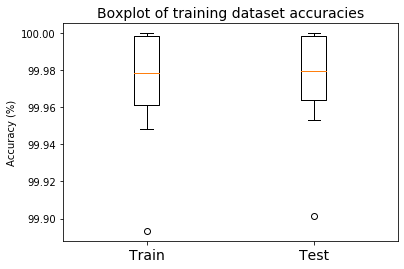

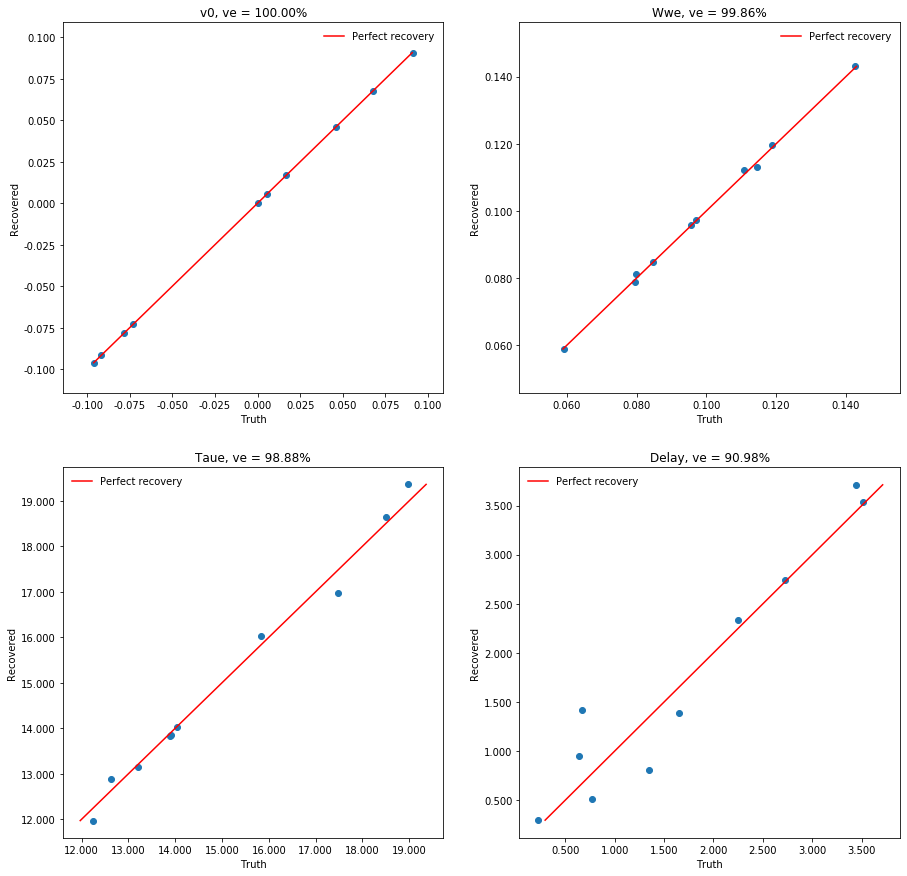

In [7]:
box_accuracies(accuracies=[train_accs_1s, test_accs_1s], labels=['Train', 'Test'])
plot_params_1l(trained_plist_1s, target_plist_1s)

In [ ]:
# really nice initial results: lets play around a bit with n_attempts, num_epochs and learning_rate to try and
# achieve the best training in the shortest time, which will be a key metric for the tool when training more complex
# models. Stick with SSSS model for now, then upgrade when sim_hLN_tf2 has been extended to inhibitory synapses
# try and vary these parameters in a thought out way rather than random for some actually useful results

In [6]:
# list of lists for to define hierarchical clustering
clusts = [[[[[0, 1],[2]],[[3, 4],[5, 6]]],[[[7, 8],[9]],[[10, 11],[12]]]]]
Wce_mult, Wci_mult = create_weights(Jc=Jc_1l, n_levels=1, clusts=clusts)
# tf.concat([Wce[0], Wci[0]], axis=0)

In [6]:
hln_new = hLN_Model(Jc=Jc_1l, Wce=Wce, Wci=Wci, sig_on=tf.constant([False]))
out2 = sim_hLN_tf2(X=inputs, dt=1, Jc=hln_new.Jc, Wce=hln_new.Wce, Wci=Wci_sing, params=hln_new.params, 
            sig_on=hln_new.sig_on)

out1 = sim_hLN_tf(X=inputs, dt=1, Jc=hln_new.Jc, Wce=hln_new.Wce, Wci=Wci_sing, params=hln_new.params, 
            sig_on=hln_new.sig_on)

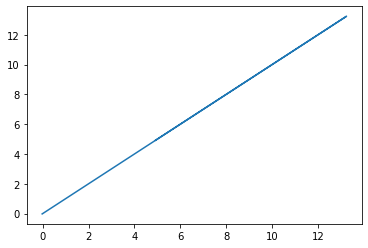

In [7]:
plt.plot(out1.numpy().T, out2.numpy().T)

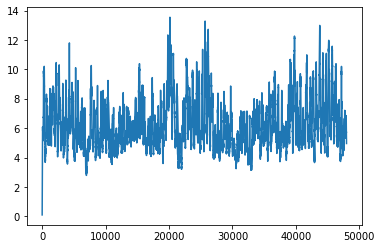

In [9]:
plt.plot(hln_new(inputs).numpy().T)

In [16]:
# training_build showed we could get good results from simple delta input - now try with SSSS model and real inputs
# could run into problems as now we're doing minibatch training due to long time series
# n_attempts=5, num_epochs = 500, learning_rate=0.001
hln_mult = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult, test_accs_mult, trained_plist_mult, target_plist_mult = test_recovery(model=hln_mult, 
                                 inputs=inputs, num_sims=5, n_attempts=5, num_epochs=500, learning_rate=0.001)

100%|██████████| 500/500 [01:50<00:00,  4.51it/s]


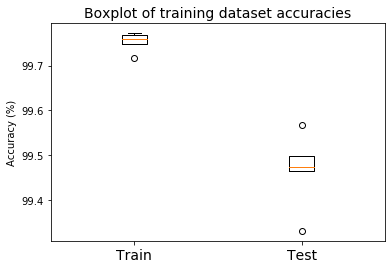

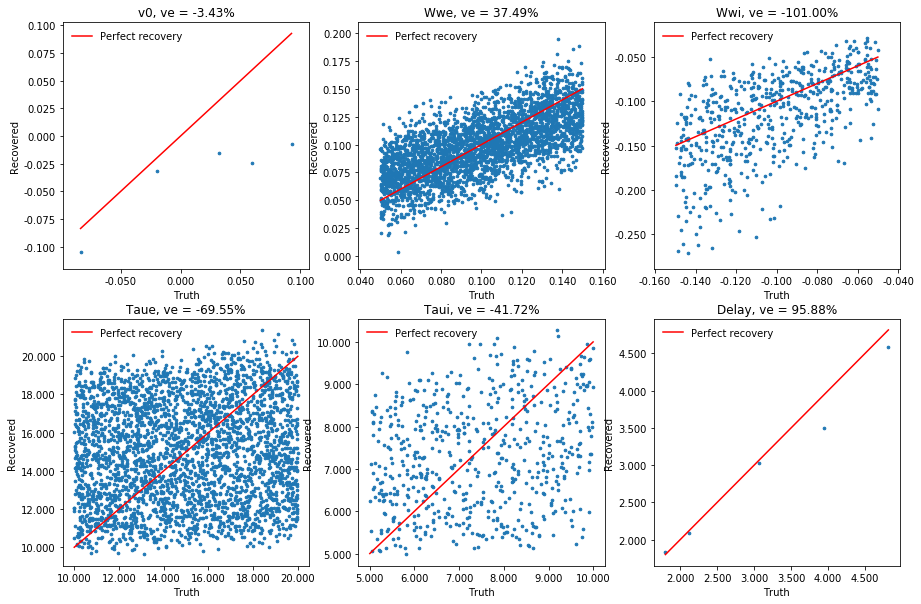

In [46]:
box_accuracies(accuracies=[train_accs_mult, test_accs_mult], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult, target_plist_mult)

In [18]:
# n_attempts=5, num_epochs = 1000, learning_rate=0.001 - slightly better results than 500 epochs
hln_mult2 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult2, test_accs_mult2, trained_plist_mult2, target_plist_mult2 = test_recovery(model=hln_mult2, 
                                 inputs=inputs, num_sims=5, n_attempts=5, num_epochs=1000, learning_rate=0.001)

100%|██████████| 1000/1000 [03:51<00:00,  4.32it/s]


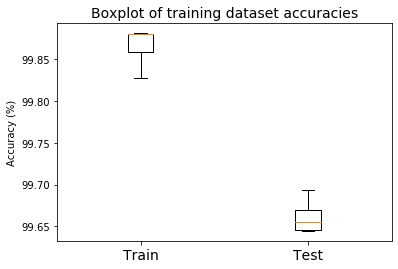

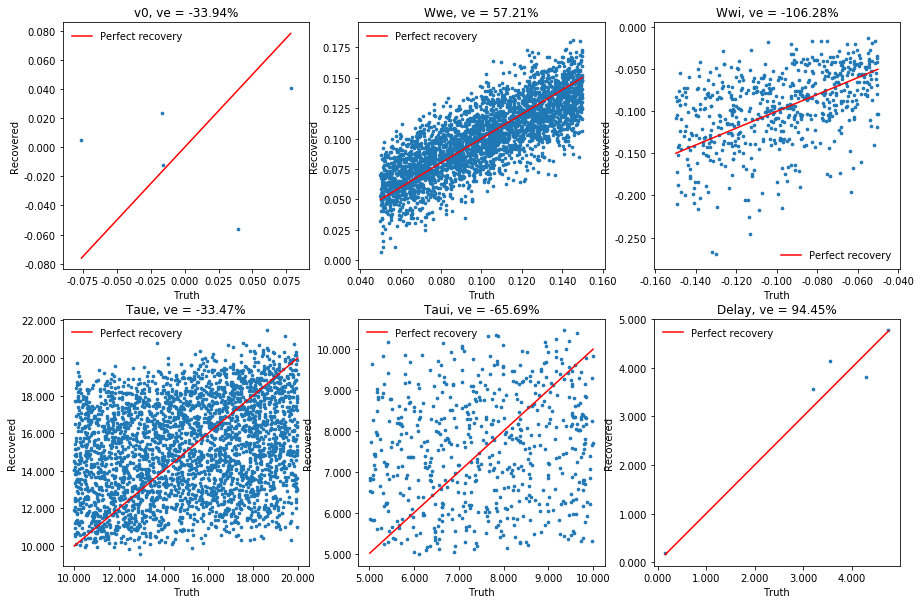

In [47]:
box_accuracies(accuracies=[train_accs_mult2, test_accs_mult2], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult2, target_plist_mult2)

In [21]:
# n_attempts=5, num_epochs = 500, learning_rate=0.01 - worse results that with lower learning rate
hln_mult3 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult3, test_accs_mult3, trained_plist_mult3, target_plist_mult3 = test_recovery(model=hln_mult3, 
                                 inputs=inputs, num_sims=5, n_attempts=5, num_epochs=500, learning_rate=0.01)

100%|██████████| 500/500 [01:47<00:00,  4.64it/s]


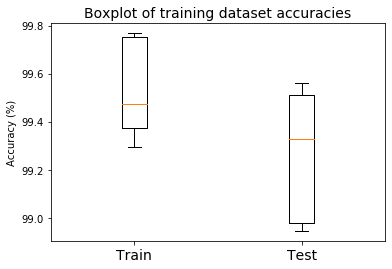

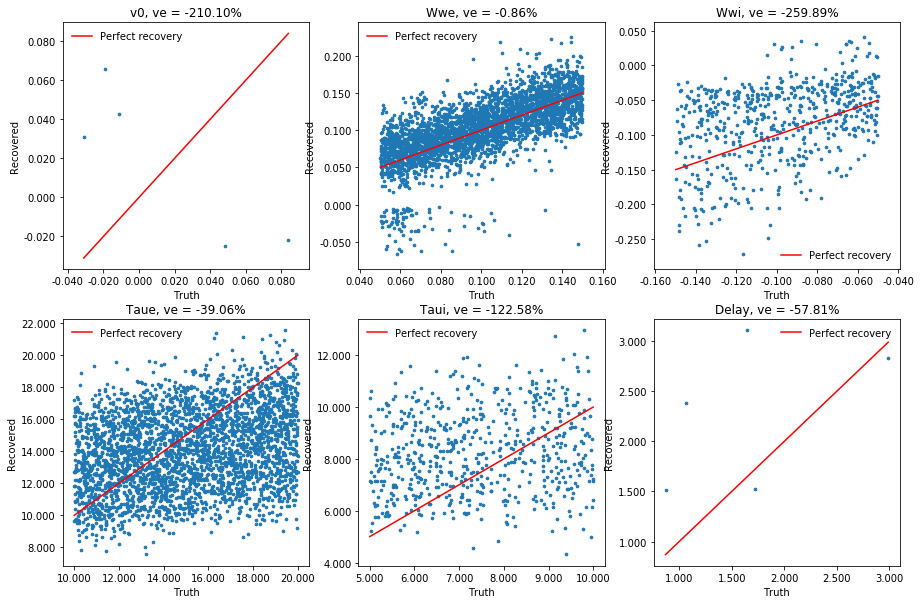

In [48]:
box_accuracies(accuracies=[train_accs_mult3, test_accs_mult3], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult3, target_plist_mult3)

In [7]:
# n_attempts=5, num_epochs = 500, learning_rate=0.005
hln_mult4 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult4, test_accs_mult4, trained_plist_mult4, target_plist_mult4 = test_recovery(model=hln_mult4, 
                                 inputs=inputs, num_sims=5, n_attempts=5, num_epochs=500, learning_rate=0.005)

100%|██████████| 500/500 [01:52<00:00,  4.43it/s]


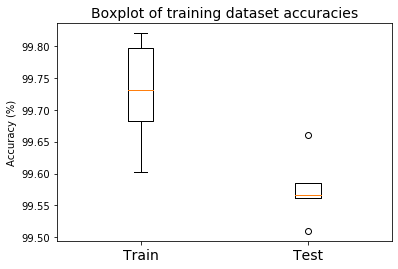

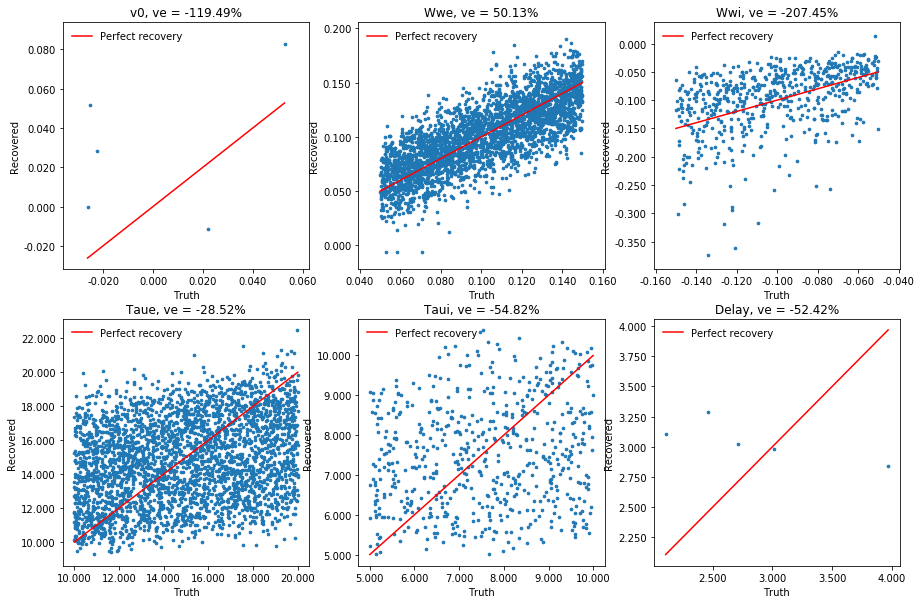

In [8]:
box_accuracies(accuracies=[train_accs_mult4, test_accs_mult4], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult4, target_plist_mult4)

In [9]:
# n_attempts=25, num_epochs = 100, learning_rate=0.001
hln_mult5 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult5, test_accs_mult5, trained_plist_mult5, target_plist_mult5 = test_recovery(model=hln_mult5, 
                                 inputs=inputs, num_sims=5, n_attempts=25, num_epochs=100, learning_rate=0.001)

100%|██████████| 100/100 [00:20<00:00,  4.87it/s]


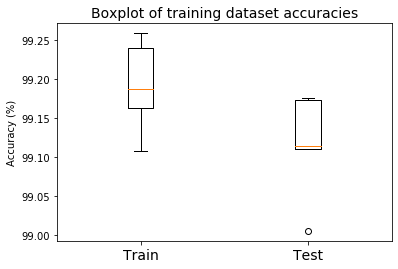

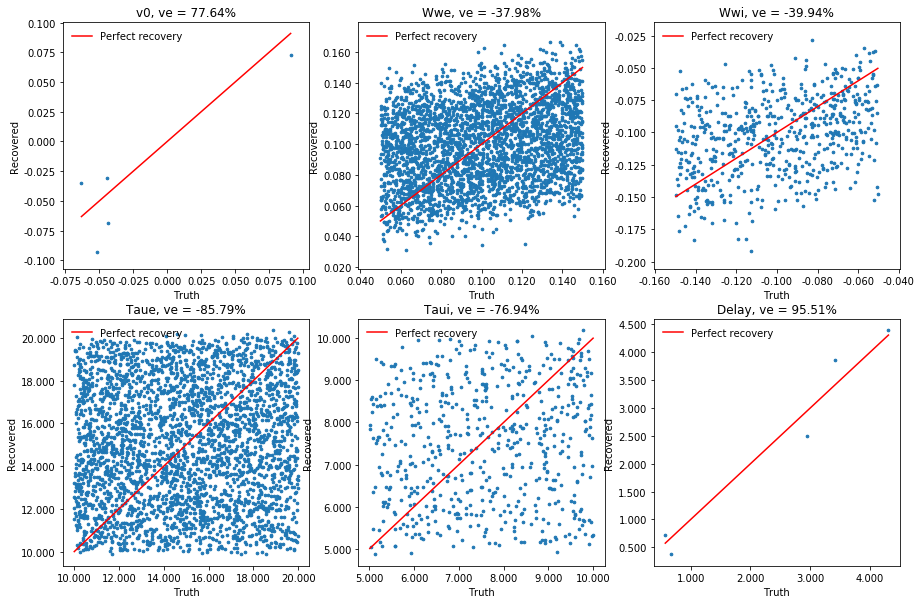

In [10]:
box_accuracies(accuracies=[train_accs_mult5, test_accs_mult5], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult5, target_plist_mult5)

In [11]:
# so far increasing epochs seems to produce the best results: lets try 1 sim, 1 attempt, many epochs and standard
# Adam hyperparameter settings:
hln_mult6 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult6, test_accs_mult6, trained_plist_mult6, target_plist_mult6 = test_recovery(model=hln_mult6, 
                                 inputs=inputs, num_sims=1, n_attempts=1, num_epochs=5000, learning_rate=0.001)

100%|██████████| 5000/5000 [19:20<00:00,  4.31it/s]


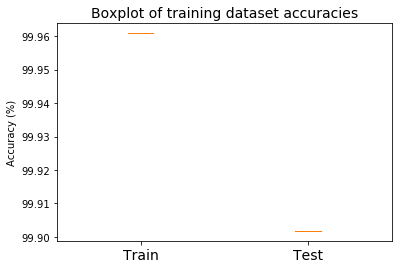

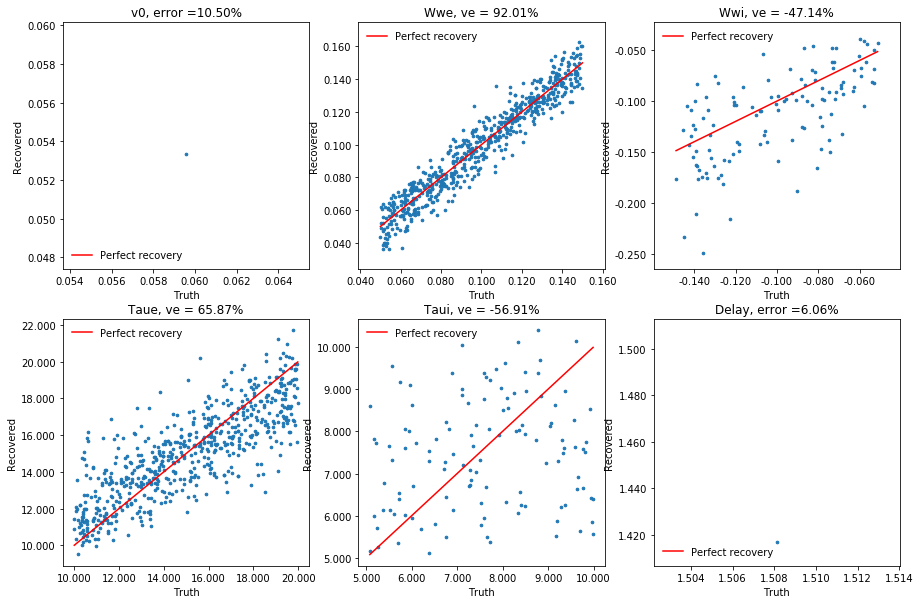

In [12]:
box_accuracies(accuracies=[train_accs_mult6, test_accs_mult6], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult6, target_plist_mult6)

In [13]:
# so far increasing epochs seems to produce the best results: lets try 1 sim, 1 attempt, many epochs and standard
# Adam hyperparameter settings:
hln_mult7 = hLN_Model(Jc=Jc_1l, Wce=Wce_mult, Wci=Wci_mult, sig_on=tf.constant([False]))
train_accs_mult7, test_accs_mult7, trained_plist_mult7, target_plist_mult7 = test_recovery(model=hln_mult7, 
                                 inputs=inputs, num_sims=1, n_attempts=1, num_epochs=10000, learning_rate=0.001)

100%|██████████| 10000/10000 [39:06<00:00,  4.26it/s] 


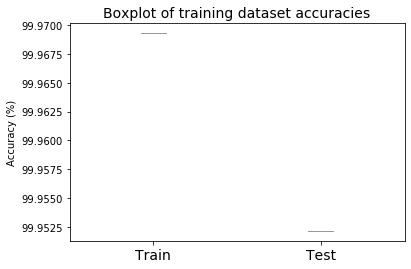

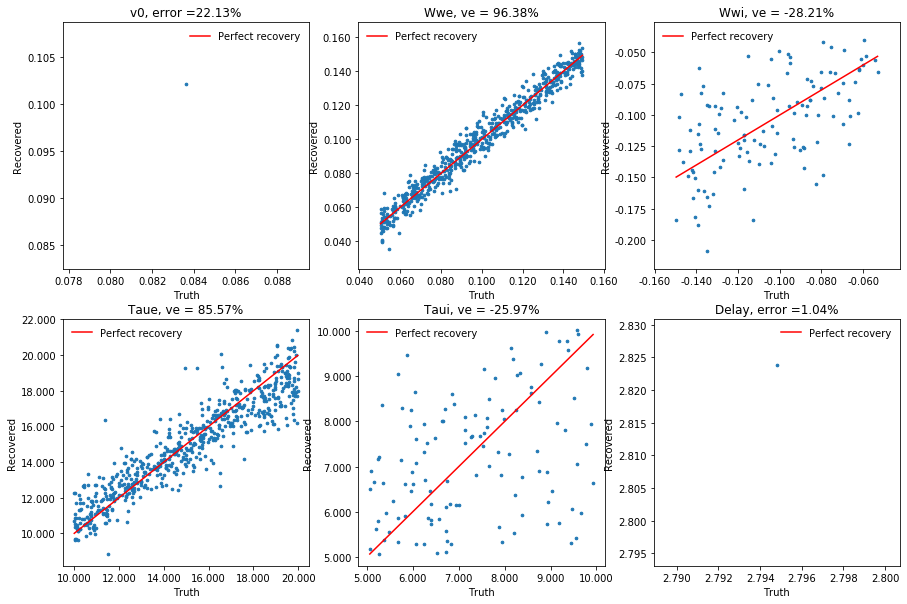

In [14]:
box_accuracies(accuracies=[train_accs_mult7, test_accs_mult7], labels=['Train', 'Test'])
plot_params_1li(trained_plist_mult7, target_plist_mult7)